In [1]:
import argparse
import os
import numpy as np
import math
import sys
import torch
import torch.distributions as distributions
import torchvision.transforms as transforms
from torchvision.utils import save_image
import torch.utils.data as Data
from torch.utils.data import DataLoader
from torchvision import datasets
from torch.autograd import Variable
import torch.nn as nn
import torch.nn.functional as F
import torch
from scipy.io import savemat
import scipy.io as sio
import sys
import importlib
import datetime
import itertools
import pickle
import scipy
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
from numpy import cov
from numpy import trace
from numpy import iscomplexobj
from numpy.random import random
from scipy.linalg import sqrtm
from sklearn.preprocessing import MinMaxScaler

In [2]:
data_dir = "data/case30"
case_dir = os.path.join(data_dir)
number = 20000
train_index = 12000
valid_index = 16000
saveFile = "data/case30/RNN_out/hidden_dim100/S3_100"

In [3]:
#input data
mat_input = os.path.join(case_dir, 'inputdata_sample.mat')
PQ_injection = np.transpose(scipy.io.loadmat(mat_input)['sampledata'])[0:number,:]
P_injection = PQ_injection.real
Q_injection = PQ_injection.imag
# print(Q_injection.shape)
pv = [1-1,2-1,13-1,22-1,23-1,27-1]
slack = 1-1
P_injection = np.delete(P_injection,slack,1)
Q_injection = np.delete(Q_injection,pv,1)
PQ_injection = np.concatenate([P_injection, Q_injection], axis=1)      
print(PQ_injection.shape)
#output data
mat_ang = os.path.join(case_dir, 'voltage_ang_reduced.mat')
mat_mag = os.path.join(case_dir, 'voltage_mag_reduced.mat')
voltage_ang = np.transpose(scipy.io.loadmat(mat_ang)['voltage_ang_reduced'])[0:number,:]
voltage_mag = np.transpose(scipy.io.loadmat(mat_mag)['voltage_mag_reduced'])[0:number,:]
voltage =  np.concatenate([voltage_ang,voltage_mag], axis=1) 
yTrain = torch.from_numpy(voltage[0:train_index,:])
xTrain = torch.from_numpy(PQ_injection[0:train_index,:])
yValid = torch.from_numpy(voltage[train_index:valid_index,:])
xValid = torch.from_numpy(PQ_injection[train_index:valid_index,:])
yTest = torch.from_numpy(voltage[valid_index:number,:])
xTest = torch.from_numpy(PQ_injection[valid_index:number,:])
dataset = torch.utils.data.TensorDataset(xTrain, yTrain)
print(xValid.shape)
print(xTrain.shape)
print(xTest.shape)

(20000, 53)
torch.Size([4000, 53])
torch.Size([12000, 53])
torch.Size([4000, 53])


In [4]:
parser = argparse.ArgumentParser()
parser.add_argument("--n_epochs", type=int, default=500, help="number of epochs of training")
parser.add_argument("--batch_size", type=int, default=32, help="size of the batches")
parser.add_argument("--lr", type=float, default=0.00001, help="learning rate")
parser.add_argument("--n_cpu", type=int, default=8, help="number of cpu threads to use during batch generation")
parser.add_argument("--labels_dim", type=int, default=53, help="dimensionality of the latent space")
parser.add_argument("--img_size", type=int, default=53, help="size of each image dimension")
parser.add_argument("--hidden1_dim", type=int, default=100, help="size of hidden_dim")
parser.add_argument("--output1_dim", type=int, default=100, help="size of hidden_dim")
opt = parser.parse_args(args=[])
print(opt)

Namespace(batch_size=32, hidden1_dim=100, img_size=53, labels_dim=53, lr=1e-05, n_cpu=8, n_epochs=500, output1_dim=100)


In [5]:
cuda = True if torch.cuda.is_available() else False
class BasicBlock(nn.Module):
    def __init__(self, in_feat, hidden_feat, out_feat):
        super(BasicBlock, self).__init__()
        self.layers = nn.Linear(in_feat, out_feat)
        self.layers1 = nn.Linear(in_feat, hidden_feat)
        self.relu = nn.ReLU(inplace=True)
        self.layers2 = nn.Linear(hidden_feat, out_feat)

    def forward(self, x):
        identity = self.layers(x)

        out = self.layers1(x)
        out = self.relu(out)

        out = self.layers2(out)

        out = identity + out
        out = self.relu(out)

        return out
class Resnet(nn.Module):
    def __init__(self, block):
        super(Resnet, self).__init__()
        self.layers = torch.nn.ModuleList()
        self.block = block
        self.model = nn.Sequential(
            block(opt.labels_dim,opt.hidden1_dim,opt.output1_dim),
            #block(opt.output1_dim,opt.hidden2_dim,opt.output2_dim),
            #block(opt.output1_dim,opt.hidden2_dim,opt.output2_dim),
            nn.Linear(opt.output1_dim,opt.img_size),
        )   
    def forward(self, x):
        out = self.model(x)
        return out
MLP = Resnet(BasicBlock)

In [6]:
# Initialize generator and discriminator
time = []
loss_train = []  
loss_valid = [] 
batch_loss_train = [] 
avg_train_losses = []
L2_loss = nn.MSELoss()
if cuda:
    MLP.cuda()
    L2_loss.cuda()
# Configure data loader
dataloader = torch.utils.data.DataLoader(
    dataset,
    batch_size=opt.batch_size,
    shuffle=True,
)

# Optimizers
optimizer = torch.optim.Adam(MLP.parameters(), lr=opt.lr)
Tensor = torch.cuda.FloatTensor if cuda else torch.FloatTensor
# Create batch of latent vectors that we will use to check the progression of the generator
# ----------
#  Training
# ----------

batches_done = 0

for epoch in range(opt.n_epochs):

    for i, (xTrain, yTrain) in enumerate(dataloader):
        # Configure input
            # -----------------
            #  Train Generator
            # -----------------
            startTime = datetime.datetime.now()
            optimizer.zero_grad()
            # Generate a batch of images
            yHatTrain = MLP(xTrain.float())
            # Adversarial loss
            loss = L2_loss(yHatTrain,yTrain.float())
            loss.backward()
            optimizer.step()
            endTime = datetime.datetime.now()
            timeElapsed = abs(endTime - startTime).total_seconds()
            time.append(timeElapsed)
            batch_loss_train.append(loss.item()) 
            print(
                "[Epoch %d/%d] [Batch %d/%d][G loss: %.8f]"
                % (epoch, opt.n_epochs, batches_done % len(dataloader), len(dataloader), loss.item())
            )         
            if (batches_done % (len(yValid)//opt.batch_size) == 0):
                
                with torch.no_grad(): 
                    yHatValid = MLP(xValid.float()) 
                    # Compute loss
                    lossValueValid = L2_loss(yHatValid, yValid)
                    loss_valid.append(lossValueValid.item())
                
                if epoch >= 499:
                    if (epoch == 499):
                        bestScore = lossValueValid
                        torch.save(MLP.state_dict(), saveFile +'Best'+'.ckpt')
                        torch.save(optimizer.state_dict(), saveFile+'Optim'+'Best'+'.ckpt')
                    else:
                        thisValidScore = lossValueValid
                        if thisValidScore < bestScore:
                            bestScore = thisValidScore
                            torch.save(MLP.state_dict(), saveFile + 'Best'+'.ckpt')
                            torch.save(optimizer.state_dict(), saveFile+'Optim'+'Best'+'.ckpt')                    
            batches_done += 1
    train_loss = np.average(batch_loss_train)
    avg_train_losses.append(train_loss)
    batch_loss_train = []
#     if(epoch ==49):
#         break

[Epoch 0/500] [Batch 0/375][G loss: 0.43056381]
[Epoch 0/500] [Batch 1/375][G loss: 0.43065053]
[Epoch 0/500] [Batch 2/375][G loss: 0.43030533]
[Epoch 0/500] [Batch 3/375][G loss: 0.42941028]
[Epoch 0/500] [Batch 4/375][G loss: 0.43065491]
[Epoch 0/500] [Batch 5/375][G loss: 0.42942944]
[Epoch 0/500] [Batch 6/375][G loss: 0.42933995]
[Epoch 0/500] [Batch 7/375][G loss: 0.43002343]
[Epoch 0/500] [Batch 8/375][G loss: 0.42808145]
[Epoch 0/500] [Batch 9/375][G loss: 0.42892605]
[Epoch 0/500] [Batch 10/375][G loss: 0.42913103]
[Epoch 0/500] [Batch 11/375][G loss: 0.42813498]
[Epoch 0/500] [Batch 12/375][G loss: 0.42855650]
[Epoch 0/500] [Batch 13/375][G loss: 0.42743653]
[Epoch 0/500] [Batch 14/375][G loss: 0.42868006]
[Epoch 0/500] [Batch 15/375][G loss: 0.42827109]
[Epoch 0/500] [Batch 16/375][G loss: 0.42863259]
[Epoch 0/500] [Batch 17/375][G loss: 0.42733121]
[Epoch 0/500] [Batch 18/375][G loss: 0.42724454]
[Epoch 0/500] [Batch 19/375][G loss: 0.42804971]
[Epoch 0/500] [Batch 20/375][G

[Epoch 0/500] [Batch 273/375][G loss: 0.38947511]
[Epoch 0/500] [Batch 274/375][G loss: 0.38919741]
[Epoch 0/500] [Batch 275/375][G loss: 0.38887268]
[Epoch 0/500] [Batch 276/375][G loss: 0.38969669]
[Epoch 0/500] [Batch 277/375][G loss: 0.39025170]
[Epoch 0/500] [Batch 278/375][G loss: 0.38928303]
[Epoch 0/500] [Batch 279/375][G loss: 0.38871223]
[Epoch 0/500] [Batch 280/375][G loss: 0.38842121]
[Epoch 0/500] [Batch 281/375][G loss: 0.38893113]
[Epoch 0/500] [Batch 282/375][G loss: 0.38852537]
[Epoch 0/500] [Batch 283/375][G loss: 0.38728544]
[Epoch 0/500] [Batch 284/375][G loss: 0.38861859]
[Epoch 0/500] [Batch 285/375][G loss: 0.38879180]
[Epoch 0/500] [Batch 286/375][G loss: 0.38779578]
[Epoch 0/500] [Batch 287/375][G loss: 0.38825282]
[Epoch 0/500] [Batch 288/375][G loss: 0.38683477]
[Epoch 0/500] [Batch 289/375][G loss: 0.38786173]
[Epoch 0/500] [Batch 290/375][G loss: 0.38774052]
[Epoch 0/500] [Batch 291/375][G loss: 0.38799664]
[Epoch 0/500] [Batch 292/375][G loss: 0.38770482]


[Epoch 1/500] [Batch 174/375][G loss: 0.33837011]
[Epoch 1/500] [Batch 175/375][G loss: 0.33658212]
[Epoch 1/500] [Batch 176/375][G loss: 0.33887067]
[Epoch 1/500] [Batch 177/375][G loss: 0.33737856]
[Epoch 1/500] [Batch 178/375][G loss: 0.33711243]
[Epoch 1/500] [Batch 179/375][G loss: 0.33632100]
[Epoch 1/500] [Batch 180/375][G loss: 0.33607295]
[Epoch 1/500] [Batch 181/375][G loss: 0.33683106]
[Epoch 1/500] [Batch 182/375][G loss: 0.33497640]
[Epoch 1/500] [Batch 183/375][G loss: 0.33509380]
[Epoch 1/500] [Batch 184/375][G loss: 0.33524108]
[Epoch 1/500] [Batch 185/375][G loss: 0.33434296]
[Epoch 1/500] [Batch 186/375][G loss: 0.33502284]
[Epoch 1/500] [Batch 187/375][G loss: 0.33499166]
[Epoch 1/500] [Batch 188/375][G loss: 0.33499870]
[Epoch 1/500] [Batch 189/375][G loss: 0.33613446]
[Epoch 1/500] [Batch 190/375][G loss: 0.33545732]
[Epoch 1/500] [Batch 191/375][G loss: 0.33552608]
[Epoch 1/500] [Batch 192/375][G loss: 0.33419415]
[Epoch 1/500] [Batch 193/375][G loss: 0.33295399]


[Epoch 2/500] [Batch 70/375][G loss: 0.27071619]
[Epoch 2/500] [Batch 71/375][G loss: 0.27257138]
[Epoch 2/500] [Batch 72/375][G loss: 0.27119952]
[Epoch 2/500] [Batch 73/375][G loss: 0.27066123]
[Epoch 2/500] [Batch 74/375][G loss: 0.26728937]
[Epoch 2/500] [Batch 75/375][G loss: 0.26964048]
[Epoch 2/500] [Batch 76/375][G loss: 0.26765662]
[Epoch 2/500] [Batch 77/375][G loss: 0.27233022]
[Epoch 2/500] [Batch 78/375][G loss: 0.27079222]
[Epoch 2/500] [Batch 79/375][G loss: 0.26939005]
[Epoch 2/500] [Batch 80/375][G loss: 0.26874807]
[Epoch 2/500] [Batch 81/375][G loss: 0.27030089]
[Epoch 2/500] [Batch 82/375][G loss: 0.26773286]
[Epoch 2/500] [Batch 83/375][G loss: 0.26847437]
[Epoch 2/500] [Batch 84/375][G loss: 0.26883876]
[Epoch 2/500] [Batch 85/375][G loss: 0.26595113]
[Epoch 2/500] [Batch 86/375][G loss: 0.26799005]
[Epoch 2/500] [Batch 87/375][G loss: 0.26754421]
[Epoch 2/500] [Batch 88/375][G loss: 0.26529169]
[Epoch 2/500] [Batch 89/375][G loss: 0.26767033]
[Epoch 2/500] [Batch

[Epoch 2/500] [Batch 341/375][G loss: 0.19274075]
[Epoch 2/500] [Batch 342/375][G loss: 0.19563545]
[Epoch 2/500] [Batch 343/375][G loss: 0.19370727]
[Epoch 2/500] [Batch 344/375][G loss: 0.19052465]
[Epoch 2/500] [Batch 345/375][G loss: 0.19070816]
[Epoch 2/500] [Batch 346/375][G loss: 0.18944618]
[Epoch 2/500] [Batch 347/375][G loss: 0.19468185]
[Epoch 2/500] [Batch 348/375][G loss: 0.19062763]
[Epoch 2/500] [Batch 349/375][G loss: 0.18847059]
[Epoch 2/500] [Batch 350/375][G loss: 0.19011042]
[Epoch 2/500] [Batch 351/375][G loss: 0.19235770]
[Epoch 2/500] [Batch 352/375][G loss: 0.19184947]
[Epoch 2/500] [Batch 353/375][G loss: 0.19328298]
[Epoch 2/500] [Batch 354/375][G loss: 0.19054294]
[Epoch 2/500] [Batch 355/375][G loss: 0.18644369]
[Epoch 2/500] [Batch 356/375][G loss: 0.18727244]
[Epoch 2/500] [Batch 357/375][G loss: 0.18796952]
[Epoch 2/500] [Batch 358/375][G loss: 0.18650019]
[Epoch 2/500] [Batch 359/375][G loss: 0.18470927]
[Epoch 2/500] [Batch 360/375][G loss: 0.18726134]


[Epoch 3/500] [Batch 246/375][G loss: 0.11355285]
[Epoch 3/500] [Batch 247/375][G loss: 0.11050501]
[Epoch 3/500] [Batch 248/375][G loss: 0.11124168]
[Epoch 3/500] [Batch 249/375][G loss: 0.11058968]
[Epoch 3/500] [Batch 250/375][G loss: 0.10962716]
[Epoch 3/500] [Batch 251/375][G loss: 0.10917688]
[Epoch 3/500] [Batch 252/375][G loss: 0.11188124]
[Epoch 3/500] [Batch 253/375][G loss: 0.10701240]
[Epoch 3/500] [Batch 254/375][G loss: 0.11085141]
[Epoch 3/500] [Batch 255/375][G loss: 0.11264776]
[Epoch 3/500] [Batch 256/375][G loss: 0.10959284]
[Epoch 3/500] [Batch 257/375][G loss: 0.11422301]
[Epoch 3/500] [Batch 258/375][G loss: 0.10806624]
[Epoch 3/500] [Batch 259/375][G loss: 0.10857540]
[Epoch 3/500] [Batch 260/375][G loss: 0.10950609]
[Epoch 3/500] [Batch 261/375][G loss: 0.10539776]
[Epoch 3/500] [Batch 262/375][G loss: 0.10664502]
[Epoch 3/500] [Batch 263/375][G loss: 0.10839346]
[Epoch 3/500] [Batch 264/375][G loss: 0.10363276]
[Epoch 3/500] [Batch 265/375][G loss: 0.10650335]


[Epoch 4/500] [Batch 139/375][G loss: 0.05324604]
[Epoch 4/500] [Batch 140/375][G loss: 0.05305778]
[Epoch 4/500] [Batch 141/375][G loss: 0.05165876]
[Epoch 4/500] [Batch 142/375][G loss: 0.05508740]
[Epoch 4/500] [Batch 143/375][G loss: 0.05069540]
[Epoch 4/500] [Batch 144/375][G loss: 0.05123702]
[Epoch 4/500] [Batch 145/375][G loss: 0.05252038]
[Epoch 4/500] [Batch 146/375][G loss: 0.05133079]
[Epoch 4/500] [Batch 147/375][G loss: 0.05247264]
[Epoch 4/500] [Batch 148/375][G loss: 0.05068118]
[Epoch 4/500] [Batch 149/375][G loss: 0.05091251]
[Epoch 4/500] [Batch 150/375][G loss: 0.05124968]
[Epoch 4/500] [Batch 151/375][G loss: 0.04999897]
[Epoch 4/500] [Batch 152/375][G loss: 0.05196493]
[Epoch 4/500] [Batch 153/375][G loss: 0.04954086]
[Epoch 4/500] [Batch 154/375][G loss: 0.05038913]
[Epoch 4/500] [Batch 155/375][G loss: 0.05199552]
[Epoch 4/500] [Batch 156/375][G loss: 0.05124107]
[Epoch 4/500] [Batch 157/375][G loss: 0.04899662]
[Epoch 4/500] [Batch 158/375][G loss: 0.05264049]


[Epoch 5/500] [Batch 40/375][G loss: 0.02210484]
[Epoch 5/500] [Batch 41/375][G loss: 0.02143276]
[Epoch 5/500] [Batch 42/375][G loss: 0.02276715]
[Epoch 5/500] [Batch 43/375][G loss: 0.02275932]
[Epoch 5/500] [Batch 44/375][G loss: 0.02016041]
[Epoch 5/500] [Batch 45/375][G loss: 0.02166162]
[Epoch 5/500] [Batch 46/375][G loss: 0.02052571]
[Epoch 5/500] [Batch 47/375][G loss: 0.02040765]
[Epoch 5/500] [Batch 48/375][G loss: 0.02136973]
[Epoch 5/500] [Batch 49/375][G loss: 0.02262827]
[Epoch 5/500] [Batch 50/375][G loss: 0.02136310]
[Epoch 5/500] [Batch 51/375][G loss: 0.01840593]
[Epoch 5/500] [Batch 52/375][G loss: 0.01967705]
[Epoch 5/500] [Batch 53/375][G loss: 0.02018173]
[Epoch 5/500] [Batch 54/375][G loss: 0.01986610]
[Epoch 5/500] [Batch 55/375][G loss: 0.01980170]
[Epoch 5/500] [Batch 56/375][G loss: 0.02115886]
[Epoch 5/500] [Batch 57/375][G loss: 0.01959568]
[Epoch 5/500] [Batch 58/375][G loss: 0.01956759]
[Epoch 5/500] [Batch 59/375][G loss: 0.02064321]
[Epoch 5/500] [Batch

[Epoch 5/500] [Batch 315/375][G loss: 0.00906026]
[Epoch 5/500] [Batch 316/375][G loss: 0.00786231]
[Epoch 5/500] [Batch 317/375][G loss: 0.00886246]
[Epoch 5/500] [Batch 318/375][G loss: 0.00955141]
[Epoch 5/500] [Batch 319/375][G loss: 0.00808667]
[Epoch 5/500] [Batch 320/375][G loss: 0.00829163]
[Epoch 5/500] [Batch 321/375][G loss: 0.00749569]
[Epoch 5/500] [Batch 322/375][G loss: 0.00848484]
[Epoch 5/500] [Batch 323/375][G loss: 0.00790403]
[Epoch 5/500] [Batch 324/375][G loss: 0.00802396]
[Epoch 5/500] [Batch 325/375][G loss: 0.00863030]
[Epoch 5/500] [Batch 326/375][G loss: 0.00796542]
[Epoch 5/500] [Batch 327/375][G loss: 0.00761877]
[Epoch 5/500] [Batch 328/375][G loss: 0.00946715]
[Epoch 5/500] [Batch 329/375][G loss: 0.00831538]
[Epoch 5/500] [Batch 330/375][G loss: 0.00796125]
[Epoch 5/500] [Batch 331/375][G loss: 0.01008555]
[Epoch 5/500] [Batch 332/375][G loss: 0.00832697]
[Epoch 5/500] [Batch 333/375][G loss: 0.00808881]
[Epoch 5/500] [Batch 334/375][G loss: 0.00838218]


[Epoch 6/500] [Batch 215/375][G loss: 0.00460792]
[Epoch 6/500] [Batch 216/375][G loss: 0.00513644]
[Epoch 6/500] [Batch 217/375][G loss: 0.00400795]
[Epoch 6/500] [Batch 218/375][G loss: 0.00406200]
[Epoch 6/500] [Batch 219/375][G loss: 0.00394333]
[Epoch 6/500] [Batch 220/375][G loss: 0.00376005]
[Epoch 6/500] [Batch 221/375][G loss: 0.00443644]
[Epoch 6/500] [Batch 222/375][G loss: 0.00399943]
[Epoch 6/500] [Batch 223/375][G loss: 0.00466521]
[Epoch 6/500] [Batch 224/375][G loss: 0.00372303]
[Epoch 6/500] [Batch 225/375][G loss: 0.00460681]
[Epoch 6/500] [Batch 226/375][G loss: 0.00384268]
[Epoch 6/500] [Batch 227/375][G loss: 0.00409905]
[Epoch 6/500] [Batch 228/375][G loss: 0.00416522]
[Epoch 6/500] [Batch 229/375][G loss: 0.00385546]
[Epoch 6/500] [Batch 230/375][G loss: 0.00436413]
[Epoch 6/500] [Batch 231/375][G loss: 0.00402138]
[Epoch 6/500] [Batch 232/375][G loss: 0.00446390]
[Epoch 6/500] [Batch 233/375][G loss: 0.00398560]
[Epoch 6/500] [Batch 234/375][G loss: 0.00406287]


[Epoch 7/500] [Batch 113/375][G loss: 0.00241033]
[Epoch 7/500] [Batch 114/375][G loss: 0.00257186]
[Epoch 7/500] [Batch 115/375][G loss: 0.00220596]
[Epoch 7/500] [Batch 116/375][G loss: 0.00207052]
[Epoch 7/500] [Batch 117/375][G loss: 0.00348418]
[Epoch 7/500] [Batch 118/375][G loss: 0.00258477]
[Epoch 7/500] [Batch 119/375][G loss: 0.00249620]
[Epoch 7/500] [Batch 120/375][G loss: 0.00223951]
[Epoch 7/500] [Batch 121/375][G loss: 0.00323819]
[Epoch 7/500] [Batch 122/375][G loss: 0.00290338]
[Epoch 7/500] [Batch 123/375][G loss: 0.00242822]
[Epoch 7/500] [Batch 124/375][G loss: 0.00264093]
[Epoch 7/500] [Batch 125/375][G loss: 0.00282765]
[Epoch 7/500] [Batch 126/375][G loss: 0.00270866]
[Epoch 7/500] [Batch 127/375][G loss: 0.00236434]
[Epoch 7/500] [Batch 128/375][G loss: 0.00259969]
[Epoch 7/500] [Batch 129/375][G loss: 0.00311906]
[Epoch 7/500] [Batch 130/375][G loss: 0.00353094]
[Epoch 7/500] [Batch 131/375][G loss: 0.00305430]
[Epoch 7/500] [Batch 132/375][G loss: 0.00279246]


[Epoch 8/500] [Batch 2/375][G loss: 0.00217238]
[Epoch 8/500] [Batch 3/375][G loss: 0.00198469]
[Epoch 8/500] [Batch 4/375][G loss: 0.00191328]
[Epoch 8/500] [Batch 5/375][G loss: 0.00174152]
[Epoch 8/500] [Batch 6/375][G loss: 0.00269333]
[Epoch 8/500] [Batch 7/375][G loss: 0.00190788]
[Epoch 8/500] [Batch 8/375][G loss: 0.00229073]
[Epoch 8/500] [Batch 9/375][G loss: 0.00216525]
[Epoch 8/500] [Batch 10/375][G loss: 0.00200067]
[Epoch 8/500] [Batch 11/375][G loss: 0.00235366]
[Epoch 8/500] [Batch 12/375][G loss: 0.00209026]
[Epoch 8/500] [Batch 13/375][G loss: 0.00217687]
[Epoch 8/500] [Batch 14/375][G loss: 0.00213099]
[Epoch 8/500] [Batch 15/375][G loss: 0.00228328]
[Epoch 8/500] [Batch 16/375][G loss: 0.00271247]
[Epoch 8/500] [Batch 17/375][G loss: 0.00203887]
[Epoch 8/500] [Batch 18/375][G loss: 0.00216351]
[Epoch 8/500] [Batch 19/375][G loss: 0.00225805]
[Epoch 8/500] [Batch 20/375][G loss: 0.00211938]
[Epoch 8/500] [Batch 21/375][G loss: 0.00252313]
[Epoch 8/500] [Batch 22/375]

[Epoch 8/500] [Batch 276/375][G loss: 0.00173897]
[Epoch 8/500] [Batch 277/375][G loss: 0.00226937]
[Epoch 8/500] [Batch 278/375][G loss: 0.00271125]
[Epoch 8/500] [Batch 279/375][G loss: 0.00219490]
[Epoch 8/500] [Batch 280/375][G loss: 0.00140368]
[Epoch 8/500] [Batch 281/375][G loss: 0.00186774]
[Epoch 8/500] [Batch 282/375][G loss: 0.00187782]
[Epoch 8/500] [Batch 283/375][G loss: 0.00255759]
[Epoch 8/500] [Batch 284/375][G loss: 0.00189287]
[Epoch 8/500] [Batch 285/375][G loss: 0.00208253]
[Epoch 8/500] [Batch 286/375][G loss: 0.00229754]
[Epoch 8/500] [Batch 287/375][G loss: 0.00205892]
[Epoch 8/500] [Batch 288/375][G loss: 0.00174524]
[Epoch 8/500] [Batch 289/375][G loss: 0.00178936]
[Epoch 8/500] [Batch 290/375][G loss: 0.00225196]
[Epoch 8/500] [Batch 291/375][G loss: 0.00168041]
[Epoch 8/500] [Batch 292/375][G loss: 0.00163090]
[Epoch 8/500] [Batch 293/375][G loss: 0.00198852]
[Epoch 8/500] [Batch 294/375][G loss: 0.00216667]
[Epoch 8/500] [Batch 295/375][G loss: 0.00215678]


[Epoch 9/500] [Batch 174/375][G loss: 0.00201150]
[Epoch 9/500] [Batch 175/375][G loss: 0.00133315]
[Epoch 9/500] [Batch 176/375][G loss: 0.00176945]
[Epoch 9/500] [Batch 177/375][G loss: 0.00189611]
[Epoch 9/500] [Batch 178/375][G loss: 0.00201861]
[Epoch 9/500] [Batch 179/375][G loss: 0.00239661]
[Epoch 9/500] [Batch 180/375][G loss: 0.00144474]
[Epoch 9/500] [Batch 181/375][G loss: 0.00178531]
[Epoch 9/500] [Batch 182/375][G loss: 0.00202612]
[Epoch 9/500] [Batch 183/375][G loss: 0.00185876]
[Epoch 9/500] [Batch 184/375][G loss: 0.00136223]
[Epoch 9/500] [Batch 185/375][G loss: 0.00227909]
[Epoch 9/500] [Batch 186/375][G loss: 0.00166198]
[Epoch 9/500] [Batch 187/375][G loss: 0.00166522]
[Epoch 9/500] [Batch 188/375][G loss: 0.00177439]
[Epoch 9/500] [Batch 189/375][G loss: 0.00231276]
[Epoch 9/500] [Batch 190/375][G loss: 0.00183285]
[Epoch 9/500] [Batch 191/375][G loss: 0.00116198]
[Epoch 9/500] [Batch 192/375][G loss: 0.00206759]
[Epoch 9/500] [Batch 193/375][G loss: 0.00164548]


[Epoch 10/500] [Batch 67/375][G loss: 0.00175189]
[Epoch 10/500] [Batch 68/375][G loss: 0.00162532]
[Epoch 10/500] [Batch 69/375][G loss: 0.00168995]
[Epoch 10/500] [Batch 70/375][G loss: 0.00184657]
[Epoch 10/500] [Batch 71/375][G loss: 0.00234827]
[Epoch 10/500] [Batch 72/375][G loss: 0.00172278]
[Epoch 10/500] [Batch 73/375][G loss: 0.00186341]
[Epoch 10/500] [Batch 74/375][G loss: 0.00202046]
[Epoch 10/500] [Batch 75/375][G loss: 0.00182087]
[Epoch 10/500] [Batch 76/375][G loss: 0.00155434]
[Epoch 10/500] [Batch 77/375][G loss: 0.00182268]
[Epoch 10/500] [Batch 78/375][G loss: 0.00174745]
[Epoch 10/500] [Batch 79/375][G loss: 0.00198692]
[Epoch 10/500] [Batch 80/375][G loss: 0.00186397]
[Epoch 10/500] [Batch 81/375][G loss: 0.00156080]
[Epoch 10/500] [Batch 82/375][G loss: 0.00186873]
[Epoch 10/500] [Batch 83/375][G loss: 0.00206816]
[Epoch 10/500] [Batch 84/375][G loss: 0.00150316]
[Epoch 10/500] [Batch 85/375][G loss: 0.00151565]
[Epoch 10/500] [Batch 86/375][G loss: 0.00197187]


[Epoch 10/500] [Batch 339/375][G loss: 0.00145995]
[Epoch 10/500] [Batch 340/375][G loss: 0.00188992]
[Epoch 10/500] [Batch 341/375][G loss: 0.00107605]
[Epoch 10/500] [Batch 342/375][G loss: 0.00152838]
[Epoch 10/500] [Batch 343/375][G loss: 0.00163080]
[Epoch 10/500] [Batch 344/375][G loss: 0.00145210]
[Epoch 10/500] [Batch 345/375][G loss: 0.00215270]
[Epoch 10/500] [Batch 346/375][G loss: 0.00133128]
[Epoch 10/500] [Batch 347/375][G loss: 0.00162879]
[Epoch 10/500] [Batch 348/375][G loss: 0.00197753]
[Epoch 10/500] [Batch 349/375][G loss: 0.00161283]
[Epoch 10/500] [Batch 350/375][G loss: 0.00201114]
[Epoch 10/500] [Batch 351/375][G loss: 0.00222214]
[Epoch 10/500] [Batch 352/375][G loss: 0.00191354]
[Epoch 10/500] [Batch 353/375][G loss: 0.00175609]
[Epoch 10/500] [Batch 354/375][G loss: 0.00191887]
[Epoch 10/500] [Batch 355/375][G loss: 0.00174744]
[Epoch 10/500] [Batch 356/375][G loss: 0.00198949]
[Epoch 10/500] [Batch 357/375][G loss: 0.00161579]
[Epoch 10/500] [Batch 358/375][

[Epoch 11/500] [Batch 230/375][G loss: 0.00175086]
[Epoch 11/500] [Batch 231/375][G loss: 0.00231261]
[Epoch 11/500] [Batch 232/375][G loss: 0.00186894]
[Epoch 11/500] [Batch 233/375][G loss: 0.00146337]
[Epoch 11/500] [Batch 234/375][G loss: 0.00123920]
[Epoch 11/500] [Batch 235/375][G loss: 0.00156606]
[Epoch 11/500] [Batch 236/375][G loss: 0.00204780]
[Epoch 11/500] [Batch 237/375][G loss: 0.00161439]
[Epoch 11/500] [Batch 238/375][G loss: 0.00224905]
[Epoch 11/500] [Batch 239/375][G loss: 0.00211398]
[Epoch 11/500] [Batch 240/375][G loss: 0.00155745]
[Epoch 11/500] [Batch 241/375][G loss: 0.00156386]
[Epoch 11/500] [Batch 242/375][G loss: 0.00131293]
[Epoch 11/500] [Batch 243/375][G loss: 0.00184592]
[Epoch 11/500] [Batch 244/375][G loss: 0.00127711]
[Epoch 11/500] [Batch 245/375][G loss: 0.00169119]
[Epoch 11/500] [Batch 246/375][G loss: 0.00169039]
[Epoch 11/500] [Batch 247/375][G loss: 0.00126543]
[Epoch 11/500] [Batch 248/375][G loss: 0.00134874]
[Epoch 11/500] [Batch 249/375][

[Epoch 12/500] [Batch 126/375][G loss: 0.00119524]
[Epoch 12/500] [Batch 127/375][G loss: 0.00100697]
[Epoch 12/500] [Batch 128/375][G loss: 0.00165886]
[Epoch 12/500] [Batch 129/375][G loss: 0.00153210]
[Epoch 12/500] [Batch 130/375][G loss: 0.00163715]
[Epoch 12/500] [Batch 131/375][G loss: 0.00149830]
[Epoch 12/500] [Batch 132/375][G loss: 0.00159115]
[Epoch 12/500] [Batch 133/375][G loss: 0.00126329]
[Epoch 12/500] [Batch 134/375][G loss: 0.00196448]
[Epoch 12/500] [Batch 135/375][G loss: 0.00209406]
[Epoch 12/500] [Batch 136/375][G loss: 0.00179060]
[Epoch 12/500] [Batch 137/375][G loss: 0.00153271]
[Epoch 12/500] [Batch 138/375][G loss: 0.00111771]
[Epoch 12/500] [Batch 139/375][G loss: 0.00167778]
[Epoch 12/500] [Batch 140/375][G loss: 0.00187981]
[Epoch 12/500] [Batch 141/375][G loss: 0.00166743]
[Epoch 12/500] [Batch 142/375][G loss: 0.00145223]
[Epoch 12/500] [Batch 143/375][G loss: 0.00173557]
[Epoch 12/500] [Batch 144/375][G loss: 0.00164698]
[Epoch 12/500] [Batch 145/375][

[Epoch 13/500] [Batch 21/375][G loss: 0.00153868]
[Epoch 13/500] [Batch 22/375][G loss: 0.00155056]
[Epoch 13/500] [Batch 23/375][G loss: 0.00144010]
[Epoch 13/500] [Batch 24/375][G loss: 0.00185975]
[Epoch 13/500] [Batch 25/375][G loss: 0.00113361]
[Epoch 13/500] [Batch 26/375][G loss: 0.00131009]
[Epoch 13/500] [Batch 27/375][G loss: 0.00195777]
[Epoch 13/500] [Batch 28/375][G loss: 0.00117080]
[Epoch 13/500] [Batch 29/375][G loss: 0.00193193]
[Epoch 13/500] [Batch 30/375][G loss: 0.00108429]
[Epoch 13/500] [Batch 31/375][G loss: 0.00171714]
[Epoch 13/500] [Batch 32/375][G loss: 0.00141680]
[Epoch 13/500] [Batch 33/375][G loss: 0.00226745]
[Epoch 13/500] [Batch 34/375][G loss: 0.00166828]
[Epoch 13/500] [Batch 35/375][G loss: 0.00187592]
[Epoch 13/500] [Batch 36/375][G loss: 0.00198333]
[Epoch 13/500] [Batch 37/375][G loss: 0.00135587]
[Epoch 13/500] [Batch 38/375][G loss: 0.00136290]
[Epoch 13/500] [Batch 39/375][G loss: 0.00143736]
[Epoch 13/500] [Batch 40/375][G loss: 0.00149891]


[Epoch 13/500] [Batch 293/375][G loss: 0.00181291]
[Epoch 13/500] [Batch 294/375][G loss: 0.00170108]
[Epoch 13/500] [Batch 295/375][G loss: 0.00159093]
[Epoch 13/500] [Batch 296/375][G loss: 0.00175462]
[Epoch 13/500] [Batch 297/375][G loss: 0.00127863]
[Epoch 13/500] [Batch 298/375][G loss: 0.00105231]
[Epoch 13/500] [Batch 299/375][G loss: 0.00166640]
[Epoch 13/500] [Batch 300/375][G loss: 0.00109507]
[Epoch 13/500] [Batch 301/375][G loss: 0.00172088]
[Epoch 13/500] [Batch 302/375][G loss: 0.00100498]
[Epoch 13/500] [Batch 303/375][G loss: 0.00133890]
[Epoch 13/500] [Batch 304/375][G loss: 0.00207967]
[Epoch 13/500] [Batch 305/375][G loss: 0.00134637]
[Epoch 13/500] [Batch 306/375][G loss: 0.00124436]
[Epoch 13/500] [Batch 307/375][G loss: 0.00111133]
[Epoch 13/500] [Batch 308/375][G loss: 0.00224643]
[Epoch 13/500] [Batch 309/375][G loss: 0.00183344]
[Epoch 13/500] [Batch 310/375][G loss: 0.00122392]
[Epoch 13/500] [Batch 311/375][G loss: 0.00139361]
[Epoch 13/500] [Batch 312/375][

[Epoch 14/500] [Batch 189/375][G loss: 0.00184857]
[Epoch 14/500] [Batch 190/375][G loss: 0.00110795]
[Epoch 14/500] [Batch 191/375][G loss: 0.00158757]
[Epoch 14/500] [Batch 192/375][G loss: 0.00187755]
[Epoch 14/500] [Batch 193/375][G loss: 0.00154152]
[Epoch 14/500] [Batch 194/375][G loss: 0.00152753]
[Epoch 14/500] [Batch 195/375][G loss: 0.00093408]
[Epoch 14/500] [Batch 196/375][G loss: 0.00133577]
[Epoch 14/500] [Batch 197/375][G loss: 0.00147191]
[Epoch 14/500] [Batch 198/375][G loss: 0.00139565]
[Epoch 14/500] [Batch 199/375][G loss: 0.00143190]
[Epoch 14/500] [Batch 200/375][G loss: 0.00134026]
[Epoch 14/500] [Batch 201/375][G loss: 0.00145084]
[Epoch 14/500] [Batch 202/375][G loss: 0.00188935]
[Epoch 14/500] [Batch 203/375][G loss: 0.00098343]
[Epoch 14/500] [Batch 204/375][G loss: 0.00106292]
[Epoch 14/500] [Batch 205/375][G loss: 0.00112527]
[Epoch 14/500] [Batch 206/375][G loss: 0.00143233]
[Epoch 14/500] [Batch 207/375][G loss: 0.00106264]
[Epoch 14/500] [Batch 208/375][

[Epoch 15/500] [Batch 80/375][G loss: 0.00138687]
[Epoch 15/500] [Batch 81/375][G loss: 0.00148027]
[Epoch 15/500] [Batch 82/375][G loss: 0.00175807]
[Epoch 15/500] [Batch 83/375][G loss: 0.00130133]
[Epoch 15/500] [Batch 84/375][G loss: 0.00164504]
[Epoch 15/500] [Batch 85/375][G loss: 0.00121322]
[Epoch 15/500] [Batch 86/375][G loss: 0.00141408]
[Epoch 15/500] [Batch 87/375][G loss: 0.00153351]
[Epoch 15/500] [Batch 88/375][G loss: 0.00128690]
[Epoch 15/500] [Batch 89/375][G loss: 0.00160639]
[Epoch 15/500] [Batch 90/375][G loss: 0.00122358]
[Epoch 15/500] [Batch 91/375][G loss: 0.00140155]
[Epoch 15/500] [Batch 92/375][G loss: 0.00135742]
[Epoch 15/500] [Batch 93/375][G loss: 0.00156401]
[Epoch 15/500] [Batch 94/375][G loss: 0.00143733]
[Epoch 15/500] [Batch 95/375][G loss: 0.00178435]
[Epoch 15/500] [Batch 96/375][G loss: 0.00142162]
[Epoch 15/500] [Batch 97/375][G loss: 0.00141858]
[Epoch 15/500] [Batch 98/375][G loss: 0.00135393]
[Epoch 15/500] [Batch 99/375][G loss: 0.00146739]


[Epoch 15/500] [Batch 354/375][G loss: 0.00148607]
[Epoch 15/500] [Batch 355/375][G loss: 0.00106989]
[Epoch 15/500] [Batch 356/375][G loss: 0.00142627]
[Epoch 15/500] [Batch 357/375][G loss: 0.00140346]
[Epoch 15/500] [Batch 358/375][G loss: 0.00111260]
[Epoch 15/500] [Batch 359/375][G loss: 0.00142737]
[Epoch 15/500] [Batch 360/375][G loss: 0.00130492]
[Epoch 15/500] [Batch 361/375][G loss: 0.00135542]
[Epoch 15/500] [Batch 362/375][G loss: 0.00126586]
[Epoch 15/500] [Batch 363/375][G loss: 0.00111041]
[Epoch 15/500] [Batch 364/375][G loss: 0.00119929]
[Epoch 15/500] [Batch 365/375][G loss: 0.00122517]
[Epoch 15/500] [Batch 366/375][G loss: 0.00126200]
[Epoch 15/500] [Batch 367/375][G loss: 0.00124457]
[Epoch 15/500] [Batch 368/375][G loss: 0.00153021]
[Epoch 15/500] [Batch 369/375][G loss: 0.00144617]
[Epoch 15/500] [Batch 370/375][G loss: 0.00119490]
[Epoch 15/500] [Batch 371/375][G loss: 0.00122853]
[Epoch 15/500] [Batch 372/375][G loss: 0.00102225]
[Epoch 15/500] [Batch 373/375][

[Epoch 16/500] [Batch 243/375][G loss: 0.00107076]
[Epoch 16/500] [Batch 244/375][G loss: 0.00104864]
[Epoch 16/500] [Batch 245/375][G loss: 0.00111507]
[Epoch 16/500] [Batch 246/375][G loss: 0.00138392]
[Epoch 16/500] [Batch 247/375][G loss: 0.00118622]
[Epoch 16/500] [Batch 248/375][G loss: 0.00129304]
[Epoch 16/500] [Batch 249/375][G loss: 0.00161176]
[Epoch 16/500] [Batch 250/375][G loss: 0.00150576]
[Epoch 16/500] [Batch 251/375][G loss: 0.00070932]
[Epoch 16/500] [Batch 252/375][G loss: 0.00119843]
[Epoch 16/500] [Batch 253/375][G loss: 0.00120682]
[Epoch 16/500] [Batch 254/375][G loss: 0.00130378]
[Epoch 16/500] [Batch 255/375][G loss: 0.00098576]
[Epoch 16/500] [Batch 256/375][G loss: 0.00117708]
[Epoch 16/500] [Batch 257/375][G loss: 0.00128923]
[Epoch 16/500] [Batch 258/375][G loss: 0.00132630]
[Epoch 16/500] [Batch 259/375][G loss: 0.00119802]
[Epoch 16/500] [Batch 260/375][G loss: 0.00136806]
[Epoch 16/500] [Batch 261/375][G loss: 0.00109096]
[Epoch 16/500] [Batch 262/375][

[Epoch 17/500] [Batch 134/375][G loss: 0.00084541]
[Epoch 17/500] [Batch 135/375][G loss: 0.00164106]
[Epoch 17/500] [Batch 136/375][G loss: 0.00125773]
[Epoch 17/500] [Batch 137/375][G loss: 0.00131535]
[Epoch 17/500] [Batch 138/375][G loss: 0.00160150]
[Epoch 17/500] [Batch 139/375][G loss: 0.00109810]
[Epoch 17/500] [Batch 140/375][G loss: 0.00136618]
[Epoch 17/500] [Batch 141/375][G loss: 0.00118318]
[Epoch 17/500] [Batch 142/375][G loss: 0.00157081]
[Epoch 17/500] [Batch 143/375][G loss: 0.00101484]
[Epoch 17/500] [Batch 144/375][G loss: 0.00099920]
[Epoch 17/500] [Batch 145/375][G loss: 0.00107301]
[Epoch 17/500] [Batch 146/375][G loss: 0.00163744]
[Epoch 17/500] [Batch 147/375][G loss: 0.00129846]
[Epoch 17/500] [Batch 148/375][G loss: 0.00110978]
[Epoch 17/500] [Batch 149/375][G loss: 0.00118120]
[Epoch 17/500] [Batch 150/375][G loss: 0.00127621]
[Epoch 17/500] [Batch 151/375][G loss: 0.00135398]
[Epoch 17/500] [Batch 152/375][G loss: 0.00123579]
[Epoch 17/500] [Batch 153/375][

[Epoch 18/500] [Batch 30/375][G loss: 0.00142831]
[Epoch 18/500] [Batch 31/375][G loss: 0.00141672]
[Epoch 18/500] [Batch 32/375][G loss: 0.00116950]
[Epoch 18/500] [Batch 33/375][G loss: 0.00105959]
[Epoch 18/500] [Batch 34/375][G loss: 0.00114478]
[Epoch 18/500] [Batch 35/375][G loss: 0.00143527]
[Epoch 18/500] [Batch 36/375][G loss: 0.00116277]
[Epoch 18/500] [Batch 37/375][G loss: 0.00099035]
[Epoch 18/500] [Batch 38/375][G loss: 0.00125909]
[Epoch 18/500] [Batch 39/375][G loss: 0.00178476]
[Epoch 18/500] [Batch 40/375][G loss: 0.00103860]
[Epoch 18/500] [Batch 41/375][G loss: 0.00152428]
[Epoch 18/500] [Batch 42/375][G loss: 0.00116323]
[Epoch 18/500] [Batch 43/375][G loss: 0.00115138]
[Epoch 18/500] [Batch 44/375][G loss: 0.00107510]
[Epoch 18/500] [Batch 45/375][G loss: 0.00120924]
[Epoch 18/500] [Batch 46/375][G loss: 0.00144082]
[Epoch 18/500] [Batch 47/375][G loss: 0.00136198]
[Epoch 18/500] [Batch 48/375][G loss: 0.00131983]
[Epoch 18/500] [Batch 49/375][G loss: 0.00094774]


[Epoch 18/500] [Batch 298/375][G loss: 0.00137195]
[Epoch 18/500] [Batch 299/375][G loss: 0.00117931]
[Epoch 18/500] [Batch 300/375][G loss: 0.00108866]
[Epoch 18/500] [Batch 301/375][G loss: 0.00086659]
[Epoch 18/500] [Batch 302/375][G loss: 0.00136485]
[Epoch 18/500] [Batch 303/375][G loss: 0.00131685]
[Epoch 18/500] [Batch 304/375][G loss: 0.00111612]
[Epoch 18/500] [Batch 305/375][G loss: 0.00118749]
[Epoch 18/500] [Batch 306/375][G loss: 0.00173718]
[Epoch 18/500] [Batch 307/375][G loss: 0.00122447]
[Epoch 18/500] [Batch 308/375][G loss: 0.00111930]
[Epoch 18/500] [Batch 309/375][G loss: 0.00100588]
[Epoch 18/500] [Batch 310/375][G loss: 0.00104581]
[Epoch 18/500] [Batch 311/375][G loss: 0.00115706]
[Epoch 18/500] [Batch 312/375][G loss: 0.00117018]
[Epoch 18/500] [Batch 313/375][G loss: 0.00098468]
[Epoch 18/500] [Batch 314/375][G loss: 0.00177575]
[Epoch 18/500] [Batch 315/375][G loss: 0.00078408]
[Epoch 18/500] [Batch 316/375][G loss: 0.00086547]
[Epoch 18/500] [Batch 317/375][

[Epoch 19/500] [Batch 187/375][G loss: 0.00148044]
[Epoch 19/500] [Batch 188/375][G loss: 0.00127119]
[Epoch 19/500] [Batch 189/375][G loss: 0.00106929]
[Epoch 19/500] [Batch 190/375][G loss: 0.00111503]
[Epoch 19/500] [Batch 191/375][G loss: 0.00094653]
[Epoch 19/500] [Batch 192/375][G loss: 0.00112041]
[Epoch 19/500] [Batch 193/375][G loss: 0.00109127]
[Epoch 19/500] [Batch 194/375][G loss: 0.00141762]
[Epoch 19/500] [Batch 195/375][G loss: 0.00128337]
[Epoch 19/500] [Batch 196/375][G loss: 0.00128423]
[Epoch 19/500] [Batch 197/375][G loss: 0.00123792]
[Epoch 19/500] [Batch 198/375][G loss: 0.00122117]
[Epoch 19/500] [Batch 199/375][G loss: 0.00103691]
[Epoch 19/500] [Batch 200/375][G loss: 0.00122779]
[Epoch 19/500] [Batch 201/375][G loss: 0.00142092]
[Epoch 19/500] [Batch 202/375][G loss: 0.00123058]
[Epoch 19/500] [Batch 203/375][G loss: 0.00087519]
[Epoch 19/500] [Batch 204/375][G loss: 0.00090173]
[Epoch 19/500] [Batch 205/375][G loss: 0.00118558]
[Epoch 19/500] [Batch 206/375][

[Epoch 20/500] [Batch 78/375][G loss: 0.00135047]
[Epoch 20/500] [Batch 79/375][G loss: 0.00086090]
[Epoch 20/500] [Batch 80/375][G loss: 0.00085457]
[Epoch 20/500] [Batch 81/375][G loss: 0.00110038]
[Epoch 20/500] [Batch 82/375][G loss: 0.00100048]
[Epoch 20/500] [Batch 83/375][G loss: 0.00106703]
[Epoch 20/500] [Batch 84/375][G loss: 0.00112181]
[Epoch 20/500] [Batch 85/375][G loss: 0.00095394]
[Epoch 20/500] [Batch 86/375][G loss: 0.00108298]
[Epoch 20/500] [Batch 87/375][G loss: 0.00135981]
[Epoch 20/500] [Batch 88/375][G loss: 0.00087505]
[Epoch 20/500] [Batch 89/375][G loss: 0.00120553]
[Epoch 20/500] [Batch 90/375][G loss: 0.00097658]
[Epoch 20/500] [Batch 91/375][G loss: 0.00110054]
[Epoch 20/500] [Batch 92/375][G loss: 0.00085306]
[Epoch 20/500] [Batch 93/375][G loss: 0.00112682]
[Epoch 20/500] [Batch 94/375][G loss: 0.00128842]
[Epoch 20/500] [Batch 95/375][G loss: 0.00138135]
[Epoch 20/500] [Batch 96/375][G loss: 0.00116430]
[Epoch 20/500] [Batch 97/375][G loss: 0.00111385]


[Epoch 20/500] [Batch 341/375][G loss: 0.00119908]
[Epoch 20/500] [Batch 342/375][G loss: 0.00119171]
[Epoch 20/500] [Batch 343/375][G loss: 0.00090045]
[Epoch 20/500] [Batch 344/375][G loss: 0.00107362]
[Epoch 20/500] [Batch 345/375][G loss: 0.00141150]
[Epoch 20/500] [Batch 346/375][G loss: 0.00094086]
[Epoch 20/500] [Batch 347/375][G loss: 0.00107734]
[Epoch 20/500] [Batch 348/375][G loss: 0.00087750]
[Epoch 20/500] [Batch 349/375][G loss: 0.00099309]
[Epoch 20/500] [Batch 350/375][G loss: 0.00118481]
[Epoch 20/500] [Batch 351/375][G loss: 0.00091778]
[Epoch 20/500] [Batch 352/375][G loss: 0.00112316]
[Epoch 20/500] [Batch 353/375][G loss: 0.00085873]
[Epoch 20/500] [Batch 354/375][G loss: 0.00105799]
[Epoch 20/500] [Batch 355/375][G loss: 0.00093960]
[Epoch 20/500] [Batch 356/375][G loss: 0.00151268]
[Epoch 20/500] [Batch 357/375][G loss: 0.00114899]
[Epoch 20/500] [Batch 358/375][G loss: 0.00091998]
[Epoch 20/500] [Batch 359/375][G loss: 0.00090139]
[Epoch 20/500] [Batch 360/375][

[Epoch 21/500] [Batch 238/375][G loss: 0.00100392]
[Epoch 21/500] [Batch 239/375][G loss: 0.00086621]
[Epoch 21/500] [Batch 240/375][G loss: 0.00097671]
[Epoch 21/500] [Batch 241/375][G loss: 0.00094014]
[Epoch 21/500] [Batch 242/375][G loss: 0.00109254]
[Epoch 21/500] [Batch 243/375][G loss: 0.00126559]
[Epoch 21/500] [Batch 244/375][G loss: 0.00072671]
[Epoch 21/500] [Batch 245/375][G loss: 0.00092976]
[Epoch 21/500] [Batch 246/375][G loss: 0.00098264]
[Epoch 21/500] [Batch 247/375][G loss: 0.00090380]
[Epoch 21/500] [Batch 248/375][G loss: 0.00141872]
[Epoch 21/500] [Batch 249/375][G loss: 0.00095488]
[Epoch 21/500] [Batch 250/375][G loss: 0.00057390]
[Epoch 21/500] [Batch 251/375][G loss: 0.00087654]
[Epoch 21/500] [Batch 252/375][G loss: 0.00089468]
[Epoch 21/500] [Batch 253/375][G loss: 0.00114987]
[Epoch 21/500] [Batch 254/375][G loss: 0.00086202]
[Epoch 21/500] [Batch 255/375][G loss: 0.00117704]
[Epoch 21/500] [Batch 256/375][G loss: 0.00127178]
[Epoch 21/500] [Batch 257/375][

[Epoch 22/500] [Batch 126/375][G loss: 0.00096648]
[Epoch 22/500] [Batch 127/375][G loss: 0.00121789]
[Epoch 22/500] [Batch 128/375][G loss: 0.00095423]
[Epoch 22/500] [Batch 129/375][G loss: 0.00097200]
[Epoch 22/500] [Batch 130/375][G loss: 0.00092349]
[Epoch 22/500] [Batch 131/375][G loss: 0.00099159]
[Epoch 22/500] [Batch 132/375][G loss: 0.00113628]
[Epoch 22/500] [Batch 133/375][G loss: 0.00069906]
[Epoch 22/500] [Batch 134/375][G loss: 0.00113369]
[Epoch 22/500] [Batch 135/375][G loss: 0.00101023]
[Epoch 22/500] [Batch 136/375][G loss: 0.00078479]
[Epoch 22/500] [Batch 137/375][G loss: 0.00093959]
[Epoch 22/500] [Batch 138/375][G loss: 0.00076736]
[Epoch 22/500] [Batch 139/375][G loss: 0.00097036]
[Epoch 22/500] [Batch 140/375][G loss: 0.00107019]
[Epoch 22/500] [Batch 141/375][G loss: 0.00066362]
[Epoch 22/500] [Batch 142/375][G loss: 0.00097681]
[Epoch 22/500] [Batch 143/375][G loss: 0.00097513]
[Epoch 22/500] [Batch 144/375][G loss: 0.00089570]
[Epoch 22/500] [Batch 145/375][

[Epoch 23/500] [Batch 23/375][G loss: 0.00082693]
[Epoch 23/500] [Batch 24/375][G loss: 0.00084411]
[Epoch 23/500] [Batch 25/375][G loss: 0.00100609]
[Epoch 23/500] [Batch 26/375][G loss: 0.00093926]
[Epoch 23/500] [Batch 27/375][G loss: 0.00103137]
[Epoch 23/500] [Batch 28/375][G loss: 0.00107202]
[Epoch 23/500] [Batch 29/375][G loss: 0.00107358]
[Epoch 23/500] [Batch 30/375][G loss: 0.00087800]
[Epoch 23/500] [Batch 31/375][G loss: 0.00101396]
[Epoch 23/500] [Batch 32/375][G loss: 0.00098321]
[Epoch 23/500] [Batch 33/375][G loss: 0.00063653]
[Epoch 23/500] [Batch 34/375][G loss: 0.00106274]
[Epoch 23/500] [Batch 35/375][G loss: 0.00092918]
[Epoch 23/500] [Batch 36/375][G loss: 0.00093026]
[Epoch 23/500] [Batch 37/375][G loss: 0.00071657]
[Epoch 23/500] [Batch 38/375][G loss: 0.00081195]
[Epoch 23/500] [Batch 39/375][G loss: 0.00111073]
[Epoch 23/500] [Batch 40/375][G loss: 0.00072369]
[Epoch 23/500] [Batch 41/375][G loss: 0.00072346]
[Epoch 23/500] [Batch 42/375][G loss: 0.00108644]


[Epoch 23/500] [Batch 287/375][G loss: 0.00113139]
[Epoch 23/500] [Batch 288/375][G loss: 0.00080925]
[Epoch 23/500] [Batch 289/375][G loss: 0.00090512]
[Epoch 23/500] [Batch 290/375][G loss: 0.00074943]
[Epoch 23/500] [Batch 291/375][G loss: 0.00108733]
[Epoch 23/500] [Batch 292/375][G loss: 0.00056819]
[Epoch 23/500] [Batch 293/375][G loss: 0.00063516]
[Epoch 23/500] [Batch 294/375][G loss: 0.00082769]
[Epoch 23/500] [Batch 295/375][G loss: 0.00089364]
[Epoch 23/500] [Batch 296/375][G loss: 0.00067283]
[Epoch 23/500] [Batch 297/375][G loss: 0.00078201]
[Epoch 23/500] [Batch 298/375][G loss: 0.00074602]
[Epoch 23/500] [Batch 299/375][G loss: 0.00085911]
[Epoch 23/500] [Batch 300/375][G loss: 0.00091695]
[Epoch 23/500] [Batch 301/375][G loss: 0.00090292]
[Epoch 23/500] [Batch 302/375][G loss: 0.00068244]
[Epoch 23/500] [Batch 303/375][G loss: 0.00087469]
[Epoch 23/500] [Batch 304/375][G loss: 0.00066442]
[Epoch 23/500] [Batch 305/375][G loss: 0.00080769]
[Epoch 23/500] [Batch 306/375][

[Epoch 24/500] [Batch 177/375][G loss: 0.00101545]
[Epoch 24/500] [Batch 178/375][G loss: 0.00077829]
[Epoch 24/500] [Batch 179/375][G loss: 0.00065989]
[Epoch 24/500] [Batch 180/375][G loss: 0.00086634]
[Epoch 24/500] [Batch 181/375][G loss: 0.00082453]
[Epoch 24/500] [Batch 182/375][G loss: 0.00048128]
[Epoch 24/500] [Batch 183/375][G loss: 0.00068601]
[Epoch 24/500] [Batch 184/375][G loss: 0.00089611]
[Epoch 24/500] [Batch 185/375][G loss: 0.00076185]
[Epoch 24/500] [Batch 186/375][G loss: 0.00075421]
[Epoch 24/500] [Batch 187/375][G loss: 0.00064245]
[Epoch 24/500] [Batch 188/375][G loss: 0.00091812]
[Epoch 24/500] [Batch 189/375][G loss: 0.00121401]
[Epoch 24/500] [Batch 190/375][G loss: 0.00084230]
[Epoch 24/500] [Batch 191/375][G loss: 0.00100570]
[Epoch 24/500] [Batch 192/375][G loss: 0.00059201]
[Epoch 24/500] [Batch 193/375][G loss: 0.00065769]
[Epoch 24/500] [Batch 194/375][G loss: 0.00085681]
[Epoch 24/500] [Batch 195/375][G loss: 0.00078833]
[Epoch 24/500] [Batch 196/375][

[Epoch 25/500] [Batch 74/375][G loss: 0.00069271]
[Epoch 25/500] [Batch 75/375][G loss: 0.00073935]
[Epoch 25/500] [Batch 76/375][G loss: 0.00072950]
[Epoch 25/500] [Batch 77/375][G loss: 0.00052611]
[Epoch 25/500] [Batch 78/375][G loss: 0.00096489]
[Epoch 25/500] [Batch 79/375][G loss: 0.00065771]
[Epoch 25/500] [Batch 80/375][G loss: 0.00077705]
[Epoch 25/500] [Batch 81/375][G loss: 0.00075778]
[Epoch 25/500] [Batch 82/375][G loss: 0.00073835]
[Epoch 25/500] [Batch 83/375][G loss: 0.00053269]
[Epoch 25/500] [Batch 84/375][G loss: 0.00089165]
[Epoch 25/500] [Batch 85/375][G loss: 0.00074826]
[Epoch 25/500] [Batch 86/375][G loss: 0.00062596]
[Epoch 25/500] [Batch 87/375][G loss: 0.00071761]
[Epoch 25/500] [Batch 88/375][G loss: 0.00071526]
[Epoch 25/500] [Batch 89/375][G loss: 0.00054535]
[Epoch 25/500] [Batch 90/375][G loss: 0.00063908]
[Epoch 25/500] [Batch 91/375][G loss: 0.00065465]
[Epoch 25/500] [Batch 92/375][G loss: 0.00082510]
[Epoch 25/500] [Batch 93/375][G loss: 0.00078740]


[Epoch 25/500] [Batch 340/375][G loss: 0.00087742]
[Epoch 25/500] [Batch 341/375][G loss: 0.00072735]
[Epoch 25/500] [Batch 342/375][G loss: 0.00063615]
[Epoch 25/500] [Batch 343/375][G loss: 0.00092507]
[Epoch 25/500] [Batch 344/375][G loss: 0.00078906]
[Epoch 25/500] [Batch 345/375][G loss: 0.00063603]
[Epoch 25/500] [Batch 346/375][G loss: 0.00069597]
[Epoch 25/500] [Batch 347/375][G loss: 0.00077594]
[Epoch 25/500] [Batch 348/375][G loss: 0.00065690]
[Epoch 25/500] [Batch 349/375][G loss: 0.00090209]
[Epoch 25/500] [Batch 350/375][G loss: 0.00075992]
[Epoch 25/500] [Batch 351/375][G loss: 0.00063274]
[Epoch 25/500] [Batch 352/375][G loss: 0.00087279]
[Epoch 25/500] [Batch 353/375][G loss: 0.00074682]
[Epoch 25/500] [Batch 354/375][G loss: 0.00098524]
[Epoch 25/500] [Batch 355/375][G loss: 0.00047241]
[Epoch 25/500] [Batch 356/375][G loss: 0.00056095]
[Epoch 25/500] [Batch 357/375][G loss: 0.00076446]
[Epoch 25/500] [Batch 358/375][G loss: 0.00060895]
[Epoch 25/500] [Batch 359/375][

[Epoch 26/500] [Batch 235/375][G loss: 0.00071616]
[Epoch 26/500] [Batch 236/375][G loss: 0.00088033]
[Epoch 26/500] [Batch 237/375][G loss: 0.00070495]
[Epoch 26/500] [Batch 238/375][G loss: 0.00084610]
[Epoch 26/500] [Batch 239/375][G loss: 0.00065977]
[Epoch 26/500] [Batch 240/375][G loss: 0.00073795]
[Epoch 26/500] [Batch 241/375][G loss: 0.00067913]
[Epoch 26/500] [Batch 242/375][G loss: 0.00066091]
[Epoch 26/500] [Batch 243/375][G loss: 0.00047459]
[Epoch 26/500] [Batch 244/375][G loss: 0.00070588]
[Epoch 26/500] [Batch 245/375][G loss: 0.00059825]
[Epoch 26/500] [Batch 246/375][G loss: 0.00055849]
[Epoch 26/500] [Batch 247/375][G loss: 0.00072087]
[Epoch 26/500] [Batch 248/375][G loss: 0.00063941]
[Epoch 26/500] [Batch 249/375][G loss: 0.00087539]
[Epoch 26/500] [Batch 250/375][G loss: 0.00085434]
[Epoch 26/500] [Batch 251/375][G loss: 0.00059857]
[Epoch 26/500] [Batch 252/375][G loss: 0.00066035]
[Epoch 26/500] [Batch 253/375][G loss: 0.00055541]
[Epoch 26/500] [Batch 254/375][

[Epoch 27/500] [Batch 123/375][G loss: 0.00057282]
[Epoch 27/500] [Batch 124/375][G loss: 0.00060934]
[Epoch 27/500] [Batch 125/375][G loss: 0.00065684]
[Epoch 27/500] [Batch 126/375][G loss: 0.00070161]
[Epoch 27/500] [Batch 127/375][G loss: 0.00085626]
[Epoch 27/500] [Batch 128/375][G loss: 0.00100799]
[Epoch 27/500] [Batch 129/375][G loss: 0.00065503]
[Epoch 27/500] [Batch 130/375][G loss: 0.00058559]
[Epoch 27/500] [Batch 131/375][G loss: 0.00069055]
[Epoch 27/500] [Batch 132/375][G loss: 0.00057889]
[Epoch 27/500] [Batch 133/375][G loss: 0.00084177]
[Epoch 27/500] [Batch 134/375][G loss: 0.00074108]
[Epoch 27/500] [Batch 135/375][G loss: 0.00059870]
[Epoch 27/500] [Batch 136/375][G loss: 0.00078880]
[Epoch 27/500] [Batch 137/375][G loss: 0.00064158]
[Epoch 27/500] [Batch 138/375][G loss: 0.00069862]
[Epoch 27/500] [Batch 139/375][G loss: 0.00055508]
[Epoch 27/500] [Batch 140/375][G loss: 0.00078939]
[Epoch 27/500] [Batch 141/375][G loss: 0.00061754]
[Epoch 27/500] [Batch 142/375][

[Epoch 28/500] [Batch 10/375][G loss: 0.00082673]
[Epoch 28/500] [Batch 11/375][G loss: 0.00068132]
[Epoch 28/500] [Batch 12/375][G loss: 0.00057945]
[Epoch 28/500] [Batch 13/375][G loss: 0.00070132]
[Epoch 28/500] [Batch 14/375][G loss: 0.00082244]
[Epoch 28/500] [Batch 15/375][G loss: 0.00065879]
[Epoch 28/500] [Batch 16/375][G loss: 0.00070223]
[Epoch 28/500] [Batch 17/375][G loss: 0.00058685]
[Epoch 28/500] [Batch 18/375][G loss: 0.00052477]
[Epoch 28/500] [Batch 19/375][G loss: 0.00051299]
[Epoch 28/500] [Batch 20/375][G loss: 0.00042950]
[Epoch 28/500] [Batch 21/375][G loss: 0.00070534]
[Epoch 28/500] [Batch 22/375][G loss: 0.00067440]
[Epoch 28/500] [Batch 23/375][G loss: 0.00071824]
[Epoch 28/500] [Batch 24/375][G loss: 0.00056331]
[Epoch 28/500] [Batch 25/375][G loss: 0.00073955]
[Epoch 28/500] [Batch 26/375][G loss: 0.00084322]
[Epoch 28/500] [Batch 27/375][G loss: 0.00052728]
[Epoch 28/500] [Batch 28/375][G loss: 0.00040925]
[Epoch 28/500] [Batch 29/375][G loss: 0.00063075]


[Epoch 28/500] [Batch 279/375][G loss: 0.00074160]
[Epoch 28/500] [Batch 280/375][G loss: 0.00069493]
[Epoch 28/500] [Batch 281/375][G loss: 0.00063407]
[Epoch 28/500] [Batch 282/375][G loss: 0.00050585]
[Epoch 28/500] [Batch 283/375][G loss: 0.00061378]
[Epoch 28/500] [Batch 284/375][G loss: 0.00050176]
[Epoch 28/500] [Batch 285/375][G loss: 0.00060883]
[Epoch 28/500] [Batch 286/375][G loss: 0.00063036]
[Epoch 28/500] [Batch 287/375][G loss: 0.00059386]
[Epoch 28/500] [Batch 288/375][G loss: 0.00058514]
[Epoch 28/500] [Batch 289/375][G loss: 0.00063949]
[Epoch 28/500] [Batch 290/375][G loss: 0.00039524]
[Epoch 28/500] [Batch 291/375][G loss: 0.00050871]
[Epoch 28/500] [Batch 292/375][G loss: 0.00061042]
[Epoch 28/500] [Batch 293/375][G loss: 0.00056561]
[Epoch 28/500] [Batch 294/375][G loss: 0.00074631]
[Epoch 28/500] [Batch 295/375][G loss: 0.00057814]
[Epoch 28/500] [Batch 296/375][G loss: 0.00055937]
[Epoch 28/500] [Batch 297/375][G loss: 0.00059407]
[Epoch 28/500] [Batch 298/375][

[Epoch 29/500] [Batch 174/375][G loss: 0.00059526]
[Epoch 29/500] [Batch 175/375][G loss: 0.00055980]
[Epoch 29/500] [Batch 176/375][G loss: 0.00062769]
[Epoch 29/500] [Batch 177/375][G loss: 0.00053294]
[Epoch 29/500] [Batch 178/375][G loss: 0.00057595]
[Epoch 29/500] [Batch 179/375][G loss: 0.00050551]
[Epoch 29/500] [Batch 180/375][G loss: 0.00049476]
[Epoch 29/500] [Batch 181/375][G loss: 0.00043348]
[Epoch 29/500] [Batch 182/375][G loss: 0.00048383]
[Epoch 29/500] [Batch 183/375][G loss: 0.00057138]
[Epoch 29/500] [Batch 184/375][G loss: 0.00048628]
[Epoch 29/500] [Batch 185/375][G loss: 0.00052234]
[Epoch 29/500] [Batch 186/375][G loss: 0.00053895]
[Epoch 29/500] [Batch 187/375][G loss: 0.00059777]
[Epoch 29/500] [Batch 188/375][G loss: 0.00067272]
[Epoch 29/500] [Batch 189/375][G loss: 0.00063406]
[Epoch 29/500] [Batch 190/375][G loss: 0.00046108]
[Epoch 29/500] [Batch 191/375][G loss: 0.00057189]
[Epoch 29/500] [Batch 192/375][G loss: 0.00053639]
[Epoch 29/500] [Batch 193/375][

[Epoch 30/500] [Batch 64/375][G loss: 0.00056334]
[Epoch 30/500] [Batch 65/375][G loss: 0.00060255]
[Epoch 30/500] [Batch 66/375][G loss: 0.00052833]
[Epoch 30/500] [Batch 67/375][G loss: 0.00065730]
[Epoch 30/500] [Batch 68/375][G loss: 0.00059051]
[Epoch 30/500] [Batch 69/375][G loss: 0.00043653]
[Epoch 30/500] [Batch 70/375][G loss: 0.00049876]
[Epoch 30/500] [Batch 71/375][G loss: 0.00049179]
[Epoch 30/500] [Batch 72/375][G loss: 0.00061307]
[Epoch 30/500] [Batch 73/375][G loss: 0.00045686]
[Epoch 30/500] [Batch 74/375][G loss: 0.00054118]
[Epoch 30/500] [Batch 75/375][G loss: 0.00066761]
[Epoch 30/500] [Batch 76/375][G loss: 0.00047586]
[Epoch 30/500] [Batch 77/375][G loss: 0.00056760]
[Epoch 30/500] [Batch 78/375][G loss: 0.00044829]
[Epoch 30/500] [Batch 79/375][G loss: 0.00050976]
[Epoch 30/500] [Batch 80/375][G loss: 0.00058532]
[Epoch 30/500] [Batch 81/375][G loss: 0.00058654]
[Epoch 30/500] [Batch 82/375][G loss: 0.00044116]
[Epoch 30/500] [Batch 83/375][G loss: 0.00053374]


[Epoch 30/500] [Batch 330/375][G loss: 0.00050040]
[Epoch 30/500] [Batch 331/375][G loss: 0.00041175]
[Epoch 30/500] [Batch 332/375][G loss: 0.00053500]
[Epoch 30/500] [Batch 333/375][G loss: 0.00051855]
[Epoch 30/500] [Batch 334/375][G loss: 0.00049108]
[Epoch 30/500] [Batch 335/375][G loss: 0.00058528]
[Epoch 30/500] [Batch 336/375][G loss: 0.00056473]
[Epoch 30/500] [Batch 337/375][G loss: 0.00051332]
[Epoch 30/500] [Batch 338/375][G loss: 0.00044162]
[Epoch 30/500] [Batch 339/375][G loss: 0.00039830]
[Epoch 30/500] [Batch 340/375][G loss: 0.00035326]
[Epoch 30/500] [Batch 341/375][G loss: 0.00048451]
[Epoch 30/500] [Batch 342/375][G loss: 0.00042946]
[Epoch 30/500] [Batch 343/375][G loss: 0.00052132]
[Epoch 30/500] [Batch 344/375][G loss: 0.00052162]
[Epoch 30/500] [Batch 345/375][G loss: 0.00065350]
[Epoch 30/500] [Batch 346/375][G loss: 0.00054767]
[Epoch 30/500] [Batch 347/375][G loss: 0.00047745]
[Epoch 30/500] [Batch 348/375][G loss: 0.00053935]
[Epoch 30/500] [Batch 349/375][

[Epoch 31/500] [Batch 222/375][G loss: 0.00059562]
[Epoch 31/500] [Batch 223/375][G loss: 0.00042965]
[Epoch 31/500] [Batch 224/375][G loss: 0.00047588]
[Epoch 31/500] [Batch 225/375][G loss: 0.00054392]
[Epoch 31/500] [Batch 226/375][G loss: 0.00052867]
[Epoch 31/500] [Batch 227/375][G loss: 0.00049679]
[Epoch 31/500] [Batch 228/375][G loss: 0.00046841]
[Epoch 31/500] [Batch 229/375][G loss: 0.00056716]
[Epoch 31/500] [Batch 230/375][G loss: 0.00052366]
[Epoch 31/500] [Batch 231/375][G loss: 0.00040787]
[Epoch 31/500] [Batch 232/375][G loss: 0.00040719]
[Epoch 31/500] [Batch 233/375][G loss: 0.00051351]
[Epoch 31/500] [Batch 234/375][G loss: 0.00053643]
[Epoch 31/500] [Batch 235/375][G loss: 0.00037333]
[Epoch 31/500] [Batch 236/375][G loss: 0.00055315]
[Epoch 31/500] [Batch 237/375][G loss: 0.00047748]
[Epoch 31/500] [Batch 238/375][G loss: 0.00047346]
[Epoch 31/500] [Batch 239/375][G loss: 0.00053342]
[Epoch 31/500] [Batch 240/375][G loss: 0.00046554]
[Epoch 31/500] [Batch 241/375][

[Epoch 32/500] [Batch 111/375][G loss: 0.00054969]
[Epoch 32/500] [Batch 112/375][G loss: 0.00049586]
[Epoch 32/500] [Batch 113/375][G loss: 0.00048114]
[Epoch 32/500] [Batch 114/375][G loss: 0.00033154]
[Epoch 32/500] [Batch 115/375][G loss: 0.00042978]
[Epoch 32/500] [Batch 116/375][G loss: 0.00048329]
[Epoch 32/500] [Batch 117/375][G loss: 0.00055693]
[Epoch 32/500] [Batch 118/375][G loss: 0.00047733]
[Epoch 32/500] [Batch 119/375][G loss: 0.00032202]
[Epoch 32/500] [Batch 120/375][G loss: 0.00042079]
[Epoch 32/500] [Batch 121/375][G loss: 0.00049397]
[Epoch 32/500] [Batch 122/375][G loss: 0.00058723]
[Epoch 32/500] [Batch 123/375][G loss: 0.00042045]
[Epoch 32/500] [Batch 124/375][G loss: 0.00051928]
[Epoch 32/500] [Batch 125/375][G loss: 0.00045881]
[Epoch 32/500] [Batch 126/375][G loss: 0.00045710]
[Epoch 32/500] [Batch 127/375][G loss: 0.00042801]
[Epoch 32/500] [Batch 128/375][G loss: 0.00054744]
[Epoch 32/500] [Batch 129/375][G loss: 0.00049477]
[Epoch 32/500] [Batch 130/375][

[Epoch 33/500] [Batch 2/375][G loss: 0.00044327]
[Epoch 33/500] [Batch 3/375][G loss: 0.00045630]
[Epoch 33/500] [Batch 4/375][G loss: 0.00044737]
[Epoch 33/500] [Batch 5/375][G loss: 0.00037653]
[Epoch 33/500] [Batch 6/375][G loss: 0.00034800]
[Epoch 33/500] [Batch 7/375][G loss: 0.00032939]
[Epoch 33/500] [Batch 8/375][G loss: 0.00044781]
[Epoch 33/500] [Batch 9/375][G loss: 0.00054139]
[Epoch 33/500] [Batch 10/375][G loss: 0.00045306]
[Epoch 33/500] [Batch 11/375][G loss: 0.00043983]
[Epoch 33/500] [Batch 12/375][G loss: 0.00050087]
[Epoch 33/500] [Batch 13/375][G loss: 0.00049790]
[Epoch 33/500] [Batch 14/375][G loss: 0.00041582]
[Epoch 33/500] [Batch 15/375][G loss: 0.00039434]
[Epoch 33/500] [Batch 16/375][G loss: 0.00039844]
[Epoch 33/500] [Batch 17/375][G loss: 0.00037954]
[Epoch 33/500] [Batch 18/375][G loss: 0.00046442]
[Epoch 33/500] [Batch 19/375][G loss: 0.00051397]
[Epoch 33/500] [Batch 20/375][G loss: 0.00060174]
[Epoch 33/500] [Batch 21/375][G loss: 0.00048956]
[Epoch 3

[Epoch 33/500] [Batch 273/375][G loss: 0.00047422]
[Epoch 33/500] [Batch 274/375][G loss: 0.00032141]
[Epoch 33/500] [Batch 275/375][G loss: 0.00047345]
[Epoch 33/500] [Batch 276/375][G loss: 0.00044489]
[Epoch 33/500] [Batch 277/375][G loss: 0.00043856]
[Epoch 33/500] [Batch 278/375][G loss: 0.00039510]
[Epoch 33/500] [Batch 279/375][G loss: 0.00038316]
[Epoch 33/500] [Batch 280/375][G loss: 0.00043392]
[Epoch 33/500] [Batch 281/375][G loss: 0.00039939]
[Epoch 33/500] [Batch 282/375][G loss: 0.00050410]
[Epoch 33/500] [Batch 283/375][G loss: 0.00038045]
[Epoch 33/500] [Batch 284/375][G loss: 0.00041213]
[Epoch 33/500] [Batch 285/375][G loss: 0.00036714]
[Epoch 33/500] [Batch 286/375][G loss: 0.00031684]
[Epoch 33/500] [Batch 287/375][G loss: 0.00042309]
[Epoch 33/500] [Batch 288/375][G loss: 0.00051516]
[Epoch 33/500] [Batch 289/375][G loss: 0.00045639]
[Epoch 33/500] [Batch 290/375][G loss: 0.00044423]
[Epoch 33/500] [Batch 291/375][G loss: 0.00051856]
[Epoch 33/500] [Batch 292/375][

[Epoch 34/500] [Batch 168/375][G loss: 0.00039028]
[Epoch 34/500] [Batch 169/375][G loss: 0.00036885]
[Epoch 34/500] [Batch 170/375][G loss: 0.00032219]
[Epoch 34/500] [Batch 171/375][G loss: 0.00035349]
[Epoch 34/500] [Batch 172/375][G loss: 0.00035359]
[Epoch 34/500] [Batch 173/375][G loss: 0.00033406]
[Epoch 34/500] [Batch 174/375][G loss: 0.00029374]
[Epoch 34/500] [Batch 175/375][G loss: 0.00043111]
[Epoch 34/500] [Batch 176/375][G loss: 0.00049715]
[Epoch 34/500] [Batch 177/375][G loss: 0.00034758]
[Epoch 34/500] [Batch 178/375][G loss: 0.00034297]
[Epoch 34/500] [Batch 179/375][G loss: 0.00042485]
[Epoch 34/500] [Batch 180/375][G loss: 0.00029039]
[Epoch 34/500] [Batch 181/375][G loss: 0.00038201]
[Epoch 34/500] [Batch 182/375][G loss: 0.00043700]
[Epoch 34/500] [Batch 183/375][G loss: 0.00049399]
[Epoch 34/500] [Batch 184/375][G loss: 0.00050097]
[Epoch 34/500] [Batch 185/375][G loss: 0.00037342]
[Epoch 34/500] [Batch 186/375][G loss: 0.00039477]
[Epoch 34/500] [Batch 187/375][

[Epoch 35/500] [Batch 64/375][G loss: 0.00040143]
[Epoch 35/500] [Batch 65/375][G loss: 0.00046744]
[Epoch 35/500] [Batch 66/375][G loss: 0.00033201]
[Epoch 35/500] [Batch 67/375][G loss: 0.00036116]
[Epoch 35/500] [Batch 68/375][G loss: 0.00038425]
[Epoch 35/500] [Batch 69/375][G loss: 0.00043286]
[Epoch 35/500] [Batch 70/375][G loss: 0.00039085]
[Epoch 35/500] [Batch 71/375][G loss: 0.00034406]
[Epoch 35/500] [Batch 72/375][G loss: 0.00050829]
[Epoch 35/500] [Batch 73/375][G loss: 0.00033819]
[Epoch 35/500] [Batch 74/375][G loss: 0.00034271]
[Epoch 35/500] [Batch 75/375][G loss: 0.00037741]
[Epoch 35/500] [Batch 76/375][G loss: 0.00036001]
[Epoch 35/500] [Batch 77/375][G loss: 0.00035281]
[Epoch 35/500] [Batch 78/375][G loss: 0.00031627]
[Epoch 35/500] [Batch 79/375][G loss: 0.00040986]
[Epoch 35/500] [Batch 80/375][G loss: 0.00043853]
[Epoch 35/500] [Batch 81/375][G loss: 0.00031248]
[Epoch 35/500] [Batch 82/375][G loss: 0.00038943]
[Epoch 35/500] [Batch 83/375][G loss: 0.00033554]


[Epoch 35/500] [Batch 325/375][G loss: 0.00031045]
[Epoch 35/500] [Batch 326/375][G loss: 0.00030094]
[Epoch 35/500] [Batch 327/375][G loss: 0.00038453]
[Epoch 35/500] [Batch 328/375][G loss: 0.00041084]
[Epoch 35/500] [Batch 329/375][G loss: 0.00043491]
[Epoch 35/500] [Batch 330/375][G loss: 0.00035792]
[Epoch 35/500] [Batch 331/375][G loss: 0.00031007]
[Epoch 35/500] [Batch 332/375][G loss: 0.00039284]
[Epoch 35/500] [Batch 333/375][G loss: 0.00034505]
[Epoch 35/500] [Batch 334/375][G loss: 0.00030908]
[Epoch 35/500] [Batch 335/375][G loss: 0.00028618]
[Epoch 35/500] [Batch 336/375][G loss: 0.00036214]
[Epoch 35/500] [Batch 337/375][G loss: 0.00036862]
[Epoch 35/500] [Batch 338/375][G loss: 0.00028012]
[Epoch 35/500] [Batch 339/375][G loss: 0.00035970]
[Epoch 35/500] [Batch 340/375][G loss: 0.00030885]
[Epoch 35/500] [Batch 341/375][G loss: 0.00037263]
[Epoch 35/500] [Batch 342/375][G loss: 0.00033165]
[Epoch 35/500] [Batch 343/375][G loss: 0.00035599]
[Epoch 35/500] [Batch 344/375][

[Epoch 36/500] [Batch 214/375][G loss: 0.00034810]
[Epoch 36/500] [Batch 215/375][G loss: 0.00036125]
[Epoch 36/500] [Batch 216/375][G loss: 0.00030548]
[Epoch 36/500] [Batch 217/375][G loss: 0.00032171]
[Epoch 36/500] [Batch 218/375][G loss: 0.00031107]
[Epoch 36/500] [Batch 219/375][G loss: 0.00034198]
[Epoch 36/500] [Batch 220/375][G loss: 0.00039188]
[Epoch 36/500] [Batch 221/375][G loss: 0.00030896]
[Epoch 36/500] [Batch 222/375][G loss: 0.00030162]
[Epoch 36/500] [Batch 223/375][G loss: 0.00029237]
[Epoch 36/500] [Batch 224/375][G loss: 0.00026967]
[Epoch 36/500] [Batch 225/375][G loss: 0.00027155]
[Epoch 36/500] [Batch 226/375][G loss: 0.00037321]
[Epoch 36/500] [Batch 227/375][G loss: 0.00032882]
[Epoch 36/500] [Batch 228/375][G loss: 0.00026501]
[Epoch 36/500] [Batch 229/375][G loss: 0.00041330]
[Epoch 36/500] [Batch 230/375][G loss: 0.00030803]
[Epoch 36/500] [Batch 231/375][G loss: 0.00032258]
[Epoch 36/500] [Batch 232/375][G loss: 0.00036774]
[Epoch 36/500] [Batch 233/375][

[Epoch 37/500] [Batch 96/375][G loss: 0.00030286]
[Epoch 37/500] [Batch 97/375][G loss: 0.00028721]
[Epoch 37/500] [Batch 98/375][G loss: 0.00031109]
[Epoch 37/500] [Batch 99/375][G loss: 0.00032675]
[Epoch 37/500] [Batch 100/375][G loss: 0.00030634]
[Epoch 37/500] [Batch 101/375][G loss: 0.00039881]
[Epoch 37/500] [Batch 102/375][G loss: 0.00032966]
[Epoch 37/500] [Batch 103/375][G loss: 0.00026154]
[Epoch 37/500] [Batch 104/375][G loss: 0.00030926]
[Epoch 37/500] [Batch 105/375][G loss: 0.00026080]
[Epoch 37/500] [Batch 106/375][G loss: 0.00026889]
[Epoch 37/500] [Batch 107/375][G loss: 0.00042045]
[Epoch 37/500] [Batch 108/375][G loss: 0.00027096]
[Epoch 37/500] [Batch 109/375][G loss: 0.00030656]
[Epoch 37/500] [Batch 110/375][G loss: 0.00033189]
[Epoch 37/500] [Batch 111/375][G loss: 0.00025427]
[Epoch 37/500] [Batch 112/375][G loss: 0.00028527]
[Epoch 37/500] [Batch 113/375][G loss: 0.00032651]
[Epoch 37/500] [Batch 114/375][G loss: 0.00033275]
[Epoch 37/500] [Batch 115/375][G lo

[Epoch 37/500] [Batch 356/375][G loss: 0.00028774]
[Epoch 37/500] [Batch 357/375][G loss: 0.00030880]
[Epoch 37/500] [Batch 358/375][G loss: 0.00031602]
[Epoch 37/500] [Batch 359/375][G loss: 0.00034948]
[Epoch 37/500] [Batch 360/375][G loss: 0.00024602]
[Epoch 37/500] [Batch 361/375][G loss: 0.00040566]
[Epoch 37/500] [Batch 362/375][G loss: 0.00024814]
[Epoch 37/500] [Batch 363/375][G loss: 0.00029349]
[Epoch 37/500] [Batch 364/375][G loss: 0.00026652]
[Epoch 37/500] [Batch 365/375][G loss: 0.00030341]
[Epoch 37/500] [Batch 366/375][G loss: 0.00029891]
[Epoch 37/500] [Batch 367/375][G loss: 0.00026373]
[Epoch 37/500] [Batch 368/375][G loss: 0.00028399]
[Epoch 37/500] [Batch 369/375][G loss: 0.00024634]
[Epoch 37/500] [Batch 370/375][G loss: 0.00031870]
[Epoch 37/500] [Batch 371/375][G loss: 0.00030114]
[Epoch 37/500] [Batch 372/375][G loss: 0.00027719]
[Epoch 37/500] [Batch 373/375][G loss: 0.00033092]
[Epoch 37/500] [Batch 374/375][G loss: 0.00034652]
[Epoch 38/500] [Batch 0/375][G 

[Epoch 38/500] [Batch 242/375][G loss: 0.00026931]
[Epoch 38/500] [Batch 243/375][G loss: 0.00030678]
[Epoch 38/500] [Batch 244/375][G loss: 0.00031889]
[Epoch 38/500] [Batch 245/375][G loss: 0.00023895]
[Epoch 38/500] [Batch 246/375][G loss: 0.00025958]
[Epoch 38/500] [Batch 247/375][G loss: 0.00029135]
[Epoch 38/500] [Batch 248/375][G loss: 0.00027431]
[Epoch 38/500] [Batch 249/375][G loss: 0.00026183]
[Epoch 38/500] [Batch 250/375][G loss: 0.00034341]
[Epoch 38/500] [Batch 251/375][G loss: 0.00032652]
[Epoch 38/500] [Batch 252/375][G loss: 0.00024835]
[Epoch 38/500] [Batch 253/375][G loss: 0.00037277]
[Epoch 38/500] [Batch 254/375][G loss: 0.00029811]
[Epoch 38/500] [Batch 255/375][G loss: 0.00026988]
[Epoch 38/500] [Batch 256/375][G loss: 0.00032287]
[Epoch 38/500] [Batch 257/375][G loss: 0.00030521]
[Epoch 38/500] [Batch 258/375][G loss: 0.00031090]
[Epoch 38/500] [Batch 259/375][G loss: 0.00032834]
[Epoch 38/500] [Batch 260/375][G loss: 0.00027315]
[Epoch 38/500] [Batch 261/375][

[Epoch 39/500] [Batch 128/375][G loss: 0.00031316]
[Epoch 39/500] [Batch 129/375][G loss: 0.00021918]
[Epoch 39/500] [Batch 130/375][G loss: 0.00023084]
[Epoch 39/500] [Batch 131/375][G loss: 0.00035414]
[Epoch 39/500] [Batch 132/375][G loss: 0.00020369]
[Epoch 39/500] [Batch 133/375][G loss: 0.00028871]
[Epoch 39/500] [Batch 134/375][G loss: 0.00023887]
[Epoch 39/500] [Batch 135/375][G loss: 0.00027672]
[Epoch 39/500] [Batch 136/375][G loss: 0.00024786]
[Epoch 39/500] [Batch 137/375][G loss: 0.00032329]
[Epoch 39/500] [Batch 138/375][G loss: 0.00026810]
[Epoch 39/500] [Batch 139/375][G loss: 0.00026274]
[Epoch 39/500] [Batch 140/375][G loss: 0.00022206]
[Epoch 39/500] [Batch 141/375][G loss: 0.00024036]
[Epoch 39/500] [Batch 142/375][G loss: 0.00034087]
[Epoch 39/500] [Batch 143/375][G loss: 0.00022897]
[Epoch 39/500] [Batch 144/375][G loss: 0.00028358]
[Epoch 39/500] [Batch 145/375][G loss: 0.00031475]
[Epoch 39/500] [Batch 146/375][G loss: 0.00024587]
[Epoch 39/500] [Batch 147/375][

[Epoch 40/500] [Batch 23/375][G loss: 0.00031569]
[Epoch 40/500] [Batch 24/375][G loss: 0.00027050]
[Epoch 40/500] [Batch 25/375][G loss: 0.00020522]
[Epoch 40/500] [Batch 26/375][G loss: 0.00027860]
[Epoch 40/500] [Batch 27/375][G loss: 0.00021826]
[Epoch 40/500] [Batch 28/375][G loss: 0.00024923]
[Epoch 40/500] [Batch 29/375][G loss: 0.00027683]
[Epoch 40/500] [Batch 30/375][G loss: 0.00024144]
[Epoch 40/500] [Batch 31/375][G loss: 0.00025425]
[Epoch 40/500] [Batch 32/375][G loss: 0.00027399]
[Epoch 40/500] [Batch 33/375][G loss: 0.00026714]
[Epoch 40/500] [Batch 34/375][G loss: 0.00026850]
[Epoch 40/500] [Batch 35/375][G loss: 0.00025495]
[Epoch 40/500] [Batch 36/375][G loss: 0.00025693]
[Epoch 40/500] [Batch 37/375][G loss: 0.00019947]
[Epoch 40/500] [Batch 38/375][G loss: 0.00026232]
[Epoch 40/500] [Batch 39/375][G loss: 0.00021177]
[Epoch 40/500] [Batch 40/375][G loss: 0.00023687]
[Epoch 40/500] [Batch 41/375][G loss: 0.00023229]
[Epoch 40/500] [Batch 42/375][G loss: 0.00022498]


[Epoch 40/500] [Batch 287/375][G loss: 0.00019585]
[Epoch 40/500] [Batch 288/375][G loss: 0.00029318]
[Epoch 40/500] [Batch 289/375][G loss: 0.00023752]
[Epoch 40/500] [Batch 290/375][G loss: 0.00021051]
[Epoch 40/500] [Batch 291/375][G loss: 0.00030504]
[Epoch 40/500] [Batch 292/375][G loss: 0.00022581]
[Epoch 40/500] [Batch 293/375][G loss: 0.00021578]
[Epoch 40/500] [Batch 294/375][G loss: 0.00024723]
[Epoch 40/500] [Batch 295/375][G loss: 0.00030310]
[Epoch 40/500] [Batch 296/375][G loss: 0.00024757]
[Epoch 40/500] [Batch 297/375][G loss: 0.00023345]
[Epoch 40/500] [Batch 298/375][G loss: 0.00022695]
[Epoch 40/500] [Batch 299/375][G loss: 0.00025374]
[Epoch 40/500] [Batch 300/375][G loss: 0.00023725]
[Epoch 40/500] [Batch 301/375][G loss: 0.00025735]
[Epoch 40/500] [Batch 302/375][G loss: 0.00028832]
[Epoch 40/500] [Batch 303/375][G loss: 0.00027663]
[Epoch 40/500] [Batch 304/375][G loss: 0.00022573]
[Epoch 40/500] [Batch 305/375][G loss: 0.00022784]
[Epoch 40/500] [Batch 306/375][

[Epoch 41/500] [Batch 182/375][G loss: 0.00019464]
[Epoch 41/500] [Batch 183/375][G loss: 0.00027439]
[Epoch 41/500] [Batch 184/375][G loss: 0.00020730]
[Epoch 41/500] [Batch 185/375][G loss: 0.00028850]
[Epoch 41/500] [Batch 186/375][G loss: 0.00026557]
[Epoch 41/500] [Batch 187/375][G loss: 0.00028314]
[Epoch 41/500] [Batch 188/375][G loss: 0.00022182]
[Epoch 41/500] [Batch 189/375][G loss: 0.00028060]
[Epoch 41/500] [Batch 190/375][G loss: 0.00020011]
[Epoch 41/500] [Batch 191/375][G loss: 0.00025062]
[Epoch 41/500] [Batch 192/375][G loss: 0.00018705]
[Epoch 41/500] [Batch 193/375][G loss: 0.00024182]
[Epoch 41/500] [Batch 194/375][G loss: 0.00023439]
[Epoch 41/500] [Batch 195/375][G loss: 0.00021380]
[Epoch 41/500] [Batch 196/375][G loss: 0.00028626]
[Epoch 41/500] [Batch 197/375][G loss: 0.00018648]
[Epoch 41/500] [Batch 198/375][G loss: 0.00028734]
[Epoch 41/500] [Batch 199/375][G loss: 0.00024906]
[Epoch 41/500] [Batch 200/375][G loss: 0.00024925]
[Epoch 41/500] [Batch 201/375][

[Epoch 42/500] [Batch 66/375][G loss: 0.00022027]
[Epoch 42/500] [Batch 67/375][G loss: 0.00019391]
[Epoch 42/500] [Batch 68/375][G loss: 0.00016741]
[Epoch 42/500] [Batch 69/375][G loss: 0.00025265]
[Epoch 42/500] [Batch 70/375][G loss: 0.00025360]
[Epoch 42/500] [Batch 71/375][G loss: 0.00017099]
[Epoch 42/500] [Batch 72/375][G loss: 0.00016042]
[Epoch 42/500] [Batch 73/375][G loss: 0.00020980]
[Epoch 42/500] [Batch 74/375][G loss: 0.00025398]
[Epoch 42/500] [Batch 75/375][G loss: 0.00016479]
[Epoch 42/500] [Batch 76/375][G loss: 0.00023792]
[Epoch 42/500] [Batch 77/375][G loss: 0.00024578]
[Epoch 42/500] [Batch 78/375][G loss: 0.00023451]
[Epoch 42/500] [Batch 79/375][G loss: 0.00021234]
[Epoch 42/500] [Batch 80/375][G loss: 0.00016636]
[Epoch 42/500] [Batch 81/375][G loss: 0.00021301]
[Epoch 42/500] [Batch 82/375][G loss: 0.00020721]
[Epoch 42/500] [Batch 83/375][G loss: 0.00021822]
[Epoch 42/500] [Batch 84/375][G loss: 0.00028879]
[Epoch 42/500] [Batch 85/375][G loss: 0.00017558]


[Epoch 42/500] [Batch 332/375][G loss: 0.00019317]
[Epoch 42/500] [Batch 333/375][G loss: 0.00018741]
[Epoch 42/500] [Batch 334/375][G loss: 0.00021365]
[Epoch 42/500] [Batch 335/375][G loss: 0.00017476]
[Epoch 42/500] [Batch 336/375][G loss: 0.00019626]
[Epoch 42/500] [Batch 337/375][G loss: 0.00022544]
[Epoch 42/500] [Batch 338/375][G loss: 0.00018673]
[Epoch 42/500] [Batch 339/375][G loss: 0.00018641]
[Epoch 42/500] [Batch 340/375][G loss: 0.00018956]
[Epoch 42/500] [Batch 341/375][G loss: 0.00017939]
[Epoch 42/500] [Batch 342/375][G loss: 0.00015021]
[Epoch 42/500] [Batch 343/375][G loss: 0.00019617]
[Epoch 42/500] [Batch 344/375][G loss: 0.00021576]
[Epoch 42/500] [Batch 345/375][G loss: 0.00018591]
[Epoch 42/500] [Batch 346/375][G loss: 0.00020706]
[Epoch 42/500] [Batch 347/375][G loss: 0.00023171]
[Epoch 42/500] [Batch 348/375][G loss: 0.00022433]
[Epoch 42/500] [Batch 349/375][G loss: 0.00014470]
[Epoch 42/500] [Batch 350/375][G loss: 0.00030623]
[Epoch 42/500] [Batch 351/375][

[Epoch 43/500] [Batch 227/375][G loss: 0.00020315]
[Epoch 43/500] [Batch 228/375][G loss: 0.00014307]
[Epoch 43/500] [Batch 229/375][G loss: 0.00024340]
[Epoch 43/500] [Batch 230/375][G loss: 0.00020399]
[Epoch 43/500] [Batch 231/375][G loss: 0.00023035]
[Epoch 43/500] [Batch 232/375][G loss: 0.00029103]
[Epoch 43/500] [Batch 233/375][G loss: 0.00017830]
[Epoch 43/500] [Batch 234/375][G loss: 0.00017716]
[Epoch 43/500] [Batch 235/375][G loss: 0.00022422]
[Epoch 43/500] [Batch 236/375][G loss: 0.00019658]
[Epoch 43/500] [Batch 237/375][G loss: 0.00019906]
[Epoch 43/500] [Batch 238/375][G loss: 0.00019454]
[Epoch 43/500] [Batch 239/375][G loss: 0.00022770]
[Epoch 43/500] [Batch 240/375][G loss: 0.00019445]
[Epoch 43/500] [Batch 241/375][G loss: 0.00016095]
[Epoch 43/500] [Batch 242/375][G loss: 0.00017788]
[Epoch 43/500] [Batch 243/375][G loss: 0.00018832]
[Epoch 43/500] [Batch 244/375][G loss: 0.00018132]
[Epoch 43/500] [Batch 245/375][G loss: 0.00024401]
[Epoch 43/500] [Batch 246/375][

[Epoch 44/500] [Batch 121/375][G loss: 0.00017477]
[Epoch 44/500] [Batch 122/375][G loss: 0.00017227]
[Epoch 44/500] [Batch 123/375][G loss: 0.00018317]
[Epoch 44/500] [Batch 124/375][G loss: 0.00015504]
[Epoch 44/500] [Batch 125/375][G loss: 0.00020806]
[Epoch 44/500] [Batch 126/375][G loss: 0.00022874]
[Epoch 44/500] [Batch 127/375][G loss: 0.00020648]
[Epoch 44/500] [Batch 128/375][G loss: 0.00019922]
[Epoch 44/500] [Batch 129/375][G loss: 0.00019015]
[Epoch 44/500] [Batch 130/375][G loss: 0.00019191]
[Epoch 44/500] [Batch 131/375][G loss: 0.00018039]
[Epoch 44/500] [Batch 132/375][G loss: 0.00019420]
[Epoch 44/500] [Batch 133/375][G loss: 0.00015296]
[Epoch 44/500] [Batch 134/375][G loss: 0.00018138]
[Epoch 44/500] [Batch 135/375][G loss: 0.00021295]
[Epoch 44/500] [Batch 136/375][G loss: 0.00018988]
[Epoch 44/500] [Batch 137/375][G loss: 0.00021178]
[Epoch 44/500] [Batch 138/375][G loss: 0.00022202]
[Epoch 44/500] [Batch 139/375][G loss: 0.00016888]
[Epoch 44/500] [Batch 140/375][

[Epoch 45/500] [Batch 11/375][G loss: 0.00017829]
[Epoch 45/500] [Batch 12/375][G loss: 0.00015864]
[Epoch 45/500] [Batch 13/375][G loss: 0.00021772]
[Epoch 45/500] [Batch 14/375][G loss: 0.00021448]
[Epoch 45/500] [Batch 15/375][G loss: 0.00023220]
[Epoch 45/500] [Batch 16/375][G loss: 0.00016139]
[Epoch 45/500] [Batch 17/375][G loss: 0.00016584]
[Epoch 45/500] [Batch 18/375][G loss: 0.00017043]
[Epoch 45/500] [Batch 19/375][G loss: 0.00014414]
[Epoch 45/500] [Batch 20/375][G loss: 0.00018493]
[Epoch 45/500] [Batch 21/375][G loss: 0.00021298]
[Epoch 45/500] [Batch 22/375][G loss: 0.00018450]
[Epoch 45/500] [Batch 23/375][G loss: 0.00013786]
[Epoch 45/500] [Batch 24/375][G loss: 0.00023802]
[Epoch 45/500] [Batch 25/375][G loss: 0.00015395]
[Epoch 45/500] [Batch 26/375][G loss: 0.00022119]
[Epoch 45/500] [Batch 27/375][G loss: 0.00016251]
[Epoch 45/500] [Batch 28/375][G loss: 0.00018722]
[Epoch 45/500] [Batch 29/375][G loss: 0.00015809]
[Epoch 45/500] [Batch 30/375][G loss: 0.00017231]


[Epoch 45/500] [Batch 283/375][G loss: 0.00023457]
[Epoch 45/500] [Batch 284/375][G loss: 0.00021201]
[Epoch 45/500] [Batch 285/375][G loss: 0.00017465]
[Epoch 45/500] [Batch 286/375][G loss: 0.00016766]
[Epoch 45/500] [Batch 287/375][G loss: 0.00020900]
[Epoch 45/500] [Batch 288/375][G loss: 0.00022584]
[Epoch 45/500] [Batch 289/375][G loss: 0.00015769]
[Epoch 45/500] [Batch 290/375][G loss: 0.00016163]
[Epoch 45/500] [Batch 291/375][G loss: 0.00014016]
[Epoch 45/500] [Batch 292/375][G loss: 0.00021136]
[Epoch 45/500] [Batch 293/375][G loss: 0.00019832]
[Epoch 45/500] [Batch 294/375][G loss: 0.00017033]
[Epoch 45/500] [Batch 295/375][G loss: 0.00023416]
[Epoch 45/500] [Batch 296/375][G loss: 0.00017036]
[Epoch 45/500] [Batch 297/375][G loss: 0.00018484]
[Epoch 45/500] [Batch 298/375][G loss: 0.00013339]
[Epoch 45/500] [Batch 299/375][G loss: 0.00013748]
[Epoch 45/500] [Batch 300/375][G loss: 0.00016520]
[Epoch 45/500] [Batch 301/375][G loss: 0.00017579]
[Epoch 45/500] [Batch 302/375][

[Epoch 46/500] [Batch 175/375][G loss: 0.00022452]
[Epoch 46/500] [Batch 176/375][G loss: 0.00022503]
[Epoch 46/500] [Batch 177/375][G loss: 0.00016159]
[Epoch 46/500] [Batch 178/375][G loss: 0.00017190]
[Epoch 46/500] [Batch 179/375][G loss: 0.00016756]
[Epoch 46/500] [Batch 180/375][G loss: 0.00017505]
[Epoch 46/500] [Batch 181/375][G loss: 0.00014475]
[Epoch 46/500] [Batch 182/375][G loss: 0.00015300]
[Epoch 46/500] [Batch 183/375][G loss: 0.00019596]
[Epoch 46/500] [Batch 184/375][G loss: 0.00020259]
[Epoch 46/500] [Batch 185/375][G loss: 0.00016510]
[Epoch 46/500] [Batch 186/375][G loss: 0.00019418]
[Epoch 46/500] [Batch 187/375][G loss: 0.00015219]
[Epoch 46/500] [Batch 188/375][G loss: 0.00013816]
[Epoch 46/500] [Batch 189/375][G loss: 0.00020587]
[Epoch 46/500] [Batch 190/375][G loss: 0.00017278]
[Epoch 46/500] [Batch 191/375][G loss: 0.00016309]
[Epoch 46/500] [Batch 192/375][G loss: 0.00016337]
[Epoch 46/500] [Batch 193/375][G loss: 0.00013660]
[Epoch 46/500] [Batch 194/375][

[Epoch 47/500] [Batch 70/375][G loss: 0.00013424]
[Epoch 47/500] [Batch 71/375][G loss: 0.00018062]
[Epoch 47/500] [Batch 72/375][G loss: 0.00019197]
[Epoch 47/500] [Batch 73/375][G loss: 0.00015971]
[Epoch 47/500] [Batch 74/375][G loss: 0.00018834]
[Epoch 47/500] [Batch 75/375][G loss: 0.00013788]
[Epoch 47/500] [Batch 76/375][G loss: 0.00019904]
[Epoch 47/500] [Batch 77/375][G loss: 0.00014056]
[Epoch 47/500] [Batch 78/375][G loss: 0.00015514]
[Epoch 47/500] [Batch 79/375][G loss: 0.00013906]
[Epoch 47/500] [Batch 80/375][G loss: 0.00014546]
[Epoch 47/500] [Batch 81/375][G loss: 0.00017104]
[Epoch 47/500] [Batch 82/375][G loss: 0.00013561]
[Epoch 47/500] [Batch 83/375][G loss: 0.00013743]
[Epoch 47/500] [Batch 84/375][G loss: 0.00016290]
[Epoch 47/500] [Batch 85/375][G loss: 0.00015743]
[Epoch 47/500] [Batch 86/375][G loss: 0.00018440]
[Epoch 47/500] [Batch 87/375][G loss: 0.00016314]
[Epoch 47/500] [Batch 88/375][G loss: 0.00018030]
[Epoch 47/500] [Batch 89/375][G loss: 0.00015244]


[Epoch 47/500] [Batch 338/375][G loss: 0.00013336]
[Epoch 47/500] [Batch 339/375][G loss: 0.00017483]
[Epoch 47/500] [Batch 340/375][G loss: 0.00013492]
[Epoch 47/500] [Batch 341/375][G loss: 0.00018896]
[Epoch 47/500] [Batch 342/375][G loss: 0.00014041]
[Epoch 47/500] [Batch 343/375][G loss: 0.00015104]
[Epoch 47/500] [Batch 344/375][G loss: 0.00011690]
[Epoch 47/500] [Batch 345/375][G loss: 0.00016698]
[Epoch 47/500] [Batch 346/375][G loss: 0.00013252]
[Epoch 47/500] [Batch 347/375][G loss: 0.00016683]
[Epoch 47/500] [Batch 348/375][G loss: 0.00018547]
[Epoch 47/500] [Batch 349/375][G loss: 0.00021356]
[Epoch 47/500] [Batch 350/375][G loss: 0.00013702]
[Epoch 47/500] [Batch 351/375][G loss: 0.00019588]
[Epoch 47/500] [Batch 352/375][G loss: 0.00015498]
[Epoch 47/500] [Batch 353/375][G loss: 0.00014179]
[Epoch 47/500] [Batch 354/375][G loss: 0.00015252]
[Epoch 47/500] [Batch 355/375][G loss: 0.00016339]
[Epoch 47/500] [Batch 356/375][G loss: 0.00014259]
[Epoch 47/500] [Batch 357/375][

[Epoch 48/500] [Batch 230/375][G loss: 0.00014147]
[Epoch 48/500] [Batch 231/375][G loss: 0.00016428]
[Epoch 48/500] [Batch 232/375][G loss: 0.00016579]
[Epoch 48/500] [Batch 233/375][G loss: 0.00015548]
[Epoch 48/500] [Batch 234/375][G loss: 0.00016559]
[Epoch 48/500] [Batch 235/375][G loss: 0.00014368]
[Epoch 48/500] [Batch 236/375][G loss: 0.00011787]
[Epoch 48/500] [Batch 237/375][G loss: 0.00012360]
[Epoch 48/500] [Batch 238/375][G loss: 0.00015410]
[Epoch 48/500] [Batch 239/375][G loss: 0.00015714]
[Epoch 48/500] [Batch 240/375][G loss: 0.00018248]
[Epoch 48/500] [Batch 241/375][G loss: 0.00014803]
[Epoch 48/500] [Batch 242/375][G loss: 0.00016471]
[Epoch 48/500] [Batch 243/375][G loss: 0.00014379]
[Epoch 48/500] [Batch 244/375][G loss: 0.00019631]
[Epoch 48/500] [Batch 245/375][G loss: 0.00015946]
[Epoch 48/500] [Batch 246/375][G loss: 0.00015896]
[Epoch 48/500] [Batch 247/375][G loss: 0.00016293]
[Epoch 48/500] [Batch 248/375][G loss: 0.00011779]
[Epoch 48/500] [Batch 249/375][

[Epoch 49/500] [Batch 125/375][G loss: 0.00016682]
[Epoch 49/500] [Batch 126/375][G loss: 0.00013771]
[Epoch 49/500] [Batch 127/375][G loss: 0.00011763]
[Epoch 49/500] [Batch 128/375][G loss: 0.00014715]
[Epoch 49/500] [Batch 129/375][G loss: 0.00011377]
[Epoch 49/500] [Batch 130/375][G loss: 0.00016459]
[Epoch 49/500] [Batch 131/375][G loss: 0.00012478]
[Epoch 49/500] [Batch 132/375][G loss: 0.00015094]
[Epoch 49/500] [Batch 133/375][G loss: 0.00015534]
[Epoch 49/500] [Batch 134/375][G loss: 0.00014327]
[Epoch 49/500] [Batch 135/375][G loss: 0.00015012]
[Epoch 49/500] [Batch 136/375][G loss: 0.00016166]
[Epoch 49/500] [Batch 137/375][G loss: 0.00018665]
[Epoch 49/500] [Batch 138/375][G loss: 0.00018129]
[Epoch 49/500] [Batch 139/375][G loss: 0.00012175]
[Epoch 49/500] [Batch 140/375][G loss: 0.00018297]
[Epoch 49/500] [Batch 141/375][G loss: 0.00013435]
[Epoch 49/500] [Batch 142/375][G loss: 0.00012974]
[Epoch 49/500] [Batch 143/375][G loss: 0.00013734]
[Epoch 49/500] [Batch 144/375][

[Epoch 50/500] [Batch 13/375][G loss: 0.00010397]
[Epoch 50/500] [Batch 14/375][G loss: 0.00013461]
[Epoch 50/500] [Batch 15/375][G loss: 0.00013511]
[Epoch 50/500] [Batch 16/375][G loss: 0.00013842]
[Epoch 50/500] [Batch 17/375][G loss: 0.00011630]
[Epoch 50/500] [Batch 18/375][G loss: 0.00013602]
[Epoch 50/500] [Batch 19/375][G loss: 0.00014628]
[Epoch 50/500] [Batch 20/375][G loss: 0.00011776]
[Epoch 50/500] [Batch 21/375][G loss: 0.00012249]
[Epoch 50/500] [Batch 22/375][G loss: 0.00016037]
[Epoch 50/500] [Batch 23/375][G loss: 0.00015476]
[Epoch 50/500] [Batch 24/375][G loss: 0.00014852]
[Epoch 50/500] [Batch 25/375][G loss: 0.00014378]
[Epoch 50/500] [Batch 26/375][G loss: 0.00015556]
[Epoch 50/500] [Batch 27/375][G loss: 0.00012639]
[Epoch 50/500] [Batch 28/375][G loss: 0.00011627]
[Epoch 50/500] [Batch 29/375][G loss: 0.00017153]
[Epoch 50/500] [Batch 30/375][G loss: 0.00012049]
[Epoch 50/500] [Batch 31/375][G loss: 0.00013126]
[Epoch 50/500] [Batch 32/375][G loss: 0.00015929]


[Epoch 50/500] [Batch 283/375][G loss: 0.00013345]
[Epoch 50/500] [Batch 284/375][G loss: 0.00015261]
[Epoch 50/500] [Batch 285/375][G loss: 0.00011980]
[Epoch 50/500] [Batch 286/375][G loss: 0.00014353]
[Epoch 50/500] [Batch 287/375][G loss: 0.00016108]
[Epoch 50/500] [Batch 288/375][G loss: 0.00010961]
[Epoch 50/500] [Batch 289/375][G loss: 0.00012456]
[Epoch 50/500] [Batch 290/375][G loss: 0.00014869]
[Epoch 50/500] [Batch 291/375][G loss: 0.00010242]
[Epoch 50/500] [Batch 292/375][G loss: 0.00013871]
[Epoch 50/500] [Batch 293/375][G loss: 0.00011027]
[Epoch 50/500] [Batch 294/375][G loss: 0.00015618]
[Epoch 50/500] [Batch 295/375][G loss: 0.00014005]
[Epoch 50/500] [Batch 296/375][G loss: 0.00011328]
[Epoch 50/500] [Batch 297/375][G loss: 0.00013455]
[Epoch 50/500] [Batch 298/375][G loss: 0.00014738]
[Epoch 50/500] [Batch 299/375][G loss: 0.00015946]
[Epoch 50/500] [Batch 300/375][G loss: 0.00011782]
[Epoch 50/500] [Batch 301/375][G loss: 0.00012940]
[Epoch 50/500] [Batch 302/375][

[Epoch 51/500] [Batch 177/375][G loss: 0.00011350]
[Epoch 51/500] [Batch 178/375][G loss: 0.00012778]
[Epoch 51/500] [Batch 179/375][G loss: 0.00013003]
[Epoch 51/500] [Batch 180/375][G loss: 0.00012500]
[Epoch 51/500] [Batch 181/375][G loss: 0.00012676]
[Epoch 51/500] [Batch 182/375][G loss: 0.00014024]
[Epoch 51/500] [Batch 183/375][G loss: 0.00010871]
[Epoch 51/500] [Batch 184/375][G loss: 0.00012662]
[Epoch 51/500] [Batch 185/375][G loss: 0.00013503]
[Epoch 51/500] [Batch 186/375][G loss: 0.00013640]
[Epoch 51/500] [Batch 187/375][G loss: 0.00010703]
[Epoch 51/500] [Batch 188/375][G loss: 0.00016172]
[Epoch 51/500] [Batch 189/375][G loss: 0.00011983]
[Epoch 51/500] [Batch 190/375][G loss: 0.00010615]
[Epoch 51/500] [Batch 191/375][G loss: 0.00010225]
[Epoch 51/500] [Batch 192/375][G loss: 0.00013086]
[Epoch 51/500] [Batch 193/375][G loss: 0.00011396]
[Epoch 51/500] [Batch 194/375][G loss: 0.00010066]
[Epoch 51/500] [Batch 195/375][G loss: 0.00011829]
[Epoch 51/500] [Batch 196/375][

[Epoch 52/500] [Batch 66/375][G loss: 0.00009702]
[Epoch 52/500] [Batch 67/375][G loss: 0.00011257]
[Epoch 52/500] [Batch 68/375][G loss: 0.00011562]
[Epoch 52/500] [Batch 69/375][G loss: 0.00011604]
[Epoch 52/500] [Batch 70/375][G loss: 0.00013392]
[Epoch 52/500] [Batch 71/375][G loss: 0.00009795]
[Epoch 52/500] [Batch 72/375][G loss: 0.00010115]
[Epoch 52/500] [Batch 73/375][G loss: 0.00011469]
[Epoch 52/500] [Batch 74/375][G loss: 0.00010910]
[Epoch 52/500] [Batch 75/375][G loss: 0.00010802]
[Epoch 52/500] [Batch 76/375][G loss: 0.00010595]
[Epoch 52/500] [Batch 77/375][G loss: 0.00009515]
[Epoch 52/500] [Batch 78/375][G loss: 0.00009737]
[Epoch 52/500] [Batch 79/375][G loss: 0.00011978]
[Epoch 52/500] [Batch 80/375][G loss: 0.00011216]
[Epoch 52/500] [Batch 81/375][G loss: 0.00010515]
[Epoch 52/500] [Batch 82/375][G loss: 0.00010156]
[Epoch 52/500] [Batch 83/375][G loss: 0.00015880]
[Epoch 52/500] [Batch 84/375][G loss: 0.00013385]
[Epoch 52/500] [Batch 85/375][G loss: 0.00010772]


[Epoch 52/500] [Batch 330/375][G loss: 0.00010768]
[Epoch 52/500] [Batch 331/375][G loss: 0.00011277]
[Epoch 52/500] [Batch 332/375][G loss: 0.00013277]
[Epoch 52/500] [Batch 333/375][G loss: 0.00015836]
[Epoch 52/500] [Batch 334/375][G loss: 0.00008698]
[Epoch 52/500] [Batch 335/375][G loss: 0.00011294]
[Epoch 52/500] [Batch 336/375][G loss: 0.00012197]
[Epoch 52/500] [Batch 337/375][G loss: 0.00012159]
[Epoch 52/500] [Batch 338/375][G loss: 0.00013637]
[Epoch 52/500] [Batch 339/375][G loss: 0.00010439]
[Epoch 52/500] [Batch 340/375][G loss: 0.00011695]
[Epoch 52/500] [Batch 341/375][G loss: 0.00010818]
[Epoch 52/500] [Batch 342/375][G loss: 0.00011838]
[Epoch 52/500] [Batch 343/375][G loss: 0.00009545]
[Epoch 52/500] [Batch 344/375][G loss: 0.00012095]
[Epoch 52/500] [Batch 345/375][G loss: 0.00012165]
[Epoch 52/500] [Batch 346/375][G loss: 0.00011846]
[Epoch 52/500] [Batch 347/375][G loss: 0.00012391]
[Epoch 52/500] [Batch 348/375][G loss: 0.00013066]
[Epoch 52/500] [Batch 349/375][

[Epoch 53/500] [Batch 222/375][G loss: 0.00011322]
[Epoch 53/500] [Batch 223/375][G loss: 0.00013358]
[Epoch 53/500] [Batch 224/375][G loss: 0.00010272]
[Epoch 53/500] [Batch 225/375][G loss: 0.00010915]
[Epoch 53/500] [Batch 226/375][G loss: 0.00011429]
[Epoch 53/500] [Batch 227/375][G loss: 0.00008696]
[Epoch 53/500] [Batch 228/375][G loss: 0.00011820]
[Epoch 53/500] [Batch 229/375][G loss: 0.00010447]
[Epoch 53/500] [Batch 230/375][G loss: 0.00009745]
[Epoch 53/500] [Batch 231/375][G loss: 0.00012181]
[Epoch 53/500] [Batch 232/375][G loss: 0.00010363]
[Epoch 53/500] [Batch 233/375][G loss: 0.00012537]
[Epoch 53/500] [Batch 234/375][G loss: 0.00011199]
[Epoch 53/500] [Batch 235/375][G loss: 0.00012459]
[Epoch 53/500] [Batch 236/375][G loss: 0.00010545]
[Epoch 53/500] [Batch 237/375][G loss: 0.00008814]
[Epoch 53/500] [Batch 238/375][G loss: 0.00012828]
[Epoch 53/500] [Batch 239/375][G loss: 0.00009029]
[Epoch 53/500] [Batch 240/375][G loss: 0.00010290]
[Epoch 53/500] [Batch 241/375][

[Epoch 54/500] [Batch 114/375][G loss: 0.00014209]
[Epoch 54/500] [Batch 115/375][G loss: 0.00010105]
[Epoch 54/500] [Batch 116/375][G loss: 0.00011951]
[Epoch 54/500] [Batch 117/375][G loss: 0.00012012]
[Epoch 54/500] [Batch 118/375][G loss: 0.00011334]
[Epoch 54/500] [Batch 119/375][G loss: 0.00011304]
[Epoch 54/500] [Batch 120/375][G loss: 0.00012017]
[Epoch 54/500] [Batch 121/375][G loss: 0.00011502]
[Epoch 54/500] [Batch 122/375][G loss: 0.00008192]
[Epoch 54/500] [Batch 123/375][G loss: 0.00010600]
[Epoch 54/500] [Batch 124/375][G loss: 0.00010144]
[Epoch 54/500] [Batch 125/375][G loss: 0.00009820]
[Epoch 54/500] [Batch 126/375][G loss: 0.00010569]
[Epoch 54/500] [Batch 127/375][G loss: 0.00008691]
[Epoch 54/500] [Batch 128/375][G loss: 0.00013446]
[Epoch 54/500] [Batch 129/375][G loss: 0.00009443]
[Epoch 54/500] [Batch 130/375][G loss: 0.00012039]
[Epoch 54/500] [Batch 131/375][G loss: 0.00008994]
[Epoch 54/500] [Batch 132/375][G loss: 0.00010769]
[Epoch 54/500] [Batch 133/375][

[Epoch 55/500] [Batch 2/375][G loss: 0.00011309]
[Epoch 55/500] [Batch 3/375][G loss: 0.00011360]
[Epoch 55/500] [Batch 4/375][G loss: 0.00012875]
[Epoch 55/500] [Batch 5/375][G loss: 0.00011596]
[Epoch 55/500] [Batch 6/375][G loss: 0.00009870]
[Epoch 55/500] [Batch 7/375][G loss: 0.00011291]
[Epoch 55/500] [Batch 8/375][G loss: 0.00012449]
[Epoch 55/500] [Batch 9/375][G loss: 0.00008177]
[Epoch 55/500] [Batch 10/375][G loss: 0.00012197]
[Epoch 55/500] [Batch 11/375][G loss: 0.00011513]
[Epoch 55/500] [Batch 12/375][G loss: 0.00010623]
[Epoch 55/500] [Batch 13/375][G loss: 0.00012893]
[Epoch 55/500] [Batch 14/375][G loss: 0.00010809]
[Epoch 55/500] [Batch 15/375][G loss: 0.00014285]
[Epoch 55/500] [Batch 16/375][G loss: 0.00012727]
[Epoch 55/500] [Batch 17/375][G loss: 0.00012579]
[Epoch 55/500] [Batch 18/375][G loss: 0.00012598]
[Epoch 55/500] [Batch 19/375][G loss: 0.00012986]
[Epoch 55/500] [Batch 20/375][G loss: 0.00011796]
[Epoch 55/500] [Batch 21/375][G loss: 0.00008398]
[Epoch 5

[Epoch 55/500] [Batch 259/375][G loss: 0.00009676]
[Epoch 55/500] [Batch 260/375][G loss: 0.00010562]
[Epoch 55/500] [Batch 261/375][G loss: 0.00011195]
[Epoch 55/500] [Batch 262/375][G loss: 0.00010542]
[Epoch 55/500] [Batch 263/375][G loss: 0.00010407]
[Epoch 55/500] [Batch 264/375][G loss: 0.00009604]
[Epoch 55/500] [Batch 265/375][G loss: 0.00011032]
[Epoch 55/500] [Batch 266/375][G loss: 0.00014138]
[Epoch 55/500] [Batch 267/375][G loss: 0.00011379]
[Epoch 55/500] [Batch 268/375][G loss: 0.00009712]
[Epoch 55/500] [Batch 269/375][G loss: 0.00009850]
[Epoch 55/500] [Batch 270/375][G loss: 0.00011856]
[Epoch 55/500] [Batch 271/375][G loss: 0.00011076]
[Epoch 55/500] [Batch 272/375][G loss: 0.00009009]
[Epoch 55/500] [Batch 273/375][G loss: 0.00013769]
[Epoch 55/500] [Batch 274/375][G loss: 0.00009210]
[Epoch 55/500] [Batch 275/375][G loss: 0.00011010]
[Epoch 55/500] [Batch 276/375][G loss: 0.00012332]
[Epoch 55/500] [Batch 277/375][G loss: 0.00011788]
[Epoch 55/500] [Batch 278/375][

[Epoch 56/500] [Batch 153/375][G loss: 0.00009710]
[Epoch 56/500] [Batch 154/375][G loss: 0.00010553]
[Epoch 56/500] [Batch 155/375][G loss: 0.00010474]
[Epoch 56/500] [Batch 156/375][G loss: 0.00009053]
[Epoch 56/500] [Batch 157/375][G loss: 0.00010044]
[Epoch 56/500] [Batch 158/375][G loss: 0.00010875]
[Epoch 56/500] [Batch 159/375][G loss: 0.00010161]
[Epoch 56/500] [Batch 160/375][G loss: 0.00008038]
[Epoch 56/500] [Batch 161/375][G loss: 0.00010407]
[Epoch 56/500] [Batch 162/375][G loss: 0.00007759]
[Epoch 56/500] [Batch 163/375][G loss: 0.00008175]
[Epoch 56/500] [Batch 164/375][G loss: 0.00009782]
[Epoch 56/500] [Batch 165/375][G loss: 0.00009955]
[Epoch 56/500] [Batch 166/375][G loss: 0.00008214]
[Epoch 56/500] [Batch 167/375][G loss: 0.00009647]
[Epoch 56/500] [Batch 168/375][G loss: 0.00011095]
[Epoch 56/500] [Batch 169/375][G loss: 0.00009766]
[Epoch 56/500] [Batch 170/375][G loss: 0.00010659]
[Epoch 56/500] [Batch 171/375][G loss: 0.00012124]
[Epoch 56/500] [Batch 172/375][

[Epoch 57/500] [Batch 41/375][G loss: 0.00009693]
[Epoch 57/500] [Batch 42/375][G loss: 0.00010155]
[Epoch 57/500] [Batch 43/375][G loss: 0.00011823]
[Epoch 57/500] [Batch 44/375][G loss: 0.00011654]
[Epoch 57/500] [Batch 45/375][G loss: 0.00007845]
[Epoch 57/500] [Batch 46/375][G loss: 0.00010226]
[Epoch 57/500] [Batch 47/375][G loss: 0.00009502]
[Epoch 57/500] [Batch 48/375][G loss: 0.00013401]
[Epoch 57/500] [Batch 49/375][G loss: 0.00011223]
[Epoch 57/500] [Batch 50/375][G loss: 0.00009991]
[Epoch 57/500] [Batch 51/375][G loss: 0.00010810]
[Epoch 57/500] [Batch 52/375][G loss: 0.00009672]
[Epoch 57/500] [Batch 53/375][G loss: 0.00008631]
[Epoch 57/500] [Batch 54/375][G loss: 0.00009230]
[Epoch 57/500] [Batch 55/375][G loss: 0.00013872]
[Epoch 57/500] [Batch 56/375][G loss: 0.00008968]
[Epoch 57/500] [Batch 57/375][G loss: 0.00012552]
[Epoch 57/500] [Batch 58/375][G loss: 0.00009387]
[Epoch 57/500] [Batch 59/375][G loss: 0.00011321]
[Epoch 57/500] [Batch 60/375][G loss: 0.00011868]


[Epoch 57/500] [Batch 307/375][G loss: 0.00010124]
[Epoch 57/500] [Batch 308/375][G loss: 0.00008637]
[Epoch 57/500] [Batch 309/375][G loss: 0.00012587]
[Epoch 57/500] [Batch 310/375][G loss: 0.00008023]
[Epoch 57/500] [Batch 311/375][G loss: 0.00010048]
[Epoch 57/500] [Batch 312/375][G loss: 0.00009963]
[Epoch 57/500] [Batch 313/375][G loss: 0.00012087]
[Epoch 57/500] [Batch 314/375][G loss: 0.00011489]
[Epoch 57/500] [Batch 315/375][G loss: 0.00011288]
[Epoch 57/500] [Batch 316/375][G loss: 0.00007935]
[Epoch 57/500] [Batch 317/375][G loss: 0.00011394]
[Epoch 57/500] [Batch 318/375][G loss: 0.00013086]
[Epoch 57/500] [Batch 319/375][G loss: 0.00009573]
[Epoch 57/500] [Batch 320/375][G loss: 0.00008417]
[Epoch 57/500] [Batch 321/375][G loss: 0.00008831]
[Epoch 57/500] [Batch 322/375][G loss: 0.00008686]
[Epoch 57/500] [Batch 323/375][G loss: 0.00011920]
[Epoch 57/500] [Batch 324/375][G loss: 0.00008178]
[Epoch 57/500] [Batch 325/375][G loss: 0.00009509]
[Epoch 57/500] [Batch 326/375][

[Epoch 58/500] [Batch 203/375][G loss: 0.00008567]
[Epoch 58/500] [Batch 204/375][G loss: 0.00012305]
[Epoch 58/500] [Batch 205/375][G loss: 0.00008372]
[Epoch 58/500] [Batch 206/375][G loss: 0.00010432]
[Epoch 58/500] [Batch 207/375][G loss: 0.00009759]
[Epoch 58/500] [Batch 208/375][G loss: 0.00009172]
[Epoch 58/500] [Batch 209/375][G loss: 0.00012168]
[Epoch 58/500] [Batch 210/375][G loss: 0.00008717]
[Epoch 58/500] [Batch 211/375][G loss: 0.00007726]
[Epoch 58/500] [Batch 212/375][G loss: 0.00008431]
[Epoch 58/500] [Batch 213/375][G loss: 0.00008829]
[Epoch 58/500] [Batch 214/375][G loss: 0.00011537]
[Epoch 58/500] [Batch 215/375][G loss: 0.00007956]
[Epoch 58/500] [Batch 216/375][G loss: 0.00009705]
[Epoch 58/500] [Batch 217/375][G loss: 0.00011667]
[Epoch 58/500] [Batch 218/375][G loss: 0.00007033]
[Epoch 58/500] [Batch 219/375][G loss: 0.00010170]
[Epoch 58/500] [Batch 220/375][G loss: 0.00008893]
[Epoch 58/500] [Batch 221/375][G loss: 0.00006743]
[Epoch 58/500] [Batch 222/375][

[Epoch 59/500] [Batch 97/375][G loss: 0.00009965]
[Epoch 59/500] [Batch 98/375][G loss: 0.00007896]
[Epoch 59/500] [Batch 99/375][G loss: 0.00009048]
[Epoch 59/500] [Batch 100/375][G loss: 0.00012327]
[Epoch 59/500] [Batch 101/375][G loss: 0.00006473]
[Epoch 59/500] [Batch 102/375][G loss: 0.00009624]
[Epoch 59/500] [Batch 103/375][G loss: 0.00008389]
[Epoch 59/500] [Batch 104/375][G loss: 0.00009711]
[Epoch 59/500] [Batch 105/375][G loss: 0.00008261]
[Epoch 59/500] [Batch 106/375][G loss: 0.00011260]
[Epoch 59/500] [Batch 107/375][G loss: 0.00009382]
[Epoch 59/500] [Batch 108/375][G loss: 0.00008702]
[Epoch 59/500] [Batch 109/375][G loss: 0.00010329]
[Epoch 59/500] [Batch 110/375][G loss: 0.00011594]
[Epoch 59/500] [Batch 111/375][G loss: 0.00010124]
[Epoch 59/500] [Batch 112/375][G loss: 0.00009751]
[Epoch 59/500] [Batch 113/375][G loss: 0.00011725]
[Epoch 59/500] [Batch 114/375][G loss: 0.00010189]
[Epoch 59/500] [Batch 115/375][G loss: 0.00009705]
[Epoch 59/500] [Batch 116/375][G l

[Epoch 59/500] [Batch 355/375][G loss: 0.00009350]
[Epoch 59/500] [Batch 356/375][G loss: 0.00008855]
[Epoch 59/500] [Batch 357/375][G loss: 0.00008911]
[Epoch 59/500] [Batch 358/375][G loss: 0.00007866]
[Epoch 59/500] [Batch 359/375][G loss: 0.00008617]
[Epoch 59/500] [Batch 360/375][G loss: 0.00009287]
[Epoch 59/500] [Batch 361/375][G loss: 0.00010585]
[Epoch 59/500] [Batch 362/375][G loss: 0.00009395]
[Epoch 59/500] [Batch 363/375][G loss: 0.00006711]
[Epoch 59/500] [Batch 364/375][G loss: 0.00012631]
[Epoch 59/500] [Batch 365/375][G loss: 0.00007808]
[Epoch 59/500] [Batch 366/375][G loss: 0.00008667]
[Epoch 59/500] [Batch 367/375][G loss: 0.00006726]
[Epoch 59/500] [Batch 368/375][G loss: 0.00008445]
[Epoch 59/500] [Batch 369/375][G loss: 0.00008778]
[Epoch 59/500] [Batch 370/375][G loss: 0.00009355]
[Epoch 59/500] [Batch 371/375][G loss: 0.00008457]
[Epoch 59/500] [Batch 372/375][G loss: 0.00010975]
[Epoch 59/500] [Batch 373/375][G loss: 0.00008597]
[Epoch 59/500] [Batch 374/375][

[Epoch 60/500] [Batch 249/375][G loss: 0.00011129]
[Epoch 60/500] [Batch 250/375][G loss: 0.00006493]
[Epoch 60/500] [Batch 251/375][G loss: 0.00007298]
[Epoch 60/500] [Batch 252/375][G loss: 0.00007371]
[Epoch 60/500] [Batch 253/375][G loss: 0.00008486]
[Epoch 60/500] [Batch 254/375][G loss: 0.00009966]
[Epoch 60/500] [Batch 255/375][G loss: 0.00009244]
[Epoch 60/500] [Batch 256/375][G loss: 0.00009294]
[Epoch 60/500] [Batch 257/375][G loss: 0.00008383]
[Epoch 60/500] [Batch 258/375][G loss: 0.00010561]
[Epoch 60/500] [Batch 259/375][G loss: 0.00008228]
[Epoch 60/500] [Batch 260/375][G loss: 0.00008702]
[Epoch 60/500] [Batch 261/375][G loss: 0.00008001]
[Epoch 60/500] [Batch 262/375][G loss: 0.00009656]
[Epoch 60/500] [Batch 263/375][G loss: 0.00009899]
[Epoch 60/500] [Batch 264/375][G loss: 0.00008192]
[Epoch 60/500] [Batch 265/375][G loss: 0.00010596]
[Epoch 60/500] [Batch 266/375][G loss: 0.00009047]
[Epoch 60/500] [Batch 267/375][G loss: 0.00010085]
[Epoch 60/500] [Batch 268/375][

[Epoch 61/500] [Batch 137/375][G loss: 0.00006973]
[Epoch 61/500] [Batch 138/375][G loss: 0.00009045]
[Epoch 61/500] [Batch 139/375][G loss: 0.00008908]
[Epoch 61/500] [Batch 140/375][G loss: 0.00006692]
[Epoch 61/500] [Batch 141/375][G loss: 0.00008997]
[Epoch 61/500] [Batch 142/375][G loss: 0.00007321]
[Epoch 61/500] [Batch 143/375][G loss: 0.00008552]
[Epoch 61/500] [Batch 144/375][G loss: 0.00009716]
[Epoch 61/500] [Batch 145/375][G loss: 0.00008358]
[Epoch 61/500] [Batch 146/375][G loss: 0.00007000]
[Epoch 61/500] [Batch 147/375][G loss: 0.00008992]
[Epoch 61/500] [Batch 148/375][G loss: 0.00007767]
[Epoch 61/500] [Batch 149/375][G loss: 0.00008064]
[Epoch 61/500] [Batch 150/375][G loss: 0.00007773]
[Epoch 61/500] [Batch 151/375][G loss: 0.00007151]
[Epoch 61/500] [Batch 152/375][G loss: 0.00008781]
[Epoch 61/500] [Batch 153/375][G loss: 0.00009519]
[Epoch 61/500] [Batch 154/375][G loss: 0.00008905]
[Epoch 61/500] [Batch 155/375][G loss: 0.00008130]
[Epoch 61/500] [Batch 156/375][

[Epoch 62/500] [Batch 26/375][G loss: 0.00009340]
[Epoch 62/500] [Batch 27/375][G loss: 0.00008841]
[Epoch 62/500] [Batch 28/375][G loss: 0.00008968]
[Epoch 62/500] [Batch 29/375][G loss: 0.00007127]
[Epoch 62/500] [Batch 30/375][G loss: 0.00008402]
[Epoch 62/500] [Batch 31/375][G loss: 0.00009116]
[Epoch 62/500] [Batch 32/375][G loss: 0.00007841]
[Epoch 62/500] [Batch 33/375][G loss: 0.00008577]
[Epoch 62/500] [Batch 34/375][G loss: 0.00007473]
[Epoch 62/500] [Batch 35/375][G loss: 0.00007535]
[Epoch 62/500] [Batch 36/375][G loss: 0.00009444]
[Epoch 62/500] [Batch 37/375][G loss: 0.00010221]
[Epoch 62/500] [Batch 38/375][G loss: 0.00009434]
[Epoch 62/500] [Batch 39/375][G loss: 0.00006426]
[Epoch 62/500] [Batch 40/375][G loss: 0.00006836]
[Epoch 62/500] [Batch 41/375][G loss: 0.00010443]
[Epoch 62/500] [Batch 42/375][G loss: 0.00005929]
[Epoch 62/500] [Batch 43/375][G loss: 0.00008209]
[Epoch 62/500] [Batch 44/375][G loss: 0.00008390]
[Epoch 62/500] [Batch 45/375][G loss: 0.00010499]


[Epoch 62/500] [Batch 286/375][G loss: 0.00005730]
[Epoch 62/500] [Batch 287/375][G loss: 0.00009253]
[Epoch 62/500] [Batch 288/375][G loss: 0.00006010]
[Epoch 62/500] [Batch 289/375][G loss: 0.00009451]
[Epoch 62/500] [Batch 290/375][G loss: 0.00010328]
[Epoch 62/500] [Batch 291/375][G loss: 0.00007167]
[Epoch 62/500] [Batch 292/375][G loss: 0.00010579]
[Epoch 62/500] [Batch 293/375][G loss: 0.00007617]
[Epoch 62/500] [Batch 294/375][G loss: 0.00009367]
[Epoch 62/500] [Batch 295/375][G loss: 0.00006369]
[Epoch 62/500] [Batch 296/375][G loss: 0.00007251]
[Epoch 62/500] [Batch 297/375][G loss: 0.00006641]
[Epoch 62/500] [Batch 298/375][G loss: 0.00007726]
[Epoch 62/500] [Batch 299/375][G loss: 0.00008773]
[Epoch 62/500] [Batch 300/375][G loss: 0.00007962]
[Epoch 62/500] [Batch 301/375][G loss: 0.00008992]
[Epoch 62/500] [Batch 302/375][G loss: 0.00006862]
[Epoch 62/500] [Batch 303/375][G loss: 0.00007509]
[Epoch 62/500] [Batch 304/375][G loss: 0.00007520]
[Epoch 62/500] [Batch 305/375][

[Epoch 63/500] [Batch 178/375][G loss: 0.00008525]
[Epoch 63/500] [Batch 179/375][G loss: 0.00008189]
[Epoch 63/500] [Batch 180/375][G loss: 0.00008559]
[Epoch 63/500] [Batch 181/375][G loss: 0.00006787]
[Epoch 63/500] [Batch 182/375][G loss: 0.00008299]
[Epoch 63/500] [Batch 183/375][G loss: 0.00007002]
[Epoch 63/500] [Batch 184/375][G loss: 0.00007691]
[Epoch 63/500] [Batch 185/375][G loss: 0.00008806]
[Epoch 63/500] [Batch 186/375][G loss: 0.00007376]
[Epoch 63/500] [Batch 187/375][G loss: 0.00008660]
[Epoch 63/500] [Batch 188/375][G loss: 0.00007889]
[Epoch 63/500] [Batch 189/375][G loss: 0.00007402]
[Epoch 63/500] [Batch 190/375][G loss: 0.00007216]
[Epoch 63/500] [Batch 191/375][G loss: 0.00009405]
[Epoch 63/500] [Batch 192/375][G loss: 0.00007707]
[Epoch 63/500] [Batch 193/375][G loss: 0.00009519]
[Epoch 63/500] [Batch 194/375][G loss: 0.00008341]
[Epoch 63/500] [Batch 195/375][G loss: 0.00009195]
[Epoch 63/500] [Batch 196/375][G loss: 0.00007301]
[Epoch 63/500] [Batch 197/375][

[Epoch 64/500] [Batch 73/375][G loss: 0.00007742]
[Epoch 64/500] [Batch 74/375][G loss: 0.00007186]
[Epoch 64/500] [Batch 75/375][G loss: 0.00007749]
[Epoch 64/500] [Batch 76/375][G loss: 0.00009225]
[Epoch 64/500] [Batch 77/375][G loss: 0.00006505]
[Epoch 64/500] [Batch 78/375][G loss: 0.00007829]
[Epoch 64/500] [Batch 79/375][G loss: 0.00007785]
[Epoch 64/500] [Batch 80/375][G loss: 0.00008445]
[Epoch 64/500] [Batch 81/375][G loss: 0.00007977]
[Epoch 64/500] [Batch 82/375][G loss: 0.00006501]
[Epoch 64/500] [Batch 83/375][G loss: 0.00005141]
[Epoch 64/500] [Batch 84/375][G loss: 0.00009342]
[Epoch 64/500] [Batch 85/375][G loss: 0.00009399]
[Epoch 64/500] [Batch 86/375][G loss: 0.00008299]
[Epoch 64/500] [Batch 87/375][G loss: 0.00008091]
[Epoch 64/500] [Batch 88/375][G loss: 0.00008170]
[Epoch 64/500] [Batch 89/375][G loss: 0.00007438]
[Epoch 64/500] [Batch 90/375][G loss: 0.00007880]
[Epoch 64/500] [Batch 91/375][G loss: 0.00008874]
[Epoch 64/500] [Batch 92/375][G loss: 0.00007135]


[Epoch 64/500] [Batch 334/375][G loss: 0.00005893]
[Epoch 64/500] [Batch 335/375][G loss: 0.00009204]
[Epoch 64/500] [Batch 336/375][G loss: 0.00007071]
[Epoch 64/500] [Batch 337/375][G loss: 0.00007111]
[Epoch 64/500] [Batch 338/375][G loss: 0.00008528]
[Epoch 64/500] [Batch 339/375][G loss: 0.00007288]
[Epoch 64/500] [Batch 340/375][G loss: 0.00007461]
[Epoch 64/500] [Batch 341/375][G loss: 0.00007991]
[Epoch 64/500] [Batch 342/375][G loss: 0.00008345]
[Epoch 64/500] [Batch 343/375][G loss: 0.00008266]
[Epoch 64/500] [Batch 344/375][G loss: 0.00009782]
[Epoch 64/500] [Batch 345/375][G loss: 0.00008137]
[Epoch 64/500] [Batch 346/375][G loss: 0.00007324]
[Epoch 64/500] [Batch 347/375][G loss: 0.00007521]
[Epoch 64/500] [Batch 348/375][G loss: 0.00006258]
[Epoch 64/500] [Batch 349/375][G loss: 0.00008466]
[Epoch 64/500] [Batch 350/375][G loss: 0.00006583]
[Epoch 64/500] [Batch 351/375][G loss: 0.00007529]
[Epoch 64/500] [Batch 352/375][G loss: 0.00007227]
[Epoch 64/500] [Batch 353/375][

[Epoch 65/500] [Batch 216/375][G loss: 0.00007003]
[Epoch 65/500] [Batch 217/375][G loss: 0.00006454]
[Epoch 65/500] [Batch 218/375][G loss: 0.00006957]
[Epoch 65/500] [Batch 219/375][G loss: 0.00007108]
[Epoch 65/500] [Batch 220/375][G loss: 0.00007147]
[Epoch 65/500] [Batch 221/375][G loss: 0.00009054]
[Epoch 65/500] [Batch 222/375][G loss: 0.00006318]
[Epoch 65/500] [Batch 223/375][G loss: 0.00007353]
[Epoch 65/500] [Batch 224/375][G loss: 0.00006259]
[Epoch 65/500] [Batch 225/375][G loss: 0.00009329]
[Epoch 65/500] [Batch 226/375][G loss: 0.00008097]
[Epoch 65/500] [Batch 227/375][G loss: 0.00008006]
[Epoch 65/500] [Batch 228/375][G loss: 0.00005588]
[Epoch 65/500] [Batch 229/375][G loss: 0.00007275]
[Epoch 65/500] [Batch 230/375][G loss: 0.00007505]
[Epoch 65/500] [Batch 231/375][G loss: 0.00007717]
[Epoch 65/500] [Batch 232/375][G loss: 0.00007007]
[Epoch 65/500] [Batch 233/375][G loss: 0.00008663]
[Epoch 65/500] [Batch 234/375][G loss: 0.00005355]
[Epoch 65/500] [Batch 235/375][

[Epoch 66/500] [Batch 96/375][G loss: 0.00006168]
[Epoch 66/500] [Batch 97/375][G loss: 0.00007348]
[Epoch 66/500] [Batch 98/375][G loss: 0.00006406]
[Epoch 66/500] [Batch 99/375][G loss: 0.00008689]
[Epoch 66/500] [Batch 100/375][G loss: 0.00007614]
[Epoch 66/500] [Batch 101/375][G loss: 0.00005958]
[Epoch 66/500] [Batch 102/375][G loss: 0.00007486]
[Epoch 66/500] [Batch 103/375][G loss: 0.00007657]
[Epoch 66/500] [Batch 104/375][G loss: 0.00007276]
[Epoch 66/500] [Batch 105/375][G loss: 0.00007552]
[Epoch 66/500] [Batch 106/375][G loss: 0.00006525]
[Epoch 66/500] [Batch 107/375][G loss: 0.00006786]
[Epoch 66/500] [Batch 108/375][G loss: 0.00006730]
[Epoch 66/500] [Batch 109/375][G loss: 0.00006574]
[Epoch 66/500] [Batch 110/375][G loss: 0.00007557]
[Epoch 66/500] [Batch 111/375][G loss: 0.00007375]
[Epoch 66/500] [Batch 112/375][G loss: 0.00007555]
[Epoch 66/500] [Batch 113/375][G loss: 0.00007071]
[Epoch 66/500] [Batch 114/375][G loss: 0.00005632]
[Epoch 66/500] [Batch 115/375][G lo

[Epoch 66/500] [Batch 366/375][G loss: 0.00006142]
[Epoch 66/500] [Batch 367/375][G loss: 0.00007445]
[Epoch 66/500] [Batch 368/375][G loss: 0.00008022]
[Epoch 66/500] [Batch 369/375][G loss: 0.00006619]
[Epoch 66/500] [Batch 370/375][G loss: 0.00006834]
[Epoch 66/500] [Batch 371/375][G loss: 0.00007557]
[Epoch 66/500] [Batch 372/375][G loss: 0.00006413]
[Epoch 66/500] [Batch 373/375][G loss: 0.00006646]
[Epoch 66/500] [Batch 374/375][G loss: 0.00006529]
[Epoch 67/500] [Batch 0/375][G loss: 0.00006417]
[Epoch 67/500] [Batch 1/375][G loss: 0.00007494]
[Epoch 67/500] [Batch 2/375][G loss: 0.00007732]
[Epoch 67/500] [Batch 3/375][G loss: 0.00008684]
[Epoch 67/500] [Batch 4/375][G loss: 0.00008669]
[Epoch 67/500] [Batch 5/375][G loss: 0.00006019]
[Epoch 67/500] [Batch 6/375][G loss: 0.00007790]
[Epoch 67/500] [Batch 7/375][G loss: 0.00008224]
[Epoch 67/500] [Batch 8/375][G loss: 0.00006728]
[Epoch 67/500] [Batch 9/375][G loss: 0.00006624]
[Epoch 67/500] [Batch 10/375][G loss: 0.00007265]
[

[Epoch 67/500] [Batch 250/375][G loss: 0.00005257]
[Epoch 67/500] [Batch 251/375][G loss: 0.00009771]
[Epoch 67/500] [Batch 252/375][G loss: 0.00008091]
[Epoch 67/500] [Batch 253/375][G loss: 0.00009612]
[Epoch 67/500] [Batch 254/375][G loss: 0.00006849]
[Epoch 67/500] [Batch 255/375][G loss: 0.00006388]
[Epoch 67/500] [Batch 256/375][G loss: 0.00007341]
[Epoch 67/500] [Batch 257/375][G loss: 0.00008776]
[Epoch 67/500] [Batch 258/375][G loss: 0.00007142]
[Epoch 67/500] [Batch 259/375][G loss: 0.00007402]
[Epoch 67/500] [Batch 260/375][G loss: 0.00006545]
[Epoch 67/500] [Batch 261/375][G loss: 0.00006551]
[Epoch 67/500] [Batch 262/375][G loss: 0.00005497]
[Epoch 67/500] [Batch 263/375][G loss: 0.00006698]
[Epoch 67/500] [Batch 264/375][G loss: 0.00005205]
[Epoch 67/500] [Batch 265/375][G loss: 0.00006738]
[Epoch 67/500] [Batch 266/375][G loss: 0.00006718]
[Epoch 67/500] [Batch 267/375][G loss: 0.00006981]
[Epoch 67/500] [Batch 268/375][G loss: 0.00008374]
[Epoch 67/500] [Batch 269/375][

[Epoch 68/500] [Batch 132/375][G loss: 0.00007285]
[Epoch 68/500] [Batch 133/375][G loss: 0.00007178]
[Epoch 68/500] [Batch 134/375][G loss: 0.00009161]
[Epoch 68/500] [Batch 135/375][G loss: 0.00007941]
[Epoch 68/500] [Batch 136/375][G loss: 0.00006725]
[Epoch 68/500] [Batch 137/375][G loss: 0.00006471]
[Epoch 68/500] [Batch 138/375][G loss: 0.00005830]
[Epoch 68/500] [Batch 139/375][G loss: 0.00005605]
[Epoch 68/500] [Batch 140/375][G loss: 0.00005895]
[Epoch 68/500] [Batch 141/375][G loss: 0.00006671]
[Epoch 68/500] [Batch 142/375][G loss: 0.00006466]
[Epoch 68/500] [Batch 143/375][G loss: 0.00006722]
[Epoch 68/500] [Batch 144/375][G loss: 0.00007580]
[Epoch 68/500] [Batch 145/375][G loss: 0.00006404]
[Epoch 68/500] [Batch 146/375][G loss: 0.00006425]
[Epoch 68/500] [Batch 147/375][G loss: 0.00006143]
[Epoch 68/500] [Batch 148/375][G loss: 0.00006377]
[Epoch 68/500] [Batch 149/375][G loss: 0.00006618]
[Epoch 68/500] [Batch 150/375][G loss: 0.00009603]
[Epoch 68/500] [Batch 151/375][

[Epoch 69/500] [Batch 26/375][G loss: 0.00007122]
[Epoch 69/500] [Batch 27/375][G loss: 0.00007560]
[Epoch 69/500] [Batch 28/375][G loss: 0.00006877]
[Epoch 69/500] [Batch 29/375][G loss: 0.00007201]
[Epoch 69/500] [Batch 30/375][G loss: 0.00005703]
[Epoch 69/500] [Batch 31/375][G loss: 0.00005516]
[Epoch 69/500] [Batch 32/375][G loss: 0.00006891]
[Epoch 69/500] [Batch 33/375][G loss: 0.00005744]
[Epoch 69/500] [Batch 34/375][G loss: 0.00006559]
[Epoch 69/500] [Batch 35/375][G loss: 0.00007520]
[Epoch 69/500] [Batch 36/375][G loss: 0.00006026]
[Epoch 69/500] [Batch 37/375][G loss: 0.00005806]
[Epoch 69/500] [Batch 38/375][G loss: 0.00005794]
[Epoch 69/500] [Batch 39/375][G loss: 0.00005997]
[Epoch 69/500] [Batch 40/375][G loss: 0.00006743]
[Epoch 69/500] [Batch 41/375][G loss: 0.00007046]
[Epoch 69/500] [Batch 42/375][G loss: 0.00007768]
[Epoch 69/500] [Batch 43/375][G loss: 0.00005952]
[Epoch 69/500] [Batch 44/375][G loss: 0.00007525]
[Epoch 69/500] [Batch 45/375][G loss: 0.00007596]


[Epoch 69/500] [Batch 291/375][G loss: 0.00008198]
[Epoch 69/500] [Batch 292/375][G loss: 0.00005521]
[Epoch 69/500] [Batch 293/375][G loss: 0.00005424]
[Epoch 69/500] [Batch 294/375][G loss: 0.00005265]
[Epoch 69/500] [Batch 295/375][G loss: 0.00005467]
[Epoch 69/500] [Batch 296/375][G loss: 0.00008064]
[Epoch 69/500] [Batch 297/375][G loss: 0.00006021]
[Epoch 69/500] [Batch 298/375][G loss: 0.00005874]
[Epoch 69/500] [Batch 299/375][G loss: 0.00007590]
[Epoch 69/500] [Batch 300/375][G loss: 0.00006238]
[Epoch 69/500] [Batch 301/375][G loss: 0.00005110]
[Epoch 69/500] [Batch 302/375][G loss: 0.00006091]
[Epoch 69/500] [Batch 303/375][G loss: 0.00005125]
[Epoch 69/500] [Batch 304/375][G loss: 0.00007721]
[Epoch 69/500] [Batch 305/375][G loss: 0.00006695]
[Epoch 69/500] [Batch 306/375][G loss: 0.00006076]
[Epoch 69/500] [Batch 307/375][G loss: 0.00006762]
[Epoch 69/500] [Batch 308/375][G loss: 0.00008702]
[Epoch 69/500] [Batch 309/375][G loss: 0.00007898]
[Epoch 69/500] [Batch 310/375][

[Epoch 70/500] [Batch 185/375][G loss: 0.00005082]
[Epoch 70/500] [Batch 186/375][G loss: 0.00006974]
[Epoch 70/500] [Batch 187/375][G loss: 0.00005899]
[Epoch 70/500] [Batch 188/375][G loss: 0.00005939]
[Epoch 70/500] [Batch 189/375][G loss: 0.00007326]
[Epoch 70/500] [Batch 190/375][G loss: 0.00005381]
[Epoch 70/500] [Batch 191/375][G loss: 0.00006486]
[Epoch 70/500] [Batch 192/375][G loss: 0.00006605]
[Epoch 70/500] [Batch 193/375][G loss: 0.00006512]
[Epoch 70/500] [Batch 194/375][G loss: 0.00005974]
[Epoch 70/500] [Batch 195/375][G loss: 0.00005619]
[Epoch 70/500] [Batch 196/375][G loss: 0.00005480]
[Epoch 70/500] [Batch 197/375][G loss: 0.00007240]
[Epoch 70/500] [Batch 198/375][G loss: 0.00005210]
[Epoch 70/500] [Batch 199/375][G loss: 0.00005699]
[Epoch 70/500] [Batch 200/375][G loss: 0.00006047]
[Epoch 70/500] [Batch 201/375][G loss: 0.00006813]
[Epoch 70/500] [Batch 202/375][G loss: 0.00007786]
[Epoch 70/500] [Batch 203/375][G loss: 0.00006501]
[Epoch 70/500] [Batch 204/375][

[Epoch 71/500] [Batch 79/375][G loss: 0.00004752]
[Epoch 71/500] [Batch 80/375][G loss: 0.00006341]
[Epoch 71/500] [Batch 81/375][G loss: 0.00006027]
[Epoch 71/500] [Batch 82/375][G loss: 0.00005489]
[Epoch 71/500] [Batch 83/375][G loss: 0.00007537]
[Epoch 71/500] [Batch 84/375][G loss: 0.00006241]
[Epoch 71/500] [Batch 85/375][G loss: 0.00006104]
[Epoch 71/500] [Batch 86/375][G loss: 0.00007156]
[Epoch 71/500] [Batch 87/375][G loss: 0.00007354]
[Epoch 71/500] [Batch 88/375][G loss: 0.00004304]
[Epoch 71/500] [Batch 89/375][G loss: 0.00007740]
[Epoch 71/500] [Batch 90/375][G loss: 0.00005752]
[Epoch 71/500] [Batch 91/375][G loss: 0.00006824]
[Epoch 71/500] [Batch 92/375][G loss: 0.00005362]
[Epoch 71/500] [Batch 93/375][G loss: 0.00004841]
[Epoch 71/500] [Batch 94/375][G loss: 0.00004614]
[Epoch 71/500] [Batch 95/375][G loss: 0.00006190]
[Epoch 71/500] [Batch 96/375][G loss: 0.00005977]
[Epoch 71/500] [Batch 97/375][G loss: 0.00006475]
[Epoch 71/500] [Batch 98/375][G loss: 0.00006853]


[Epoch 71/500] [Batch 348/375][G loss: 0.00006328]
[Epoch 71/500] [Batch 349/375][G loss: 0.00006586]
[Epoch 71/500] [Batch 350/375][G loss: 0.00007040]
[Epoch 71/500] [Batch 351/375][G loss: 0.00007093]
[Epoch 71/500] [Batch 352/375][G loss: 0.00005876]
[Epoch 71/500] [Batch 353/375][G loss: 0.00006319]
[Epoch 71/500] [Batch 354/375][G loss: 0.00005247]
[Epoch 71/500] [Batch 355/375][G loss: 0.00007288]
[Epoch 71/500] [Batch 356/375][G loss: 0.00008240]
[Epoch 71/500] [Batch 357/375][G loss: 0.00006489]
[Epoch 71/500] [Batch 358/375][G loss: 0.00005280]
[Epoch 71/500] [Batch 359/375][G loss: 0.00005767]
[Epoch 71/500] [Batch 360/375][G loss: 0.00004866]
[Epoch 71/500] [Batch 361/375][G loss: 0.00006086]
[Epoch 71/500] [Batch 362/375][G loss: 0.00005579]
[Epoch 71/500] [Batch 363/375][G loss: 0.00005193]
[Epoch 71/500] [Batch 364/375][G loss: 0.00005262]
[Epoch 71/500] [Batch 365/375][G loss: 0.00004303]
[Epoch 71/500] [Batch 366/375][G loss: 0.00006370]
[Epoch 71/500] [Batch 367/375][

[Epoch 72/500] [Batch 231/375][G loss: 0.00005794]
[Epoch 72/500] [Batch 232/375][G loss: 0.00004856]
[Epoch 72/500] [Batch 233/375][G loss: 0.00007807]
[Epoch 72/500] [Batch 234/375][G loss: 0.00004764]
[Epoch 72/500] [Batch 235/375][G loss: 0.00006134]
[Epoch 72/500] [Batch 236/375][G loss: 0.00005618]
[Epoch 72/500] [Batch 237/375][G loss: 0.00005666]
[Epoch 72/500] [Batch 238/375][G loss: 0.00006708]
[Epoch 72/500] [Batch 239/375][G loss: 0.00006628]
[Epoch 72/500] [Batch 240/375][G loss: 0.00006006]
[Epoch 72/500] [Batch 241/375][G loss: 0.00005813]
[Epoch 72/500] [Batch 242/375][G loss: 0.00007822]
[Epoch 72/500] [Batch 243/375][G loss: 0.00006603]
[Epoch 72/500] [Batch 244/375][G loss: 0.00005426]
[Epoch 72/500] [Batch 245/375][G loss: 0.00005622]
[Epoch 72/500] [Batch 246/375][G loss: 0.00005902]
[Epoch 72/500] [Batch 247/375][G loss: 0.00004370]
[Epoch 72/500] [Batch 248/375][G loss: 0.00006970]
[Epoch 72/500] [Batch 249/375][G loss: 0.00005264]
[Epoch 72/500] [Batch 250/375][

[Epoch 73/500] [Batch 120/375][G loss: 0.00006472]
[Epoch 73/500] [Batch 121/375][G loss: 0.00005823]
[Epoch 73/500] [Batch 122/375][G loss: 0.00005304]
[Epoch 73/500] [Batch 123/375][G loss: 0.00006441]
[Epoch 73/500] [Batch 124/375][G loss: 0.00005659]
[Epoch 73/500] [Batch 125/375][G loss: 0.00005851]
[Epoch 73/500] [Batch 126/375][G loss: 0.00006032]
[Epoch 73/500] [Batch 127/375][G loss: 0.00006304]
[Epoch 73/500] [Batch 128/375][G loss: 0.00005040]
[Epoch 73/500] [Batch 129/375][G loss: 0.00006830]
[Epoch 73/500] [Batch 130/375][G loss: 0.00004857]
[Epoch 73/500] [Batch 131/375][G loss: 0.00005339]
[Epoch 73/500] [Batch 132/375][G loss: 0.00006613]
[Epoch 73/500] [Batch 133/375][G loss: 0.00006692]
[Epoch 73/500] [Batch 134/375][G loss: 0.00005202]
[Epoch 73/500] [Batch 135/375][G loss: 0.00005993]
[Epoch 73/500] [Batch 136/375][G loss: 0.00005060]
[Epoch 73/500] [Batch 137/375][G loss: 0.00004946]
[Epoch 73/500] [Batch 138/375][G loss: 0.00006765]
[Epoch 73/500] [Batch 139/375][

[Epoch 74/500] [Batch 10/375][G loss: 0.00006040]
[Epoch 74/500] [Batch 11/375][G loss: 0.00005753]
[Epoch 74/500] [Batch 12/375][G loss: 0.00005805]
[Epoch 74/500] [Batch 13/375][G loss: 0.00006720]
[Epoch 74/500] [Batch 14/375][G loss: 0.00006823]
[Epoch 74/500] [Batch 15/375][G loss: 0.00006343]
[Epoch 74/500] [Batch 16/375][G loss: 0.00007485]
[Epoch 74/500] [Batch 17/375][G loss: 0.00007224]
[Epoch 74/500] [Batch 18/375][G loss: 0.00006645]
[Epoch 74/500] [Batch 19/375][G loss: 0.00005372]
[Epoch 74/500] [Batch 20/375][G loss: 0.00005180]
[Epoch 74/500] [Batch 21/375][G loss: 0.00005787]
[Epoch 74/500] [Batch 22/375][G loss: 0.00006213]
[Epoch 74/500] [Batch 23/375][G loss: 0.00007073]
[Epoch 74/500] [Batch 24/375][G loss: 0.00006667]
[Epoch 74/500] [Batch 25/375][G loss: 0.00006376]
[Epoch 74/500] [Batch 26/375][G loss: 0.00006072]
[Epoch 74/500] [Batch 27/375][G loss: 0.00004492]
[Epoch 74/500] [Batch 28/375][G loss: 0.00006841]
[Epoch 74/500] [Batch 29/375][G loss: 0.00004862]


[Epoch 74/500] [Batch 279/375][G loss: 0.00004387]
[Epoch 74/500] [Batch 280/375][G loss: 0.00005165]
[Epoch 74/500] [Batch 281/375][G loss: 0.00005469]
[Epoch 74/500] [Batch 282/375][G loss: 0.00006200]
[Epoch 74/500] [Batch 283/375][G loss: 0.00006188]
[Epoch 74/500] [Batch 284/375][G loss: 0.00004738]
[Epoch 74/500] [Batch 285/375][G loss: 0.00006377]
[Epoch 74/500] [Batch 286/375][G loss: 0.00004959]
[Epoch 74/500] [Batch 287/375][G loss: 0.00005683]
[Epoch 74/500] [Batch 288/375][G loss: 0.00004511]
[Epoch 74/500] [Batch 289/375][G loss: 0.00004660]
[Epoch 74/500] [Batch 290/375][G loss: 0.00006991]
[Epoch 74/500] [Batch 291/375][G loss: 0.00004920]
[Epoch 74/500] [Batch 292/375][G loss: 0.00004640]
[Epoch 74/500] [Batch 293/375][G loss: 0.00006768]
[Epoch 74/500] [Batch 294/375][G loss: 0.00005625]
[Epoch 74/500] [Batch 295/375][G loss: 0.00006955]
[Epoch 74/500] [Batch 296/375][G loss: 0.00005226]
[Epoch 74/500] [Batch 297/375][G loss: 0.00005839]
[Epoch 74/500] [Batch 298/375][

[Epoch 75/500] [Batch 163/375][G loss: 0.00006213]
[Epoch 75/500] [Batch 164/375][G loss: 0.00004688]
[Epoch 75/500] [Batch 165/375][G loss: 0.00005134]
[Epoch 75/500] [Batch 166/375][G loss: 0.00005583]
[Epoch 75/500] [Batch 167/375][G loss: 0.00005942]
[Epoch 75/500] [Batch 168/375][G loss: 0.00005041]
[Epoch 75/500] [Batch 169/375][G loss: 0.00005467]
[Epoch 75/500] [Batch 170/375][G loss: 0.00004881]
[Epoch 75/500] [Batch 171/375][G loss: 0.00006033]
[Epoch 75/500] [Batch 172/375][G loss: 0.00006308]
[Epoch 75/500] [Batch 173/375][G loss: 0.00005423]
[Epoch 75/500] [Batch 174/375][G loss: 0.00005948]
[Epoch 75/500] [Batch 175/375][G loss: 0.00005792]
[Epoch 75/500] [Batch 176/375][G loss: 0.00006927]
[Epoch 75/500] [Batch 177/375][G loss: 0.00006247]
[Epoch 75/500] [Batch 178/375][G loss: 0.00004984]
[Epoch 75/500] [Batch 179/375][G loss: 0.00005625]
[Epoch 75/500] [Batch 180/375][G loss: 0.00005206]
[Epoch 75/500] [Batch 181/375][G loss: 0.00004931]
[Epoch 75/500] [Batch 182/375][

[Epoch 76/500] [Batch 56/375][G loss: 0.00005121]
[Epoch 76/500] [Batch 57/375][G loss: 0.00005848]
[Epoch 76/500] [Batch 58/375][G loss: 0.00005474]
[Epoch 76/500] [Batch 59/375][G loss: 0.00005817]
[Epoch 76/500] [Batch 60/375][G loss: 0.00007275]
[Epoch 76/500] [Batch 61/375][G loss: 0.00004942]
[Epoch 76/500] [Batch 62/375][G loss: 0.00005949]
[Epoch 76/500] [Batch 63/375][G loss: 0.00006031]
[Epoch 76/500] [Batch 64/375][G loss: 0.00004704]
[Epoch 76/500] [Batch 65/375][G loss: 0.00005728]
[Epoch 76/500] [Batch 66/375][G loss: 0.00003771]
[Epoch 76/500] [Batch 67/375][G loss: 0.00004974]
[Epoch 76/500] [Batch 68/375][G loss: 0.00005310]
[Epoch 76/500] [Batch 69/375][G loss: 0.00004894]
[Epoch 76/500] [Batch 70/375][G loss: 0.00005089]
[Epoch 76/500] [Batch 71/375][G loss: 0.00005121]
[Epoch 76/500] [Batch 72/375][G loss: 0.00004986]
[Epoch 76/500] [Batch 73/375][G loss: 0.00007269]
[Epoch 76/500] [Batch 74/375][G loss: 0.00005625]
[Epoch 76/500] [Batch 75/375][G loss: 0.00005869]


[Epoch 76/500] [Batch 325/375][G loss: 0.00004918]
[Epoch 76/500] [Batch 326/375][G loss: 0.00004954]
[Epoch 76/500] [Batch 327/375][G loss: 0.00005449]
[Epoch 76/500] [Batch 328/375][G loss: 0.00004689]
[Epoch 76/500] [Batch 329/375][G loss: 0.00004351]
[Epoch 76/500] [Batch 330/375][G loss: 0.00004929]
[Epoch 76/500] [Batch 331/375][G loss: 0.00005732]
[Epoch 76/500] [Batch 332/375][G loss: 0.00004662]
[Epoch 76/500] [Batch 333/375][G loss: 0.00004979]
[Epoch 76/500] [Batch 334/375][G loss: 0.00005881]
[Epoch 76/500] [Batch 335/375][G loss: 0.00004782]
[Epoch 76/500] [Batch 336/375][G loss: 0.00004192]
[Epoch 76/500] [Batch 337/375][G loss: 0.00005035]
[Epoch 76/500] [Batch 338/375][G loss: 0.00004789]
[Epoch 76/500] [Batch 339/375][G loss: 0.00006370]
[Epoch 76/500] [Batch 340/375][G loss: 0.00005532]
[Epoch 76/500] [Batch 341/375][G loss: 0.00005379]
[Epoch 76/500] [Batch 342/375][G loss: 0.00005734]
[Epoch 76/500] [Batch 343/375][G loss: 0.00003985]
[Epoch 76/500] [Batch 344/375][

[Epoch 77/500] [Batch 206/375][G loss: 0.00004830]
[Epoch 77/500] [Batch 207/375][G loss: 0.00004546]
[Epoch 77/500] [Batch 208/375][G loss: 0.00006295]
[Epoch 77/500] [Batch 209/375][G loss: 0.00005996]
[Epoch 77/500] [Batch 210/375][G loss: 0.00005786]
[Epoch 77/500] [Batch 211/375][G loss: 0.00005604]
[Epoch 77/500] [Batch 212/375][G loss: 0.00003743]
[Epoch 77/500] [Batch 213/375][G loss: 0.00004854]
[Epoch 77/500] [Batch 214/375][G loss: 0.00004384]
[Epoch 77/500] [Batch 215/375][G loss: 0.00006092]
[Epoch 77/500] [Batch 216/375][G loss: 0.00004409]
[Epoch 77/500] [Batch 217/375][G loss: 0.00005701]
[Epoch 77/500] [Batch 218/375][G loss: 0.00004144]
[Epoch 77/500] [Batch 219/375][G loss: 0.00005134]
[Epoch 77/500] [Batch 220/375][G loss: 0.00005110]
[Epoch 77/500] [Batch 221/375][G loss: 0.00004740]
[Epoch 77/500] [Batch 222/375][G loss: 0.00004741]
[Epoch 77/500] [Batch 223/375][G loss: 0.00005596]
[Epoch 77/500] [Batch 224/375][G loss: 0.00006428]
[Epoch 77/500] [Batch 225/375][

[Epoch 78/500] [Batch 96/375][G loss: 0.00004760]
[Epoch 78/500] [Batch 97/375][G loss: 0.00005462]
[Epoch 78/500] [Batch 98/375][G loss: 0.00005232]
[Epoch 78/500] [Batch 99/375][G loss: 0.00006298]
[Epoch 78/500] [Batch 100/375][G loss: 0.00004950]
[Epoch 78/500] [Batch 101/375][G loss: 0.00006278]
[Epoch 78/500] [Batch 102/375][G loss: 0.00004358]
[Epoch 78/500] [Batch 103/375][G loss: 0.00005433]
[Epoch 78/500] [Batch 104/375][G loss: 0.00005405]
[Epoch 78/500] [Batch 105/375][G loss: 0.00005818]
[Epoch 78/500] [Batch 106/375][G loss: 0.00006210]
[Epoch 78/500] [Batch 107/375][G loss: 0.00003650]
[Epoch 78/500] [Batch 108/375][G loss: 0.00004731]
[Epoch 78/500] [Batch 109/375][G loss: 0.00005296]
[Epoch 78/500] [Batch 110/375][G loss: 0.00005707]
[Epoch 78/500] [Batch 111/375][G loss: 0.00005825]
[Epoch 78/500] [Batch 112/375][G loss: 0.00005332]
[Epoch 78/500] [Batch 113/375][G loss: 0.00004147]
[Epoch 78/500] [Batch 114/375][G loss: 0.00004492]
[Epoch 78/500] [Batch 115/375][G lo

[Epoch 78/500] [Batch 362/375][G loss: 0.00004976]
[Epoch 78/500] [Batch 363/375][G loss: 0.00004504]
[Epoch 78/500] [Batch 364/375][G loss: 0.00005112]
[Epoch 78/500] [Batch 365/375][G loss: 0.00004912]
[Epoch 78/500] [Batch 366/375][G loss: 0.00004287]
[Epoch 78/500] [Batch 367/375][G loss: 0.00005229]
[Epoch 78/500] [Batch 368/375][G loss: 0.00005920]
[Epoch 78/500] [Batch 369/375][G loss: 0.00005212]
[Epoch 78/500] [Batch 370/375][G loss: 0.00005798]
[Epoch 78/500] [Batch 371/375][G loss: 0.00005540]
[Epoch 78/500] [Batch 372/375][G loss: 0.00004166]
[Epoch 78/500] [Batch 373/375][G loss: 0.00005191]
[Epoch 78/500] [Batch 374/375][G loss: 0.00005950]
[Epoch 79/500] [Batch 0/375][G loss: 0.00004443]
[Epoch 79/500] [Batch 1/375][G loss: 0.00003870]
[Epoch 79/500] [Batch 2/375][G loss: 0.00004198]
[Epoch 79/500] [Batch 3/375][G loss: 0.00003320]
[Epoch 79/500] [Batch 4/375][G loss: 0.00005287]
[Epoch 79/500] [Batch 5/375][G loss: 0.00004345]
[Epoch 79/500] [Batch 6/375][G loss: 0.0000

[Epoch 79/500] [Batch 247/375][G loss: 0.00006479]
[Epoch 79/500] [Batch 248/375][G loss: 0.00007941]
[Epoch 79/500] [Batch 249/375][G loss: 0.00004773]
[Epoch 79/500] [Batch 250/375][G loss: 0.00005741]
[Epoch 79/500] [Batch 251/375][G loss: 0.00005390]
[Epoch 79/500] [Batch 252/375][G loss: 0.00004965]
[Epoch 79/500] [Batch 253/375][G loss: 0.00004567]
[Epoch 79/500] [Batch 254/375][G loss: 0.00004427]
[Epoch 79/500] [Batch 255/375][G loss: 0.00005235]
[Epoch 79/500] [Batch 256/375][G loss: 0.00004652]
[Epoch 79/500] [Batch 257/375][G loss: 0.00003841]
[Epoch 79/500] [Batch 258/375][G loss: 0.00004428]
[Epoch 79/500] [Batch 259/375][G loss: 0.00004368]
[Epoch 79/500] [Batch 260/375][G loss: 0.00003803]
[Epoch 79/500] [Batch 261/375][G loss: 0.00005083]
[Epoch 79/500] [Batch 262/375][G loss: 0.00003705]
[Epoch 79/500] [Batch 263/375][G loss: 0.00004827]
[Epoch 79/500] [Batch 264/375][G loss: 0.00005743]
[Epoch 79/500] [Batch 265/375][G loss: 0.00003928]
[Epoch 79/500] [Batch 266/375][

[Epoch 80/500] [Batch 128/375][G loss: 0.00004385]
[Epoch 80/500] [Batch 129/375][G loss: 0.00004175]
[Epoch 80/500] [Batch 130/375][G loss: 0.00004492]
[Epoch 80/500] [Batch 131/375][G loss: 0.00005309]
[Epoch 80/500] [Batch 132/375][G loss: 0.00004002]
[Epoch 80/500] [Batch 133/375][G loss: 0.00005079]
[Epoch 80/500] [Batch 134/375][G loss: 0.00003528]
[Epoch 80/500] [Batch 135/375][G loss: 0.00004122]
[Epoch 80/500] [Batch 136/375][G loss: 0.00005198]
[Epoch 80/500] [Batch 137/375][G loss: 0.00004040]
[Epoch 80/500] [Batch 138/375][G loss: 0.00004238]
[Epoch 80/500] [Batch 139/375][G loss: 0.00003542]
[Epoch 80/500] [Batch 140/375][G loss: 0.00004057]
[Epoch 80/500] [Batch 141/375][G loss: 0.00005731]
[Epoch 80/500] [Batch 142/375][G loss: 0.00004217]
[Epoch 80/500] [Batch 143/375][G loss: 0.00004041]
[Epoch 80/500] [Batch 144/375][G loss: 0.00003864]
[Epoch 80/500] [Batch 145/375][G loss: 0.00004304]
[Epoch 80/500] [Batch 146/375][G loss: 0.00003915]
[Epoch 80/500] [Batch 147/375][

[Epoch 81/500] [Batch 15/375][G loss: 0.00004892]
[Epoch 81/500] [Batch 16/375][G loss: 0.00004651]
[Epoch 81/500] [Batch 17/375][G loss: 0.00003850]
[Epoch 81/500] [Batch 18/375][G loss: 0.00005093]
[Epoch 81/500] [Batch 19/375][G loss: 0.00005315]
[Epoch 81/500] [Batch 20/375][G loss: 0.00007218]
[Epoch 81/500] [Batch 21/375][G loss: 0.00004697]
[Epoch 81/500] [Batch 22/375][G loss: 0.00004261]
[Epoch 81/500] [Batch 23/375][G loss: 0.00005210]
[Epoch 81/500] [Batch 24/375][G loss: 0.00005003]
[Epoch 81/500] [Batch 25/375][G loss: 0.00003911]
[Epoch 81/500] [Batch 26/375][G loss: 0.00004071]
[Epoch 81/500] [Batch 27/375][G loss: 0.00004900]
[Epoch 81/500] [Batch 28/375][G loss: 0.00004445]
[Epoch 81/500] [Batch 29/375][G loss: 0.00004031]
[Epoch 81/500] [Batch 30/375][G loss: 0.00005448]
[Epoch 81/500] [Batch 31/375][G loss: 0.00005630]
[Epoch 81/500] [Batch 32/375][G loss: 0.00005779]
[Epoch 81/500] [Batch 33/375][G loss: 0.00005048]
[Epoch 81/500] [Batch 34/375][G loss: 0.00004336]


[Epoch 81/500] [Batch 281/375][G loss: 0.00004668]
[Epoch 81/500] [Batch 282/375][G loss: 0.00004214]
[Epoch 81/500] [Batch 283/375][G loss: 0.00003641]
[Epoch 81/500] [Batch 284/375][G loss: 0.00003942]
[Epoch 81/500] [Batch 285/375][G loss: 0.00004368]
[Epoch 81/500] [Batch 286/375][G loss: 0.00004889]
[Epoch 81/500] [Batch 287/375][G loss: 0.00003797]
[Epoch 81/500] [Batch 288/375][G loss: 0.00004136]
[Epoch 81/500] [Batch 289/375][G loss: 0.00004747]
[Epoch 81/500] [Batch 290/375][G loss: 0.00004199]
[Epoch 81/500] [Batch 291/375][G loss: 0.00004767]
[Epoch 81/500] [Batch 292/375][G loss: 0.00003978]
[Epoch 81/500] [Batch 293/375][G loss: 0.00005452]
[Epoch 81/500] [Batch 294/375][G loss: 0.00005699]
[Epoch 81/500] [Batch 295/375][G loss: 0.00004155]
[Epoch 81/500] [Batch 296/375][G loss: 0.00004615]
[Epoch 81/500] [Batch 297/375][G loss: 0.00004494]
[Epoch 81/500] [Batch 298/375][G loss: 0.00004226]
[Epoch 81/500] [Batch 299/375][G loss: 0.00004853]
[Epoch 81/500] [Batch 300/375][

[Epoch 82/500] [Batch 174/375][G loss: 0.00003531]
[Epoch 82/500] [Batch 175/375][G loss: 0.00005471]
[Epoch 82/500] [Batch 176/375][G loss: 0.00003615]
[Epoch 82/500] [Batch 177/375][G loss: 0.00004224]
[Epoch 82/500] [Batch 178/375][G loss: 0.00003713]
[Epoch 82/500] [Batch 179/375][G loss: 0.00003836]
[Epoch 82/500] [Batch 180/375][G loss: 0.00005308]
[Epoch 82/500] [Batch 181/375][G loss: 0.00003307]
[Epoch 82/500] [Batch 182/375][G loss: 0.00004361]
[Epoch 82/500] [Batch 183/375][G loss: 0.00005226]
[Epoch 82/500] [Batch 184/375][G loss: 0.00004941]
[Epoch 82/500] [Batch 185/375][G loss: 0.00003860]
[Epoch 82/500] [Batch 186/375][G loss: 0.00003801]
[Epoch 82/500] [Batch 187/375][G loss: 0.00003795]
[Epoch 82/500] [Batch 188/375][G loss: 0.00005386]
[Epoch 82/500] [Batch 189/375][G loss: 0.00004467]
[Epoch 82/500] [Batch 190/375][G loss: 0.00003027]
[Epoch 82/500] [Batch 191/375][G loss: 0.00004979]
[Epoch 82/500] [Batch 192/375][G loss: 0.00003712]
[Epoch 82/500] [Batch 193/375][

[Epoch 83/500] [Batch 65/375][G loss: 0.00004730]
[Epoch 83/500] [Batch 66/375][G loss: 0.00003473]
[Epoch 83/500] [Batch 67/375][G loss: 0.00003860]
[Epoch 83/500] [Batch 68/375][G loss: 0.00003786]
[Epoch 83/500] [Batch 69/375][G loss: 0.00003755]
[Epoch 83/500] [Batch 70/375][G loss: 0.00004615]
[Epoch 83/500] [Batch 71/375][G loss: 0.00004579]
[Epoch 83/500] [Batch 72/375][G loss: 0.00003619]
[Epoch 83/500] [Batch 73/375][G loss: 0.00003647]
[Epoch 83/500] [Batch 74/375][G loss: 0.00004478]
[Epoch 83/500] [Batch 75/375][G loss: 0.00004664]
[Epoch 83/500] [Batch 76/375][G loss: 0.00003630]
[Epoch 83/500] [Batch 77/375][G loss: 0.00004389]
[Epoch 83/500] [Batch 78/375][G loss: 0.00003854]
[Epoch 83/500] [Batch 79/375][G loss: 0.00003333]
[Epoch 83/500] [Batch 80/375][G loss: 0.00003580]
[Epoch 83/500] [Batch 81/375][G loss: 0.00003167]
[Epoch 83/500] [Batch 82/375][G loss: 0.00004371]
[Epoch 83/500] [Batch 83/375][G loss: 0.00004244]
[Epoch 83/500] [Batch 84/375][G loss: 0.00004777]


[Epoch 83/500] [Batch 325/375][G loss: 0.00003700]
[Epoch 83/500] [Batch 326/375][G loss: 0.00005296]
[Epoch 83/500] [Batch 327/375][G loss: 0.00004057]
[Epoch 83/500] [Batch 328/375][G loss: 0.00003458]
[Epoch 83/500] [Batch 329/375][G loss: 0.00003322]
[Epoch 83/500] [Batch 330/375][G loss: 0.00005032]
[Epoch 83/500] [Batch 331/375][G loss: 0.00004539]
[Epoch 83/500] [Batch 332/375][G loss: 0.00003234]
[Epoch 83/500] [Batch 333/375][G loss: 0.00005238]
[Epoch 83/500] [Batch 334/375][G loss: 0.00004590]
[Epoch 83/500] [Batch 335/375][G loss: 0.00003561]
[Epoch 83/500] [Batch 336/375][G loss: 0.00004302]
[Epoch 83/500] [Batch 337/375][G loss: 0.00004423]
[Epoch 83/500] [Batch 338/375][G loss: 0.00005392]
[Epoch 83/500] [Batch 339/375][G loss: 0.00004643]
[Epoch 83/500] [Batch 340/375][G loss: 0.00004566]
[Epoch 83/500] [Batch 341/375][G loss: 0.00003489]
[Epoch 83/500] [Batch 342/375][G loss: 0.00004896]
[Epoch 83/500] [Batch 343/375][G loss: 0.00003687]
[Epoch 83/500] [Batch 344/375][

[Epoch 84/500] [Batch 210/375][G loss: 0.00003580]
[Epoch 84/500] [Batch 211/375][G loss: 0.00005055]
[Epoch 84/500] [Batch 212/375][G loss: 0.00004781]
[Epoch 84/500] [Batch 213/375][G loss: 0.00003567]
[Epoch 84/500] [Batch 214/375][G loss: 0.00003782]
[Epoch 84/500] [Batch 215/375][G loss: 0.00004029]
[Epoch 84/500] [Batch 216/375][G loss: 0.00004106]
[Epoch 84/500] [Batch 217/375][G loss: 0.00003271]
[Epoch 84/500] [Batch 218/375][G loss: 0.00003850]
[Epoch 84/500] [Batch 219/375][G loss: 0.00003551]
[Epoch 84/500] [Batch 220/375][G loss: 0.00004060]
[Epoch 84/500] [Batch 221/375][G loss: 0.00004824]
[Epoch 84/500] [Batch 222/375][G loss: 0.00004487]
[Epoch 84/500] [Batch 223/375][G loss: 0.00003171]
[Epoch 84/500] [Batch 224/375][G loss: 0.00003864]
[Epoch 84/500] [Batch 225/375][G loss: 0.00003864]
[Epoch 84/500] [Batch 226/375][G loss: 0.00004248]
[Epoch 84/500] [Batch 227/375][G loss: 0.00004887]
[Epoch 84/500] [Batch 228/375][G loss: 0.00004123]
[Epoch 84/500] [Batch 229/375][

[Epoch 85/500] [Batch 96/375][G loss: 0.00004922]
[Epoch 85/500] [Batch 97/375][G loss: 0.00004320]
[Epoch 85/500] [Batch 98/375][G loss: 0.00004004]
[Epoch 85/500] [Batch 99/375][G loss: 0.00005398]
[Epoch 85/500] [Batch 100/375][G loss: 0.00004373]
[Epoch 85/500] [Batch 101/375][G loss: 0.00003281]
[Epoch 85/500] [Batch 102/375][G loss: 0.00003945]
[Epoch 85/500] [Batch 103/375][G loss: 0.00003663]
[Epoch 85/500] [Batch 104/375][G loss: 0.00003675]
[Epoch 85/500] [Batch 105/375][G loss: 0.00004568]
[Epoch 85/500] [Batch 106/375][G loss: 0.00003357]
[Epoch 85/500] [Batch 107/375][G loss: 0.00003391]
[Epoch 85/500] [Batch 108/375][G loss: 0.00003337]
[Epoch 85/500] [Batch 109/375][G loss: 0.00003266]
[Epoch 85/500] [Batch 110/375][G loss: 0.00003394]
[Epoch 85/500] [Batch 111/375][G loss: 0.00003493]
[Epoch 85/500] [Batch 112/375][G loss: 0.00004025]
[Epoch 85/500] [Batch 113/375][G loss: 0.00004356]
[Epoch 85/500] [Batch 114/375][G loss: 0.00005129]
[Epoch 85/500] [Batch 115/375][G lo

[Epoch 85/500] [Batch 358/375][G loss: 0.00004337]
[Epoch 85/500] [Batch 359/375][G loss: 0.00004337]
[Epoch 85/500] [Batch 360/375][G loss: 0.00004126]
[Epoch 85/500] [Batch 361/375][G loss: 0.00004176]
[Epoch 85/500] [Batch 362/375][G loss: 0.00003958]
[Epoch 85/500] [Batch 363/375][G loss: 0.00004560]
[Epoch 85/500] [Batch 364/375][G loss: 0.00003689]
[Epoch 85/500] [Batch 365/375][G loss: 0.00004112]
[Epoch 85/500] [Batch 366/375][G loss: 0.00005166]
[Epoch 85/500] [Batch 367/375][G loss: 0.00004023]
[Epoch 85/500] [Batch 368/375][G loss: 0.00003626]
[Epoch 85/500] [Batch 369/375][G loss: 0.00003447]
[Epoch 85/500] [Batch 370/375][G loss: 0.00004030]
[Epoch 85/500] [Batch 371/375][G loss: 0.00003156]
[Epoch 85/500] [Batch 372/375][G loss: 0.00004566]
[Epoch 85/500] [Batch 373/375][G loss: 0.00004291]
[Epoch 85/500] [Batch 374/375][G loss: 0.00003619]
[Epoch 86/500] [Batch 0/375][G loss: 0.00004195]
[Epoch 86/500] [Batch 1/375][G loss: 0.00003530]
[Epoch 86/500] [Batch 2/375][G loss

[Epoch 86/500] [Batch 251/375][G loss: 0.00003967]
[Epoch 86/500] [Batch 252/375][G loss: 0.00003253]
[Epoch 86/500] [Batch 253/375][G loss: 0.00003829]
[Epoch 86/500] [Batch 254/375][G loss: 0.00004336]
[Epoch 86/500] [Batch 255/375][G loss: 0.00005010]
[Epoch 86/500] [Batch 256/375][G loss: 0.00004316]
[Epoch 86/500] [Batch 257/375][G loss: 0.00002781]
[Epoch 86/500] [Batch 258/375][G loss: 0.00003720]
[Epoch 86/500] [Batch 259/375][G loss: 0.00002814]
[Epoch 86/500] [Batch 260/375][G loss: 0.00003326]
[Epoch 86/500] [Batch 261/375][G loss: 0.00003430]
[Epoch 86/500] [Batch 262/375][G loss: 0.00003864]
[Epoch 86/500] [Batch 263/375][G loss: 0.00004368]
[Epoch 86/500] [Batch 264/375][G loss: 0.00005073]
[Epoch 86/500] [Batch 265/375][G loss: 0.00003493]
[Epoch 86/500] [Batch 266/375][G loss: 0.00003717]
[Epoch 86/500] [Batch 267/375][G loss: 0.00003891]
[Epoch 86/500] [Batch 268/375][G loss: 0.00003998]
[Epoch 86/500] [Batch 269/375][G loss: 0.00003849]
[Epoch 86/500] [Batch 270/375][

[Epoch 87/500] [Batch 146/375][G loss: 0.00004308]
[Epoch 87/500] [Batch 147/375][G loss: 0.00003655]
[Epoch 87/500] [Batch 148/375][G loss: 0.00003403]
[Epoch 87/500] [Batch 149/375][G loss: 0.00003010]
[Epoch 87/500] [Batch 150/375][G loss: 0.00002995]
[Epoch 87/500] [Batch 151/375][G loss: 0.00004069]
[Epoch 87/500] [Batch 152/375][G loss: 0.00004525]
[Epoch 87/500] [Batch 153/375][G loss: 0.00003251]
[Epoch 87/500] [Batch 154/375][G loss: 0.00003545]
[Epoch 87/500] [Batch 155/375][G loss: 0.00003307]
[Epoch 87/500] [Batch 156/375][G loss: 0.00002668]
[Epoch 87/500] [Batch 157/375][G loss: 0.00004103]
[Epoch 87/500] [Batch 158/375][G loss: 0.00003307]
[Epoch 87/500] [Batch 159/375][G loss: 0.00003729]
[Epoch 87/500] [Batch 160/375][G loss: 0.00004370]
[Epoch 87/500] [Batch 161/375][G loss: 0.00003792]
[Epoch 87/500] [Batch 162/375][G loss: 0.00003764]
[Epoch 87/500] [Batch 163/375][G loss: 0.00004685]
[Epoch 87/500] [Batch 164/375][G loss: 0.00003786]
[Epoch 87/500] [Batch 165/375][

[Epoch 88/500] [Batch 40/375][G loss: 0.00002766]
[Epoch 88/500] [Batch 41/375][G loss: 0.00003775]
[Epoch 88/500] [Batch 42/375][G loss: 0.00003307]
[Epoch 88/500] [Batch 43/375][G loss: 0.00003532]
[Epoch 88/500] [Batch 44/375][G loss: 0.00004476]
[Epoch 88/500] [Batch 45/375][G loss: 0.00003117]
[Epoch 88/500] [Batch 46/375][G loss: 0.00003176]
[Epoch 88/500] [Batch 47/375][G loss: 0.00003723]
[Epoch 88/500] [Batch 48/375][G loss: 0.00003647]
[Epoch 88/500] [Batch 49/375][G loss: 0.00003877]
[Epoch 88/500] [Batch 50/375][G loss: 0.00004028]
[Epoch 88/500] [Batch 51/375][G loss: 0.00003884]
[Epoch 88/500] [Batch 52/375][G loss: 0.00002481]
[Epoch 88/500] [Batch 53/375][G loss: 0.00004022]
[Epoch 88/500] [Batch 54/375][G loss: 0.00004190]
[Epoch 88/500] [Batch 55/375][G loss: 0.00006374]
[Epoch 88/500] [Batch 56/375][G loss: 0.00003690]
[Epoch 88/500] [Batch 57/375][G loss: 0.00003773]
[Epoch 88/500] [Batch 58/375][G loss: 0.00003932]
[Epoch 88/500] [Batch 59/375][G loss: 0.00004130]


[Epoch 88/500] [Batch 310/375][G loss: 0.00003856]
[Epoch 88/500] [Batch 311/375][G loss: 0.00003682]
[Epoch 88/500] [Batch 312/375][G loss: 0.00003405]
[Epoch 88/500] [Batch 313/375][G loss: 0.00003100]
[Epoch 88/500] [Batch 314/375][G loss: 0.00003145]
[Epoch 88/500] [Batch 315/375][G loss: 0.00003931]
[Epoch 88/500] [Batch 316/375][G loss: 0.00003670]
[Epoch 88/500] [Batch 317/375][G loss: 0.00005029]
[Epoch 88/500] [Batch 318/375][G loss: 0.00004034]
[Epoch 88/500] [Batch 319/375][G loss: 0.00004188]
[Epoch 88/500] [Batch 320/375][G loss: 0.00003694]
[Epoch 88/500] [Batch 321/375][G loss: 0.00003494]
[Epoch 88/500] [Batch 322/375][G loss: 0.00003868]
[Epoch 88/500] [Batch 323/375][G loss: 0.00003155]
[Epoch 88/500] [Batch 324/375][G loss: 0.00004324]
[Epoch 88/500] [Batch 325/375][G loss: 0.00003876]
[Epoch 88/500] [Batch 326/375][G loss: 0.00003389]
[Epoch 88/500] [Batch 327/375][G loss: 0.00003023]
[Epoch 88/500] [Batch 328/375][G loss: 0.00003228]
[Epoch 88/500] [Batch 329/375][

[Epoch 89/500] [Batch 200/375][G loss: 0.00003861]
[Epoch 89/500] [Batch 201/375][G loss: 0.00003470]
[Epoch 89/500] [Batch 202/375][G loss: 0.00004057]
[Epoch 89/500] [Batch 203/375][G loss: 0.00003559]
[Epoch 89/500] [Batch 204/375][G loss: 0.00003539]
[Epoch 89/500] [Batch 205/375][G loss: 0.00003394]
[Epoch 89/500] [Batch 206/375][G loss: 0.00003352]
[Epoch 89/500] [Batch 207/375][G loss: 0.00003379]
[Epoch 89/500] [Batch 208/375][G loss: 0.00003596]
[Epoch 89/500] [Batch 209/375][G loss: 0.00003246]
[Epoch 89/500] [Batch 210/375][G loss: 0.00005164]
[Epoch 89/500] [Batch 211/375][G loss: 0.00003995]
[Epoch 89/500] [Batch 212/375][G loss: 0.00004354]
[Epoch 89/500] [Batch 213/375][G loss: 0.00003226]
[Epoch 89/500] [Batch 214/375][G loss: 0.00005008]
[Epoch 89/500] [Batch 215/375][G loss: 0.00003325]
[Epoch 89/500] [Batch 216/375][G loss: 0.00003584]
[Epoch 89/500] [Batch 217/375][G loss: 0.00003447]
[Epoch 89/500] [Batch 218/375][G loss: 0.00002922]
[Epoch 89/500] [Batch 219/375][

[Epoch 90/500] [Batch 84/375][G loss: 0.00002697]
[Epoch 90/500] [Batch 85/375][G loss: 0.00004140]
[Epoch 90/500] [Batch 86/375][G loss: 0.00003457]
[Epoch 90/500] [Batch 87/375][G loss: 0.00003308]
[Epoch 90/500] [Batch 88/375][G loss: 0.00002942]
[Epoch 90/500] [Batch 89/375][G loss: 0.00004413]
[Epoch 90/500] [Batch 90/375][G loss: 0.00003474]
[Epoch 90/500] [Batch 91/375][G loss: 0.00004004]
[Epoch 90/500] [Batch 92/375][G loss: 0.00003421]
[Epoch 90/500] [Batch 93/375][G loss: 0.00003735]
[Epoch 90/500] [Batch 94/375][G loss: 0.00003281]
[Epoch 90/500] [Batch 95/375][G loss: 0.00004309]
[Epoch 90/500] [Batch 96/375][G loss: 0.00004083]
[Epoch 90/500] [Batch 97/375][G loss: 0.00002710]
[Epoch 90/500] [Batch 98/375][G loss: 0.00003034]
[Epoch 90/500] [Batch 99/375][G loss: 0.00003787]
[Epoch 90/500] [Batch 100/375][G loss: 0.00004321]
[Epoch 90/500] [Batch 101/375][G loss: 0.00003324]
[Epoch 90/500] [Batch 102/375][G loss: 0.00004475]
[Epoch 90/500] [Batch 103/375][G loss: 0.000032

[Epoch 90/500] [Batch 351/375][G loss: 0.00002966]
[Epoch 90/500] [Batch 352/375][G loss: 0.00002963]
[Epoch 90/500] [Batch 353/375][G loss: 0.00003317]
[Epoch 90/500] [Batch 354/375][G loss: 0.00003067]
[Epoch 90/500] [Batch 355/375][G loss: 0.00003549]
[Epoch 90/500] [Batch 356/375][G loss: 0.00003236]
[Epoch 90/500] [Batch 357/375][G loss: 0.00002751]
[Epoch 90/500] [Batch 358/375][G loss: 0.00003702]
[Epoch 90/500] [Batch 359/375][G loss: 0.00003768]
[Epoch 90/500] [Batch 360/375][G loss: 0.00003642]
[Epoch 90/500] [Batch 361/375][G loss: 0.00003388]
[Epoch 90/500] [Batch 362/375][G loss: 0.00003421]
[Epoch 90/500] [Batch 363/375][G loss: 0.00002966]
[Epoch 90/500] [Batch 364/375][G loss: 0.00003158]
[Epoch 90/500] [Batch 365/375][G loss: 0.00004476]
[Epoch 90/500] [Batch 366/375][G loss: 0.00002956]
[Epoch 90/500] [Batch 367/375][G loss: 0.00003780]
[Epoch 90/500] [Batch 368/375][G loss: 0.00003377]
[Epoch 90/500] [Batch 369/375][G loss: 0.00002587]
[Epoch 90/500] [Batch 370/375][

[Epoch 91/500] [Batch 237/375][G loss: 0.00003524]
[Epoch 91/500] [Batch 238/375][G loss: 0.00003597]
[Epoch 91/500] [Batch 239/375][G loss: 0.00003605]
[Epoch 91/500] [Batch 240/375][G loss: 0.00003365]
[Epoch 91/500] [Batch 241/375][G loss: 0.00003428]
[Epoch 91/500] [Batch 242/375][G loss: 0.00002959]
[Epoch 91/500] [Batch 243/375][G loss: 0.00002822]
[Epoch 91/500] [Batch 244/375][G loss: 0.00004049]
[Epoch 91/500] [Batch 245/375][G loss: 0.00004039]
[Epoch 91/500] [Batch 246/375][G loss: 0.00003810]
[Epoch 91/500] [Batch 247/375][G loss: 0.00002915]
[Epoch 91/500] [Batch 248/375][G loss: 0.00003281]
[Epoch 91/500] [Batch 249/375][G loss: 0.00002730]
[Epoch 91/500] [Batch 250/375][G loss: 0.00003010]
[Epoch 91/500] [Batch 251/375][G loss: 0.00003490]
[Epoch 91/500] [Batch 252/375][G loss: 0.00002375]
[Epoch 91/500] [Batch 253/375][G loss: 0.00002417]
[Epoch 91/500] [Batch 254/375][G loss: 0.00002811]
[Epoch 91/500] [Batch 255/375][G loss: 0.00003457]
[Epoch 91/500] [Batch 256/375][

[Epoch 92/500] [Batch 126/375][G loss: 0.00002877]
[Epoch 92/500] [Batch 127/375][G loss: 0.00003380]
[Epoch 92/500] [Batch 128/375][G loss: 0.00003394]
[Epoch 92/500] [Batch 129/375][G loss: 0.00003045]
[Epoch 92/500] [Batch 130/375][G loss: 0.00003708]
[Epoch 92/500] [Batch 131/375][G loss: 0.00002473]
[Epoch 92/500] [Batch 132/375][G loss: 0.00003740]
[Epoch 92/500] [Batch 133/375][G loss: 0.00002887]
[Epoch 92/500] [Batch 134/375][G loss: 0.00004156]
[Epoch 92/500] [Batch 135/375][G loss: 0.00003411]
[Epoch 92/500] [Batch 136/375][G loss: 0.00002830]
[Epoch 92/500] [Batch 137/375][G loss: 0.00004160]
[Epoch 92/500] [Batch 138/375][G loss: 0.00003459]
[Epoch 92/500] [Batch 139/375][G loss: 0.00003044]
[Epoch 92/500] [Batch 140/375][G loss: 0.00003167]
[Epoch 92/500] [Batch 141/375][G loss: 0.00003346]
[Epoch 92/500] [Batch 142/375][G loss: 0.00002874]
[Epoch 92/500] [Batch 143/375][G loss: 0.00002898]
[Epoch 92/500] [Batch 144/375][G loss: 0.00004184]
[Epoch 92/500] [Batch 145/375][

[Epoch 93/500] [Batch 13/375][G loss: 0.00003714]
[Epoch 93/500] [Batch 14/375][G loss: 0.00003388]
[Epoch 93/500] [Batch 15/375][G loss: 0.00002898]
[Epoch 93/500] [Batch 16/375][G loss: 0.00002550]
[Epoch 93/500] [Batch 17/375][G loss: 0.00002812]
[Epoch 93/500] [Batch 18/375][G loss: 0.00003597]
[Epoch 93/500] [Batch 19/375][G loss: 0.00003707]
[Epoch 93/500] [Batch 20/375][G loss: 0.00002507]
[Epoch 93/500] [Batch 21/375][G loss: 0.00003294]
[Epoch 93/500] [Batch 22/375][G loss: 0.00003238]
[Epoch 93/500] [Batch 23/375][G loss: 0.00004395]
[Epoch 93/500] [Batch 24/375][G loss: 0.00003853]
[Epoch 93/500] [Batch 25/375][G loss: 0.00003611]
[Epoch 93/500] [Batch 26/375][G loss: 0.00003691]
[Epoch 93/500] [Batch 27/375][G loss: 0.00002966]
[Epoch 93/500] [Batch 28/375][G loss: 0.00003482]
[Epoch 93/500] [Batch 29/375][G loss: 0.00003542]
[Epoch 93/500] [Batch 30/375][G loss: 0.00003640]
[Epoch 93/500] [Batch 31/375][G loss: 0.00003687]
[Epoch 93/500] [Batch 32/375][G loss: 0.00003027]


[Epoch 93/500] [Batch 282/375][G loss: 0.00003166]
[Epoch 93/500] [Batch 283/375][G loss: 0.00003295]
[Epoch 93/500] [Batch 284/375][G loss: 0.00002961]
[Epoch 93/500] [Batch 285/375][G loss: 0.00003178]
[Epoch 93/500] [Batch 286/375][G loss: 0.00003278]
[Epoch 93/500] [Batch 287/375][G loss: 0.00003967]
[Epoch 93/500] [Batch 288/375][G loss: 0.00002815]
[Epoch 93/500] [Batch 289/375][G loss: 0.00002692]
[Epoch 93/500] [Batch 290/375][G loss: 0.00003845]
[Epoch 93/500] [Batch 291/375][G loss: 0.00003825]
[Epoch 93/500] [Batch 292/375][G loss: 0.00003136]
[Epoch 93/500] [Batch 293/375][G loss: 0.00003165]
[Epoch 93/500] [Batch 294/375][G loss: 0.00003355]
[Epoch 93/500] [Batch 295/375][G loss: 0.00003324]
[Epoch 93/500] [Batch 296/375][G loss: 0.00004089]
[Epoch 93/500] [Batch 297/375][G loss: 0.00005058]
[Epoch 93/500] [Batch 298/375][G loss: 0.00002709]
[Epoch 93/500] [Batch 299/375][G loss: 0.00004104]
[Epoch 93/500] [Batch 300/375][G loss: 0.00002805]
[Epoch 93/500] [Batch 301/375][

[Epoch 94/500] [Batch 178/375][G loss: 0.00004224]
[Epoch 94/500] [Batch 179/375][G loss: 0.00003688]
[Epoch 94/500] [Batch 180/375][G loss: 0.00003191]
[Epoch 94/500] [Batch 181/375][G loss: 0.00003078]
[Epoch 94/500] [Batch 182/375][G loss: 0.00003426]
[Epoch 94/500] [Batch 183/375][G loss: 0.00002769]
[Epoch 94/500] [Batch 184/375][G loss: 0.00003024]
[Epoch 94/500] [Batch 185/375][G loss: 0.00003407]
[Epoch 94/500] [Batch 186/375][G loss: 0.00003346]
[Epoch 94/500] [Batch 187/375][G loss: 0.00003145]
[Epoch 94/500] [Batch 188/375][G loss: 0.00002954]
[Epoch 94/500] [Batch 189/375][G loss: 0.00002821]
[Epoch 94/500] [Batch 190/375][G loss: 0.00002764]
[Epoch 94/500] [Batch 191/375][G loss: 0.00003803]
[Epoch 94/500] [Batch 192/375][G loss: 0.00002819]
[Epoch 94/500] [Batch 193/375][G loss: 0.00003071]
[Epoch 94/500] [Batch 194/375][G loss: 0.00003689]
[Epoch 94/500] [Batch 195/375][G loss: 0.00002995]
[Epoch 94/500] [Batch 196/375][G loss: 0.00003060]
[Epoch 94/500] [Batch 197/375][

[Epoch 95/500] [Batch 68/375][G loss: 0.00002266]
[Epoch 95/500] [Batch 69/375][G loss: 0.00003062]
[Epoch 95/500] [Batch 70/375][G loss: 0.00003430]
[Epoch 95/500] [Batch 71/375][G loss: 0.00003266]
[Epoch 95/500] [Batch 72/375][G loss: 0.00003438]
[Epoch 95/500] [Batch 73/375][G loss: 0.00003647]
[Epoch 95/500] [Batch 74/375][G loss: 0.00003586]
[Epoch 95/500] [Batch 75/375][G loss: 0.00002528]
[Epoch 95/500] [Batch 76/375][G loss: 0.00003103]
[Epoch 95/500] [Batch 77/375][G loss: 0.00002383]
[Epoch 95/500] [Batch 78/375][G loss: 0.00002960]
[Epoch 95/500] [Batch 79/375][G loss: 0.00003398]
[Epoch 95/500] [Batch 80/375][G loss: 0.00002491]
[Epoch 95/500] [Batch 81/375][G loss: 0.00002980]
[Epoch 95/500] [Batch 82/375][G loss: 0.00003814]
[Epoch 95/500] [Batch 83/375][G loss: 0.00003613]
[Epoch 95/500] [Batch 84/375][G loss: 0.00002821]
[Epoch 95/500] [Batch 85/375][G loss: 0.00002897]
[Epoch 95/500] [Batch 86/375][G loss: 0.00003047]
[Epoch 95/500] [Batch 87/375][G loss: 0.00002284]


[Epoch 95/500] [Batch 328/375][G loss: 0.00002955]
[Epoch 95/500] [Batch 329/375][G loss: 0.00003040]
[Epoch 95/500] [Batch 330/375][G loss: 0.00002653]
[Epoch 95/500] [Batch 331/375][G loss: 0.00003114]
[Epoch 95/500] [Batch 332/375][G loss: 0.00003041]
[Epoch 95/500] [Batch 333/375][G loss: 0.00003037]
[Epoch 95/500] [Batch 334/375][G loss: 0.00002947]
[Epoch 95/500] [Batch 335/375][G loss: 0.00002750]
[Epoch 95/500] [Batch 336/375][G loss: 0.00002991]
[Epoch 95/500] [Batch 337/375][G loss: 0.00002692]
[Epoch 95/500] [Batch 338/375][G loss: 0.00003038]
[Epoch 95/500] [Batch 339/375][G loss: 0.00002932]
[Epoch 95/500] [Batch 340/375][G loss: 0.00003404]
[Epoch 95/500] [Batch 341/375][G loss: 0.00003642]
[Epoch 95/500] [Batch 342/375][G loss: 0.00002742]
[Epoch 95/500] [Batch 343/375][G loss: 0.00002777]
[Epoch 95/500] [Batch 344/375][G loss: 0.00002881]
[Epoch 95/500] [Batch 345/375][G loss: 0.00004216]
[Epoch 95/500] [Batch 346/375][G loss: 0.00002851]
[Epoch 95/500] [Batch 347/375][

[Epoch 96/500] [Batch 214/375][G loss: 0.00002788]
[Epoch 96/500] [Batch 215/375][G loss: 0.00003054]
[Epoch 96/500] [Batch 216/375][G loss: 0.00002347]
[Epoch 96/500] [Batch 217/375][G loss: 0.00003076]
[Epoch 96/500] [Batch 218/375][G loss: 0.00002366]
[Epoch 96/500] [Batch 219/375][G loss: 0.00003736]
[Epoch 96/500] [Batch 220/375][G loss: 0.00004416]
[Epoch 96/500] [Batch 221/375][G loss: 0.00003066]
[Epoch 96/500] [Batch 222/375][G loss: 0.00002935]
[Epoch 96/500] [Batch 223/375][G loss: 0.00002642]
[Epoch 96/500] [Batch 224/375][G loss: 0.00002678]
[Epoch 96/500] [Batch 225/375][G loss: 0.00002566]
[Epoch 96/500] [Batch 226/375][G loss: 0.00002757]
[Epoch 96/500] [Batch 227/375][G loss: 0.00002505]
[Epoch 96/500] [Batch 228/375][G loss: 0.00003122]
[Epoch 96/500] [Batch 229/375][G loss: 0.00002974]
[Epoch 96/500] [Batch 230/375][G loss: 0.00003985]
[Epoch 96/500] [Batch 231/375][G loss: 0.00002716]
[Epoch 96/500] [Batch 232/375][G loss: 0.00003003]
[Epoch 96/500] [Batch 233/375][

[Epoch 97/500] [Batch 106/375][G loss: 0.00004224]
[Epoch 97/500] [Batch 107/375][G loss: 0.00002898]
[Epoch 97/500] [Batch 108/375][G loss: 0.00003959]
[Epoch 97/500] [Batch 109/375][G loss: 0.00003563]
[Epoch 97/500] [Batch 110/375][G loss: 0.00002596]
[Epoch 97/500] [Batch 111/375][G loss: 0.00002982]
[Epoch 97/500] [Batch 112/375][G loss: 0.00003874]
[Epoch 97/500] [Batch 113/375][G loss: 0.00003110]
[Epoch 97/500] [Batch 114/375][G loss: 0.00003907]
[Epoch 97/500] [Batch 115/375][G loss: 0.00002528]
[Epoch 97/500] [Batch 116/375][G loss: 0.00003218]
[Epoch 97/500] [Batch 117/375][G loss: 0.00002481]
[Epoch 97/500] [Batch 118/375][G loss: 0.00002191]
[Epoch 97/500] [Batch 119/375][G loss: 0.00003820]
[Epoch 97/500] [Batch 120/375][G loss: 0.00003487]
[Epoch 97/500] [Batch 121/375][G loss: 0.00003006]
[Epoch 97/500] [Batch 122/375][G loss: 0.00003307]
[Epoch 97/500] [Batch 123/375][G loss: 0.00002291]
[Epoch 97/500] [Batch 124/375][G loss: 0.00002894]
[Epoch 97/500] [Batch 125/375][

[Epoch 97/500] [Batch 373/375][G loss: 0.00002859]
[Epoch 97/500] [Batch 374/375][G loss: 0.00002045]
[Epoch 98/500] [Batch 0/375][G loss: 0.00002447]
[Epoch 98/500] [Batch 1/375][G loss: 0.00002428]
[Epoch 98/500] [Batch 2/375][G loss: 0.00002818]
[Epoch 98/500] [Batch 3/375][G loss: 0.00003442]
[Epoch 98/500] [Batch 4/375][G loss: 0.00003016]
[Epoch 98/500] [Batch 5/375][G loss: 0.00002698]
[Epoch 98/500] [Batch 6/375][G loss: 0.00003223]
[Epoch 98/500] [Batch 7/375][G loss: 0.00003546]
[Epoch 98/500] [Batch 8/375][G loss: 0.00002612]
[Epoch 98/500] [Batch 9/375][G loss: 0.00003089]
[Epoch 98/500] [Batch 10/375][G loss: 0.00003114]
[Epoch 98/500] [Batch 11/375][G loss: 0.00002234]
[Epoch 98/500] [Batch 12/375][G loss: 0.00002765]
[Epoch 98/500] [Batch 13/375][G loss: 0.00002622]
[Epoch 98/500] [Batch 14/375][G loss: 0.00002869]
[Epoch 98/500] [Batch 15/375][G loss: 0.00002796]
[Epoch 98/500] [Batch 16/375][G loss: 0.00002366]
[Epoch 98/500] [Batch 17/375][G loss: 0.00002911]
[Epoch 9

[Epoch 98/500] [Batch 261/375][G loss: 0.00002937]
[Epoch 98/500] [Batch 262/375][G loss: 0.00002622]
[Epoch 98/500] [Batch 263/375][G loss: 0.00002501]
[Epoch 98/500] [Batch 264/375][G loss: 0.00002970]
[Epoch 98/500] [Batch 265/375][G loss: 0.00003027]
[Epoch 98/500] [Batch 266/375][G loss: 0.00002224]
[Epoch 98/500] [Batch 267/375][G loss: 0.00003555]
[Epoch 98/500] [Batch 268/375][G loss: 0.00002942]
[Epoch 98/500] [Batch 269/375][G loss: 0.00003425]
[Epoch 98/500] [Batch 270/375][G loss: 0.00002906]
[Epoch 98/500] [Batch 271/375][G loss: 0.00002410]
[Epoch 98/500] [Batch 272/375][G loss: 0.00003133]
[Epoch 98/500] [Batch 273/375][G loss: 0.00002383]
[Epoch 98/500] [Batch 274/375][G loss: 0.00002650]
[Epoch 98/500] [Batch 275/375][G loss: 0.00002953]
[Epoch 98/500] [Batch 276/375][G loss: 0.00002772]
[Epoch 98/500] [Batch 277/375][G loss: 0.00002703]
[Epoch 98/500] [Batch 278/375][G loss: 0.00002790]
[Epoch 98/500] [Batch 279/375][G loss: 0.00002748]
[Epoch 98/500] [Batch 280/375][

[Epoch 99/500] [Batch 155/375][G loss: 0.00002756]
[Epoch 99/500] [Batch 156/375][G loss: 0.00001925]
[Epoch 99/500] [Batch 157/375][G loss: 0.00002334]
[Epoch 99/500] [Batch 158/375][G loss: 0.00002145]
[Epoch 99/500] [Batch 159/375][G loss: 0.00002577]
[Epoch 99/500] [Batch 160/375][G loss: 0.00002318]
[Epoch 99/500] [Batch 161/375][G loss: 0.00002799]
[Epoch 99/500] [Batch 162/375][G loss: 0.00002128]
[Epoch 99/500] [Batch 163/375][G loss: 0.00002778]
[Epoch 99/500] [Batch 164/375][G loss: 0.00003649]
[Epoch 99/500] [Batch 165/375][G loss: 0.00002348]
[Epoch 99/500] [Batch 166/375][G loss: 0.00002337]
[Epoch 99/500] [Batch 167/375][G loss: 0.00002778]
[Epoch 99/500] [Batch 168/375][G loss: 0.00002788]
[Epoch 99/500] [Batch 169/375][G loss: 0.00002741]
[Epoch 99/500] [Batch 170/375][G loss: 0.00003223]
[Epoch 99/500] [Batch 171/375][G loss: 0.00003090]
[Epoch 99/500] [Batch 172/375][G loss: 0.00002668]
[Epoch 99/500] [Batch 173/375][G loss: 0.00002709]
[Epoch 99/500] [Batch 174/375][

[Epoch 100/500] [Batch 47/375][G loss: 0.00002603]
[Epoch 100/500] [Batch 48/375][G loss: 0.00003228]
[Epoch 100/500] [Batch 49/375][G loss: 0.00003028]
[Epoch 100/500] [Batch 50/375][G loss: 0.00003329]
[Epoch 100/500] [Batch 51/375][G loss: 0.00002499]
[Epoch 100/500] [Batch 52/375][G loss: 0.00003078]
[Epoch 100/500] [Batch 53/375][G loss: 0.00002721]
[Epoch 100/500] [Batch 54/375][G loss: 0.00002842]
[Epoch 100/500] [Batch 55/375][G loss: 0.00002508]
[Epoch 100/500] [Batch 56/375][G loss: 0.00002609]
[Epoch 100/500] [Batch 57/375][G loss: 0.00003562]
[Epoch 100/500] [Batch 58/375][G loss: 0.00002756]
[Epoch 100/500] [Batch 59/375][G loss: 0.00002718]
[Epoch 100/500] [Batch 60/375][G loss: 0.00003343]
[Epoch 100/500] [Batch 61/375][G loss: 0.00002719]
[Epoch 100/500] [Batch 62/375][G loss: 0.00002902]
[Epoch 100/500] [Batch 63/375][G loss: 0.00001983]
[Epoch 100/500] [Batch 64/375][G loss: 0.00002762]
[Epoch 100/500] [Batch 65/375][G loss: 0.00002940]
[Epoch 100/500] [Batch 66/375][

[Epoch 100/500] [Batch 317/375][G loss: 0.00003105]
[Epoch 100/500] [Batch 318/375][G loss: 0.00002131]
[Epoch 100/500] [Batch 319/375][G loss: 0.00002556]
[Epoch 100/500] [Batch 320/375][G loss: 0.00002247]
[Epoch 100/500] [Batch 321/375][G loss: 0.00002479]
[Epoch 100/500] [Batch 322/375][G loss: 0.00002468]
[Epoch 100/500] [Batch 323/375][G loss: 0.00002448]
[Epoch 100/500] [Batch 324/375][G loss: 0.00002502]
[Epoch 100/500] [Batch 325/375][G loss: 0.00002825]
[Epoch 100/500] [Batch 326/375][G loss: 0.00002845]
[Epoch 100/500] [Batch 327/375][G loss: 0.00002208]
[Epoch 100/500] [Batch 328/375][G loss: 0.00002286]
[Epoch 100/500] [Batch 329/375][G loss: 0.00003130]
[Epoch 100/500] [Batch 330/375][G loss: 0.00002585]
[Epoch 100/500] [Batch 331/375][G loss: 0.00003362]
[Epoch 100/500] [Batch 332/375][G loss: 0.00002895]
[Epoch 100/500] [Batch 333/375][G loss: 0.00002373]
[Epoch 100/500] [Batch 334/375][G loss: 0.00002179]
[Epoch 100/500] [Batch 335/375][G loss: 0.00002476]
[Epoch 100/5

[Epoch 101/500] [Batch 207/375][G loss: 0.00002648]
[Epoch 101/500] [Batch 208/375][G loss: 0.00002356]
[Epoch 101/500] [Batch 209/375][G loss: 0.00001995]
[Epoch 101/500] [Batch 210/375][G loss: 0.00002901]
[Epoch 101/500] [Batch 211/375][G loss: 0.00002024]
[Epoch 101/500] [Batch 212/375][G loss: 0.00002532]
[Epoch 101/500] [Batch 213/375][G loss: 0.00002903]
[Epoch 101/500] [Batch 214/375][G loss: 0.00002247]
[Epoch 101/500] [Batch 215/375][G loss: 0.00002897]
[Epoch 101/500] [Batch 216/375][G loss: 0.00002295]
[Epoch 101/500] [Batch 217/375][G loss: 0.00002670]
[Epoch 101/500] [Batch 218/375][G loss: 0.00003453]
[Epoch 101/500] [Batch 219/375][G loss: 0.00002169]
[Epoch 101/500] [Batch 220/375][G loss: 0.00002253]
[Epoch 101/500] [Batch 221/375][G loss: 0.00002467]
[Epoch 101/500] [Batch 222/375][G loss: 0.00003600]
[Epoch 101/500] [Batch 223/375][G loss: 0.00002557]
[Epoch 101/500] [Batch 224/375][G loss: 0.00002281]
[Epoch 101/500] [Batch 225/375][G loss: 0.00003138]
[Epoch 101/5

[Epoch 102/500] [Batch 102/375][G loss: 0.00003131]
[Epoch 102/500] [Batch 103/375][G loss: 0.00002934]
[Epoch 102/500] [Batch 104/375][G loss: 0.00003643]
[Epoch 102/500] [Batch 105/375][G loss: 0.00002923]
[Epoch 102/500] [Batch 106/375][G loss: 0.00002564]
[Epoch 102/500] [Batch 107/375][G loss: 0.00001783]
[Epoch 102/500] [Batch 108/375][G loss: 0.00002273]
[Epoch 102/500] [Batch 109/375][G loss: 0.00002542]
[Epoch 102/500] [Batch 110/375][G loss: 0.00003024]
[Epoch 102/500] [Batch 111/375][G loss: 0.00002808]
[Epoch 102/500] [Batch 112/375][G loss: 0.00003014]
[Epoch 102/500] [Batch 113/375][G loss: 0.00002153]
[Epoch 102/500] [Batch 114/375][G loss: 0.00002845]
[Epoch 102/500] [Batch 115/375][G loss: 0.00002667]
[Epoch 102/500] [Batch 116/375][G loss: 0.00001816]
[Epoch 102/500] [Batch 117/375][G loss: 0.00002748]
[Epoch 102/500] [Batch 118/375][G loss: 0.00002494]
[Epoch 102/500] [Batch 119/375][G loss: 0.00002410]
[Epoch 102/500] [Batch 120/375][G loss: 0.00002026]
[Epoch 102/5

[Epoch 102/500] [Batch 368/375][G loss: 0.00002522]
[Epoch 102/500] [Batch 369/375][G loss: 0.00002475]
[Epoch 102/500] [Batch 370/375][G loss: 0.00002495]
[Epoch 102/500] [Batch 371/375][G loss: 0.00002319]
[Epoch 102/500] [Batch 372/375][G loss: 0.00002749]
[Epoch 102/500] [Batch 373/375][G loss: 0.00002203]
[Epoch 102/500] [Batch 374/375][G loss: 0.00002683]
[Epoch 103/500] [Batch 0/375][G loss: 0.00002539]
[Epoch 103/500] [Batch 1/375][G loss: 0.00002214]
[Epoch 103/500] [Batch 2/375][G loss: 0.00002904]
[Epoch 103/500] [Batch 3/375][G loss: 0.00002900]
[Epoch 103/500] [Batch 4/375][G loss: 0.00002704]
[Epoch 103/500] [Batch 5/375][G loss: 0.00002452]
[Epoch 103/500] [Batch 6/375][G loss: 0.00002458]
[Epoch 103/500] [Batch 7/375][G loss: 0.00002314]
[Epoch 103/500] [Batch 8/375][G loss: 0.00002957]
[Epoch 103/500] [Batch 9/375][G loss: 0.00002089]
[Epoch 103/500] [Batch 10/375][G loss: 0.00001644]
[Epoch 103/500] [Batch 11/375][G loss: 0.00003045]
[Epoch 103/500] [Batch 12/375][G l

[Epoch 103/500] [Batch 256/375][G loss: 0.00002814]
[Epoch 103/500] [Batch 257/375][G loss: 0.00002200]
[Epoch 103/500] [Batch 258/375][G loss: 0.00002433]
[Epoch 103/500] [Batch 259/375][G loss: 0.00002229]
[Epoch 103/500] [Batch 260/375][G loss: 0.00002411]
[Epoch 103/500] [Batch 261/375][G loss: 0.00002098]
[Epoch 103/500] [Batch 262/375][G loss: 0.00002626]
[Epoch 103/500] [Batch 263/375][G loss: 0.00001831]
[Epoch 103/500] [Batch 264/375][G loss: 0.00002403]
[Epoch 103/500] [Batch 265/375][G loss: 0.00003091]
[Epoch 103/500] [Batch 266/375][G loss: 0.00002336]
[Epoch 103/500] [Batch 267/375][G loss: 0.00002357]
[Epoch 103/500] [Batch 268/375][G loss: 0.00002242]
[Epoch 103/500] [Batch 269/375][G loss: 0.00001810]
[Epoch 103/500] [Batch 270/375][G loss: 0.00002455]
[Epoch 103/500] [Batch 271/375][G loss: 0.00002199]
[Epoch 103/500] [Batch 272/375][G loss: 0.00002510]
[Epoch 103/500] [Batch 273/375][G loss: 0.00002536]
[Epoch 103/500] [Batch 274/375][G loss: 0.00002512]
[Epoch 103/5

[Epoch 104/500] [Batch 150/375][G loss: 0.00002075]
[Epoch 104/500] [Batch 151/375][G loss: 0.00002920]
[Epoch 104/500] [Batch 152/375][G loss: 0.00002869]
[Epoch 104/500] [Batch 153/375][G loss: 0.00002338]
[Epoch 104/500] [Batch 154/375][G loss: 0.00003047]
[Epoch 104/500] [Batch 155/375][G loss: 0.00002450]
[Epoch 104/500] [Batch 156/375][G loss: 0.00002418]
[Epoch 104/500] [Batch 157/375][G loss: 0.00002712]
[Epoch 104/500] [Batch 158/375][G loss: 0.00002140]
[Epoch 104/500] [Batch 159/375][G loss: 0.00002198]
[Epoch 104/500] [Batch 160/375][G loss: 0.00002120]
[Epoch 104/500] [Batch 161/375][G loss: 0.00002639]
[Epoch 104/500] [Batch 162/375][G loss: 0.00002638]
[Epoch 104/500] [Batch 163/375][G loss: 0.00002318]
[Epoch 104/500] [Batch 164/375][G loss: 0.00002418]
[Epoch 104/500] [Batch 165/375][G loss: 0.00002429]
[Epoch 104/500] [Batch 166/375][G loss: 0.00002071]
[Epoch 104/500] [Batch 167/375][G loss: 0.00002109]
[Epoch 104/500] [Batch 168/375][G loss: 0.00002206]
[Epoch 104/5

[Epoch 105/500] [Batch 46/375][G loss: 0.00002376]
[Epoch 105/500] [Batch 47/375][G loss: 0.00002354]
[Epoch 105/500] [Batch 48/375][G loss: 0.00002261]
[Epoch 105/500] [Batch 49/375][G loss: 0.00002051]
[Epoch 105/500] [Batch 50/375][G loss: 0.00001821]
[Epoch 105/500] [Batch 51/375][G loss: 0.00002162]
[Epoch 105/500] [Batch 52/375][G loss: 0.00003196]
[Epoch 105/500] [Batch 53/375][G loss: 0.00002631]
[Epoch 105/500] [Batch 54/375][G loss: 0.00002484]
[Epoch 105/500] [Batch 55/375][G loss: 0.00002174]
[Epoch 105/500] [Batch 56/375][G loss: 0.00002129]
[Epoch 105/500] [Batch 57/375][G loss: 0.00002189]
[Epoch 105/500] [Batch 58/375][G loss: 0.00002523]
[Epoch 105/500] [Batch 59/375][G loss: 0.00002243]
[Epoch 105/500] [Batch 60/375][G loss: 0.00002023]
[Epoch 105/500] [Batch 61/375][G loss: 0.00002412]
[Epoch 105/500] [Batch 62/375][G loss: 0.00001765]
[Epoch 105/500] [Batch 63/375][G loss: 0.00002499]
[Epoch 105/500] [Batch 64/375][G loss: 0.00002616]
[Epoch 105/500] [Batch 65/375][

[Epoch 105/500] [Batch 314/375][G loss: 0.00002238]
[Epoch 105/500] [Batch 315/375][G loss: 0.00002905]
[Epoch 105/500] [Batch 316/375][G loss: 0.00002643]
[Epoch 105/500] [Batch 317/375][G loss: 0.00001896]
[Epoch 105/500] [Batch 318/375][G loss: 0.00002424]
[Epoch 105/500] [Batch 319/375][G loss: 0.00002894]
[Epoch 105/500] [Batch 320/375][G loss: 0.00003168]
[Epoch 105/500] [Batch 321/375][G loss: 0.00002203]
[Epoch 105/500] [Batch 322/375][G loss: 0.00001836]
[Epoch 105/500] [Batch 323/375][G loss: 0.00001950]
[Epoch 105/500] [Batch 324/375][G loss: 0.00002824]
[Epoch 105/500] [Batch 325/375][G loss: 0.00002346]
[Epoch 105/500] [Batch 326/375][G loss: 0.00002591]
[Epoch 105/500] [Batch 327/375][G loss: 0.00002542]
[Epoch 105/500] [Batch 328/375][G loss: 0.00002136]
[Epoch 105/500] [Batch 329/375][G loss: 0.00002423]
[Epoch 105/500] [Batch 330/375][G loss: 0.00002242]
[Epoch 105/500] [Batch 331/375][G loss: 0.00002808]
[Epoch 105/500] [Batch 332/375][G loss: 0.00002808]
[Epoch 105/5

[Epoch 106/500] [Batch 205/375][G loss: 0.00001708]
[Epoch 106/500] [Batch 206/375][G loss: 0.00002438]
[Epoch 106/500] [Batch 207/375][G loss: 0.00002501]
[Epoch 106/500] [Batch 208/375][G loss: 0.00002935]
[Epoch 106/500] [Batch 209/375][G loss: 0.00002245]
[Epoch 106/500] [Batch 210/375][G loss: 0.00002334]
[Epoch 106/500] [Batch 211/375][G loss: 0.00002323]
[Epoch 106/500] [Batch 212/375][G loss: 0.00002454]
[Epoch 106/500] [Batch 213/375][G loss: 0.00001747]
[Epoch 106/500] [Batch 214/375][G loss: 0.00002687]
[Epoch 106/500] [Batch 215/375][G loss: 0.00002015]
[Epoch 106/500] [Batch 216/375][G loss: 0.00002464]
[Epoch 106/500] [Batch 217/375][G loss: 0.00002192]
[Epoch 106/500] [Batch 218/375][G loss: 0.00002165]
[Epoch 106/500] [Batch 219/375][G loss: 0.00002327]
[Epoch 106/500] [Batch 220/375][G loss: 0.00002456]
[Epoch 106/500] [Batch 221/375][G loss: 0.00002849]
[Epoch 106/500] [Batch 222/375][G loss: 0.00003409]
[Epoch 106/500] [Batch 223/375][G loss: 0.00002244]
[Epoch 106/5

[Epoch 107/500] [Batch 91/375][G loss: 0.00002024]
[Epoch 107/500] [Batch 92/375][G loss: 0.00002144]
[Epoch 107/500] [Batch 93/375][G loss: 0.00002163]
[Epoch 107/500] [Batch 94/375][G loss: 0.00001936]
[Epoch 107/500] [Batch 95/375][G loss: 0.00002283]
[Epoch 107/500] [Batch 96/375][G loss: 0.00001891]
[Epoch 107/500] [Batch 97/375][G loss: 0.00002211]
[Epoch 107/500] [Batch 98/375][G loss: 0.00002826]
[Epoch 107/500] [Batch 99/375][G loss: 0.00002466]
[Epoch 107/500] [Batch 100/375][G loss: 0.00002202]
[Epoch 107/500] [Batch 101/375][G loss: 0.00001996]
[Epoch 107/500] [Batch 102/375][G loss: 0.00002256]
[Epoch 107/500] [Batch 103/375][G loss: 0.00002201]
[Epoch 107/500] [Batch 104/375][G loss: 0.00002872]
[Epoch 107/500] [Batch 105/375][G loss: 0.00002030]
[Epoch 107/500] [Batch 106/375][G loss: 0.00001993]
[Epoch 107/500] [Batch 107/375][G loss: 0.00001965]
[Epoch 107/500] [Batch 108/375][G loss: 0.00001966]
[Epoch 107/500] [Batch 109/375][G loss: 0.00002203]
[Epoch 107/500] [Batc

[Epoch 107/500] [Batch 356/375][G loss: 0.00001760]
[Epoch 107/500] [Batch 357/375][G loss: 0.00002158]
[Epoch 107/500] [Batch 358/375][G loss: 0.00002851]
[Epoch 107/500] [Batch 359/375][G loss: 0.00001915]
[Epoch 107/500] [Batch 360/375][G loss: 0.00001669]
[Epoch 107/500] [Batch 361/375][G loss: 0.00002338]
[Epoch 107/500] [Batch 362/375][G loss: 0.00002071]
[Epoch 107/500] [Batch 363/375][G loss: 0.00002164]
[Epoch 107/500] [Batch 364/375][G loss: 0.00002206]
[Epoch 107/500] [Batch 365/375][G loss: 0.00002046]
[Epoch 107/500] [Batch 366/375][G loss: 0.00002786]
[Epoch 107/500] [Batch 367/375][G loss: 0.00002302]
[Epoch 107/500] [Batch 368/375][G loss: 0.00002318]
[Epoch 107/500] [Batch 369/375][G loss: 0.00002294]
[Epoch 107/500] [Batch 370/375][G loss: 0.00002519]
[Epoch 107/500] [Batch 371/375][G loss: 0.00002074]
[Epoch 107/500] [Batch 372/375][G loss: 0.00001964]
[Epoch 107/500] [Batch 373/375][G loss: 0.00001937]
[Epoch 107/500] [Batch 374/375][G loss: 0.00002247]
[Epoch 108/5

[Epoch 108/500] [Batch 243/375][G loss: 0.00002383]
[Epoch 108/500] [Batch 244/375][G loss: 0.00002015]
[Epoch 108/500] [Batch 245/375][G loss: 0.00001963]
[Epoch 108/500] [Batch 246/375][G loss: 0.00002170]
[Epoch 108/500] [Batch 247/375][G loss: 0.00002486]
[Epoch 108/500] [Batch 248/375][G loss: 0.00002146]
[Epoch 108/500] [Batch 249/375][G loss: 0.00001731]
[Epoch 108/500] [Batch 250/375][G loss: 0.00002211]
[Epoch 108/500] [Batch 251/375][G loss: 0.00001766]
[Epoch 108/500] [Batch 252/375][G loss: 0.00002349]
[Epoch 108/500] [Batch 253/375][G loss: 0.00001889]
[Epoch 108/500] [Batch 254/375][G loss: 0.00001680]
[Epoch 108/500] [Batch 255/375][G loss: 0.00002424]
[Epoch 108/500] [Batch 256/375][G loss: 0.00001980]
[Epoch 108/500] [Batch 257/375][G loss: 0.00002132]
[Epoch 108/500] [Batch 258/375][G loss: 0.00002445]
[Epoch 108/500] [Batch 259/375][G loss: 0.00002014]
[Epoch 108/500] [Batch 260/375][G loss: 0.00002131]
[Epoch 108/500] [Batch 261/375][G loss: 0.00002107]
[Epoch 108/5

[Epoch 109/500] [Batch 135/375][G loss: 0.00001932]
[Epoch 109/500] [Batch 136/375][G loss: 0.00001948]
[Epoch 109/500] [Batch 137/375][G loss: 0.00001700]
[Epoch 109/500] [Batch 138/375][G loss: 0.00002352]
[Epoch 109/500] [Batch 139/375][G loss: 0.00001996]
[Epoch 109/500] [Batch 140/375][G loss: 0.00002368]
[Epoch 109/500] [Batch 141/375][G loss: 0.00001991]
[Epoch 109/500] [Batch 142/375][G loss: 0.00002489]
[Epoch 109/500] [Batch 143/375][G loss: 0.00001800]
[Epoch 109/500] [Batch 144/375][G loss: 0.00002060]
[Epoch 109/500] [Batch 145/375][G loss: 0.00001834]
[Epoch 109/500] [Batch 146/375][G loss: 0.00002291]
[Epoch 109/500] [Batch 147/375][G loss: 0.00001949]
[Epoch 109/500] [Batch 148/375][G loss: 0.00002705]
[Epoch 109/500] [Batch 149/375][G loss: 0.00002138]
[Epoch 109/500] [Batch 150/375][G loss: 0.00001873]
[Epoch 109/500] [Batch 151/375][G loss: 0.00002047]
[Epoch 109/500] [Batch 152/375][G loss: 0.00002033]
[Epoch 109/500] [Batch 153/375][G loss: 0.00002356]
[Epoch 109/5

[Epoch 110/500] [Batch 30/375][G loss: 0.00002437]
[Epoch 110/500] [Batch 31/375][G loss: 0.00001592]
[Epoch 110/500] [Batch 32/375][G loss: 0.00002075]
[Epoch 110/500] [Batch 33/375][G loss: 0.00002176]
[Epoch 110/500] [Batch 34/375][G loss: 0.00001899]
[Epoch 110/500] [Batch 35/375][G loss: 0.00002670]
[Epoch 110/500] [Batch 36/375][G loss: 0.00001985]
[Epoch 110/500] [Batch 37/375][G loss: 0.00001732]
[Epoch 110/500] [Batch 38/375][G loss: 0.00002407]
[Epoch 110/500] [Batch 39/375][G loss: 0.00002236]
[Epoch 110/500] [Batch 40/375][G loss: 0.00002240]
[Epoch 110/500] [Batch 41/375][G loss: 0.00002717]
[Epoch 110/500] [Batch 42/375][G loss: 0.00003386]
[Epoch 110/500] [Batch 43/375][G loss: 0.00002279]
[Epoch 110/500] [Batch 44/375][G loss: 0.00001932]
[Epoch 110/500] [Batch 45/375][G loss: 0.00002118]
[Epoch 110/500] [Batch 46/375][G loss: 0.00002139]
[Epoch 110/500] [Batch 47/375][G loss: 0.00002030]
[Epoch 110/500] [Batch 48/375][G loss: 0.00001975]
[Epoch 110/500] [Batch 49/375][

[Epoch 110/500] [Batch 299/375][G loss: 0.00002075]
[Epoch 110/500] [Batch 300/375][G loss: 0.00002181]
[Epoch 110/500] [Batch 301/375][G loss: 0.00001928]
[Epoch 110/500] [Batch 302/375][G loss: 0.00001588]
[Epoch 110/500] [Batch 303/375][G loss: 0.00001675]
[Epoch 110/500] [Batch 304/375][G loss: 0.00001618]
[Epoch 110/500] [Batch 305/375][G loss: 0.00001785]
[Epoch 110/500] [Batch 306/375][G loss: 0.00001709]
[Epoch 110/500] [Batch 307/375][G loss: 0.00001915]
[Epoch 110/500] [Batch 308/375][G loss: 0.00002064]
[Epoch 110/500] [Batch 309/375][G loss: 0.00002289]
[Epoch 110/500] [Batch 310/375][G loss: 0.00001802]
[Epoch 110/500] [Batch 311/375][G loss: 0.00002265]
[Epoch 110/500] [Batch 312/375][G loss: 0.00001954]
[Epoch 110/500] [Batch 313/375][G loss: 0.00002019]
[Epoch 110/500] [Batch 314/375][G loss: 0.00002136]
[Epoch 110/500] [Batch 315/375][G loss: 0.00003061]
[Epoch 110/500] [Batch 316/375][G loss: 0.00001702]
[Epoch 110/500] [Batch 317/375][G loss: 0.00002051]
[Epoch 110/5

[Epoch 111/500] [Batch 188/375][G loss: 0.00002149]
[Epoch 111/500] [Batch 189/375][G loss: 0.00001892]
[Epoch 111/500] [Batch 190/375][G loss: 0.00001775]
[Epoch 111/500] [Batch 191/375][G loss: 0.00001871]
[Epoch 111/500] [Batch 192/375][G loss: 0.00002163]
[Epoch 111/500] [Batch 193/375][G loss: 0.00001845]
[Epoch 111/500] [Batch 194/375][G loss: 0.00001543]
[Epoch 111/500] [Batch 195/375][G loss: 0.00002869]
[Epoch 111/500] [Batch 196/375][G loss: 0.00002134]
[Epoch 111/500] [Batch 197/375][G loss: 0.00001943]
[Epoch 111/500] [Batch 198/375][G loss: 0.00002177]
[Epoch 111/500] [Batch 199/375][G loss: 0.00001957]
[Epoch 111/500] [Batch 200/375][G loss: 0.00002305]
[Epoch 111/500] [Batch 201/375][G loss: 0.00001811]
[Epoch 111/500] [Batch 202/375][G loss: 0.00002458]
[Epoch 111/500] [Batch 203/375][G loss: 0.00001933]
[Epoch 111/500] [Batch 204/375][G loss: 0.00001801]
[Epoch 111/500] [Batch 205/375][G loss: 0.00001841]
[Epoch 111/500] [Batch 206/375][G loss: 0.00001852]
[Epoch 111/5

[Epoch 112/500] [Batch 74/375][G loss: 0.00001616]
[Epoch 112/500] [Batch 75/375][G loss: 0.00002054]
[Epoch 112/500] [Batch 76/375][G loss: 0.00001802]
[Epoch 112/500] [Batch 77/375][G loss: 0.00002304]
[Epoch 112/500] [Batch 78/375][G loss: 0.00002354]
[Epoch 112/500] [Batch 79/375][G loss: 0.00001920]
[Epoch 112/500] [Batch 80/375][G loss: 0.00002118]
[Epoch 112/500] [Batch 81/375][G loss: 0.00001913]
[Epoch 112/500] [Batch 82/375][G loss: 0.00002164]
[Epoch 112/500] [Batch 83/375][G loss: 0.00001394]
[Epoch 112/500] [Batch 84/375][G loss: 0.00001457]
[Epoch 112/500] [Batch 85/375][G loss: 0.00001806]
[Epoch 112/500] [Batch 86/375][G loss: 0.00002331]
[Epoch 112/500] [Batch 87/375][G loss: 0.00002099]
[Epoch 112/500] [Batch 88/375][G loss: 0.00001518]
[Epoch 112/500] [Batch 89/375][G loss: 0.00001976]
[Epoch 112/500] [Batch 90/375][G loss: 0.00002345]
[Epoch 112/500] [Batch 91/375][G loss: 0.00001953]
[Epoch 112/500] [Batch 92/375][G loss: 0.00002470]
[Epoch 112/500] [Batch 93/375][

[Epoch 112/500] [Batch 337/375][G loss: 0.00001855]
[Epoch 112/500] [Batch 338/375][G loss: 0.00002290]
[Epoch 112/500] [Batch 339/375][G loss: 0.00001898]
[Epoch 112/500] [Batch 340/375][G loss: 0.00001694]
[Epoch 112/500] [Batch 341/375][G loss: 0.00001859]
[Epoch 112/500] [Batch 342/375][G loss: 0.00002073]
[Epoch 112/500] [Batch 343/375][G loss: 0.00002119]
[Epoch 112/500] [Batch 344/375][G loss: 0.00002068]
[Epoch 112/500] [Batch 345/375][G loss: 0.00001976]
[Epoch 112/500] [Batch 346/375][G loss: 0.00001951]
[Epoch 112/500] [Batch 347/375][G loss: 0.00001834]
[Epoch 112/500] [Batch 348/375][G loss: 0.00001641]
[Epoch 112/500] [Batch 349/375][G loss: 0.00001708]
[Epoch 112/500] [Batch 350/375][G loss: 0.00001760]
[Epoch 112/500] [Batch 351/375][G loss: 0.00002110]
[Epoch 112/500] [Batch 352/375][G loss: 0.00002275]
[Epoch 112/500] [Batch 353/375][G loss: 0.00001841]
[Epoch 112/500] [Batch 354/375][G loss: 0.00001703]
[Epoch 112/500] [Batch 355/375][G loss: 0.00002148]
[Epoch 112/5

[Epoch 113/500] [Batch 236/375][G loss: 0.00002256]
[Epoch 113/500] [Batch 237/375][G loss: 0.00001959]
[Epoch 113/500] [Batch 238/375][G loss: 0.00002044]
[Epoch 113/500] [Batch 239/375][G loss: 0.00001681]
[Epoch 113/500] [Batch 240/375][G loss: 0.00002112]
[Epoch 113/500] [Batch 241/375][G loss: 0.00001804]
[Epoch 113/500] [Batch 242/375][G loss: 0.00002102]
[Epoch 113/500] [Batch 243/375][G loss: 0.00002683]
[Epoch 113/500] [Batch 244/375][G loss: 0.00002441]
[Epoch 113/500] [Batch 245/375][G loss: 0.00001466]
[Epoch 113/500] [Batch 246/375][G loss: 0.00001946]
[Epoch 113/500] [Batch 247/375][G loss: 0.00001978]
[Epoch 113/500] [Batch 248/375][G loss: 0.00001853]
[Epoch 113/500] [Batch 249/375][G loss: 0.00001756]
[Epoch 113/500] [Batch 250/375][G loss: 0.00002212]
[Epoch 113/500] [Batch 251/375][G loss: 0.00001684]
[Epoch 113/500] [Batch 252/375][G loss: 0.00001486]
[Epoch 113/500] [Batch 253/375][G loss: 0.00002081]
[Epoch 113/500] [Batch 254/375][G loss: 0.00002519]
[Epoch 113/5

[Epoch 114/500] [Batch 122/375][G loss: 0.00002053]
[Epoch 114/500] [Batch 123/375][G loss: 0.00001789]
[Epoch 114/500] [Batch 124/375][G loss: 0.00001877]
[Epoch 114/500] [Batch 125/375][G loss: 0.00001666]
[Epoch 114/500] [Batch 126/375][G loss: 0.00001580]
[Epoch 114/500] [Batch 127/375][G loss: 0.00002070]
[Epoch 114/500] [Batch 128/375][G loss: 0.00001494]
[Epoch 114/500] [Batch 129/375][G loss: 0.00001936]
[Epoch 114/500] [Batch 130/375][G loss: 0.00001920]
[Epoch 114/500] [Batch 131/375][G loss: 0.00001820]
[Epoch 114/500] [Batch 132/375][G loss: 0.00002130]
[Epoch 114/500] [Batch 133/375][G loss: 0.00001862]
[Epoch 114/500] [Batch 134/375][G loss: 0.00001664]
[Epoch 114/500] [Batch 135/375][G loss: 0.00001689]
[Epoch 114/500] [Batch 136/375][G loss: 0.00002071]
[Epoch 114/500] [Batch 137/375][G loss: 0.00001698]
[Epoch 114/500] [Batch 138/375][G loss: 0.00001523]
[Epoch 114/500] [Batch 139/375][G loss: 0.00001664]
[Epoch 114/500] [Batch 140/375][G loss: 0.00001514]
[Epoch 114/5

[Epoch 115/500] [Batch 12/375][G loss: 0.00001892]
[Epoch 115/500] [Batch 13/375][G loss: 0.00001908]
[Epoch 115/500] [Batch 14/375][G loss: 0.00001780]
[Epoch 115/500] [Batch 15/375][G loss: 0.00001948]
[Epoch 115/500] [Batch 16/375][G loss: 0.00002014]
[Epoch 115/500] [Batch 17/375][G loss: 0.00001673]
[Epoch 115/500] [Batch 18/375][G loss: 0.00001788]
[Epoch 115/500] [Batch 19/375][G loss: 0.00002022]
[Epoch 115/500] [Batch 20/375][G loss: 0.00002018]
[Epoch 115/500] [Batch 21/375][G loss: 0.00001761]
[Epoch 115/500] [Batch 22/375][G loss: 0.00002295]
[Epoch 115/500] [Batch 23/375][G loss: 0.00002029]
[Epoch 115/500] [Batch 24/375][G loss: 0.00001619]
[Epoch 115/500] [Batch 25/375][G loss: 0.00001865]
[Epoch 115/500] [Batch 26/375][G loss: 0.00001553]
[Epoch 115/500] [Batch 27/375][G loss: 0.00002181]
[Epoch 115/500] [Batch 28/375][G loss: 0.00001847]
[Epoch 115/500] [Batch 29/375][G loss: 0.00001887]
[Epoch 115/500] [Batch 30/375][G loss: 0.00001654]
[Epoch 115/500] [Batch 31/375][

[Epoch 115/500] [Batch 276/375][G loss: 0.00002143]
[Epoch 115/500] [Batch 277/375][G loss: 0.00001732]
[Epoch 115/500] [Batch 278/375][G loss: 0.00001798]
[Epoch 115/500] [Batch 279/375][G loss: 0.00002185]
[Epoch 115/500] [Batch 280/375][G loss: 0.00001889]
[Epoch 115/500] [Batch 281/375][G loss: 0.00001899]
[Epoch 115/500] [Batch 282/375][G loss: 0.00001638]
[Epoch 115/500] [Batch 283/375][G loss: 0.00002290]
[Epoch 115/500] [Batch 284/375][G loss: 0.00001630]
[Epoch 115/500] [Batch 285/375][G loss: 0.00001760]
[Epoch 115/500] [Batch 286/375][G loss: 0.00001572]
[Epoch 115/500] [Batch 287/375][G loss: 0.00001647]
[Epoch 115/500] [Batch 288/375][G loss: 0.00001813]
[Epoch 115/500] [Batch 289/375][G loss: 0.00001269]
[Epoch 115/500] [Batch 290/375][G loss: 0.00001975]
[Epoch 115/500] [Batch 291/375][G loss: 0.00001690]
[Epoch 115/500] [Batch 292/375][G loss: 0.00001550]
[Epoch 115/500] [Batch 293/375][G loss: 0.00001940]
[Epoch 115/500] [Batch 294/375][G loss: 0.00001757]
[Epoch 115/5

[Epoch 116/500] [Batch 168/375][G loss: 0.00001379]
[Epoch 116/500] [Batch 169/375][G loss: 0.00001775]
[Epoch 116/500] [Batch 170/375][G loss: 0.00002144]
[Epoch 116/500] [Batch 171/375][G loss: 0.00002049]
[Epoch 116/500] [Batch 172/375][G loss: 0.00001895]
[Epoch 116/500] [Batch 173/375][G loss: 0.00002299]
[Epoch 116/500] [Batch 174/375][G loss: 0.00001716]
[Epoch 116/500] [Batch 175/375][G loss: 0.00002411]
[Epoch 116/500] [Batch 176/375][G loss: 0.00001628]
[Epoch 116/500] [Batch 177/375][G loss: 0.00002080]
[Epoch 116/500] [Batch 178/375][G loss: 0.00001632]
[Epoch 116/500] [Batch 179/375][G loss: 0.00001976]
[Epoch 116/500] [Batch 180/375][G loss: 0.00001801]
[Epoch 116/500] [Batch 181/375][G loss: 0.00001849]
[Epoch 116/500] [Batch 182/375][G loss: 0.00001566]
[Epoch 116/500] [Batch 183/375][G loss: 0.00001897]
[Epoch 116/500] [Batch 184/375][G loss: 0.00001941]
[Epoch 116/500] [Batch 185/375][G loss: 0.00001598]
[Epoch 116/500] [Batch 186/375][G loss: 0.00001884]
[Epoch 116/5

[Epoch 117/500] [Batch 42/375][G loss: 0.00001577]
[Epoch 117/500] [Batch 43/375][G loss: 0.00001808]
[Epoch 117/500] [Batch 44/375][G loss: 0.00001808]
[Epoch 117/500] [Batch 45/375][G loss: 0.00001782]
[Epoch 117/500] [Batch 46/375][G loss: 0.00001910]
[Epoch 117/500] [Batch 47/375][G loss: 0.00001383]
[Epoch 117/500] [Batch 48/375][G loss: 0.00002058]
[Epoch 117/500] [Batch 49/375][G loss: 0.00001628]
[Epoch 117/500] [Batch 50/375][G loss: 0.00001853]
[Epoch 117/500] [Batch 51/375][G loss: 0.00001280]
[Epoch 117/500] [Batch 52/375][G loss: 0.00002061]
[Epoch 117/500] [Batch 53/375][G loss: 0.00001625]
[Epoch 117/500] [Batch 54/375][G loss: 0.00001361]
[Epoch 117/500] [Batch 55/375][G loss: 0.00001781]
[Epoch 117/500] [Batch 56/375][G loss: 0.00001723]
[Epoch 117/500] [Batch 57/375][G loss: 0.00001568]
[Epoch 117/500] [Batch 58/375][G loss: 0.00001242]
[Epoch 117/500] [Batch 59/375][G loss: 0.00001769]
[Epoch 117/500] [Batch 60/375][G loss: 0.00001933]
[Epoch 117/500] [Batch 61/375][

[Epoch 117/500] [Batch 291/375][G loss: 0.00001527]
[Epoch 117/500] [Batch 292/375][G loss: 0.00001657]
[Epoch 117/500] [Batch 293/375][G loss: 0.00001695]
[Epoch 117/500] [Batch 294/375][G loss: 0.00001951]
[Epoch 117/500] [Batch 295/375][G loss: 0.00001682]
[Epoch 117/500] [Batch 296/375][G loss: 0.00002110]
[Epoch 117/500] [Batch 297/375][G loss: 0.00001694]
[Epoch 117/500] [Batch 298/375][G loss: 0.00001538]
[Epoch 117/500] [Batch 299/375][G loss: 0.00001671]
[Epoch 117/500] [Batch 300/375][G loss: 0.00002027]
[Epoch 117/500] [Batch 301/375][G loss: 0.00001579]
[Epoch 117/500] [Batch 302/375][G loss: 0.00001650]
[Epoch 117/500] [Batch 303/375][G loss: 0.00001641]
[Epoch 117/500] [Batch 304/375][G loss: 0.00001540]
[Epoch 117/500] [Batch 305/375][G loss: 0.00002150]
[Epoch 117/500] [Batch 306/375][G loss: 0.00001823]
[Epoch 117/500] [Batch 307/375][G loss: 0.00002058]
[Epoch 117/500] [Batch 308/375][G loss: 0.00001767]
[Epoch 117/500] [Batch 309/375][G loss: 0.00001513]
[Epoch 117/5

[Epoch 118/500] [Batch 183/375][G loss: 0.00001692]
[Epoch 118/500] [Batch 184/375][G loss: 0.00002149]
[Epoch 118/500] [Batch 185/375][G loss: 0.00001669]
[Epoch 118/500] [Batch 186/375][G loss: 0.00001653]
[Epoch 118/500] [Batch 187/375][G loss: 0.00001614]
[Epoch 118/500] [Batch 188/375][G loss: 0.00001809]
[Epoch 118/500] [Batch 189/375][G loss: 0.00001717]
[Epoch 118/500] [Batch 190/375][G loss: 0.00001612]
[Epoch 118/500] [Batch 191/375][G loss: 0.00001811]
[Epoch 118/500] [Batch 192/375][G loss: 0.00001308]
[Epoch 118/500] [Batch 193/375][G loss: 0.00001699]
[Epoch 118/500] [Batch 194/375][G loss: 0.00001674]
[Epoch 118/500] [Batch 195/375][G loss: 0.00001718]
[Epoch 118/500] [Batch 196/375][G loss: 0.00001769]
[Epoch 118/500] [Batch 197/375][G loss: 0.00001643]
[Epoch 118/500] [Batch 198/375][G loss: 0.00001579]
[Epoch 118/500] [Batch 199/375][G loss: 0.00001681]
[Epoch 118/500] [Batch 200/375][G loss: 0.00001314]
[Epoch 118/500] [Batch 201/375][G loss: 0.00001544]
[Epoch 118/5

[Epoch 119/500] [Batch 71/375][G loss: 0.00001310]
[Epoch 119/500] [Batch 72/375][G loss: 0.00001842]
[Epoch 119/500] [Batch 73/375][G loss: 0.00001477]
[Epoch 119/500] [Batch 74/375][G loss: 0.00001835]
[Epoch 119/500] [Batch 75/375][G loss: 0.00001530]
[Epoch 119/500] [Batch 76/375][G loss: 0.00001586]
[Epoch 119/500] [Batch 77/375][G loss: 0.00001891]
[Epoch 119/500] [Batch 78/375][G loss: 0.00002042]
[Epoch 119/500] [Batch 79/375][G loss: 0.00001582]
[Epoch 119/500] [Batch 80/375][G loss: 0.00001612]
[Epoch 119/500] [Batch 81/375][G loss: 0.00001661]
[Epoch 119/500] [Batch 82/375][G loss: 0.00001571]
[Epoch 119/500] [Batch 83/375][G loss: 0.00001367]
[Epoch 119/500] [Batch 84/375][G loss: 0.00001818]
[Epoch 119/500] [Batch 85/375][G loss: 0.00001681]
[Epoch 119/500] [Batch 86/375][G loss: 0.00001488]
[Epoch 119/500] [Batch 87/375][G loss: 0.00001638]
[Epoch 119/500] [Batch 88/375][G loss: 0.00001988]
[Epoch 119/500] [Batch 89/375][G loss: 0.00001824]
[Epoch 119/500] [Batch 90/375][

[Epoch 119/500] [Batch 335/375][G loss: 0.00001383]
[Epoch 119/500] [Batch 336/375][G loss: 0.00001550]
[Epoch 119/500] [Batch 337/375][G loss: 0.00002249]
[Epoch 119/500] [Batch 338/375][G loss: 0.00001553]
[Epoch 119/500] [Batch 339/375][G loss: 0.00001674]
[Epoch 119/500] [Batch 340/375][G loss: 0.00001350]
[Epoch 119/500] [Batch 341/375][G loss: 0.00001668]
[Epoch 119/500] [Batch 342/375][G loss: 0.00001448]
[Epoch 119/500] [Batch 343/375][G loss: 0.00002012]
[Epoch 119/500] [Batch 344/375][G loss: 0.00001484]
[Epoch 119/500] [Batch 345/375][G loss: 0.00001564]
[Epoch 119/500] [Batch 346/375][G loss: 0.00001638]
[Epoch 119/500] [Batch 347/375][G loss: 0.00001567]
[Epoch 119/500] [Batch 348/375][G loss: 0.00001237]
[Epoch 119/500] [Batch 349/375][G loss: 0.00001267]
[Epoch 119/500] [Batch 350/375][G loss: 0.00002298]
[Epoch 119/500] [Batch 351/375][G loss: 0.00001419]
[Epoch 119/500] [Batch 352/375][G loss: 0.00001407]
[Epoch 119/500] [Batch 353/375][G loss: 0.00001247]
[Epoch 119/5

[Epoch 120/500] [Batch 221/375][G loss: 0.00001667]
[Epoch 120/500] [Batch 222/375][G loss: 0.00001505]
[Epoch 120/500] [Batch 223/375][G loss: 0.00001529]
[Epoch 120/500] [Batch 224/375][G loss: 0.00001659]
[Epoch 120/500] [Batch 225/375][G loss: 0.00001708]
[Epoch 120/500] [Batch 226/375][G loss: 0.00001735]
[Epoch 120/500] [Batch 227/375][G loss: 0.00001638]
[Epoch 120/500] [Batch 228/375][G loss: 0.00001845]
[Epoch 120/500] [Batch 229/375][G loss: 0.00001662]
[Epoch 120/500] [Batch 230/375][G loss: 0.00001802]
[Epoch 120/500] [Batch 231/375][G loss: 0.00001687]
[Epoch 120/500] [Batch 232/375][G loss: 0.00001965]
[Epoch 120/500] [Batch 233/375][G loss: 0.00001469]
[Epoch 120/500] [Batch 234/375][G loss: 0.00001731]
[Epoch 120/500] [Batch 235/375][G loss: 0.00001698]
[Epoch 120/500] [Batch 236/375][G loss: 0.00001499]
[Epoch 120/500] [Batch 237/375][G loss: 0.00001439]
[Epoch 120/500] [Batch 238/375][G loss: 0.00001641]
[Epoch 120/500] [Batch 239/375][G loss: 0.00001769]
[Epoch 120/5

[Epoch 121/500] [Batch 114/375][G loss: 0.00001407]
[Epoch 121/500] [Batch 115/375][G loss: 0.00001542]
[Epoch 121/500] [Batch 116/375][G loss: 0.00001537]
[Epoch 121/500] [Batch 117/375][G loss: 0.00001327]
[Epoch 121/500] [Batch 118/375][G loss: 0.00001982]
[Epoch 121/500] [Batch 119/375][G loss: 0.00001330]
[Epoch 121/500] [Batch 120/375][G loss: 0.00001585]
[Epoch 121/500] [Batch 121/375][G loss: 0.00001805]
[Epoch 121/500] [Batch 122/375][G loss: 0.00001676]
[Epoch 121/500] [Batch 123/375][G loss: 0.00001554]
[Epoch 121/500] [Batch 124/375][G loss: 0.00001757]
[Epoch 121/500] [Batch 125/375][G loss: 0.00001996]
[Epoch 121/500] [Batch 126/375][G loss: 0.00001615]
[Epoch 121/500] [Batch 127/375][G loss: 0.00001556]
[Epoch 121/500] [Batch 128/375][G loss: 0.00001420]
[Epoch 121/500] [Batch 129/375][G loss: 0.00001595]
[Epoch 121/500] [Batch 130/375][G loss: 0.00001356]
[Epoch 121/500] [Batch 131/375][G loss: 0.00001904]
[Epoch 121/500] [Batch 132/375][G loss: 0.00001576]
[Epoch 121/5

[Epoch 122/500] [Batch 5/375][G loss: 0.00001570]
[Epoch 122/500] [Batch 6/375][G loss: 0.00001792]
[Epoch 122/500] [Batch 7/375][G loss: 0.00001419]
[Epoch 122/500] [Batch 8/375][G loss: 0.00001572]
[Epoch 122/500] [Batch 9/375][G loss: 0.00001797]
[Epoch 122/500] [Batch 10/375][G loss: 0.00001716]
[Epoch 122/500] [Batch 11/375][G loss: 0.00001640]
[Epoch 122/500] [Batch 12/375][G loss: 0.00001484]
[Epoch 122/500] [Batch 13/375][G loss: 0.00001368]
[Epoch 122/500] [Batch 14/375][G loss: 0.00001665]
[Epoch 122/500] [Batch 15/375][G loss: 0.00002389]
[Epoch 122/500] [Batch 16/375][G loss: 0.00001575]
[Epoch 122/500] [Batch 17/375][G loss: 0.00001104]
[Epoch 122/500] [Batch 18/375][G loss: 0.00001634]
[Epoch 122/500] [Batch 19/375][G loss: 0.00001492]
[Epoch 122/500] [Batch 20/375][G loss: 0.00001697]
[Epoch 122/500] [Batch 21/375][G loss: 0.00001684]
[Epoch 122/500] [Batch 22/375][G loss: 0.00002166]
[Epoch 122/500] [Batch 23/375][G loss: 0.00001212]
[Epoch 122/500] [Batch 24/375][G los

[Epoch 122/500] [Batch 271/375][G loss: 0.00001321]
[Epoch 122/500] [Batch 272/375][G loss: 0.00001706]
[Epoch 122/500] [Batch 273/375][G loss: 0.00001292]
[Epoch 122/500] [Batch 274/375][G loss: 0.00001816]
[Epoch 122/500] [Batch 275/375][G loss: 0.00001399]
[Epoch 122/500] [Batch 276/375][G loss: 0.00001197]
[Epoch 122/500] [Batch 277/375][G loss: 0.00001211]
[Epoch 122/500] [Batch 278/375][G loss: 0.00002441]
[Epoch 122/500] [Batch 279/375][G loss: 0.00001604]
[Epoch 122/500] [Batch 280/375][G loss: 0.00001393]
[Epoch 122/500] [Batch 281/375][G loss: 0.00001303]
[Epoch 122/500] [Batch 282/375][G loss: 0.00001434]
[Epoch 122/500] [Batch 283/375][G loss: 0.00001613]
[Epoch 122/500] [Batch 284/375][G loss: 0.00001220]
[Epoch 122/500] [Batch 285/375][G loss: 0.00001785]
[Epoch 122/500] [Batch 286/375][G loss: 0.00001926]
[Epoch 122/500] [Batch 287/375][G loss: 0.00001711]
[Epoch 122/500] [Batch 288/375][G loss: 0.00001481]
[Epoch 122/500] [Batch 289/375][G loss: 0.00001305]
[Epoch 122/5

[Epoch 123/500] [Batch 164/375][G loss: 0.00001865]
[Epoch 123/500] [Batch 165/375][G loss: 0.00001264]
[Epoch 123/500] [Batch 166/375][G loss: 0.00001365]
[Epoch 123/500] [Batch 167/375][G loss: 0.00001810]
[Epoch 123/500] [Batch 168/375][G loss: 0.00001294]
[Epoch 123/500] [Batch 169/375][G loss: 0.00001905]
[Epoch 123/500] [Batch 170/375][G loss: 0.00001291]
[Epoch 123/500] [Batch 171/375][G loss: 0.00001722]
[Epoch 123/500] [Batch 172/375][G loss: 0.00001361]
[Epoch 123/500] [Batch 173/375][G loss: 0.00001216]
[Epoch 123/500] [Batch 174/375][G loss: 0.00002100]
[Epoch 123/500] [Batch 175/375][G loss: 0.00001615]
[Epoch 123/500] [Batch 176/375][G loss: 0.00001960]
[Epoch 123/500] [Batch 177/375][G loss: 0.00001617]
[Epoch 123/500] [Batch 178/375][G loss: 0.00001522]
[Epoch 123/500] [Batch 179/375][G loss: 0.00001631]
[Epoch 123/500] [Batch 180/375][G loss: 0.00001376]
[Epoch 123/500] [Batch 181/375][G loss: 0.00001628]
[Epoch 123/500] [Batch 182/375][G loss: 0.00001303]
[Epoch 123/5

[Epoch 124/500] [Batch 54/375][G loss: 0.00001503]
[Epoch 124/500] [Batch 55/375][G loss: 0.00001608]
[Epoch 124/500] [Batch 56/375][G loss: 0.00001291]
[Epoch 124/500] [Batch 57/375][G loss: 0.00001492]
[Epoch 124/500] [Batch 58/375][G loss: 0.00001177]
[Epoch 124/500] [Batch 59/375][G loss: 0.00001446]
[Epoch 124/500] [Batch 60/375][G loss: 0.00001669]
[Epoch 124/500] [Batch 61/375][G loss: 0.00001376]
[Epoch 124/500] [Batch 62/375][G loss: 0.00001949]
[Epoch 124/500] [Batch 63/375][G loss: 0.00001078]
[Epoch 124/500] [Batch 64/375][G loss: 0.00001424]
[Epoch 124/500] [Batch 65/375][G loss: 0.00001504]
[Epoch 124/500] [Batch 66/375][G loss: 0.00001528]
[Epoch 124/500] [Batch 67/375][G loss: 0.00001130]
[Epoch 124/500] [Batch 68/375][G loss: 0.00001622]
[Epoch 124/500] [Batch 69/375][G loss: 0.00001400]
[Epoch 124/500] [Batch 70/375][G loss: 0.00001538]
[Epoch 124/500] [Batch 71/375][G loss: 0.00001131]
[Epoch 124/500] [Batch 72/375][G loss: 0.00001132]
[Epoch 124/500] [Batch 73/375][

[Epoch 124/500] [Batch 324/375][G loss: 0.00001517]
[Epoch 124/500] [Batch 325/375][G loss: 0.00001605]
[Epoch 124/500] [Batch 326/375][G loss: 0.00001203]
[Epoch 124/500] [Batch 327/375][G loss: 0.00001351]
[Epoch 124/500] [Batch 328/375][G loss: 0.00001727]
[Epoch 124/500] [Batch 329/375][G loss: 0.00001341]
[Epoch 124/500] [Batch 330/375][G loss: 0.00001281]
[Epoch 124/500] [Batch 331/375][G loss: 0.00001284]
[Epoch 124/500] [Batch 332/375][G loss: 0.00001553]
[Epoch 124/500] [Batch 333/375][G loss: 0.00001847]
[Epoch 124/500] [Batch 334/375][G loss: 0.00001619]
[Epoch 124/500] [Batch 335/375][G loss: 0.00001302]
[Epoch 124/500] [Batch 336/375][G loss: 0.00001528]
[Epoch 124/500] [Batch 337/375][G loss: 0.00001072]
[Epoch 124/500] [Batch 338/375][G loss: 0.00001565]
[Epoch 124/500] [Batch 339/375][G loss: 0.00001518]
[Epoch 124/500] [Batch 340/375][G loss: 0.00001617]
[Epoch 124/500] [Batch 341/375][G loss: 0.00001586]
[Epoch 124/500] [Batch 342/375][G loss: 0.00001751]
[Epoch 124/5

[Epoch 125/500] [Batch 212/375][G loss: 0.00001371]
[Epoch 125/500] [Batch 213/375][G loss: 0.00001543]
[Epoch 125/500] [Batch 214/375][G loss: 0.00001279]
[Epoch 125/500] [Batch 215/375][G loss: 0.00001415]
[Epoch 125/500] [Batch 216/375][G loss: 0.00001466]
[Epoch 125/500] [Batch 217/375][G loss: 0.00001806]
[Epoch 125/500] [Batch 218/375][G loss: 0.00001372]
[Epoch 125/500] [Batch 219/375][G loss: 0.00001679]
[Epoch 125/500] [Batch 220/375][G loss: 0.00001228]
[Epoch 125/500] [Batch 221/375][G loss: 0.00001221]
[Epoch 125/500] [Batch 222/375][G loss: 0.00002239]
[Epoch 125/500] [Batch 223/375][G loss: 0.00001359]
[Epoch 125/500] [Batch 224/375][G loss: 0.00001528]
[Epoch 125/500] [Batch 225/375][G loss: 0.00001181]
[Epoch 125/500] [Batch 226/375][G loss: 0.00001139]
[Epoch 125/500] [Batch 227/375][G loss: 0.00001718]
[Epoch 125/500] [Batch 228/375][G loss: 0.00001439]
[Epoch 125/500] [Batch 229/375][G loss: 0.00001509]
[Epoch 125/500] [Batch 230/375][G loss: 0.00001437]
[Epoch 125/5

[Epoch 126/500] [Batch 100/375][G loss: 0.00001339]
[Epoch 126/500] [Batch 101/375][G loss: 0.00001351]
[Epoch 126/500] [Batch 102/375][G loss: 0.00001390]
[Epoch 126/500] [Batch 103/375][G loss: 0.00001363]
[Epoch 126/500] [Batch 104/375][G loss: 0.00001426]
[Epoch 126/500] [Batch 105/375][G loss: 0.00001514]
[Epoch 126/500] [Batch 106/375][G loss: 0.00001371]
[Epoch 126/500] [Batch 107/375][G loss: 0.00001232]
[Epoch 126/500] [Batch 108/375][G loss: 0.00001322]
[Epoch 126/500] [Batch 109/375][G loss: 0.00001153]
[Epoch 126/500] [Batch 110/375][G loss: 0.00001501]
[Epoch 126/500] [Batch 111/375][G loss: 0.00001275]
[Epoch 126/500] [Batch 112/375][G loss: 0.00001297]
[Epoch 126/500] [Batch 113/375][G loss: 0.00001522]
[Epoch 126/500] [Batch 114/375][G loss: 0.00001381]
[Epoch 126/500] [Batch 115/375][G loss: 0.00001274]
[Epoch 126/500] [Batch 116/375][G loss: 0.00001503]
[Epoch 126/500] [Batch 117/375][G loss: 0.00001613]
[Epoch 126/500] [Batch 118/375][G loss: 0.00001197]
[Epoch 126/5

[Epoch 126/500] [Batch 362/375][G loss: 0.00001539]
[Epoch 126/500] [Batch 363/375][G loss: 0.00001461]
[Epoch 126/500] [Batch 364/375][G loss: 0.00001758]
[Epoch 126/500] [Batch 365/375][G loss: 0.00001532]
[Epoch 126/500] [Batch 366/375][G loss: 0.00001371]
[Epoch 126/500] [Batch 367/375][G loss: 0.00001149]
[Epoch 126/500] [Batch 368/375][G loss: 0.00001423]
[Epoch 126/500] [Batch 369/375][G loss: 0.00001194]
[Epoch 126/500] [Batch 370/375][G loss: 0.00001072]
[Epoch 126/500] [Batch 371/375][G loss: 0.00001661]
[Epoch 126/500] [Batch 372/375][G loss: 0.00001609]
[Epoch 126/500] [Batch 373/375][G loss: 0.00001509]
[Epoch 126/500] [Batch 374/375][G loss: 0.00001458]
[Epoch 127/500] [Batch 0/375][G loss: 0.00001416]
[Epoch 127/500] [Batch 1/375][G loss: 0.00001443]
[Epoch 127/500] [Batch 2/375][G loss: 0.00001490]
[Epoch 127/500] [Batch 3/375][G loss: 0.00001354]
[Epoch 127/500] [Batch 4/375][G loss: 0.00001465]
[Epoch 127/500] [Batch 5/375][G loss: 0.00001360]
[Epoch 127/500] [Batch 6

[Epoch 127/500] [Batch 248/375][G loss: 0.00001672]
[Epoch 127/500] [Batch 249/375][G loss: 0.00001188]
[Epoch 127/500] [Batch 250/375][G loss: 0.00001267]
[Epoch 127/500] [Batch 251/375][G loss: 0.00001087]
[Epoch 127/500] [Batch 252/375][G loss: 0.00001444]
[Epoch 127/500] [Batch 253/375][G loss: 0.00001458]
[Epoch 127/500] [Batch 254/375][G loss: 0.00001712]
[Epoch 127/500] [Batch 255/375][G loss: 0.00001238]
[Epoch 127/500] [Batch 256/375][G loss: 0.00001356]
[Epoch 127/500] [Batch 257/375][G loss: 0.00001180]
[Epoch 127/500] [Batch 258/375][G loss: 0.00001326]
[Epoch 127/500] [Batch 259/375][G loss: 0.00001484]
[Epoch 127/500] [Batch 260/375][G loss: 0.00001197]
[Epoch 127/500] [Batch 261/375][G loss: 0.00001592]
[Epoch 127/500] [Batch 262/375][G loss: 0.00001274]
[Epoch 127/500] [Batch 263/375][G loss: 0.00001513]
[Epoch 127/500] [Batch 264/375][G loss: 0.00001306]
[Epoch 127/500] [Batch 265/375][G loss: 0.00001148]
[Epoch 127/500] [Batch 266/375][G loss: 0.00001522]
[Epoch 127/5

[Epoch 128/500] [Batch 140/375][G loss: 0.00001342]
[Epoch 128/500] [Batch 141/375][G loss: 0.00001769]
[Epoch 128/500] [Batch 142/375][G loss: 0.00001156]
[Epoch 128/500] [Batch 143/375][G loss: 0.00001421]
[Epoch 128/500] [Batch 144/375][G loss: 0.00001032]
[Epoch 128/500] [Batch 145/375][G loss: 0.00001368]
[Epoch 128/500] [Batch 146/375][G loss: 0.00001365]
[Epoch 128/500] [Batch 147/375][G loss: 0.00001334]
[Epoch 128/500] [Batch 148/375][G loss: 0.00001425]
[Epoch 128/500] [Batch 149/375][G loss: 0.00001469]
[Epoch 128/500] [Batch 150/375][G loss: 0.00001715]
[Epoch 128/500] [Batch 151/375][G loss: 0.00001271]
[Epoch 128/500] [Batch 152/375][G loss: 0.00001623]
[Epoch 128/500] [Batch 153/375][G loss: 0.00001207]
[Epoch 128/500] [Batch 154/375][G loss: 0.00001154]
[Epoch 128/500] [Batch 155/375][G loss: 0.00001257]
[Epoch 128/500] [Batch 156/375][G loss: 0.00001455]
[Epoch 128/500] [Batch 157/375][G loss: 0.00001334]
[Epoch 128/500] [Batch 158/375][G loss: 0.00001662]
[Epoch 128/5

[Epoch 129/500] [Batch 29/375][G loss: 0.00001302]
[Epoch 129/500] [Batch 30/375][G loss: 0.00001128]
[Epoch 129/500] [Batch 31/375][G loss: 0.00001355]
[Epoch 129/500] [Batch 32/375][G loss: 0.00001406]
[Epoch 129/500] [Batch 33/375][G loss: 0.00001330]
[Epoch 129/500] [Batch 34/375][G loss: 0.00001596]
[Epoch 129/500] [Batch 35/375][G loss: 0.00001243]
[Epoch 129/500] [Batch 36/375][G loss: 0.00001537]
[Epoch 129/500] [Batch 37/375][G loss: 0.00001342]
[Epoch 129/500] [Batch 38/375][G loss: 0.00001613]
[Epoch 129/500] [Batch 39/375][G loss: 0.00001249]
[Epoch 129/500] [Batch 40/375][G loss: 0.00001221]
[Epoch 129/500] [Batch 41/375][G loss: 0.00001141]
[Epoch 129/500] [Batch 42/375][G loss: 0.00001648]
[Epoch 129/500] [Batch 43/375][G loss: 0.00001331]
[Epoch 129/500] [Batch 44/375][G loss: 0.00001201]
[Epoch 129/500] [Batch 45/375][G loss: 0.00001257]
[Epoch 129/500] [Batch 46/375][G loss: 0.00001895]
[Epoch 129/500] [Batch 47/375][G loss: 0.00001343]
[Epoch 129/500] [Batch 48/375][

[Epoch 129/500] [Batch 295/375][G loss: 0.00001467]
[Epoch 129/500] [Batch 296/375][G loss: 0.00001164]
[Epoch 129/500] [Batch 297/375][G loss: 0.00001359]
[Epoch 129/500] [Batch 298/375][G loss: 0.00001441]
[Epoch 129/500] [Batch 299/375][G loss: 0.00001298]
[Epoch 129/500] [Batch 300/375][G loss: 0.00001205]
[Epoch 129/500] [Batch 301/375][G loss: 0.00001269]
[Epoch 129/500] [Batch 302/375][G loss: 0.00001327]
[Epoch 129/500] [Batch 303/375][G loss: 0.00001507]
[Epoch 129/500] [Batch 304/375][G loss: 0.00001718]
[Epoch 129/500] [Batch 305/375][G loss: 0.00001082]
[Epoch 129/500] [Batch 306/375][G loss: 0.00001159]
[Epoch 129/500] [Batch 307/375][G loss: 0.00001643]
[Epoch 129/500] [Batch 308/375][G loss: 0.00001789]
[Epoch 129/500] [Batch 309/375][G loss: 0.00001617]
[Epoch 129/500] [Batch 310/375][G loss: 0.00001469]
[Epoch 129/500] [Batch 311/375][G loss: 0.00001376]
[Epoch 129/500] [Batch 312/375][G loss: 0.00001136]
[Epoch 129/500] [Batch 313/375][G loss: 0.00001421]
[Epoch 129/5

[Epoch 130/500] [Batch 183/375][G loss: 0.00001376]
[Epoch 130/500] [Batch 184/375][G loss: 0.00001511]
[Epoch 130/500] [Batch 185/375][G loss: 0.00001188]
[Epoch 130/500] [Batch 186/375][G loss: 0.00001188]
[Epoch 130/500] [Batch 187/375][G loss: 0.00001231]
[Epoch 130/500] [Batch 188/375][G loss: 0.00001388]
[Epoch 130/500] [Batch 189/375][G loss: 0.00001245]
[Epoch 130/500] [Batch 190/375][G loss: 0.00001375]
[Epoch 130/500] [Batch 191/375][G loss: 0.00001155]
[Epoch 130/500] [Batch 192/375][G loss: 0.00001258]
[Epoch 130/500] [Batch 193/375][G loss: 0.00001624]
[Epoch 130/500] [Batch 194/375][G loss: 0.00001551]
[Epoch 130/500] [Batch 195/375][G loss: 0.00001360]
[Epoch 130/500] [Batch 196/375][G loss: 0.00001417]
[Epoch 130/500] [Batch 197/375][G loss: 0.00001414]
[Epoch 130/500] [Batch 198/375][G loss: 0.00001166]
[Epoch 130/500] [Batch 199/375][G loss: 0.00001481]
[Epoch 130/500] [Batch 200/375][G loss: 0.00001357]
[Epoch 130/500] [Batch 201/375][G loss: 0.00001418]
[Epoch 130/5

[Epoch 131/500] [Batch 78/375][G loss: 0.00001410]
[Epoch 131/500] [Batch 79/375][G loss: 0.00001383]
[Epoch 131/500] [Batch 80/375][G loss: 0.00001197]
[Epoch 131/500] [Batch 81/375][G loss: 0.00001164]
[Epoch 131/500] [Batch 82/375][G loss: 0.00001463]
[Epoch 131/500] [Batch 83/375][G loss: 0.00001221]
[Epoch 131/500] [Batch 84/375][G loss: 0.00000884]
[Epoch 131/500] [Batch 85/375][G loss: 0.00001574]
[Epoch 131/500] [Batch 86/375][G loss: 0.00001243]
[Epoch 131/500] [Batch 87/375][G loss: 0.00001093]
[Epoch 131/500] [Batch 88/375][G loss: 0.00001242]
[Epoch 131/500] [Batch 89/375][G loss: 0.00001440]
[Epoch 131/500] [Batch 90/375][G loss: 0.00001191]
[Epoch 131/500] [Batch 91/375][G loss: 0.00001518]
[Epoch 131/500] [Batch 92/375][G loss: 0.00001173]
[Epoch 131/500] [Batch 93/375][G loss: 0.00001175]
[Epoch 131/500] [Batch 94/375][G loss: 0.00001217]
[Epoch 131/500] [Batch 95/375][G loss: 0.00001192]
[Epoch 131/500] [Batch 96/375][G loss: 0.00001291]
[Epoch 131/500] [Batch 97/375][

[Epoch 131/500] [Batch 347/375][G loss: 0.00001193]
[Epoch 131/500] [Batch 348/375][G loss: 0.00001108]
[Epoch 131/500] [Batch 349/375][G loss: 0.00001640]
[Epoch 131/500] [Batch 350/375][G loss: 0.00001396]
[Epoch 131/500] [Batch 351/375][G loss: 0.00001434]
[Epoch 131/500] [Batch 352/375][G loss: 0.00001253]
[Epoch 131/500] [Batch 353/375][G loss: 0.00001432]
[Epoch 131/500] [Batch 354/375][G loss: 0.00001183]
[Epoch 131/500] [Batch 355/375][G loss: 0.00001091]
[Epoch 131/500] [Batch 356/375][G loss: 0.00001183]
[Epoch 131/500] [Batch 357/375][G loss: 0.00001287]
[Epoch 131/500] [Batch 358/375][G loss: 0.00001480]
[Epoch 131/500] [Batch 359/375][G loss: 0.00001200]
[Epoch 131/500] [Batch 360/375][G loss: 0.00001276]
[Epoch 131/500] [Batch 361/375][G loss: 0.00001517]
[Epoch 131/500] [Batch 362/375][G loss: 0.00000941]
[Epoch 131/500] [Batch 363/375][G loss: 0.00001220]
[Epoch 131/500] [Batch 364/375][G loss: 0.00001207]
[Epoch 131/500] [Batch 365/375][G loss: 0.00001152]
[Epoch 131/5

[Epoch 132/500] [Batch 242/375][G loss: 0.00001449]
[Epoch 132/500] [Batch 243/375][G loss: 0.00001206]
[Epoch 132/500] [Batch 244/375][G loss: 0.00001113]
[Epoch 132/500] [Batch 245/375][G loss: 0.00001519]
[Epoch 132/500] [Batch 246/375][G loss: 0.00000983]
[Epoch 132/500] [Batch 247/375][G loss: 0.00001270]
[Epoch 132/500] [Batch 248/375][G loss: 0.00001122]
[Epoch 132/500] [Batch 249/375][G loss: 0.00001258]
[Epoch 132/500] [Batch 250/375][G loss: 0.00001349]
[Epoch 132/500] [Batch 251/375][G loss: 0.00001516]
[Epoch 132/500] [Batch 252/375][G loss: 0.00001507]
[Epoch 132/500] [Batch 253/375][G loss: 0.00000933]
[Epoch 132/500] [Batch 254/375][G loss: 0.00001255]
[Epoch 132/500] [Batch 255/375][G loss: 0.00001398]
[Epoch 132/500] [Batch 256/375][G loss: 0.00001225]
[Epoch 132/500] [Batch 257/375][G loss: 0.00001188]
[Epoch 132/500] [Batch 258/375][G loss: 0.00001270]
[Epoch 132/500] [Batch 259/375][G loss: 0.00001198]
[Epoch 132/500] [Batch 260/375][G loss: 0.00001466]
[Epoch 132/5

[Epoch 133/500] [Batch 131/375][G loss: 0.00001224]
[Epoch 133/500] [Batch 132/375][G loss: 0.00001151]
[Epoch 133/500] [Batch 133/375][G loss: 0.00001250]
[Epoch 133/500] [Batch 134/375][G loss: 0.00001344]
[Epoch 133/500] [Batch 135/375][G loss: 0.00001079]
[Epoch 133/500] [Batch 136/375][G loss: 0.00001217]
[Epoch 133/500] [Batch 137/375][G loss: 0.00001081]
[Epoch 133/500] [Batch 138/375][G loss: 0.00001147]
[Epoch 133/500] [Batch 139/375][G loss: 0.00001207]
[Epoch 133/500] [Batch 140/375][G loss: 0.00001573]
[Epoch 133/500] [Batch 141/375][G loss: 0.00001293]
[Epoch 133/500] [Batch 142/375][G loss: 0.00001062]
[Epoch 133/500] [Batch 143/375][G loss: 0.00001826]
[Epoch 133/500] [Batch 144/375][G loss: 0.00001140]
[Epoch 133/500] [Batch 145/375][G loss: 0.00001007]
[Epoch 133/500] [Batch 146/375][G loss: 0.00001367]
[Epoch 133/500] [Batch 147/375][G loss: 0.00001010]
[Epoch 133/500] [Batch 148/375][G loss: 0.00001200]
[Epoch 133/500] [Batch 149/375][G loss: 0.00001131]
[Epoch 133/5

[Epoch 134/500] [Batch 27/375][G loss: 0.00001010]
[Epoch 134/500] [Batch 28/375][G loss: 0.00001139]
[Epoch 134/500] [Batch 29/375][G loss: 0.00001086]
[Epoch 134/500] [Batch 30/375][G loss: 0.00001217]
[Epoch 134/500] [Batch 31/375][G loss: 0.00001028]
[Epoch 134/500] [Batch 32/375][G loss: 0.00001358]
[Epoch 134/500] [Batch 33/375][G loss: 0.00001087]
[Epoch 134/500] [Batch 34/375][G loss: 0.00001246]
[Epoch 134/500] [Batch 35/375][G loss: 0.00001435]
[Epoch 134/500] [Batch 36/375][G loss: 0.00001331]
[Epoch 134/500] [Batch 37/375][G loss: 0.00001219]
[Epoch 134/500] [Batch 38/375][G loss: 0.00000996]
[Epoch 134/500] [Batch 39/375][G loss: 0.00000940]
[Epoch 134/500] [Batch 40/375][G loss: 0.00001145]
[Epoch 134/500] [Batch 41/375][G loss: 0.00001196]
[Epoch 134/500] [Batch 42/375][G loss: 0.00001029]
[Epoch 134/500] [Batch 43/375][G loss: 0.00000972]
[Epoch 134/500] [Batch 44/375][G loss: 0.00001168]
[Epoch 134/500] [Batch 45/375][G loss: 0.00000848]
[Epoch 134/500] [Batch 46/375][

[Epoch 134/500] [Batch 297/375][G loss: 0.00001385]
[Epoch 134/500] [Batch 298/375][G loss: 0.00000956]
[Epoch 134/500] [Batch 299/375][G loss: 0.00001079]
[Epoch 134/500] [Batch 300/375][G loss: 0.00001065]
[Epoch 134/500] [Batch 301/375][G loss: 0.00001033]
[Epoch 134/500] [Batch 302/375][G loss: 0.00000958]
[Epoch 134/500] [Batch 303/375][G loss: 0.00001140]
[Epoch 134/500] [Batch 304/375][G loss: 0.00001129]
[Epoch 134/500] [Batch 305/375][G loss: 0.00000982]
[Epoch 134/500] [Batch 306/375][G loss: 0.00001146]
[Epoch 134/500] [Batch 307/375][G loss: 0.00001051]
[Epoch 134/500] [Batch 308/375][G loss: 0.00001319]
[Epoch 134/500] [Batch 309/375][G loss: 0.00001078]
[Epoch 134/500] [Batch 310/375][G loss: 0.00001020]
[Epoch 134/500] [Batch 311/375][G loss: 0.00001234]
[Epoch 134/500] [Batch 312/375][G loss: 0.00000947]
[Epoch 134/500] [Batch 313/375][G loss: 0.00001273]
[Epoch 134/500] [Batch 314/375][G loss: 0.00001214]
[Epoch 134/500] [Batch 315/375][G loss: 0.00000924]
[Epoch 134/5

[Epoch 135/500] [Batch 189/375][G loss: 0.00001232]
[Epoch 135/500] [Batch 190/375][G loss: 0.00001064]
[Epoch 135/500] [Batch 191/375][G loss: 0.00001307]
[Epoch 135/500] [Batch 192/375][G loss: 0.00001056]
[Epoch 135/500] [Batch 193/375][G loss: 0.00001326]
[Epoch 135/500] [Batch 194/375][G loss: 0.00000992]
[Epoch 135/500] [Batch 195/375][G loss: 0.00001305]
[Epoch 135/500] [Batch 196/375][G loss: 0.00001012]
[Epoch 135/500] [Batch 197/375][G loss: 0.00001246]
[Epoch 135/500] [Batch 198/375][G loss: 0.00001509]
[Epoch 135/500] [Batch 199/375][G loss: 0.00001198]
[Epoch 135/500] [Batch 200/375][G loss: 0.00001066]
[Epoch 135/500] [Batch 201/375][G loss: 0.00001527]
[Epoch 135/500] [Batch 202/375][G loss: 0.00001149]
[Epoch 135/500] [Batch 203/375][G loss: 0.00000925]
[Epoch 135/500] [Batch 204/375][G loss: 0.00000981]
[Epoch 135/500] [Batch 205/375][G loss: 0.00001302]
[Epoch 135/500] [Batch 206/375][G loss: 0.00001192]
[Epoch 135/500] [Batch 207/375][G loss: 0.00000916]
[Epoch 135/5

[Epoch 136/500] [Batch 76/375][G loss: 0.00001522]
[Epoch 136/500] [Batch 77/375][G loss: 0.00001490]
[Epoch 136/500] [Batch 78/375][G loss: 0.00001162]
[Epoch 136/500] [Batch 79/375][G loss: 0.00001047]
[Epoch 136/500] [Batch 80/375][G loss: 0.00000985]
[Epoch 136/500] [Batch 81/375][G loss: 0.00001028]
[Epoch 136/500] [Batch 82/375][G loss: 0.00000954]
[Epoch 136/500] [Batch 83/375][G loss: 0.00001050]
[Epoch 136/500] [Batch 84/375][G loss: 0.00001076]
[Epoch 136/500] [Batch 85/375][G loss: 0.00000933]
[Epoch 136/500] [Batch 86/375][G loss: 0.00000969]
[Epoch 136/500] [Batch 87/375][G loss: 0.00001154]
[Epoch 136/500] [Batch 88/375][G loss: 0.00001109]
[Epoch 136/500] [Batch 89/375][G loss: 0.00001036]
[Epoch 136/500] [Batch 90/375][G loss: 0.00000860]
[Epoch 136/500] [Batch 91/375][G loss: 0.00001259]
[Epoch 136/500] [Batch 92/375][G loss: 0.00000958]
[Epoch 136/500] [Batch 93/375][G loss: 0.00000907]
[Epoch 136/500] [Batch 94/375][G loss: 0.00000859]
[Epoch 136/500] [Batch 95/375][

[Epoch 136/500] [Batch 347/375][G loss: 0.00001086]
[Epoch 136/500] [Batch 348/375][G loss: 0.00000924]
[Epoch 136/500] [Batch 349/375][G loss: 0.00001131]
[Epoch 136/500] [Batch 350/375][G loss: 0.00001126]
[Epoch 136/500] [Batch 351/375][G loss: 0.00000909]
[Epoch 136/500] [Batch 352/375][G loss: 0.00000939]
[Epoch 136/500] [Batch 353/375][G loss: 0.00001074]
[Epoch 136/500] [Batch 354/375][G loss: 0.00001208]
[Epoch 136/500] [Batch 355/375][G loss: 0.00001269]
[Epoch 136/500] [Batch 356/375][G loss: 0.00001056]
[Epoch 136/500] [Batch 357/375][G loss: 0.00001160]
[Epoch 136/500] [Batch 358/375][G loss: 0.00001028]
[Epoch 136/500] [Batch 359/375][G loss: 0.00000939]
[Epoch 136/500] [Batch 360/375][G loss: 0.00001156]
[Epoch 136/500] [Batch 361/375][G loss: 0.00000912]
[Epoch 136/500] [Batch 362/375][G loss: 0.00001103]
[Epoch 136/500] [Batch 363/375][G loss: 0.00001191]
[Epoch 136/500] [Batch 364/375][G loss: 0.00001035]
[Epoch 136/500] [Batch 365/375][G loss: 0.00000977]
[Epoch 136/5

[Epoch 137/500] [Batch 238/375][G loss: 0.00001018]
[Epoch 137/500] [Batch 239/375][G loss: 0.00000974]
[Epoch 137/500] [Batch 240/375][G loss: 0.00000958]
[Epoch 137/500] [Batch 241/375][G loss: 0.00001247]
[Epoch 137/500] [Batch 242/375][G loss: 0.00001011]
[Epoch 137/500] [Batch 243/375][G loss: 0.00000948]
[Epoch 137/500] [Batch 244/375][G loss: 0.00001101]
[Epoch 137/500] [Batch 245/375][G loss: 0.00001086]
[Epoch 137/500] [Batch 246/375][G loss: 0.00001055]
[Epoch 137/500] [Batch 247/375][G loss: 0.00000930]
[Epoch 137/500] [Batch 248/375][G loss: 0.00001013]
[Epoch 137/500] [Batch 249/375][G loss: 0.00000983]
[Epoch 137/500] [Batch 250/375][G loss: 0.00001037]
[Epoch 137/500] [Batch 251/375][G loss: 0.00001236]
[Epoch 137/500] [Batch 252/375][G loss: 0.00000920]
[Epoch 137/500] [Batch 253/375][G loss: 0.00001133]
[Epoch 137/500] [Batch 254/375][G loss: 0.00001206]
[Epoch 137/500] [Batch 255/375][G loss: 0.00001043]
[Epoch 137/500] [Batch 256/375][G loss: 0.00001435]
[Epoch 137/5

[Epoch 138/500] [Batch 128/375][G loss: 0.00001006]
[Epoch 138/500] [Batch 129/375][G loss: 0.00000881]
[Epoch 138/500] [Batch 130/375][G loss: 0.00000850]
[Epoch 138/500] [Batch 131/375][G loss: 0.00000850]
[Epoch 138/500] [Batch 132/375][G loss: 0.00000896]
[Epoch 138/500] [Batch 133/375][G loss: 0.00001143]
[Epoch 138/500] [Batch 134/375][G loss: 0.00001270]
[Epoch 138/500] [Batch 135/375][G loss: 0.00001201]
[Epoch 138/500] [Batch 136/375][G loss: 0.00001169]
[Epoch 138/500] [Batch 137/375][G loss: 0.00001249]
[Epoch 138/500] [Batch 138/375][G loss: 0.00000942]
[Epoch 138/500] [Batch 139/375][G loss: 0.00001088]
[Epoch 138/500] [Batch 140/375][G loss: 0.00001077]
[Epoch 138/500] [Batch 141/375][G loss: 0.00001182]
[Epoch 138/500] [Batch 142/375][G loss: 0.00001091]
[Epoch 138/500] [Batch 143/375][G loss: 0.00000843]
[Epoch 138/500] [Batch 144/375][G loss: 0.00001210]
[Epoch 138/500] [Batch 145/375][G loss: 0.00001090]
[Epoch 138/500] [Batch 146/375][G loss: 0.00001269]
[Epoch 138/5

[Epoch 139/500] [Batch 20/375][G loss: 0.00000976]
[Epoch 139/500] [Batch 21/375][G loss: 0.00001140]
[Epoch 139/500] [Batch 22/375][G loss: 0.00001136]
[Epoch 139/500] [Batch 23/375][G loss: 0.00001104]
[Epoch 139/500] [Batch 24/375][G loss: 0.00001295]
[Epoch 139/500] [Batch 25/375][G loss: 0.00000972]
[Epoch 139/500] [Batch 26/375][G loss: 0.00000896]
[Epoch 139/500] [Batch 27/375][G loss: 0.00001140]
[Epoch 139/500] [Batch 28/375][G loss: 0.00001073]
[Epoch 139/500] [Batch 29/375][G loss: 0.00000821]
[Epoch 139/500] [Batch 30/375][G loss: 0.00001131]
[Epoch 139/500] [Batch 31/375][G loss: 0.00000892]
[Epoch 139/500] [Batch 32/375][G loss: 0.00000944]
[Epoch 139/500] [Batch 33/375][G loss: 0.00000899]
[Epoch 139/500] [Batch 34/375][G loss: 0.00001030]
[Epoch 139/500] [Batch 35/375][G loss: 0.00001403]
[Epoch 139/500] [Batch 36/375][G loss: 0.00000987]
[Epoch 139/500] [Batch 37/375][G loss: 0.00000880]
[Epoch 139/500] [Batch 38/375][G loss: 0.00001022]
[Epoch 139/500] [Batch 39/375][

[Epoch 139/500] [Batch 278/375][G loss: 0.00001011]
[Epoch 139/500] [Batch 279/375][G loss: 0.00001109]
[Epoch 139/500] [Batch 280/375][G loss: 0.00001138]
[Epoch 139/500] [Batch 281/375][G loss: 0.00000993]
[Epoch 139/500] [Batch 282/375][G loss: 0.00001235]
[Epoch 139/500] [Batch 283/375][G loss: 0.00001247]
[Epoch 139/500] [Batch 284/375][G loss: 0.00000867]
[Epoch 139/500] [Batch 285/375][G loss: 0.00000951]
[Epoch 139/500] [Batch 286/375][G loss: 0.00000993]
[Epoch 139/500] [Batch 287/375][G loss: 0.00001178]
[Epoch 139/500] [Batch 288/375][G loss: 0.00001584]
[Epoch 139/500] [Batch 289/375][G loss: 0.00001135]
[Epoch 139/500] [Batch 290/375][G loss: 0.00001095]
[Epoch 139/500] [Batch 291/375][G loss: 0.00001134]
[Epoch 139/500] [Batch 292/375][G loss: 0.00001068]
[Epoch 139/500] [Batch 293/375][G loss: 0.00001150]
[Epoch 139/500] [Batch 294/375][G loss: 0.00001134]
[Epoch 139/500] [Batch 295/375][G loss: 0.00001071]
[Epoch 139/500] [Batch 296/375][G loss: 0.00000860]
[Epoch 139/5

[Epoch 140/500] [Batch 166/375][G loss: 0.00001052]
[Epoch 140/500] [Batch 167/375][G loss: 0.00000976]
[Epoch 140/500] [Batch 168/375][G loss: 0.00001098]
[Epoch 140/500] [Batch 169/375][G loss: 0.00000860]
[Epoch 140/500] [Batch 170/375][G loss: 0.00001045]
[Epoch 140/500] [Batch 171/375][G loss: 0.00001034]
[Epoch 140/500] [Batch 172/375][G loss: 0.00001019]
[Epoch 140/500] [Batch 173/375][G loss: 0.00000950]
[Epoch 140/500] [Batch 174/375][G loss: 0.00001126]
[Epoch 140/500] [Batch 175/375][G loss: 0.00000948]
[Epoch 140/500] [Batch 176/375][G loss: 0.00000994]
[Epoch 140/500] [Batch 177/375][G loss: 0.00001205]
[Epoch 140/500] [Batch 178/375][G loss: 0.00000861]
[Epoch 140/500] [Batch 179/375][G loss: 0.00001307]
[Epoch 140/500] [Batch 180/375][G loss: 0.00001005]
[Epoch 140/500] [Batch 181/375][G loss: 0.00001084]
[Epoch 140/500] [Batch 182/375][G loss: 0.00001055]
[Epoch 140/500] [Batch 183/375][G loss: 0.00001275]
[Epoch 140/500] [Batch 184/375][G loss: 0.00000911]
[Epoch 140/5

[Epoch 141/500] [Batch 56/375][G loss: 0.00000971]
[Epoch 141/500] [Batch 57/375][G loss: 0.00001039]
[Epoch 141/500] [Batch 58/375][G loss: 0.00001033]
[Epoch 141/500] [Batch 59/375][G loss: 0.00001077]
[Epoch 141/500] [Batch 60/375][G loss: 0.00000972]
[Epoch 141/500] [Batch 61/375][G loss: 0.00000995]
[Epoch 141/500] [Batch 62/375][G loss: 0.00000986]
[Epoch 141/500] [Batch 63/375][G loss: 0.00000807]
[Epoch 141/500] [Batch 64/375][G loss: 0.00000882]
[Epoch 141/500] [Batch 65/375][G loss: 0.00001026]
[Epoch 141/500] [Batch 66/375][G loss: 0.00000811]
[Epoch 141/500] [Batch 67/375][G loss: 0.00000819]
[Epoch 141/500] [Batch 68/375][G loss: 0.00001059]
[Epoch 141/500] [Batch 69/375][G loss: 0.00000702]
[Epoch 141/500] [Batch 70/375][G loss: 0.00001072]
[Epoch 141/500] [Batch 71/375][G loss: 0.00000938]
[Epoch 141/500] [Batch 72/375][G loss: 0.00001030]
[Epoch 141/500] [Batch 73/375][G loss: 0.00000972]
[Epoch 141/500] [Batch 74/375][G loss: 0.00000701]
[Epoch 141/500] [Batch 75/375][

[Epoch 141/500] [Batch 322/375][G loss: 0.00001050]
[Epoch 141/500] [Batch 323/375][G loss: 0.00000943]
[Epoch 141/500] [Batch 324/375][G loss: 0.00000967]
[Epoch 141/500] [Batch 325/375][G loss: 0.00001126]
[Epoch 141/500] [Batch 326/375][G loss: 0.00001111]
[Epoch 141/500] [Batch 327/375][G loss: 0.00000884]
[Epoch 141/500] [Batch 328/375][G loss: 0.00001022]
[Epoch 141/500] [Batch 329/375][G loss: 0.00001131]
[Epoch 141/500] [Batch 330/375][G loss: 0.00000810]
[Epoch 141/500] [Batch 331/375][G loss: 0.00001014]
[Epoch 141/500] [Batch 332/375][G loss: 0.00000963]
[Epoch 141/500] [Batch 333/375][G loss: 0.00000892]
[Epoch 141/500] [Batch 334/375][G loss: 0.00000990]
[Epoch 141/500] [Batch 335/375][G loss: 0.00001070]
[Epoch 141/500] [Batch 336/375][G loss: 0.00001026]
[Epoch 141/500] [Batch 337/375][G loss: 0.00001005]
[Epoch 141/500] [Batch 338/375][G loss: 0.00000969]
[Epoch 141/500] [Batch 339/375][G loss: 0.00001013]
[Epoch 141/500] [Batch 340/375][G loss: 0.00000810]
[Epoch 141/5

[Epoch 142/500] [Batch 217/375][G loss: 0.00000698]
[Epoch 142/500] [Batch 218/375][G loss: 0.00001040]
[Epoch 142/500] [Batch 219/375][G loss: 0.00001061]
[Epoch 142/500] [Batch 220/375][G loss: 0.00001070]
[Epoch 142/500] [Batch 221/375][G loss: 0.00001100]
[Epoch 142/500] [Batch 222/375][G loss: 0.00001030]
[Epoch 142/500] [Batch 223/375][G loss: 0.00000858]
[Epoch 142/500] [Batch 224/375][G loss: 0.00000920]
[Epoch 142/500] [Batch 225/375][G loss: 0.00000928]
[Epoch 142/500] [Batch 226/375][G loss: 0.00000861]
[Epoch 142/500] [Batch 227/375][G loss: 0.00000990]
[Epoch 142/500] [Batch 228/375][G loss: 0.00001154]
[Epoch 142/500] [Batch 229/375][G loss: 0.00000830]
[Epoch 142/500] [Batch 230/375][G loss: 0.00001293]
[Epoch 142/500] [Batch 231/375][G loss: 0.00001012]
[Epoch 142/500] [Batch 232/375][G loss: 0.00000928]
[Epoch 142/500] [Batch 233/375][G loss: 0.00001063]
[Epoch 142/500] [Batch 234/375][G loss: 0.00000791]
[Epoch 142/500] [Batch 235/375][G loss: 0.00001069]
[Epoch 142/5

[Epoch 143/500] [Batch 111/375][G loss: 0.00001332]
[Epoch 143/500] [Batch 112/375][G loss: 0.00000871]
[Epoch 143/500] [Batch 113/375][G loss: 0.00000904]
[Epoch 143/500] [Batch 114/375][G loss: 0.00000936]
[Epoch 143/500] [Batch 115/375][G loss: 0.00000912]
[Epoch 143/500] [Batch 116/375][G loss: 0.00001011]
[Epoch 143/500] [Batch 117/375][G loss: 0.00000869]
[Epoch 143/500] [Batch 118/375][G loss: 0.00000937]
[Epoch 143/500] [Batch 119/375][G loss: 0.00000857]
[Epoch 143/500] [Batch 120/375][G loss: 0.00000828]
[Epoch 143/500] [Batch 121/375][G loss: 0.00001288]
[Epoch 143/500] [Batch 122/375][G loss: 0.00000959]
[Epoch 143/500] [Batch 123/375][G loss: 0.00000998]
[Epoch 143/500] [Batch 124/375][G loss: 0.00000900]
[Epoch 143/500] [Batch 125/375][G loss: 0.00000826]
[Epoch 143/500] [Batch 126/375][G loss: 0.00000902]
[Epoch 143/500] [Batch 127/375][G loss: 0.00000984]
[Epoch 143/500] [Batch 128/375][G loss: 0.00000960]
[Epoch 143/500] [Batch 129/375][G loss: 0.00000922]
[Epoch 143/5

[Epoch 144/500] [Batch 3/375][G loss: 0.00000993]
[Epoch 144/500] [Batch 4/375][G loss: 0.00000968]
[Epoch 144/500] [Batch 5/375][G loss: 0.00000957]
[Epoch 144/500] [Batch 6/375][G loss: 0.00000861]
[Epoch 144/500] [Batch 7/375][G loss: 0.00001052]
[Epoch 144/500] [Batch 8/375][G loss: 0.00000776]
[Epoch 144/500] [Batch 9/375][G loss: 0.00001420]
[Epoch 144/500] [Batch 10/375][G loss: 0.00000948]
[Epoch 144/500] [Batch 11/375][G loss: 0.00000942]
[Epoch 144/500] [Batch 12/375][G loss: 0.00000867]
[Epoch 144/500] [Batch 13/375][G loss: 0.00001024]
[Epoch 144/500] [Batch 14/375][G loss: 0.00001230]
[Epoch 144/500] [Batch 15/375][G loss: 0.00000989]
[Epoch 144/500] [Batch 16/375][G loss: 0.00001168]
[Epoch 144/500] [Batch 17/375][G loss: 0.00000945]
[Epoch 144/500] [Batch 18/375][G loss: 0.00000855]
[Epoch 144/500] [Batch 19/375][G loss: 0.00001058]
[Epoch 144/500] [Batch 20/375][G loss: 0.00001231]
[Epoch 144/500] [Batch 21/375][G loss: 0.00000969]
[Epoch 144/500] [Batch 22/375][G loss:

[Epoch 144/500] [Batch 270/375][G loss: 0.00000942]
[Epoch 144/500] [Batch 271/375][G loss: 0.00000939]
[Epoch 144/500] [Batch 272/375][G loss: 0.00000756]
[Epoch 144/500] [Batch 273/375][G loss: 0.00001158]
[Epoch 144/500] [Batch 274/375][G loss: 0.00000900]
[Epoch 144/500] [Batch 275/375][G loss: 0.00000961]
[Epoch 144/500] [Batch 276/375][G loss: 0.00000814]
[Epoch 144/500] [Batch 277/375][G loss: 0.00000970]
[Epoch 144/500] [Batch 278/375][G loss: 0.00000958]
[Epoch 144/500] [Batch 279/375][G loss: 0.00001022]
[Epoch 144/500] [Batch 280/375][G loss: 0.00001002]
[Epoch 144/500] [Batch 281/375][G loss: 0.00000927]
[Epoch 144/500] [Batch 282/375][G loss: 0.00001005]
[Epoch 144/500] [Batch 283/375][G loss: 0.00000957]
[Epoch 144/500] [Batch 284/375][G loss: 0.00000894]
[Epoch 144/500] [Batch 285/375][G loss: 0.00000856]
[Epoch 144/500] [Batch 286/375][G loss: 0.00000721]
[Epoch 144/500] [Batch 287/375][G loss: 0.00000785]
[Epoch 144/500] [Batch 288/375][G loss: 0.00001703]
[Epoch 144/5

[Epoch 145/500] [Batch 165/375][G loss: 0.00000785]
[Epoch 145/500] [Batch 166/375][G loss: 0.00000888]
[Epoch 145/500] [Batch 167/375][G loss: 0.00000805]
[Epoch 145/500] [Batch 168/375][G loss: 0.00001082]
[Epoch 145/500] [Batch 169/375][G loss: 0.00000960]
[Epoch 145/500] [Batch 170/375][G loss: 0.00000874]
[Epoch 145/500] [Batch 171/375][G loss: 0.00000911]
[Epoch 145/500] [Batch 172/375][G loss: 0.00000966]
[Epoch 145/500] [Batch 173/375][G loss: 0.00000728]
[Epoch 145/500] [Batch 174/375][G loss: 0.00000943]
[Epoch 145/500] [Batch 175/375][G loss: 0.00000729]
[Epoch 145/500] [Batch 176/375][G loss: 0.00000700]
[Epoch 145/500] [Batch 177/375][G loss: 0.00000863]
[Epoch 145/500] [Batch 178/375][G loss: 0.00001015]
[Epoch 145/500] [Batch 179/375][G loss: 0.00000871]
[Epoch 145/500] [Batch 180/375][G loss: 0.00001064]
[Epoch 145/500] [Batch 181/375][G loss: 0.00000860]
[Epoch 145/500] [Batch 182/375][G loss: 0.00000872]
[Epoch 145/500] [Batch 183/375][G loss: 0.00000963]
[Epoch 145/5

[Epoch 146/500] [Batch 57/375][G loss: 0.00000921]
[Epoch 146/500] [Batch 58/375][G loss: 0.00000675]
[Epoch 146/500] [Batch 59/375][G loss: 0.00000726]
[Epoch 146/500] [Batch 60/375][G loss: 0.00000927]
[Epoch 146/500] [Batch 61/375][G loss: 0.00000862]
[Epoch 146/500] [Batch 62/375][G loss: 0.00001040]
[Epoch 146/500] [Batch 63/375][G loss: 0.00000716]
[Epoch 146/500] [Batch 64/375][G loss: 0.00000868]
[Epoch 146/500] [Batch 65/375][G loss: 0.00000776]
[Epoch 146/500] [Batch 66/375][G loss: 0.00000836]
[Epoch 146/500] [Batch 67/375][G loss: 0.00000860]
[Epoch 146/500] [Batch 68/375][G loss: 0.00000820]
[Epoch 146/500] [Batch 69/375][G loss: 0.00000841]
[Epoch 146/500] [Batch 70/375][G loss: 0.00000728]
[Epoch 146/500] [Batch 71/375][G loss: 0.00000988]
[Epoch 146/500] [Batch 72/375][G loss: 0.00000831]
[Epoch 146/500] [Batch 73/375][G loss: 0.00000787]
[Epoch 146/500] [Batch 74/375][G loss: 0.00000904]
[Epoch 146/500] [Batch 75/375][G loss: 0.00000899]
[Epoch 146/500] [Batch 76/375][

[Epoch 146/500] [Batch 327/375][G loss: 0.00000771]
[Epoch 146/500] [Batch 328/375][G loss: 0.00000828]
[Epoch 146/500] [Batch 329/375][G loss: 0.00000866]
[Epoch 146/500] [Batch 330/375][G loss: 0.00001164]
[Epoch 146/500] [Batch 331/375][G loss: 0.00000876]
[Epoch 146/500] [Batch 332/375][G loss: 0.00000930]
[Epoch 146/500] [Batch 333/375][G loss: 0.00000823]
[Epoch 146/500] [Batch 334/375][G loss: 0.00000801]
[Epoch 146/500] [Batch 335/375][G loss: 0.00000957]
[Epoch 146/500] [Batch 336/375][G loss: 0.00001103]
[Epoch 146/500] [Batch 337/375][G loss: 0.00000950]
[Epoch 146/500] [Batch 338/375][G loss: 0.00000997]
[Epoch 146/500] [Batch 339/375][G loss: 0.00000778]
[Epoch 146/500] [Batch 340/375][G loss: 0.00000726]
[Epoch 146/500] [Batch 341/375][G loss: 0.00001010]
[Epoch 146/500] [Batch 342/375][G loss: 0.00000851]
[Epoch 146/500] [Batch 343/375][G loss: 0.00001017]
[Epoch 146/500] [Batch 344/375][G loss: 0.00000988]
[Epoch 146/500] [Batch 345/375][G loss: 0.00001013]
[Epoch 146/5

[Epoch 147/500] [Batch 215/375][G loss: 0.00001178]
[Epoch 147/500] [Batch 216/375][G loss: 0.00000842]
[Epoch 147/500] [Batch 217/375][G loss: 0.00000834]
[Epoch 147/500] [Batch 218/375][G loss: 0.00000818]
[Epoch 147/500] [Batch 219/375][G loss: 0.00000961]
[Epoch 147/500] [Batch 220/375][G loss: 0.00000761]
[Epoch 147/500] [Batch 221/375][G loss: 0.00000967]
[Epoch 147/500] [Batch 222/375][G loss: 0.00000894]
[Epoch 147/500] [Batch 223/375][G loss: 0.00000884]
[Epoch 147/500] [Batch 224/375][G loss: 0.00000732]
[Epoch 147/500] [Batch 225/375][G loss: 0.00000861]
[Epoch 147/500] [Batch 226/375][G loss: 0.00001065]
[Epoch 147/500] [Batch 227/375][G loss: 0.00000828]
[Epoch 147/500] [Batch 228/375][G loss: 0.00000784]
[Epoch 147/500] [Batch 229/375][G loss: 0.00000810]
[Epoch 147/500] [Batch 230/375][G loss: 0.00000916]
[Epoch 147/500] [Batch 231/375][G loss: 0.00000732]
[Epoch 147/500] [Batch 232/375][G loss: 0.00000982]
[Epoch 147/500] [Batch 233/375][G loss: 0.00000812]
[Epoch 147/5

[Epoch 148/500] [Batch 99/375][G loss: 0.00001023]
[Epoch 148/500] [Batch 100/375][G loss: 0.00000850]
[Epoch 148/500] [Batch 101/375][G loss: 0.00000647]
[Epoch 148/500] [Batch 102/375][G loss: 0.00000827]
[Epoch 148/500] [Batch 103/375][G loss: 0.00000804]
[Epoch 148/500] [Batch 104/375][G loss: 0.00000881]
[Epoch 148/500] [Batch 105/375][G loss: 0.00000765]
[Epoch 148/500] [Batch 106/375][G loss: 0.00000873]
[Epoch 148/500] [Batch 107/375][G loss: 0.00000829]
[Epoch 148/500] [Batch 108/375][G loss: 0.00000909]
[Epoch 148/500] [Batch 109/375][G loss: 0.00000763]
[Epoch 148/500] [Batch 110/375][G loss: 0.00001075]
[Epoch 148/500] [Batch 111/375][G loss: 0.00000773]
[Epoch 148/500] [Batch 112/375][G loss: 0.00000673]
[Epoch 148/500] [Batch 113/375][G loss: 0.00000802]
[Epoch 148/500] [Batch 114/375][G loss: 0.00000742]
[Epoch 148/500] [Batch 115/375][G loss: 0.00000823]
[Epoch 148/500] [Batch 116/375][G loss: 0.00000767]
[Epoch 148/500] [Batch 117/375][G loss: 0.00001283]
[Epoch 148/50

[Epoch 148/500] [Batch 368/375][G loss: 0.00000974]
[Epoch 148/500] [Batch 369/375][G loss: 0.00000706]
[Epoch 148/500] [Batch 370/375][G loss: 0.00000974]
[Epoch 148/500] [Batch 371/375][G loss: 0.00000885]
[Epoch 148/500] [Batch 372/375][G loss: 0.00000746]
[Epoch 148/500] [Batch 373/375][G loss: 0.00000795]
[Epoch 148/500] [Batch 374/375][G loss: 0.00000917]
[Epoch 149/500] [Batch 0/375][G loss: 0.00000784]
[Epoch 149/500] [Batch 1/375][G loss: 0.00000763]
[Epoch 149/500] [Batch 2/375][G loss: 0.00000728]
[Epoch 149/500] [Batch 3/375][G loss: 0.00000681]
[Epoch 149/500] [Batch 4/375][G loss: 0.00000834]
[Epoch 149/500] [Batch 5/375][G loss: 0.00000828]
[Epoch 149/500] [Batch 6/375][G loss: 0.00000748]
[Epoch 149/500] [Batch 7/375][G loss: 0.00000904]
[Epoch 149/500] [Batch 8/375][G loss: 0.00000834]
[Epoch 149/500] [Batch 9/375][G loss: 0.00000792]
[Epoch 149/500] [Batch 10/375][G loss: 0.00000704]
[Epoch 149/500] [Batch 11/375][G loss: 0.00000875]
[Epoch 149/500] [Batch 12/375][G l

[Epoch 149/500] [Batch 260/375][G loss: 0.00000779]
[Epoch 149/500] [Batch 261/375][G loss: 0.00000726]
[Epoch 149/500] [Batch 262/375][G loss: 0.00001071]
[Epoch 149/500] [Batch 263/375][G loss: 0.00000644]
[Epoch 149/500] [Batch 264/375][G loss: 0.00000705]
[Epoch 149/500] [Batch 265/375][G loss: 0.00000620]
[Epoch 149/500] [Batch 266/375][G loss: 0.00000883]
[Epoch 149/500] [Batch 267/375][G loss: 0.00000849]
[Epoch 149/500] [Batch 268/375][G loss: 0.00000695]
[Epoch 149/500] [Batch 269/375][G loss: 0.00001192]
[Epoch 149/500] [Batch 270/375][G loss: 0.00000765]
[Epoch 149/500] [Batch 271/375][G loss: 0.00000749]
[Epoch 149/500] [Batch 272/375][G loss: 0.00000685]
[Epoch 149/500] [Batch 273/375][G loss: 0.00000813]
[Epoch 149/500] [Batch 274/375][G loss: 0.00000778]
[Epoch 149/500] [Batch 275/375][G loss: 0.00000950]
[Epoch 149/500] [Batch 276/375][G loss: 0.00000816]
[Epoch 149/500] [Batch 277/375][G loss: 0.00000907]
[Epoch 149/500] [Batch 278/375][G loss: 0.00000852]
[Epoch 149/5

[Epoch 150/500] [Batch 142/375][G loss: 0.00000977]
[Epoch 150/500] [Batch 143/375][G loss: 0.00000845]
[Epoch 150/500] [Batch 144/375][G loss: 0.00000691]
[Epoch 150/500] [Batch 145/375][G loss: 0.00000907]
[Epoch 150/500] [Batch 146/375][G loss: 0.00000916]
[Epoch 150/500] [Batch 147/375][G loss: 0.00000809]
[Epoch 150/500] [Batch 148/375][G loss: 0.00000793]
[Epoch 150/500] [Batch 149/375][G loss: 0.00000845]
[Epoch 150/500] [Batch 150/375][G loss: 0.00000722]
[Epoch 150/500] [Batch 151/375][G loss: 0.00000838]
[Epoch 150/500] [Batch 152/375][G loss: 0.00000744]
[Epoch 150/500] [Batch 153/375][G loss: 0.00000763]
[Epoch 150/500] [Batch 154/375][G loss: 0.00000739]
[Epoch 150/500] [Batch 155/375][G loss: 0.00000771]
[Epoch 150/500] [Batch 156/375][G loss: 0.00000814]
[Epoch 150/500] [Batch 157/375][G loss: 0.00000887]
[Epoch 150/500] [Batch 158/375][G loss: 0.00000639]
[Epoch 150/500] [Batch 159/375][G loss: 0.00000754]
[Epoch 150/500] [Batch 160/375][G loss: 0.00000642]
[Epoch 150/5

[Epoch 151/500] [Batch 38/375][G loss: 0.00001005]
[Epoch 151/500] [Batch 39/375][G loss: 0.00000807]
[Epoch 151/500] [Batch 40/375][G loss: 0.00000803]
[Epoch 151/500] [Batch 41/375][G loss: 0.00000870]
[Epoch 151/500] [Batch 42/375][G loss: 0.00000743]
[Epoch 151/500] [Batch 43/375][G loss: 0.00000938]
[Epoch 151/500] [Batch 44/375][G loss: 0.00000665]
[Epoch 151/500] [Batch 45/375][G loss: 0.00001083]
[Epoch 151/500] [Batch 46/375][G loss: 0.00000805]
[Epoch 151/500] [Batch 47/375][G loss: 0.00000727]
[Epoch 151/500] [Batch 48/375][G loss: 0.00000711]
[Epoch 151/500] [Batch 49/375][G loss: 0.00000662]
[Epoch 151/500] [Batch 50/375][G loss: 0.00000744]
[Epoch 151/500] [Batch 51/375][G loss: 0.00000922]
[Epoch 151/500] [Batch 52/375][G loss: 0.00000653]
[Epoch 151/500] [Batch 53/375][G loss: 0.00000783]
[Epoch 151/500] [Batch 54/375][G loss: 0.00000653]
[Epoch 151/500] [Batch 55/375][G loss: 0.00000862]
[Epoch 151/500] [Batch 56/375][G loss: 0.00000688]
[Epoch 151/500] [Batch 57/375][

[Epoch 151/500] [Batch 300/375][G loss: 0.00000692]
[Epoch 151/500] [Batch 301/375][G loss: 0.00000781]
[Epoch 151/500] [Batch 302/375][G loss: 0.00000922]
[Epoch 151/500] [Batch 303/375][G loss: 0.00000827]
[Epoch 151/500] [Batch 304/375][G loss: 0.00000638]
[Epoch 151/500] [Batch 305/375][G loss: 0.00000690]
[Epoch 151/500] [Batch 306/375][G loss: 0.00000727]
[Epoch 151/500] [Batch 307/375][G loss: 0.00000777]
[Epoch 151/500] [Batch 308/375][G loss: 0.00000954]
[Epoch 151/500] [Batch 309/375][G loss: 0.00000799]
[Epoch 151/500] [Batch 310/375][G loss: 0.00000732]
[Epoch 151/500] [Batch 311/375][G loss: 0.00000776]
[Epoch 151/500] [Batch 312/375][G loss: 0.00000773]
[Epoch 151/500] [Batch 313/375][G loss: 0.00000868]
[Epoch 151/500] [Batch 314/375][G loss: 0.00000828]
[Epoch 151/500] [Batch 315/375][G loss: 0.00000756]
[Epoch 151/500] [Batch 316/375][G loss: 0.00000780]
[Epoch 151/500] [Batch 317/375][G loss: 0.00000708]
[Epoch 151/500] [Batch 318/375][G loss: 0.00000767]
[Epoch 151/5

[Epoch 152/500] [Batch 184/375][G loss: 0.00000776]
[Epoch 152/500] [Batch 185/375][G loss: 0.00000689]
[Epoch 152/500] [Batch 186/375][G loss: 0.00000789]
[Epoch 152/500] [Batch 187/375][G loss: 0.00000680]
[Epoch 152/500] [Batch 188/375][G loss: 0.00000685]
[Epoch 152/500] [Batch 189/375][G loss: 0.00000884]
[Epoch 152/500] [Batch 190/375][G loss: 0.00000931]
[Epoch 152/500] [Batch 191/375][G loss: 0.00000754]
[Epoch 152/500] [Batch 192/375][G loss: 0.00000568]
[Epoch 152/500] [Batch 193/375][G loss: 0.00000977]
[Epoch 152/500] [Batch 194/375][G loss: 0.00000737]
[Epoch 152/500] [Batch 195/375][G loss: 0.00000767]
[Epoch 152/500] [Batch 196/375][G loss: 0.00000706]
[Epoch 152/500] [Batch 197/375][G loss: 0.00000843]
[Epoch 152/500] [Batch 198/375][G loss: 0.00000841]
[Epoch 152/500] [Batch 199/375][G loss: 0.00001156]
[Epoch 152/500] [Batch 200/375][G loss: 0.00000837]
[Epoch 152/500] [Batch 201/375][G loss: 0.00000711]
[Epoch 152/500] [Batch 202/375][G loss: 0.00000952]
[Epoch 152/5

[Epoch 153/500] [Batch 77/375][G loss: 0.00000845]
[Epoch 153/500] [Batch 78/375][G loss: 0.00000642]
[Epoch 153/500] [Batch 79/375][G loss: 0.00000607]
[Epoch 153/500] [Batch 80/375][G loss: 0.00000857]
[Epoch 153/500] [Batch 81/375][G loss: 0.00000865]
[Epoch 153/500] [Batch 82/375][G loss: 0.00000653]
[Epoch 153/500] [Batch 83/375][G loss: 0.00000853]
[Epoch 153/500] [Batch 84/375][G loss: 0.00000825]
[Epoch 153/500] [Batch 85/375][G loss: 0.00000791]
[Epoch 153/500] [Batch 86/375][G loss: 0.00000717]
[Epoch 153/500] [Batch 87/375][G loss: 0.00000979]
[Epoch 153/500] [Batch 88/375][G loss: 0.00000537]
[Epoch 153/500] [Batch 89/375][G loss: 0.00000737]
[Epoch 153/500] [Batch 90/375][G loss: 0.00000698]
[Epoch 153/500] [Batch 91/375][G loss: 0.00000810]
[Epoch 153/500] [Batch 92/375][G loss: 0.00000683]
[Epoch 153/500] [Batch 93/375][G loss: 0.00000903]
[Epoch 153/500] [Batch 94/375][G loss: 0.00000804]
[Epoch 153/500] [Batch 95/375][G loss: 0.00000934]
[Epoch 153/500] [Batch 96/375][

[Epoch 153/500] [Batch 338/375][G loss: 0.00000751]
[Epoch 153/500] [Batch 339/375][G loss: 0.00000779]
[Epoch 153/500] [Batch 340/375][G loss: 0.00000603]
[Epoch 153/500] [Batch 341/375][G loss: 0.00000755]
[Epoch 153/500] [Batch 342/375][G loss: 0.00000828]
[Epoch 153/500] [Batch 343/375][G loss: 0.00000884]
[Epoch 153/500] [Batch 344/375][G loss: 0.00000678]
[Epoch 153/500] [Batch 345/375][G loss: 0.00000820]
[Epoch 153/500] [Batch 346/375][G loss: 0.00000696]
[Epoch 153/500] [Batch 347/375][G loss: 0.00000813]
[Epoch 153/500] [Batch 348/375][G loss: 0.00000546]
[Epoch 153/500] [Batch 349/375][G loss: 0.00000565]
[Epoch 153/500] [Batch 350/375][G loss: 0.00000756]
[Epoch 153/500] [Batch 351/375][G loss: 0.00000563]
[Epoch 153/500] [Batch 352/375][G loss: 0.00000898]
[Epoch 153/500] [Batch 353/375][G loss: 0.00000974]
[Epoch 153/500] [Batch 354/375][G loss: 0.00000741]
[Epoch 153/500] [Batch 355/375][G loss: 0.00000723]
[Epoch 153/500] [Batch 356/375][G loss: 0.00000638]
[Epoch 153/5

[Epoch 154/500] [Batch 214/375][G loss: 0.00000811]
[Epoch 154/500] [Batch 215/375][G loss: 0.00000958]
[Epoch 154/500] [Batch 216/375][G loss: 0.00000622]
[Epoch 154/500] [Batch 217/375][G loss: 0.00000628]
[Epoch 154/500] [Batch 218/375][G loss: 0.00000623]
[Epoch 154/500] [Batch 219/375][G loss: 0.00000698]
[Epoch 154/500] [Batch 220/375][G loss: 0.00000832]
[Epoch 154/500] [Batch 221/375][G loss: 0.00000691]
[Epoch 154/500] [Batch 222/375][G loss: 0.00000601]
[Epoch 154/500] [Batch 223/375][G loss: 0.00000904]
[Epoch 154/500] [Batch 224/375][G loss: 0.00000716]
[Epoch 154/500] [Batch 225/375][G loss: 0.00000772]
[Epoch 154/500] [Batch 226/375][G loss: 0.00000648]
[Epoch 154/500] [Batch 227/375][G loss: 0.00000708]
[Epoch 154/500] [Batch 228/375][G loss: 0.00000717]
[Epoch 154/500] [Batch 229/375][G loss: 0.00000795]
[Epoch 154/500] [Batch 230/375][G loss: 0.00000645]
[Epoch 154/500] [Batch 231/375][G loss: 0.00000914]
[Epoch 154/500] [Batch 232/375][G loss: 0.00000592]
[Epoch 154/5

[Epoch 155/500] [Batch 92/375][G loss: 0.00000519]
[Epoch 155/500] [Batch 93/375][G loss: 0.00000695]
[Epoch 155/500] [Batch 94/375][G loss: 0.00000743]
[Epoch 155/500] [Batch 95/375][G loss: 0.00000608]
[Epoch 155/500] [Batch 96/375][G loss: 0.00000701]
[Epoch 155/500] [Batch 97/375][G loss: 0.00000634]
[Epoch 155/500] [Batch 98/375][G loss: 0.00000556]
[Epoch 155/500] [Batch 99/375][G loss: 0.00000632]
[Epoch 155/500] [Batch 100/375][G loss: 0.00000879]
[Epoch 155/500] [Batch 101/375][G loss: 0.00000655]
[Epoch 155/500] [Batch 102/375][G loss: 0.00000573]
[Epoch 155/500] [Batch 103/375][G loss: 0.00000710]
[Epoch 155/500] [Batch 104/375][G loss: 0.00000525]
[Epoch 155/500] [Batch 105/375][G loss: 0.00000616]
[Epoch 155/500] [Batch 106/375][G loss: 0.00000817]
[Epoch 155/500] [Batch 107/375][G loss: 0.00000579]
[Epoch 155/500] [Batch 108/375][G loss: 0.00000752]
[Epoch 155/500] [Batch 109/375][G loss: 0.00000759]
[Epoch 155/500] [Batch 110/375][G loss: 0.00000682]
[Epoch 155/500] [Bat

[Epoch 155/500] [Batch 353/375][G loss: 0.00000790]
[Epoch 155/500] [Batch 354/375][G loss: 0.00000732]
[Epoch 155/500] [Batch 355/375][G loss: 0.00000569]
[Epoch 155/500] [Batch 356/375][G loss: 0.00000744]
[Epoch 155/500] [Batch 357/375][G loss: 0.00000748]
[Epoch 155/500] [Batch 358/375][G loss: 0.00000592]
[Epoch 155/500] [Batch 359/375][G loss: 0.00000625]
[Epoch 155/500] [Batch 360/375][G loss: 0.00000751]
[Epoch 155/500] [Batch 361/375][G loss: 0.00000922]
[Epoch 155/500] [Batch 362/375][G loss: 0.00000752]
[Epoch 155/500] [Batch 363/375][G loss: 0.00000721]
[Epoch 155/500] [Batch 364/375][G loss: 0.00000607]
[Epoch 155/500] [Batch 365/375][G loss: 0.00000763]
[Epoch 155/500] [Batch 366/375][G loss: 0.00000606]
[Epoch 155/500] [Batch 367/375][G loss: 0.00000699]
[Epoch 155/500] [Batch 368/375][G loss: 0.00000766]
[Epoch 155/500] [Batch 369/375][G loss: 0.00000772]
[Epoch 155/500] [Batch 370/375][G loss: 0.00000726]
[Epoch 155/500] [Batch 371/375][G loss: 0.00000830]
[Epoch 155/5

[Epoch 156/500] [Batch 240/375][G loss: 0.00000728]
[Epoch 156/500] [Batch 241/375][G loss: 0.00000766]
[Epoch 156/500] [Batch 242/375][G loss: 0.00000572]
[Epoch 156/500] [Batch 243/375][G loss: 0.00000736]
[Epoch 156/500] [Batch 244/375][G loss: 0.00000843]
[Epoch 156/500] [Batch 245/375][G loss: 0.00000560]
[Epoch 156/500] [Batch 246/375][G loss: 0.00000640]
[Epoch 156/500] [Batch 247/375][G loss: 0.00000876]
[Epoch 156/500] [Batch 248/375][G loss: 0.00000764]
[Epoch 156/500] [Batch 249/375][G loss: 0.00000698]
[Epoch 156/500] [Batch 250/375][G loss: 0.00000705]
[Epoch 156/500] [Batch 251/375][G loss: 0.00000845]
[Epoch 156/500] [Batch 252/375][G loss: 0.00000756]
[Epoch 156/500] [Batch 253/375][G loss: 0.00000704]
[Epoch 156/500] [Batch 254/375][G loss: 0.00000759]
[Epoch 156/500] [Batch 255/375][G loss: 0.00000782]
[Epoch 156/500] [Batch 256/375][G loss: 0.00000804]
[Epoch 156/500] [Batch 257/375][G loss: 0.00000704]
[Epoch 156/500] [Batch 258/375][G loss: 0.00000533]
[Epoch 156/5

[Epoch 157/500] [Batch 114/375][G loss: 0.00000612]
[Epoch 157/500] [Batch 115/375][G loss: 0.00000530]
[Epoch 157/500] [Batch 116/375][G loss: 0.00000596]
[Epoch 157/500] [Batch 117/375][G loss: 0.00000718]
[Epoch 157/500] [Batch 118/375][G loss: 0.00000696]
[Epoch 157/500] [Batch 119/375][G loss: 0.00000882]
[Epoch 157/500] [Batch 120/375][G loss: 0.00000771]
[Epoch 157/500] [Batch 121/375][G loss: 0.00000705]
[Epoch 157/500] [Batch 122/375][G loss: 0.00000557]
[Epoch 157/500] [Batch 123/375][G loss: 0.00000634]
[Epoch 157/500] [Batch 124/375][G loss: 0.00000723]
[Epoch 157/500] [Batch 125/375][G loss: 0.00000697]
[Epoch 157/500] [Batch 126/375][G loss: 0.00000775]
[Epoch 157/500] [Batch 127/375][G loss: 0.00000767]
[Epoch 157/500] [Batch 128/375][G loss: 0.00000606]
[Epoch 157/500] [Batch 129/375][G loss: 0.00000679]
[Epoch 157/500] [Batch 130/375][G loss: 0.00000612]
[Epoch 157/500] [Batch 131/375][G loss: 0.00000784]
[Epoch 157/500] [Batch 132/375][G loss: 0.00000545]
[Epoch 157/5

[Epoch 157/500] [Batch 365/375][G loss: 0.00000706]
[Epoch 157/500] [Batch 366/375][G loss: 0.00000685]
[Epoch 157/500] [Batch 367/375][G loss: 0.00000847]
[Epoch 157/500] [Batch 368/375][G loss: 0.00000701]
[Epoch 157/500] [Batch 369/375][G loss: 0.00000645]
[Epoch 157/500] [Batch 370/375][G loss: 0.00000671]
[Epoch 157/500] [Batch 371/375][G loss: 0.00000707]
[Epoch 157/500] [Batch 372/375][G loss: 0.00000645]
[Epoch 157/500] [Batch 373/375][G loss: 0.00000570]
[Epoch 157/500] [Batch 374/375][G loss: 0.00000628]
[Epoch 158/500] [Batch 0/375][G loss: 0.00000549]
[Epoch 158/500] [Batch 1/375][G loss: 0.00000720]
[Epoch 158/500] [Batch 2/375][G loss: 0.00000661]
[Epoch 158/500] [Batch 3/375][G loss: 0.00000700]
[Epoch 158/500] [Batch 4/375][G loss: 0.00000657]
[Epoch 158/500] [Batch 5/375][G loss: 0.00000728]
[Epoch 158/500] [Batch 6/375][G loss: 0.00000575]
[Epoch 158/500] [Batch 7/375][G loss: 0.00000669]
[Epoch 158/500] [Batch 8/375][G loss: 0.00000664]
[Epoch 158/500] [Batch 9/375][

[Epoch 158/500] [Batch 246/375][G loss: 0.00000546]
[Epoch 158/500] [Batch 247/375][G loss: 0.00000619]
[Epoch 158/500] [Batch 248/375][G loss: 0.00000781]
[Epoch 158/500] [Batch 249/375][G loss: 0.00000606]
[Epoch 158/500] [Batch 250/375][G loss: 0.00000535]
[Epoch 158/500] [Batch 251/375][G loss: 0.00000704]
[Epoch 158/500] [Batch 252/375][G loss: 0.00000697]
[Epoch 158/500] [Batch 253/375][G loss: 0.00000606]
[Epoch 158/500] [Batch 254/375][G loss: 0.00000693]
[Epoch 158/500] [Batch 255/375][G loss: 0.00000759]
[Epoch 158/500] [Batch 256/375][G loss: 0.00000608]
[Epoch 158/500] [Batch 257/375][G loss: 0.00000598]
[Epoch 158/500] [Batch 258/375][G loss: 0.00000484]
[Epoch 158/500] [Batch 259/375][G loss: 0.00000536]
[Epoch 158/500] [Batch 260/375][G loss: 0.00000735]
[Epoch 158/500] [Batch 261/375][G loss: 0.00000554]
[Epoch 158/500] [Batch 262/375][G loss: 0.00000644]
[Epoch 158/500] [Batch 263/375][G loss: 0.00000947]
[Epoch 158/500] [Batch 264/375][G loss: 0.00000841]
[Epoch 158/5

[Epoch 159/500] [Batch 136/375][G loss: 0.00000866]
[Epoch 159/500] [Batch 137/375][G loss: 0.00000734]
[Epoch 159/500] [Batch 138/375][G loss: 0.00000636]
[Epoch 159/500] [Batch 139/375][G loss: 0.00000740]
[Epoch 159/500] [Batch 140/375][G loss: 0.00000686]
[Epoch 159/500] [Batch 141/375][G loss: 0.00000602]
[Epoch 159/500] [Batch 142/375][G loss: 0.00000634]
[Epoch 159/500] [Batch 143/375][G loss: 0.00000582]
[Epoch 159/500] [Batch 144/375][G loss: 0.00000518]
[Epoch 159/500] [Batch 145/375][G loss: 0.00000652]
[Epoch 159/500] [Batch 146/375][G loss: 0.00000803]
[Epoch 159/500] [Batch 147/375][G loss: 0.00000705]
[Epoch 159/500] [Batch 148/375][G loss: 0.00000773]
[Epoch 159/500] [Batch 149/375][G loss: 0.00000562]
[Epoch 159/500] [Batch 150/375][G loss: 0.00000714]
[Epoch 159/500] [Batch 151/375][G loss: 0.00000605]
[Epoch 159/500] [Batch 152/375][G loss: 0.00000711]
[Epoch 159/500] [Batch 153/375][G loss: 0.00000594]
[Epoch 159/500] [Batch 154/375][G loss: 0.00000640]
[Epoch 159/5

[Epoch 160/500] [Batch 29/375][G loss: 0.00000670]
[Epoch 160/500] [Batch 30/375][G loss: 0.00000567]
[Epoch 160/500] [Batch 31/375][G loss: 0.00000520]
[Epoch 160/500] [Batch 32/375][G loss: 0.00000943]
[Epoch 160/500] [Batch 33/375][G loss: 0.00000657]
[Epoch 160/500] [Batch 34/375][G loss: 0.00000603]
[Epoch 160/500] [Batch 35/375][G loss: 0.00000645]
[Epoch 160/500] [Batch 36/375][G loss: 0.00000562]
[Epoch 160/500] [Batch 37/375][G loss: 0.00000688]
[Epoch 160/500] [Batch 38/375][G loss: 0.00000624]
[Epoch 160/500] [Batch 39/375][G loss: 0.00000590]
[Epoch 160/500] [Batch 40/375][G loss: 0.00000490]
[Epoch 160/500] [Batch 41/375][G loss: 0.00001034]
[Epoch 160/500] [Batch 42/375][G loss: 0.00000801]
[Epoch 160/500] [Batch 43/375][G loss: 0.00000757]
[Epoch 160/500] [Batch 44/375][G loss: 0.00000726]
[Epoch 160/500] [Batch 45/375][G loss: 0.00000692]
[Epoch 160/500] [Batch 46/375][G loss: 0.00000653]
[Epoch 160/500] [Batch 47/375][G loss: 0.00000735]
[Epoch 160/500] [Batch 48/375][

[Epoch 160/500] [Batch 291/375][G loss: 0.00000681]
[Epoch 160/500] [Batch 292/375][G loss: 0.00000939]
[Epoch 160/500] [Batch 293/375][G loss: 0.00000672]
[Epoch 160/500] [Batch 294/375][G loss: 0.00000625]
[Epoch 160/500] [Batch 295/375][G loss: 0.00000560]
[Epoch 160/500] [Batch 296/375][G loss: 0.00000628]
[Epoch 160/500] [Batch 297/375][G loss: 0.00000809]
[Epoch 160/500] [Batch 298/375][G loss: 0.00000556]
[Epoch 160/500] [Batch 299/375][G loss: 0.00000589]
[Epoch 160/500] [Batch 300/375][G loss: 0.00000682]
[Epoch 160/500] [Batch 301/375][G loss: 0.00000505]
[Epoch 160/500] [Batch 302/375][G loss: 0.00000640]
[Epoch 160/500] [Batch 303/375][G loss: 0.00000840]
[Epoch 160/500] [Batch 304/375][G loss: 0.00000639]
[Epoch 160/500] [Batch 305/375][G loss: 0.00000603]
[Epoch 160/500] [Batch 306/375][G loss: 0.00000934]
[Epoch 160/500] [Batch 307/375][G loss: 0.00000716]
[Epoch 160/500] [Batch 308/375][G loss: 0.00000683]
[Epoch 160/500] [Batch 309/375][G loss: 0.00000677]
[Epoch 160/5

[Epoch 161/500] [Batch 182/375][G loss: 0.00000594]
[Epoch 161/500] [Batch 183/375][G loss: 0.00000788]
[Epoch 161/500] [Batch 184/375][G loss: 0.00000642]
[Epoch 161/500] [Batch 185/375][G loss: 0.00000657]
[Epoch 161/500] [Batch 186/375][G loss: 0.00000576]
[Epoch 161/500] [Batch 187/375][G loss: 0.00000619]
[Epoch 161/500] [Batch 188/375][G loss: 0.00000731]
[Epoch 161/500] [Batch 189/375][G loss: 0.00000509]
[Epoch 161/500] [Batch 190/375][G loss: 0.00000545]
[Epoch 161/500] [Batch 191/375][G loss: 0.00000573]
[Epoch 161/500] [Batch 192/375][G loss: 0.00000715]
[Epoch 161/500] [Batch 193/375][G loss: 0.00000523]
[Epoch 161/500] [Batch 194/375][G loss: 0.00000578]
[Epoch 161/500] [Batch 195/375][G loss: 0.00000654]
[Epoch 161/500] [Batch 196/375][G loss: 0.00000673]
[Epoch 161/500] [Batch 197/375][G loss: 0.00000597]
[Epoch 161/500] [Batch 198/375][G loss: 0.00000581]
[Epoch 161/500] [Batch 199/375][G loss: 0.00000541]
[Epoch 161/500] [Batch 200/375][G loss: 0.00000531]
[Epoch 161/5

[Epoch 162/500] [Batch 71/375][G loss: 0.00000694]
[Epoch 162/500] [Batch 72/375][G loss: 0.00000573]
[Epoch 162/500] [Batch 73/375][G loss: 0.00000553]
[Epoch 162/500] [Batch 74/375][G loss: 0.00000497]
[Epoch 162/500] [Batch 75/375][G loss: 0.00000593]
[Epoch 162/500] [Batch 76/375][G loss: 0.00000707]
[Epoch 162/500] [Batch 77/375][G loss: 0.00000644]
[Epoch 162/500] [Batch 78/375][G loss: 0.00000637]
[Epoch 162/500] [Batch 79/375][G loss: 0.00000612]
[Epoch 162/500] [Batch 80/375][G loss: 0.00000519]
[Epoch 162/500] [Batch 81/375][G loss: 0.00000608]
[Epoch 162/500] [Batch 82/375][G loss: 0.00000612]
[Epoch 162/500] [Batch 83/375][G loss: 0.00000539]
[Epoch 162/500] [Batch 84/375][G loss: 0.00000618]
[Epoch 162/500] [Batch 85/375][G loss: 0.00000559]
[Epoch 162/500] [Batch 86/375][G loss: 0.00000733]
[Epoch 162/500] [Batch 87/375][G loss: 0.00000689]
[Epoch 162/500] [Batch 88/375][G loss: 0.00000819]
[Epoch 162/500] [Batch 89/375][G loss: 0.00000655]
[Epoch 162/500] [Batch 90/375][

[Epoch 162/500] [Batch 321/375][G loss: 0.00000596]
[Epoch 162/500] [Batch 322/375][G loss: 0.00000614]
[Epoch 162/500] [Batch 323/375][G loss: 0.00000451]
[Epoch 162/500] [Batch 324/375][G loss: 0.00000495]
[Epoch 162/500] [Batch 325/375][G loss: 0.00000628]
[Epoch 162/500] [Batch 326/375][G loss: 0.00000635]
[Epoch 162/500] [Batch 327/375][G loss: 0.00000697]
[Epoch 162/500] [Batch 328/375][G loss: 0.00000794]
[Epoch 162/500] [Batch 329/375][G loss: 0.00000865]
[Epoch 162/500] [Batch 330/375][G loss: 0.00000461]
[Epoch 162/500] [Batch 331/375][G loss: 0.00000592]
[Epoch 162/500] [Batch 332/375][G loss: 0.00000706]
[Epoch 162/500] [Batch 333/375][G loss: 0.00000572]
[Epoch 162/500] [Batch 334/375][G loss: 0.00000791]
[Epoch 162/500] [Batch 335/375][G loss: 0.00000700]
[Epoch 162/500] [Batch 336/375][G loss: 0.00000655]
[Epoch 162/500] [Batch 337/375][G loss: 0.00000543]
[Epoch 162/500] [Batch 338/375][G loss: 0.00000512]
[Epoch 162/500] [Batch 339/375][G loss: 0.00000654]
[Epoch 162/5

[Epoch 163/500] [Batch 195/375][G loss: 0.00000605]
[Epoch 163/500] [Batch 196/375][G loss: 0.00000614]
[Epoch 163/500] [Batch 197/375][G loss: 0.00000533]
[Epoch 163/500] [Batch 198/375][G loss: 0.00000739]
[Epoch 163/500] [Batch 199/375][G loss: 0.00000566]
[Epoch 163/500] [Batch 200/375][G loss: 0.00000675]
[Epoch 163/500] [Batch 201/375][G loss: 0.00000446]
[Epoch 163/500] [Batch 202/375][G loss: 0.00000583]
[Epoch 163/500] [Batch 203/375][G loss: 0.00000741]
[Epoch 163/500] [Batch 204/375][G loss: 0.00000575]
[Epoch 163/500] [Batch 205/375][G loss: 0.00000478]
[Epoch 163/500] [Batch 206/375][G loss: 0.00000693]
[Epoch 163/500] [Batch 207/375][G loss: 0.00000532]
[Epoch 163/500] [Batch 208/375][G loss: 0.00000640]
[Epoch 163/500] [Batch 209/375][G loss: 0.00000744]
[Epoch 163/500] [Batch 210/375][G loss: 0.00000503]
[Epoch 163/500] [Batch 211/375][G loss: 0.00000737]
[Epoch 163/500] [Batch 212/375][G loss: 0.00000556]
[Epoch 163/500] [Batch 213/375][G loss: 0.00000533]
[Epoch 163/5

[Epoch 164/500] [Batch 69/375][G loss: 0.00000504]
[Epoch 164/500] [Batch 70/375][G loss: 0.00000607]
[Epoch 164/500] [Batch 71/375][G loss: 0.00000519]
[Epoch 164/500] [Batch 72/375][G loss: 0.00000701]
[Epoch 164/500] [Batch 73/375][G loss: 0.00000656]
[Epoch 164/500] [Batch 74/375][G loss: 0.00000691]
[Epoch 164/500] [Batch 75/375][G loss: 0.00000464]
[Epoch 164/500] [Batch 76/375][G loss: 0.00000588]
[Epoch 164/500] [Batch 77/375][G loss: 0.00000479]
[Epoch 164/500] [Batch 78/375][G loss: 0.00000596]
[Epoch 164/500] [Batch 79/375][G loss: 0.00000514]
[Epoch 164/500] [Batch 80/375][G loss: 0.00000541]
[Epoch 164/500] [Batch 81/375][G loss: 0.00000665]
[Epoch 164/500] [Batch 82/375][G loss: 0.00000520]
[Epoch 164/500] [Batch 83/375][G loss: 0.00000670]
[Epoch 164/500] [Batch 84/375][G loss: 0.00000656]
[Epoch 164/500] [Batch 85/375][G loss: 0.00000635]
[Epoch 164/500] [Batch 86/375][G loss: 0.00000660]
[Epoch 164/500] [Batch 87/375][G loss: 0.00000491]
[Epoch 164/500] [Batch 88/375][

[Epoch 164/500] [Batch 319/375][G loss: 0.00000734]
[Epoch 164/500] [Batch 320/375][G loss: 0.00000554]
[Epoch 164/500] [Batch 321/375][G loss: 0.00000498]
[Epoch 164/500] [Batch 322/375][G loss: 0.00000559]
[Epoch 164/500] [Batch 323/375][G loss: 0.00000672]
[Epoch 164/500] [Batch 324/375][G loss: 0.00000672]
[Epoch 164/500] [Batch 325/375][G loss: 0.00000613]
[Epoch 164/500] [Batch 326/375][G loss: 0.00000694]
[Epoch 164/500] [Batch 327/375][G loss: 0.00000561]
[Epoch 164/500] [Batch 328/375][G loss: 0.00000759]
[Epoch 164/500] [Batch 329/375][G loss: 0.00000515]
[Epoch 164/500] [Batch 330/375][G loss: 0.00000522]
[Epoch 164/500] [Batch 331/375][G loss: 0.00000692]
[Epoch 164/500] [Batch 332/375][G loss: 0.00000522]
[Epoch 164/500] [Batch 333/375][G loss: 0.00000460]
[Epoch 164/500] [Batch 334/375][G loss: 0.00000592]
[Epoch 164/500] [Batch 335/375][G loss: 0.00000620]
[Epoch 164/500] [Batch 336/375][G loss: 0.00000579]
[Epoch 164/500] [Batch 337/375][G loss: 0.00000619]
[Epoch 164/5

[Epoch 165/500] [Batch 195/375][G loss: 0.00000556]
[Epoch 165/500] [Batch 196/375][G loss: 0.00000598]
[Epoch 165/500] [Batch 197/375][G loss: 0.00000645]
[Epoch 165/500] [Batch 198/375][G loss: 0.00000557]
[Epoch 165/500] [Batch 199/375][G loss: 0.00000623]
[Epoch 165/500] [Batch 200/375][G loss: 0.00000530]
[Epoch 165/500] [Batch 201/375][G loss: 0.00000574]
[Epoch 165/500] [Batch 202/375][G loss: 0.00000521]
[Epoch 165/500] [Batch 203/375][G loss: 0.00000532]
[Epoch 165/500] [Batch 204/375][G loss: 0.00000663]
[Epoch 165/500] [Batch 205/375][G loss: 0.00000530]
[Epoch 165/500] [Batch 206/375][G loss: 0.00000576]
[Epoch 165/500] [Batch 207/375][G loss: 0.00000657]
[Epoch 165/500] [Batch 208/375][G loss: 0.00000474]
[Epoch 165/500] [Batch 209/375][G loss: 0.00000490]
[Epoch 165/500] [Batch 210/375][G loss: 0.00000533]
[Epoch 165/500] [Batch 211/375][G loss: 0.00000491]
[Epoch 165/500] [Batch 212/375][G loss: 0.00000480]
[Epoch 165/500] [Batch 213/375][G loss: 0.00000659]
[Epoch 165/5

[Epoch 166/500] [Batch 65/375][G loss: 0.00000502]
[Epoch 166/500] [Batch 66/375][G loss: 0.00000502]
[Epoch 166/500] [Batch 67/375][G loss: 0.00000522]
[Epoch 166/500] [Batch 68/375][G loss: 0.00000737]
[Epoch 166/500] [Batch 69/375][G loss: 0.00000567]
[Epoch 166/500] [Batch 70/375][G loss: 0.00000468]
[Epoch 166/500] [Batch 71/375][G loss: 0.00000765]
[Epoch 166/500] [Batch 72/375][G loss: 0.00000486]
[Epoch 166/500] [Batch 73/375][G loss: 0.00000491]
[Epoch 166/500] [Batch 74/375][G loss: 0.00000513]
[Epoch 166/500] [Batch 75/375][G loss: 0.00000581]
[Epoch 166/500] [Batch 76/375][G loss: 0.00000504]
[Epoch 166/500] [Batch 77/375][G loss: 0.00000610]
[Epoch 166/500] [Batch 78/375][G loss: 0.00000387]
[Epoch 166/500] [Batch 79/375][G loss: 0.00000442]
[Epoch 166/500] [Batch 80/375][G loss: 0.00000482]
[Epoch 166/500] [Batch 81/375][G loss: 0.00000484]
[Epoch 166/500] [Batch 82/375][G loss: 0.00000514]
[Epoch 166/500] [Batch 83/375][G loss: 0.00000626]
[Epoch 166/500] [Batch 84/375][

[Epoch 166/500] [Batch 327/375][G loss: 0.00000604]
[Epoch 166/500] [Batch 328/375][G loss: 0.00000490]
[Epoch 166/500] [Batch 329/375][G loss: 0.00000498]
[Epoch 166/500] [Batch 330/375][G loss: 0.00000442]
[Epoch 166/500] [Batch 331/375][G loss: 0.00000620]
[Epoch 166/500] [Batch 332/375][G loss: 0.00000455]
[Epoch 166/500] [Batch 333/375][G loss: 0.00000408]
[Epoch 166/500] [Batch 334/375][G loss: 0.00000543]
[Epoch 166/500] [Batch 335/375][G loss: 0.00000689]
[Epoch 166/500] [Batch 336/375][G loss: 0.00000515]
[Epoch 166/500] [Batch 337/375][G loss: 0.00000496]
[Epoch 166/500] [Batch 338/375][G loss: 0.00000622]
[Epoch 166/500] [Batch 339/375][G loss: 0.00000633]
[Epoch 166/500] [Batch 340/375][G loss: 0.00000569]
[Epoch 166/500] [Batch 341/375][G loss: 0.00000547]
[Epoch 166/500] [Batch 342/375][G loss: 0.00000501]
[Epoch 166/500] [Batch 343/375][G loss: 0.00000498]
[Epoch 166/500] [Batch 344/375][G loss: 0.00000589]
[Epoch 166/500] [Batch 345/375][G loss: 0.00000675]
[Epoch 166/5

[Epoch 167/500] [Batch 202/375][G loss: 0.00000542]
[Epoch 167/500] [Batch 203/375][G loss: 0.00000485]
[Epoch 167/500] [Batch 204/375][G loss: 0.00000467]
[Epoch 167/500] [Batch 205/375][G loss: 0.00000519]
[Epoch 167/500] [Batch 206/375][G loss: 0.00000501]
[Epoch 167/500] [Batch 207/375][G loss: 0.00000497]
[Epoch 167/500] [Batch 208/375][G loss: 0.00000504]
[Epoch 167/500] [Batch 209/375][G loss: 0.00000486]
[Epoch 167/500] [Batch 210/375][G loss: 0.00000548]
[Epoch 167/500] [Batch 211/375][G loss: 0.00000471]
[Epoch 167/500] [Batch 212/375][G loss: 0.00000664]
[Epoch 167/500] [Batch 213/375][G loss: 0.00000501]
[Epoch 167/500] [Batch 214/375][G loss: 0.00000546]
[Epoch 167/500] [Batch 215/375][G loss: 0.00000497]
[Epoch 167/500] [Batch 216/375][G loss: 0.00000539]
[Epoch 167/500] [Batch 217/375][G loss: 0.00000508]
[Epoch 167/500] [Batch 218/375][G loss: 0.00000550]
[Epoch 167/500] [Batch 219/375][G loss: 0.00000516]
[Epoch 167/500] [Batch 220/375][G loss: 0.00000609]
[Epoch 167/5

[Epoch 168/500] [Batch 72/375][G loss: 0.00000556]
[Epoch 168/500] [Batch 73/375][G loss: 0.00000568]
[Epoch 168/500] [Batch 74/375][G loss: 0.00000473]
[Epoch 168/500] [Batch 75/375][G loss: 0.00000559]
[Epoch 168/500] [Batch 76/375][G loss: 0.00000572]
[Epoch 168/500] [Batch 77/375][G loss: 0.00000563]
[Epoch 168/500] [Batch 78/375][G loss: 0.00000418]
[Epoch 168/500] [Batch 79/375][G loss: 0.00000494]
[Epoch 168/500] [Batch 80/375][G loss: 0.00000484]
[Epoch 168/500] [Batch 81/375][G loss: 0.00000627]
[Epoch 168/500] [Batch 82/375][G loss: 0.00000569]
[Epoch 168/500] [Batch 83/375][G loss: 0.00000539]
[Epoch 168/500] [Batch 84/375][G loss: 0.00000500]
[Epoch 168/500] [Batch 85/375][G loss: 0.00000572]
[Epoch 168/500] [Batch 86/375][G loss: 0.00000612]
[Epoch 168/500] [Batch 87/375][G loss: 0.00000604]
[Epoch 168/500] [Batch 88/375][G loss: 0.00000607]
[Epoch 168/500] [Batch 89/375][G loss: 0.00000496]
[Epoch 168/500] [Batch 90/375][G loss: 0.00000420]
[Epoch 168/500] [Batch 91/375][

[Epoch 168/500] [Batch 327/375][G loss: 0.00000546]
[Epoch 168/500] [Batch 328/375][G loss: 0.00000518]
[Epoch 168/500] [Batch 329/375][G loss: 0.00000492]
[Epoch 168/500] [Batch 330/375][G loss: 0.00000589]
[Epoch 168/500] [Batch 331/375][G loss: 0.00000902]
[Epoch 168/500] [Batch 332/375][G loss: 0.00000670]
[Epoch 168/500] [Batch 333/375][G loss: 0.00000510]
[Epoch 168/500] [Batch 334/375][G loss: 0.00000393]
[Epoch 168/500] [Batch 335/375][G loss: 0.00000566]
[Epoch 168/500] [Batch 336/375][G loss: 0.00000484]
[Epoch 168/500] [Batch 337/375][G loss: 0.00000622]
[Epoch 168/500] [Batch 338/375][G loss: 0.00000429]
[Epoch 168/500] [Batch 339/375][G loss: 0.00000546]
[Epoch 168/500] [Batch 340/375][G loss: 0.00000594]
[Epoch 168/500] [Batch 341/375][G loss: 0.00000512]
[Epoch 168/500] [Batch 342/375][G loss: 0.00000521]
[Epoch 168/500] [Batch 343/375][G loss: 0.00000387]
[Epoch 168/500] [Batch 344/375][G loss: 0.00000485]
[Epoch 168/500] [Batch 345/375][G loss: 0.00000365]
[Epoch 168/5

[Epoch 169/500] [Batch 213/375][G loss: 0.00000506]
[Epoch 169/500] [Batch 214/375][G loss: 0.00000454]
[Epoch 169/500] [Batch 215/375][G loss: 0.00000638]
[Epoch 169/500] [Batch 216/375][G loss: 0.00000556]
[Epoch 169/500] [Batch 217/375][G loss: 0.00000555]
[Epoch 169/500] [Batch 218/375][G loss: 0.00000415]
[Epoch 169/500] [Batch 219/375][G loss: 0.00000455]
[Epoch 169/500] [Batch 220/375][G loss: 0.00000364]
[Epoch 169/500] [Batch 221/375][G loss: 0.00000470]
[Epoch 169/500] [Batch 222/375][G loss: 0.00000604]
[Epoch 169/500] [Batch 223/375][G loss: 0.00000567]
[Epoch 169/500] [Batch 224/375][G loss: 0.00000469]
[Epoch 169/500] [Batch 225/375][G loss: 0.00000394]
[Epoch 169/500] [Batch 226/375][G loss: 0.00000483]
[Epoch 169/500] [Batch 227/375][G loss: 0.00000562]
[Epoch 169/500] [Batch 228/375][G loss: 0.00000527]
[Epoch 169/500] [Batch 229/375][G loss: 0.00000490]
[Epoch 169/500] [Batch 230/375][G loss: 0.00000535]
[Epoch 169/500] [Batch 231/375][G loss: 0.00000516]
[Epoch 169/5

[Epoch 170/500] [Batch 96/375][G loss: 0.00000453]
[Epoch 170/500] [Batch 97/375][G loss: 0.00000501]
[Epoch 170/500] [Batch 98/375][G loss: 0.00000585]
[Epoch 170/500] [Batch 99/375][G loss: 0.00000485]
[Epoch 170/500] [Batch 100/375][G loss: 0.00000492]
[Epoch 170/500] [Batch 101/375][G loss: 0.00000409]
[Epoch 170/500] [Batch 102/375][G loss: 0.00000490]
[Epoch 170/500] [Batch 103/375][G loss: 0.00000511]
[Epoch 170/500] [Batch 104/375][G loss: 0.00000440]
[Epoch 170/500] [Batch 105/375][G loss: 0.00000441]
[Epoch 170/500] [Batch 106/375][G loss: 0.00000542]
[Epoch 170/500] [Batch 107/375][G loss: 0.00000461]
[Epoch 170/500] [Batch 108/375][G loss: 0.00000473]
[Epoch 170/500] [Batch 109/375][G loss: 0.00000452]
[Epoch 170/500] [Batch 110/375][G loss: 0.00000504]
[Epoch 170/500] [Batch 111/375][G loss: 0.00000495]
[Epoch 170/500] [Batch 112/375][G loss: 0.00000599]
[Epoch 170/500] [Batch 113/375][G loss: 0.00000429]
[Epoch 170/500] [Batch 114/375][G loss: 0.00000439]
[Epoch 170/500] 

[Epoch 170/500] [Batch 349/375][G loss: 0.00000487]
[Epoch 170/500] [Batch 350/375][G loss: 0.00000544]
[Epoch 170/500] [Batch 351/375][G loss: 0.00000648]
[Epoch 170/500] [Batch 352/375][G loss: 0.00000472]
[Epoch 170/500] [Batch 353/375][G loss: 0.00000525]
[Epoch 170/500] [Batch 354/375][G loss: 0.00000499]
[Epoch 170/500] [Batch 355/375][G loss: 0.00000583]
[Epoch 170/500] [Batch 356/375][G loss: 0.00000463]
[Epoch 170/500] [Batch 357/375][G loss: 0.00000562]
[Epoch 170/500] [Batch 358/375][G loss: 0.00000509]
[Epoch 170/500] [Batch 359/375][G loss: 0.00000587]
[Epoch 170/500] [Batch 360/375][G loss: 0.00000525]
[Epoch 170/500] [Batch 361/375][G loss: 0.00000599]
[Epoch 170/500] [Batch 362/375][G loss: 0.00000551]
[Epoch 170/500] [Batch 363/375][G loss: 0.00000494]
[Epoch 170/500] [Batch 364/375][G loss: 0.00000493]
[Epoch 170/500] [Batch 365/375][G loss: 0.00000469]
[Epoch 170/500] [Batch 366/375][G loss: 0.00000521]
[Epoch 170/500] [Batch 367/375][G loss: 0.00000427]
[Epoch 170/5

[Epoch 171/500] [Batch 230/375][G loss: 0.00000524]
[Epoch 171/500] [Batch 231/375][G loss: 0.00000565]
[Epoch 171/500] [Batch 232/375][G loss: 0.00000614]
[Epoch 171/500] [Batch 233/375][G loss: 0.00000452]
[Epoch 171/500] [Batch 234/375][G loss: 0.00000549]
[Epoch 171/500] [Batch 235/375][G loss: 0.00000495]
[Epoch 171/500] [Batch 236/375][G loss: 0.00000511]
[Epoch 171/500] [Batch 237/375][G loss: 0.00000366]
[Epoch 171/500] [Batch 238/375][G loss: 0.00000497]
[Epoch 171/500] [Batch 239/375][G loss: 0.00000568]
[Epoch 171/500] [Batch 240/375][G loss: 0.00000478]
[Epoch 171/500] [Batch 241/375][G loss: 0.00000463]
[Epoch 171/500] [Batch 242/375][G loss: 0.00000427]
[Epoch 171/500] [Batch 243/375][G loss: 0.00000571]
[Epoch 171/500] [Batch 244/375][G loss: 0.00000527]
[Epoch 171/500] [Batch 245/375][G loss: 0.00000470]
[Epoch 171/500] [Batch 246/375][G loss: 0.00000376]
[Epoch 171/500] [Batch 247/375][G loss: 0.00000403]
[Epoch 171/500] [Batch 248/375][G loss: 0.00000488]
[Epoch 171/5

[Epoch 172/500] [Batch 103/375][G loss: 0.00000550]
[Epoch 172/500] [Batch 104/375][G loss: 0.00000518]
[Epoch 172/500] [Batch 105/375][G loss: 0.00000527]
[Epoch 172/500] [Batch 106/375][G loss: 0.00000525]
[Epoch 172/500] [Batch 107/375][G loss: 0.00000489]
[Epoch 172/500] [Batch 108/375][G loss: 0.00000527]
[Epoch 172/500] [Batch 109/375][G loss: 0.00000506]
[Epoch 172/500] [Batch 110/375][G loss: 0.00000465]
[Epoch 172/500] [Batch 111/375][G loss: 0.00000572]
[Epoch 172/500] [Batch 112/375][G loss: 0.00000528]
[Epoch 172/500] [Batch 113/375][G loss: 0.00000501]
[Epoch 172/500] [Batch 114/375][G loss: 0.00000474]
[Epoch 172/500] [Batch 115/375][G loss: 0.00000509]
[Epoch 172/500] [Batch 116/375][G loss: 0.00000452]
[Epoch 172/500] [Batch 117/375][G loss: 0.00000542]
[Epoch 172/500] [Batch 118/375][G loss: 0.00000539]
[Epoch 172/500] [Batch 119/375][G loss: 0.00000482]
[Epoch 172/500] [Batch 120/375][G loss: 0.00000450]
[Epoch 172/500] [Batch 121/375][G loss: 0.00000562]
[Epoch 172/5

[Epoch 172/500] [Batch 357/375][G loss: 0.00000428]
[Epoch 172/500] [Batch 358/375][G loss: 0.00000362]
[Epoch 172/500] [Batch 359/375][G loss: 0.00000367]
[Epoch 172/500] [Batch 360/375][G loss: 0.00000487]
[Epoch 172/500] [Batch 361/375][G loss: 0.00000472]
[Epoch 172/500] [Batch 362/375][G loss: 0.00000397]
[Epoch 172/500] [Batch 363/375][G loss: 0.00000445]
[Epoch 172/500] [Batch 364/375][G loss: 0.00000481]
[Epoch 172/500] [Batch 365/375][G loss: 0.00000400]
[Epoch 172/500] [Batch 366/375][G loss: 0.00000345]
[Epoch 172/500] [Batch 367/375][G loss: 0.00000456]
[Epoch 172/500] [Batch 368/375][G loss: 0.00000380]
[Epoch 172/500] [Batch 369/375][G loss: 0.00000538]
[Epoch 172/500] [Batch 370/375][G loss: 0.00000399]
[Epoch 172/500] [Batch 371/375][G loss: 0.00000369]
[Epoch 172/500] [Batch 372/375][G loss: 0.00000559]
[Epoch 172/500] [Batch 373/375][G loss: 0.00000439]
[Epoch 172/500] [Batch 374/375][G loss: 0.00000471]
[Epoch 173/500] [Batch 0/375][G loss: 0.00000459]
[Epoch 173/500

[Epoch 173/500] [Batch 232/375][G loss: 0.00000503]
[Epoch 173/500] [Batch 233/375][G loss: 0.00000504]
[Epoch 173/500] [Batch 234/375][G loss: 0.00000445]
[Epoch 173/500] [Batch 235/375][G loss: 0.00000504]
[Epoch 173/500] [Batch 236/375][G loss: 0.00000435]
[Epoch 173/500] [Batch 237/375][G loss: 0.00000623]
[Epoch 173/500] [Batch 238/375][G loss: 0.00000486]
[Epoch 173/500] [Batch 239/375][G loss: 0.00000400]
[Epoch 173/500] [Batch 240/375][G loss: 0.00000520]
[Epoch 173/500] [Batch 241/375][G loss: 0.00000533]
[Epoch 173/500] [Batch 242/375][G loss: 0.00000484]
[Epoch 173/500] [Batch 243/375][G loss: 0.00000388]
[Epoch 173/500] [Batch 244/375][G loss: 0.00000452]
[Epoch 173/500] [Batch 245/375][G loss: 0.00000398]
[Epoch 173/500] [Batch 246/375][G loss: 0.00000424]
[Epoch 173/500] [Batch 247/375][G loss: 0.00000361]
[Epoch 173/500] [Batch 248/375][G loss: 0.00000430]
[Epoch 173/500] [Batch 249/375][G loss: 0.00000393]
[Epoch 173/500] [Batch 250/375][G loss: 0.00000482]
[Epoch 173/5

[Epoch 174/500] [Batch 107/375][G loss: 0.00000493]
[Epoch 174/500] [Batch 108/375][G loss: 0.00000407]
[Epoch 174/500] [Batch 109/375][G loss: 0.00000384]
[Epoch 174/500] [Batch 110/375][G loss: 0.00000436]
[Epoch 174/500] [Batch 111/375][G loss: 0.00000497]
[Epoch 174/500] [Batch 112/375][G loss: 0.00000416]
[Epoch 174/500] [Batch 113/375][G loss: 0.00000528]
[Epoch 174/500] [Batch 114/375][G loss: 0.00000431]
[Epoch 174/500] [Batch 115/375][G loss: 0.00000341]
[Epoch 174/500] [Batch 116/375][G loss: 0.00000492]
[Epoch 174/500] [Batch 117/375][G loss: 0.00000506]
[Epoch 174/500] [Batch 118/375][G loss: 0.00000508]
[Epoch 174/500] [Batch 119/375][G loss: 0.00000474]
[Epoch 174/500] [Batch 120/375][G loss: 0.00000563]
[Epoch 174/500] [Batch 121/375][G loss: 0.00000443]
[Epoch 174/500] [Batch 122/375][G loss: 0.00000440]
[Epoch 174/500] [Batch 123/375][G loss: 0.00000555]
[Epoch 174/500] [Batch 124/375][G loss: 0.00000598]
[Epoch 174/500] [Batch 125/375][G loss: 0.00000443]
[Epoch 174/5

[Epoch 174/500] [Batch 366/375][G loss: 0.00000401]
[Epoch 174/500] [Batch 367/375][G loss: 0.00000537]
[Epoch 174/500] [Batch 368/375][G loss: 0.00000525]
[Epoch 174/500] [Batch 369/375][G loss: 0.00000579]
[Epoch 174/500] [Batch 370/375][G loss: 0.00000491]
[Epoch 174/500] [Batch 371/375][G loss: 0.00000374]
[Epoch 174/500] [Batch 372/375][G loss: 0.00000474]
[Epoch 174/500] [Batch 373/375][G loss: 0.00000490]
[Epoch 174/500] [Batch 374/375][G loss: 0.00000370]
[Epoch 175/500] [Batch 0/375][G loss: 0.00000486]
[Epoch 175/500] [Batch 1/375][G loss: 0.00000557]
[Epoch 175/500] [Batch 2/375][G loss: 0.00000461]
[Epoch 175/500] [Batch 3/375][G loss: 0.00000519]
[Epoch 175/500] [Batch 4/375][G loss: 0.00000494]
[Epoch 175/500] [Batch 5/375][G loss: 0.00000453]
[Epoch 175/500] [Batch 6/375][G loss: 0.00000404]
[Epoch 175/500] [Batch 7/375][G loss: 0.00000520]
[Epoch 175/500] [Batch 8/375][G loss: 0.00000503]
[Epoch 175/500] [Batch 9/375][G loss: 0.00000365]
[Epoch 175/500] [Batch 10/375][G

[Epoch 175/500] [Batch 246/375][G loss: 0.00000366]
[Epoch 175/500] [Batch 247/375][G loss: 0.00000504]
[Epoch 175/500] [Batch 248/375][G loss: 0.00000452]
[Epoch 175/500] [Batch 249/375][G loss: 0.00000522]
[Epoch 175/500] [Batch 250/375][G loss: 0.00000389]
[Epoch 175/500] [Batch 251/375][G loss: 0.00001209]
[Epoch 175/500] [Batch 252/375][G loss: 0.00000395]
[Epoch 175/500] [Batch 253/375][G loss: 0.00000443]
[Epoch 175/500] [Batch 254/375][G loss: 0.00000422]
[Epoch 175/500] [Batch 255/375][G loss: 0.00000505]
[Epoch 175/500] [Batch 256/375][G loss: 0.00000404]
[Epoch 175/500] [Batch 257/375][G loss: 0.00000430]
[Epoch 175/500] [Batch 258/375][G loss: 0.00000397]
[Epoch 175/500] [Batch 259/375][G loss: 0.00000448]
[Epoch 175/500] [Batch 260/375][G loss: 0.00000454]
[Epoch 175/500] [Batch 261/375][G loss: 0.00000430]
[Epoch 175/500] [Batch 262/375][G loss: 0.00000423]
[Epoch 175/500] [Batch 263/375][G loss: 0.00000532]
[Epoch 175/500] [Batch 264/375][G loss: 0.00000496]
[Epoch 175/5

[Epoch 176/500] [Batch 127/375][G loss: 0.00000367]
[Epoch 176/500] [Batch 128/375][G loss: 0.00000441]
[Epoch 176/500] [Batch 129/375][G loss: 0.00000460]
[Epoch 176/500] [Batch 130/375][G loss: 0.00000519]
[Epoch 176/500] [Batch 131/375][G loss: 0.00000400]
[Epoch 176/500] [Batch 132/375][G loss: 0.00000386]
[Epoch 176/500] [Batch 133/375][G loss: 0.00000500]
[Epoch 176/500] [Batch 134/375][G loss: 0.00000446]
[Epoch 176/500] [Batch 135/375][G loss: 0.00000389]
[Epoch 176/500] [Batch 136/375][G loss: 0.00000436]
[Epoch 176/500] [Batch 137/375][G loss: 0.00000363]
[Epoch 176/500] [Batch 138/375][G loss: 0.00000476]
[Epoch 176/500] [Batch 139/375][G loss: 0.00000453]
[Epoch 176/500] [Batch 140/375][G loss: 0.00000592]
[Epoch 176/500] [Batch 141/375][G loss: 0.00000459]
[Epoch 176/500] [Batch 142/375][G loss: 0.00000375]
[Epoch 176/500] [Batch 143/375][G loss: 0.00000447]
[Epoch 176/500] [Batch 144/375][G loss: 0.00000349]
[Epoch 176/500] [Batch 145/375][G loss: 0.00000432]
[Epoch 176/5

[Epoch 177/500] [Batch 9/375][G loss: 0.00000411]
[Epoch 177/500] [Batch 10/375][G loss: 0.00000427]
[Epoch 177/500] [Batch 11/375][G loss: 0.00000467]
[Epoch 177/500] [Batch 12/375][G loss: 0.00000403]
[Epoch 177/500] [Batch 13/375][G loss: 0.00000586]
[Epoch 177/500] [Batch 14/375][G loss: 0.00000431]
[Epoch 177/500] [Batch 15/375][G loss: 0.00000433]
[Epoch 177/500] [Batch 16/375][G loss: 0.00000378]
[Epoch 177/500] [Batch 17/375][G loss: 0.00000471]
[Epoch 177/500] [Batch 18/375][G loss: 0.00000425]
[Epoch 177/500] [Batch 19/375][G loss: 0.00000397]
[Epoch 177/500] [Batch 20/375][G loss: 0.00000375]
[Epoch 177/500] [Batch 21/375][G loss: 0.00000430]
[Epoch 177/500] [Batch 22/375][G loss: 0.00000704]
[Epoch 177/500] [Batch 23/375][G loss: 0.00000409]
[Epoch 177/500] [Batch 24/375][G loss: 0.00000466]
[Epoch 177/500] [Batch 25/375][G loss: 0.00000443]
[Epoch 177/500] [Batch 26/375][G loss: 0.00000440]
[Epoch 177/500] [Batch 27/375][G loss: 0.00000439]
[Epoch 177/500] [Batch 28/375][G

[Epoch 177/500] [Batch 256/375][G loss: 0.00000406]
[Epoch 177/500] [Batch 257/375][G loss: 0.00000503]
[Epoch 177/500] [Batch 258/375][G loss: 0.00000468]
[Epoch 177/500] [Batch 259/375][G loss: 0.00000429]
[Epoch 177/500] [Batch 260/375][G loss: 0.00000392]
[Epoch 177/500] [Batch 261/375][G loss: 0.00000385]
[Epoch 177/500] [Batch 262/375][G loss: 0.00000421]
[Epoch 177/500] [Batch 263/375][G loss: 0.00000357]
[Epoch 177/500] [Batch 264/375][G loss: 0.00000426]
[Epoch 177/500] [Batch 265/375][G loss: 0.00000441]
[Epoch 177/500] [Batch 266/375][G loss: 0.00000370]
[Epoch 177/500] [Batch 267/375][G loss: 0.00000567]
[Epoch 177/500] [Batch 268/375][G loss: 0.00000429]
[Epoch 177/500] [Batch 269/375][G loss: 0.00000456]
[Epoch 177/500] [Batch 270/375][G loss: 0.00000361]
[Epoch 177/500] [Batch 271/375][G loss: 0.00000367]
[Epoch 177/500] [Batch 272/375][G loss: 0.00000394]
[Epoch 177/500] [Batch 273/375][G loss: 0.00000427]
[Epoch 177/500] [Batch 274/375][G loss: 0.00000381]
[Epoch 177/5

[Epoch 178/500] [Batch 139/375][G loss: 0.00000365]
[Epoch 178/500] [Batch 140/375][G loss: 0.00000363]
[Epoch 178/500] [Batch 141/375][G loss: 0.00000389]
[Epoch 178/500] [Batch 142/375][G loss: 0.00000445]
[Epoch 178/500] [Batch 143/375][G loss: 0.00000357]
[Epoch 178/500] [Batch 144/375][G loss: 0.00000463]
[Epoch 178/500] [Batch 145/375][G loss: 0.00000435]
[Epoch 178/500] [Batch 146/375][G loss: 0.00000433]
[Epoch 178/500] [Batch 147/375][G loss: 0.00000441]
[Epoch 178/500] [Batch 148/375][G loss: 0.00000351]
[Epoch 178/500] [Batch 149/375][G loss: 0.00000321]
[Epoch 178/500] [Batch 150/375][G loss: 0.00000398]
[Epoch 178/500] [Batch 151/375][G loss: 0.00000376]
[Epoch 178/500] [Batch 152/375][G loss: 0.00000496]
[Epoch 178/500] [Batch 153/375][G loss: 0.00000345]
[Epoch 178/500] [Batch 154/375][G loss: 0.00000411]
[Epoch 178/500] [Batch 155/375][G loss: 0.00000443]
[Epoch 178/500] [Batch 156/375][G loss: 0.00000387]
[Epoch 178/500] [Batch 157/375][G loss: 0.00000469]
[Epoch 178/5

[Epoch 179/500] [Batch 18/375][G loss: 0.00000340]
[Epoch 179/500] [Batch 19/375][G loss: 0.00000551]
[Epoch 179/500] [Batch 20/375][G loss: 0.00000399]
[Epoch 179/500] [Batch 21/375][G loss: 0.00000394]
[Epoch 179/500] [Batch 22/375][G loss: 0.00000475]
[Epoch 179/500] [Batch 23/375][G loss: 0.00000330]
[Epoch 179/500] [Batch 24/375][G loss: 0.00000393]
[Epoch 179/500] [Batch 25/375][G loss: 0.00000452]
[Epoch 179/500] [Batch 26/375][G loss: 0.00000361]
[Epoch 179/500] [Batch 27/375][G loss: 0.00000370]
[Epoch 179/500] [Batch 28/375][G loss: 0.00000383]
[Epoch 179/500] [Batch 29/375][G loss: 0.00000356]
[Epoch 179/500] [Batch 30/375][G loss: 0.00000431]
[Epoch 179/500] [Batch 31/375][G loss: 0.00000409]
[Epoch 179/500] [Batch 32/375][G loss: 0.00000405]
[Epoch 179/500] [Batch 33/375][G loss: 0.00000435]
[Epoch 179/500] [Batch 34/375][G loss: 0.00000338]
[Epoch 179/500] [Batch 35/375][G loss: 0.00000398]
[Epoch 179/500] [Batch 36/375][G loss: 0.00000407]
[Epoch 179/500] [Batch 37/375][

[Epoch 179/500] [Batch 259/375][G loss: 0.00000482]
[Epoch 179/500] [Batch 260/375][G loss: 0.00000399]
[Epoch 179/500] [Batch 261/375][G loss: 0.00000380]
[Epoch 179/500] [Batch 262/375][G loss: 0.00000403]
[Epoch 179/500] [Batch 263/375][G loss: 0.00000426]
[Epoch 179/500] [Batch 264/375][G loss: 0.00000397]
[Epoch 179/500] [Batch 265/375][G loss: 0.00000436]
[Epoch 179/500] [Batch 266/375][G loss: 0.00000425]
[Epoch 179/500] [Batch 267/375][G loss: 0.00000443]
[Epoch 179/500] [Batch 268/375][G loss: 0.00000481]
[Epoch 179/500] [Batch 269/375][G loss: 0.00000409]
[Epoch 179/500] [Batch 270/375][G loss: 0.00000384]
[Epoch 179/500] [Batch 271/375][G loss: 0.00000522]
[Epoch 179/500] [Batch 272/375][G loss: 0.00000370]
[Epoch 179/500] [Batch 273/375][G loss: 0.00000551]
[Epoch 179/500] [Batch 274/375][G loss: 0.00000406]
[Epoch 179/500] [Batch 275/375][G loss: 0.00000432]
[Epoch 179/500] [Batch 276/375][G loss: 0.00000538]
[Epoch 179/500] [Batch 277/375][G loss: 0.00000428]
[Epoch 179/5

[Epoch 180/500] [Batch 139/375][G loss: 0.00000440]
[Epoch 180/500] [Batch 140/375][G loss: 0.00000372]
[Epoch 180/500] [Batch 141/375][G loss: 0.00000333]
[Epoch 180/500] [Batch 142/375][G loss: 0.00000400]
[Epoch 180/500] [Batch 143/375][G loss: 0.00000309]
[Epoch 180/500] [Batch 144/375][G loss: 0.00000429]
[Epoch 180/500] [Batch 145/375][G loss: 0.00000373]
[Epoch 180/500] [Batch 146/375][G loss: 0.00000435]
[Epoch 180/500] [Batch 147/375][G loss: 0.00000431]
[Epoch 180/500] [Batch 148/375][G loss: 0.00000431]
[Epoch 180/500] [Batch 149/375][G loss: 0.00000398]
[Epoch 180/500] [Batch 150/375][G loss: 0.00000447]
[Epoch 180/500] [Batch 151/375][G loss: 0.00000429]
[Epoch 180/500] [Batch 152/375][G loss: 0.00000369]
[Epoch 180/500] [Batch 153/375][G loss: 0.00000362]
[Epoch 180/500] [Batch 154/375][G loss: 0.00000320]
[Epoch 180/500] [Batch 155/375][G loss: 0.00000384]
[Epoch 180/500] [Batch 156/375][G loss: 0.00000428]
[Epoch 180/500] [Batch 157/375][G loss: 0.00000343]
[Epoch 180/5

[Epoch 181/500] [Batch 27/375][G loss: 0.00000362]
[Epoch 181/500] [Batch 28/375][G loss: 0.00000436]
[Epoch 181/500] [Batch 29/375][G loss: 0.00000333]
[Epoch 181/500] [Batch 30/375][G loss: 0.00000386]
[Epoch 181/500] [Batch 31/375][G loss: 0.00000335]
[Epoch 181/500] [Batch 32/375][G loss: 0.00000408]
[Epoch 181/500] [Batch 33/375][G loss: 0.00000322]
[Epoch 181/500] [Batch 34/375][G loss: 0.00000328]
[Epoch 181/500] [Batch 35/375][G loss: 0.00000400]
[Epoch 181/500] [Batch 36/375][G loss: 0.00000347]
[Epoch 181/500] [Batch 37/375][G loss: 0.00000380]
[Epoch 181/500] [Batch 38/375][G loss: 0.00000378]
[Epoch 181/500] [Batch 39/375][G loss: 0.00000380]
[Epoch 181/500] [Batch 40/375][G loss: 0.00000372]
[Epoch 181/500] [Batch 41/375][G loss: 0.00000348]
[Epoch 181/500] [Batch 42/375][G loss: 0.00000355]
[Epoch 181/500] [Batch 43/375][G loss: 0.00000542]
[Epoch 181/500] [Batch 44/375][G loss: 0.00000346]
[Epoch 181/500] [Batch 45/375][G loss: 0.00000350]
[Epoch 181/500] [Batch 46/375][

[Epoch 181/500] [Batch 292/375][G loss: 0.00000337]
[Epoch 181/500] [Batch 293/375][G loss: 0.00000438]
[Epoch 181/500] [Batch 294/375][G loss: 0.00000378]
[Epoch 181/500] [Batch 295/375][G loss: 0.00000415]
[Epoch 181/500] [Batch 296/375][G loss: 0.00000357]
[Epoch 181/500] [Batch 297/375][G loss: 0.00000334]
[Epoch 181/500] [Batch 298/375][G loss: 0.00000423]
[Epoch 181/500] [Batch 299/375][G loss: 0.00000366]
[Epoch 181/500] [Batch 300/375][G loss: 0.00000356]
[Epoch 181/500] [Batch 301/375][G loss: 0.00000398]
[Epoch 181/500] [Batch 302/375][G loss: 0.00000370]
[Epoch 181/500] [Batch 303/375][G loss: 0.00000369]
[Epoch 181/500] [Batch 304/375][G loss: 0.00000379]
[Epoch 181/500] [Batch 305/375][G loss: 0.00000545]
[Epoch 181/500] [Batch 306/375][G loss: 0.00000394]
[Epoch 181/500] [Batch 307/375][G loss: 0.00000405]
[Epoch 181/500] [Batch 308/375][G loss: 0.00000437]
[Epoch 181/500] [Batch 309/375][G loss: 0.00000460]
[Epoch 181/500] [Batch 310/375][G loss: 0.00000434]
[Epoch 181/5

[Epoch 182/500] [Batch 173/375][G loss: 0.00000363]
[Epoch 182/500] [Batch 174/375][G loss: 0.00000416]
[Epoch 182/500] [Batch 175/375][G loss: 0.00000336]
[Epoch 182/500] [Batch 176/375][G loss: 0.00000399]
[Epoch 182/500] [Batch 177/375][G loss: 0.00000445]
[Epoch 182/500] [Batch 178/375][G loss: 0.00000343]
[Epoch 182/500] [Batch 179/375][G loss: 0.00000361]
[Epoch 182/500] [Batch 180/375][G loss: 0.00000332]
[Epoch 182/500] [Batch 181/375][G loss: 0.00000337]
[Epoch 182/500] [Batch 182/375][G loss: 0.00000337]
[Epoch 182/500] [Batch 183/375][G loss: 0.00000322]
[Epoch 182/500] [Batch 184/375][G loss: 0.00000347]
[Epoch 182/500] [Batch 185/375][G loss: 0.00000374]
[Epoch 182/500] [Batch 186/375][G loss: 0.00000414]
[Epoch 182/500] [Batch 187/375][G loss: 0.00000336]
[Epoch 182/500] [Batch 188/375][G loss: 0.00000344]
[Epoch 182/500] [Batch 189/375][G loss: 0.00000345]
[Epoch 182/500] [Batch 190/375][G loss: 0.00000331]
[Epoch 182/500] [Batch 191/375][G loss: 0.00000376]
[Epoch 182/5

[Epoch 183/500] [Batch 59/375][G loss: 0.00000424]
[Epoch 183/500] [Batch 60/375][G loss: 0.00000375]
[Epoch 183/500] [Batch 61/375][G loss: 0.00000364]
[Epoch 183/500] [Batch 62/375][G loss: 0.00000333]
[Epoch 183/500] [Batch 63/375][G loss: 0.00000362]
[Epoch 183/500] [Batch 64/375][G loss: 0.00000450]
[Epoch 183/500] [Batch 65/375][G loss: 0.00000406]
[Epoch 183/500] [Batch 66/375][G loss: 0.00000332]
[Epoch 183/500] [Batch 67/375][G loss: 0.00000398]
[Epoch 183/500] [Batch 68/375][G loss: 0.00000330]
[Epoch 183/500] [Batch 69/375][G loss: 0.00000444]
[Epoch 183/500] [Batch 70/375][G loss: 0.00000390]
[Epoch 183/500] [Batch 71/375][G loss: 0.00000296]
[Epoch 183/500] [Batch 72/375][G loss: 0.00000370]
[Epoch 183/500] [Batch 73/375][G loss: 0.00000342]
[Epoch 183/500] [Batch 74/375][G loss: 0.00000316]
[Epoch 183/500] [Batch 75/375][G loss: 0.00000420]
[Epoch 183/500] [Batch 76/375][G loss: 0.00000388]
[Epoch 183/500] [Batch 77/375][G loss: 0.00000384]
[Epoch 183/500] [Batch 78/375][

[Epoch 183/500] [Batch 324/375][G loss: 0.00000394]
[Epoch 183/500] [Batch 325/375][G loss: 0.00000360]
[Epoch 183/500] [Batch 326/375][G loss: 0.00000413]
[Epoch 183/500] [Batch 327/375][G loss: 0.00000325]
[Epoch 183/500] [Batch 328/375][G loss: 0.00000370]
[Epoch 183/500] [Batch 329/375][G loss: 0.00000447]
[Epoch 183/500] [Batch 330/375][G loss: 0.00000361]
[Epoch 183/500] [Batch 331/375][G loss: 0.00000350]
[Epoch 183/500] [Batch 332/375][G loss: 0.00000357]
[Epoch 183/500] [Batch 333/375][G loss: 0.00000311]
[Epoch 183/500] [Batch 334/375][G loss: 0.00000404]
[Epoch 183/500] [Batch 335/375][G loss: 0.00000364]
[Epoch 183/500] [Batch 336/375][G loss: 0.00000344]
[Epoch 183/500] [Batch 337/375][G loss: 0.00000422]
[Epoch 183/500] [Batch 338/375][G loss: 0.00000310]
[Epoch 183/500] [Batch 339/375][G loss: 0.00000460]
[Epoch 183/500] [Batch 340/375][G loss: 0.00000380]
[Epoch 183/500] [Batch 341/375][G loss: 0.00000442]
[Epoch 183/500] [Batch 342/375][G loss: 0.00000354]
[Epoch 183/5

[Epoch 184/500] [Batch 200/375][G loss: 0.00000369]
[Epoch 184/500] [Batch 201/375][G loss: 0.00000365]
[Epoch 184/500] [Batch 202/375][G loss: 0.00000312]
[Epoch 184/500] [Batch 203/375][G loss: 0.00000380]
[Epoch 184/500] [Batch 204/375][G loss: 0.00000311]
[Epoch 184/500] [Batch 205/375][G loss: 0.00000362]
[Epoch 184/500] [Batch 206/375][G loss: 0.00000297]
[Epoch 184/500] [Batch 207/375][G loss: 0.00000396]
[Epoch 184/500] [Batch 208/375][G loss: 0.00000354]
[Epoch 184/500] [Batch 209/375][G loss: 0.00000358]
[Epoch 184/500] [Batch 210/375][G loss: 0.00000361]
[Epoch 184/500] [Batch 211/375][G loss: 0.00000372]
[Epoch 184/500] [Batch 212/375][G loss: 0.00000323]
[Epoch 184/500] [Batch 213/375][G loss: 0.00000413]
[Epoch 184/500] [Batch 214/375][G loss: 0.00000422]
[Epoch 184/500] [Batch 215/375][G loss: 0.00000336]
[Epoch 184/500] [Batch 216/375][G loss: 0.00000383]
[Epoch 184/500] [Batch 217/375][G loss: 0.00000344]
[Epoch 184/500] [Batch 218/375][G loss: 0.00000450]
[Epoch 184/5

[Epoch 185/500] [Batch 84/375][G loss: 0.00000359]
[Epoch 185/500] [Batch 85/375][G loss: 0.00000369]
[Epoch 185/500] [Batch 86/375][G loss: 0.00000351]
[Epoch 185/500] [Batch 87/375][G loss: 0.00000370]
[Epoch 185/500] [Batch 88/375][G loss: 0.00000416]
[Epoch 185/500] [Batch 89/375][G loss: 0.00000304]
[Epoch 185/500] [Batch 90/375][G loss: 0.00000371]
[Epoch 185/500] [Batch 91/375][G loss: 0.00000335]
[Epoch 185/500] [Batch 92/375][G loss: 0.00000335]
[Epoch 185/500] [Batch 93/375][G loss: 0.00000343]
[Epoch 185/500] [Batch 94/375][G loss: 0.00000303]
[Epoch 185/500] [Batch 95/375][G loss: 0.00000339]
[Epoch 185/500] [Batch 96/375][G loss: 0.00000341]
[Epoch 185/500] [Batch 97/375][G loss: 0.00000298]
[Epoch 185/500] [Batch 98/375][G loss: 0.00000322]
[Epoch 185/500] [Batch 99/375][G loss: 0.00000320]
[Epoch 185/500] [Batch 100/375][G loss: 0.00000248]
[Epoch 185/500] [Batch 101/375][G loss: 0.00000368]
[Epoch 185/500] [Batch 102/375][G loss: 0.00000351]
[Epoch 185/500] [Batch 103/3

[Epoch 185/500] [Batch 347/375][G loss: 0.00000358]
[Epoch 185/500] [Batch 348/375][G loss: 0.00000303]
[Epoch 185/500] [Batch 349/375][G loss: 0.00000379]
[Epoch 185/500] [Batch 350/375][G loss: 0.00000345]
[Epoch 185/500] [Batch 351/375][G loss: 0.00000297]
[Epoch 185/500] [Batch 352/375][G loss: 0.00000291]
[Epoch 185/500] [Batch 353/375][G loss: 0.00000375]
[Epoch 185/500] [Batch 354/375][G loss: 0.00000467]
[Epoch 185/500] [Batch 355/375][G loss: 0.00000333]
[Epoch 185/500] [Batch 356/375][G loss: 0.00000305]
[Epoch 185/500] [Batch 357/375][G loss: 0.00000385]
[Epoch 185/500] [Batch 358/375][G loss: 0.00000458]
[Epoch 185/500] [Batch 359/375][G loss: 0.00000282]
[Epoch 185/500] [Batch 360/375][G loss: 0.00000316]
[Epoch 185/500] [Batch 361/375][G loss: 0.00000295]
[Epoch 185/500] [Batch 362/375][G loss: 0.00000487]
[Epoch 185/500] [Batch 363/375][G loss: 0.00000333]
[Epoch 185/500] [Batch 364/375][G loss: 0.00000330]
[Epoch 185/500] [Batch 365/375][G loss: 0.00000349]
[Epoch 185/5

[Epoch 186/500] [Batch 220/375][G loss: 0.00000331]
[Epoch 186/500] [Batch 221/375][G loss: 0.00000338]
[Epoch 186/500] [Batch 222/375][G loss: 0.00000322]
[Epoch 186/500] [Batch 223/375][G loss: 0.00000359]
[Epoch 186/500] [Batch 224/375][G loss: 0.00000353]
[Epoch 186/500] [Batch 225/375][G loss: 0.00000307]
[Epoch 186/500] [Batch 226/375][G loss: 0.00000326]
[Epoch 186/500] [Batch 227/375][G loss: 0.00000348]
[Epoch 186/500] [Batch 228/375][G loss: 0.00000316]
[Epoch 186/500] [Batch 229/375][G loss: 0.00000319]
[Epoch 186/500] [Batch 230/375][G loss: 0.00000317]
[Epoch 186/500] [Batch 231/375][G loss: 0.00000349]
[Epoch 186/500] [Batch 232/375][G loss: 0.00000340]
[Epoch 186/500] [Batch 233/375][G loss: 0.00000372]
[Epoch 186/500] [Batch 234/375][G loss: 0.00000331]
[Epoch 186/500] [Batch 235/375][G loss: 0.00000325]
[Epoch 186/500] [Batch 236/375][G loss: 0.00000288]
[Epoch 186/500] [Batch 237/375][G loss: 0.00000352]
[Epoch 186/500] [Batch 238/375][G loss: 0.00000443]
[Epoch 186/5

[Epoch 187/500] [Batch 101/375][G loss: 0.00000358]
[Epoch 187/500] [Batch 102/375][G loss: 0.00000418]
[Epoch 187/500] [Batch 103/375][G loss: 0.00000303]
[Epoch 187/500] [Batch 104/375][G loss: 0.00000384]
[Epoch 187/500] [Batch 105/375][G loss: 0.00000309]
[Epoch 187/500] [Batch 106/375][G loss: 0.00000390]
[Epoch 187/500] [Batch 107/375][G loss: 0.00000352]
[Epoch 187/500] [Batch 108/375][G loss: 0.00000326]
[Epoch 187/500] [Batch 109/375][G loss: 0.00000374]
[Epoch 187/500] [Batch 110/375][G loss: 0.00000368]
[Epoch 187/500] [Batch 111/375][G loss: 0.00000335]
[Epoch 187/500] [Batch 112/375][G loss: 0.00000373]
[Epoch 187/500] [Batch 113/375][G loss: 0.00000303]
[Epoch 187/500] [Batch 114/375][G loss: 0.00000318]
[Epoch 187/500] [Batch 115/375][G loss: 0.00000317]
[Epoch 187/500] [Batch 116/375][G loss: 0.00000273]
[Epoch 187/500] [Batch 117/375][G loss: 0.00000385]
[Epoch 187/500] [Batch 118/375][G loss: 0.00000390]
[Epoch 187/500] [Batch 119/375][G loss: 0.00000377]
[Epoch 187/5

[Epoch 187/500] [Batch 354/375][G loss: 0.00000373]
[Epoch 187/500] [Batch 355/375][G loss: 0.00000334]
[Epoch 187/500] [Batch 356/375][G loss: 0.00000322]
[Epoch 187/500] [Batch 357/375][G loss: 0.00000341]
[Epoch 187/500] [Batch 358/375][G loss: 0.00000368]
[Epoch 187/500] [Batch 359/375][G loss: 0.00000342]
[Epoch 187/500] [Batch 360/375][G loss: 0.00000323]
[Epoch 187/500] [Batch 361/375][G loss: 0.00000334]
[Epoch 187/500] [Batch 362/375][G loss: 0.00000388]
[Epoch 187/500] [Batch 363/375][G loss: 0.00000405]
[Epoch 187/500] [Batch 364/375][G loss: 0.00000379]
[Epoch 187/500] [Batch 365/375][G loss: 0.00000350]
[Epoch 187/500] [Batch 366/375][G loss: 0.00000343]
[Epoch 187/500] [Batch 367/375][G loss: 0.00000347]
[Epoch 187/500] [Batch 368/375][G loss: 0.00000351]
[Epoch 187/500] [Batch 369/375][G loss: 0.00000342]
[Epoch 187/500] [Batch 370/375][G loss: 0.00000258]
[Epoch 187/500] [Batch 371/375][G loss: 0.00000350]
[Epoch 187/500] [Batch 372/375][G loss: 0.00000380]
[Epoch 187/5

[Epoch 188/500] [Batch 229/375][G loss: 0.00000339]
[Epoch 188/500] [Batch 230/375][G loss: 0.00000395]
[Epoch 188/500] [Batch 231/375][G loss: 0.00000353]
[Epoch 188/500] [Batch 232/375][G loss: 0.00000308]
[Epoch 188/500] [Batch 233/375][G loss: 0.00000328]
[Epoch 188/500] [Batch 234/375][G loss: 0.00000335]
[Epoch 188/500] [Batch 235/375][G loss: 0.00000317]
[Epoch 188/500] [Batch 236/375][G loss: 0.00000261]
[Epoch 188/500] [Batch 237/375][G loss: 0.00000339]
[Epoch 188/500] [Batch 238/375][G loss: 0.00000329]
[Epoch 188/500] [Batch 239/375][G loss: 0.00000340]
[Epoch 188/500] [Batch 240/375][G loss: 0.00000371]
[Epoch 188/500] [Batch 241/375][G loss: 0.00000350]
[Epoch 188/500] [Batch 242/375][G loss: 0.00000320]
[Epoch 188/500] [Batch 243/375][G loss: 0.00000258]
[Epoch 188/500] [Batch 244/375][G loss: 0.00000369]
[Epoch 188/500] [Batch 245/375][G loss: 0.00000386]
[Epoch 188/500] [Batch 246/375][G loss: 0.00000266]
[Epoch 188/500] [Batch 247/375][G loss: 0.00000328]
[Epoch 188/5

[Epoch 189/500] [Batch 101/375][G loss: 0.00000341]
[Epoch 189/500] [Batch 102/375][G loss: 0.00000351]
[Epoch 189/500] [Batch 103/375][G loss: 0.00000276]
[Epoch 189/500] [Batch 104/375][G loss: 0.00000303]
[Epoch 189/500] [Batch 105/375][G loss: 0.00000289]
[Epoch 189/500] [Batch 106/375][G loss: 0.00000315]
[Epoch 189/500] [Batch 107/375][G loss: 0.00000299]
[Epoch 189/500] [Batch 108/375][G loss: 0.00000293]
[Epoch 189/500] [Batch 109/375][G loss: 0.00000258]
[Epoch 189/500] [Batch 110/375][G loss: 0.00000336]
[Epoch 189/500] [Batch 111/375][G loss: 0.00000356]
[Epoch 189/500] [Batch 112/375][G loss: 0.00000273]
[Epoch 189/500] [Batch 113/375][G loss: 0.00000373]
[Epoch 189/500] [Batch 114/375][G loss: 0.00000284]
[Epoch 189/500] [Batch 115/375][G loss: 0.00000294]
[Epoch 189/500] [Batch 116/375][G loss: 0.00000328]
[Epoch 189/500] [Batch 117/375][G loss: 0.00000351]
[Epoch 189/500] [Batch 118/375][G loss: 0.00000284]
[Epoch 189/500] [Batch 119/375][G loss: 0.00000296]
[Epoch 189/5

[Epoch 189/500] [Batch 356/375][G loss: 0.00000452]
[Epoch 189/500] [Batch 357/375][G loss: 0.00000546]
[Epoch 189/500] [Batch 358/375][G loss: 0.00000355]
[Epoch 189/500] [Batch 359/375][G loss: 0.00000312]
[Epoch 189/500] [Batch 360/375][G loss: 0.00000380]
[Epoch 189/500] [Batch 361/375][G loss: 0.00000389]
[Epoch 189/500] [Batch 362/375][G loss: 0.00000315]
[Epoch 189/500] [Batch 363/375][G loss: 0.00000281]
[Epoch 189/500] [Batch 364/375][G loss: 0.00000298]
[Epoch 189/500] [Batch 365/375][G loss: 0.00000304]
[Epoch 189/500] [Batch 366/375][G loss: 0.00000343]
[Epoch 189/500] [Batch 367/375][G loss: 0.00000316]
[Epoch 189/500] [Batch 368/375][G loss: 0.00000368]
[Epoch 189/500] [Batch 369/375][G loss: 0.00000359]
[Epoch 189/500] [Batch 370/375][G loss: 0.00000295]
[Epoch 189/500] [Batch 371/375][G loss: 0.00000280]
[Epoch 189/500] [Batch 372/375][G loss: 0.00000298]
[Epoch 189/500] [Batch 373/375][G loss: 0.00000352]
[Epoch 189/500] [Batch 374/375][G loss: 0.00000321]
[Epoch 190/5

[Epoch 190/500] [Batch 241/375][G loss: 0.00000369]
[Epoch 190/500] [Batch 242/375][G loss: 0.00000319]
[Epoch 190/500] [Batch 243/375][G loss: 0.00000308]
[Epoch 190/500] [Batch 244/375][G loss: 0.00000278]
[Epoch 190/500] [Batch 245/375][G loss: 0.00000355]
[Epoch 190/500] [Batch 246/375][G loss: 0.00000307]
[Epoch 190/500] [Batch 247/375][G loss: 0.00000280]
[Epoch 190/500] [Batch 248/375][G loss: 0.00000295]
[Epoch 190/500] [Batch 249/375][G loss: 0.00000291]
[Epoch 190/500] [Batch 250/375][G loss: 0.00000319]
[Epoch 190/500] [Batch 251/375][G loss: 0.00000336]
[Epoch 190/500] [Batch 252/375][G loss: 0.00000341]
[Epoch 190/500] [Batch 253/375][G loss: 0.00000343]
[Epoch 190/500] [Batch 254/375][G loss: 0.00000323]
[Epoch 190/500] [Batch 255/375][G loss: 0.00000302]
[Epoch 190/500] [Batch 256/375][G loss: 0.00000407]
[Epoch 190/500] [Batch 257/375][G loss: 0.00000362]
[Epoch 190/500] [Batch 258/375][G loss: 0.00000309]
[Epoch 190/500] [Batch 259/375][G loss: 0.00000390]
[Epoch 190/5

[Epoch 191/500] [Batch 121/375][G loss: 0.00000273]
[Epoch 191/500] [Batch 122/375][G loss: 0.00000321]
[Epoch 191/500] [Batch 123/375][G loss: 0.00000296]
[Epoch 191/500] [Batch 124/375][G loss: 0.00000255]
[Epoch 191/500] [Batch 125/375][G loss: 0.00000354]
[Epoch 191/500] [Batch 126/375][G loss: 0.00000260]
[Epoch 191/500] [Batch 127/375][G loss: 0.00000316]
[Epoch 191/500] [Batch 128/375][G loss: 0.00000319]
[Epoch 191/500] [Batch 129/375][G loss: 0.00000321]
[Epoch 191/500] [Batch 130/375][G loss: 0.00000333]
[Epoch 191/500] [Batch 131/375][G loss: 0.00000323]
[Epoch 191/500] [Batch 132/375][G loss: 0.00000277]
[Epoch 191/500] [Batch 133/375][G loss: 0.00000284]
[Epoch 191/500] [Batch 134/375][G loss: 0.00000310]
[Epoch 191/500] [Batch 135/375][G loss: 0.00000358]
[Epoch 191/500] [Batch 136/375][G loss: 0.00000304]
[Epoch 191/500] [Batch 137/375][G loss: 0.00000291]
[Epoch 191/500] [Batch 138/375][G loss: 0.00000374]
[Epoch 191/500] [Batch 139/375][G loss: 0.00000325]
[Epoch 191/5

[Epoch 191/500] [Batch 374/375][G loss: 0.00000321]
[Epoch 192/500] [Batch 0/375][G loss: 0.00000300]
[Epoch 192/500] [Batch 1/375][G loss: 0.00000289]
[Epoch 192/500] [Batch 2/375][G loss: 0.00000273]
[Epoch 192/500] [Batch 3/375][G loss: 0.00000300]
[Epoch 192/500] [Batch 4/375][G loss: 0.00000301]
[Epoch 192/500] [Batch 5/375][G loss: 0.00000397]
[Epoch 192/500] [Batch 6/375][G loss: 0.00000320]
[Epoch 192/500] [Batch 7/375][G loss: 0.00000250]
[Epoch 192/500] [Batch 8/375][G loss: 0.00000273]
[Epoch 192/500] [Batch 9/375][G loss: 0.00000344]
[Epoch 192/500] [Batch 10/375][G loss: 0.00000335]
[Epoch 192/500] [Batch 11/375][G loss: 0.00000255]
[Epoch 192/500] [Batch 12/375][G loss: 0.00000306]
[Epoch 192/500] [Batch 13/375][G loss: 0.00000281]
[Epoch 192/500] [Batch 14/375][G loss: 0.00000291]
[Epoch 192/500] [Batch 15/375][G loss: 0.00000240]
[Epoch 192/500] [Batch 16/375][G loss: 0.00000306]
[Epoch 192/500] [Batch 17/375][G loss: 0.00000271]
[Epoch 192/500] [Batch 18/375][G loss: 0

[Epoch 192/500] [Batch 259/375][G loss: 0.00000403]
[Epoch 192/500] [Batch 260/375][G loss: 0.00000294]
[Epoch 192/500] [Batch 261/375][G loss: 0.00000287]
[Epoch 192/500] [Batch 262/375][G loss: 0.00000311]
[Epoch 192/500] [Batch 263/375][G loss: 0.00000317]
[Epoch 192/500] [Batch 264/375][G loss: 0.00000288]
[Epoch 192/500] [Batch 265/375][G loss: 0.00000380]
[Epoch 192/500] [Batch 266/375][G loss: 0.00000283]
[Epoch 192/500] [Batch 267/375][G loss: 0.00000305]
[Epoch 192/500] [Batch 268/375][G loss: 0.00000225]
[Epoch 192/500] [Batch 269/375][G loss: 0.00000382]
[Epoch 192/500] [Batch 270/375][G loss: 0.00000313]
[Epoch 192/500] [Batch 271/375][G loss: 0.00000310]
[Epoch 192/500] [Batch 272/375][G loss: 0.00000297]
[Epoch 192/500] [Batch 273/375][G loss: 0.00000259]
[Epoch 192/500] [Batch 274/375][G loss: 0.00000281]
[Epoch 192/500] [Batch 275/375][G loss: 0.00000294]
[Epoch 192/500] [Batch 276/375][G loss: 0.00000354]
[Epoch 192/500] [Batch 277/375][G loss: 0.00000363]
[Epoch 192/5

[Epoch 193/500] [Batch 135/375][G loss: 0.00000280]
[Epoch 193/500] [Batch 136/375][G loss: 0.00000312]
[Epoch 193/500] [Batch 137/375][G loss: 0.00000315]
[Epoch 193/500] [Batch 138/375][G loss: 0.00000339]
[Epoch 193/500] [Batch 139/375][G loss: 0.00000329]
[Epoch 193/500] [Batch 140/375][G loss: 0.00000301]
[Epoch 193/500] [Batch 141/375][G loss: 0.00000284]
[Epoch 193/500] [Batch 142/375][G loss: 0.00000299]
[Epoch 193/500] [Batch 143/375][G loss: 0.00000304]
[Epoch 193/500] [Batch 144/375][G loss: 0.00000324]
[Epoch 193/500] [Batch 145/375][G loss: 0.00000279]
[Epoch 193/500] [Batch 146/375][G loss: 0.00000340]
[Epoch 193/500] [Batch 147/375][G loss: 0.00000268]
[Epoch 193/500] [Batch 148/375][G loss: 0.00000284]
[Epoch 193/500] [Batch 149/375][G loss: 0.00000370]
[Epoch 193/500] [Batch 150/375][G loss: 0.00000292]
[Epoch 193/500] [Batch 151/375][G loss: 0.00000232]
[Epoch 193/500] [Batch 152/375][G loss: 0.00000287]
[Epoch 193/500] [Batch 153/375][G loss: 0.00000295]
[Epoch 193/5

[Epoch 194/500] [Batch 7/375][G loss: 0.00000212]
[Epoch 194/500] [Batch 8/375][G loss: 0.00000295]
[Epoch 194/500] [Batch 9/375][G loss: 0.00000295]
[Epoch 194/500] [Batch 10/375][G loss: 0.00000292]
[Epoch 194/500] [Batch 11/375][G loss: 0.00000279]
[Epoch 194/500] [Batch 12/375][G loss: 0.00000235]
[Epoch 194/500] [Batch 13/375][G loss: 0.00000269]
[Epoch 194/500] [Batch 14/375][G loss: 0.00000249]
[Epoch 194/500] [Batch 15/375][G loss: 0.00000314]
[Epoch 194/500] [Batch 16/375][G loss: 0.00000291]
[Epoch 194/500] [Batch 17/375][G loss: 0.00000270]
[Epoch 194/500] [Batch 18/375][G loss: 0.00000281]
[Epoch 194/500] [Batch 19/375][G loss: 0.00000304]
[Epoch 194/500] [Batch 20/375][G loss: 0.00000308]
[Epoch 194/500] [Batch 21/375][G loss: 0.00000250]
[Epoch 194/500] [Batch 22/375][G loss: 0.00000259]
[Epoch 194/500] [Batch 23/375][G loss: 0.00000304]
[Epoch 194/500] [Batch 24/375][G loss: 0.00000256]
[Epoch 194/500] [Batch 25/375][G loss: 0.00000260]
[Epoch 194/500] [Batch 26/375][G l

[Epoch 194/500] [Batch 270/375][G loss: 0.00000282]
[Epoch 194/500] [Batch 271/375][G loss: 0.00000282]
[Epoch 194/500] [Batch 272/375][G loss: 0.00000254]
[Epoch 194/500] [Batch 273/375][G loss: 0.00000288]
[Epoch 194/500] [Batch 274/375][G loss: 0.00000407]
[Epoch 194/500] [Batch 275/375][G loss: 0.00000310]
[Epoch 194/500] [Batch 276/375][G loss: 0.00000265]
[Epoch 194/500] [Batch 277/375][G loss: 0.00000283]
[Epoch 194/500] [Batch 278/375][G loss: 0.00000277]
[Epoch 194/500] [Batch 279/375][G loss: 0.00000252]
[Epoch 194/500] [Batch 280/375][G loss: 0.00000274]
[Epoch 194/500] [Batch 281/375][G loss: 0.00000328]
[Epoch 194/500] [Batch 282/375][G loss: 0.00000303]
[Epoch 194/500] [Batch 283/375][G loss: 0.00000310]
[Epoch 194/500] [Batch 284/375][G loss: 0.00000298]
[Epoch 194/500] [Batch 285/375][G loss: 0.00000276]
[Epoch 194/500] [Batch 286/375][G loss: 0.00000313]
[Epoch 194/500] [Batch 287/375][G loss: 0.00000275]
[Epoch 194/500] [Batch 288/375][G loss: 0.00000292]
[Epoch 194/5

[Epoch 195/500] [Batch 150/375][G loss: 0.00000294]
[Epoch 195/500] [Batch 151/375][G loss: 0.00000298]
[Epoch 195/500] [Batch 152/375][G loss: 0.00000301]
[Epoch 195/500] [Batch 153/375][G loss: 0.00000319]
[Epoch 195/500] [Batch 154/375][G loss: 0.00000218]
[Epoch 195/500] [Batch 155/375][G loss: 0.00000289]
[Epoch 195/500] [Batch 156/375][G loss: 0.00000260]
[Epoch 195/500] [Batch 157/375][G loss: 0.00000247]
[Epoch 195/500] [Batch 158/375][G loss: 0.00000290]
[Epoch 195/500] [Batch 159/375][G loss: 0.00000266]
[Epoch 195/500] [Batch 160/375][G loss: 0.00000303]
[Epoch 195/500] [Batch 161/375][G loss: 0.00000297]
[Epoch 195/500] [Batch 162/375][G loss: 0.00000279]
[Epoch 195/500] [Batch 163/375][G loss: 0.00000316]
[Epoch 195/500] [Batch 164/375][G loss: 0.00000340]
[Epoch 195/500] [Batch 165/375][G loss: 0.00000296]
[Epoch 195/500] [Batch 166/375][G loss: 0.00000405]
[Epoch 195/500] [Batch 167/375][G loss: 0.00000283]
[Epoch 195/500] [Batch 168/375][G loss: 0.00000253]
[Epoch 195/5

[Epoch 196/500] [Batch 25/375][G loss: 0.00000290]
[Epoch 196/500] [Batch 26/375][G loss: 0.00000246]
[Epoch 196/500] [Batch 27/375][G loss: 0.00000245]
[Epoch 196/500] [Batch 28/375][G loss: 0.00000280]
[Epoch 196/500] [Batch 29/375][G loss: 0.00000288]
[Epoch 196/500] [Batch 30/375][G loss: 0.00000274]
[Epoch 196/500] [Batch 31/375][G loss: 0.00000246]
[Epoch 196/500] [Batch 32/375][G loss: 0.00000263]
[Epoch 196/500] [Batch 33/375][G loss: 0.00000298]
[Epoch 196/500] [Batch 34/375][G loss: 0.00000280]
[Epoch 196/500] [Batch 35/375][G loss: 0.00000301]
[Epoch 196/500] [Batch 36/375][G loss: 0.00000300]
[Epoch 196/500] [Batch 37/375][G loss: 0.00000321]
[Epoch 196/500] [Batch 38/375][G loss: 0.00000285]
[Epoch 196/500] [Batch 39/375][G loss: 0.00000300]
[Epoch 196/500] [Batch 40/375][G loss: 0.00000305]
[Epoch 196/500] [Batch 41/375][G loss: 0.00000282]
[Epoch 196/500] [Batch 42/375][G loss: 0.00000317]
[Epoch 196/500] [Batch 43/375][G loss: 0.00000303]
[Epoch 196/500] [Batch 44/375][

[Epoch 196/500] [Batch 272/375][G loss: 0.00000340]
[Epoch 196/500] [Batch 273/375][G loss: 0.00000255]
[Epoch 196/500] [Batch 274/375][G loss: 0.00000244]
[Epoch 196/500] [Batch 275/375][G loss: 0.00000274]
[Epoch 196/500] [Batch 276/375][G loss: 0.00000285]
[Epoch 196/500] [Batch 277/375][G loss: 0.00000302]
[Epoch 196/500] [Batch 278/375][G loss: 0.00000252]
[Epoch 196/500] [Batch 279/375][G loss: 0.00000259]
[Epoch 196/500] [Batch 280/375][G loss: 0.00000286]
[Epoch 196/500] [Batch 281/375][G loss: 0.00000289]
[Epoch 196/500] [Batch 282/375][G loss: 0.00000252]
[Epoch 196/500] [Batch 283/375][G loss: 0.00000237]
[Epoch 196/500] [Batch 284/375][G loss: 0.00000269]
[Epoch 196/500] [Batch 285/375][G loss: 0.00000379]
[Epoch 196/500] [Batch 286/375][G loss: 0.00000227]
[Epoch 196/500] [Batch 287/375][G loss: 0.00000665]
[Epoch 196/500] [Batch 288/375][G loss: 0.00000260]
[Epoch 196/500] [Batch 289/375][G loss: 0.00000307]
[Epoch 196/500] [Batch 290/375][G loss: 0.00000284]
[Epoch 196/5

[Epoch 197/500] [Batch 152/375][G loss: 0.00000250]
[Epoch 197/500] [Batch 153/375][G loss: 0.00000204]
[Epoch 197/500] [Batch 154/375][G loss: 0.00000304]
[Epoch 197/500] [Batch 155/375][G loss: 0.00000242]
[Epoch 197/500] [Batch 156/375][G loss: 0.00000291]
[Epoch 197/500] [Batch 157/375][G loss: 0.00000254]
[Epoch 197/500] [Batch 158/375][G loss: 0.00000276]
[Epoch 197/500] [Batch 159/375][G loss: 0.00000260]
[Epoch 197/500] [Batch 160/375][G loss: 0.00000224]
[Epoch 197/500] [Batch 161/375][G loss: 0.00000253]
[Epoch 197/500] [Batch 162/375][G loss: 0.00000288]
[Epoch 197/500] [Batch 163/375][G loss: 0.00000301]
[Epoch 197/500] [Batch 164/375][G loss: 0.00000216]
[Epoch 197/500] [Batch 165/375][G loss: 0.00000228]
[Epoch 197/500] [Batch 166/375][G loss: 0.00000260]
[Epoch 197/500] [Batch 167/375][G loss: 0.00000286]
[Epoch 197/500] [Batch 168/375][G loss: 0.00000224]
[Epoch 197/500] [Batch 169/375][G loss: 0.00000233]
[Epoch 197/500] [Batch 170/375][G loss: 0.00000328]
[Epoch 197/5

[Epoch 198/500] [Batch 39/375][G loss: 0.00000269]
[Epoch 198/500] [Batch 40/375][G loss: 0.00000266]
[Epoch 198/500] [Batch 41/375][G loss: 0.00000290]
[Epoch 198/500] [Batch 42/375][G loss: 0.00000298]
[Epoch 198/500] [Batch 43/375][G loss: 0.00000236]
[Epoch 198/500] [Batch 44/375][G loss: 0.00000269]
[Epoch 198/500] [Batch 45/375][G loss: 0.00000236]
[Epoch 198/500] [Batch 46/375][G loss: 0.00000330]
[Epoch 198/500] [Batch 47/375][G loss: 0.00000271]
[Epoch 198/500] [Batch 48/375][G loss: 0.00000244]
[Epoch 198/500] [Batch 49/375][G loss: 0.00000263]
[Epoch 198/500] [Batch 50/375][G loss: 0.00000260]
[Epoch 198/500] [Batch 51/375][G loss: 0.00000272]
[Epoch 198/500] [Batch 52/375][G loss: 0.00000238]
[Epoch 198/500] [Batch 53/375][G loss: 0.00000272]
[Epoch 198/500] [Batch 54/375][G loss: 0.00000245]
[Epoch 198/500] [Batch 55/375][G loss: 0.00000284]
[Epoch 198/500] [Batch 56/375][G loss: 0.00000266]
[Epoch 198/500] [Batch 57/375][G loss: 0.00000223]
[Epoch 198/500] [Batch 58/375][

[Epoch 198/500] [Batch 288/375][G loss: 0.00000249]
[Epoch 198/500] [Batch 289/375][G loss: 0.00000262]
[Epoch 198/500] [Batch 290/375][G loss: 0.00000288]
[Epoch 198/500] [Batch 291/375][G loss: 0.00000271]
[Epoch 198/500] [Batch 292/375][G loss: 0.00000324]
[Epoch 198/500] [Batch 293/375][G loss: 0.00000243]
[Epoch 198/500] [Batch 294/375][G loss: 0.00000288]
[Epoch 198/500] [Batch 295/375][G loss: 0.00000285]
[Epoch 198/500] [Batch 296/375][G loss: 0.00000234]
[Epoch 198/500] [Batch 297/375][G loss: 0.00000249]
[Epoch 198/500] [Batch 298/375][G loss: 0.00000255]
[Epoch 198/500] [Batch 299/375][G loss: 0.00000277]
[Epoch 198/500] [Batch 300/375][G loss: 0.00000267]
[Epoch 198/500] [Batch 301/375][G loss: 0.00000219]
[Epoch 198/500] [Batch 302/375][G loss: 0.00000255]
[Epoch 198/500] [Batch 303/375][G loss: 0.00000247]
[Epoch 198/500] [Batch 304/375][G loss: 0.00000333]
[Epoch 198/500] [Batch 305/375][G loss: 0.00000282]
[Epoch 198/500] [Batch 306/375][G loss: 0.00000255]
[Epoch 198/5

[Epoch 199/500] [Batch 167/375][G loss: 0.00000221]
[Epoch 199/500] [Batch 168/375][G loss: 0.00000221]
[Epoch 199/500] [Batch 169/375][G loss: 0.00000285]
[Epoch 199/500] [Batch 170/375][G loss: 0.00000233]
[Epoch 199/500] [Batch 171/375][G loss: 0.00000269]
[Epoch 199/500] [Batch 172/375][G loss: 0.00000256]
[Epoch 199/500] [Batch 173/375][G loss: 0.00000293]
[Epoch 199/500] [Batch 174/375][G loss: 0.00000246]
[Epoch 199/500] [Batch 175/375][G loss: 0.00000220]
[Epoch 199/500] [Batch 176/375][G loss: 0.00000306]
[Epoch 199/500] [Batch 177/375][G loss: 0.00000244]
[Epoch 199/500] [Batch 178/375][G loss: 0.00000285]
[Epoch 199/500] [Batch 179/375][G loss: 0.00000336]
[Epoch 199/500] [Batch 180/375][G loss: 0.00000245]
[Epoch 199/500] [Batch 181/375][G loss: 0.00000234]
[Epoch 199/500] [Batch 182/375][G loss: 0.00000297]
[Epoch 199/500] [Batch 183/375][G loss: 0.00000274]
[Epoch 199/500] [Batch 184/375][G loss: 0.00000222]
[Epoch 199/500] [Batch 185/375][G loss: 0.00000218]
[Epoch 199/5

[Epoch 200/500] [Batch 38/375][G loss: 0.00000227]
[Epoch 200/500] [Batch 39/375][G loss: 0.00000268]
[Epoch 200/500] [Batch 40/375][G loss: 0.00000215]
[Epoch 200/500] [Batch 41/375][G loss: 0.00000270]
[Epoch 200/500] [Batch 42/375][G loss: 0.00000241]
[Epoch 200/500] [Batch 43/375][G loss: 0.00000233]
[Epoch 200/500] [Batch 44/375][G loss: 0.00000314]
[Epoch 200/500] [Batch 45/375][G loss: 0.00000261]
[Epoch 200/500] [Batch 46/375][G loss: 0.00000276]
[Epoch 200/500] [Batch 47/375][G loss: 0.00000297]
[Epoch 200/500] [Batch 48/375][G loss: 0.00000241]
[Epoch 200/500] [Batch 49/375][G loss: 0.00000277]
[Epoch 200/500] [Batch 50/375][G loss: 0.00000266]
[Epoch 200/500] [Batch 51/375][G loss: 0.00000222]
[Epoch 200/500] [Batch 52/375][G loss: 0.00000209]
[Epoch 200/500] [Batch 53/375][G loss: 0.00000232]
[Epoch 200/500] [Batch 54/375][G loss: 0.00000277]
[Epoch 200/500] [Batch 55/375][G loss: 0.00000246]
[Epoch 200/500] [Batch 56/375][G loss: 0.00000229]
[Epoch 200/500] [Batch 57/375][

[Epoch 200/500] [Batch 293/375][G loss: 0.00000264]
[Epoch 200/500] [Batch 294/375][G loss: 0.00000229]
[Epoch 200/500] [Batch 295/375][G loss: 0.00000230]
[Epoch 200/500] [Batch 296/375][G loss: 0.00000240]
[Epoch 200/500] [Batch 297/375][G loss: 0.00000274]
[Epoch 200/500] [Batch 298/375][G loss: 0.00000231]
[Epoch 200/500] [Batch 299/375][G loss: 0.00000246]
[Epoch 200/500] [Batch 300/375][G loss: 0.00000234]
[Epoch 200/500] [Batch 301/375][G loss: 0.00000292]
[Epoch 200/500] [Batch 302/375][G loss: 0.00000199]
[Epoch 200/500] [Batch 303/375][G loss: 0.00000220]
[Epoch 200/500] [Batch 304/375][G loss: 0.00000218]
[Epoch 200/500] [Batch 305/375][G loss: 0.00000252]
[Epoch 200/500] [Batch 306/375][G loss: 0.00000237]
[Epoch 200/500] [Batch 307/375][G loss: 0.00000216]
[Epoch 200/500] [Batch 308/375][G loss: 0.00000251]
[Epoch 200/500] [Batch 309/375][G loss: 0.00000275]
[Epoch 200/500] [Batch 310/375][G loss: 0.00000239]
[Epoch 200/500] [Batch 311/375][G loss: 0.00000280]
[Epoch 200/5

[Epoch 201/500] [Batch 175/375][G loss: 0.00000229]
[Epoch 201/500] [Batch 176/375][G loss: 0.00000244]
[Epoch 201/500] [Batch 177/375][G loss: 0.00000263]
[Epoch 201/500] [Batch 178/375][G loss: 0.00000264]
[Epoch 201/500] [Batch 179/375][G loss: 0.00000214]
[Epoch 201/500] [Batch 180/375][G loss: 0.00000213]
[Epoch 201/500] [Batch 181/375][G loss: 0.00000227]
[Epoch 201/500] [Batch 182/375][G loss: 0.00000234]
[Epoch 201/500] [Batch 183/375][G loss: 0.00000277]
[Epoch 201/500] [Batch 184/375][G loss: 0.00000240]
[Epoch 201/500] [Batch 185/375][G loss: 0.00000252]
[Epoch 201/500] [Batch 186/375][G loss: 0.00000264]
[Epoch 201/500] [Batch 187/375][G loss: 0.00000298]
[Epoch 201/500] [Batch 188/375][G loss: 0.00000222]
[Epoch 201/500] [Batch 189/375][G loss: 0.00000295]
[Epoch 201/500] [Batch 190/375][G loss: 0.00000208]
[Epoch 201/500] [Batch 191/375][G loss: 0.00000214]
[Epoch 201/500] [Batch 192/375][G loss: 0.00000255]
[Epoch 201/500] [Batch 193/375][G loss: 0.00000257]
[Epoch 201/5

[Epoch 202/500] [Batch 56/375][G loss: 0.00000194]
[Epoch 202/500] [Batch 57/375][G loss: 0.00000222]
[Epoch 202/500] [Batch 58/375][G loss: 0.00000240]
[Epoch 202/500] [Batch 59/375][G loss: 0.00000211]
[Epoch 202/500] [Batch 60/375][G loss: 0.00000290]
[Epoch 202/500] [Batch 61/375][G loss: 0.00000183]
[Epoch 202/500] [Batch 62/375][G loss: 0.00000210]
[Epoch 202/500] [Batch 63/375][G loss: 0.00000260]
[Epoch 202/500] [Batch 64/375][G loss: 0.00000250]
[Epoch 202/500] [Batch 65/375][G loss: 0.00000215]
[Epoch 202/500] [Batch 66/375][G loss: 0.00000286]
[Epoch 202/500] [Batch 67/375][G loss: 0.00000275]
[Epoch 202/500] [Batch 68/375][G loss: 0.00000227]
[Epoch 202/500] [Batch 69/375][G loss: 0.00000249]
[Epoch 202/500] [Batch 70/375][G loss: 0.00000263]
[Epoch 202/500] [Batch 71/375][G loss: 0.00000232]
[Epoch 202/500] [Batch 72/375][G loss: 0.00000259]
[Epoch 202/500] [Batch 73/375][G loss: 0.00000270]
[Epoch 202/500] [Batch 74/375][G loss: 0.00000227]
[Epoch 202/500] [Batch 75/375][

[Epoch 202/500] [Batch 309/375][G loss: 0.00000230]
[Epoch 202/500] [Batch 310/375][G loss: 0.00000230]
[Epoch 202/500] [Batch 311/375][G loss: 0.00000218]
[Epoch 202/500] [Batch 312/375][G loss: 0.00000208]
[Epoch 202/500] [Batch 313/375][G loss: 0.00000310]
[Epoch 202/500] [Batch 314/375][G loss: 0.00000288]
[Epoch 202/500] [Batch 315/375][G loss: 0.00000206]
[Epoch 202/500] [Batch 316/375][G loss: 0.00000209]
[Epoch 202/500] [Batch 317/375][G loss: 0.00000247]
[Epoch 202/500] [Batch 318/375][G loss: 0.00000233]
[Epoch 202/500] [Batch 319/375][G loss: 0.00000213]
[Epoch 202/500] [Batch 320/375][G loss: 0.00000256]
[Epoch 202/500] [Batch 321/375][G loss: 0.00000183]
[Epoch 202/500] [Batch 322/375][G loss: 0.00000240]
[Epoch 202/500] [Batch 323/375][G loss: 0.00000269]
[Epoch 202/500] [Batch 324/375][G loss: 0.00000244]
[Epoch 202/500] [Batch 325/375][G loss: 0.00000227]
[Epoch 202/500] [Batch 326/375][G loss: 0.00000285]
[Epoch 202/500] [Batch 327/375][G loss: 0.00000319]
[Epoch 202/5

[Epoch 203/500] [Batch 188/375][G loss: 0.00000210]
[Epoch 203/500] [Batch 189/375][G loss: 0.00000289]
[Epoch 203/500] [Batch 190/375][G loss: 0.00000247]
[Epoch 203/500] [Batch 191/375][G loss: 0.00000266]
[Epoch 203/500] [Batch 192/375][G loss: 0.00000221]
[Epoch 203/500] [Batch 193/375][G loss: 0.00000305]
[Epoch 203/500] [Batch 194/375][G loss: 0.00000263]
[Epoch 203/500] [Batch 195/375][G loss: 0.00000238]
[Epoch 203/500] [Batch 196/375][G loss: 0.00000234]
[Epoch 203/500] [Batch 197/375][G loss: 0.00000250]
[Epoch 203/500] [Batch 198/375][G loss: 0.00000221]
[Epoch 203/500] [Batch 199/375][G loss: 0.00000222]
[Epoch 203/500] [Batch 200/375][G loss: 0.00000267]
[Epoch 203/500] [Batch 201/375][G loss: 0.00000212]
[Epoch 203/500] [Batch 202/375][G loss: 0.00000233]
[Epoch 203/500] [Batch 203/375][G loss: 0.00000604]
[Epoch 203/500] [Batch 204/375][G loss: 0.00000213]
[Epoch 203/500] [Batch 205/375][G loss: 0.00000244]
[Epoch 203/500] [Batch 206/375][G loss: 0.00000242]
[Epoch 203/5

[Epoch 204/500] [Batch 60/375][G loss: 0.00000234]
[Epoch 204/500] [Batch 61/375][G loss: 0.00000254]
[Epoch 204/500] [Batch 62/375][G loss: 0.00000217]
[Epoch 204/500] [Batch 63/375][G loss: 0.00000208]
[Epoch 204/500] [Batch 64/375][G loss: 0.00000241]
[Epoch 204/500] [Batch 65/375][G loss: 0.00000219]
[Epoch 204/500] [Batch 66/375][G loss: 0.00000240]
[Epoch 204/500] [Batch 67/375][G loss: 0.00000254]
[Epoch 204/500] [Batch 68/375][G loss: 0.00000234]
[Epoch 204/500] [Batch 69/375][G loss: 0.00000320]
[Epoch 204/500] [Batch 70/375][G loss: 0.00000236]
[Epoch 204/500] [Batch 71/375][G loss: 0.00000224]
[Epoch 204/500] [Batch 72/375][G loss: 0.00000231]
[Epoch 204/500] [Batch 73/375][G loss: 0.00000247]
[Epoch 204/500] [Batch 74/375][G loss: 0.00000220]
[Epoch 204/500] [Batch 75/375][G loss: 0.00000222]
[Epoch 204/500] [Batch 76/375][G loss: 0.00000214]
[Epoch 204/500] [Batch 77/375][G loss: 0.00000274]
[Epoch 204/500] [Batch 78/375][G loss: 0.00000188]
[Epoch 204/500] [Batch 79/375][

[Epoch 204/500] [Batch 313/375][G loss: 0.00000214]
[Epoch 204/500] [Batch 314/375][G loss: 0.00000257]
[Epoch 204/500] [Batch 315/375][G loss: 0.00000187]
[Epoch 204/500] [Batch 316/375][G loss: 0.00000220]
[Epoch 204/500] [Batch 317/375][G loss: 0.00000205]
[Epoch 204/500] [Batch 318/375][G loss: 0.00000263]
[Epoch 204/500] [Batch 319/375][G loss: 0.00000245]
[Epoch 204/500] [Batch 320/375][G loss: 0.00000212]
[Epoch 204/500] [Batch 321/375][G loss: 0.00000184]
[Epoch 204/500] [Batch 322/375][G loss: 0.00000212]
[Epoch 204/500] [Batch 323/375][G loss: 0.00000229]
[Epoch 204/500] [Batch 324/375][G loss: 0.00000232]
[Epoch 204/500] [Batch 325/375][G loss: 0.00000202]
[Epoch 204/500] [Batch 326/375][G loss: 0.00000247]
[Epoch 204/500] [Batch 327/375][G loss: 0.00000268]
[Epoch 204/500] [Batch 328/375][G loss: 0.00000195]
[Epoch 204/500] [Batch 329/375][G loss: 0.00000225]
[Epoch 204/500] [Batch 330/375][G loss: 0.00000225]
[Epoch 204/500] [Batch 331/375][G loss: 0.00000243]
[Epoch 204/5

[Epoch 205/500] [Batch 189/375][G loss: 0.00000226]
[Epoch 205/500] [Batch 190/375][G loss: 0.00000193]
[Epoch 205/500] [Batch 191/375][G loss: 0.00000292]
[Epoch 205/500] [Batch 192/375][G loss: 0.00000205]
[Epoch 205/500] [Batch 193/375][G loss: 0.00000201]
[Epoch 205/500] [Batch 194/375][G loss: 0.00000179]
[Epoch 205/500] [Batch 195/375][G loss: 0.00000219]
[Epoch 205/500] [Batch 196/375][G loss: 0.00000253]
[Epoch 205/500] [Batch 197/375][G loss: 0.00000219]
[Epoch 205/500] [Batch 198/375][G loss: 0.00000198]
[Epoch 205/500] [Batch 199/375][G loss: 0.00000247]
[Epoch 205/500] [Batch 200/375][G loss: 0.00000214]
[Epoch 205/500] [Batch 201/375][G loss: 0.00000594]
[Epoch 205/500] [Batch 202/375][G loss: 0.00000233]
[Epoch 205/500] [Batch 203/375][G loss: 0.00000202]
[Epoch 205/500] [Batch 204/375][G loss: 0.00000200]
[Epoch 205/500] [Batch 205/375][G loss: 0.00000201]
[Epoch 205/500] [Batch 206/375][G loss: 0.00000238]
[Epoch 205/500] [Batch 207/375][G loss: 0.00000280]
[Epoch 205/5

[Epoch 206/500] [Batch 63/375][G loss: 0.00000190]
[Epoch 206/500] [Batch 64/375][G loss: 0.00000235]
[Epoch 206/500] [Batch 65/375][G loss: 0.00000203]
[Epoch 206/500] [Batch 66/375][G loss: 0.00000221]
[Epoch 206/500] [Batch 67/375][G loss: 0.00000222]
[Epoch 206/500] [Batch 68/375][G loss: 0.00000217]
[Epoch 206/500] [Batch 69/375][G loss: 0.00000229]
[Epoch 206/500] [Batch 70/375][G loss: 0.00000213]
[Epoch 206/500] [Batch 71/375][G loss: 0.00000262]
[Epoch 206/500] [Batch 72/375][G loss: 0.00000188]
[Epoch 206/500] [Batch 73/375][G loss: 0.00000211]
[Epoch 206/500] [Batch 74/375][G loss: 0.00000299]
[Epoch 206/500] [Batch 75/375][G loss: 0.00000191]
[Epoch 206/500] [Batch 76/375][G loss: 0.00000233]
[Epoch 206/500] [Batch 77/375][G loss: 0.00000244]
[Epoch 206/500] [Batch 78/375][G loss: 0.00000252]
[Epoch 206/500] [Batch 79/375][G loss: 0.00000223]
[Epoch 206/500] [Batch 80/375][G loss: 0.00000211]
[Epoch 206/500] [Batch 81/375][G loss: 0.00000271]
[Epoch 206/500] [Batch 82/375][

[Epoch 206/500] [Batch 322/375][G loss: 0.00000232]
[Epoch 206/500] [Batch 323/375][G loss: 0.00000242]
[Epoch 206/500] [Batch 324/375][G loss: 0.00000184]
[Epoch 206/500] [Batch 325/375][G loss: 0.00000218]
[Epoch 206/500] [Batch 326/375][G loss: 0.00000215]
[Epoch 206/500] [Batch 327/375][G loss: 0.00000215]
[Epoch 206/500] [Batch 328/375][G loss: 0.00000205]
[Epoch 206/500] [Batch 329/375][G loss: 0.00000227]
[Epoch 206/500] [Batch 330/375][G loss: 0.00000205]
[Epoch 206/500] [Batch 331/375][G loss: 0.00000229]
[Epoch 206/500] [Batch 332/375][G loss: 0.00000180]
[Epoch 206/500] [Batch 333/375][G loss: 0.00000242]
[Epoch 206/500] [Batch 334/375][G loss: 0.00000218]
[Epoch 206/500] [Batch 335/375][G loss: 0.00000227]
[Epoch 206/500] [Batch 336/375][G loss: 0.00000217]
[Epoch 206/500] [Batch 337/375][G loss: 0.00000267]
[Epoch 206/500] [Batch 338/375][G loss: 0.00000204]
[Epoch 206/500] [Batch 339/375][G loss: 0.00000231]
[Epoch 206/500] [Batch 340/375][G loss: 0.00000206]
[Epoch 206/5

[Epoch 207/500] [Batch 197/375][G loss: 0.00000197]
[Epoch 207/500] [Batch 198/375][G loss: 0.00000237]
[Epoch 207/500] [Batch 199/375][G loss: 0.00000217]
[Epoch 207/500] [Batch 200/375][G loss: 0.00000180]
[Epoch 207/500] [Batch 201/375][G loss: 0.00000192]
[Epoch 207/500] [Batch 202/375][G loss: 0.00000198]
[Epoch 207/500] [Batch 203/375][G loss: 0.00000220]
[Epoch 207/500] [Batch 204/375][G loss: 0.00000240]
[Epoch 207/500] [Batch 205/375][G loss: 0.00000193]
[Epoch 207/500] [Batch 206/375][G loss: 0.00000231]
[Epoch 207/500] [Batch 207/375][G loss: 0.00000217]
[Epoch 207/500] [Batch 208/375][G loss: 0.00000233]
[Epoch 207/500] [Batch 209/375][G loss: 0.00000185]
[Epoch 207/500] [Batch 210/375][G loss: 0.00000221]
[Epoch 207/500] [Batch 211/375][G loss: 0.00000224]
[Epoch 207/500] [Batch 212/375][G loss: 0.00000197]
[Epoch 207/500] [Batch 213/375][G loss: 0.00000223]
[Epoch 207/500] [Batch 214/375][G loss: 0.00000189]
[Epoch 207/500] [Batch 215/375][G loss: 0.00000228]
[Epoch 207/5

[Epoch 208/500] [Batch 78/375][G loss: 0.00000205]
[Epoch 208/500] [Batch 79/375][G loss: 0.00000208]
[Epoch 208/500] [Batch 80/375][G loss: 0.00000206]
[Epoch 208/500] [Batch 81/375][G loss: 0.00000206]
[Epoch 208/500] [Batch 82/375][G loss: 0.00000196]
[Epoch 208/500] [Batch 83/375][G loss: 0.00000241]
[Epoch 208/500] [Batch 84/375][G loss: 0.00000285]
[Epoch 208/500] [Batch 85/375][G loss: 0.00000238]
[Epoch 208/500] [Batch 86/375][G loss: 0.00000201]
[Epoch 208/500] [Batch 87/375][G loss: 0.00000224]
[Epoch 208/500] [Batch 88/375][G loss: 0.00000221]
[Epoch 208/500] [Batch 89/375][G loss: 0.00000226]
[Epoch 208/500] [Batch 90/375][G loss: 0.00000212]
[Epoch 208/500] [Batch 91/375][G loss: 0.00000225]
[Epoch 208/500] [Batch 92/375][G loss: 0.00000215]
[Epoch 208/500] [Batch 93/375][G loss: 0.00000240]
[Epoch 208/500] [Batch 94/375][G loss: 0.00000199]
[Epoch 208/500] [Batch 95/375][G loss: 0.00000220]
[Epoch 208/500] [Batch 96/375][G loss: 0.00000228]
[Epoch 208/500] [Batch 97/375][

[Epoch 208/500] [Batch 333/375][G loss: 0.00000181]
[Epoch 208/500] [Batch 334/375][G loss: 0.00000194]
[Epoch 208/500] [Batch 335/375][G loss: 0.00000216]
[Epoch 208/500] [Batch 336/375][G loss: 0.00000211]
[Epoch 208/500] [Batch 337/375][G loss: 0.00000175]
[Epoch 208/500] [Batch 338/375][G loss: 0.00000222]
[Epoch 208/500] [Batch 339/375][G loss: 0.00000247]
[Epoch 208/500] [Batch 340/375][G loss: 0.00000204]
[Epoch 208/500] [Batch 341/375][G loss: 0.00000188]
[Epoch 208/500] [Batch 342/375][G loss: 0.00000225]
[Epoch 208/500] [Batch 343/375][G loss: 0.00000228]
[Epoch 208/500] [Batch 344/375][G loss: 0.00000221]
[Epoch 208/500] [Batch 345/375][G loss: 0.00000248]
[Epoch 208/500] [Batch 346/375][G loss: 0.00000204]
[Epoch 208/500] [Batch 347/375][G loss: 0.00000210]
[Epoch 208/500] [Batch 348/375][G loss: 0.00000205]
[Epoch 208/500] [Batch 349/375][G loss: 0.00000219]
[Epoch 208/500] [Batch 350/375][G loss: 0.00000233]
[Epoch 208/500] [Batch 351/375][G loss: 0.00000254]
[Epoch 208/5

[Epoch 209/500] [Batch 217/375][G loss: 0.00000183]
[Epoch 209/500] [Batch 218/375][G loss: 0.00000244]
[Epoch 209/500] [Batch 219/375][G loss: 0.00000179]
[Epoch 209/500] [Batch 220/375][G loss: 0.00000244]
[Epoch 209/500] [Batch 221/375][G loss: 0.00000194]
[Epoch 209/500] [Batch 222/375][G loss: 0.00000235]
[Epoch 209/500] [Batch 223/375][G loss: 0.00000191]
[Epoch 209/500] [Batch 224/375][G loss: 0.00000207]
[Epoch 209/500] [Batch 225/375][G loss: 0.00000180]
[Epoch 209/500] [Batch 226/375][G loss: 0.00000204]
[Epoch 209/500] [Batch 227/375][G loss: 0.00000181]
[Epoch 209/500] [Batch 228/375][G loss: 0.00000186]
[Epoch 209/500] [Batch 229/375][G loss: 0.00000175]
[Epoch 209/500] [Batch 230/375][G loss: 0.00000203]
[Epoch 209/500] [Batch 231/375][G loss: 0.00000192]
[Epoch 209/500] [Batch 232/375][G loss: 0.00000179]
[Epoch 209/500] [Batch 233/375][G loss: 0.00000234]
[Epoch 209/500] [Batch 234/375][G loss: 0.00000187]
[Epoch 209/500] [Batch 235/375][G loss: 0.00000202]
[Epoch 209/5

[Epoch 210/500] [Batch 94/375][G loss: 0.00000236]
[Epoch 210/500] [Batch 95/375][G loss: 0.00000207]
[Epoch 210/500] [Batch 96/375][G loss: 0.00000210]
[Epoch 210/500] [Batch 97/375][G loss: 0.00000212]
[Epoch 210/500] [Batch 98/375][G loss: 0.00000186]
[Epoch 210/500] [Batch 99/375][G loss: 0.00000199]
[Epoch 210/500] [Batch 100/375][G loss: 0.00000196]
[Epoch 210/500] [Batch 101/375][G loss: 0.00000220]
[Epoch 210/500] [Batch 102/375][G loss: 0.00000217]
[Epoch 210/500] [Batch 103/375][G loss: 0.00000201]
[Epoch 210/500] [Batch 104/375][G loss: 0.00000221]
[Epoch 210/500] [Batch 105/375][G loss: 0.00000208]
[Epoch 210/500] [Batch 106/375][G loss: 0.00000198]
[Epoch 210/500] [Batch 107/375][G loss: 0.00000227]
[Epoch 210/500] [Batch 108/375][G loss: 0.00000186]
[Epoch 210/500] [Batch 109/375][G loss: 0.00000207]
[Epoch 210/500] [Batch 110/375][G loss: 0.00000202]
[Epoch 210/500] [Batch 111/375][G loss: 0.00000253]
[Epoch 210/500] [Batch 112/375][G loss: 0.00000183]
[Epoch 210/500] [B

[Epoch 210/500] [Batch 343/375][G loss: 0.00000168]
[Epoch 210/500] [Batch 344/375][G loss: 0.00000185]
[Epoch 210/500] [Batch 345/375][G loss: 0.00000221]
[Epoch 210/500] [Batch 346/375][G loss: 0.00000187]
[Epoch 210/500] [Batch 347/375][G loss: 0.00000185]
[Epoch 210/500] [Batch 348/375][G loss: 0.00000174]
[Epoch 210/500] [Batch 349/375][G loss: 0.00000227]
[Epoch 210/500] [Batch 350/375][G loss: 0.00000184]
[Epoch 210/500] [Batch 351/375][G loss: 0.00000190]
[Epoch 210/500] [Batch 352/375][G loss: 0.00000212]
[Epoch 210/500] [Batch 353/375][G loss: 0.00000194]
[Epoch 210/500] [Batch 354/375][G loss: 0.00000237]
[Epoch 210/500] [Batch 355/375][G loss: 0.00000176]
[Epoch 210/500] [Batch 356/375][G loss: 0.00000217]
[Epoch 210/500] [Batch 357/375][G loss: 0.00000187]
[Epoch 210/500] [Batch 358/375][G loss: 0.00000242]
[Epoch 210/500] [Batch 359/375][G loss: 0.00000169]
[Epoch 210/500] [Batch 360/375][G loss: 0.00000178]
[Epoch 210/500] [Batch 361/375][G loss: 0.00000167]
[Epoch 210/5

[Epoch 211/500] [Batch 224/375][G loss: 0.00000202]
[Epoch 211/500] [Batch 225/375][G loss: 0.00000215]
[Epoch 211/500] [Batch 226/375][G loss: 0.00000515]
[Epoch 211/500] [Batch 227/375][G loss: 0.00000192]
[Epoch 211/500] [Batch 228/375][G loss: 0.00000212]
[Epoch 211/500] [Batch 229/375][G loss: 0.00000222]
[Epoch 211/500] [Batch 230/375][G loss: 0.00000205]
[Epoch 211/500] [Batch 231/375][G loss: 0.00000202]
[Epoch 211/500] [Batch 232/375][G loss: 0.00000186]
[Epoch 211/500] [Batch 233/375][G loss: 0.00000228]
[Epoch 211/500] [Batch 234/375][G loss: 0.00000197]
[Epoch 211/500] [Batch 235/375][G loss: 0.00000200]
[Epoch 211/500] [Batch 236/375][G loss: 0.00000204]
[Epoch 211/500] [Batch 237/375][G loss: 0.00000194]
[Epoch 211/500] [Batch 238/375][G loss: 0.00000203]
[Epoch 211/500] [Batch 239/375][G loss: 0.00000214]
[Epoch 211/500] [Batch 240/375][G loss: 0.00000179]
[Epoch 211/500] [Batch 241/375][G loss: 0.00000214]
[Epoch 211/500] [Batch 242/375][G loss: 0.00000166]
[Epoch 211/5

[Epoch 212/500] [Batch 100/375][G loss: 0.00000200]
[Epoch 212/500] [Batch 101/375][G loss: 0.00000224]
[Epoch 212/500] [Batch 102/375][G loss: 0.00000196]
[Epoch 212/500] [Batch 103/375][G loss: 0.00000167]
[Epoch 212/500] [Batch 104/375][G loss: 0.00000171]
[Epoch 212/500] [Batch 105/375][G loss: 0.00000187]
[Epoch 212/500] [Batch 106/375][G loss: 0.00000191]
[Epoch 212/500] [Batch 107/375][G loss: 0.00000214]
[Epoch 212/500] [Batch 108/375][G loss: 0.00000188]
[Epoch 212/500] [Batch 109/375][G loss: 0.00000177]
[Epoch 212/500] [Batch 110/375][G loss: 0.00000186]
[Epoch 212/500] [Batch 111/375][G loss: 0.00000180]
[Epoch 212/500] [Batch 112/375][G loss: 0.00000188]
[Epoch 212/500] [Batch 113/375][G loss: 0.00000203]
[Epoch 212/500] [Batch 114/375][G loss: 0.00000202]
[Epoch 212/500] [Batch 115/375][G loss: 0.00000226]
[Epoch 212/500] [Batch 116/375][G loss: 0.00000180]
[Epoch 212/500] [Batch 117/375][G loss: 0.00000223]
[Epoch 212/500] [Batch 118/375][G loss: 0.00000188]
[Epoch 212/5

[Epoch 212/500] [Batch 346/375][G loss: 0.00000207]
[Epoch 212/500] [Batch 347/375][G loss: 0.00000177]
[Epoch 212/500] [Batch 348/375][G loss: 0.00000171]
[Epoch 212/500] [Batch 349/375][G loss: 0.00000210]
[Epoch 212/500] [Batch 350/375][G loss: 0.00000173]
[Epoch 212/500] [Batch 351/375][G loss: 0.00000190]
[Epoch 212/500] [Batch 352/375][G loss: 0.00000192]
[Epoch 212/500] [Batch 353/375][G loss: 0.00000196]
[Epoch 212/500] [Batch 354/375][G loss: 0.00000197]
[Epoch 212/500] [Batch 355/375][G loss: 0.00000190]
[Epoch 212/500] [Batch 356/375][G loss: 0.00000187]
[Epoch 212/500] [Batch 357/375][G loss: 0.00000206]
[Epoch 212/500] [Batch 358/375][G loss: 0.00000187]
[Epoch 212/500] [Batch 359/375][G loss: 0.00000193]
[Epoch 212/500] [Batch 360/375][G loss: 0.00000220]
[Epoch 212/500] [Batch 361/375][G loss: 0.00000219]
[Epoch 212/500] [Batch 362/375][G loss: 0.00000228]
[Epoch 212/500] [Batch 363/375][G loss: 0.00000183]
[Epoch 212/500] [Batch 364/375][G loss: 0.00000190]
[Epoch 212/5

[Epoch 213/500] [Batch 217/375][G loss: 0.00000182]
[Epoch 213/500] [Batch 218/375][G loss: 0.00000138]
[Epoch 213/500] [Batch 219/375][G loss: 0.00000209]
[Epoch 213/500] [Batch 220/375][G loss: 0.00000173]
[Epoch 213/500] [Batch 221/375][G loss: 0.00000182]
[Epoch 213/500] [Batch 222/375][G loss: 0.00000189]
[Epoch 213/500] [Batch 223/375][G loss: 0.00000227]
[Epoch 213/500] [Batch 224/375][G loss: 0.00000177]
[Epoch 213/500] [Batch 225/375][G loss: 0.00000140]
[Epoch 213/500] [Batch 226/375][G loss: 0.00000183]
[Epoch 213/500] [Batch 227/375][G loss: 0.00000175]
[Epoch 213/500] [Batch 228/375][G loss: 0.00000174]
[Epoch 213/500] [Batch 229/375][G loss: 0.00000177]
[Epoch 213/500] [Batch 230/375][G loss: 0.00000198]
[Epoch 213/500] [Batch 231/375][G loss: 0.00000157]
[Epoch 213/500] [Batch 232/375][G loss: 0.00000188]
[Epoch 213/500] [Batch 233/375][G loss: 0.00000193]
[Epoch 213/500] [Batch 234/375][G loss: 0.00000233]
[Epoch 213/500] [Batch 235/375][G loss: 0.00000203]
[Epoch 213/5

[Epoch 214/500] [Batch 100/375][G loss: 0.00000138]
[Epoch 214/500] [Batch 101/375][G loss: 0.00000160]
[Epoch 214/500] [Batch 102/375][G loss: 0.00000206]
[Epoch 214/500] [Batch 103/375][G loss: 0.00000207]
[Epoch 214/500] [Batch 104/375][G loss: 0.00000203]
[Epoch 214/500] [Batch 105/375][G loss: 0.00000189]
[Epoch 214/500] [Batch 106/375][G loss: 0.00000165]
[Epoch 214/500] [Batch 107/375][G loss: 0.00000187]
[Epoch 214/500] [Batch 108/375][G loss: 0.00000191]
[Epoch 214/500] [Batch 109/375][G loss: 0.00000216]
[Epoch 214/500] [Batch 110/375][G loss: 0.00000176]
[Epoch 214/500] [Batch 111/375][G loss: 0.00000185]
[Epoch 214/500] [Batch 112/375][G loss: 0.00000199]
[Epoch 214/500] [Batch 113/375][G loss: 0.00000159]
[Epoch 214/500] [Batch 114/375][G loss: 0.00000224]
[Epoch 214/500] [Batch 115/375][G loss: 0.00000162]
[Epoch 214/500] [Batch 116/375][G loss: 0.00000219]
[Epoch 214/500] [Batch 117/375][G loss: 0.00000171]
[Epoch 214/500] [Batch 118/375][G loss: 0.00000193]
[Epoch 214/5

[Epoch 214/500] [Batch 357/375][G loss: 0.00000178]
[Epoch 214/500] [Batch 358/375][G loss: 0.00000190]
[Epoch 214/500] [Batch 359/375][G loss: 0.00000171]
[Epoch 214/500] [Batch 360/375][G loss: 0.00000190]
[Epoch 214/500] [Batch 361/375][G loss: 0.00000159]
[Epoch 214/500] [Batch 362/375][G loss: 0.00000186]
[Epoch 214/500] [Batch 363/375][G loss: 0.00000228]
[Epoch 214/500] [Batch 364/375][G loss: 0.00000160]
[Epoch 214/500] [Batch 365/375][G loss: 0.00000224]
[Epoch 214/500] [Batch 366/375][G loss: 0.00000141]
[Epoch 214/500] [Batch 367/375][G loss: 0.00000177]
[Epoch 214/500] [Batch 368/375][G loss: 0.00000182]
[Epoch 214/500] [Batch 369/375][G loss: 0.00000191]
[Epoch 214/500] [Batch 370/375][G loss: 0.00000194]
[Epoch 214/500] [Batch 371/375][G loss: 0.00000156]
[Epoch 214/500] [Batch 372/375][G loss: 0.00000145]
[Epoch 214/500] [Batch 373/375][G loss: 0.00000162]
[Epoch 214/500] [Batch 374/375][G loss: 0.00000211]
[Epoch 215/500] [Batch 0/375][G loss: 0.00000196]
[Epoch 215/500

[Epoch 215/500] [Batch 243/375][G loss: 0.00000164]
[Epoch 215/500] [Batch 244/375][G loss: 0.00000196]
[Epoch 215/500] [Batch 245/375][G loss: 0.00000152]
[Epoch 215/500] [Batch 246/375][G loss: 0.00000180]
[Epoch 215/500] [Batch 247/375][G loss: 0.00000180]
[Epoch 215/500] [Batch 248/375][G loss: 0.00000181]
[Epoch 215/500] [Batch 249/375][G loss: 0.00000179]
[Epoch 215/500] [Batch 250/375][G loss: 0.00000166]
[Epoch 215/500] [Batch 251/375][G loss: 0.00000179]
[Epoch 215/500] [Batch 252/375][G loss: 0.00000196]
[Epoch 215/500] [Batch 253/375][G loss: 0.00000187]
[Epoch 215/500] [Batch 254/375][G loss: 0.00000189]
[Epoch 215/500] [Batch 255/375][G loss: 0.00000179]
[Epoch 215/500] [Batch 256/375][G loss: 0.00000161]
[Epoch 215/500] [Batch 257/375][G loss: 0.00000171]
[Epoch 215/500] [Batch 258/375][G loss: 0.00000160]
[Epoch 215/500] [Batch 259/375][G loss: 0.00000174]
[Epoch 215/500] [Batch 260/375][G loss: 0.00000182]
[Epoch 215/500] [Batch 261/375][G loss: 0.00000184]
[Epoch 215/5

[Epoch 216/500] [Batch 112/375][G loss: 0.00000176]
[Epoch 216/500] [Batch 113/375][G loss: 0.00000216]
[Epoch 216/500] [Batch 114/375][G loss: 0.00000161]
[Epoch 216/500] [Batch 115/375][G loss: 0.00000190]
[Epoch 216/500] [Batch 116/375][G loss: 0.00000181]
[Epoch 216/500] [Batch 117/375][G loss: 0.00000184]
[Epoch 216/500] [Batch 118/375][G loss: 0.00000160]
[Epoch 216/500] [Batch 119/375][G loss: 0.00000183]
[Epoch 216/500] [Batch 120/375][G loss: 0.00000152]
[Epoch 216/500] [Batch 121/375][G loss: 0.00000207]
[Epoch 216/500] [Batch 122/375][G loss: 0.00000184]
[Epoch 216/500] [Batch 123/375][G loss: 0.00000180]
[Epoch 216/500] [Batch 124/375][G loss: 0.00000179]
[Epoch 216/500] [Batch 125/375][G loss: 0.00000172]
[Epoch 216/500] [Batch 126/375][G loss: 0.00000173]
[Epoch 216/500] [Batch 127/375][G loss: 0.00000157]
[Epoch 216/500] [Batch 128/375][G loss: 0.00000164]
[Epoch 216/500] [Batch 129/375][G loss: 0.00000194]
[Epoch 216/500] [Batch 130/375][G loss: 0.00000144]
[Epoch 216/5

[Epoch 216/500] [Batch 354/375][G loss: 0.00000160]
[Epoch 216/500] [Batch 355/375][G loss: 0.00000203]
[Epoch 216/500] [Batch 356/375][G loss: 0.00000154]
[Epoch 216/500] [Batch 357/375][G loss: 0.00000143]
[Epoch 216/500] [Batch 358/375][G loss: 0.00000146]
[Epoch 216/500] [Batch 359/375][G loss: 0.00000199]
[Epoch 216/500] [Batch 360/375][G loss: 0.00000186]
[Epoch 216/500] [Batch 361/375][G loss: 0.00000224]
[Epoch 216/500] [Batch 362/375][G loss: 0.00000192]
[Epoch 216/500] [Batch 363/375][G loss: 0.00000150]
[Epoch 216/500] [Batch 364/375][G loss: 0.00000163]
[Epoch 216/500] [Batch 365/375][G loss: 0.00000194]
[Epoch 216/500] [Batch 366/375][G loss: 0.00000173]
[Epoch 216/500] [Batch 367/375][G loss: 0.00000188]
[Epoch 216/500] [Batch 368/375][G loss: 0.00000165]
[Epoch 216/500] [Batch 369/375][G loss: 0.00000154]
[Epoch 216/500] [Batch 370/375][G loss: 0.00000193]
[Epoch 216/500] [Batch 371/375][G loss: 0.00000205]
[Epoch 216/500] [Batch 372/375][G loss: 0.00000216]
[Epoch 216/5

[Epoch 217/500] [Batch 232/375][G loss: 0.00000178]
[Epoch 217/500] [Batch 233/375][G loss: 0.00000177]
[Epoch 217/500] [Batch 234/375][G loss: 0.00000169]
[Epoch 217/500] [Batch 235/375][G loss: 0.00000193]
[Epoch 217/500] [Batch 236/375][G loss: 0.00000190]
[Epoch 217/500] [Batch 237/375][G loss: 0.00000197]
[Epoch 217/500] [Batch 238/375][G loss: 0.00000173]
[Epoch 217/500] [Batch 239/375][G loss: 0.00000160]
[Epoch 217/500] [Batch 240/375][G loss: 0.00000165]
[Epoch 217/500] [Batch 241/375][G loss: 0.00000150]
[Epoch 217/500] [Batch 242/375][G loss: 0.00000197]
[Epoch 217/500] [Batch 243/375][G loss: 0.00000188]
[Epoch 217/500] [Batch 244/375][G loss: 0.00000175]
[Epoch 217/500] [Batch 245/375][G loss: 0.00000139]
[Epoch 217/500] [Batch 246/375][G loss: 0.00000166]
[Epoch 217/500] [Batch 247/375][G loss: 0.00000160]
[Epoch 217/500] [Batch 248/375][G loss: 0.00000163]
[Epoch 217/500] [Batch 249/375][G loss: 0.00000165]
[Epoch 217/500] [Batch 250/375][G loss: 0.00000184]
[Epoch 217/5

[Epoch 218/500] [Batch 109/375][G loss: 0.00000156]
[Epoch 218/500] [Batch 110/375][G loss: 0.00000170]
[Epoch 218/500] [Batch 111/375][G loss: 0.00000178]
[Epoch 218/500] [Batch 112/375][G loss: 0.00000148]
[Epoch 218/500] [Batch 113/375][G loss: 0.00000164]
[Epoch 218/500] [Batch 114/375][G loss: 0.00000197]
[Epoch 218/500] [Batch 115/375][G loss: 0.00000147]
[Epoch 218/500] [Batch 116/375][G loss: 0.00000176]
[Epoch 218/500] [Batch 117/375][G loss: 0.00000182]
[Epoch 218/500] [Batch 118/375][G loss: 0.00000186]
[Epoch 218/500] [Batch 119/375][G loss: 0.00000166]
[Epoch 218/500] [Batch 120/375][G loss: 0.00000170]
[Epoch 218/500] [Batch 121/375][G loss: 0.00000179]
[Epoch 218/500] [Batch 122/375][G loss: 0.00000176]
[Epoch 218/500] [Batch 123/375][G loss: 0.00000166]
[Epoch 218/500] [Batch 124/375][G loss: 0.00000175]
[Epoch 218/500] [Batch 125/375][G loss: 0.00000136]
[Epoch 218/500] [Batch 126/375][G loss: 0.00000175]
[Epoch 218/500] [Batch 127/375][G loss: 0.00000162]
[Epoch 218/5

[Epoch 218/500] [Batch 353/375][G loss: 0.00000170]
[Epoch 218/500] [Batch 354/375][G loss: 0.00000169]
[Epoch 218/500] [Batch 355/375][G loss: 0.00000142]
[Epoch 218/500] [Batch 356/375][G loss: 0.00000147]
[Epoch 218/500] [Batch 357/375][G loss: 0.00000183]
[Epoch 218/500] [Batch 358/375][G loss: 0.00000142]
[Epoch 218/500] [Batch 359/375][G loss: 0.00000204]
[Epoch 218/500] [Batch 360/375][G loss: 0.00000201]
[Epoch 218/500] [Batch 361/375][G loss: 0.00000190]
[Epoch 218/500] [Batch 362/375][G loss: 0.00000168]
[Epoch 218/500] [Batch 363/375][G loss: 0.00000164]
[Epoch 218/500] [Batch 364/375][G loss: 0.00000153]
[Epoch 218/500] [Batch 365/375][G loss: 0.00000134]
[Epoch 218/500] [Batch 366/375][G loss: 0.00000145]
[Epoch 218/500] [Batch 367/375][G loss: 0.00000173]
[Epoch 218/500] [Batch 368/375][G loss: 0.00000190]
[Epoch 218/500] [Batch 369/375][G loss: 0.00000158]
[Epoch 218/500] [Batch 370/375][G loss: 0.00000180]
[Epoch 218/500] [Batch 371/375][G loss: 0.00000185]
[Epoch 218/5

[Epoch 219/500] [Batch 222/375][G loss: 0.00000156]
[Epoch 219/500] [Batch 223/375][G loss: 0.00000180]
[Epoch 219/500] [Batch 224/375][G loss: 0.00000172]
[Epoch 219/500] [Batch 225/375][G loss: 0.00000163]
[Epoch 219/500] [Batch 226/375][G loss: 0.00000157]
[Epoch 219/500] [Batch 227/375][G loss: 0.00000178]
[Epoch 219/500] [Batch 228/375][G loss: 0.00000160]
[Epoch 219/500] [Batch 229/375][G loss: 0.00000161]
[Epoch 219/500] [Batch 230/375][G loss: 0.00000137]
[Epoch 219/500] [Batch 231/375][G loss: 0.00000148]
[Epoch 219/500] [Batch 232/375][G loss: 0.00000175]
[Epoch 219/500] [Batch 233/375][G loss: 0.00000181]
[Epoch 219/500] [Batch 234/375][G loss: 0.00000191]
[Epoch 219/500] [Batch 235/375][G loss: 0.00000138]
[Epoch 219/500] [Batch 236/375][G loss: 0.00000169]
[Epoch 219/500] [Batch 237/375][G loss: 0.00000174]
[Epoch 219/500] [Batch 238/375][G loss: 0.00000164]
[Epoch 219/500] [Batch 239/375][G loss: 0.00000179]
[Epoch 219/500] [Batch 240/375][G loss: 0.00000155]
[Epoch 219/5

[Epoch 220/500] [Batch 94/375][G loss: 0.00000140]
[Epoch 220/500] [Batch 95/375][G loss: 0.00000186]
[Epoch 220/500] [Batch 96/375][G loss: 0.00000173]
[Epoch 220/500] [Batch 97/375][G loss: 0.00000177]
[Epoch 220/500] [Batch 98/375][G loss: 0.00000140]
[Epoch 220/500] [Batch 99/375][G loss: 0.00000143]
[Epoch 220/500] [Batch 100/375][G loss: 0.00000144]
[Epoch 220/500] [Batch 101/375][G loss: 0.00000136]
[Epoch 220/500] [Batch 102/375][G loss: 0.00000199]
[Epoch 220/500] [Batch 103/375][G loss: 0.00000158]
[Epoch 220/500] [Batch 104/375][G loss: 0.00000182]
[Epoch 220/500] [Batch 105/375][G loss: 0.00000197]
[Epoch 220/500] [Batch 106/375][G loss: 0.00000146]
[Epoch 220/500] [Batch 107/375][G loss: 0.00000174]
[Epoch 220/500] [Batch 108/375][G loss: 0.00000142]
[Epoch 220/500] [Batch 109/375][G loss: 0.00000161]
[Epoch 220/500] [Batch 110/375][G loss: 0.00000162]
[Epoch 220/500] [Batch 111/375][G loss: 0.00000449]
[Epoch 220/500] [Batch 112/375][G loss: 0.00000133]
[Epoch 220/500] [B

[Epoch 220/500] [Batch 341/375][G loss: 0.00000148]
[Epoch 220/500] [Batch 342/375][G loss: 0.00000136]
[Epoch 220/500] [Batch 343/375][G loss: 0.00000158]
[Epoch 220/500] [Batch 344/375][G loss: 0.00000150]
[Epoch 220/500] [Batch 345/375][G loss: 0.00000133]
[Epoch 220/500] [Batch 346/375][G loss: 0.00000135]
[Epoch 220/500] [Batch 347/375][G loss: 0.00000165]
[Epoch 220/500] [Batch 348/375][G loss: 0.00000164]
[Epoch 220/500] [Batch 349/375][G loss: 0.00000178]
[Epoch 220/500] [Batch 350/375][G loss: 0.00000175]
[Epoch 220/500] [Batch 351/375][G loss: 0.00000153]
[Epoch 220/500] [Batch 352/375][G loss: 0.00000155]
[Epoch 220/500] [Batch 353/375][G loss: 0.00000162]
[Epoch 220/500] [Batch 354/375][G loss: 0.00000157]
[Epoch 220/500] [Batch 355/375][G loss: 0.00000169]
[Epoch 220/500] [Batch 356/375][G loss: 0.00000152]
[Epoch 220/500] [Batch 357/375][G loss: 0.00000160]
[Epoch 220/500] [Batch 358/375][G loss: 0.00000151]
[Epoch 220/500] [Batch 359/375][G loss: 0.00000170]
[Epoch 220/5

[Epoch 221/500] [Batch 210/375][G loss: 0.00000168]
[Epoch 221/500] [Batch 211/375][G loss: 0.00000167]
[Epoch 221/500] [Batch 212/375][G loss: 0.00000158]
[Epoch 221/500] [Batch 213/375][G loss: 0.00000142]
[Epoch 221/500] [Batch 214/375][G loss: 0.00000155]
[Epoch 221/500] [Batch 215/375][G loss: 0.00000179]
[Epoch 221/500] [Batch 216/375][G loss: 0.00000167]
[Epoch 221/500] [Batch 217/375][G loss: 0.00000186]
[Epoch 221/500] [Batch 218/375][G loss: 0.00000135]
[Epoch 221/500] [Batch 219/375][G loss: 0.00000149]
[Epoch 221/500] [Batch 220/375][G loss: 0.00000143]
[Epoch 221/500] [Batch 221/375][G loss: 0.00000147]
[Epoch 221/500] [Batch 222/375][G loss: 0.00000170]
[Epoch 221/500] [Batch 223/375][G loss: 0.00000121]
[Epoch 221/500] [Batch 224/375][G loss: 0.00000177]
[Epoch 221/500] [Batch 225/375][G loss: 0.00000171]
[Epoch 221/500] [Batch 226/375][G loss: 0.00000140]
[Epoch 221/500] [Batch 227/375][G loss: 0.00000160]
[Epoch 221/500] [Batch 228/375][G loss: 0.00000166]
[Epoch 221/5

[Epoch 222/500] [Batch 101/375][G loss: 0.00000155]
[Epoch 222/500] [Batch 102/375][G loss: 0.00000149]
[Epoch 222/500] [Batch 103/375][G loss: 0.00000150]
[Epoch 222/500] [Batch 104/375][G loss: 0.00000175]
[Epoch 222/500] [Batch 105/375][G loss: 0.00000158]
[Epoch 222/500] [Batch 106/375][G loss: 0.00000157]
[Epoch 222/500] [Batch 107/375][G loss: 0.00000142]
[Epoch 222/500] [Batch 108/375][G loss: 0.00000126]
[Epoch 222/500] [Batch 109/375][G loss: 0.00000160]
[Epoch 222/500] [Batch 110/375][G loss: 0.00000152]
[Epoch 222/500] [Batch 111/375][G loss: 0.00000159]
[Epoch 222/500] [Batch 112/375][G loss: 0.00000156]
[Epoch 222/500] [Batch 113/375][G loss: 0.00000148]
[Epoch 222/500] [Batch 114/375][G loss: 0.00000183]
[Epoch 222/500] [Batch 115/375][G loss: 0.00000161]
[Epoch 222/500] [Batch 116/375][G loss: 0.00000169]
[Epoch 222/500] [Batch 117/375][G loss: 0.00000131]
[Epoch 222/500] [Batch 118/375][G loss: 0.00000161]
[Epoch 222/500] [Batch 119/375][G loss: 0.00000140]
[Epoch 222/5

[Epoch 222/500] [Batch 354/375][G loss: 0.00000153]
[Epoch 222/500] [Batch 355/375][G loss: 0.00000163]
[Epoch 222/500] [Batch 356/375][G loss: 0.00000151]
[Epoch 222/500] [Batch 357/375][G loss: 0.00000142]
[Epoch 222/500] [Batch 358/375][G loss: 0.00000152]
[Epoch 222/500] [Batch 359/375][G loss: 0.00000179]
[Epoch 222/500] [Batch 360/375][G loss: 0.00000124]
[Epoch 222/500] [Batch 361/375][G loss: 0.00000179]
[Epoch 222/500] [Batch 362/375][G loss: 0.00000115]
[Epoch 222/500] [Batch 363/375][G loss: 0.00000145]
[Epoch 222/500] [Batch 364/375][G loss: 0.00000166]
[Epoch 222/500] [Batch 365/375][G loss: 0.00000154]
[Epoch 222/500] [Batch 366/375][G loss: 0.00000151]
[Epoch 222/500] [Batch 367/375][G loss: 0.00000138]
[Epoch 222/500] [Batch 368/375][G loss: 0.00000190]
[Epoch 222/500] [Batch 369/375][G loss: 0.00000148]
[Epoch 222/500] [Batch 370/375][G loss: 0.00000197]
[Epoch 222/500] [Batch 371/375][G loss: 0.00000140]
[Epoch 222/500] [Batch 372/375][G loss: 0.00000139]
[Epoch 222/5

[Epoch 223/500] [Batch 228/375][G loss: 0.00000161]
[Epoch 223/500] [Batch 229/375][G loss: 0.00000169]
[Epoch 223/500] [Batch 230/375][G loss: 0.00000146]
[Epoch 223/500] [Batch 231/375][G loss: 0.00000115]
[Epoch 223/500] [Batch 232/375][G loss: 0.00000134]
[Epoch 223/500] [Batch 233/375][G loss: 0.00000165]
[Epoch 223/500] [Batch 234/375][G loss: 0.00000155]
[Epoch 223/500] [Batch 235/375][G loss: 0.00000182]
[Epoch 223/500] [Batch 236/375][G loss: 0.00000173]
[Epoch 223/500] [Batch 237/375][G loss: 0.00000132]
[Epoch 223/500] [Batch 238/375][G loss: 0.00000134]
[Epoch 223/500] [Batch 239/375][G loss: 0.00000148]
[Epoch 223/500] [Batch 240/375][G loss: 0.00000152]
[Epoch 223/500] [Batch 241/375][G loss: 0.00000165]
[Epoch 223/500] [Batch 242/375][G loss: 0.00000162]
[Epoch 223/500] [Batch 243/375][G loss: 0.00000129]
[Epoch 223/500] [Batch 244/375][G loss: 0.00000140]
[Epoch 223/500] [Batch 245/375][G loss: 0.00000168]
[Epoch 223/500] [Batch 246/375][G loss: 0.00000139]
[Epoch 223/5

[Epoch 224/500] [Batch 97/375][G loss: 0.00000154]
[Epoch 224/500] [Batch 98/375][G loss: 0.00000148]
[Epoch 224/500] [Batch 99/375][G loss: 0.00000142]
[Epoch 224/500] [Batch 100/375][G loss: 0.00000153]
[Epoch 224/500] [Batch 101/375][G loss: 0.00000158]
[Epoch 224/500] [Batch 102/375][G loss: 0.00000146]
[Epoch 224/500] [Batch 103/375][G loss: 0.00000134]
[Epoch 224/500] [Batch 104/375][G loss: 0.00000157]
[Epoch 224/500] [Batch 105/375][G loss: 0.00000163]
[Epoch 224/500] [Batch 106/375][G loss: 0.00000151]
[Epoch 224/500] [Batch 107/375][G loss: 0.00000166]
[Epoch 224/500] [Batch 108/375][G loss: 0.00000137]
[Epoch 224/500] [Batch 109/375][G loss: 0.00000141]
[Epoch 224/500] [Batch 110/375][G loss: 0.00000136]
[Epoch 224/500] [Batch 111/375][G loss: 0.00000148]
[Epoch 224/500] [Batch 112/375][G loss: 0.00000145]
[Epoch 224/500] [Batch 113/375][G loss: 0.00000127]
[Epoch 224/500] [Batch 114/375][G loss: 0.00000143]
[Epoch 224/500] [Batch 115/375][G loss: 0.00000177]
[Epoch 224/500]

[Epoch 224/500] [Batch 357/375][G loss: 0.00000155]
[Epoch 224/500] [Batch 358/375][G loss: 0.00000138]
[Epoch 224/500] [Batch 359/375][G loss: 0.00000159]
[Epoch 224/500] [Batch 360/375][G loss: 0.00000133]
[Epoch 224/500] [Batch 361/375][G loss: 0.00000145]
[Epoch 224/500] [Batch 362/375][G loss: 0.00000146]
[Epoch 224/500] [Batch 363/375][G loss: 0.00000157]
[Epoch 224/500] [Batch 364/375][G loss: 0.00000143]
[Epoch 224/500] [Batch 365/375][G loss: 0.00000148]
[Epoch 224/500] [Batch 366/375][G loss: 0.00000148]
[Epoch 224/500] [Batch 367/375][G loss: 0.00000144]
[Epoch 224/500] [Batch 368/375][G loss: 0.00000145]
[Epoch 224/500] [Batch 369/375][G loss: 0.00000145]
[Epoch 224/500] [Batch 370/375][G loss: 0.00000133]
[Epoch 224/500] [Batch 371/375][G loss: 0.00000200]
[Epoch 224/500] [Batch 372/375][G loss: 0.00000139]
[Epoch 224/500] [Batch 373/375][G loss: 0.00000129]
[Epoch 224/500] [Batch 374/375][G loss: 0.00000150]
[Epoch 225/500] [Batch 0/375][G loss: 0.00000179]
[Epoch 225/500

[Epoch 225/500] [Batch 230/375][G loss: 0.00000157]
[Epoch 225/500] [Batch 231/375][G loss: 0.00000136]
[Epoch 225/500] [Batch 232/375][G loss: 0.00000124]
[Epoch 225/500] [Batch 233/375][G loss: 0.00000148]
[Epoch 225/500] [Batch 234/375][G loss: 0.00000139]
[Epoch 225/500] [Batch 235/375][G loss: 0.00000152]
[Epoch 225/500] [Batch 236/375][G loss: 0.00000145]
[Epoch 225/500] [Batch 237/375][G loss: 0.00000146]
[Epoch 225/500] [Batch 238/375][G loss: 0.00000138]
[Epoch 225/500] [Batch 239/375][G loss: 0.00000157]
[Epoch 225/500] [Batch 240/375][G loss: 0.00000169]
[Epoch 225/500] [Batch 241/375][G loss: 0.00000180]
[Epoch 225/500] [Batch 242/375][G loss: 0.00000145]
[Epoch 225/500] [Batch 243/375][G loss: 0.00000159]
[Epoch 225/500] [Batch 244/375][G loss: 0.00000131]
[Epoch 225/500] [Batch 245/375][G loss: 0.00000144]
[Epoch 225/500] [Batch 246/375][G loss: 0.00000138]
[Epoch 225/500] [Batch 247/375][G loss: 0.00000134]
[Epoch 225/500] [Batch 248/375][G loss: 0.00000141]
[Epoch 225/5

[Epoch 226/500] [Batch 108/375][G loss: 0.00000163]
[Epoch 226/500] [Batch 109/375][G loss: 0.00000127]
[Epoch 226/500] [Batch 110/375][G loss: 0.00000138]
[Epoch 226/500] [Batch 111/375][G loss: 0.00000134]
[Epoch 226/500] [Batch 112/375][G loss: 0.00000127]
[Epoch 226/500] [Batch 113/375][G loss: 0.00000162]
[Epoch 226/500] [Batch 114/375][G loss: 0.00000144]
[Epoch 226/500] [Batch 115/375][G loss: 0.00000140]
[Epoch 226/500] [Batch 116/375][G loss: 0.00000149]
[Epoch 226/500] [Batch 117/375][G loss: 0.00000143]
[Epoch 226/500] [Batch 118/375][G loss: 0.00000125]
[Epoch 226/500] [Batch 119/375][G loss: 0.00000153]
[Epoch 226/500] [Batch 120/375][G loss: 0.00000157]
[Epoch 226/500] [Batch 121/375][G loss: 0.00000116]
[Epoch 226/500] [Batch 122/375][G loss: 0.00000151]
[Epoch 226/500] [Batch 123/375][G loss: 0.00000137]
[Epoch 226/500] [Batch 124/375][G loss: 0.00000139]
[Epoch 226/500] [Batch 125/375][G loss: 0.00000141]
[Epoch 226/500] [Batch 126/375][G loss: 0.00000161]
[Epoch 226/5

[Epoch 226/500] [Batch 355/375][G loss: 0.00000122]
[Epoch 226/500] [Batch 356/375][G loss: 0.00000132]
[Epoch 226/500] [Batch 357/375][G loss: 0.00000142]
[Epoch 226/500] [Batch 358/375][G loss: 0.00000112]
[Epoch 226/500] [Batch 359/375][G loss: 0.00000174]
[Epoch 226/500] [Batch 360/375][G loss: 0.00000126]
[Epoch 226/500] [Batch 361/375][G loss: 0.00000118]
[Epoch 226/500] [Batch 362/375][G loss: 0.00000132]
[Epoch 226/500] [Batch 363/375][G loss: 0.00000141]
[Epoch 226/500] [Batch 364/375][G loss: 0.00000123]
[Epoch 226/500] [Batch 365/375][G loss: 0.00000151]
[Epoch 226/500] [Batch 366/375][G loss: 0.00000154]
[Epoch 226/500] [Batch 367/375][G loss: 0.00000137]
[Epoch 226/500] [Batch 368/375][G loss: 0.00000147]
[Epoch 226/500] [Batch 369/375][G loss: 0.00000169]
[Epoch 226/500] [Batch 370/375][G loss: 0.00000154]
[Epoch 226/500] [Batch 371/375][G loss: 0.00000152]
[Epoch 226/500] [Batch 372/375][G loss: 0.00000151]
[Epoch 226/500] [Batch 373/375][G loss: 0.00000145]
[Epoch 226/5

[Epoch 227/500] [Batch 224/375][G loss: 0.00000134]
[Epoch 227/500] [Batch 225/375][G loss: 0.00000145]
[Epoch 227/500] [Batch 226/375][G loss: 0.00000129]
[Epoch 227/500] [Batch 227/375][G loss: 0.00000140]
[Epoch 227/500] [Batch 228/375][G loss: 0.00000138]
[Epoch 227/500] [Batch 229/375][G loss: 0.00000105]
[Epoch 227/500] [Batch 230/375][G loss: 0.00000141]
[Epoch 227/500] [Batch 231/375][G loss: 0.00000141]
[Epoch 227/500] [Batch 232/375][G loss: 0.00000142]
[Epoch 227/500] [Batch 233/375][G loss: 0.00000132]
[Epoch 227/500] [Batch 234/375][G loss: 0.00000122]
[Epoch 227/500] [Batch 235/375][G loss: 0.00000146]
[Epoch 227/500] [Batch 236/375][G loss: 0.00000128]
[Epoch 227/500] [Batch 237/375][G loss: 0.00000119]
[Epoch 227/500] [Batch 238/375][G loss: 0.00000130]
[Epoch 227/500] [Batch 239/375][G loss: 0.00000123]
[Epoch 227/500] [Batch 240/375][G loss: 0.00000137]
[Epoch 227/500] [Batch 241/375][G loss: 0.00000152]
[Epoch 227/500] [Batch 242/375][G loss: 0.00000146]
[Epoch 227/5

[Epoch 228/500] [Batch 100/375][G loss: 0.00000127]
[Epoch 228/500] [Batch 101/375][G loss: 0.00000122]
[Epoch 228/500] [Batch 102/375][G loss: 0.00000145]
[Epoch 228/500] [Batch 103/375][G loss: 0.00000123]
[Epoch 228/500] [Batch 104/375][G loss: 0.00000147]
[Epoch 228/500] [Batch 105/375][G loss: 0.00000179]
[Epoch 228/500] [Batch 106/375][G loss: 0.00000141]
[Epoch 228/500] [Batch 107/375][G loss: 0.00000144]
[Epoch 228/500] [Batch 108/375][G loss: 0.00000130]
[Epoch 228/500] [Batch 109/375][G loss: 0.00000130]
[Epoch 228/500] [Batch 110/375][G loss: 0.00000125]
[Epoch 228/500] [Batch 111/375][G loss: 0.00000141]
[Epoch 228/500] [Batch 112/375][G loss: 0.00000114]
[Epoch 228/500] [Batch 113/375][G loss: 0.00000121]
[Epoch 228/500] [Batch 114/375][G loss: 0.00000134]
[Epoch 228/500] [Batch 115/375][G loss: 0.00000145]
[Epoch 228/500] [Batch 116/375][G loss: 0.00000111]
[Epoch 228/500] [Batch 117/375][G loss: 0.00000134]
[Epoch 228/500] [Batch 118/375][G loss: 0.00000130]
[Epoch 228/5

[Epoch 228/500] [Batch 346/375][G loss: 0.00000119]
[Epoch 228/500] [Batch 347/375][G loss: 0.00000123]
[Epoch 228/500] [Batch 348/375][G loss: 0.00000146]
[Epoch 228/500] [Batch 349/375][G loss: 0.00000118]
[Epoch 228/500] [Batch 350/375][G loss: 0.00000129]
[Epoch 228/500] [Batch 351/375][G loss: 0.00000138]
[Epoch 228/500] [Batch 352/375][G loss: 0.00000135]
[Epoch 228/500] [Batch 353/375][G loss: 0.00000156]
[Epoch 228/500] [Batch 354/375][G loss: 0.00000148]
[Epoch 228/500] [Batch 355/375][G loss: 0.00000147]
[Epoch 228/500] [Batch 356/375][G loss: 0.00000120]
[Epoch 228/500] [Batch 357/375][G loss: 0.00000129]
[Epoch 228/500] [Batch 358/375][G loss: 0.00000132]
[Epoch 228/500] [Batch 359/375][G loss: 0.00000125]
[Epoch 228/500] [Batch 360/375][G loss: 0.00000149]
[Epoch 228/500] [Batch 361/375][G loss: 0.00000151]
[Epoch 228/500] [Batch 362/375][G loss: 0.00000144]
[Epoch 228/500] [Batch 363/375][G loss: 0.00000116]
[Epoch 228/500] [Batch 364/375][G loss: 0.00000158]
[Epoch 228/5

[Epoch 229/500] [Batch 225/375][G loss: 0.00000114]
[Epoch 229/500] [Batch 226/375][G loss: 0.00000115]
[Epoch 229/500] [Batch 227/375][G loss: 0.00000136]
[Epoch 229/500] [Batch 228/375][G loss: 0.00000140]
[Epoch 229/500] [Batch 229/375][G loss: 0.00000129]
[Epoch 229/500] [Batch 230/375][G loss: 0.00000146]
[Epoch 229/500] [Batch 231/375][G loss: 0.00000137]
[Epoch 229/500] [Batch 232/375][G loss: 0.00000149]
[Epoch 229/500] [Batch 233/375][G loss: 0.00000126]
[Epoch 229/500] [Batch 234/375][G loss: 0.00000133]
[Epoch 229/500] [Batch 235/375][G loss: 0.00000170]
[Epoch 229/500] [Batch 236/375][G loss: 0.00000129]
[Epoch 229/500] [Batch 237/375][G loss: 0.00000117]
[Epoch 229/500] [Batch 238/375][G loss: 0.00000157]
[Epoch 229/500] [Batch 239/375][G loss: 0.00000167]
[Epoch 229/500] [Batch 240/375][G loss: 0.00000130]
[Epoch 229/500] [Batch 241/375][G loss: 0.00000139]
[Epoch 229/500] [Batch 242/375][G loss: 0.00000106]
[Epoch 229/500] [Batch 243/375][G loss: 0.00000120]
[Epoch 229/5

[Epoch 230/500] [Batch 96/375][G loss: 0.00000119]
[Epoch 230/500] [Batch 97/375][G loss: 0.00000119]
[Epoch 230/500] [Batch 98/375][G loss: 0.00000119]
[Epoch 230/500] [Batch 99/375][G loss: 0.00000124]
[Epoch 230/500] [Batch 100/375][G loss: 0.00000124]
[Epoch 230/500] [Batch 101/375][G loss: 0.00000111]
[Epoch 230/500] [Batch 102/375][G loss: 0.00000121]
[Epoch 230/500] [Batch 103/375][G loss: 0.00000129]
[Epoch 230/500] [Batch 104/375][G loss: 0.00000134]
[Epoch 230/500] [Batch 105/375][G loss: 0.00000129]
[Epoch 230/500] [Batch 106/375][G loss: 0.00000131]
[Epoch 230/500] [Batch 107/375][G loss: 0.00000146]
[Epoch 230/500] [Batch 108/375][G loss: 0.00000119]
[Epoch 230/500] [Batch 109/375][G loss: 0.00000133]
[Epoch 230/500] [Batch 110/375][G loss: 0.00000122]
[Epoch 230/500] [Batch 111/375][G loss: 0.00000133]
[Epoch 230/500] [Batch 112/375][G loss: 0.00000115]
[Epoch 230/500] [Batch 113/375][G loss: 0.00000140]
[Epoch 230/500] [Batch 114/375][G loss: 0.00000099]
[Epoch 230/500] 

[Epoch 230/500] [Batch 345/375][G loss: 0.00000134]
[Epoch 230/500] [Batch 346/375][G loss: 0.00000115]
[Epoch 230/500] [Batch 347/375][G loss: 0.00000117]
[Epoch 230/500] [Batch 348/375][G loss: 0.00000127]
[Epoch 230/500] [Batch 349/375][G loss: 0.00000119]
[Epoch 230/500] [Batch 350/375][G loss: 0.00000104]
[Epoch 230/500] [Batch 351/375][G loss: 0.00000116]
[Epoch 230/500] [Batch 352/375][G loss: 0.00000106]
[Epoch 230/500] [Batch 353/375][G loss: 0.00000143]
[Epoch 230/500] [Batch 354/375][G loss: 0.00000117]
[Epoch 230/500] [Batch 355/375][G loss: 0.00000127]
[Epoch 230/500] [Batch 356/375][G loss: 0.00000113]
[Epoch 230/500] [Batch 357/375][G loss: 0.00000135]
[Epoch 230/500] [Batch 358/375][G loss: 0.00000116]
[Epoch 230/500] [Batch 359/375][G loss: 0.00000145]
[Epoch 230/500] [Batch 360/375][G loss: 0.00000123]
[Epoch 230/500] [Batch 361/375][G loss: 0.00000127]
[Epoch 230/500] [Batch 362/375][G loss: 0.00000137]
[Epoch 230/500] [Batch 363/375][G loss: 0.00000152]
[Epoch 230/5

[Epoch 231/500] [Batch 215/375][G loss: 0.00000119]
[Epoch 231/500] [Batch 216/375][G loss: 0.00000119]
[Epoch 231/500] [Batch 217/375][G loss: 0.00000118]
[Epoch 231/500] [Batch 218/375][G loss: 0.00000149]
[Epoch 231/500] [Batch 219/375][G loss: 0.00000115]
[Epoch 231/500] [Batch 220/375][G loss: 0.00000154]
[Epoch 231/500] [Batch 221/375][G loss: 0.00000121]
[Epoch 231/500] [Batch 222/375][G loss: 0.00000119]
[Epoch 231/500] [Batch 223/375][G loss: 0.00000133]
[Epoch 231/500] [Batch 224/375][G loss: 0.00000130]
[Epoch 231/500] [Batch 225/375][G loss: 0.00000140]
[Epoch 231/500] [Batch 226/375][G loss: 0.00000143]
[Epoch 231/500] [Batch 227/375][G loss: 0.00000112]
[Epoch 231/500] [Batch 228/375][G loss: 0.00000152]
[Epoch 231/500] [Batch 229/375][G loss: 0.00000152]
[Epoch 231/500] [Batch 230/375][G loss: 0.00000118]
[Epoch 231/500] [Batch 231/375][G loss: 0.00000129]
[Epoch 231/500] [Batch 232/375][G loss: 0.00000122]
[Epoch 231/500] [Batch 233/375][G loss: 0.00000108]
[Epoch 231/5

[Epoch 232/500] [Batch 94/375][G loss: 0.00000141]
[Epoch 232/500] [Batch 95/375][G loss: 0.00000114]
[Epoch 232/500] [Batch 96/375][G loss: 0.00000135]
[Epoch 232/500] [Batch 97/375][G loss: 0.00000153]
[Epoch 232/500] [Batch 98/375][G loss: 0.00000137]
[Epoch 232/500] [Batch 99/375][G loss: 0.00000103]
[Epoch 232/500] [Batch 100/375][G loss: 0.00000117]
[Epoch 232/500] [Batch 101/375][G loss: 0.00000167]
[Epoch 232/500] [Batch 102/375][G loss: 0.00000135]
[Epoch 232/500] [Batch 103/375][G loss: 0.00000125]
[Epoch 232/500] [Batch 104/375][G loss: 0.00000127]
[Epoch 232/500] [Batch 105/375][G loss: 0.00000136]
[Epoch 232/500] [Batch 106/375][G loss: 0.00000148]
[Epoch 232/500] [Batch 107/375][G loss: 0.00000163]
[Epoch 232/500] [Batch 108/375][G loss: 0.00000125]
[Epoch 232/500] [Batch 109/375][G loss: 0.00000159]
[Epoch 232/500] [Batch 110/375][G loss: 0.00000113]
[Epoch 232/500] [Batch 111/375][G loss: 0.00000119]
[Epoch 232/500] [Batch 112/375][G loss: 0.00000130]
[Epoch 232/500] [B

[Epoch 232/500] [Batch 343/375][G loss: 0.00000123]
[Epoch 232/500] [Batch 344/375][G loss: 0.00000127]
[Epoch 232/500] [Batch 345/375][G loss: 0.00000120]
[Epoch 232/500] [Batch 346/375][G loss: 0.00000101]
[Epoch 232/500] [Batch 347/375][G loss: 0.00000157]
[Epoch 232/500] [Batch 348/375][G loss: 0.00000144]
[Epoch 232/500] [Batch 349/375][G loss: 0.00000110]
[Epoch 232/500] [Batch 350/375][G loss: 0.00000113]
[Epoch 232/500] [Batch 351/375][G loss: 0.00000115]
[Epoch 232/500] [Batch 352/375][G loss: 0.00000125]
[Epoch 232/500] [Batch 353/375][G loss: 0.00000126]
[Epoch 232/500] [Batch 354/375][G loss: 0.00000112]
[Epoch 232/500] [Batch 355/375][G loss: 0.00000166]
[Epoch 232/500] [Batch 356/375][G loss: 0.00000141]
[Epoch 232/500] [Batch 357/375][G loss: 0.00000126]
[Epoch 232/500] [Batch 358/375][G loss: 0.00000109]
[Epoch 232/500] [Batch 359/375][G loss: 0.00000100]
[Epoch 232/500] [Batch 360/375][G loss: 0.00000133]
[Epoch 232/500] [Batch 361/375][G loss: 0.00000127]
[Epoch 232/5

[Epoch 233/500] [Batch 216/375][G loss: 0.00000139]
[Epoch 233/500] [Batch 217/375][G loss: 0.00000109]
[Epoch 233/500] [Batch 218/375][G loss: 0.00000110]
[Epoch 233/500] [Batch 219/375][G loss: 0.00000119]
[Epoch 233/500] [Batch 220/375][G loss: 0.00000120]
[Epoch 233/500] [Batch 221/375][G loss: 0.00000119]
[Epoch 233/500] [Batch 222/375][G loss: 0.00000121]
[Epoch 233/500] [Batch 223/375][G loss: 0.00000101]
[Epoch 233/500] [Batch 224/375][G loss: 0.00000123]
[Epoch 233/500] [Batch 225/375][G loss: 0.00000133]
[Epoch 233/500] [Batch 226/375][G loss: 0.00000122]
[Epoch 233/500] [Batch 227/375][G loss: 0.00000143]
[Epoch 233/500] [Batch 228/375][G loss: 0.00000110]
[Epoch 233/500] [Batch 229/375][G loss: 0.00000126]
[Epoch 233/500] [Batch 230/375][G loss: 0.00000154]
[Epoch 233/500] [Batch 231/375][G loss: 0.00000119]
[Epoch 233/500] [Batch 232/375][G loss: 0.00000113]
[Epoch 233/500] [Batch 233/375][G loss: 0.00000116]
[Epoch 233/500] [Batch 234/375][G loss: 0.00000118]
[Epoch 233/5

[Epoch 234/500] [Batch 86/375][G loss: 0.00000119]
[Epoch 234/500] [Batch 87/375][G loss: 0.00000110]
[Epoch 234/500] [Batch 88/375][G loss: 0.00000117]
[Epoch 234/500] [Batch 89/375][G loss: 0.00000114]
[Epoch 234/500] [Batch 90/375][G loss: 0.00000131]
[Epoch 234/500] [Batch 91/375][G loss: 0.00000132]
[Epoch 234/500] [Batch 92/375][G loss: 0.00000124]
[Epoch 234/500] [Batch 93/375][G loss: 0.00000137]
[Epoch 234/500] [Batch 94/375][G loss: 0.00000116]
[Epoch 234/500] [Batch 95/375][G loss: 0.00000120]
[Epoch 234/500] [Batch 96/375][G loss: 0.00000123]
[Epoch 234/500] [Batch 97/375][G loss: 0.00000125]
[Epoch 234/500] [Batch 98/375][G loss: 0.00000110]
[Epoch 234/500] [Batch 99/375][G loss: 0.00000125]
[Epoch 234/500] [Batch 100/375][G loss: 0.00000124]
[Epoch 234/500] [Batch 101/375][G loss: 0.00000127]
[Epoch 234/500] [Batch 102/375][G loss: 0.00000117]
[Epoch 234/500] [Batch 103/375][G loss: 0.00000157]
[Epoch 234/500] [Batch 104/375][G loss: 0.00000137]
[Epoch 234/500] [Batch 105

[Epoch 234/500] [Batch 335/375][G loss: 0.00000098]
[Epoch 234/500] [Batch 336/375][G loss: 0.00000110]
[Epoch 234/500] [Batch 337/375][G loss: 0.00000116]
[Epoch 234/500] [Batch 338/375][G loss: 0.00000113]
[Epoch 234/500] [Batch 339/375][G loss: 0.00000109]
[Epoch 234/500] [Batch 340/375][G loss: 0.00000122]
[Epoch 234/500] [Batch 341/375][G loss: 0.00000121]
[Epoch 234/500] [Batch 342/375][G loss: 0.00000108]
[Epoch 234/500] [Batch 343/375][G loss: 0.00000123]
[Epoch 234/500] [Batch 344/375][G loss: 0.00000134]
[Epoch 234/500] [Batch 345/375][G loss: 0.00000116]
[Epoch 234/500] [Batch 346/375][G loss: 0.00000116]
[Epoch 234/500] [Batch 347/375][G loss: 0.00000110]
[Epoch 234/500] [Batch 348/375][G loss: 0.00000111]
[Epoch 234/500] [Batch 349/375][G loss: 0.00000108]
[Epoch 234/500] [Batch 350/375][G loss: 0.00000129]
[Epoch 234/500] [Batch 351/375][G loss: 0.00000155]
[Epoch 234/500] [Batch 352/375][G loss: 0.00000116]
[Epoch 234/500] [Batch 353/375][G loss: 0.00000121]
[Epoch 234/5

[Epoch 235/500] [Batch 211/375][G loss: 0.00000122]
[Epoch 235/500] [Batch 212/375][G loss: 0.00000113]
[Epoch 235/500] [Batch 213/375][G loss: 0.00000129]
[Epoch 235/500] [Batch 214/375][G loss: 0.00000106]
[Epoch 235/500] [Batch 215/375][G loss: 0.00000108]
[Epoch 235/500] [Batch 216/375][G loss: 0.00000126]
[Epoch 235/500] [Batch 217/375][G loss: 0.00000120]
[Epoch 235/500] [Batch 218/375][G loss: 0.00000130]
[Epoch 235/500] [Batch 219/375][G loss: 0.00000126]
[Epoch 235/500] [Batch 220/375][G loss: 0.00000137]
[Epoch 235/500] [Batch 221/375][G loss: 0.00000137]
[Epoch 235/500] [Batch 222/375][G loss: 0.00000102]
[Epoch 235/500] [Batch 223/375][G loss: 0.00000108]
[Epoch 235/500] [Batch 224/375][G loss: 0.00000132]
[Epoch 235/500] [Batch 225/375][G loss: 0.00000122]
[Epoch 235/500] [Batch 226/375][G loss: 0.00000105]
[Epoch 235/500] [Batch 227/375][G loss: 0.00000134]
[Epoch 235/500] [Batch 228/375][G loss: 0.00000126]
[Epoch 235/500] [Batch 229/375][G loss: 0.00000127]
[Epoch 235/5

[Epoch 236/500] [Batch 92/375][G loss: 0.00000132]
[Epoch 236/500] [Batch 93/375][G loss: 0.00000118]
[Epoch 236/500] [Batch 94/375][G loss: 0.00000112]
[Epoch 236/500] [Batch 95/375][G loss: 0.00000121]
[Epoch 236/500] [Batch 96/375][G loss: 0.00000127]
[Epoch 236/500] [Batch 97/375][G loss: 0.00000111]
[Epoch 236/500] [Batch 98/375][G loss: 0.00000128]
[Epoch 236/500] [Batch 99/375][G loss: 0.00000124]
[Epoch 236/500] [Batch 100/375][G loss: 0.00000123]
[Epoch 236/500] [Batch 101/375][G loss: 0.00000111]
[Epoch 236/500] [Batch 102/375][G loss: 0.00000111]
[Epoch 236/500] [Batch 103/375][G loss: 0.00000110]
[Epoch 236/500] [Batch 104/375][G loss: 0.00000113]
[Epoch 236/500] [Batch 105/375][G loss: 0.00000147]
[Epoch 236/500] [Batch 106/375][G loss: 0.00000112]
[Epoch 236/500] [Batch 107/375][G loss: 0.00000113]
[Epoch 236/500] [Batch 108/375][G loss: 0.00000096]
[Epoch 236/500] [Batch 109/375][G loss: 0.00000097]
[Epoch 236/500] [Batch 110/375][G loss: 0.00000114]
[Epoch 236/500] [Bat

[Epoch 236/500] [Batch 345/375][G loss: 0.00000112]
[Epoch 236/500] [Batch 346/375][G loss: 0.00000335]
[Epoch 236/500] [Batch 347/375][G loss: 0.00000121]
[Epoch 236/500] [Batch 348/375][G loss: 0.00000115]
[Epoch 236/500] [Batch 349/375][G loss: 0.00000124]
[Epoch 236/500] [Batch 350/375][G loss: 0.00000109]
[Epoch 236/500] [Batch 351/375][G loss: 0.00000097]
[Epoch 236/500] [Batch 352/375][G loss: 0.00000109]
[Epoch 236/500] [Batch 353/375][G loss: 0.00000112]
[Epoch 236/500] [Batch 354/375][G loss: 0.00000122]
[Epoch 236/500] [Batch 355/375][G loss: 0.00000105]
[Epoch 236/500] [Batch 356/375][G loss: 0.00000114]
[Epoch 236/500] [Batch 357/375][G loss: 0.00000117]
[Epoch 236/500] [Batch 358/375][G loss: 0.00000107]
[Epoch 236/500] [Batch 359/375][G loss: 0.00000120]
[Epoch 236/500] [Batch 360/375][G loss: 0.00000126]
[Epoch 236/500] [Batch 361/375][G loss: 0.00000097]
[Epoch 236/500] [Batch 362/375][G loss: 0.00000093]
[Epoch 236/500] [Batch 363/375][G loss: 0.00000122]
[Epoch 236/5

[Epoch 237/500] [Batch 228/375][G loss: 0.00000101]
[Epoch 237/500] [Batch 229/375][G loss: 0.00000108]
[Epoch 237/500] [Batch 230/375][G loss: 0.00000120]
[Epoch 237/500] [Batch 231/375][G loss: 0.00000111]
[Epoch 237/500] [Batch 232/375][G loss: 0.00000107]
[Epoch 237/500] [Batch 233/375][G loss: 0.00000117]
[Epoch 237/500] [Batch 234/375][G loss: 0.00000123]
[Epoch 237/500] [Batch 235/375][G loss: 0.00000116]
[Epoch 237/500] [Batch 236/375][G loss: 0.00000144]
[Epoch 237/500] [Batch 237/375][G loss: 0.00000129]
[Epoch 237/500] [Batch 238/375][G loss: 0.00000098]
[Epoch 237/500] [Batch 239/375][G loss: 0.00000125]
[Epoch 237/500] [Batch 240/375][G loss: 0.00000139]
[Epoch 237/500] [Batch 241/375][G loss: 0.00000129]
[Epoch 237/500] [Batch 242/375][G loss: 0.00000106]
[Epoch 237/500] [Batch 243/375][G loss: 0.00000124]
[Epoch 237/500] [Batch 244/375][G loss: 0.00000112]
[Epoch 237/500] [Batch 245/375][G loss: 0.00000109]
[Epoch 237/500] [Batch 246/375][G loss: 0.00000115]
[Epoch 237/5

[Epoch 238/500] [Batch 99/375][G loss: 0.00000121]
[Epoch 238/500] [Batch 100/375][G loss: 0.00000113]
[Epoch 238/500] [Batch 101/375][G loss: 0.00000110]
[Epoch 238/500] [Batch 102/375][G loss: 0.00000124]
[Epoch 238/500] [Batch 103/375][G loss: 0.00000125]
[Epoch 238/500] [Batch 104/375][G loss: 0.00000097]
[Epoch 238/500] [Batch 105/375][G loss: 0.00000107]
[Epoch 238/500] [Batch 106/375][G loss: 0.00000113]
[Epoch 238/500] [Batch 107/375][G loss: 0.00000089]
[Epoch 238/500] [Batch 108/375][G loss: 0.00000096]
[Epoch 238/500] [Batch 109/375][G loss: 0.00000099]
[Epoch 238/500] [Batch 110/375][G loss: 0.00000119]
[Epoch 238/500] [Batch 111/375][G loss: 0.00000101]
[Epoch 238/500] [Batch 112/375][G loss: 0.00000103]
[Epoch 238/500] [Batch 113/375][G loss: 0.00000098]
[Epoch 238/500] [Batch 114/375][G loss: 0.00000098]
[Epoch 238/500] [Batch 115/375][G loss: 0.00000102]
[Epoch 238/500] [Batch 116/375][G loss: 0.00000118]
[Epoch 238/500] [Batch 117/375][G loss: 0.00000111]
[Epoch 238/50

[Epoch 238/500] [Batch 365/375][G loss: 0.00000123]
[Epoch 238/500] [Batch 366/375][G loss: 0.00000089]
[Epoch 238/500] [Batch 367/375][G loss: 0.00000104]
[Epoch 238/500] [Batch 368/375][G loss: 0.00000128]
[Epoch 238/500] [Batch 369/375][G loss: 0.00000115]
[Epoch 238/500] [Batch 370/375][G loss: 0.00000106]
[Epoch 238/500] [Batch 371/375][G loss: 0.00000103]
[Epoch 238/500] [Batch 372/375][G loss: 0.00000097]
[Epoch 238/500] [Batch 373/375][G loss: 0.00000116]
[Epoch 238/500] [Batch 374/375][G loss: 0.00000104]
[Epoch 239/500] [Batch 0/375][G loss: 0.00000105]
[Epoch 239/500] [Batch 1/375][G loss: 0.00000134]
[Epoch 239/500] [Batch 2/375][G loss: 0.00000125]
[Epoch 239/500] [Batch 3/375][G loss: 0.00000111]
[Epoch 239/500] [Batch 4/375][G loss: 0.00000111]
[Epoch 239/500] [Batch 5/375][G loss: 0.00000132]
[Epoch 239/500] [Batch 6/375][G loss: 0.00000106]
[Epoch 239/500] [Batch 7/375][G loss: 0.00000099]
[Epoch 239/500] [Batch 8/375][G loss: 0.00000137]
[Epoch 239/500] [Batch 9/375][

[Epoch 239/500] [Batch 236/375][G loss: 0.00000107]
[Epoch 239/500] [Batch 237/375][G loss: 0.00000105]
[Epoch 239/500] [Batch 238/375][G loss: 0.00000101]
[Epoch 239/500] [Batch 239/375][G loss: 0.00000119]
[Epoch 239/500] [Batch 240/375][G loss: 0.00000109]
[Epoch 239/500] [Batch 241/375][G loss: 0.00000103]
[Epoch 239/500] [Batch 242/375][G loss: 0.00000105]
[Epoch 239/500] [Batch 243/375][G loss: 0.00000103]
[Epoch 239/500] [Batch 244/375][G loss: 0.00000126]
[Epoch 239/500] [Batch 245/375][G loss: 0.00000105]
[Epoch 239/500] [Batch 246/375][G loss: 0.00000109]
[Epoch 239/500] [Batch 247/375][G loss: 0.00000104]
[Epoch 239/500] [Batch 248/375][G loss: 0.00000110]
[Epoch 239/500] [Batch 249/375][G loss: 0.00000120]
[Epoch 239/500] [Batch 250/375][G loss: 0.00000105]
[Epoch 239/500] [Batch 251/375][G loss: 0.00000114]
[Epoch 239/500] [Batch 252/375][G loss: 0.00000101]
[Epoch 239/500] [Batch 253/375][G loss: 0.00000104]
[Epoch 239/500] [Batch 254/375][G loss: 0.00000116]
[Epoch 239/5

[Epoch 240/500] [Batch 114/375][G loss: 0.00000094]
[Epoch 240/500] [Batch 115/375][G loss: 0.00000111]
[Epoch 240/500] [Batch 116/375][G loss: 0.00000108]
[Epoch 240/500] [Batch 117/375][G loss: 0.00000119]
[Epoch 240/500] [Batch 118/375][G loss: 0.00000121]
[Epoch 240/500] [Batch 119/375][G loss: 0.00000098]
[Epoch 240/500] [Batch 120/375][G loss: 0.00000107]
[Epoch 240/500] [Batch 121/375][G loss: 0.00000116]
[Epoch 240/500] [Batch 122/375][G loss: 0.00000106]
[Epoch 240/500] [Batch 123/375][G loss: 0.00000122]
[Epoch 240/500] [Batch 124/375][G loss: 0.00000088]
[Epoch 240/500] [Batch 125/375][G loss: 0.00000101]
[Epoch 240/500] [Batch 126/375][G loss: 0.00000114]
[Epoch 240/500] [Batch 127/375][G loss: 0.00000106]
[Epoch 240/500] [Batch 128/375][G loss: 0.00000099]
[Epoch 240/500] [Batch 129/375][G loss: 0.00000095]
[Epoch 240/500] [Batch 130/375][G loss: 0.00000124]
[Epoch 240/500] [Batch 131/375][G loss: 0.00000093]
[Epoch 240/500] [Batch 132/375][G loss: 0.00000113]
[Epoch 240/5

[Epoch 240/500] [Batch 362/375][G loss: 0.00000121]
[Epoch 240/500] [Batch 363/375][G loss: 0.00000113]
[Epoch 240/500] [Batch 364/375][G loss: 0.00000125]
[Epoch 240/500] [Batch 365/375][G loss: 0.00000103]
[Epoch 240/500] [Batch 366/375][G loss: 0.00000104]
[Epoch 240/500] [Batch 367/375][G loss: 0.00000097]
[Epoch 240/500] [Batch 368/375][G loss: 0.00000096]
[Epoch 240/500] [Batch 369/375][G loss: 0.00000138]
[Epoch 240/500] [Batch 370/375][G loss: 0.00000111]
[Epoch 240/500] [Batch 371/375][G loss: 0.00000113]
[Epoch 240/500] [Batch 372/375][G loss: 0.00000118]
[Epoch 240/500] [Batch 373/375][G loss: 0.00000112]
[Epoch 240/500] [Batch 374/375][G loss: 0.00000091]
[Epoch 241/500] [Batch 0/375][G loss: 0.00000102]
[Epoch 241/500] [Batch 1/375][G loss: 0.00000094]
[Epoch 241/500] [Batch 2/375][G loss: 0.00000107]
[Epoch 241/500] [Batch 3/375][G loss: 0.00000110]
[Epoch 241/500] [Batch 4/375][G loss: 0.00000095]
[Epoch 241/500] [Batch 5/375][G loss: 0.00000109]
[Epoch 241/500] [Batch 6

[Epoch 241/500] [Batch 232/375][G loss: 0.00000106]
[Epoch 241/500] [Batch 233/375][G loss: 0.00000100]
[Epoch 241/500] [Batch 234/375][G loss: 0.00000107]
[Epoch 241/500] [Batch 235/375][G loss: 0.00000089]
[Epoch 241/500] [Batch 236/375][G loss: 0.00000142]
[Epoch 241/500] [Batch 237/375][G loss: 0.00000085]
[Epoch 241/500] [Batch 238/375][G loss: 0.00000103]
[Epoch 241/500] [Batch 239/375][G loss: 0.00000119]
[Epoch 241/500] [Batch 240/375][G loss: 0.00000107]
[Epoch 241/500] [Batch 241/375][G loss: 0.00000105]
[Epoch 241/500] [Batch 242/375][G loss: 0.00000099]
[Epoch 241/500] [Batch 243/375][G loss: 0.00000093]
[Epoch 241/500] [Batch 244/375][G loss: 0.00000106]
[Epoch 241/500] [Batch 245/375][G loss: 0.00000124]
[Epoch 241/500] [Batch 246/375][G loss: 0.00000104]
[Epoch 241/500] [Batch 247/375][G loss: 0.00000086]
[Epoch 241/500] [Batch 248/375][G loss: 0.00000104]
[Epoch 241/500] [Batch 249/375][G loss: 0.00000116]
[Epoch 241/500] [Batch 250/375][G loss: 0.00000108]
[Epoch 241/5

[Epoch 242/500] [Batch 112/375][G loss: 0.00000099]
[Epoch 242/500] [Batch 113/375][G loss: 0.00000107]
[Epoch 242/500] [Batch 114/375][G loss: 0.00000096]
[Epoch 242/500] [Batch 115/375][G loss: 0.00000111]
[Epoch 242/500] [Batch 116/375][G loss: 0.00000108]
[Epoch 242/500] [Batch 117/375][G loss: 0.00000094]
[Epoch 242/500] [Batch 118/375][G loss: 0.00000091]
[Epoch 242/500] [Batch 119/375][G loss: 0.00000103]
[Epoch 242/500] [Batch 120/375][G loss: 0.00000105]
[Epoch 242/500] [Batch 121/375][G loss: 0.00000106]
[Epoch 242/500] [Batch 122/375][G loss: 0.00000121]
[Epoch 242/500] [Batch 123/375][G loss: 0.00000100]
[Epoch 242/500] [Batch 124/375][G loss: 0.00000114]
[Epoch 242/500] [Batch 125/375][G loss: 0.00000095]
[Epoch 242/500] [Batch 126/375][G loss: 0.00000105]
[Epoch 242/500] [Batch 127/375][G loss: 0.00000119]
[Epoch 242/500] [Batch 128/375][G loss: 0.00000102]
[Epoch 242/500] [Batch 129/375][G loss: 0.00000112]
[Epoch 242/500] [Batch 130/375][G loss: 0.00000109]
[Epoch 242/5

[Epoch 242/500] [Batch 363/375][G loss: 0.00000090]
[Epoch 242/500] [Batch 364/375][G loss: 0.00000092]
[Epoch 242/500] [Batch 365/375][G loss: 0.00000096]
[Epoch 242/500] [Batch 366/375][G loss: 0.00000103]
[Epoch 242/500] [Batch 367/375][G loss: 0.00000113]
[Epoch 242/500] [Batch 368/375][G loss: 0.00000129]
[Epoch 242/500] [Batch 369/375][G loss: 0.00000109]
[Epoch 242/500] [Batch 370/375][G loss: 0.00000084]
[Epoch 242/500] [Batch 371/375][G loss: 0.00000094]
[Epoch 242/500] [Batch 372/375][G loss: 0.00000131]
[Epoch 242/500] [Batch 373/375][G loss: 0.00000114]
[Epoch 242/500] [Batch 374/375][G loss: 0.00000105]
[Epoch 243/500] [Batch 0/375][G loss: 0.00000091]
[Epoch 243/500] [Batch 1/375][G loss: 0.00000099]
[Epoch 243/500] [Batch 2/375][G loss: 0.00000089]
[Epoch 243/500] [Batch 3/375][G loss: 0.00000113]
[Epoch 243/500] [Batch 4/375][G loss: 0.00000091]
[Epoch 243/500] [Batch 5/375][G loss: 0.00000098]
[Epoch 243/500] [Batch 6/375][G loss: 0.00000107]
[Epoch 243/500] [Batch 7/3

[Epoch 243/500] [Batch 231/375][G loss: 0.00000098]
[Epoch 243/500] [Batch 232/375][G loss: 0.00000094]
[Epoch 243/500] [Batch 233/375][G loss: 0.00000107]
[Epoch 243/500] [Batch 234/375][G loss: 0.00000112]
[Epoch 243/500] [Batch 235/375][G loss: 0.00000109]
[Epoch 243/500] [Batch 236/375][G loss: 0.00000094]
[Epoch 243/500] [Batch 237/375][G loss: 0.00000090]
[Epoch 243/500] [Batch 238/375][G loss: 0.00000081]
[Epoch 243/500] [Batch 239/375][G loss: 0.00000102]
[Epoch 243/500] [Batch 240/375][G loss: 0.00000109]
[Epoch 243/500] [Batch 241/375][G loss: 0.00000099]
[Epoch 243/500] [Batch 242/375][G loss: 0.00000105]
[Epoch 243/500] [Batch 243/375][G loss: 0.00000086]
[Epoch 243/500] [Batch 244/375][G loss: 0.00000121]
[Epoch 243/500] [Batch 245/375][G loss: 0.00000165]
[Epoch 243/500] [Batch 246/375][G loss: 0.00000091]
[Epoch 243/500] [Batch 247/375][G loss: 0.00000098]
[Epoch 243/500] [Batch 248/375][G loss: 0.00000094]
[Epoch 243/500] [Batch 249/375][G loss: 0.00000102]
[Epoch 243/5

[Epoch 244/500] [Batch 104/375][G loss: 0.00000095]
[Epoch 244/500] [Batch 105/375][G loss: 0.00000094]
[Epoch 244/500] [Batch 106/375][G loss: 0.00000074]
[Epoch 244/500] [Batch 107/375][G loss: 0.00000082]
[Epoch 244/500] [Batch 108/375][G loss: 0.00000092]
[Epoch 244/500] [Batch 109/375][G loss: 0.00000084]
[Epoch 244/500] [Batch 110/375][G loss: 0.00000105]
[Epoch 244/500] [Batch 111/375][G loss: 0.00000104]
[Epoch 244/500] [Batch 112/375][G loss: 0.00000105]
[Epoch 244/500] [Batch 113/375][G loss: 0.00000092]
[Epoch 244/500] [Batch 114/375][G loss: 0.00000095]
[Epoch 244/500] [Batch 115/375][G loss: 0.00000103]
[Epoch 244/500] [Batch 116/375][G loss: 0.00000073]
[Epoch 244/500] [Batch 117/375][G loss: 0.00000102]
[Epoch 244/500] [Batch 118/375][G loss: 0.00000094]
[Epoch 244/500] [Batch 119/375][G loss: 0.00000107]
[Epoch 244/500] [Batch 120/375][G loss: 0.00000100]
[Epoch 244/500] [Batch 121/375][G loss: 0.00000099]
[Epoch 244/500] [Batch 122/375][G loss: 0.00000096]
[Epoch 244/5

[Epoch 244/500] [Batch 352/375][G loss: 0.00000104]
[Epoch 244/500] [Batch 353/375][G loss: 0.00000089]
[Epoch 244/500] [Batch 354/375][G loss: 0.00000104]
[Epoch 244/500] [Batch 355/375][G loss: 0.00000104]
[Epoch 244/500] [Batch 356/375][G loss: 0.00000087]
[Epoch 244/500] [Batch 357/375][G loss: 0.00000085]
[Epoch 244/500] [Batch 358/375][G loss: 0.00000095]
[Epoch 244/500] [Batch 359/375][G loss: 0.00000089]
[Epoch 244/500] [Batch 360/375][G loss: 0.00000091]
[Epoch 244/500] [Batch 361/375][G loss: 0.00000108]
[Epoch 244/500] [Batch 362/375][G loss: 0.00000105]
[Epoch 244/500] [Batch 363/375][G loss: 0.00000088]
[Epoch 244/500] [Batch 364/375][G loss: 0.00000086]
[Epoch 244/500] [Batch 365/375][G loss: 0.00000094]
[Epoch 244/500] [Batch 366/375][G loss: 0.00000105]
[Epoch 244/500] [Batch 367/375][G loss: 0.00000108]
[Epoch 244/500] [Batch 368/375][G loss: 0.00000084]
[Epoch 244/500] [Batch 369/375][G loss: 0.00000079]
[Epoch 244/500] [Batch 370/375][G loss: 0.00000103]
[Epoch 244/5

[Epoch 245/500] [Batch 219/375][G loss: 0.00000104]
[Epoch 245/500] [Batch 220/375][G loss: 0.00000101]
[Epoch 245/500] [Batch 221/375][G loss: 0.00000111]
[Epoch 245/500] [Batch 222/375][G loss: 0.00000110]
[Epoch 245/500] [Batch 223/375][G loss: 0.00000106]
[Epoch 245/500] [Batch 224/375][G loss: 0.00000095]
[Epoch 245/500] [Batch 225/375][G loss: 0.00000101]
[Epoch 245/500] [Batch 226/375][G loss: 0.00000100]
[Epoch 245/500] [Batch 227/375][G loss: 0.00000128]
[Epoch 245/500] [Batch 228/375][G loss: 0.00000120]
[Epoch 245/500] [Batch 229/375][G loss: 0.00000105]
[Epoch 245/500] [Batch 230/375][G loss: 0.00000116]
[Epoch 245/500] [Batch 231/375][G loss: 0.00000085]
[Epoch 245/500] [Batch 232/375][G loss: 0.00000087]
[Epoch 245/500] [Batch 233/375][G loss: 0.00000102]
[Epoch 245/500] [Batch 234/375][G loss: 0.00000095]
[Epoch 245/500] [Batch 235/375][G loss: 0.00000107]
[Epoch 245/500] [Batch 236/375][G loss: 0.00000115]
[Epoch 245/500] [Batch 237/375][G loss: 0.00000111]
[Epoch 245/5

[Epoch 246/500] [Batch 103/375][G loss: 0.00000102]
[Epoch 246/500] [Batch 104/375][G loss: 0.00000113]
[Epoch 246/500] [Batch 105/375][G loss: 0.00000115]
[Epoch 246/500] [Batch 106/375][G loss: 0.00000087]
[Epoch 246/500] [Batch 107/375][G loss: 0.00000084]
[Epoch 246/500] [Batch 108/375][G loss: 0.00000099]
[Epoch 246/500] [Batch 109/375][G loss: 0.00000098]
[Epoch 246/500] [Batch 110/375][G loss: 0.00000097]
[Epoch 246/500] [Batch 111/375][G loss: 0.00000095]
[Epoch 246/500] [Batch 112/375][G loss: 0.00000076]
[Epoch 246/500] [Batch 113/375][G loss: 0.00000103]
[Epoch 246/500] [Batch 114/375][G loss: 0.00000082]
[Epoch 246/500] [Batch 115/375][G loss: 0.00000098]
[Epoch 246/500] [Batch 116/375][G loss: 0.00000103]
[Epoch 246/500] [Batch 117/375][G loss: 0.00000101]
[Epoch 246/500] [Batch 118/375][G loss: 0.00000073]
[Epoch 246/500] [Batch 119/375][G loss: 0.00000102]
[Epoch 246/500] [Batch 120/375][G loss: 0.00000086]
[Epoch 246/500] [Batch 121/375][G loss: 0.00000103]
[Epoch 246/5

[Epoch 246/500] [Batch 357/375][G loss: 0.00000080]
[Epoch 246/500] [Batch 358/375][G loss: 0.00000093]
[Epoch 246/500] [Batch 359/375][G loss: 0.00000083]
[Epoch 246/500] [Batch 360/375][G loss: 0.00000090]
[Epoch 246/500] [Batch 361/375][G loss: 0.00000104]
[Epoch 246/500] [Batch 362/375][G loss: 0.00000103]
[Epoch 246/500] [Batch 363/375][G loss: 0.00000084]
[Epoch 246/500] [Batch 364/375][G loss: 0.00000087]
[Epoch 246/500] [Batch 365/375][G loss: 0.00000100]
[Epoch 246/500] [Batch 366/375][G loss: 0.00000094]
[Epoch 246/500] [Batch 367/375][G loss: 0.00000073]
[Epoch 246/500] [Batch 368/375][G loss: 0.00000108]
[Epoch 246/500] [Batch 369/375][G loss: 0.00000098]
[Epoch 246/500] [Batch 370/375][G loss: 0.00000092]
[Epoch 246/500] [Batch 371/375][G loss: 0.00000085]
[Epoch 246/500] [Batch 372/375][G loss: 0.00000095]
[Epoch 246/500] [Batch 373/375][G loss: 0.00000105]
[Epoch 246/500] [Batch 374/375][G loss: 0.00000089]
[Epoch 247/500] [Batch 0/375][G loss: 0.00000112]
[Epoch 247/500

[Epoch 247/500] [Batch 229/375][G loss: 0.00000083]
[Epoch 247/500] [Batch 230/375][G loss: 0.00000086]
[Epoch 247/500] [Batch 231/375][G loss: 0.00000088]
[Epoch 247/500] [Batch 232/375][G loss: 0.00000092]
[Epoch 247/500] [Batch 233/375][G loss: 0.00000100]
[Epoch 247/500] [Batch 234/375][G loss: 0.00000082]
[Epoch 247/500] [Batch 235/375][G loss: 0.00000081]
[Epoch 247/500] [Batch 236/375][G loss: 0.00000094]
[Epoch 247/500] [Batch 237/375][G loss: 0.00000094]
[Epoch 247/500] [Batch 238/375][G loss: 0.00000094]
[Epoch 247/500] [Batch 239/375][G loss: 0.00000109]
[Epoch 247/500] [Batch 240/375][G loss: 0.00000095]
[Epoch 247/500] [Batch 241/375][G loss: 0.00000106]
[Epoch 247/500] [Batch 242/375][G loss: 0.00000095]
[Epoch 247/500] [Batch 243/375][G loss: 0.00000074]
[Epoch 247/500] [Batch 244/375][G loss: 0.00000092]
[Epoch 247/500] [Batch 245/375][G loss: 0.00000094]
[Epoch 247/500] [Batch 246/375][G loss: 0.00000084]
[Epoch 247/500] [Batch 247/375][G loss: 0.00000092]
[Epoch 247/5

[Epoch 248/500] [Batch 112/375][G loss: 0.00000087]
[Epoch 248/500] [Batch 113/375][G loss: 0.00000092]
[Epoch 248/500] [Batch 114/375][G loss: 0.00000089]
[Epoch 248/500] [Batch 115/375][G loss: 0.00000099]
[Epoch 248/500] [Batch 116/375][G loss: 0.00000087]
[Epoch 248/500] [Batch 117/375][G loss: 0.00000081]
[Epoch 248/500] [Batch 118/375][G loss: 0.00000095]
[Epoch 248/500] [Batch 119/375][G loss: 0.00000092]
[Epoch 248/500] [Batch 120/375][G loss: 0.00000088]
[Epoch 248/500] [Batch 121/375][G loss: 0.00000071]
[Epoch 248/500] [Batch 122/375][G loss: 0.00000085]
[Epoch 248/500] [Batch 123/375][G loss: 0.00000076]
[Epoch 248/500] [Batch 124/375][G loss: 0.00000083]
[Epoch 248/500] [Batch 125/375][G loss: 0.00000096]
[Epoch 248/500] [Batch 126/375][G loss: 0.00000078]
[Epoch 248/500] [Batch 127/375][G loss: 0.00000082]
[Epoch 248/500] [Batch 128/375][G loss: 0.00000086]
[Epoch 248/500] [Batch 129/375][G loss: 0.00000087]
[Epoch 248/500] [Batch 130/375][G loss: 0.00000110]
[Epoch 248/5

[Epoch 248/500] [Batch 360/375][G loss: 0.00000098]
[Epoch 248/500] [Batch 361/375][G loss: 0.00000103]
[Epoch 248/500] [Batch 362/375][G loss: 0.00000085]
[Epoch 248/500] [Batch 363/375][G loss: 0.00000119]
[Epoch 248/500] [Batch 364/375][G loss: 0.00000090]
[Epoch 248/500] [Batch 365/375][G loss: 0.00000087]
[Epoch 248/500] [Batch 366/375][G loss: 0.00000084]
[Epoch 248/500] [Batch 367/375][G loss: 0.00000084]
[Epoch 248/500] [Batch 368/375][G loss: 0.00000092]
[Epoch 248/500] [Batch 369/375][G loss: 0.00000091]
[Epoch 248/500] [Batch 370/375][G loss: 0.00000087]
[Epoch 248/500] [Batch 371/375][G loss: 0.00000096]
[Epoch 248/500] [Batch 372/375][G loss: 0.00000090]
[Epoch 248/500] [Batch 373/375][G loss: 0.00000086]
[Epoch 248/500] [Batch 374/375][G loss: 0.00000094]
[Epoch 249/500] [Batch 0/375][G loss: 0.00000089]
[Epoch 249/500] [Batch 1/375][G loss: 0.00000091]
[Epoch 249/500] [Batch 2/375][G loss: 0.00000091]
[Epoch 249/500] [Batch 3/375][G loss: 0.00000090]
[Epoch 249/500] [Bat

[Epoch 249/500] [Batch 239/375][G loss: 0.00000094]
[Epoch 249/500] [Batch 240/375][G loss: 0.00000091]
[Epoch 249/500] [Batch 241/375][G loss: 0.00000088]
[Epoch 249/500] [Batch 242/375][G loss: 0.00000081]
[Epoch 249/500] [Batch 243/375][G loss: 0.00000076]
[Epoch 249/500] [Batch 244/375][G loss: 0.00000096]
[Epoch 249/500] [Batch 245/375][G loss: 0.00000283]
[Epoch 249/500] [Batch 246/375][G loss: 0.00000080]
[Epoch 249/500] [Batch 247/375][G loss: 0.00000098]
[Epoch 249/500] [Batch 248/375][G loss: 0.00000097]
[Epoch 249/500] [Batch 249/375][G loss: 0.00000111]
[Epoch 249/500] [Batch 250/375][G loss: 0.00000087]
[Epoch 249/500] [Batch 251/375][G loss: 0.00000083]
[Epoch 249/500] [Batch 252/375][G loss: 0.00000099]
[Epoch 249/500] [Batch 253/375][G loss: 0.00000089]
[Epoch 249/500] [Batch 254/375][G loss: 0.00000096]
[Epoch 249/500] [Batch 255/375][G loss: 0.00000098]
[Epoch 249/500] [Batch 256/375][G loss: 0.00000080]
[Epoch 249/500] [Batch 257/375][G loss: 0.00000094]
[Epoch 249/5

[Epoch 250/500] [Batch 110/375][G loss: 0.00000088]
[Epoch 250/500] [Batch 111/375][G loss: 0.00000086]
[Epoch 250/500] [Batch 112/375][G loss: 0.00000085]
[Epoch 250/500] [Batch 113/375][G loss: 0.00000080]
[Epoch 250/500] [Batch 114/375][G loss: 0.00000083]
[Epoch 250/500] [Batch 115/375][G loss: 0.00000096]
[Epoch 250/500] [Batch 116/375][G loss: 0.00000102]
[Epoch 250/500] [Batch 117/375][G loss: 0.00000074]
[Epoch 250/500] [Batch 118/375][G loss: 0.00000096]
[Epoch 250/500] [Batch 119/375][G loss: 0.00000082]
[Epoch 250/500] [Batch 120/375][G loss: 0.00000121]
[Epoch 250/500] [Batch 121/375][G loss: 0.00000088]
[Epoch 250/500] [Batch 122/375][G loss: 0.00000084]
[Epoch 250/500] [Batch 123/375][G loss: 0.00000090]
[Epoch 250/500] [Batch 124/375][G loss: 0.00000103]
[Epoch 250/500] [Batch 125/375][G loss: 0.00000097]
[Epoch 250/500] [Batch 126/375][G loss: 0.00000079]
[Epoch 250/500] [Batch 127/375][G loss: 0.00000096]
[Epoch 250/500] [Batch 128/375][G loss: 0.00000077]
[Epoch 250/5

[Epoch 250/500] [Batch 356/375][G loss: 0.00000074]
[Epoch 250/500] [Batch 357/375][G loss: 0.00000100]
[Epoch 250/500] [Batch 358/375][G loss: 0.00000078]
[Epoch 250/500] [Batch 359/375][G loss: 0.00000083]
[Epoch 250/500] [Batch 360/375][G loss: 0.00000105]
[Epoch 250/500] [Batch 361/375][G loss: 0.00000085]
[Epoch 250/500] [Batch 362/375][G loss: 0.00000095]
[Epoch 250/500] [Batch 363/375][G loss: 0.00000080]
[Epoch 250/500] [Batch 364/375][G loss: 0.00000074]
[Epoch 250/500] [Batch 365/375][G loss: 0.00000090]
[Epoch 250/500] [Batch 366/375][G loss: 0.00000082]
[Epoch 250/500] [Batch 367/375][G loss: 0.00000081]
[Epoch 250/500] [Batch 368/375][G loss: 0.00000106]
[Epoch 250/500] [Batch 369/375][G loss: 0.00000091]
[Epoch 250/500] [Batch 370/375][G loss: 0.00000098]
[Epoch 250/500] [Batch 371/375][G loss: 0.00000084]
[Epoch 250/500] [Batch 372/375][G loss: 0.00000107]
[Epoch 250/500] [Batch 373/375][G loss: 0.00000079]
[Epoch 250/500] [Batch 374/375][G loss: 0.00000093]
[Epoch 251/5

[Epoch 251/500] [Batch 226/375][G loss: 0.00000077]
[Epoch 251/500] [Batch 227/375][G loss: 0.00000092]
[Epoch 251/500] [Batch 228/375][G loss: 0.00000102]
[Epoch 251/500] [Batch 229/375][G loss: 0.00000088]
[Epoch 251/500] [Batch 230/375][G loss: 0.00000091]
[Epoch 251/500] [Batch 231/375][G loss: 0.00000087]
[Epoch 251/500] [Batch 232/375][G loss: 0.00000084]
[Epoch 251/500] [Batch 233/375][G loss: 0.00000104]
[Epoch 251/500] [Batch 234/375][G loss: 0.00000087]
[Epoch 251/500] [Batch 235/375][G loss: 0.00000090]
[Epoch 251/500] [Batch 236/375][G loss: 0.00000098]
[Epoch 251/500] [Batch 237/375][G loss: 0.00000076]
[Epoch 251/500] [Batch 238/375][G loss: 0.00000076]
[Epoch 251/500] [Batch 239/375][G loss: 0.00000074]
[Epoch 251/500] [Batch 240/375][G loss: 0.00000080]
[Epoch 251/500] [Batch 241/375][G loss: 0.00000089]
[Epoch 251/500] [Batch 242/375][G loss: 0.00000073]
[Epoch 251/500] [Batch 243/375][G loss: 0.00000083]
[Epoch 251/500] [Batch 244/375][G loss: 0.00000091]
[Epoch 251/5

[Epoch 252/500] [Batch 97/375][G loss: 0.00000099]
[Epoch 252/500] [Batch 98/375][G loss: 0.00000090]
[Epoch 252/500] [Batch 99/375][G loss: 0.00000090]
[Epoch 252/500] [Batch 100/375][G loss: 0.00000086]
[Epoch 252/500] [Batch 101/375][G loss: 0.00000081]
[Epoch 252/500] [Batch 102/375][G loss: 0.00000074]
[Epoch 252/500] [Batch 103/375][G loss: 0.00000093]
[Epoch 252/500] [Batch 104/375][G loss: 0.00000103]
[Epoch 252/500] [Batch 105/375][G loss: 0.00000094]
[Epoch 252/500] [Batch 106/375][G loss: 0.00000082]
[Epoch 252/500] [Batch 107/375][G loss: 0.00000079]
[Epoch 252/500] [Batch 108/375][G loss: 0.00000081]
[Epoch 252/500] [Batch 109/375][G loss: 0.00000087]
[Epoch 252/500] [Batch 110/375][G loss: 0.00000082]
[Epoch 252/500] [Batch 111/375][G loss: 0.00000079]
[Epoch 252/500] [Batch 112/375][G loss: 0.00000081]
[Epoch 252/500] [Batch 113/375][G loss: 0.00000105]
[Epoch 252/500] [Batch 114/375][G loss: 0.00000104]
[Epoch 252/500] [Batch 115/375][G loss: 0.00000083]
[Epoch 252/500]

[Epoch 252/500] [Batch 345/375][G loss: 0.00000076]
[Epoch 252/500] [Batch 346/375][G loss: 0.00000073]
[Epoch 252/500] [Batch 347/375][G loss: 0.00000079]
[Epoch 252/500] [Batch 348/375][G loss: 0.00000090]
[Epoch 252/500] [Batch 349/375][G loss: 0.00000094]
[Epoch 252/500] [Batch 350/375][G loss: 0.00000090]
[Epoch 252/500] [Batch 351/375][G loss: 0.00000071]
[Epoch 252/500] [Batch 352/375][G loss: 0.00000083]
[Epoch 252/500] [Batch 353/375][G loss: 0.00000070]
[Epoch 252/500] [Batch 354/375][G loss: 0.00000094]
[Epoch 252/500] [Batch 355/375][G loss: 0.00000070]
[Epoch 252/500] [Batch 356/375][G loss: 0.00000088]
[Epoch 252/500] [Batch 357/375][G loss: 0.00000091]
[Epoch 252/500] [Batch 358/375][G loss: 0.00000090]
[Epoch 252/500] [Batch 359/375][G loss: 0.00000072]
[Epoch 252/500] [Batch 360/375][G loss: 0.00000081]
[Epoch 252/500] [Batch 361/375][G loss: 0.00000083]
[Epoch 252/500] [Batch 362/375][G loss: 0.00000094]
[Epoch 252/500] [Batch 363/375][G loss: 0.00000088]
[Epoch 252/5

[Epoch 253/500] [Batch 216/375][G loss: 0.00000073]
[Epoch 253/500] [Batch 217/375][G loss: 0.00000070]
[Epoch 253/500] [Batch 218/375][G loss: 0.00000078]
[Epoch 253/500] [Batch 219/375][G loss: 0.00000073]
[Epoch 253/500] [Batch 220/375][G loss: 0.00000087]
[Epoch 253/500] [Batch 221/375][G loss: 0.00000101]
[Epoch 253/500] [Batch 222/375][G loss: 0.00000083]
[Epoch 253/500] [Batch 223/375][G loss: 0.00000084]
[Epoch 253/500] [Batch 224/375][G loss: 0.00000075]
[Epoch 253/500] [Batch 225/375][G loss: 0.00000090]
[Epoch 253/500] [Batch 226/375][G loss: 0.00000079]
[Epoch 253/500] [Batch 227/375][G loss: 0.00000098]
[Epoch 253/500] [Batch 228/375][G loss: 0.00000098]
[Epoch 253/500] [Batch 229/375][G loss: 0.00000100]
[Epoch 253/500] [Batch 230/375][G loss: 0.00000088]
[Epoch 253/500] [Batch 231/375][G loss: 0.00000081]
[Epoch 253/500] [Batch 232/375][G loss: 0.00000096]
[Epoch 253/500] [Batch 233/375][G loss: 0.00000087]
[Epoch 253/500] [Batch 234/375][G loss: 0.00000094]
[Epoch 253/5

[Epoch 254/500] [Batch 90/375][G loss: 0.00000087]
[Epoch 254/500] [Batch 91/375][G loss: 0.00000087]
[Epoch 254/500] [Batch 92/375][G loss: 0.00000070]
[Epoch 254/500] [Batch 93/375][G loss: 0.00000079]
[Epoch 254/500] [Batch 94/375][G loss: 0.00000105]
[Epoch 254/500] [Batch 95/375][G loss: 0.00000102]
[Epoch 254/500] [Batch 96/375][G loss: 0.00000069]
[Epoch 254/500] [Batch 97/375][G loss: 0.00000073]
[Epoch 254/500] [Batch 98/375][G loss: 0.00000078]
[Epoch 254/500] [Batch 99/375][G loss: 0.00000090]
[Epoch 254/500] [Batch 100/375][G loss: 0.00000082]
[Epoch 254/500] [Batch 101/375][G loss: 0.00000084]
[Epoch 254/500] [Batch 102/375][G loss: 0.00000073]
[Epoch 254/500] [Batch 103/375][G loss: 0.00000267]
[Epoch 254/500] [Batch 104/375][G loss: 0.00000069]
[Epoch 254/500] [Batch 105/375][G loss: 0.00000070]
[Epoch 254/500] [Batch 106/375][G loss: 0.00000073]
[Epoch 254/500] [Batch 107/375][G loss: 0.00000075]
[Epoch 254/500] [Batch 108/375][G loss: 0.00000086]
[Epoch 254/500] [Batch

[Epoch 254/500] [Batch 348/375][G loss: 0.00000077]
[Epoch 254/500] [Batch 349/375][G loss: 0.00000085]
[Epoch 254/500] [Batch 350/375][G loss: 0.00000091]
[Epoch 254/500] [Batch 351/375][G loss: 0.00000079]
[Epoch 254/500] [Batch 352/375][G loss: 0.00000076]
[Epoch 254/500] [Batch 353/375][G loss: 0.00000083]
[Epoch 254/500] [Batch 354/375][G loss: 0.00000079]
[Epoch 254/500] [Batch 355/375][G loss: 0.00000100]
[Epoch 254/500] [Batch 356/375][G loss: 0.00000083]
[Epoch 254/500] [Batch 357/375][G loss: 0.00000077]
[Epoch 254/500] [Batch 358/375][G loss: 0.00000076]
[Epoch 254/500] [Batch 359/375][G loss: 0.00000076]
[Epoch 254/500] [Batch 360/375][G loss: 0.00000082]
[Epoch 254/500] [Batch 361/375][G loss: 0.00000074]
[Epoch 254/500] [Batch 362/375][G loss: 0.00000092]
[Epoch 254/500] [Batch 363/375][G loss: 0.00000077]
[Epoch 254/500] [Batch 364/375][G loss: 0.00000079]
[Epoch 254/500] [Batch 365/375][G loss: 0.00000076]
[Epoch 254/500] [Batch 366/375][G loss: 0.00000083]
[Epoch 254/5

[Epoch 255/500] [Batch 216/375][G loss: 0.00000089]
[Epoch 255/500] [Batch 217/375][G loss: 0.00000066]
[Epoch 255/500] [Batch 218/375][G loss: 0.00000080]
[Epoch 255/500] [Batch 219/375][G loss: 0.00000085]
[Epoch 255/500] [Batch 220/375][G loss: 0.00000077]
[Epoch 255/500] [Batch 221/375][G loss: 0.00000089]
[Epoch 255/500] [Batch 222/375][G loss: 0.00000084]
[Epoch 255/500] [Batch 223/375][G loss: 0.00000079]
[Epoch 255/500] [Batch 224/375][G loss: 0.00000088]
[Epoch 255/500] [Batch 225/375][G loss: 0.00000081]
[Epoch 255/500] [Batch 226/375][G loss: 0.00000081]
[Epoch 255/500] [Batch 227/375][G loss: 0.00000102]
[Epoch 255/500] [Batch 228/375][G loss: 0.00000086]
[Epoch 255/500] [Batch 229/375][G loss: 0.00000078]
[Epoch 255/500] [Batch 230/375][G loss: 0.00000087]
[Epoch 255/500] [Batch 231/375][G loss: 0.00000087]
[Epoch 255/500] [Batch 232/375][G loss: 0.00000085]
[Epoch 255/500] [Batch 233/375][G loss: 0.00000087]
[Epoch 255/500] [Batch 234/375][G loss: 0.00000070]
[Epoch 255/5

[Epoch 256/500] [Batch 88/375][G loss: 0.00000088]
[Epoch 256/500] [Batch 89/375][G loss: 0.00000080]
[Epoch 256/500] [Batch 90/375][G loss: 0.00000081]
[Epoch 256/500] [Batch 91/375][G loss: 0.00000086]
[Epoch 256/500] [Batch 92/375][G loss: 0.00000082]
[Epoch 256/500] [Batch 93/375][G loss: 0.00000069]
[Epoch 256/500] [Batch 94/375][G loss: 0.00000075]
[Epoch 256/500] [Batch 95/375][G loss: 0.00000071]
[Epoch 256/500] [Batch 96/375][G loss: 0.00000079]
[Epoch 256/500] [Batch 97/375][G loss: 0.00000079]
[Epoch 256/500] [Batch 98/375][G loss: 0.00000081]
[Epoch 256/500] [Batch 99/375][G loss: 0.00000069]
[Epoch 256/500] [Batch 100/375][G loss: 0.00000067]
[Epoch 256/500] [Batch 101/375][G loss: 0.00000068]
[Epoch 256/500] [Batch 102/375][G loss: 0.00000091]
[Epoch 256/500] [Batch 103/375][G loss: 0.00000080]
[Epoch 256/500] [Batch 104/375][G loss: 0.00000090]
[Epoch 256/500] [Batch 105/375][G loss: 0.00000076]
[Epoch 256/500] [Batch 106/375][G loss: 0.00000085]
[Epoch 256/500] [Batch 1

[Epoch 256/500] [Batch 336/375][G loss: 0.00000085]
[Epoch 256/500] [Batch 337/375][G loss: 0.00000069]
[Epoch 256/500] [Batch 338/375][G loss: 0.00000078]
[Epoch 256/500] [Batch 339/375][G loss: 0.00000145]
[Epoch 256/500] [Batch 340/375][G loss: 0.00000072]
[Epoch 256/500] [Batch 341/375][G loss: 0.00000070]
[Epoch 256/500] [Batch 342/375][G loss: 0.00000097]
[Epoch 256/500] [Batch 343/375][G loss: 0.00000070]
[Epoch 256/500] [Batch 344/375][G loss: 0.00000090]
[Epoch 256/500] [Batch 345/375][G loss: 0.00000077]
[Epoch 256/500] [Batch 346/375][G loss: 0.00000091]
[Epoch 256/500] [Batch 347/375][G loss: 0.00000077]
[Epoch 256/500] [Batch 348/375][G loss: 0.00000060]
[Epoch 256/500] [Batch 349/375][G loss: 0.00000081]
[Epoch 256/500] [Batch 350/375][G loss: 0.00000092]
[Epoch 256/500] [Batch 351/375][G loss: 0.00000074]
[Epoch 256/500] [Batch 352/375][G loss: 0.00000080]
[Epoch 256/500] [Batch 353/375][G loss: 0.00000071]
[Epoch 256/500] [Batch 354/375][G loss: 0.00000085]
[Epoch 256/5

[Epoch 257/500] [Batch 208/375][G loss: 0.00000074]
[Epoch 257/500] [Batch 209/375][G loss: 0.00000075]
[Epoch 257/500] [Batch 210/375][G loss: 0.00000072]
[Epoch 257/500] [Batch 211/375][G loss: 0.00000085]
[Epoch 257/500] [Batch 212/375][G loss: 0.00000071]
[Epoch 257/500] [Batch 213/375][G loss: 0.00000096]
[Epoch 257/500] [Batch 214/375][G loss: 0.00000060]
[Epoch 257/500] [Batch 215/375][G loss: 0.00000091]
[Epoch 257/500] [Batch 216/375][G loss: 0.00000081]
[Epoch 257/500] [Batch 217/375][G loss: 0.00000243]
[Epoch 257/500] [Batch 218/375][G loss: 0.00000078]
[Epoch 257/500] [Batch 219/375][G loss: 0.00000072]
[Epoch 257/500] [Batch 220/375][G loss: 0.00000070]
[Epoch 257/500] [Batch 221/375][G loss: 0.00000060]
[Epoch 257/500] [Batch 222/375][G loss: 0.00000075]
[Epoch 257/500] [Batch 223/375][G loss: 0.00000071]
[Epoch 257/500] [Batch 224/375][G loss: 0.00000069]
[Epoch 257/500] [Batch 225/375][G loss: 0.00000068]
[Epoch 257/500] [Batch 226/375][G loss: 0.00000083]
[Epoch 257/5

[Epoch 258/500] [Batch 76/375][G loss: 0.00000069]
[Epoch 258/500] [Batch 77/375][G loss: 0.00000086]
[Epoch 258/500] [Batch 78/375][G loss: 0.00000079]
[Epoch 258/500] [Batch 79/375][G loss: 0.00000080]
[Epoch 258/500] [Batch 80/375][G loss: 0.00000072]
[Epoch 258/500] [Batch 81/375][G loss: 0.00000083]
[Epoch 258/500] [Batch 82/375][G loss: 0.00000071]
[Epoch 258/500] [Batch 83/375][G loss: 0.00000067]
[Epoch 258/500] [Batch 84/375][G loss: 0.00000080]
[Epoch 258/500] [Batch 85/375][G loss: 0.00000079]
[Epoch 258/500] [Batch 86/375][G loss: 0.00000089]
[Epoch 258/500] [Batch 87/375][G loss: 0.00000076]
[Epoch 258/500] [Batch 88/375][G loss: 0.00000082]
[Epoch 258/500] [Batch 89/375][G loss: 0.00000069]
[Epoch 258/500] [Batch 90/375][G loss: 0.00000067]
[Epoch 258/500] [Batch 91/375][G loss: 0.00000067]
[Epoch 258/500] [Batch 92/375][G loss: 0.00000062]
[Epoch 258/500] [Batch 93/375][G loss: 0.00000080]
[Epoch 258/500] [Batch 94/375][G loss: 0.00000070]
[Epoch 258/500] [Batch 95/375][

[Epoch 258/500] [Batch 331/375][G loss: 0.00000069]
[Epoch 258/500] [Batch 332/375][G loss: 0.00000073]
[Epoch 258/500] [Batch 333/375][G loss: 0.00000062]
[Epoch 258/500] [Batch 334/375][G loss: 0.00000073]
[Epoch 258/500] [Batch 335/375][G loss: 0.00000070]
[Epoch 258/500] [Batch 336/375][G loss: 0.00000066]
[Epoch 258/500] [Batch 337/375][G loss: 0.00000073]
[Epoch 258/500] [Batch 338/375][G loss: 0.00000065]
[Epoch 258/500] [Batch 339/375][G loss: 0.00000085]
[Epoch 258/500] [Batch 340/375][G loss: 0.00000074]
[Epoch 258/500] [Batch 341/375][G loss: 0.00000073]
[Epoch 258/500] [Batch 342/375][G loss: 0.00000086]
[Epoch 258/500] [Batch 343/375][G loss: 0.00000142]
[Epoch 258/500] [Batch 344/375][G loss: 0.00000078]
[Epoch 258/500] [Batch 345/375][G loss: 0.00000085]
[Epoch 258/500] [Batch 346/375][G loss: 0.00000083]
[Epoch 258/500] [Batch 347/375][G loss: 0.00000074]
[Epoch 258/500] [Batch 348/375][G loss: 0.00000085]
[Epoch 258/500] [Batch 349/375][G loss: 0.00000072]
[Epoch 258/5

[Epoch 259/500] [Batch 202/375][G loss: 0.00000086]
[Epoch 259/500] [Batch 203/375][G loss: 0.00000066]
[Epoch 259/500] [Batch 204/375][G loss: 0.00000075]
[Epoch 259/500] [Batch 205/375][G loss: 0.00000075]
[Epoch 259/500] [Batch 206/375][G loss: 0.00000078]
[Epoch 259/500] [Batch 207/375][G loss: 0.00000064]
[Epoch 259/500] [Batch 208/375][G loss: 0.00000068]
[Epoch 259/500] [Batch 209/375][G loss: 0.00000074]
[Epoch 259/500] [Batch 210/375][G loss: 0.00000070]
[Epoch 259/500] [Batch 211/375][G loss: 0.00000081]
[Epoch 259/500] [Batch 212/375][G loss: 0.00000090]
[Epoch 259/500] [Batch 213/375][G loss: 0.00000076]
[Epoch 259/500] [Batch 214/375][G loss: 0.00000073]
[Epoch 259/500] [Batch 215/375][G loss: 0.00000074]
[Epoch 259/500] [Batch 216/375][G loss: 0.00000078]
[Epoch 259/500] [Batch 217/375][G loss: 0.00000094]
[Epoch 259/500] [Batch 218/375][G loss: 0.00000071]
[Epoch 259/500] [Batch 219/375][G loss: 0.00000079]
[Epoch 259/500] [Batch 220/375][G loss: 0.00000068]
[Epoch 259/5

[Epoch 260/500] [Batch 76/375][G loss: 0.00000073]
[Epoch 260/500] [Batch 77/375][G loss: 0.00000088]
[Epoch 260/500] [Batch 78/375][G loss: 0.00000072]
[Epoch 260/500] [Batch 79/375][G loss: 0.00000084]
[Epoch 260/500] [Batch 80/375][G loss: 0.00000080]
[Epoch 260/500] [Batch 81/375][G loss: 0.00000070]
[Epoch 260/500] [Batch 82/375][G loss: 0.00000078]
[Epoch 260/500] [Batch 83/375][G loss: 0.00000095]
[Epoch 260/500] [Batch 84/375][G loss: 0.00000065]
[Epoch 260/500] [Batch 85/375][G loss: 0.00000071]
[Epoch 260/500] [Batch 86/375][G loss: 0.00000079]
[Epoch 260/500] [Batch 87/375][G loss: 0.00000079]
[Epoch 260/500] [Batch 88/375][G loss: 0.00000067]
[Epoch 260/500] [Batch 89/375][G loss: 0.00000072]
[Epoch 260/500] [Batch 90/375][G loss: 0.00000063]
[Epoch 260/500] [Batch 91/375][G loss: 0.00000076]
[Epoch 260/500] [Batch 92/375][G loss: 0.00000069]
[Epoch 260/500] [Batch 93/375][G loss: 0.00000105]
[Epoch 260/500] [Batch 94/375][G loss: 0.00000066]
[Epoch 260/500] [Batch 95/375][

[Epoch 260/500] [Batch 324/375][G loss: 0.00000089]
[Epoch 260/500] [Batch 325/375][G loss: 0.00000067]
[Epoch 260/500] [Batch 326/375][G loss: 0.00000078]
[Epoch 260/500] [Batch 327/375][G loss: 0.00000070]
[Epoch 260/500] [Batch 328/375][G loss: 0.00000075]
[Epoch 260/500] [Batch 329/375][G loss: 0.00000066]
[Epoch 260/500] [Batch 330/375][G loss: 0.00000062]
[Epoch 260/500] [Batch 331/375][G loss: 0.00000067]
[Epoch 260/500] [Batch 332/375][G loss: 0.00000069]
[Epoch 260/500] [Batch 333/375][G loss: 0.00000067]
[Epoch 260/500] [Batch 334/375][G loss: 0.00000077]
[Epoch 260/500] [Batch 335/375][G loss: 0.00000074]
[Epoch 260/500] [Batch 336/375][G loss: 0.00000069]
[Epoch 260/500] [Batch 337/375][G loss: 0.00000072]
[Epoch 260/500] [Batch 338/375][G loss: 0.00000076]
[Epoch 260/500] [Batch 339/375][G loss: 0.00000075]
[Epoch 260/500] [Batch 340/375][G loss: 0.00000076]
[Epoch 260/500] [Batch 341/375][G loss: 0.00000080]
[Epoch 260/500] [Batch 342/375][G loss: 0.00000083]
[Epoch 260/5

[Epoch 261/500] [Batch 197/375][G loss: 0.00000068]
[Epoch 261/500] [Batch 198/375][G loss: 0.00000076]
[Epoch 261/500] [Batch 199/375][G loss: 0.00000065]
[Epoch 261/500] [Batch 200/375][G loss: 0.00000068]
[Epoch 261/500] [Batch 201/375][G loss: 0.00000066]
[Epoch 261/500] [Batch 202/375][G loss: 0.00000082]
[Epoch 261/500] [Batch 203/375][G loss: 0.00000089]
[Epoch 261/500] [Batch 204/375][G loss: 0.00000074]
[Epoch 261/500] [Batch 205/375][G loss: 0.00000082]
[Epoch 261/500] [Batch 206/375][G loss: 0.00000074]
[Epoch 261/500] [Batch 207/375][G loss: 0.00000069]
[Epoch 261/500] [Batch 208/375][G loss: 0.00000071]
[Epoch 261/500] [Batch 209/375][G loss: 0.00000066]
[Epoch 261/500] [Batch 210/375][G loss: 0.00000065]
[Epoch 261/500] [Batch 211/375][G loss: 0.00000072]
[Epoch 261/500] [Batch 212/375][G loss: 0.00000092]
[Epoch 261/500] [Batch 213/375][G loss: 0.00000071]
[Epoch 261/500] [Batch 214/375][G loss: 0.00000078]
[Epoch 261/500] [Batch 215/375][G loss: 0.00000084]
[Epoch 261/5

[Epoch 262/500] [Batch 69/375][G loss: 0.00000067]
[Epoch 262/500] [Batch 70/375][G loss: 0.00000083]
[Epoch 262/500] [Batch 71/375][G loss: 0.00000071]
[Epoch 262/500] [Batch 72/375][G loss: 0.00000089]
[Epoch 262/500] [Batch 73/375][G loss: 0.00000065]
[Epoch 262/500] [Batch 74/375][G loss: 0.00000068]
[Epoch 262/500] [Batch 75/375][G loss: 0.00000067]
[Epoch 262/500] [Batch 76/375][G loss: 0.00000062]
[Epoch 262/500] [Batch 77/375][G loss: 0.00000074]
[Epoch 262/500] [Batch 78/375][G loss: 0.00000075]
[Epoch 262/500] [Batch 79/375][G loss: 0.00000075]
[Epoch 262/500] [Batch 80/375][G loss: 0.00000081]
[Epoch 262/500] [Batch 81/375][G loss: 0.00000060]
[Epoch 262/500] [Batch 82/375][G loss: 0.00000066]
[Epoch 262/500] [Batch 83/375][G loss: 0.00000074]
[Epoch 262/500] [Batch 84/375][G loss: 0.00000081]
[Epoch 262/500] [Batch 85/375][G loss: 0.00000109]
[Epoch 262/500] [Batch 86/375][G loss: 0.00000060]
[Epoch 262/500] [Batch 87/375][G loss: 0.00000078]
[Epoch 262/500] [Batch 88/375][

[Epoch 262/500] [Batch 312/375][G loss: 0.00000082]
[Epoch 262/500] [Batch 313/375][G loss: 0.00000069]
[Epoch 262/500] [Batch 314/375][G loss: 0.00000075]
[Epoch 262/500] [Batch 315/375][G loss: 0.00000075]
[Epoch 262/500] [Batch 316/375][G loss: 0.00000074]
[Epoch 262/500] [Batch 317/375][G loss: 0.00000068]
[Epoch 262/500] [Batch 318/375][G loss: 0.00000074]
[Epoch 262/500] [Batch 319/375][G loss: 0.00000063]
[Epoch 262/500] [Batch 320/375][G loss: 0.00000069]
[Epoch 262/500] [Batch 321/375][G loss: 0.00000077]
[Epoch 262/500] [Batch 322/375][G loss: 0.00000070]
[Epoch 262/500] [Batch 323/375][G loss: 0.00000065]
[Epoch 262/500] [Batch 324/375][G loss: 0.00000077]
[Epoch 262/500] [Batch 325/375][G loss: 0.00000080]
[Epoch 262/500] [Batch 326/375][G loss: 0.00000064]
[Epoch 262/500] [Batch 327/375][G loss: 0.00000057]
[Epoch 262/500] [Batch 328/375][G loss: 0.00000070]
[Epoch 262/500] [Batch 329/375][G loss: 0.00000072]
[Epoch 262/500] [Batch 330/375][G loss: 0.00000069]
[Epoch 262/5

[Epoch 263/500] [Batch 187/375][G loss: 0.00000074]
[Epoch 263/500] [Batch 188/375][G loss: 0.00000060]
[Epoch 263/500] [Batch 189/375][G loss: 0.00000062]
[Epoch 263/500] [Batch 190/375][G loss: 0.00000073]
[Epoch 263/500] [Batch 191/375][G loss: 0.00000074]
[Epoch 263/500] [Batch 192/375][G loss: 0.00000075]
[Epoch 263/500] [Batch 193/375][G loss: 0.00000055]
[Epoch 263/500] [Batch 194/375][G loss: 0.00000065]
[Epoch 263/500] [Batch 195/375][G loss: 0.00000071]
[Epoch 263/500] [Batch 196/375][G loss: 0.00000065]
[Epoch 263/500] [Batch 197/375][G loss: 0.00000058]
[Epoch 263/500] [Batch 198/375][G loss: 0.00000094]
[Epoch 263/500] [Batch 199/375][G loss: 0.00000068]
[Epoch 263/500] [Batch 200/375][G loss: 0.00000075]
[Epoch 263/500] [Batch 201/375][G loss: 0.00000067]
[Epoch 263/500] [Batch 202/375][G loss: 0.00000078]
[Epoch 263/500] [Batch 203/375][G loss: 0.00000082]
[Epoch 263/500] [Batch 204/375][G loss: 0.00000063]
[Epoch 263/500] [Batch 205/375][G loss: 0.00000069]
[Epoch 263/5

[Epoch 264/500] [Batch 61/375][G loss: 0.00000069]
[Epoch 264/500] [Batch 62/375][G loss: 0.00000068]
[Epoch 264/500] [Batch 63/375][G loss: 0.00000069]
[Epoch 264/500] [Batch 64/375][G loss: 0.00000080]
[Epoch 264/500] [Batch 65/375][G loss: 0.00000080]
[Epoch 264/500] [Batch 66/375][G loss: 0.00000077]
[Epoch 264/500] [Batch 67/375][G loss: 0.00000072]
[Epoch 264/500] [Batch 68/375][G loss: 0.00000070]
[Epoch 264/500] [Batch 69/375][G loss: 0.00000075]
[Epoch 264/500] [Batch 70/375][G loss: 0.00000097]
[Epoch 264/500] [Batch 71/375][G loss: 0.00000067]
[Epoch 264/500] [Batch 72/375][G loss: 0.00000081]
[Epoch 264/500] [Batch 73/375][G loss: 0.00000072]
[Epoch 264/500] [Batch 74/375][G loss: 0.00000066]
[Epoch 264/500] [Batch 75/375][G loss: 0.00000073]
[Epoch 264/500] [Batch 76/375][G loss: 0.00000066]
[Epoch 264/500] [Batch 77/375][G loss: 0.00000067]
[Epoch 264/500] [Batch 78/375][G loss: 0.00000069]
[Epoch 264/500] [Batch 79/375][G loss: 0.00000060]
[Epoch 264/500] [Batch 80/375][

[Epoch 264/500] [Batch 311/375][G loss: 0.00000080]
[Epoch 264/500] [Batch 312/375][G loss: 0.00000078]
[Epoch 264/500] [Batch 313/375][G loss: 0.00000069]
[Epoch 264/500] [Batch 314/375][G loss: 0.00000061]
[Epoch 264/500] [Batch 315/375][G loss: 0.00000072]
[Epoch 264/500] [Batch 316/375][G loss: 0.00000062]
[Epoch 264/500] [Batch 317/375][G loss: 0.00000072]
[Epoch 264/500] [Batch 318/375][G loss: 0.00000074]
[Epoch 264/500] [Batch 319/375][G loss: 0.00000066]
[Epoch 264/500] [Batch 320/375][G loss: 0.00000071]
[Epoch 264/500] [Batch 321/375][G loss: 0.00000058]
[Epoch 264/500] [Batch 322/375][G loss: 0.00000064]
[Epoch 264/500] [Batch 323/375][G loss: 0.00000072]
[Epoch 264/500] [Batch 324/375][G loss: 0.00000056]
[Epoch 264/500] [Batch 325/375][G loss: 0.00000061]
[Epoch 264/500] [Batch 326/375][G loss: 0.00000083]
[Epoch 264/500] [Batch 327/375][G loss: 0.00000067]
[Epoch 264/500] [Batch 328/375][G loss: 0.00000061]
[Epoch 264/500] [Batch 329/375][G loss: 0.00000076]
[Epoch 264/5

[Epoch 265/500] [Batch 185/375][G loss: 0.00000075]
[Epoch 265/500] [Batch 186/375][G loss: 0.00000069]
[Epoch 265/500] [Batch 187/375][G loss: 0.00000065]
[Epoch 265/500] [Batch 188/375][G loss: 0.00000069]
[Epoch 265/500] [Batch 189/375][G loss: 0.00000065]
[Epoch 265/500] [Batch 190/375][G loss: 0.00000069]
[Epoch 265/500] [Batch 191/375][G loss: 0.00000079]
[Epoch 265/500] [Batch 192/375][G loss: 0.00000064]
[Epoch 265/500] [Batch 193/375][G loss: 0.00000076]
[Epoch 265/500] [Batch 194/375][G loss: 0.00000070]
[Epoch 265/500] [Batch 195/375][G loss: 0.00000065]
[Epoch 265/500] [Batch 196/375][G loss: 0.00000075]
[Epoch 265/500] [Batch 197/375][G loss: 0.00000069]
[Epoch 265/500] [Batch 198/375][G loss: 0.00000061]
[Epoch 265/500] [Batch 199/375][G loss: 0.00000061]
[Epoch 265/500] [Batch 200/375][G loss: 0.00000064]
[Epoch 265/500] [Batch 201/375][G loss: 0.00000063]
[Epoch 265/500] [Batch 202/375][G loss: 0.00000063]
[Epoch 265/500] [Batch 203/375][G loss: 0.00000058]
[Epoch 265/5

[Epoch 266/500] [Batch 57/375][G loss: 0.00000068]
[Epoch 266/500] [Batch 58/375][G loss: 0.00000063]
[Epoch 266/500] [Batch 59/375][G loss: 0.00000064]
[Epoch 266/500] [Batch 60/375][G loss: 0.00000053]
[Epoch 266/500] [Batch 61/375][G loss: 0.00000068]
[Epoch 266/500] [Batch 62/375][G loss: 0.00000077]
[Epoch 266/500] [Batch 63/375][G loss: 0.00000062]
[Epoch 266/500] [Batch 64/375][G loss: 0.00000056]
[Epoch 266/500] [Batch 65/375][G loss: 0.00000070]
[Epoch 266/500] [Batch 66/375][G loss: 0.00000078]
[Epoch 266/500] [Batch 67/375][G loss: 0.00000059]
[Epoch 266/500] [Batch 68/375][G loss: 0.00000064]
[Epoch 266/500] [Batch 69/375][G loss: 0.00000057]
[Epoch 266/500] [Batch 70/375][G loss: 0.00000065]
[Epoch 266/500] [Batch 71/375][G loss: 0.00000062]
[Epoch 266/500] [Batch 72/375][G loss: 0.00000055]
[Epoch 266/500] [Batch 73/375][G loss: 0.00000064]
[Epoch 266/500] [Batch 74/375][G loss: 0.00000072]
[Epoch 266/500] [Batch 75/375][G loss: 0.00000060]
[Epoch 266/500] [Batch 76/375][

[Epoch 266/500] [Batch 310/375][G loss: 0.00000059]
[Epoch 266/500] [Batch 311/375][G loss: 0.00000064]
[Epoch 266/500] [Batch 312/375][G loss: 0.00000060]
[Epoch 266/500] [Batch 313/375][G loss: 0.00000072]
[Epoch 266/500] [Batch 314/375][G loss: 0.00000062]
[Epoch 266/500] [Batch 315/375][G loss: 0.00000055]
[Epoch 266/500] [Batch 316/375][G loss: 0.00000070]
[Epoch 266/500] [Batch 317/375][G loss: 0.00000068]
[Epoch 266/500] [Batch 318/375][G loss: 0.00000062]
[Epoch 266/500] [Batch 319/375][G loss: 0.00000063]
[Epoch 266/500] [Batch 320/375][G loss: 0.00000077]
[Epoch 266/500] [Batch 321/375][G loss: 0.00000067]
[Epoch 266/500] [Batch 322/375][G loss: 0.00000072]
[Epoch 266/500] [Batch 323/375][G loss: 0.00000063]
[Epoch 266/500] [Batch 324/375][G loss: 0.00000084]
[Epoch 266/500] [Batch 325/375][G loss: 0.00000079]
[Epoch 266/500] [Batch 326/375][G loss: 0.00000074]
[Epoch 266/500] [Batch 327/375][G loss: 0.00000062]
[Epoch 266/500] [Batch 328/375][G loss: 0.00000083]
[Epoch 266/5

[Epoch 267/500] [Batch 193/375][G loss: 0.00000070]
[Epoch 267/500] [Batch 194/375][G loss: 0.00000075]
[Epoch 267/500] [Batch 195/375][G loss: 0.00000076]
[Epoch 267/500] [Batch 196/375][G loss: 0.00000067]
[Epoch 267/500] [Batch 197/375][G loss: 0.00000059]
[Epoch 267/500] [Batch 198/375][G loss: 0.00000062]
[Epoch 267/500] [Batch 199/375][G loss: 0.00000066]
[Epoch 267/500] [Batch 200/375][G loss: 0.00000060]
[Epoch 267/500] [Batch 201/375][G loss: 0.00000058]
[Epoch 267/500] [Batch 202/375][G loss: 0.00000066]
[Epoch 267/500] [Batch 203/375][G loss: 0.00000061]
[Epoch 267/500] [Batch 204/375][G loss: 0.00000068]
[Epoch 267/500] [Batch 205/375][G loss: 0.00000063]
[Epoch 267/500] [Batch 206/375][G loss: 0.00000065]
[Epoch 267/500] [Batch 207/375][G loss: 0.00000060]
[Epoch 267/500] [Batch 208/375][G loss: 0.00000063]
[Epoch 267/500] [Batch 209/375][G loss: 0.00000069]
[Epoch 267/500] [Batch 210/375][G loss: 0.00000076]
[Epoch 267/500] [Batch 211/375][G loss: 0.00000066]
[Epoch 267/5

[Epoch 268/500] [Batch 69/375][G loss: 0.00000063]
[Epoch 268/500] [Batch 70/375][G loss: 0.00000068]
[Epoch 268/500] [Batch 71/375][G loss: 0.00000078]
[Epoch 268/500] [Batch 72/375][G loss: 0.00000059]
[Epoch 268/500] [Batch 73/375][G loss: 0.00000056]
[Epoch 268/500] [Batch 74/375][G loss: 0.00000064]
[Epoch 268/500] [Batch 75/375][G loss: 0.00000062]
[Epoch 268/500] [Batch 76/375][G loss: 0.00000055]
[Epoch 268/500] [Batch 77/375][G loss: 0.00000082]
[Epoch 268/500] [Batch 78/375][G loss: 0.00000063]
[Epoch 268/500] [Batch 79/375][G loss: 0.00000063]
[Epoch 268/500] [Batch 80/375][G loss: 0.00000073]
[Epoch 268/500] [Batch 81/375][G loss: 0.00000061]
[Epoch 268/500] [Batch 82/375][G loss: 0.00000069]
[Epoch 268/500] [Batch 83/375][G loss: 0.00000064]
[Epoch 268/500] [Batch 84/375][G loss: 0.00000059]
[Epoch 268/500] [Batch 85/375][G loss: 0.00000064]
[Epoch 268/500] [Batch 86/375][G loss: 0.00000058]
[Epoch 268/500] [Batch 87/375][G loss: 0.00000064]
[Epoch 268/500] [Batch 88/375][

[Epoch 268/500] [Batch 320/375][G loss: 0.00000062]
[Epoch 268/500] [Batch 321/375][G loss: 0.00000061]
[Epoch 268/500] [Batch 322/375][G loss: 0.00000089]
[Epoch 268/500] [Batch 323/375][G loss: 0.00000067]
[Epoch 268/500] [Batch 324/375][G loss: 0.00000060]
[Epoch 268/500] [Batch 325/375][G loss: 0.00000065]
[Epoch 268/500] [Batch 326/375][G loss: 0.00000061]
[Epoch 268/500] [Batch 327/375][G loss: 0.00000062]
[Epoch 268/500] [Batch 328/375][G loss: 0.00000066]
[Epoch 268/500] [Batch 329/375][G loss: 0.00000071]
[Epoch 268/500] [Batch 330/375][G loss: 0.00000063]
[Epoch 268/500] [Batch 331/375][G loss: 0.00000056]
[Epoch 268/500] [Batch 332/375][G loss: 0.00000068]
[Epoch 268/500] [Batch 333/375][G loss: 0.00000058]
[Epoch 268/500] [Batch 334/375][G loss: 0.00000066]
[Epoch 268/500] [Batch 335/375][G loss: 0.00000061]
[Epoch 268/500] [Batch 336/375][G loss: 0.00000063]
[Epoch 268/500] [Batch 337/375][G loss: 0.00000066]
[Epoch 268/500] [Batch 338/375][G loss: 0.00000067]
[Epoch 268/5

[Epoch 269/500] [Batch 193/375][G loss: 0.00000062]
[Epoch 269/500] [Batch 194/375][G loss: 0.00000072]
[Epoch 269/500] [Batch 195/375][G loss: 0.00000062]
[Epoch 269/500] [Batch 196/375][G loss: 0.00000068]
[Epoch 269/500] [Batch 197/375][G loss: 0.00000062]
[Epoch 269/500] [Batch 198/375][G loss: 0.00000072]
[Epoch 269/500] [Batch 199/375][G loss: 0.00000061]
[Epoch 269/500] [Batch 200/375][G loss: 0.00000073]
[Epoch 269/500] [Batch 201/375][G loss: 0.00000072]
[Epoch 269/500] [Batch 202/375][G loss: 0.00000065]
[Epoch 269/500] [Batch 203/375][G loss: 0.00000059]
[Epoch 269/500] [Batch 204/375][G loss: 0.00000069]
[Epoch 269/500] [Batch 205/375][G loss: 0.00000064]
[Epoch 269/500] [Batch 206/375][G loss: 0.00000059]
[Epoch 269/500] [Batch 207/375][G loss: 0.00000071]
[Epoch 269/500] [Batch 208/375][G loss: 0.00000061]
[Epoch 269/500] [Batch 209/375][G loss: 0.00000064]
[Epoch 269/500] [Batch 210/375][G loss: 0.00000065]
[Epoch 269/500] [Batch 211/375][G loss: 0.00000059]
[Epoch 269/5

[Epoch 270/500] [Batch 64/375][G loss: 0.00000061]
[Epoch 270/500] [Batch 65/375][G loss: 0.00000060]
[Epoch 270/500] [Batch 66/375][G loss: 0.00000067]
[Epoch 270/500] [Batch 67/375][G loss: 0.00000060]
[Epoch 270/500] [Batch 68/375][G loss: 0.00000056]
[Epoch 270/500] [Batch 69/375][G loss: 0.00000058]
[Epoch 270/500] [Batch 70/375][G loss: 0.00000066]
[Epoch 270/500] [Batch 71/375][G loss: 0.00000061]
[Epoch 270/500] [Batch 72/375][G loss: 0.00000063]
[Epoch 270/500] [Batch 73/375][G loss: 0.00000056]
[Epoch 270/500] [Batch 74/375][G loss: 0.00000050]
[Epoch 270/500] [Batch 75/375][G loss: 0.00000074]
[Epoch 270/500] [Batch 76/375][G loss: 0.00000056]
[Epoch 270/500] [Batch 77/375][G loss: 0.00000066]
[Epoch 270/500] [Batch 78/375][G loss: 0.00000056]
[Epoch 270/500] [Batch 79/375][G loss: 0.00000056]
[Epoch 270/500] [Batch 80/375][G loss: 0.00000068]
[Epoch 270/500] [Batch 81/375][G loss: 0.00000072]
[Epoch 270/500] [Batch 82/375][G loss: 0.00000101]
[Epoch 270/500] [Batch 83/375][

[Epoch 270/500] [Batch 315/375][G loss: 0.00000062]
[Epoch 270/500] [Batch 316/375][G loss: 0.00000063]
[Epoch 270/500] [Batch 317/375][G loss: 0.00000067]
[Epoch 270/500] [Batch 318/375][G loss: 0.00000059]
[Epoch 270/500] [Batch 319/375][G loss: 0.00000076]
[Epoch 270/500] [Batch 320/375][G loss: 0.00000059]
[Epoch 270/500] [Batch 321/375][G loss: 0.00000062]
[Epoch 270/500] [Batch 322/375][G loss: 0.00000065]
[Epoch 270/500] [Batch 323/375][G loss: 0.00000059]
[Epoch 270/500] [Batch 324/375][G loss: 0.00000067]
[Epoch 270/500] [Batch 325/375][G loss: 0.00000062]
[Epoch 270/500] [Batch 326/375][G loss: 0.00000059]
[Epoch 270/500] [Batch 327/375][G loss: 0.00000063]
[Epoch 270/500] [Batch 328/375][G loss: 0.00000057]
[Epoch 270/500] [Batch 329/375][G loss: 0.00000048]
[Epoch 270/500] [Batch 330/375][G loss: 0.00000062]
[Epoch 270/500] [Batch 331/375][G loss: 0.00000073]
[Epoch 270/500] [Batch 332/375][G loss: 0.00000068]
[Epoch 270/500] [Batch 333/375][G loss: 0.00000081]
[Epoch 270/5

[Epoch 271/500] [Batch 189/375][G loss: 0.00000067]
[Epoch 271/500] [Batch 190/375][G loss: 0.00000058]
[Epoch 271/500] [Batch 191/375][G loss: 0.00000076]
[Epoch 271/500] [Batch 192/375][G loss: 0.00000069]
[Epoch 271/500] [Batch 193/375][G loss: 0.00000057]
[Epoch 271/500] [Batch 194/375][G loss: 0.00000057]
[Epoch 271/500] [Batch 195/375][G loss: 0.00000061]
[Epoch 271/500] [Batch 196/375][G loss: 0.00000072]
[Epoch 271/500] [Batch 197/375][G loss: 0.00000055]
[Epoch 271/500] [Batch 198/375][G loss: 0.00000063]
[Epoch 271/500] [Batch 199/375][G loss: 0.00000076]
[Epoch 271/500] [Batch 200/375][G loss: 0.00000054]
[Epoch 271/500] [Batch 201/375][G loss: 0.00000059]
[Epoch 271/500] [Batch 202/375][G loss: 0.00000059]
[Epoch 271/500] [Batch 203/375][G loss: 0.00000082]
[Epoch 271/500] [Batch 204/375][G loss: 0.00000063]
[Epoch 271/500] [Batch 205/375][G loss: 0.00000064]
[Epoch 271/500] [Batch 206/375][G loss: 0.00000072]
[Epoch 271/500] [Batch 207/375][G loss: 0.00000060]
[Epoch 271/5

[Epoch 272/500] [Batch 62/375][G loss: 0.00000058]
[Epoch 272/500] [Batch 63/375][G loss: 0.00000056]
[Epoch 272/500] [Batch 64/375][G loss: 0.00000063]
[Epoch 272/500] [Batch 65/375][G loss: 0.00000058]
[Epoch 272/500] [Batch 66/375][G loss: 0.00000054]
[Epoch 272/500] [Batch 67/375][G loss: 0.00000082]
[Epoch 272/500] [Batch 68/375][G loss: 0.00000055]
[Epoch 272/500] [Batch 69/375][G loss: 0.00000059]
[Epoch 272/500] [Batch 70/375][G loss: 0.00000075]
[Epoch 272/500] [Batch 71/375][G loss: 0.00000050]
[Epoch 272/500] [Batch 72/375][G loss: 0.00000056]
[Epoch 272/500] [Batch 73/375][G loss: 0.00000057]
[Epoch 272/500] [Batch 74/375][G loss: 0.00000061]
[Epoch 272/500] [Batch 75/375][G loss: 0.00000064]
[Epoch 272/500] [Batch 76/375][G loss: 0.00000059]
[Epoch 272/500] [Batch 77/375][G loss: 0.00000065]
[Epoch 272/500] [Batch 78/375][G loss: 0.00000060]
[Epoch 272/500] [Batch 79/375][G loss: 0.00000073]
[Epoch 272/500] [Batch 80/375][G loss: 0.00000059]
[Epoch 272/500] [Batch 81/375][

[Epoch 272/500] [Batch 309/375][G loss: 0.00000059]
[Epoch 272/500] [Batch 310/375][G loss: 0.00000055]
[Epoch 272/500] [Batch 311/375][G loss: 0.00000065]
[Epoch 272/500] [Batch 312/375][G loss: 0.00000059]
[Epoch 272/500] [Batch 313/375][G loss: 0.00000075]
[Epoch 272/500] [Batch 314/375][G loss: 0.00000057]
[Epoch 272/500] [Batch 315/375][G loss: 0.00000055]
[Epoch 272/500] [Batch 316/375][G loss: 0.00000069]
[Epoch 272/500] [Batch 317/375][G loss: 0.00000062]
[Epoch 272/500] [Batch 318/375][G loss: 0.00000054]
[Epoch 272/500] [Batch 319/375][G loss: 0.00000076]
[Epoch 272/500] [Batch 320/375][G loss: 0.00000064]
[Epoch 272/500] [Batch 321/375][G loss: 0.00000056]
[Epoch 272/500] [Batch 322/375][G loss: 0.00000074]
[Epoch 272/500] [Batch 323/375][G loss: 0.00000058]
[Epoch 272/500] [Batch 324/375][G loss: 0.00000062]
[Epoch 272/500] [Batch 325/375][G loss: 0.00000064]
[Epoch 272/500] [Batch 326/375][G loss: 0.00000067]
[Epoch 272/500] [Batch 327/375][G loss: 0.00000060]
[Epoch 272/5

[Epoch 273/500] [Batch 195/375][G loss: 0.00000074]
[Epoch 273/500] [Batch 196/375][G loss: 0.00000058]
[Epoch 273/500] [Batch 197/375][G loss: 0.00000074]
[Epoch 273/500] [Batch 198/375][G loss: 0.00000057]
[Epoch 273/500] [Batch 199/375][G loss: 0.00000061]
[Epoch 273/500] [Batch 200/375][G loss: 0.00000061]
[Epoch 273/500] [Batch 201/375][G loss: 0.00000068]
[Epoch 273/500] [Batch 202/375][G loss: 0.00000058]
[Epoch 273/500] [Batch 203/375][G loss: 0.00000059]
[Epoch 273/500] [Batch 204/375][G loss: 0.00000066]
[Epoch 273/500] [Batch 205/375][G loss: 0.00000064]
[Epoch 273/500] [Batch 206/375][G loss: 0.00000060]
[Epoch 273/500] [Batch 207/375][G loss: 0.00000063]
[Epoch 273/500] [Batch 208/375][G loss: 0.00000061]
[Epoch 273/500] [Batch 209/375][G loss: 0.00000068]
[Epoch 273/500] [Batch 210/375][G loss: 0.00000063]
[Epoch 273/500] [Batch 211/375][G loss: 0.00000054]
[Epoch 273/500] [Batch 212/375][G loss: 0.00000051]
[Epoch 273/500] [Batch 213/375][G loss: 0.00000070]
[Epoch 273/5

[Epoch 274/500] [Batch 64/375][G loss: 0.00000054]
[Epoch 274/500] [Batch 65/375][G loss: 0.00000063]
[Epoch 274/500] [Batch 66/375][G loss: 0.00000075]
[Epoch 274/500] [Batch 67/375][G loss: 0.00000063]
[Epoch 274/500] [Batch 68/375][G loss: 0.00000047]
[Epoch 274/500] [Batch 69/375][G loss: 0.00000054]
[Epoch 274/500] [Batch 70/375][G loss: 0.00000058]
[Epoch 274/500] [Batch 71/375][G loss: 0.00000050]
[Epoch 274/500] [Batch 72/375][G loss: 0.00000055]
[Epoch 274/500] [Batch 73/375][G loss: 0.00000055]
[Epoch 274/500] [Batch 74/375][G loss: 0.00000049]
[Epoch 274/500] [Batch 75/375][G loss: 0.00000064]
[Epoch 274/500] [Batch 76/375][G loss: 0.00000055]
[Epoch 274/500] [Batch 77/375][G loss: 0.00000063]
[Epoch 274/500] [Batch 78/375][G loss: 0.00000062]
[Epoch 274/500] [Batch 79/375][G loss: 0.00000056]
[Epoch 274/500] [Batch 80/375][G loss: 0.00000063]
[Epoch 274/500] [Batch 81/375][G loss: 0.00000057]
[Epoch 274/500] [Batch 82/375][G loss: 0.00000056]
[Epoch 274/500] [Batch 83/375][

[Epoch 274/500] [Batch 313/375][G loss: 0.00000077]
[Epoch 274/500] [Batch 314/375][G loss: 0.00000051]
[Epoch 274/500] [Batch 315/375][G loss: 0.00000053]
[Epoch 274/500] [Batch 316/375][G loss: 0.00000058]
[Epoch 274/500] [Batch 317/375][G loss: 0.00000055]
[Epoch 274/500] [Batch 318/375][G loss: 0.00000061]
[Epoch 274/500] [Batch 319/375][G loss: 0.00000066]
[Epoch 274/500] [Batch 320/375][G loss: 0.00000062]
[Epoch 274/500] [Batch 321/375][G loss: 0.00000059]
[Epoch 274/500] [Batch 322/375][G loss: 0.00000058]
[Epoch 274/500] [Batch 323/375][G loss: 0.00000057]
[Epoch 274/500] [Batch 324/375][G loss: 0.00000059]
[Epoch 274/500] [Batch 325/375][G loss: 0.00000047]
[Epoch 274/500] [Batch 326/375][G loss: 0.00000063]
[Epoch 274/500] [Batch 327/375][G loss: 0.00000069]
[Epoch 274/500] [Batch 328/375][G loss: 0.00000073]
[Epoch 274/500] [Batch 329/375][G loss: 0.00000054]
[Epoch 274/500] [Batch 330/375][G loss: 0.00000049]
[Epoch 274/500] [Batch 331/375][G loss: 0.00000054]
[Epoch 274/5

[Epoch 275/500] [Batch 188/375][G loss: 0.00000062]
[Epoch 275/500] [Batch 189/375][G loss: 0.00000052]
[Epoch 275/500] [Batch 190/375][G loss: 0.00000050]
[Epoch 275/500] [Batch 191/375][G loss: 0.00000067]
[Epoch 275/500] [Batch 192/375][G loss: 0.00000057]
[Epoch 275/500] [Batch 193/375][G loss: 0.00000069]
[Epoch 275/500] [Batch 194/375][G loss: 0.00000060]
[Epoch 275/500] [Batch 195/375][G loss: 0.00000063]
[Epoch 275/500] [Batch 196/375][G loss: 0.00000059]
[Epoch 275/500] [Batch 197/375][G loss: 0.00000063]
[Epoch 275/500] [Batch 198/375][G loss: 0.00000052]
[Epoch 275/500] [Batch 199/375][G loss: 0.00000049]
[Epoch 275/500] [Batch 200/375][G loss: 0.00000052]
[Epoch 275/500] [Batch 201/375][G loss: 0.00000061]
[Epoch 275/500] [Batch 202/375][G loss: 0.00000057]
[Epoch 275/500] [Batch 203/375][G loss: 0.00000050]
[Epoch 275/500] [Batch 204/375][G loss: 0.00000066]
[Epoch 275/500] [Batch 205/375][G loss: 0.00000060]
[Epoch 275/500] [Batch 206/375][G loss: 0.00000060]
[Epoch 275/5

[Epoch 276/500] [Batch 71/375][G loss: 0.00000058]
[Epoch 276/500] [Batch 72/375][G loss: 0.00000058]
[Epoch 276/500] [Batch 73/375][G loss: 0.00000053]
[Epoch 276/500] [Batch 74/375][G loss: 0.00000054]
[Epoch 276/500] [Batch 75/375][G loss: 0.00000056]
[Epoch 276/500] [Batch 76/375][G loss: 0.00000059]
[Epoch 276/500] [Batch 77/375][G loss: 0.00000048]
[Epoch 276/500] [Batch 78/375][G loss: 0.00000062]
[Epoch 276/500] [Batch 79/375][G loss: 0.00000071]
[Epoch 276/500] [Batch 80/375][G loss: 0.00000052]
[Epoch 276/500] [Batch 81/375][G loss: 0.00000058]
[Epoch 276/500] [Batch 82/375][G loss: 0.00000065]
[Epoch 276/500] [Batch 83/375][G loss: 0.00000048]
[Epoch 276/500] [Batch 84/375][G loss: 0.00000045]
[Epoch 276/500] [Batch 85/375][G loss: 0.00000063]
[Epoch 276/500] [Batch 86/375][G loss: 0.00000058]
[Epoch 276/500] [Batch 87/375][G loss: 0.00000055]
[Epoch 276/500] [Batch 88/375][G loss: 0.00000060]
[Epoch 276/500] [Batch 89/375][G loss: 0.00000050]
[Epoch 276/500] [Batch 90/375][

[Epoch 276/500] [Batch 318/375][G loss: 0.00000046]
[Epoch 276/500] [Batch 319/375][G loss: 0.00000054]
[Epoch 276/500] [Batch 320/375][G loss: 0.00000055]
[Epoch 276/500] [Batch 321/375][G loss: 0.00000053]
[Epoch 276/500] [Batch 322/375][G loss: 0.00000065]
[Epoch 276/500] [Batch 323/375][G loss: 0.00000051]
[Epoch 276/500] [Batch 324/375][G loss: 0.00000051]
[Epoch 276/500] [Batch 325/375][G loss: 0.00000048]
[Epoch 276/500] [Batch 326/375][G loss: 0.00000064]
[Epoch 276/500] [Batch 327/375][G loss: 0.00000053]
[Epoch 276/500] [Batch 328/375][G loss: 0.00000057]
[Epoch 276/500] [Batch 329/375][G loss: 0.00000070]
[Epoch 276/500] [Batch 330/375][G loss: 0.00000058]
[Epoch 276/500] [Batch 331/375][G loss: 0.00000052]
[Epoch 276/500] [Batch 332/375][G loss: 0.00000057]
[Epoch 276/500] [Batch 333/375][G loss: 0.00000064]
[Epoch 276/500] [Batch 334/375][G loss: 0.00000062]
[Epoch 276/500] [Batch 335/375][G loss: 0.00000049]
[Epoch 276/500] [Batch 336/375][G loss: 0.00000057]
[Epoch 276/5

[Epoch 277/500] [Batch 188/375][G loss: 0.00000064]
[Epoch 277/500] [Batch 189/375][G loss: 0.00000060]
[Epoch 277/500] [Batch 190/375][G loss: 0.00000062]
[Epoch 277/500] [Batch 191/375][G loss: 0.00000054]
[Epoch 277/500] [Batch 192/375][G loss: 0.00000051]
[Epoch 277/500] [Batch 193/375][G loss: 0.00000049]
[Epoch 277/500] [Batch 194/375][G loss: 0.00000050]
[Epoch 277/500] [Batch 195/375][G loss: 0.00000053]
[Epoch 277/500] [Batch 196/375][G loss: 0.00000051]
[Epoch 277/500] [Batch 197/375][G loss: 0.00000050]
[Epoch 277/500] [Batch 198/375][G loss: 0.00000053]
[Epoch 277/500] [Batch 199/375][G loss: 0.00000060]
[Epoch 277/500] [Batch 200/375][G loss: 0.00000055]
[Epoch 277/500] [Batch 201/375][G loss: 0.00000057]
[Epoch 277/500] [Batch 202/375][G loss: 0.00000050]
[Epoch 277/500] [Batch 203/375][G loss: 0.00000058]
[Epoch 277/500] [Batch 204/375][G loss: 0.00000057]
[Epoch 277/500] [Batch 205/375][G loss: 0.00000056]
[Epoch 277/500] [Batch 206/375][G loss: 0.00000057]
[Epoch 277/5

[Epoch 278/500] [Batch 63/375][G loss: 0.00000049]
[Epoch 278/500] [Batch 64/375][G loss: 0.00000050]
[Epoch 278/500] [Batch 65/375][G loss: 0.00000050]
[Epoch 278/500] [Batch 66/375][G loss: 0.00000056]
[Epoch 278/500] [Batch 67/375][G loss: 0.00000049]
[Epoch 278/500] [Batch 68/375][G loss: 0.00000056]
[Epoch 278/500] [Batch 69/375][G loss: 0.00000067]
[Epoch 278/500] [Batch 70/375][G loss: 0.00000054]
[Epoch 278/500] [Batch 71/375][G loss: 0.00000047]
[Epoch 278/500] [Batch 72/375][G loss: 0.00000049]
[Epoch 278/500] [Batch 73/375][G loss: 0.00000059]
[Epoch 278/500] [Batch 74/375][G loss: 0.00000056]
[Epoch 278/500] [Batch 75/375][G loss: 0.00000053]
[Epoch 278/500] [Batch 76/375][G loss: 0.00000049]
[Epoch 278/500] [Batch 77/375][G loss: 0.00000057]
[Epoch 278/500] [Batch 78/375][G loss: 0.00000050]
[Epoch 278/500] [Batch 79/375][G loss: 0.00000049]
[Epoch 278/500] [Batch 80/375][G loss: 0.00000059]
[Epoch 278/500] [Batch 81/375][G loss: 0.00000060]
[Epoch 278/500] [Batch 82/375][

[Epoch 278/500] [Batch 309/375][G loss: 0.00000059]
[Epoch 278/500] [Batch 310/375][G loss: 0.00000048]
[Epoch 278/500] [Batch 311/375][G loss: 0.00000053]
[Epoch 278/500] [Batch 312/375][G loss: 0.00000057]
[Epoch 278/500] [Batch 313/375][G loss: 0.00000054]
[Epoch 278/500] [Batch 314/375][G loss: 0.00000052]
[Epoch 278/500] [Batch 315/375][G loss: 0.00000057]
[Epoch 278/500] [Batch 316/375][G loss: 0.00000067]
[Epoch 278/500] [Batch 317/375][G loss: 0.00000071]
[Epoch 278/500] [Batch 318/375][G loss: 0.00000056]
[Epoch 278/500] [Batch 319/375][G loss: 0.00000059]
[Epoch 278/500] [Batch 320/375][G loss: 0.00000050]
[Epoch 278/500] [Batch 321/375][G loss: 0.00000050]
[Epoch 278/500] [Batch 322/375][G loss: 0.00000055]
[Epoch 278/500] [Batch 323/375][G loss: 0.00000056]
[Epoch 278/500] [Batch 324/375][G loss: 0.00000058]
[Epoch 278/500] [Batch 325/375][G loss: 0.00000047]
[Epoch 278/500] [Batch 326/375][G loss: 0.00000049]
[Epoch 278/500] [Batch 327/375][G loss: 0.00000055]
[Epoch 278/5

[Epoch 279/500] [Batch 185/375][G loss: 0.00000053]
[Epoch 279/500] [Batch 186/375][G loss: 0.00000050]
[Epoch 279/500] [Batch 187/375][G loss: 0.00000058]
[Epoch 279/500] [Batch 188/375][G loss: 0.00000068]
[Epoch 279/500] [Batch 189/375][G loss: 0.00000055]
[Epoch 279/500] [Batch 190/375][G loss: 0.00000056]
[Epoch 279/500] [Batch 191/375][G loss: 0.00000049]
[Epoch 279/500] [Batch 192/375][G loss: 0.00000044]
[Epoch 279/500] [Batch 193/375][G loss: 0.00000059]
[Epoch 279/500] [Batch 194/375][G loss: 0.00000058]
[Epoch 279/500] [Batch 195/375][G loss: 0.00000048]
[Epoch 279/500] [Batch 196/375][G loss: 0.00000055]
[Epoch 279/500] [Batch 197/375][G loss: 0.00000057]
[Epoch 279/500] [Batch 198/375][G loss: 0.00000051]
[Epoch 279/500] [Batch 199/375][G loss: 0.00000057]
[Epoch 279/500] [Batch 200/375][G loss: 0.00000054]
[Epoch 279/500] [Batch 201/375][G loss: 0.00000058]
[Epoch 279/500] [Batch 202/375][G loss: 0.00000053]
[Epoch 279/500] [Batch 203/375][G loss: 0.00000053]
[Epoch 279/5

[Epoch 280/500] [Batch 58/375][G loss: 0.00000053]
[Epoch 280/500] [Batch 59/375][G loss: 0.00000050]
[Epoch 280/500] [Batch 60/375][G loss: 0.00000068]
[Epoch 280/500] [Batch 61/375][G loss: 0.00000064]
[Epoch 280/500] [Batch 62/375][G loss: 0.00000061]
[Epoch 280/500] [Batch 63/375][G loss: 0.00000048]
[Epoch 280/500] [Batch 64/375][G loss: 0.00000051]
[Epoch 280/500] [Batch 65/375][G loss: 0.00000054]
[Epoch 280/500] [Batch 66/375][G loss: 0.00000048]
[Epoch 280/500] [Batch 67/375][G loss: 0.00000052]
[Epoch 280/500] [Batch 68/375][G loss: 0.00000059]
[Epoch 280/500] [Batch 69/375][G loss: 0.00000060]
[Epoch 280/500] [Batch 70/375][G loss: 0.00000055]
[Epoch 280/500] [Batch 71/375][G loss: 0.00000056]
[Epoch 280/500] [Batch 72/375][G loss: 0.00000068]
[Epoch 280/500] [Batch 73/375][G loss: 0.00000051]
[Epoch 280/500] [Batch 74/375][G loss: 0.00000044]
[Epoch 280/500] [Batch 75/375][G loss: 0.00000050]
[Epoch 280/500] [Batch 76/375][G loss: 0.00000055]
[Epoch 280/500] [Batch 77/375][

[Epoch 280/500] [Batch 313/375][G loss: 0.00000050]
[Epoch 280/500] [Batch 314/375][G loss: 0.00000047]
[Epoch 280/500] [Batch 315/375][G loss: 0.00000053]
[Epoch 280/500] [Batch 316/375][G loss: 0.00000067]
[Epoch 280/500] [Batch 317/375][G loss: 0.00000061]
[Epoch 280/500] [Batch 318/375][G loss: 0.00000059]
[Epoch 280/500] [Batch 319/375][G loss: 0.00000068]
[Epoch 280/500] [Batch 320/375][G loss: 0.00000041]
[Epoch 280/500] [Batch 321/375][G loss: 0.00000052]
[Epoch 280/500] [Batch 322/375][G loss: 0.00000050]
[Epoch 280/500] [Batch 323/375][G loss: 0.00000055]
[Epoch 280/500] [Batch 324/375][G loss: 0.00000045]
[Epoch 280/500] [Batch 325/375][G loss: 0.00000059]
[Epoch 280/500] [Batch 326/375][G loss: 0.00000053]
[Epoch 280/500] [Batch 327/375][G loss: 0.00000046]
[Epoch 280/500] [Batch 328/375][G loss: 0.00000052]
[Epoch 280/500] [Batch 329/375][G loss: 0.00000067]
[Epoch 280/500] [Batch 330/375][G loss: 0.00000048]
[Epoch 280/500] [Batch 331/375][G loss: 0.00000053]
[Epoch 280/5

[Epoch 281/500] [Batch 191/375][G loss: 0.00000063]
[Epoch 281/500] [Batch 192/375][G loss: 0.00000051]
[Epoch 281/500] [Batch 193/375][G loss: 0.00000050]
[Epoch 281/500] [Batch 194/375][G loss: 0.00000049]
[Epoch 281/500] [Batch 195/375][G loss: 0.00000047]
[Epoch 281/500] [Batch 196/375][G loss: 0.00000044]
[Epoch 281/500] [Batch 197/375][G loss: 0.00000056]
[Epoch 281/500] [Batch 198/375][G loss: 0.00000048]
[Epoch 281/500] [Batch 199/375][G loss: 0.00000055]
[Epoch 281/500] [Batch 200/375][G loss: 0.00000064]
[Epoch 281/500] [Batch 201/375][G loss: 0.00000048]
[Epoch 281/500] [Batch 202/375][G loss: 0.00000060]
[Epoch 281/500] [Batch 203/375][G loss: 0.00000055]
[Epoch 281/500] [Batch 204/375][G loss: 0.00000056]
[Epoch 281/500] [Batch 205/375][G loss: 0.00000180]
[Epoch 281/500] [Batch 206/375][G loss: 0.00000053]
[Epoch 281/500] [Batch 207/375][G loss: 0.00000044]
[Epoch 281/500] [Batch 208/375][G loss: 0.00000048]
[Epoch 281/500] [Batch 209/375][G loss: 0.00000064]
[Epoch 281/5

[Epoch 282/500] [Batch 63/375][G loss: 0.00000055]
[Epoch 282/500] [Batch 64/375][G loss: 0.00000182]
[Epoch 282/500] [Batch 65/375][G loss: 0.00000049]
[Epoch 282/500] [Batch 66/375][G loss: 0.00000053]
[Epoch 282/500] [Batch 67/375][G loss: 0.00000054]
[Epoch 282/500] [Batch 68/375][G loss: 0.00000047]
[Epoch 282/500] [Batch 69/375][G loss: 0.00000060]
[Epoch 282/500] [Batch 70/375][G loss: 0.00000053]
[Epoch 282/500] [Batch 71/375][G loss: 0.00000053]
[Epoch 282/500] [Batch 72/375][G loss: 0.00000059]
[Epoch 282/500] [Batch 73/375][G loss: 0.00000058]
[Epoch 282/500] [Batch 74/375][G loss: 0.00000071]
[Epoch 282/500] [Batch 75/375][G loss: 0.00000057]
[Epoch 282/500] [Batch 76/375][G loss: 0.00000053]
[Epoch 282/500] [Batch 77/375][G loss: 0.00000075]
[Epoch 282/500] [Batch 78/375][G loss: 0.00000054]
[Epoch 282/500] [Batch 79/375][G loss: 0.00000049]
[Epoch 282/500] [Batch 80/375][G loss: 0.00000060]
[Epoch 282/500] [Batch 81/375][G loss: 0.00000050]
[Epoch 282/500] [Batch 82/375][

[Epoch 282/500] [Batch 311/375][G loss: 0.00000055]
[Epoch 282/500] [Batch 312/375][G loss: 0.00000054]
[Epoch 282/500] [Batch 313/375][G loss: 0.00000063]
[Epoch 282/500] [Batch 314/375][G loss: 0.00000043]
[Epoch 282/500] [Batch 315/375][G loss: 0.00000050]
[Epoch 282/500] [Batch 316/375][G loss: 0.00000040]
[Epoch 282/500] [Batch 317/375][G loss: 0.00000056]
[Epoch 282/500] [Batch 318/375][G loss: 0.00000049]
[Epoch 282/500] [Batch 319/375][G loss: 0.00000045]
[Epoch 282/500] [Batch 320/375][G loss: 0.00000052]
[Epoch 282/500] [Batch 321/375][G loss: 0.00000049]
[Epoch 282/500] [Batch 322/375][G loss: 0.00000062]
[Epoch 282/500] [Batch 323/375][G loss: 0.00000055]
[Epoch 282/500] [Batch 324/375][G loss: 0.00000060]
[Epoch 282/500] [Batch 325/375][G loss: 0.00000046]
[Epoch 282/500] [Batch 326/375][G loss: 0.00000050]
[Epoch 282/500] [Batch 327/375][G loss: 0.00000044]
[Epoch 282/500] [Batch 328/375][G loss: 0.00000050]
[Epoch 282/500] [Batch 329/375][G loss: 0.00000082]
[Epoch 282/5

[Epoch 283/500] [Batch 178/375][G loss: 0.00000050]
[Epoch 283/500] [Batch 179/375][G loss: 0.00000047]
[Epoch 283/500] [Batch 180/375][G loss: 0.00000063]
[Epoch 283/500] [Batch 181/375][G loss: 0.00000053]
[Epoch 283/500] [Batch 182/375][G loss: 0.00000046]
[Epoch 283/500] [Batch 183/375][G loss: 0.00000053]
[Epoch 283/500] [Batch 184/375][G loss: 0.00000049]
[Epoch 283/500] [Batch 185/375][G loss: 0.00000106]
[Epoch 283/500] [Batch 186/375][G loss: 0.00000052]
[Epoch 283/500] [Batch 187/375][G loss: 0.00000052]
[Epoch 283/500] [Batch 188/375][G loss: 0.00000056]
[Epoch 283/500] [Batch 189/375][G loss: 0.00000050]
[Epoch 283/500] [Batch 190/375][G loss: 0.00000057]
[Epoch 283/500] [Batch 191/375][G loss: 0.00000046]
[Epoch 283/500] [Batch 192/375][G loss: 0.00000067]
[Epoch 283/500] [Batch 193/375][G loss: 0.00000047]
[Epoch 283/500] [Batch 194/375][G loss: 0.00000052]
[Epoch 283/500] [Batch 195/375][G loss: 0.00000047]
[Epoch 283/500] [Batch 196/375][G loss: 0.00000054]
[Epoch 283/5

[Epoch 284/500] [Batch 48/375][G loss: 0.00000046]
[Epoch 284/500] [Batch 49/375][G loss: 0.00000052]
[Epoch 284/500] [Batch 50/375][G loss: 0.00000043]
[Epoch 284/500] [Batch 51/375][G loss: 0.00000050]
[Epoch 284/500] [Batch 52/375][G loss: 0.00000050]
[Epoch 284/500] [Batch 53/375][G loss: 0.00000049]
[Epoch 284/500] [Batch 54/375][G loss: 0.00000045]
[Epoch 284/500] [Batch 55/375][G loss: 0.00000041]
[Epoch 284/500] [Batch 56/375][G loss: 0.00000060]
[Epoch 284/500] [Batch 57/375][G loss: 0.00000049]
[Epoch 284/500] [Batch 58/375][G loss: 0.00000058]
[Epoch 284/500] [Batch 59/375][G loss: 0.00000045]
[Epoch 284/500] [Batch 60/375][G loss: 0.00000053]
[Epoch 284/500] [Batch 61/375][G loss: 0.00000044]
[Epoch 284/500] [Batch 62/375][G loss: 0.00000046]
[Epoch 284/500] [Batch 63/375][G loss: 0.00000050]
[Epoch 284/500] [Batch 64/375][G loss: 0.00000039]
[Epoch 284/500] [Batch 65/375][G loss: 0.00000066]
[Epoch 284/500] [Batch 66/375][G loss: 0.00000042]
[Epoch 284/500] [Batch 67/375][

[Epoch 284/500] [Batch 295/375][G loss: 0.00000058]
[Epoch 284/500] [Batch 296/375][G loss: 0.00000052]
[Epoch 284/500] [Batch 297/375][G loss: 0.00000047]
[Epoch 284/500] [Batch 298/375][G loss: 0.00000046]
[Epoch 284/500] [Batch 299/375][G loss: 0.00000049]
[Epoch 284/500] [Batch 300/375][G loss: 0.00000048]
[Epoch 284/500] [Batch 301/375][G loss: 0.00000047]
[Epoch 284/500] [Batch 302/375][G loss: 0.00000051]
[Epoch 284/500] [Batch 303/375][G loss: 0.00000049]
[Epoch 284/500] [Batch 304/375][G loss: 0.00000049]
[Epoch 284/500] [Batch 305/375][G loss: 0.00000046]
[Epoch 284/500] [Batch 306/375][G loss: 0.00000053]
[Epoch 284/500] [Batch 307/375][G loss: 0.00000049]
[Epoch 284/500] [Batch 308/375][G loss: 0.00000045]
[Epoch 284/500] [Batch 309/375][G loss: 0.00000049]
[Epoch 284/500] [Batch 310/375][G loss: 0.00000061]
[Epoch 284/500] [Batch 311/375][G loss: 0.00000049]
[Epoch 284/500] [Batch 312/375][G loss: 0.00000049]
[Epoch 284/500] [Batch 313/375][G loss: 0.00000052]
[Epoch 284/5

[Epoch 285/500] [Batch 171/375][G loss: 0.00000103]
[Epoch 285/500] [Batch 172/375][G loss: 0.00000062]
[Epoch 285/500] [Batch 173/375][G loss: 0.00000069]
[Epoch 285/500] [Batch 174/375][G loss: 0.00000072]
[Epoch 285/500] [Batch 175/375][G loss: 0.00000053]
[Epoch 285/500] [Batch 176/375][G loss: 0.00000046]
[Epoch 285/500] [Batch 177/375][G loss: 0.00000045]
[Epoch 285/500] [Batch 178/375][G loss: 0.00000060]
[Epoch 285/500] [Batch 179/375][G loss: 0.00000061]
[Epoch 285/500] [Batch 180/375][G loss: 0.00000051]
[Epoch 285/500] [Batch 181/375][G loss: 0.00000057]
[Epoch 285/500] [Batch 182/375][G loss: 0.00000043]
[Epoch 285/500] [Batch 183/375][G loss: 0.00000046]
[Epoch 285/500] [Batch 184/375][G loss: 0.00000053]
[Epoch 285/500] [Batch 185/375][G loss: 0.00000045]
[Epoch 285/500] [Batch 186/375][G loss: 0.00000052]
[Epoch 285/500] [Batch 187/375][G loss: 0.00000053]
[Epoch 285/500] [Batch 188/375][G loss: 0.00000054]
[Epoch 285/500] [Batch 189/375][G loss: 0.00000174]
[Epoch 285/5

[Epoch 286/500] [Batch 46/375][G loss: 0.00000047]
[Epoch 286/500] [Batch 47/375][G loss: 0.00000051]
[Epoch 286/500] [Batch 48/375][G loss: 0.00000068]
[Epoch 286/500] [Batch 49/375][G loss: 0.00000066]
[Epoch 286/500] [Batch 50/375][G loss: 0.00000053]
[Epoch 286/500] [Batch 51/375][G loss: 0.00000057]
[Epoch 286/500] [Batch 52/375][G loss: 0.00000057]
[Epoch 286/500] [Batch 53/375][G loss: 0.00000049]
[Epoch 286/500] [Batch 54/375][G loss: 0.00000050]
[Epoch 286/500] [Batch 55/375][G loss: 0.00000045]
[Epoch 286/500] [Batch 56/375][G loss: 0.00000049]
[Epoch 286/500] [Batch 57/375][G loss: 0.00000051]
[Epoch 286/500] [Batch 58/375][G loss: 0.00000055]
[Epoch 286/500] [Batch 59/375][G loss: 0.00000056]
[Epoch 286/500] [Batch 60/375][G loss: 0.00000047]
[Epoch 286/500] [Batch 61/375][G loss: 0.00000046]
[Epoch 286/500] [Batch 62/375][G loss: 0.00000044]
[Epoch 286/500] [Batch 63/375][G loss: 0.00000049]
[Epoch 286/500] [Batch 64/375][G loss: 0.00000070]
[Epoch 286/500] [Batch 65/375][

[Epoch 286/500] [Batch 300/375][G loss: 0.00000043]
[Epoch 286/500] [Batch 301/375][G loss: 0.00000060]
[Epoch 286/500] [Batch 302/375][G loss: 0.00000042]
[Epoch 286/500] [Batch 303/375][G loss: 0.00000041]
[Epoch 286/500] [Batch 304/375][G loss: 0.00000040]
[Epoch 286/500] [Batch 305/375][G loss: 0.00000060]
[Epoch 286/500] [Batch 306/375][G loss: 0.00000047]
[Epoch 286/500] [Batch 307/375][G loss: 0.00000057]
[Epoch 286/500] [Batch 308/375][G loss: 0.00000054]
[Epoch 286/500] [Batch 309/375][G loss: 0.00000051]
[Epoch 286/500] [Batch 310/375][G loss: 0.00000045]
[Epoch 286/500] [Batch 311/375][G loss: 0.00000043]
[Epoch 286/500] [Batch 312/375][G loss: 0.00000047]
[Epoch 286/500] [Batch 313/375][G loss: 0.00000046]
[Epoch 286/500] [Batch 314/375][G loss: 0.00000073]
[Epoch 286/500] [Batch 315/375][G loss: 0.00000049]
[Epoch 286/500] [Batch 316/375][G loss: 0.00000051]
[Epoch 286/500] [Batch 317/375][G loss: 0.00000051]
[Epoch 286/500] [Batch 318/375][G loss: 0.00000052]
[Epoch 286/5

[Epoch 287/500] [Batch 181/375][G loss: 0.00000044]
[Epoch 287/500] [Batch 182/375][G loss: 0.00000054]
[Epoch 287/500] [Batch 183/375][G loss: 0.00000052]
[Epoch 287/500] [Batch 184/375][G loss: 0.00000042]
[Epoch 287/500] [Batch 185/375][G loss: 0.00000049]
[Epoch 287/500] [Batch 186/375][G loss: 0.00000041]
[Epoch 287/500] [Batch 187/375][G loss: 0.00000050]
[Epoch 287/500] [Batch 188/375][G loss: 0.00000042]
[Epoch 287/500] [Batch 189/375][G loss: 0.00000044]
[Epoch 287/500] [Batch 190/375][G loss: 0.00000051]
[Epoch 287/500] [Batch 191/375][G loss: 0.00000040]
[Epoch 287/500] [Batch 192/375][G loss: 0.00000067]
[Epoch 287/500] [Batch 193/375][G loss: 0.00000045]
[Epoch 287/500] [Batch 194/375][G loss: 0.00000048]
[Epoch 287/500] [Batch 195/375][G loss: 0.00000055]
[Epoch 287/500] [Batch 196/375][G loss: 0.00000046]
[Epoch 287/500] [Batch 197/375][G loss: 0.00000046]
[Epoch 287/500] [Batch 198/375][G loss: 0.00000050]
[Epoch 287/500] [Batch 199/375][G loss: 0.00000046]
[Epoch 287/5

[Epoch 288/500] [Batch 54/375][G loss: 0.00000047]
[Epoch 288/500] [Batch 55/375][G loss: 0.00000047]
[Epoch 288/500] [Batch 56/375][G loss: 0.00000044]
[Epoch 288/500] [Batch 57/375][G loss: 0.00000059]
[Epoch 288/500] [Batch 58/375][G loss: 0.00000051]
[Epoch 288/500] [Batch 59/375][G loss: 0.00000049]
[Epoch 288/500] [Batch 60/375][G loss: 0.00000046]
[Epoch 288/500] [Batch 61/375][G loss: 0.00000060]
[Epoch 288/500] [Batch 62/375][G loss: 0.00000039]
[Epoch 288/500] [Batch 63/375][G loss: 0.00000050]
[Epoch 288/500] [Batch 64/375][G loss: 0.00000047]
[Epoch 288/500] [Batch 65/375][G loss: 0.00000045]
[Epoch 288/500] [Batch 66/375][G loss: 0.00000045]
[Epoch 288/500] [Batch 67/375][G loss: 0.00000062]
[Epoch 288/500] [Batch 68/375][G loss: 0.00000042]
[Epoch 288/500] [Batch 69/375][G loss: 0.00000050]
[Epoch 288/500] [Batch 70/375][G loss: 0.00000050]
[Epoch 288/500] [Batch 71/375][G loss: 0.00000043]
[Epoch 288/500] [Batch 72/375][G loss: 0.00000047]
[Epoch 288/500] [Batch 73/375][

[Epoch 288/500] [Batch 315/375][G loss: 0.00000049]
[Epoch 288/500] [Batch 316/375][G loss: 0.00000052]
[Epoch 288/500] [Batch 317/375][G loss: 0.00000054]
[Epoch 288/500] [Batch 318/375][G loss: 0.00000058]
[Epoch 288/500] [Batch 319/375][G loss: 0.00000060]
[Epoch 288/500] [Batch 320/375][G loss: 0.00000049]
[Epoch 288/500] [Batch 321/375][G loss: 0.00000168]
[Epoch 288/500] [Batch 322/375][G loss: 0.00000049]
[Epoch 288/500] [Batch 323/375][G loss: 0.00000052]
[Epoch 288/500] [Batch 324/375][G loss: 0.00000046]
[Epoch 288/500] [Batch 325/375][G loss: 0.00000049]
[Epoch 288/500] [Batch 326/375][G loss: 0.00000040]
[Epoch 288/500] [Batch 327/375][G loss: 0.00000044]
[Epoch 288/500] [Batch 328/375][G loss: 0.00000049]
[Epoch 288/500] [Batch 329/375][G loss: 0.00000042]
[Epoch 288/500] [Batch 330/375][G loss: 0.00000046]
[Epoch 288/500] [Batch 331/375][G loss: 0.00000047]
[Epoch 288/500] [Batch 332/375][G loss: 0.00000066]
[Epoch 288/500] [Batch 333/375][G loss: 0.00000049]
[Epoch 288/5

[Epoch 289/500] [Batch 195/375][G loss: 0.00000051]
[Epoch 289/500] [Batch 196/375][G loss: 0.00000046]
[Epoch 289/500] [Batch 197/375][G loss: 0.00000043]
[Epoch 289/500] [Batch 198/375][G loss: 0.00000048]
[Epoch 289/500] [Batch 199/375][G loss: 0.00000058]
[Epoch 289/500] [Batch 200/375][G loss: 0.00000045]
[Epoch 289/500] [Batch 201/375][G loss: 0.00000049]
[Epoch 289/500] [Batch 202/375][G loss: 0.00000045]
[Epoch 289/500] [Batch 203/375][G loss: 0.00000052]
[Epoch 289/500] [Batch 204/375][G loss: 0.00000043]
[Epoch 289/500] [Batch 205/375][G loss: 0.00000043]
[Epoch 289/500] [Batch 206/375][G loss: 0.00000043]
[Epoch 289/500] [Batch 207/375][G loss: 0.00000034]
[Epoch 289/500] [Batch 208/375][G loss: 0.00000047]
[Epoch 289/500] [Batch 209/375][G loss: 0.00000045]
[Epoch 289/500] [Batch 210/375][G loss: 0.00000050]
[Epoch 289/500] [Batch 211/375][G loss: 0.00000050]
[Epoch 289/500] [Batch 212/375][G loss: 0.00000046]
[Epoch 289/500] [Batch 213/375][G loss: 0.00000051]
[Epoch 289/5

[Epoch 290/500] [Batch 65/375][G loss: 0.00000041]
[Epoch 290/500] [Batch 66/375][G loss: 0.00000052]
[Epoch 290/500] [Batch 67/375][G loss: 0.00000055]
[Epoch 290/500] [Batch 68/375][G loss: 0.00000046]
[Epoch 290/500] [Batch 69/375][G loss: 0.00000053]
[Epoch 290/500] [Batch 70/375][G loss: 0.00000043]
[Epoch 290/500] [Batch 71/375][G loss: 0.00000049]
[Epoch 290/500] [Batch 72/375][G loss: 0.00000047]
[Epoch 290/500] [Batch 73/375][G loss: 0.00000042]
[Epoch 290/500] [Batch 74/375][G loss: 0.00000044]
[Epoch 290/500] [Batch 75/375][G loss: 0.00000051]
[Epoch 290/500] [Batch 76/375][G loss: 0.00000058]
[Epoch 290/500] [Batch 77/375][G loss: 0.00000054]
[Epoch 290/500] [Batch 78/375][G loss: 0.00000040]
[Epoch 290/500] [Batch 79/375][G loss: 0.00000046]
[Epoch 290/500] [Batch 80/375][G loss: 0.00000042]
[Epoch 290/500] [Batch 81/375][G loss: 0.00000055]
[Epoch 290/500] [Batch 82/375][G loss: 0.00000047]
[Epoch 290/500] [Batch 83/375][G loss: 0.00000045]
[Epoch 290/500] [Batch 84/375][

[Epoch 290/500] [Batch 316/375][G loss: 0.00000047]
[Epoch 290/500] [Batch 317/375][G loss: 0.00000056]
[Epoch 290/500] [Batch 318/375][G loss: 0.00000040]
[Epoch 290/500] [Batch 319/375][G loss: 0.00000045]
[Epoch 290/500] [Batch 320/375][G loss: 0.00000046]
[Epoch 290/500] [Batch 321/375][G loss: 0.00000046]
[Epoch 290/500] [Batch 322/375][G loss: 0.00000041]
[Epoch 290/500] [Batch 323/375][G loss: 0.00000045]
[Epoch 290/500] [Batch 324/375][G loss: 0.00000048]
[Epoch 290/500] [Batch 325/375][G loss: 0.00000044]
[Epoch 290/500] [Batch 326/375][G loss: 0.00000049]
[Epoch 290/500] [Batch 327/375][G loss: 0.00000043]
[Epoch 290/500] [Batch 328/375][G loss: 0.00000047]
[Epoch 290/500] [Batch 329/375][G loss: 0.00000049]
[Epoch 290/500] [Batch 330/375][G loss: 0.00000046]
[Epoch 290/500] [Batch 331/375][G loss: 0.00000051]
[Epoch 290/500] [Batch 332/375][G loss: 0.00000045]
[Epoch 290/500] [Batch 333/375][G loss: 0.00000054]
[Epoch 290/500] [Batch 334/375][G loss: 0.00000051]
[Epoch 290/5

[Epoch 291/500] [Batch 191/375][G loss: 0.00000045]
[Epoch 291/500] [Batch 192/375][G loss: 0.00000048]
[Epoch 291/500] [Batch 193/375][G loss: 0.00000048]
[Epoch 291/500] [Batch 194/375][G loss: 0.00000048]
[Epoch 291/500] [Batch 195/375][G loss: 0.00000044]
[Epoch 291/500] [Batch 196/375][G loss: 0.00000041]
[Epoch 291/500] [Batch 197/375][G loss: 0.00000046]
[Epoch 291/500] [Batch 198/375][G loss: 0.00000048]
[Epoch 291/500] [Batch 199/375][G loss: 0.00000040]
[Epoch 291/500] [Batch 200/375][G loss: 0.00000044]
[Epoch 291/500] [Batch 201/375][G loss: 0.00000045]
[Epoch 291/500] [Batch 202/375][G loss: 0.00000053]
[Epoch 291/500] [Batch 203/375][G loss: 0.00000046]
[Epoch 291/500] [Batch 204/375][G loss: 0.00000052]
[Epoch 291/500] [Batch 205/375][G loss: 0.00000044]
[Epoch 291/500] [Batch 206/375][G loss: 0.00000056]
[Epoch 291/500] [Batch 207/375][G loss: 0.00000045]
[Epoch 291/500] [Batch 208/375][G loss: 0.00000038]
[Epoch 291/500] [Batch 209/375][G loss: 0.00000041]
[Epoch 291/5

[Epoch 292/500] [Batch 70/375][G loss: 0.00000045]
[Epoch 292/500] [Batch 71/375][G loss: 0.00000037]
[Epoch 292/500] [Batch 72/375][G loss: 0.00000053]
[Epoch 292/500] [Batch 73/375][G loss: 0.00000044]
[Epoch 292/500] [Batch 74/375][G loss: 0.00000044]
[Epoch 292/500] [Batch 75/375][G loss: 0.00000050]
[Epoch 292/500] [Batch 76/375][G loss: 0.00000041]
[Epoch 292/500] [Batch 77/375][G loss: 0.00000051]
[Epoch 292/500] [Batch 78/375][G loss: 0.00000049]
[Epoch 292/500] [Batch 79/375][G loss: 0.00000051]
[Epoch 292/500] [Batch 80/375][G loss: 0.00000051]
[Epoch 292/500] [Batch 81/375][G loss: 0.00000052]
[Epoch 292/500] [Batch 82/375][G loss: 0.00000047]
[Epoch 292/500] [Batch 83/375][G loss: 0.00000043]
[Epoch 292/500] [Batch 84/375][G loss: 0.00000053]
[Epoch 292/500] [Batch 85/375][G loss: 0.00000056]
[Epoch 292/500] [Batch 86/375][G loss: 0.00000047]
[Epoch 292/500] [Batch 87/375][G loss: 0.00000048]
[Epoch 292/500] [Batch 88/375][G loss: 0.00000046]
[Epoch 292/500] [Batch 89/375][

[Epoch 292/500] [Batch 318/375][G loss: 0.00000041]
[Epoch 292/500] [Batch 319/375][G loss: 0.00000040]
[Epoch 292/500] [Batch 320/375][G loss: 0.00000044]
[Epoch 292/500] [Batch 321/375][G loss: 0.00000046]
[Epoch 292/500] [Batch 322/375][G loss: 0.00000094]
[Epoch 292/500] [Batch 323/375][G loss: 0.00000038]
[Epoch 292/500] [Batch 324/375][G loss: 0.00000045]
[Epoch 292/500] [Batch 325/375][G loss: 0.00000051]
[Epoch 292/500] [Batch 326/375][G loss: 0.00000049]
[Epoch 292/500] [Batch 327/375][G loss: 0.00000044]
[Epoch 292/500] [Batch 328/375][G loss: 0.00000048]
[Epoch 292/500] [Batch 329/375][G loss: 0.00000046]
[Epoch 292/500] [Batch 330/375][G loss: 0.00000040]
[Epoch 292/500] [Batch 331/375][G loss: 0.00000040]
[Epoch 292/500] [Batch 332/375][G loss: 0.00000060]
[Epoch 292/500] [Batch 333/375][G loss: 0.00000043]
[Epoch 292/500] [Batch 334/375][G loss: 0.00000039]
[Epoch 292/500] [Batch 335/375][G loss: 0.00000047]
[Epoch 292/500] [Batch 336/375][G loss: 0.00000040]
[Epoch 292/5

[Epoch 293/500] [Batch 189/375][G loss: 0.00000043]
[Epoch 293/500] [Batch 190/375][G loss: 0.00000049]
[Epoch 293/500] [Batch 191/375][G loss: 0.00000042]
[Epoch 293/500] [Batch 192/375][G loss: 0.00000158]
[Epoch 293/500] [Batch 193/375][G loss: 0.00000046]
[Epoch 293/500] [Batch 194/375][G loss: 0.00000044]
[Epoch 293/500] [Batch 195/375][G loss: 0.00000053]
[Epoch 293/500] [Batch 196/375][G loss: 0.00000041]
[Epoch 293/500] [Batch 197/375][G loss: 0.00000044]
[Epoch 293/500] [Batch 198/375][G loss: 0.00000051]
[Epoch 293/500] [Batch 199/375][G loss: 0.00000063]
[Epoch 293/500] [Batch 200/375][G loss: 0.00000043]
[Epoch 293/500] [Batch 201/375][G loss: 0.00000045]
[Epoch 293/500] [Batch 202/375][G loss: 0.00000049]
[Epoch 293/500] [Batch 203/375][G loss: 0.00000039]
[Epoch 293/500] [Batch 204/375][G loss: 0.00000036]
[Epoch 293/500] [Batch 205/375][G loss: 0.00000043]
[Epoch 293/500] [Batch 206/375][G loss: 0.00000041]
[Epoch 293/500] [Batch 207/375][G loss: 0.00000041]
[Epoch 293/5

[Epoch 294/500] [Batch 68/375][G loss: 0.00000042]
[Epoch 294/500] [Batch 69/375][G loss: 0.00000046]
[Epoch 294/500] [Batch 70/375][G loss: 0.00000042]
[Epoch 294/500] [Batch 71/375][G loss: 0.00000045]
[Epoch 294/500] [Batch 72/375][G loss: 0.00000039]
[Epoch 294/500] [Batch 73/375][G loss: 0.00000065]
[Epoch 294/500] [Batch 74/375][G loss: 0.00000037]
[Epoch 294/500] [Batch 75/375][G loss: 0.00000045]
[Epoch 294/500] [Batch 76/375][G loss: 0.00000037]
[Epoch 294/500] [Batch 77/375][G loss: 0.00000042]
[Epoch 294/500] [Batch 78/375][G loss: 0.00000049]
[Epoch 294/500] [Batch 79/375][G loss: 0.00000045]
[Epoch 294/500] [Batch 80/375][G loss: 0.00000045]
[Epoch 294/500] [Batch 81/375][G loss: 0.00000042]
[Epoch 294/500] [Batch 82/375][G loss: 0.00000044]
[Epoch 294/500] [Batch 83/375][G loss: 0.00000043]
[Epoch 294/500] [Batch 84/375][G loss: 0.00000053]
[Epoch 294/500] [Batch 85/375][G loss: 0.00000050]
[Epoch 294/500] [Batch 86/375][G loss: 0.00000051]
[Epoch 294/500] [Batch 87/375][

[Epoch 294/500] [Batch 327/375][G loss: 0.00000039]
[Epoch 294/500] [Batch 328/375][G loss: 0.00000046]
[Epoch 294/500] [Batch 329/375][G loss: 0.00000043]
[Epoch 294/500] [Batch 330/375][G loss: 0.00000042]
[Epoch 294/500] [Batch 331/375][G loss: 0.00000043]
[Epoch 294/500] [Batch 332/375][G loss: 0.00000038]
[Epoch 294/500] [Batch 333/375][G loss: 0.00000053]
[Epoch 294/500] [Batch 334/375][G loss: 0.00000051]
[Epoch 294/500] [Batch 335/375][G loss: 0.00000041]
[Epoch 294/500] [Batch 336/375][G loss: 0.00000052]
[Epoch 294/500] [Batch 337/375][G loss: 0.00000062]
[Epoch 294/500] [Batch 338/375][G loss: 0.00000042]
[Epoch 294/500] [Batch 339/375][G loss: 0.00000046]
[Epoch 294/500] [Batch 340/375][G loss: 0.00000046]
[Epoch 294/500] [Batch 341/375][G loss: 0.00000048]
[Epoch 294/500] [Batch 342/375][G loss: 0.00000043]
[Epoch 294/500] [Batch 343/375][G loss: 0.00000057]
[Epoch 294/500] [Batch 344/375][G loss: 0.00000055]
[Epoch 294/500] [Batch 345/375][G loss: 0.00000049]
[Epoch 294/5

[Epoch 295/500] [Batch 213/375][G loss: 0.00000036]
[Epoch 295/500] [Batch 214/375][G loss: 0.00000049]
[Epoch 295/500] [Batch 215/375][G loss: 0.00000042]
[Epoch 295/500] [Batch 216/375][G loss: 0.00000045]
[Epoch 295/500] [Batch 217/375][G loss: 0.00000045]
[Epoch 295/500] [Batch 218/375][G loss: 0.00000040]
[Epoch 295/500] [Batch 219/375][G loss: 0.00000036]
[Epoch 295/500] [Batch 220/375][G loss: 0.00000044]
[Epoch 295/500] [Batch 221/375][G loss: 0.00000048]
[Epoch 295/500] [Batch 222/375][G loss: 0.00000041]
[Epoch 295/500] [Batch 223/375][G loss: 0.00000046]
[Epoch 295/500] [Batch 224/375][G loss: 0.00000052]
[Epoch 295/500] [Batch 225/375][G loss: 0.00000039]
[Epoch 295/500] [Batch 226/375][G loss: 0.00000044]
[Epoch 295/500] [Batch 227/375][G loss: 0.00000041]
[Epoch 295/500] [Batch 228/375][G loss: 0.00000048]
[Epoch 295/500] [Batch 229/375][G loss: 0.00000046]
[Epoch 295/500] [Batch 230/375][G loss: 0.00000048]
[Epoch 295/500] [Batch 231/375][G loss: 0.00000074]
[Epoch 295/5

[Epoch 296/500] [Batch 89/375][G loss: 0.00000038]
[Epoch 296/500] [Batch 90/375][G loss: 0.00000036]
[Epoch 296/500] [Batch 91/375][G loss: 0.00000051]
[Epoch 296/500] [Batch 92/375][G loss: 0.00000048]
[Epoch 296/500] [Batch 93/375][G loss: 0.00000050]
[Epoch 296/500] [Batch 94/375][G loss: 0.00000042]
[Epoch 296/500] [Batch 95/375][G loss: 0.00000043]
[Epoch 296/500] [Batch 96/375][G loss: 0.00000047]
[Epoch 296/500] [Batch 97/375][G loss: 0.00000058]
[Epoch 296/500] [Batch 98/375][G loss: 0.00000046]
[Epoch 296/500] [Batch 99/375][G loss: 0.00000040]
[Epoch 296/500] [Batch 100/375][G loss: 0.00000054]
[Epoch 296/500] [Batch 101/375][G loss: 0.00000044]
[Epoch 296/500] [Batch 102/375][G loss: 0.00000038]
[Epoch 296/500] [Batch 103/375][G loss: 0.00000041]
[Epoch 296/500] [Batch 104/375][G loss: 0.00000039]
[Epoch 296/500] [Batch 105/375][G loss: 0.00000042]
[Epoch 296/500] [Batch 106/375][G loss: 0.00000048]
[Epoch 296/500] [Batch 107/375][G loss: 0.00000042]
[Epoch 296/500] [Batch 

[Epoch 296/500] [Batch 333/375][G loss: 0.00000042]
[Epoch 296/500] [Batch 334/375][G loss: 0.00000046]
[Epoch 296/500] [Batch 335/375][G loss: 0.00000043]
[Epoch 296/500] [Batch 336/375][G loss: 0.00000043]
[Epoch 296/500] [Batch 337/375][G loss: 0.00000041]
[Epoch 296/500] [Batch 338/375][G loss: 0.00000047]
[Epoch 296/500] [Batch 339/375][G loss: 0.00000052]
[Epoch 296/500] [Batch 340/375][G loss: 0.00000043]
[Epoch 296/500] [Batch 341/375][G loss: 0.00000040]
[Epoch 296/500] [Batch 342/375][G loss: 0.00000045]
[Epoch 296/500] [Batch 343/375][G loss: 0.00000043]
[Epoch 296/500] [Batch 344/375][G loss: 0.00000042]
[Epoch 296/500] [Batch 345/375][G loss: 0.00000047]
[Epoch 296/500] [Batch 346/375][G loss: 0.00000046]
[Epoch 296/500] [Batch 347/375][G loss: 0.00000041]
[Epoch 296/500] [Batch 348/375][G loss: 0.00000041]
[Epoch 296/500] [Batch 349/375][G loss: 0.00000042]
[Epoch 296/500] [Batch 350/375][G loss: 0.00000069]
[Epoch 296/500] [Batch 351/375][G loss: 0.00000046]
[Epoch 296/5

[Epoch 297/500] [Batch 209/375][G loss: 0.00000042]
[Epoch 297/500] [Batch 210/375][G loss: 0.00000046]
[Epoch 297/500] [Batch 211/375][G loss: 0.00000049]
[Epoch 297/500] [Batch 212/375][G loss: 0.00000047]
[Epoch 297/500] [Batch 213/375][G loss: 0.00000048]
[Epoch 297/500] [Batch 214/375][G loss: 0.00000043]
[Epoch 297/500] [Batch 215/375][G loss: 0.00000049]
[Epoch 297/500] [Batch 216/375][G loss: 0.00000036]
[Epoch 297/500] [Batch 217/375][G loss: 0.00000041]
[Epoch 297/500] [Batch 218/375][G loss: 0.00000042]
[Epoch 297/500] [Batch 219/375][G loss: 0.00000061]
[Epoch 297/500] [Batch 220/375][G loss: 0.00000039]
[Epoch 297/500] [Batch 221/375][G loss: 0.00000055]
[Epoch 297/500] [Batch 222/375][G loss: 0.00000045]
[Epoch 297/500] [Batch 223/375][G loss: 0.00000042]
[Epoch 297/500] [Batch 224/375][G loss: 0.00000044]
[Epoch 297/500] [Batch 225/375][G loss: 0.00000046]
[Epoch 297/500] [Batch 226/375][G loss: 0.00000052]
[Epoch 297/500] [Batch 227/375][G loss: 0.00000054]
[Epoch 297/5

[Epoch 298/500] [Batch 78/375][G loss: 0.00000048]
[Epoch 298/500] [Batch 79/375][G loss: 0.00000062]
[Epoch 298/500] [Batch 80/375][G loss: 0.00000038]
[Epoch 298/500] [Batch 81/375][G loss: 0.00000045]
[Epoch 298/500] [Batch 82/375][G loss: 0.00000037]
[Epoch 298/500] [Batch 83/375][G loss: 0.00000038]
[Epoch 298/500] [Batch 84/375][G loss: 0.00000047]
[Epoch 298/500] [Batch 85/375][G loss: 0.00000054]
[Epoch 298/500] [Batch 86/375][G loss: 0.00000037]
[Epoch 298/500] [Batch 87/375][G loss: 0.00000049]
[Epoch 298/500] [Batch 88/375][G loss: 0.00000056]
[Epoch 298/500] [Batch 89/375][G loss: 0.00000041]
[Epoch 298/500] [Batch 90/375][G loss: 0.00000041]
[Epoch 298/500] [Batch 91/375][G loss: 0.00000039]
[Epoch 298/500] [Batch 92/375][G loss: 0.00000039]
[Epoch 298/500] [Batch 93/375][G loss: 0.00000034]
[Epoch 298/500] [Batch 94/375][G loss: 0.00000042]
[Epoch 298/500] [Batch 95/375][G loss: 0.00000042]
[Epoch 298/500] [Batch 96/375][G loss: 0.00000046]
[Epoch 298/500] [Batch 97/375][

[Epoch 298/500] [Batch 323/375][G loss: 0.00000038]
[Epoch 298/500] [Batch 324/375][G loss: 0.00000040]
[Epoch 298/500] [Batch 325/375][G loss: 0.00000041]
[Epoch 298/500] [Batch 326/375][G loss: 0.00000040]
[Epoch 298/500] [Batch 327/375][G loss: 0.00000038]
[Epoch 298/500] [Batch 328/375][G loss: 0.00000042]
[Epoch 298/500] [Batch 329/375][G loss: 0.00000042]
[Epoch 298/500] [Batch 330/375][G loss: 0.00000049]
[Epoch 298/500] [Batch 331/375][G loss: 0.00000045]
[Epoch 298/500] [Batch 332/375][G loss: 0.00000034]
[Epoch 298/500] [Batch 333/375][G loss: 0.00000045]
[Epoch 298/500] [Batch 334/375][G loss: 0.00000046]
[Epoch 298/500] [Batch 335/375][G loss: 0.00000042]
[Epoch 298/500] [Batch 336/375][G loss: 0.00000044]
[Epoch 298/500] [Batch 337/375][G loss: 0.00000052]
[Epoch 298/500] [Batch 338/375][G loss: 0.00000037]
[Epoch 298/500] [Batch 339/375][G loss: 0.00000043]
[Epoch 298/500] [Batch 340/375][G loss: 0.00000046]
[Epoch 298/500] [Batch 341/375][G loss: 0.00000091]
[Epoch 298/5

[Epoch 299/500] [Batch 197/375][G loss: 0.00000045]
[Epoch 299/500] [Batch 198/375][G loss: 0.00000042]
[Epoch 299/500] [Batch 199/375][G loss: 0.00000036]
[Epoch 299/500] [Batch 200/375][G loss: 0.00000042]
[Epoch 299/500] [Batch 201/375][G loss: 0.00000044]
[Epoch 299/500] [Batch 202/375][G loss: 0.00000038]
[Epoch 299/500] [Batch 203/375][G loss: 0.00000038]
[Epoch 299/500] [Batch 204/375][G loss: 0.00000038]
[Epoch 299/500] [Batch 205/375][G loss: 0.00000046]
[Epoch 299/500] [Batch 206/375][G loss: 0.00000041]
[Epoch 299/500] [Batch 207/375][G loss: 0.00000048]
[Epoch 299/500] [Batch 208/375][G loss: 0.00000048]
[Epoch 299/500] [Batch 209/375][G loss: 0.00000088]
[Epoch 299/500] [Batch 210/375][G loss: 0.00000048]
[Epoch 299/500] [Batch 211/375][G loss: 0.00000039]
[Epoch 299/500] [Batch 212/375][G loss: 0.00000048]
[Epoch 299/500] [Batch 213/375][G loss: 0.00000043]
[Epoch 299/500] [Batch 214/375][G loss: 0.00000038]
[Epoch 299/500] [Batch 215/375][G loss: 0.00000051]
[Epoch 299/5

[Epoch 300/500] [Batch 76/375][G loss: 0.00000045]
[Epoch 300/500] [Batch 77/375][G loss: 0.00000042]
[Epoch 300/500] [Batch 78/375][G loss: 0.00000036]
[Epoch 300/500] [Batch 79/375][G loss: 0.00000043]
[Epoch 300/500] [Batch 80/375][G loss: 0.00000036]
[Epoch 300/500] [Batch 81/375][G loss: 0.00000036]
[Epoch 300/500] [Batch 82/375][G loss: 0.00000042]
[Epoch 300/500] [Batch 83/375][G loss: 0.00000036]
[Epoch 300/500] [Batch 84/375][G loss: 0.00000045]
[Epoch 300/500] [Batch 85/375][G loss: 0.00000033]
[Epoch 300/500] [Batch 86/375][G loss: 0.00000065]
[Epoch 300/500] [Batch 87/375][G loss: 0.00000042]
[Epoch 300/500] [Batch 88/375][G loss: 0.00000038]
[Epoch 300/500] [Batch 89/375][G loss: 0.00000045]
[Epoch 300/500] [Batch 90/375][G loss: 0.00000043]
[Epoch 300/500] [Batch 91/375][G loss: 0.00000044]
[Epoch 300/500] [Batch 92/375][G loss: 0.00000040]
[Epoch 300/500] [Batch 93/375][G loss: 0.00000044]
[Epoch 300/500] [Batch 94/375][G loss: 0.00000044]
[Epoch 300/500] [Batch 95/375][

[Epoch 300/500] [Batch 330/375][G loss: 0.00000040]
[Epoch 300/500] [Batch 331/375][G loss: 0.00000050]
[Epoch 300/500] [Batch 332/375][G loss: 0.00000046]
[Epoch 300/500] [Batch 333/375][G loss: 0.00000042]
[Epoch 300/500] [Batch 334/375][G loss: 0.00000049]
[Epoch 300/500] [Batch 335/375][G loss: 0.00000047]
[Epoch 300/500] [Batch 336/375][G loss: 0.00000044]
[Epoch 300/500] [Batch 337/375][G loss: 0.00000060]
[Epoch 300/500] [Batch 338/375][G loss: 0.00000041]
[Epoch 300/500] [Batch 339/375][G loss: 0.00000041]
[Epoch 300/500] [Batch 340/375][G loss: 0.00000045]
[Epoch 300/500] [Batch 341/375][G loss: 0.00000032]
[Epoch 300/500] [Batch 342/375][G loss: 0.00000042]
[Epoch 300/500] [Batch 343/375][G loss: 0.00000037]
[Epoch 300/500] [Batch 344/375][G loss: 0.00000045]
[Epoch 300/500] [Batch 345/375][G loss: 0.00000041]
[Epoch 300/500] [Batch 346/375][G loss: 0.00000037]
[Epoch 300/500] [Batch 347/375][G loss: 0.00000042]
[Epoch 300/500] [Batch 348/375][G loss: 0.00000038]
[Epoch 300/5

[Epoch 301/500] [Batch 200/375][G loss: 0.00000040]
[Epoch 301/500] [Batch 201/375][G loss: 0.00000046]
[Epoch 301/500] [Batch 202/375][G loss: 0.00000046]
[Epoch 301/500] [Batch 203/375][G loss: 0.00000042]
[Epoch 301/500] [Batch 204/375][G loss: 0.00000060]
[Epoch 301/500] [Batch 205/375][G loss: 0.00000037]
[Epoch 301/500] [Batch 206/375][G loss: 0.00000037]
[Epoch 301/500] [Batch 207/375][G loss: 0.00000036]
[Epoch 301/500] [Batch 208/375][G loss: 0.00000042]
[Epoch 301/500] [Batch 209/375][G loss: 0.00000036]
[Epoch 301/500] [Batch 210/375][G loss: 0.00000046]
[Epoch 301/500] [Batch 211/375][G loss: 0.00000045]
[Epoch 301/500] [Batch 212/375][G loss: 0.00000038]
[Epoch 301/500] [Batch 213/375][G loss: 0.00000044]
[Epoch 301/500] [Batch 214/375][G loss: 0.00000041]
[Epoch 301/500] [Batch 215/375][G loss: 0.00000042]
[Epoch 301/500] [Batch 216/375][G loss: 0.00000045]
[Epoch 301/500] [Batch 217/375][G loss: 0.00000043]
[Epoch 301/500] [Batch 218/375][G loss: 0.00000042]
[Epoch 301/5

[Epoch 302/500] [Batch 69/375][G loss: 0.00000045]
[Epoch 302/500] [Batch 70/375][G loss: 0.00000046]
[Epoch 302/500] [Batch 71/375][G loss: 0.00000039]
[Epoch 302/500] [Batch 72/375][G loss: 0.00000041]
[Epoch 302/500] [Batch 73/375][G loss: 0.00000043]
[Epoch 302/500] [Batch 74/375][G loss: 0.00000049]
[Epoch 302/500] [Batch 75/375][G loss: 0.00000037]
[Epoch 302/500] [Batch 76/375][G loss: 0.00000046]
[Epoch 302/500] [Batch 77/375][G loss: 0.00000044]
[Epoch 302/500] [Batch 78/375][G loss: 0.00000040]
[Epoch 302/500] [Batch 79/375][G loss: 0.00000047]
[Epoch 302/500] [Batch 80/375][G loss: 0.00000045]
[Epoch 302/500] [Batch 81/375][G loss: 0.00000041]
[Epoch 302/500] [Batch 82/375][G loss: 0.00000036]
[Epoch 302/500] [Batch 83/375][G loss: 0.00000051]
[Epoch 302/500] [Batch 84/375][G loss: 0.00000044]
[Epoch 302/500] [Batch 85/375][G loss: 0.00000037]
[Epoch 302/500] [Batch 86/375][G loss: 0.00000043]
[Epoch 302/500] [Batch 87/375][G loss: 0.00000038]
[Epoch 302/500] [Batch 88/375][

[Epoch 302/500] [Batch 311/375][G loss: 0.00000044]
[Epoch 302/500] [Batch 312/375][G loss: 0.00000048]
[Epoch 302/500] [Batch 313/375][G loss: 0.00000037]
[Epoch 302/500] [Batch 314/375][G loss: 0.00000038]
[Epoch 302/500] [Batch 315/375][G loss: 0.00000040]
[Epoch 302/500] [Batch 316/375][G loss: 0.00000041]
[Epoch 302/500] [Batch 317/375][G loss: 0.00000042]
[Epoch 302/500] [Batch 318/375][G loss: 0.00000046]
[Epoch 302/500] [Batch 319/375][G loss: 0.00000040]
[Epoch 302/500] [Batch 320/375][G loss: 0.00000035]
[Epoch 302/500] [Batch 321/375][G loss: 0.00000035]
[Epoch 302/500] [Batch 322/375][G loss: 0.00000044]
[Epoch 302/500] [Batch 323/375][G loss: 0.00000046]
[Epoch 302/500] [Batch 324/375][G loss: 0.00000035]
[Epoch 302/500] [Batch 325/375][G loss: 0.00000044]
[Epoch 302/500] [Batch 326/375][G loss: 0.00000045]
[Epoch 302/500] [Batch 327/375][G loss: 0.00000049]
[Epoch 302/500] [Batch 328/375][G loss: 0.00000042]
[Epoch 302/500] [Batch 329/375][G loss: 0.00000047]
[Epoch 302/5

[Epoch 303/500] [Batch 185/375][G loss: 0.00000037]
[Epoch 303/500] [Batch 186/375][G loss: 0.00000035]
[Epoch 303/500] [Batch 187/375][G loss: 0.00000038]
[Epoch 303/500] [Batch 188/375][G loss: 0.00000042]
[Epoch 303/500] [Batch 189/375][G loss: 0.00000039]
[Epoch 303/500] [Batch 190/375][G loss: 0.00000035]
[Epoch 303/500] [Batch 191/375][G loss: 0.00000042]
[Epoch 303/500] [Batch 192/375][G loss: 0.00000043]
[Epoch 303/500] [Batch 193/375][G loss: 0.00000036]
[Epoch 303/500] [Batch 194/375][G loss: 0.00000038]
[Epoch 303/500] [Batch 195/375][G loss: 0.00000046]
[Epoch 303/500] [Batch 196/375][G loss: 0.00000033]
[Epoch 303/500] [Batch 197/375][G loss: 0.00000035]
[Epoch 303/500] [Batch 198/375][G loss: 0.00000034]
[Epoch 303/500] [Batch 199/375][G loss: 0.00000046]
[Epoch 303/500] [Batch 200/375][G loss: 0.00000042]
[Epoch 303/500] [Batch 201/375][G loss: 0.00000044]
[Epoch 303/500] [Batch 202/375][G loss: 0.00000043]
[Epoch 303/500] [Batch 203/375][G loss: 0.00000038]
[Epoch 303/5

[Epoch 304/500] [Batch 52/375][G loss: 0.00000038]
[Epoch 304/500] [Batch 53/375][G loss: 0.00000036]
[Epoch 304/500] [Batch 54/375][G loss: 0.00000041]
[Epoch 304/500] [Batch 55/375][G loss: 0.00000034]
[Epoch 304/500] [Batch 56/375][G loss: 0.00000043]
[Epoch 304/500] [Batch 57/375][G loss: 0.00000054]
[Epoch 304/500] [Batch 58/375][G loss: 0.00000046]
[Epoch 304/500] [Batch 59/375][G loss: 0.00000045]
[Epoch 304/500] [Batch 60/375][G loss: 0.00000036]
[Epoch 304/500] [Batch 61/375][G loss: 0.00000037]
[Epoch 304/500] [Batch 62/375][G loss: 0.00000035]
[Epoch 304/500] [Batch 63/375][G loss: 0.00000049]
[Epoch 304/500] [Batch 64/375][G loss: 0.00000046]
[Epoch 304/500] [Batch 65/375][G loss: 0.00000037]
[Epoch 304/500] [Batch 66/375][G loss: 0.00000037]
[Epoch 304/500] [Batch 67/375][G loss: 0.00000039]
[Epoch 304/500] [Batch 68/375][G loss: 0.00000040]
[Epoch 304/500] [Batch 69/375][G loss: 0.00000046]
[Epoch 304/500] [Batch 70/375][G loss: 0.00000045]
[Epoch 304/500] [Batch 71/375][

[Epoch 304/500] [Batch 299/375][G loss: 0.00000036]
[Epoch 304/500] [Batch 300/375][G loss: 0.00000040]
[Epoch 304/500] [Batch 301/375][G loss: 0.00000035]
[Epoch 304/500] [Batch 302/375][G loss: 0.00000036]
[Epoch 304/500] [Batch 303/375][G loss: 0.00000046]
[Epoch 304/500] [Batch 304/375][G loss: 0.00000038]
[Epoch 304/500] [Batch 305/375][G loss: 0.00000031]
[Epoch 304/500] [Batch 306/375][G loss: 0.00000043]
[Epoch 304/500] [Batch 307/375][G loss: 0.00000033]
[Epoch 304/500] [Batch 308/375][G loss: 0.00000041]
[Epoch 304/500] [Batch 309/375][G loss: 0.00000044]
[Epoch 304/500] [Batch 310/375][G loss: 0.00000042]
[Epoch 304/500] [Batch 311/375][G loss: 0.00000039]
[Epoch 304/500] [Batch 312/375][G loss: 0.00000037]
[Epoch 304/500] [Batch 313/375][G loss: 0.00000049]
[Epoch 304/500] [Batch 314/375][G loss: 0.00000032]
[Epoch 304/500] [Batch 315/375][G loss: 0.00000049]
[Epoch 304/500] [Batch 316/375][G loss: 0.00000047]
[Epoch 304/500] [Batch 317/375][G loss: 0.00000049]
[Epoch 304/5

[Epoch 305/500] [Batch 172/375][G loss: 0.00000042]
[Epoch 305/500] [Batch 173/375][G loss: 0.00000042]
[Epoch 305/500] [Batch 174/375][G loss: 0.00000043]
[Epoch 305/500] [Batch 175/375][G loss: 0.00000033]
[Epoch 305/500] [Batch 176/375][G loss: 0.00000032]
[Epoch 305/500] [Batch 177/375][G loss: 0.00000055]
[Epoch 305/500] [Batch 178/375][G loss: 0.00000041]
[Epoch 305/500] [Batch 179/375][G loss: 0.00000035]
[Epoch 305/500] [Batch 180/375][G loss: 0.00000035]
[Epoch 305/500] [Batch 181/375][G loss: 0.00000040]
[Epoch 305/500] [Batch 182/375][G loss: 0.00000039]
[Epoch 305/500] [Batch 183/375][G loss: 0.00000038]
[Epoch 305/500] [Batch 184/375][G loss: 0.00000052]
[Epoch 305/500] [Batch 185/375][G loss: 0.00000039]
[Epoch 305/500] [Batch 186/375][G loss: 0.00000041]
[Epoch 305/500] [Batch 187/375][G loss: 0.00000037]
[Epoch 305/500] [Batch 188/375][G loss: 0.00000038]
[Epoch 305/500] [Batch 189/375][G loss: 0.00000039]
[Epoch 305/500] [Batch 190/375][G loss: 0.00000033]
[Epoch 305/5

[Epoch 306/500] [Batch 43/375][G loss: 0.00000047]
[Epoch 306/500] [Batch 44/375][G loss: 0.00000033]
[Epoch 306/500] [Batch 45/375][G loss: 0.00000037]
[Epoch 306/500] [Batch 46/375][G loss: 0.00000041]
[Epoch 306/500] [Batch 47/375][G loss: 0.00000043]
[Epoch 306/500] [Batch 48/375][G loss: 0.00000038]
[Epoch 306/500] [Batch 49/375][G loss: 0.00000034]
[Epoch 306/500] [Batch 50/375][G loss: 0.00000043]
[Epoch 306/500] [Batch 51/375][G loss: 0.00000038]
[Epoch 306/500] [Batch 52/375][G loss: 0.00000036]
[Epoch 306/500] [Batch 53/375][G loss: 0.00000037]
[Epoch 306/500] [Batch 54/375][G loss: 0.00000053]
[Epoch 306/500] [Batch 55/375][G loss: 0.00000037]
[Epoch 306/500] [Batch 56/375][G loss: 0.00000039]
[Epoch 306/500] [Batch 57/375][G loss: 0.00000036]
[Epoch 306/500] [Batch 58/375][G loss: 0.00000035]
[Epoch 306/500] [Batch 59/375][G loss: 0.00000035]
[Epoch 306/500] [Batch 60/375][G loss: 0.00000034]
[Epoch 306/500] [Batch 61/375][G loss: 0.00000049]
[Epoch 306/500] [Batch 62/375][

[Epoch 306/500] [Batch 291/375][G loss: 0.00000037]
[Epoch 306/500] [Batch 292/375][G loss: 0.00000037]
[Epoch 306/500] [Batch 293/375][G loss: 0.00000035]
[Epoch 306/500] [Batch 294/375][G loss: 0.00000034]
[Epoch 306/500] [Batch 295/375][G loss: 0.00000041]
[Epoch 306/500] [Batch 296/375][G loss: 0.00000038]
[Epoch 306/500] [Batch 297/375][G loss: 0.00000042]
[Epoch 306/500] [Batch 298/375][G loss: 0.00000039]
[Epoch 306/500] [Batch 299/375][G loss: 0.00000039]
[Epoch 306/500] [Batch 300/375][G loss: 0.00000055]
[Epoch 306/500] [Batch 301/375][G loss: 0.00000039]
[Epoch 306/500] [Batch 302/375][G loss: 0.00000035]
[Epoch 306/500] [Batch 303/375][G loss: 0.00000036]
[Epoch 306/500] [Batch 304/375][G loss: 0.00000038]
[Epoch 306/500] [Batch 305/375][G loss: 0.00000042]
[Epoch 306/500] [Batch 306/375][G loss: 0.00000057]
[Epoch 306/500] [Batch 307/375][G loss: 0.00000044]
[Epoch 306/500] [Batch 308/375][G loss: 0.00000035]
[Epoch 306/500] [Batch 309/375][G loss: 0.00000049]
[Epoch 306/5

[Epoch 307/500] [Batch 169/375][G loss: 0.00000033]
[Epoch 307/500] [Batch 170/375][G loss: 0.00000032]
[Epoch 307/500] [Batch 171/375][G loss: 0.00000036]
[Epoch 307/500] [Batch 172/375][G loss: 0.00000043]
[Epoch 307/500] [Batch 173/375][G loss: 0.00000040]
[Epoch 307/500] [Batch 174/375][G loss: 0.00000051]
[Epoch 307/500] [Batch 175/375][G loss: 0.00000037]
[Epoch 307/500] [Batch 176/375][G loss: 0.00000037]
[Epoch 307/500] [Batch 177/375][G loss: 0.00000041]
[Epoch 307/500] [Batch 178/375][G loss: 0.00000044]
[Epoch 307/500] [Batch 179/375][G loss: 0.00000045]
[Epoch 307/500] [Batch 180/375][G loss: 0.00000037]
[Epoch 307/500] [Batch 181/375][G loss: 0.00000040]
[Epoch 307/500] [Batch 182/375][G loss: 0.00000036]
[Epoch 307/500] [Batch 183/375][G loss: 0.00000039]
[Epoch 307/500] [Batch 184/375][G loss: 0.00000045]
[Epoch 307/500] [Batch 185/375][G loss: 0.00000036]
[Epoch 307/500] [Batch 186/375][G loss: 0.00000039]
[Epoch 307/500] [Batch 187/375][G loss: 0.00000040]
[Epoch 307/5

[Epoch 308/500] [Batch 58/375][G loss: 0.00000049]
[Epoch 308/500] [Batch 59/375][G loss: 0.00000033]
[Epoch 308/500] [Batch 60/375][G loss: 0.00000039]
[Epoch 308/500] [Batch 61/375][G loss: 0.00000041]
[Epoch 308/500] [Batch 62/375][G loss: 0.00000043]
[Epoch 308/500] [Batch 63/375][G loss: 0.00000047]
[Epoch 308/500] [Batch 64/375][G loss: 0.00000038]
[Epoch 308/500] [Batch 65/375][G loss: 0.00000036]
[Epoch 308/500] [Batch 66/375][G loss: 0.00000036]
[Epoch 308/500] [Batch 67/375][G loss: 0.00000036]
[Epoch 308/500] [Batch 68/375][G loss: 0.00000033]
[Epoch 308/500] [Batch 69/375][G loss: 0.00000036]
[Epoch 308/500] [Batch 70/375][G loss: 0.00000038]
[Epoch 308/500] [Batch 71/375][G loss: 0.00000037]
[Epoch 308/500] [Batch 72/375][G loss: 0.00000044]
[Epoch 308/500] [Batch 73/375][G loss: 0.00000036]
[Epoch 308/500] [Batch 74/375][G loss: 0.00000038]
[Epoch 308/500] [Batch 75/375][G loss: 0.00000029]
[Epoch 308/500] [Batch 76/375][G loss: 0.00000039]
[Epoch 308/500] [Batch 77/375][

[Epoch 308/500] [Batch 318/375][G loss: 0.00000037]
[Epoch 308/500] [Batch 319/375][G loss: 0.00000043]
[Epoch 308/500] [Batch 320/375][G loss: 0.00000038]
[Epoch 308/500] [Batch 321/375][G loss: 0.00000038]
[Epoch 308/500] [Batch 322/375][G loss: 0.00000038]
[Epoch 308/500] [Batch 323/375][G loss: 0.00000037]
[Epoch 308/500] [Batch 324/375][G loss: 0.00000038]
[Epoch 308/500] [Batch 325/375][G loss: 0.00000037]
[Epoch 308/500] [Batch 326/375][G loss: 0.00000036]
[Epoch 308/500] [Batch 327/375][G loss: 0.00000039]
[Epoch 308/500] [Batch 328/375][G loss: 0.00000046]
[Epoch 308/500] [Batch 329/375][G loss: 0.00000042]
[Epoch 308/500] [Batch 330/375][G loss: 0.00000042]
[Epoch 308/500] [Batch 331/375][G loss: 0.00000044]
[Epoch 308/500] [Batch 332/375][G loss: 0.00000040]
[Epoch 308/500] [Batch 333/375][G loss: 0.00000038]
[Epoch 308/500] [Batch 334/375][G loss: 0.00000045]
[Epoch 308/500] [Batch 335/375][G loss: 0.00000042]
[Epoch 308/500] [Batch 336/375][G loss: 0.00000039]
[Epoch 308/5

[Epoch 309/500] [Batch 195/375][G loss: 0.00000038]
[Epoch 309/500] [Batch 196/375][G loss: 0.00000035]
[Epoch 309/500] [Batch 197/375][G loss: 0.00000045]
[Epoch 309/500] [Batch 198/375][G loss: 0.00000036]
[Epoch 309/500] [Batch 199/375][G loss: 0.00000032]
[Epoch 309/500] [Batch 200/375][G loss: 0.00000045]
[Epoch 309/500] [Batch 201/375][G loss: 0.00000037]
[Epoch 309/500] [Batch 202/375][G loss: 0.00000037]
[Epoch 309/500] [Batch 203/375][G loss: 0.00000044]
[Epoch 309/500] [Batch 204/375][G loss: 0.00000035]
[Epoch 309/500] [Batch 205/375][G loss: 0.00000035]
[Epoch 309/500] [Batch 206/375][G loss: 0.00000040]
[Epoch 309/500] [Batch 207/375][G loss: 0.00000040]
[Epoch 309/500] [Batch 208/375][G loss: 0.00000032]
[Epoch 309/500] [Batch 209/375][G loss: 0.00000037]
[Epoch 309/500] [Batch 210/375][G loss: 0.00000033]
[Epoch 309/500] [Batch 211/375][G loss: 0.00000036]
[Epoch 309/500] [Batch 212/375][G loss: 0.00000028]
[Epoch 309/500] [Batch 213/375][G loss: 0.00000037]
[Epoch 309/5

[Epoch 310/500] [Batch 65/375][G loss: 0.00000032]
[Epoch 310/500] [Batch 66/375][G loss: 0.00000037]
[Epoch 310/500] [Batch 67/375][G loss: 0.00000045]
[Epoch 310/500] [Batch 68/375][G loss: 0.00000040]
[Epoch 310/500] [Batch 69/375][G loss: 0.00000039]
[Epoch 310/500] [Batch 70/375][G loss: 0.00000039]
[Epoch 310/500] [Batch 71/375][G loss: 0.00000042]
[Epoch 310/500] [Batch 72/375][G loss: 0.00000030]
[Epoch 310/500] [Batch 73/375][G loss: 0.00000035]
[Epoch 310/500] [Batch 74/375][G loss: 0.00000033]
[Epoch 310/500] [Batch 75/375][G loss: 0.00000035]
[Epoch 310/500] [Batch 76/375][G loss: 0.00000050]
[Epoch 310/500] [Batch 77/375][G loss: 0.00000034]
[Epoch 310/500] [Batch 78/375][G loss: 0.00000041]
[Epoch 310/500] [Batch 79/375][G loss: 0.00000041]
[Epoch 310/500] [Batch 80/375][G loss: 0.00000040]
[Epoch 310/500] [Batch 81/375][G loss: 0.00000037]
[Epoch 310/500] [Batch 82/375][G loss: 0.00000039]
[Epoch 310/500] [Batch 83/375][G loss: 0.00000031]
[Epoch 310/500] [Batch 84/375][

[Epoch 310/500] [Batch 320/375][G loss: 0.00000035]
[Epoch 310/500] [Batch 321/375][G loss: 0.00000049]
[Epoch 310/500] [Batch 322/375][G loss: 0.00000031]
[Epoch 310/500] [Batch 323/375][G loss: 0.00000042]
[Epoch 310/500] [Batch 324/375][G loss: 0.00000050]
[Epoch 310/500] [Batch 325/375][G loss: 0.00000035]
[Epoch 310/500] [Batch 326/375][G loss: 0.00000030]
[Epoch 310/500] [Batch 327/375][G loss: 0.00000046]
[Epoch 310/500] [Batch 328/375][G loss: 0.00000033]
[Epoch 310/500] [Batch 329/375][G loss: 0.00000040]
[Epoch 310/500] [Batch 330/375][G loss: 0.00000041]
[Epoch 310/500] [Batch 331/375][G loss: 0.00000034]
[Epoch 310/500] [Batch 332/375][G loss: 0.00000032]
[Epoch 310/500] [Batch 333/375][G loss: 0.00000040]
[Epoch 310/500] [Batch 334/375][G loss: 0.00000043]
[Epoch 310/500] [Batch 335/375][G loss: 0.00000037]
[Epoch 310/500] [Batch 336/375][G loss: 0.00000036]
[Epoch 310/500] [Batch 337/375][G loss: 0.00000036]
[Epoch 310/500] [Batch 338/375][G loss: 0.00000036]
[Epoch 310/5

[Epoch 311/500] [Batch 193/375][G loss: 0.00000034]
[Epoch 311/500] [Batch 194/375][G loss: 0.00000034]
[Epoch 311/500] [Batch 195/375][G loss: 0.00000036]
[Epoch 311/500] [Batch 196/375][G loss: 0.00000041]
[Epoch 311/500] [Batch 197/375][G loss: 0.00000033]
[Epoch 311/500] [Batch 198/375][G loss: 0.00000034]
[Epoch 311/500] [Batch 199/375][G loss: 0.00000039]
[Epoch 311/500] [Batch 200/375][G loss: 0.00000034]
[Epoch 311/500] [Batch 201/375][G loss: 0.00000037]
[Epoch 311/500] [Batch 202/375][G loss: 0.00000036]
[Epoch 311/500] [Batch 203/375][G loss: 0.00000038]
[Epoch 311/500] [Batch 204/375][G loss: 0.00000048]
[Epoch 311/500] [Batch 205/375][G loss: 0.00000043]
[Epoch 311/500] [Batch 206/375][G loss: 0.00000045]
[Epoch 311/500] [Batch 207/375][G loss: 0.00000037]
[Epoch 311/500] [Batch 208/375][G loss: 0.00000036]
[Epoch 311/500] [Batch 209/375][G loss: 0.00000039]
[Epoch 311/500] [Batch 210/375][G loss: 0.00000036]
[Epoch 311/500] [Batch 211/375][G loss: 0.00000033]
[Epoch 311/5

[Epoch 312/500] [Batch 67/375][G loss: 0.00000040]
[Epoch 312/500] [Batch 68/375][G loss: 0.00000030]
[Epoch 312/500] [Batch 69/375][G loss: 0.00000039]
[Epoch 312/500] [Batch 70/375][G loss: 0.00000040]
[Epoch 312/500] [Batch 71/375][G loss: 0.00000032]
[Epoch 312/500] [Batch 72/375][G loss: 0.00000038]
[Epoch 312/500] [Batch 73/375][G loss: 0.00000034]
[Epoch 312/500] [Batch 74/375][G loss: 0.00000042]
[Epoch 312/500] [Batch 75/375][G loss: 0.00000037]
[Epoch 312/500] [Batch 76/375][G loss: 0.00000036]
[Epoch 312/500] [Batch 77/375][G loss: 0.00000034]
[Epoch 312/500] [Batch 78/375][G loss: 0.00000035]
[Epoch 312/500] [Batch 79/375][G loss: 0.00000041]
[Epoch 312/500] [Batch 80/375][G loss: 0.00000038]
[Epoch 312/500] [Batch 81/375][G loss: 0.00000039]
[Epoch 312/500] [Batch 82/375][G loss: 0.00000041]
[Epoch 312/500] [Batch 83/375][G loss: 0.00000040]
[Epoch 312/500] [Batch 84/375][G loss: 0.00000035]
[Epoch 312/500] [Batch 85/375][G loss: 0.00000033]
[Epoch 312/500] [Batch 86/375][

[Epoch 312/500] [Batch 310/375][G loss: 0.00000049]
[Epoch 312/500] [Batch 311/375][G loss: 0.00000037]
[Epoch 312/500] [Batch 312/375][G loss: 0.00000036]
[Epoch 312/500] [Batch 313/375][G loss: 0.00000043]
[Epoch 312/500] [Batch 314/375][G loss: 0.00000032]
[Epoch 312/500] [Batch 315/375][G loss: 0.00000041]
[Epoch 312/500] [Batch 316/375][G loss: 0.00000035]
[Epoch 312/500] [Batch 317/375][G loss: 0.00000031]
[Epoch 312/500] [Batch 318/375][G loss: 0.00000032]
[Epoch 312/500] [Batch 319/375][G loss: 0.00000036]
[Epoch 312/500] [Batch 320/375][G loss: 0.00000036]
[Epoch 312/500] [Batch 321/375][G loss: 0.00000042]
[Epoch 312/500] [Batch 322/375][G loss: 0.00000034]
[Epoch 312/500] [Batch 323/375][G loss: 0.00000036]
[Epoch 312/500] [Batch 324/375][G loss: 0.00000038]
[Epoch 312/500] [Batch 325/375][G loss: 0.00000033]
[Epoch 312/500] [Batch 326/375][G loss: 0.00000038]
[Epoch 312/500] [Batch 327/375][G loss: 0.00000053]
[Epoch 312/500] [Batch 328/375][G loss: 0.00000028]
[Epoch 312/5

[Epoch 313/500] [Batch 181/375][G loss: 0.00000038]
[Epoch 313/500] [Batch 182/375][G loss: 0.00000033]
[Epoch 313/500] [Batch 183/375][G loss: 0.00000045]
[Epoch 313/500] [Batch 184/375][G loss: 0.00000043]
[Epoch 313/500] [Batch 185/375][G loss: 0.00000033]
[Epoch 313/500] [Batch 186/375][G loss: 0.00000039]
[Epoch 313/500] [Batch 187/375][G loss: 0.00000044]
[Epoch 313/500] [Batch 188/375][G loss: 0.00000035]
[Epoch 313/500] [Batch 189/375][G loss: 0.00000035]
[Epoch 313/500] [Batch 190/375][G loss: 0.00000034]
[Epoch 313/500] [Batch 191/375][G loss: 0.00000044]
[Epoch 313/500] [Batch 192/375][G loss: 0.00000033]
[Epoch 313/500] [Batch 193/375][G loss: 0.00000033]
[Epoch 313/500] [Batch 194/375][G loss: 0.00000031]
[Epoch 313/500] [Batch 195/375][G loss: 0.00000032]
[Epoch 313/500] [Batch 196/375][G loss: 0.00000030]
[Epoch 313/500] [Batch 197/375][G loss: 0.00000034]
[Epoch 313/500] [Batch 198/375][G loss: 0.00000034]
[Epoch 313/500] [Batch 199/375][G loss: 0.00000030]
[Epoch 313/5

[Epoch 314/500] [Batch 52/375][G loss: 0.00000040]
[Epoch 314/500] [Batch 53/375][G loss: 0.00000045]
[Epoch 314/500] [Batch 54/375][G loss: 0.00000034]
[Epoch 314/500] [Batch 55/375][G loss: 0.00000034]
[Epoch 314/500] [Batch 56/375][G loss: 0.00000035]
[Epoch 314/500] [Batch 57/375][G loss: 0.00000039]
[Epoch 314/500] [Batch 58/375][G loss: 0.00000036]
[Epoch 314/500] [Batch 59/375][G loss: 0.00000046]
[Epoch 314/500] [Batch 60/375][G loss: 0.00000041]
[Epoch 314/500] [Batch 61/375][G loss: 0.00000040]
[Epoch 314/500] [Batch 62/375][G loss: 0.00000038]
[Epoch 314/500] [Batch 63/375][G loss: 0.00000038]
[Epoch 314/500] [Batch 64/375][G loss: 0.00000029]
[Epoch 314/500] [Batch 65/375][G loss: 0.00000032]
[Epoch 314/500] [Batch 66/375][G loss: 0.00000034]
[Epoch 314/500] [Batch 67/375][G loss: 0.00000043]
[Epoch 314/500] [Batch 68/375][G loss: 0.00000038]
[Epoch 314/500] [Batch 69/375][G loss: 0.00000032]
[Epoch 314/500] [Batch 70/375][G loss: 0.00000040]
[Epoch 314/500] [Batch 71/375][

[Epoch 314/500] [Batch 314/375][G loss: 0.00000032]
[Epoch 314/500] [Batch 315/375][G loss: 0.00000036]
[Epoch 314/500] [Batch 316/375][G loss: 0.00000042]
[Epoch 314/500] [Batch 317/375][G loss: 0.00000038]
[Epoch 314/500] [Batch 318/375][G loss: 0.00000033]
[Epoch 314/500] [Batch 319/375][G loss: 0.00000033]
[Epoch 314/500] [Batch 320/375][G loss: 0.00000042]
[Epoch 314/500] [Batch 321/375][G loss: 0.00000031]
[Epoch 314/500] [Batch 322/375][G loss: 0.00000036]
[Epoch 314/500] [Batch 323/375][G loss: 0.00000031]
[Epoch 314/500] [Batch 324/375][G loss: 0.00000032]
[Epoch 314/500] [Batch 325/375][G loss: 0.00000034]
[Epoch 314/500] [Batch 326/375][G loss: 0.00000038]
[Epoch 314/500] [Batch 327/375][G loss: 0.00000041]
[Epoch 314/500] [Batch 328/375][G loss: 0.00000035]
[Epoch 314/500] [Batch 329/375][G loss: 0.00000034]
[Epoch 314/500] [Batch 330/375][G loss: 0.00000038]
[Epoch 314/500] [Batch 331/375][G loss: 0.00000040]
[Epoch 314/500] [Batch 332/375][G loss: 0.00000042]
[Epoch 314/5

[Epoch 315/500] [Batch 185/375][G loss: 0.00000039]
[Epoch 315/500] [Batch 186/375][G loss: 0.00000043]
[Epoch 315/500] [Batch 187/375][G loss: 0.00000031]
[Epoch 315/500] [Batch 188/375][G loss: 0.00000036]
[Epoch 315/500] [Batch 189/375][G loss: 0.00000044]
[Epoch 315/500] [Batch 190/375][G loss: 0.00000038]
[Epoch 315/500] [Batch 191/375][G loss: 0.00000038]
[Epoch 315/500] [Batch 192/375][G loss: 0.00000037]
[Epoch 315/500] [Batch 193/375][G loss: 0.00000038]
[Epoch 315/500] [Batch 194/375][G loss: 0.00000044]
[Epoch 315/500] [Batch 195/375][G loss: 0.00000032]
[Epoch 315/500] [Batch 196/375][G loss: 0.00000036]
[Epoch 315/500] [Batch 197/375][G loss: 0.00000036]
[Epoch 315/500] [Batch 198/375][G loss: 0.00000043]
[Epoch 315/500] [Batch 199/375][G loss: 0.00000034]
[Epoch 315/500] [Batch 200/375][G loss: 0.00000040]
[Epoch 315/500] [Batch 201/375][G loss: 0.00000045]
[Epoch 315/500] [Batch 202/375][G loss: 0.00000041]
[Epoch 315/500] [Batch 203/375][G loss: 0.00000038]
[Epoch 315/5

[Epoch 316/500] [Batch 63/375][G loss: 0.00000032]
[Epoch 316/500] [Batch 64/375][G loss: 0.00000033]
[Epoch 316/500] [Batch 65/375][G loss: 0.00000050]
[Epoch 316/500] [Batch 66/375][G loss: 0.00000046]
[Epoch 316/500] [Batch 67/375][G loss: 0.00000040]
[Epoch 316/500] [Batch 68/375][G loss: 0.00000034]
[Epoch 316/500] [Batch 69/375][G loss: 0.00000032]
[Epoch 316/500] [Batch 70/375][G loss: 0.00000038]
[Epoch 316/500] [Batch 71/375][G loss: 0.00000038]
[Epoch 316/500] [Batch 72/375][G loss: 0.00000039]
[Epoch 316/500] [Batch 73/375][G loss: 0.00000025]
[Epoch 316/500] [Batch 74/375][G loss: 0.00000033]
[Epoch 316/500] [Batch 75/375][G loss: 0.00000029]
[Epoch 316/500] [Batch 76/375][G loss: 0.00000033]
[Epoch 316/500] [Batch 77/375][G loss: 0.00000034]
[Epoch 316/500] [Batch 78/375][G loss: 0.00000040]
[Epoch 316/500] [Batch 79/375][G loss: 0.00000040]
[Epoch 316/500] [Batch 80/375][G loss: 0.00000043]
[Epoch 316/500] [Batch 81/375][G loss: 0.00000044]
[Epoch 316/500] [Batch 82/375][

[Epoch 316/500] [Batch 310/375][G loss: 0.00000030]
[Epoch 316/500] [Batch 311/375][G loss: 0.00000039]
[Epoch 316/500] [Batch 312/375][G loss: 0.00000034]
[Epoch 316/500] [Batch 313/375][G loss: 0.00000035]
[Epoch 316/500] [Batch 314/375][G loss: 0.00000030]
[Epoch 316/500] [Batch 315/375][G loss: 0.00000031]
[Epoch 316/500] [Batch 316/375][G loss: 0.00000036]
[Epoch 316/500] [Batch 317/375][G loss: 0.00000033]
[Epoch 316/500] [Batch 318/375][G loss: 0.00000040]
[Epoch 316/500] [Batch 319/375][G loss: 0.00000028]
[Epoch 316/500] [Batch 320/375][G loss: 0.00000031]
[Epoch 316/500] [Batch 321/375][G loss: 0.00000030]
[Epoch 316/500] [Batch 322/375][G loss: 0.00000035]
[Epoch 316/500] [Batch 323/375][G loss: 0.00000035]
[Epoch 316/500] [Batch 324/375][G loss: 0.00000038]
[Epoch 316/500] [Batch 325/375][G loss: 0.00000034]
[Epoch 316/500] [Batch 326/375][G loss: 0.00000029]
[Epoch 316/500] [Batch 327/375][G loss: 0.00000033]
[Epoch 316/500] [Batch 328/375][G loss: 0.00000035]
[Epoch 316/5

[Epoch 317/500] [Batch 195/375][G loss: 0.00000036]
[Epoch 317/500] [Batch 196/375][G loss: 0.00000036]
[Epoch 317/500] [Batch 197/375][G loss: 0.00000046]
[Epoch 317/500] [Batch 198/375][G loss: 0.00000034]
[Epoch 317/500] [Batch 199/375][G loss: 0.00000044]
[Epoch 317/500] [Batch 200/375][G loss: 0.00000033]
[Epoch 317/500] [Batch 201/375][G loss: 0.00000035]
[Epoch 317/500] [Batch 202/375][G loss: 0.00000029]
[Epoch 317/500] [Batch 203/375][G loss: 0.00000037]
[Epoch 317/500] [Batch 204/375][G loss: 0.00000034]
[Epoch 317/500] [Batch 205/375][G loss: 0.00000034]
[Epoch 317/500] [Batch 206/375][G loss: 0.00000035]
[Epoch 317/500] [Batch 207/375][G loss: 0.00000029]
[Epoch 317/500] [Batch 208/375][G loss: 0.00000047]
[Epoch 317/500] [Batch 209/375][G loss: 0.00000036]
[Epoch 317/500] [Batch 210/375][G loss: 0.00000034]
[Epoch 317/500] [Batch 211/375][G loss: 0.00000036]
[Epoch 317/500] [Batch 212/375][G loss: 0.00000033]
[Epoch 317/500] [Batch 213/375][G loss: 0.00000032]
[Epoch 317/5

[Epoch 318/500] [Batch 63/375][G loss: 0.00000034]
[Epoch 318/500] [Batch 64/375][G loss: 0.00000033]
[Epoch 318/500] [Batch 65/375][G loss: 0.00000039]
[Epoch 318/500] [Batch 66/375][G loss: 0.00000032]
[Epoch 318/500] [Batch 67/375][G loss: 0.00000033]
[Epoch 318/500] [Batch 68/375][G loss: 0.00000046]
[Epoch 318/500] [Batch 69/375][G loss: 0.00000040]
[Epoch 318/500] [Batch 70/375][G loss: 0.00000029]
[Epoch 318/500] [Batch 71/375][G loss: 0.00000033]
[Epoch 318/500] [Batch 72/375][G loss: 0.00000031]
[Epoch 318/500] [Batch 73/375][G loss: 0.00000033]
[Epoch 318/500] [Batch 74/375][G loss: 0.00000038]
[Epoch 318/500] [Batch 75/375][G loss: 0.00000032]
[Epoch 318/500] [Batch 76/375][G loss: 0.00000034]
[Epoch 318/500] [Batch 77/375][G loss: 0.00000032]
[Epoch 318/500] [Batch 78/375][G loss: 0.00000058]
[Epoch 318/500] [Batch 79/375][G loss: 0.00000038]
[Epoch 318/500] [Batch 80/375][G loss: 0.00000035]
[Epoch 318/500] [Batch 81/375][G loss: 0.00000038]
[Epoch 318/500] [Batch 82/375][

[Epoch 318/500] [Batch 313/375][G loss: 0.00000033]
[Epoch 318/500] [Batch 314/375][G loss: 0.00000045]
[Epoch 318/500] [Batch 315/375][G loss: 0.00000031]
[Epoch 318/500] [Batch 316/375][G loss: 0.00000037]
[Epoch 318/500] [Batch 317/375][G loss: 0.00000036]
[Epoch 318/500] [Batch 318/375][G loss: 0.00000033]
[Epoch 318/500] [Batch 319/375][G loss: 0.00000031]
[Epoch 318/500] [Batch 320/375][G loss: 0.00000039]
[Epoch 318/500] [Batch 321/375][G loss: 0.00000037]
[Epoch 318/500] [Batch 322/375][G loss: 0.00000044]
[Epoch 318/500] [Batch 323/375][G loss: 0.00000036]
[Epoch 318/500] [Batch 324/375][G loss: 0.00000034]
[Epoch 318/500] [Batch 325/375][G loss: 0.00000037]
[Epoch 318/500] [Batch 326/375][G loss: 0.00000036]
[Epoch 318/500] [Batch 327/375][G loss: 0.00000033]
[Epoch 318/500] [Batch 328/375][G loss: 0.00000037]
[Epoch 318/500] [Batch 329/375][G loss: 0.00000048]
[Epoch 318/500] [Batch 330/375][G loss: 0.00000041]
[Epoch 318/500] [Batch 331/375][G loss: 0.00000045]
[Epoch 318/5

[Epoch 319/500] [Batch 189/375][G loss: 0.00000032]
[Epoch 319/500] [Batch 190/375][G loss: 0.00000037]
[Epoch 319/500] [Batch 191/375][G loss: 0.00000035]
[Epoch 319/500] [Batch 192/375][G loss: 0.00000032]
[Epoch 319/500] [Batch 193/375][G loss: 0.00000034]
[Epoch 319/500] [Batch 194/375][G loss: 0.00000034]
[Epoch 319/500] [Batch 195/375][G loss: 0.00000027]
[Epoch 319/500] [Batch 196/375][G loss: 0.00000040]
[Epoch 319/500] [Batch 197/375][G loss: 0.00000029]
[Epoch 319/500] [Batch 198/375][G loss: 0.00000036]
[Epoch 319/500] [Batch 199/375][G loss: 0.00000040]
[Epoch 319/500] [Batch 200/375][G loss: 0.00000030]
[Epoch 319/500] [Batch 201/375][G loss: 0.00000040]
[Epoch 319/500] [Batch 202/375][G loss: 0.00000037]
[Epoch 319/500] [Batch 203/375][G loss: 0.00000033]
[Epoch 319/500] [Batch 204/375][G loss: 0.00000033]
[Epoch 319/500] [Batch 205/375][G loss: 0.00000028]
[Epoch 319/500] [Batch 206/375][G loss: 0.00000041]
[Epoch 319/500] [Batch 207/375][G loss: 0.00000037]
[Epoch 319/5

[Epoch 320/500] [Batch 61/375][G loss: 0.00000033]
[Epoch 320/500] [Batch 62/375][G loss: 0.00000031]
[Epoch 320/500] [Batch 63/375][G loss: 0.00000035]
[Epoch 320/500] [Batch 64/375][G loss: 0.00000038]
[Epoch 320/500] [Batch 65/375][G loss: 0.00000062]
[Epoch 320/500] [Batch 66/375][G loss: 0.00000039]
[Epoch 320/500] [Batch 67/375][G loss: 0.00000036]
[Epoch 320/500] [Batch 68/375][G loss: 0.00000039]
[Epoch 320/500] [Batch 69/375][G loss: 0.00000035]
[Epoch 320/500] [Batch 70/375][G loss: 0.00000028]
[Epoch 320/500] [Batch 71/375][G loss: 0.00000034]
[Epoch 320/500] [Batch 72/375][G loss: 0.00000032]
[Epoch 320/500] [Batch 73/375][G loss: 0.00000041]
[Epoch 320/500] [Batch 74/375][G loss: 0.00000034]
[Epoch 320/500] [Batch 75/375][G loss: 0.00000032]
[Epoch 320/500] [Batch 76/375][G loss: 0.00000036]
[Epoch 320/500] [Batch 77/375][G loss: 0.00000030]
[Epoch 320/500] [Batch 78/375][G loss: 0.00000030]
[Epoch 320/500] [Batch 79/375][G loss: 0.00000032]
[Epoch 320/500] [Batch 80/375][

[Epoch 320/500] [Batch 307/375][G loss: 0.00000037]
[Epoch 320/500] [Batch 308/375][G loss: 0.00000036]
[Epoch 320/500] [Batch 309/375][G loss: 0.00000032]
[Epoch 320/500] [Batch 310/375][G loss: 0.00000035]
[Epoch 320/500] [Batch 311/375][G loss: 0.00000032]
[Epoch 320/500] [Batch 312/375][G loss: 0.00000029]
[Epoch 320/500] [Batch 313/375][G loss: 0.00000033]
[Epoch 320/500] [Batch 314/375][G loss: 0.00000040]
[Epoch 320/500] [Batch 315/375][G loss: 0.00000037]
[Epoch 320/500] [Batch 316/375][G loss: 0.00000036]
[Epoch 320/500] [Batch 317/375][G loss: 0.00000027]
[Epoch 320/500] [Batch 318/375][G loss: 0.00000029]
[Epoch 320/500] [Batch 319/375][G loss: 0.00000029]
[Epoch 320/500] [Batch 320/375][G loss: 0.00000038]
[Epoch 320/500] [Batch 321/375][G loss: 0.00000029]
[Epoch 320/500] [Batch 322/375][G loss: 0.00000040]
[Epoch 320/500] [Batch 323/375][G loss: 0.00000033]
[Epoch 320/500] [Batch 324/375][G loss: 0.00000031]
[Epoch 320/500] [Batch 325/375][G loss: 0.00000055]
[Epoch 320/5

[Epoch 321/500] [Batch 175/375][G loss: 0.00000030]
[Epoch 321/500] [Batch 176/375][G loss: 0.00000035]
[Epoch 321/500] [Batch 177/375][G loss: 0.00000041]
[Epoch 321/500] [Batch 178/375][G loss: 0.00000029]
[Epoch 321/500] [Batch 179/375][G loss: 0.00000035]
[Epoch 321/500] [Batch 180/375][G loss: 0.00000032]
[Epoch 321/500] [Batch 181/375][G loss: 0.00000039]
[Epoch 321/500] [Batch 182/375][G loss: 0.00000034]
[Epoch 321/500] [Batch 183/375][G loss: 0.00000044]
[Epoch 321/500] [Batch 184/375][G loss: 0.00000041]
[Epoch 321/500] [Batch 185/375][G loss: 0.00000031]
[Epoch 321/500] [Batch 186/375][G loss: 0.00000082]
[Epoch 321/500] [Batch 187/375][G loss: 0.00000031]
[Epoch 321/500] [Batch 188/375][G loss: 0.00000045]
[Epoch 321/500] [Batch 189/375][G loss: 0.00000032]
[Epoch 321/500] [Batch 190/375][G loss: 0.00000028]
[Epoch 321/500] [Batch 191/375][G loss: 0.00000029]
[Epoch 321/500] [Batch 192/375][G loss: 0.00000033]
[Epoch 321/500] [Batch 193/375][G loss: 0.00000038]
[Epoch 321/5

[Epoch 322/500] [Batch 49/375][G loss: 0.00000028]
[Epoch 322/500] [Batch 50/375][G loss: 0.00000030]
[Epoch 322/500] [Batch 51/375][G loss: 0.00000038]
[Epoch 322/500] [Batch 52/375][G loss: 0.00000028]
[Epoch 322/500] [Batch 53/375][G loss: 0.00000035]
[Epoch 322/500] [Batch 54/375][G loss: 0.00000037]
[Epoch 322/500] [Batch 55/375][G loss: 0.00000034]
[Epoch 322/500] [Batch 56/375][G loss: 0.00000030]
[Epoch 322/500] [Batch 57/375][G loss: 0.00000041]
[Epoch 322/500] [Batch 58/375][G loss: 0.00000036]
[Epoch 322/500] [Batch 59/375][G loss: 0.00000034]
[Epoch 322/500] [Batch 60/375][G loss: 0.00000038]
[Epoch 322/500] [Batch 61/375][G loss: 0.00000039]
[Epoch 322/500] [Batch 62/375][G loss: 0.00000037]
[Epoch 322/500] [Batch 63/375][G loss: 0.00000041]
[Epoch 322/500] [Batch 64/375][G loss: 0.00000037]
[Epoch 322/500] [Batch 65/375][G loss: 0.00000029]
[Epoch 322/500] [Batch 66/375][G loss: 0.00000037]
[Epoch 322/500] [Batch 67/375][G loss: 0.00000034]
[Epoch 322/500] [Batch 68/375][

[Epoch 322/500] [Batch 296/375][G loss: 0.00000028]
[Epoch 322/500] [Batch 297/375][G loss: 0.00000030]
[Epoch 322/500] [Batch 298/375][G loss: 0.00000034]
[Epoch 322/500] [Batch 299/375][G loss: 0.00000032]
[Epoch 322/500] [Batch 300/375][G loss: 0.00000032]
[Epoch 322/500] [Batch 301/375][G loss: 0.00000032]
[Epoch 322/500] [Batch 302/375][G loss: 0.00000035]
[Epoch 322/500] [Batch 303/375][G loss: 0.00000030]
[Epoch 322/500] [Batch 304/375][G loss: 0.00000031]
[Epoch 322/500] [Batch 305/375][G loss: 0.00000032]
[Epoch 322/500] [Batch 306/375][G loss: 0.00000029]
[Epoch 322/500] [Batch 307/375][G loss: 0.00000026]
[Epoch 322/500] [Batch 308/375][G loss: 0.00000035]
[Epoch 322/500] [Batch 309/375][G loss: 0.00000040]
[Epoch 322/500] [Batch 310/375][G loss: 0.00000027]
[Epoch 322/500] [Batch 311/375][G loss: 0.00000031]
[Epoch 322/500] [Batch 312/375][G loss: 0.00000049]
[Epoch 322/500] [Batch 313/375][G loss: 0.00000038]
[Epoch 322/500] [Batch 314/375][G loss: 0.00000029]
[Epoch 322/5

[Epoch 323/500] [Batch 169/375][G loss: 0.00000037]
[Epoch 323/500] [Batch 170/375][G loss: 0.00000039]
[Epoch 323/500] [Batch 171/375][G loss: 0.00000037]
[Epoch 323/500] [Batch 172/375][G loss: 0.00000031]
[Epoch 323/500] [Batch 173/375][G loss: 0.00000031]
[Epoch 323/500] [Batch 174/375][G loss: 0.00000031]
[Epoch 323/500] [Batch 175/375][G loss: 0.00000032]
[Epoch 323/500] [Batch 176/375][G loss: 0.00000036]
[Epoch 323/500] [Batch 177/375][G loss: 0.00000031]
[Epoch 323/500] [Batch 178/375][G loss: 0.00000029]
[Epoch 323/500] [Batch 179/375][G loss: 0.00000032]
[Epoch 323/500] [Batch 180/375][G loss: 0.00000032]
[Epoch 323/500] [Batch 181/375][G loss: 0.00000027]
[Epoch 323/500] [Batch 182/375][G loss: 0.00000035]
[Epoch 323/500] [Batch 183/375][G loss: 0.00000030]
[Epoch 323/500] [Batch 184/375][G loss: 0.00000035]
[Epoch 323/500] [Batch 185/375][G loss: 0.00000034]
[Epoch 323/500] [Batch 186/375][G loss: 0.00000032]
[Epoch 323/500] [Batch 187/375][G loss: 0.00000032]
[Epoch 323/5

[Epoch 324/500] [Batch 38/375][G loss: 0.00000036]
[Epoch 324/500] [Batch 39/375][G loss: 0.00000037]
[Epoch 324/500] [Batch 40/375][G loss: 0.00000037]
[Epoch 324/500] [Batch 41/375][G loss: 0.00000045]
[Epoch 324/500] [Batch 42/375][G loss: 0.00000036]
[Epoch 324/500] [Batch 43/375][G loss: 0.00000041]
[Epoch 324/500] [Batch 44/375][G loss: 0.00000032]
[Epoch 324/500] [Batch 45/375][G loss: 0.00000036]
[Epoch 324/500] [Batch 46/375][G loss: 0.00000041]
[Epoch 324/500] [Batch 47/375][G loss: 0.00000032]
[Epoch 324/500] [Batch 48/375][G loss: 0.00000029]
[Epoch 324/500] [Batch 49/375][G loss: 0.00000030]
[Epoch 324/500] [Batch 50/375][G loss: 0.00000028]
[Epoch 324/500] [Batch 51/375][G loss: 0.00000029]
[Epoch 324/500] [Batch 52/375][G loss: 0.00000037]
[Epoch 324/500] [Batch 53/375][G loss: 0.00000037]
[Epoch 324/500] [Batch 54/375][G loss: 0.00000037]
[Epoch 324/500] [Batch 55/375][G loss: 0.00000033]
[Epoch 324/500] [Batch 56/375][G loss: 0.00000033]
[Epoch 324/500] [Batch 57/375][

[Epoch 324/500] [Batch 293/375][G loss: 0.00000036]
[Epoch 324/500] [Batch 294/375][G loss: 0.00000025]
[Epoch 324/500] [Batch 295/375][G loss: 0.00000028]
[Epoch 324/500] [Batch 296/375][G loss: 0.00000029]
[Epoch 324/500] [Batch 297/375][G loss: 0.00000036]
[Epoch 324/500] [Batch 298/375][G loss: 0.00000040]
[Epoch 324/500] [Batch 299/375][G loss: 0.00000038]
[Epoch 324/500] [Batch 300/375][G loss: 0.00000032]
[Epoch 324/500] [Batch 301/375][G loss: 0.00000030]
[Epoch 324/500] [Batch 302/375][G loss: 0.00000028]
[Epoch 324/500] [Batch 303/375][G loss: 0.00000035]
[Epoch 324/500] [Batch 304/375][G loss: 0.00000035]
[Epoch 324/500] [Batch 305/375][G loss: 0.00000028]
[Epoch 324/500] [Batch 306/375][G loss: 0.00000029]
[Epoch 324/500] [Batch 307/375][G loss: 0.00000030]
[Epoch 324/500] [Batch 308/375][G loss: 0.00000032]
[Epoch 324/500] [Batch 309/375][G loss: 0.00000030]
[Epoch 324/500] [Batch 310/375][G loss: 0.00000035]
[Epoch 324/500] [Batch 311/375][G loss: 0.00000030]
[Epoch 324/5

[Epoch 325/500] [Batch 172/375][G loss: 0.00000041]
[Epoch 325/500] [Batch 173/375][G loss: 0.00000036]
[Epoch 325/500] [Batch 174/375][G loss: 0.00000071]
[Epoch 325/500] [Batch 175/375][G loss: 0.00000033]
[Epoch 325/500] [Batch 176/375][G loss: 0.00000034]
[Epoch 325/500] [Batch 177/375][G loss: 0.00000026]
[Epoch 325/500] [Batch 178/375][G loss: 0.00000028]
[Epoch 325/500] [Batch 179/375][G loss: 0.00000036]
[Epoch 325/500] [Batch 180/375][G loss: 0.00000037]
[Epoch 325/500] [Batch 181/375][G loss: 0.00000028]
[Epoch 325/500] [Batch 182/375][G loss: 0.00000036]
[Epoch 325/500] [Batch 183/375][G loss: 0.00000029]
[Epoch 325/500] [Batch 184/375][G loss: 0.00000032]
[Epoch 325/500] [Batch 185/375][G loss: 0.00000043]
[Epoch 325/500] [Batch 186/375][G loss: 0.00000028]
[Epoch 325/500] [Batch 187/375][G loss: 0.00000029]
[Epoch 325/500] [Batch 188/375][G loss: 0.00000036]
[Epoch 325/500] [Batch 189/375][G loss: 0.00000037]
[Epoch 325/500] [Batch 190/375][G loss: 0.00000050]
[Epoch 325/5

[Epoch 326/500] [Batch 47/375][G loss: 0.00000038]
[Epoch 326/500] [Batch 48/375][G loss: 0.00000030]
[Epoch 326/500] [Batch 49/375][G loss: 0.00000032]
[Epoch 326/500] [Batch 50/375][G loss: 0.00000029]
[Epoch 326/500] [Batch 51/375][G loss: 0.00000035]
[Epoch 326/500] [Batch 52/375][G loss: 0.00000048]
[Epoch 326/500] [Batch 53/375][G loss: 0.00000032]
[Epoch 326/500] [Batch 54/375][G loss: 0.00000029]
[Epoch 326/500] [Batch 55/375][G loss: 0.00000037]
[Epoch 326/500] [Batch 56/375][G loss: 0.00000032]
[Epoch 326/500] [Batch 57/375][G loss: 0.00000036]
[Epoch 326/500] [Batch 58/375][G loss: 0.00000035]
[Epoch 326/500] [Batch 59/375][G loss: 0.00000025]
[Epoch 326/500] [Batch 60/375][G loss: 0.00000030]
[Epoch 326/500] [Batch 61/375][G loss: 0.00000036]
[Epoch 326/500] [Batch 62/375][G loss: 0.00000035]
[Epoch 326/500] [Batch 63/375][G loss: 0.00000042]
[Epoch 326/500] [Batch 64/375][G loss: 0.00000047]
[Epoch 326/500] [Batch 65/375][G loss: 0.00000032]
[Epoch 326/500] [Batch 66/375][

[Epoch 326/500] [Batch 295/375][G loss: 0.00000030]
[Epoch 326/500] [Batch 296/375][G loss: 0.00000039]
[Epoch 326/500] [Batch 297/375][G loss: 0.00000033]
[Epoch 326/500] [Batch 298/375][G loss: 0.00000031]
[Epoch 326/500] [Batch 299/375][G loss: 0.00000039]
[Epoch 326/500] [Batch 300/375][G loss: 0.00000030]
[Epoch 326/500] [Batch 301/375][G loss: 0.00000034]
[Epoch 326/500] [Batch 302/375][G loss: 0.00000029]
[Epoch 326/500] [Batch 303/375][G loss: 0.00000033]
[Epoch 326/500] [Batch 304/375][G loss: 0.00000042]
[Epoch 326/500] [Batch 305/375][G loss: 0.00000034]
[Epoch 326/500] [Batch 306/375][G loss: 0.00000034]
[Epoch 326/500] [Batch 307/375][G loss: 0.00000040]
[Epoch 326/500] [Batch 308/375][G loss: 0.00000037]
[Epoch 326/500] [Batch 309/375][G loss: 0.00000036]
[Epoch 326/500] [Batch 310/375][G loss: 0.00000033]
[Epoch 326/500] [Batch 311/375][G loss: 0.00000029]
[Epoch 326/500] [Batch 312/375][G loss: 0.00000032]
[Epoch 326/500] [Batch 313/375][G loss: 0.00000039]
[Epoch 326/5

[Epoch 327/500] [Batch 165/375][G loss: 0.00000033]
[Epoch 327/500] [Batch 166/375][G loss: 0.00000029]
[Epoch 327/500] [Batch 167/375][G loss: 0.00000044]
[Epoch 327/500] [Batch 168/375][G loss: 0.00000029]
[Epoch 327/500] [Batch 169/375][G loss: 0.00000048]
[Epoch 327/500] [Batch 170/375][G loss: 0.00000030]
[Epoch 327/500] [Batch 171/375][G loss: 0.00000033]
[Epoch 327/500] [Batch 172/375][G loss: 0.00000037]
[Epoch 327/500] [Batch 173/375][G loss: 0.00000030]
[Epoch 327/500] [Batch 174/375][G loss: 0.00000026]
[Epoch 327/500] [Batch 175/375][G loss: 0.00000027]
[Epoch 327/500] [Batch 176/375][G loss: 0.00000035]
[Epoch 327/500] [Batch 177/375][G loss: 0.00000039]
[Epoch 327/500] [Batch 178/375][G loss: 0.00000032]
[Epoch 327/500] [Batch 179/375][G loss: 0.00000027]
[Epoch 327/500] [Batch 180/375][G loss: 0.00000042]
[Epoch 327/500] [Batch 181/375][G loss: 0.00000030]
[Epoch 327/500] [Batch 182/375][G loss: 0.00000028]
[Epoch 327/500] [Batch 183/375][G loss: 0.00000028]
[Epoch 327/5

[Epoch 328/500] [Batch 38/375][G loss: 0.00000032]
[Epoch 328/500] [Batch 39/375][G loss: 0.00000035]
[Epoch 328/500] [Batch 40/375][G loss: 0.00000034]
[Epoch 328/500] [Batch 41/375][G loss: 0.00000040]
[Epoch 328/500] [Batch 42/375][G loss: 0.00000029]
[Epoch 328/500] [Batch 43/375][G loss: 0.00000029]
[Epoch 328/500] [Batch 44/375][G loss: 0.00000039]
[Epoch 328/500] [Batch 45/375][G loss: 0.00000030]
[Epoch 328/500] [Batch 46/375][G loss: 0.00000039]
[Epoch 328/500] [Batch 47/375][G loss: 0.00000032]
[Epoch 328/500] [Batch 48/375][G loss: 0.00000034]
[Epoch 328/500] [Batch 49/375][G loss: 0.00000039]
[Epoch 328/500] [Batch 50/375][G loss: 0.00000039]
[Epoch 328/500] [Batch 51/375][G loss: 0.00000029]
[Epoch 328/500] [Batch 52/375][G loss: 0.00000030]
[Epoch 328/500] [Batch 53/375][G loss: 0.00000042]
[Epoch 328/500] [Batch 54/375][G loss: 0.00000027]
[Epoch 328/500] [Batch 55/375][G loss: 0.00000033]
[Epoch 328/500] [Batch 56/375][G loss: 0.00000035]
[Epoch 328/500] [Batch 57/375][

[Epoch 328/500] [Batch 281/375][G loss: 0.00000025]
[Epoch 328/500] [Batch 282/375][G loss: 0.00000029]
[Epoch 328/500] [Batch 283/375][G loss: 0.00000032]
[Epoch 328/500] [Batch 284/375][G loss: 0.00000043]
[Epoch 328/500] [Batch 285/375][G loss: 0.00000030]
[Epoch 328/500] [Batch 286/375][G loss: 0.00000036]
[Epoch 328/500] [Batch 287/375][G loss: 0.00000032]
[Epoch 328/500] [Batch 288/375][G loss: 0.00000038]
[Epoch 328/500] [Batch 289/375][G loss: 0.00000046]
[Epoch 328/500] [Batch 290/375][G loss: 0.00000037]
[Epoch 328/500] [Batch 291/375][G loss: 0.00000031]
[Epoch 328/500] [Batch 292/375][G loss: 0.00000023]
[Epoch 328/500] [Batch 293/375][G loss: 0.00000029]
[Epoch 328/500] [Batch 294/375][G loss: 0.00000045]
[Epoch 328/500] [Batch 295/375][G loss: 0.00000030]
[Epoch 328/500] [Batch 296/375][G loss: 0.00000037]
[Epoch 328/500] [Batch 297/375][G loss: 0.00000028]
[Epoch 328/500] [Batch 298/375][G loss: 0.00000031]
[Epoch 328/500] [Batch 299/375][G loss: 0.00000025]
[Epoch 328/5

[Epoch 329/500] [Batch 158/375][G loss: 0.00000034]
[Epoch 329/500] [Batch 159/375][G loss: 0.00000028]
[Epoch 329/500] [Batch 160/375][G loss: 0.00000038]
[Epoch 329/500] [Batch 161/375][G loss: 0.00000036]
[Epoch 329/500] [Batch 162/375][G loss: 0.00000036]
[Epoch 329/500] [Batch 163/375][G loss: 0.00000032]
[Epoch 329/500] [Batch 164/375][G loss: 0.00000037]
[Epoch 329/500] [Batch 165/375][G loss: 0.00000029]
[Epoch 329/500] [Batch 166/375][G loss: 0.00000036]
[Epoch 329/500] [Batch 167/375][G loss: 0.00000026]
[Epoch 329/500] [Batch 168/375][G loss: 0.00000033]
[Epoch 329/500] [Batch 169/375][G loss: 0.00000030]
[Epoch 329/500] [Batch 170/375][G loss: 0.00000029]
[Epoch 329/500] [Batch 171/375][G loss: 0.00000033]
[Epoch 329/500] [Batch 172/375][G loss: 0.00000036]
[Epoch 329/500] [Batch 173/375][G loss: 0.00000031]
[Epoch 329/500] [Batch 174/375][G loss: 0.00000030]
[Epoch 329/500] [Batch 175/375][G loss: 0.00000033]
[Epoch 329/500] [Batch 176/375][G loss: 0.00000023]
[Epoch 329/5

[Epoch 330/500] [Batch 38/375][G loss: 0.00000026]
[Epoch 330/500] [Batch 39/375][G loss: 0.00000040]
[Epoch 330/500] [Batch 40/375][G loss: 0.00000029]
[Epoch 330/500] [Batch 41/375][G loss: 0.00000028]
[Epoch 330/500] [Batch 42/375][G loss: 0.00000033]
[Epoch 330/500] [Batch 43/375][G loss: 0.00000033]
[Epoch 330/500] [Batch 44/375][G loss: 0.00000034]
[Epoch 330/500] [Batch 45/375][G loss: 0.00000036]
[Epoch 330/500] [Batch 46/375][G loss: 0.00000027]
[Epoch 330/500] [Batch 47/375][G loss: 0.00000028]
[Epoch 330/500] [Batch 48/375][G loss: 0.00000031]
[Epoch 330/500] [Batch 49/375][G loss: 0.00000034]
[Epoch 330/500] [Batch 50/375][G loss: 0.00000028]
[Epoch 330/500] [Batch 51/375][G loss: 0.00000030]
[Epoch 330/500] [Batch 52/375][G loss: 0.00000035]
[Epoch 330/500] [Batch 53/375][G loss: 0.00000031]
[Epoch 330/500] [Batch 54/375][G loss: 0.00000053]
[Epoch 330/500] [Batch 55/375][G loss: 0.00000025]
[Epoch 330/500] [Batch 56/375][G loss: 0.00000025]
[Epoch 330/500] [Batch 57/375][

[Epoch 330/500] [Batch 297/375][G loss: 0.00000034]
[Epoch 330/500] [Batch 298/375][G loss: 0.00000031]
[Epoch 330/500] [Batch 299/375][G loss: 0.00000031]
[Epoch 330/500] [Batch 300/375][G loss: 0.00000041]
[Epoch 330/500] [Batch 301/375][G loss: 0.00000031]
[Epoch 330/500] [Batch 302/375][G loss: 0.00000032]
[Epoch 330/500] [Batch 303/375][G loss: 0.00000029]
[Epoch 330/500] [Batch 304/375][G loss: 0.00000031]
[Epoch 330/500] [Batch 305/375][G loss: 0.00000032]
[Epoch 330/500] [Batch 306/375][G loss: 0.00000033]
[Epoch 330/500] [Batch 307/375][G loss: 0.00000040]
[Epoch 330/500] [Batch 308/375][G loss: 0.00000030]
[Epoch 330/500] [Batch 309/375][G loss: 0.00000032]
[Epoch 330/500] [Batch 310/375][G loss: 0.00000027]
[Epoch 330/500] [Batch 311/375][G loss: 0.00000025]
[Epoch 330/500] [Batch 312/375][G loss: 0.00000034]
[Epoch 330/500] [Batch 313/375][G loss: 0.00000053]
[Epoch 330/500] [Batch 314/375][G loss: 0.00000032]
[Epoch 330/500] [Batch 315/375][G loss: 0.00000032]
[Epoch 330/5

[Epoch 331/500] [Batch 178/375][G loss: 0.00000029]
[Epoch 331/500] [Batch 179/375][G loss: 0.00000037]
[Epoch 331/500] [Batch 180/375][G loss: 0.00000025]
[Epoch 331/500] [Batch 181/375][G loss: 0.00000028]
[Epoch 331/500] [Batch 182/375][G loss: 0.00000029]
[Epoch 331/500] [Batch 183/375][G loss: 0.00000031]
[Epoch 331/500] [Batch 184/375][G loss: 0.00000028]
[Epoch 331/500] [Batch 185/375][G loss: 0.00000022]
[Epoch 331/500] [Batch 186/375][G loss: 0.00000027]
[Epoch 331/500] [Batch 187/375][G loss: 0.00000038]
[Epoch 331/500] [Batch 188/375][G loss: 0.00000050]
[Epoch 331/500] [Batch 189/375][G loss: 0.00000035]
[Epoch 331/500] [Batch 190/375][G loss: 0.00000029]
[Epoch 331/500] [Batch 191/375][G loss: 0.00000033]
[Epoch 331/500] [Batch 192/375][G loss: 0.00000034]
[Epoch 331/500] [Batch 193/375][G loss: 0.00000030]
[Epoch 331/500] [Batch 194/375][G loss: 0.00000042]
[Epoch 331/500] [Batch 195/375][G loss: 0.00000032]
[Epoch 331/500] [Batch 196/375][G loss: 0.00000041]
[Epoch 331/5

[Epoch 332/500] [Batch 53/375][G loss: 0.00000037]
[Epoch 332/500] [Batch 54/375][G loss: 0.00000041]
[Epoch 332/500] [Batch 55/375][G loss: 0.00000026]
[Epoch 332/500] [Batch 56/375][G loss: 0.00000032]
[Epoch 332/500] [Batch 57/375][G loss: 0.00000029]
[Epoch 332/500] [Batch 58/375][G loss: 0.00000030]
[Epoch 332/500] [Batch 59/375][G loss: 0.00000039]
[Epoch 332/500] [Batch 60/375][G loss: 0.00000031]
[Epoch 332/500] [Batch 61/375][G loss: 0.00000032]
[Epoch 332/500] [Batch 62/375][G loss: 0.00000027]
[Epoch 332/500] [Batch 63/375][G loss: 0.00000036]
[Epoch 332/500] [Batch 64/375][G loss: 0.00000030]
[Epoch 332/500] [Batch 65/375][G loss: 0.00000032]
[Epoch 332/500] [Batch 66/375][G loss: 0.00000029]
[Epoch 332/500] [Batch 67/375][G loss: 0.00000028]
[Epoch 332/500] [Batch 68/375][G loss: 0.00000030]
[Epoch 332/500] [Batch 69/375][G loss: 0.00000029]
[Epoch 332/500] [Batch 70/375][G loss: 0.00000032]
[Epoch 332/500] [Batch 71/375][G loss: 0.00000035]
[Epoch 332/500] [Batch 72/375][

[Epoch 332/500] [Batch 299/375][G loss: 0.00000029]
[Epoch 332/500] [Batch 300/375][G loss: 0.00000029]
[Epoch 332/500] [Batch 301/375][G loss: 0.00000027]
[Epoch 332/500] [Batch 302/375][G loss: 0.00000027]
[Epoch 332/500] [Batch 303/375][G loss: 0.00000031]
[Epoch 332/500] [Batch 304/375][G loss: 0.00000042]
[Epoch 332/500] [Batch 305/375][G loss: 0.00000043]
[Epoch 332/500] [Batch 306/375][G loss: 0.00000029]
[Epoch 332/500] [Batch 307/375][G loss: 0.00000035]
[Epoch 332/500] [Batch 308/375][G loss: 0.00000028]
[Epoch 332/500] [Batch 309/375][G loss: 0.00000038]
[Epoch 332/500] [Batch 310/375][G loss: 0.00000035]
[Epoch 332/500] [Batch 311/375][G loss: 0.00000033]
[Epoch 332/500] [Batch 312/375][G loss: 0.00000033]
[Epoch 332/500] [Batch 313/375][G loss: 0.00000030]
[Epoch 332/500] [Batch 314/375][G loss: 0.00000030]
[Epoch 332/500] [Batch 315/375][G loss: 0.00000032]
[Epoch 332/500] [Batch 316/375][G loss: 0.00000030]
[Epoch 332/500] [Batch 317/375][G loss: 0.00000027]
[Epoch 332/5

[Epoch 333/500] [Batch 170/375][G loss: 0.00000028]
[Epoch 333/500] [Batch 171/375][G loss: 0.00000030]
[Epoch 333/500] [Batch 172/375][G loss: 0.00000033]
[Epoch 333/500] [Batch 173/375][G loss: 0.00000048]
[Epoch 333/500] [Batch 174/375][G loss: 0.00000026]
[Epoch 333/500] [Batch 175/375][G loss: 0.00000034]
[Epoch 333/500] [Batch 176/375][G loss: 0.00000034]
[Epoch 333/500] [Batch 177/375][G loss: 0.00000028]
[Epoch 333/500] [Batch 178/375][G loss: 0.00000028]
[Epoch 333/500] [Batch 179/375][G loss: 0.00000028]
[Epoch 333/500] [Batch 180/375][G loss: 0.00000029]
[Epoch 333/500] [Batch 181/375][G loss: 0.00000045]
[Epoch 333/500] [Batch 182/375][G loss: 0.00000033]
[Epoch 333/500] [Batch 183/375][G loss: 0.00000032]
[Epoch 333/500] [Batch 184/375][G loss: 0.00000030]
[Epoch 333/500] [Batch 185/375][G loss: 0.00000033]
[Epoch 333/500] [Batch 186/375][G loss: 0.00000032]
[Epoch 333/500] [Batch 187/375][G loss: 0.00000047]
[Epoch 333/500] [Batch 188/375][G loss: 0.00000027]
[Epoch 333/5

[Epoch 334/500] [Batch 42/375][G loss: 0.00000035]
[Epoch 334/500] [Batch 43/375][G loss: 0.00000031]
[Epoch 334/500] [Batch 44/375][G loss: 0.00000033]
[Epoch 334/500] [Batch 45/375][G loss: 0.00000040]
[Epoch 334/500] [Batch 46/375][G loss: 0.00000024]
[Epoch 334/500] [Batch 47/375][G loss: 0.00000028]
[Epoch 334/500] [Batch 48/375][G loss: 0.00000032]
[Epoch 334/500] [Batch 49/375][G loss: 0.00000036]
[Epoch 334/500] [Batch 50/375][G loss: 0.00000034]
[Epoch 334/500] [Batch 51/375][G loss: 0.00000034]
[Epoch 334/500] [Batch 52/375][G loss: 0.00000031]
[Epoch 334/500] [Batch 53/375][G loss: 0.00000036]
[Epoch 334/500] [Batch 54/375][G loss: 0.00000033]
[Epoch 334/500] [Batch 55/375][G loss: 0.00000020]
[Epoch 334/500] [Batch 56/375][G loss: 0.00000042]
[Epoch 334/500] [Batch 57/375][G loss: 0.00000024]
[Epoch 334/500] [Batch 58/375][G loss: 0.00000023]
[Epoch 334/500] [Batch 59/375][G loss: 0.00000028]
[Epoch 334/500] [Batch 60/375][G loss: 0.00000036]
[Epoch 334/500] [Batch 61/375][

[Epoch 334/500] [Batch 307/375][G loss: 0.00000033]
[Epoch 334/500] [Batch 308/375][G loss: 0.00000033]
[Epoch 334/500] [Batch 309/375][G loss: 0.00000025]
[Epoch 334/500] [Batch 310/375][G loss: 0.00000030]
[Epoch 334/500] [Batch 311/375][G loss: 0.00000032]
[Epoch 334/500] [Batch 312/375][G loss: 0.00000028]
[Epoch 334/500] [Batch 313/375][G loss: 0.00000022]
[Epoch 334/500] [Batch 314/375][G loss: 0.00000042]
[Epoch 334/500] [Batch 315/375][G loss: 0.00000033]
[Epoch 334/500] [Batch 316/375][G loss: 0.00000029]
[Epoch 334/500] [Batch 317/375][G loss: 0.00000030]
[Epoch 334/500] [Batch 318/375][G loss: 0.00000033]
[Epoch 334/500] [Batch 319/375][G loss: 0.00000035]
[Epoch 334/500] [Batch 320/375][G loss: 0.00000027]
[Epoch 334/500] [Batch 321/375][G loss: 0.00000027]
[Epoch 334/500] [Batch 322/375][G loss: 0.00000040]
[Epoch 334/500] [Batch 323/375][G loss: 0.00000027]
[Epoch 334/500] [Batch 324/375][G loss: 0.00000028]
[Epoch 334/500] [Batch 325/375][G loss: 0.00000027]
[Epoch 334/5

[Epoch 335/500] [Batch 179/375][G loss: 0.00000035]
[Epoch 335/500] [Batch 180/375][G loss: 0.00000029]
[Epoch 335/500] [Batch 181/375][G loss: 0.00000030]
[Epoch 335/500] [Batch 182/375][G loss: 0.00000029]
[Epoch 335/500] [Batch 183/375][G loss: 0.00000028]
[Epoch 335/500] [Batch 184/375][G loss: 0.00000037]
[Epoch 335/500] [Batch 185/375][G loss: 0.00000035]
[Epoch 335/500] [Batch 186/375][G loss: 0.00000030]
[Epoch 335/500] [Batch 187/375][G loss: 0.00000035]
[Epoch 335/500] [Batch 188/375][G loss: 0.00000032]
[Epoch 335/500] [Batch 189/375][G loss: 0.00000036]
[Epoch 335/500] [Batch 190/375][G loss: 0.00000029]
[Epoch 335/500] [Batch 191/375][G loss: 0.00000029]
[Epoch 335/500] [Batch 192/375][G loss: 0.00000036]
[Epoch 335/500] [Batch 193/375][G loss: 0.00000025]
[Epoch 335/500] [Batch 194/375][G loss: 0.00000034]
[Epoch 335/500] [Batch 195/375][G loss: 0.00000031]
[Epoch 335/500] [Batch 196/375][G loss: 0.00000029]
[Epoch 335/500] [Batch 197/375][G loss: 0.00000031]
[Epoch 335/5

[Epoch 336/500] [Batch 49/375][G loss: 0.00000029]
[Epoch 336/500] [Batch 50/375][G loss: 0.00000029]
[Epoch 336/500] [Batch 51/375][G loss: 0.00000030]
[Epoch 336/500] [Batch 52/375][G loss: 0.00000043]
[Epoch 336/500] [Batch 53/375][G loss: 0.00000026]
[Epoch 336/500] [Batch 54/375][G loss: 0.00000027]
[Epoch 336/500] [Batch 55/375][G loss: 0.00000029]
[Epoch 336/500] [Batch 56/375][G loss: 0.00000027]
[Epoch 336/500] [Batch 57/375][G loss: 0.00000031]
[Epoch 336/500] [Batch 58/375][G loss: 0.00000024]
[Epoch 336/500] [Batch 59/375][G loss: 0.00000029]
[Epoch 336/500] [Batch 60/375][G loss: 0.00000033]
[Epoch 336/500] [Batch 61/375][G loss: 0.00000038]
[Epoch 336/500] [Batch 62/375][G loss: 0.00000029]
[Epoch 336/500] [Batch 63/375][G loss: 0.00000045]
[Epoch 336/500] [Batch 64/375][G loss: 0.00000029]
[Epoch 336/500] [Batch 65/375][G loss: 0.00000028]
[Epoch 336/500] [Batch 66/375][G loss: 0.00000025]
[Epoch 336/500] [Batch 67/375][G loss: 0.00000036]
[Epoch 336/500] [Batch 68/375][

[Epoch 336/500] [Batch 300/375][G loss: 0.00000023]
[Epoch 336/500] [Batch 301/375][G loss: 0.00000021]
[Epoch 336/500] [Batch 302/375][G loss: 0.00000021]
[Epoch 336/500] [Batch 303/375][G loss: 0.00000032]
[Epoch 336/500] [Batch 304/375][G loss: 0.00000027]
[Epoch 336/500] [Batch 305/375][G loss: 0.00000026]
[Epoch 336/500] [Batch 306/375][G loss: 0.00000028]
[Epoch 336/500] [Batch 307/375][G loss: 0.00000023]
[Epoch 336/500] [Batch 308/375][G loss: 0.00000028]
[Epoch 336/500] [Batch 309/375][G loss: 0.00000024]
[Epoch 336/500] [Batch 310/375][G loss: 0.00000025]
[Epoch 336/500] [Batch 311/375][G loss: 0.00000032]
[Epoch 336/500] [Batch 312/375][G loss: 0.00000032]
[Epoch 336/500] [Batch 313/375][G loss: 0.00000033]
[Epoch 336/500] [Batch 314/375][G loss: 0.00000025]
[Epoch 336/500] [Batch 315/375][G loss: 0.00000035]
[Epoch 336/500] [Batch 316/375][G loss: 0.00000034]
[Epoch 336/500] [Batch 317/375][G loss: 0.00000029]
[Epoch 336/500] [Batch 318/375][G loss: 0.00000030]
[Epoch 336/5

[Epoch 337/500] [Batch 168/375][G loss: 0.00000026]
[Epoch 337/500] [Batch 169/375][G loss: 0.00000028]
[Epoch 337/500] [Batch 170/375][G loss: 0.00000029]
[Epoch 337/500] [Batch 171/375][G loss: 0.00000030]
[Epoch 337/500] [Batch 172/375][G loss: 0.00000031]
[Epoch 337/500] [Batch 173/375][G loss: 0.00000039]
[Epoch 337/500] [Batch 174/375][G loss: 0.00000034]
[Epoch 337/500] [Batch 175/375][G loss: 0.00000038]
[Epoch 337/500] [Batch 176/375][G loss: 0.00000027]
[Epoch 337/500] [Batch 177/375][G loss: 0.00000025]
[Epoch 337/500] [Batch 178/375][G loss: 0.00000037]
[Epoch 337/500] [Batch 179/375][G loss: 0.00000028]
[Epoch 337/500] [Batch 180/375][G loss: 0.00000032]
[Epoch 337/500] [Batch 181/375][G loss: 0.00000030]
[Epoch 337/500] [Batch 182/375][G loss: 0.00000031]
[Epoch 337/500] [Batch 183/375][G loss: 0.00000029]
[Epoch 337/500] [Batch 184/375][G loss: 0.00000025]
[Epoch 337/500] [Batch 185/375][G loss: 0.00000031]
[Epoch 337/500] [Batch 186/375][G loss: 0.00000047]
[Epoch 337/5

[Epoch 338/500] [Batch 41/375][G loss: 0.00000033]
[Epoch 338/500] [Batch 42/375][G loss: 0.00000034]
[Epoch 338/500] [Batch 43/375][G loss: 0.00000035]
[Epoch 338/500] [Batch 44/375][G loss: 0.00000029]
[Epoch 338/500] [Batch 45/375][G loss: 0.00000029]
[Epoch 338/500] [Batch 46/375][G loss: 0.00000034]
[Epoch 338/500] [Batch 47/375][G loss: 0.00000031]
[Epoch 338/500] [Batch 48/375][G loss: 0.00000031]
[Epoch 338/500] [Batch 49/375][G loss: 0.00000030]
[Epoch 338/500] [Batch 50/375][G loss: 0.00000030]
[Epoch 338/500] [Batch 51/375][G loss: 0.00000023]
[Epoch 338/500] [Batch 52/375][G loss: 0.00000025]
[Epoch 338/500] [Batch 53/375][G loss: 0.00000025]
[Epoch 338/500] [Batch 54/375][G loss: 0.00000027]
[Epoch 338/500] [Batch 55/375][G loss: 0.00000036]
[Epoch 338/500] [Batch 56/375][G loss: 0.00000039]
[Epoch 338/500] [Batch 57/375][G loss: 0.00000028]
[Epoch 338/500] [Batch 58/375][G loss: 0.00000028]
[Epoch 338/500] [Batch 59/375][G loss: 0.00000029]
[Epoch 338/500] [Batch 60/375][

[Epoch 338/500] [Batch 287/375][G loss: 0.00000033]
[Epoch 338/500] [Batch 288/375][G loss: 0.00000045]
[Epoch 338/500] [Batch 289/375][G loss: 0.00000037]
[Epoch 338/500] [Batch 290/375][G loss: 0.00000037]
[Epoch 338/500] [Batch 291/375][G loss: 0.00000029]
[Epoch 338/500] [Batch 292/375][G loss: 0.00000026]
[Epoch 338/500] [Batch 293/375][G loss: 0.00000028]
[Epoch 338/500] [Batch 294/375][G loss: 0.00000039]
[Epoch 338/500] [Batch 295/375][G loss: 0.00000029]
[Epoch 338/500] [Batch 296/375][G loss: 0.00000045]
[Epoch 338/500] [Batch 297/375][G loss: 0.00000024]
[Epoch 338/500] [Batch 298/375][G loss: 0.00000026]
[Epoch 338/500] [Batch 299/375][G loss: 0.00000032]
[Epoch 338/500] [Batch 300/375][G loss: 0.00000036]
[Epoch 338/500] [Batch 301/375][G loss: 0.00000032]
[Epoch 338/500] [Batch 302/375][G loss: 0.00000025]
[Epoch 338/500] [Batch 303/375][G loss: 0.00000030]
[Epoch 338/500] [Batch 304/375][G loss: 0.00000032]
[Epoch 338/500] [Batch 305/375][G loss: 0.00000025]
[Epoch 338/5

[Epoch 339/500] [Batch 154/375][G loss: 0.00000030]
[Epoch 339/500] [Batch 155/375][G loss: 0.00000022]
[Epoch 339/500] [Batch 156/375][G loss: 0.00000027]
[Epoch 339/500] [Batch 157/375][G loss: 0.00000049]
[Epoch 339/500] [Batch 158/375][G loss: 0.00000021]
[Epoch 339/500] [Batch 159/375][G loss: 0.00000030]
[Epoch 339/500] [Batch 160/375][G loss: 0.00000024]
[Epoch 339/500] [Batch 161/375][G loss: 0.00000031]
[Epoch 339/500] [Batch 162/375][G loss: 0.00000028]
[Epoch 339/500] [Batch 163/375][G loss: 0.00000046]
[Epoch 339/500] [Batch 164/375][G loss: 0.00000022]
[Epoch 339/500] [Batch 165/375][G loss: 0.00000033]
[Epoch 339/500] [Batch 166/375][G loss: 0.00000025]
[Epoch 339/500] [Batch 167/375][G loss: 0.00000028]
[Epoch 339/500] [Batch 168/375][G loss: 0.00000023]
[Epoch 339/500] [Batch 169/375][G loss: 0.00000032]
[Epoch 339/500] [Batch 170/375][G loss: 0.00000033]
[Epoch 339/500] [Batch 171/375][G loss: 0.00000033]
[Epoch 339/500] [Batch 172/375][G loss: 0.00000030]
[Epoch 339/5

[Epoch 340/500] [Batch 27/375][G loss: 0.00000029]
[Epoch 340/500] [Batch 28/375][G loss: 0.00000027]
[Epoch 340/500] [Batch 29/375][G loss: 0.00000035]
[Epoch 340/500] [Batch 30/375][G loss: 0.00000047]
[Epoch 340/500] [Batch 31/375][G loss: 0.00000026]
[Epoch 340/500] [Batch 32/375][G loss: 0.00000030]
[Epoch 340/500] [Batch 33/375][G loss: 0.00000037]
[Epoch 340/500] [Batch 34/375][G loss: 0.00000028]
[Epoch 340/500] [Batch 35/375][G loss: 0.00000038]
[Epoch 340/500] [Batch 36/375][G loss: 0.00000033]
[Epoch 340/500] [Batch 37/375][G loss: 0.00000033]
[Epoch 340/500] [Batch 38/375][G loss: 0.00000024]
[Epoch 340/500] [Batch 39/375][G loss: 0.00000028]
[Epoch 340/500] [Batch 40/375][G loss: 0.00000025]
[Epoch 340/500] [Batch 41/375][G loss: 0.00000028]
[Epoch 340/500] [Batch 42/375][G loss: 0.00000030]
[Epoch 340/500] [Batch 43/375][G loss: 0.00000025]
[Epoch 340/500] [Batch 44/375][G loss: 0.00000030]
[Epoch 340/500] [Batch 45/375][G loss: 0.00000034]
[Epoch 340/500] [Batch 46/375][

[Epoch 340/500] [Batch 273/375][G loss: 0.00000029]
[Epoch 340/500] [Batch 274/375][G loss: 0.00000023]
[Epoch 340/500] [Batch 275/375][G loss: 0.00000039]
[Epoch 340/500] [Batch 276/375][G loss: 0.00000033]
[Epoch 340/500] [Batch 277/375][G loss: 0.00000032]
[Epoch 340/500] [Batch 278/375][G loss: 0.00000032]
[Epoch 340/500] [Batch 279/375][G loss: 0.00000031]
[Epoch 340/500] [Batch 280/375][G loss: 0.00000030]
[Epoch 340/500] [Batch 281/375][G loss: 0.00000036]
[Epoch 340/500] [Batch 282/375][G loss: 0.00000023]
[Epoch 340/500] [Batch 283/375][G loss: 0.00000038]
[Epoch 340/500] [Batch 284/375][G loss: 0.00000024]
[Epoch 340/500] [Batch 285/375][G loss: 0.00000029]
[Epoch 340/500] [Batch 286/375][G loss: 0.00000024]
[Epoch 340/500] [Batch 287/375][G loss: 0.00000026]
[Epoch 340/500] [Batch 288/375][G loss: 0.00000027]
[Epoch 340/500] [Batch 289/375][G loss: 0.00000030]
[Epoch 340/500] [Batch 290/375][G loss: 0.00000035]
[Epoch 340/500] [Batch 291/375][G loss: 0.00000025]
[Epoch 340/5

[Epoch 341/500] [Batch 140/375][G loss: 0.00000027]
[Epoch 341/500] [Batch 141/375][G loss: 0.00000031]
[Epoch 341/500] [Batch 142/375][G loss: 0.00000028]
[Epoch 341/500] [Batch 143/375][G loss: 0.00000034]
[Epoch 341/500] [Batch 144/375][G loss: 0.00000029]
[Epoch 341/500] [Batch 145/375][G loss: 0.00000031]
[Epoch 341/500] [Batch 146/375][G loss: 0.00000035]
[Epoch 341/500] [Batch 147/375][G loss: 0.00000024]
[Epoch 341/500] [Batch 148/375][G loss: 0.00000025]
[Epoch 341/500] [Batch 149/375][G loss: 0.00000032]
[Epoch 341/500] [Batch 150/375][G loss: 0.00000033]
[Epoch 341/500] [Batch 151/375][G loss: 0.00000029]
[Epoch 341/500] [Batch 152/375][G loss: 0.00000031]
[Epoch 341/500] [Batch 153/375][G loss: 0.00000027]
[Epoch 341/500] [Batch 154/375][G loss: 0.00000021]
[Epoch 341/500] [Batch 155/375][G loss: 0.00000026]
[Epoch 341/500] [Batch 156/375][G loss: 0.00000030]
[Epoch 341/500] [Batch 157/375][G loss: 0.00000037]
[Epoch 341/500] [Batch 158/375][G loss: 0.00000025]
[Epoch 341/5

[Epoch 342/500] [Batch 9/375][G loss: 0.00000027]
[Epoch 342/500] [Batch 10/375][G loss: 0.00000031]
[Epoch 342/500] [Batch 11/375][G loss: 0.00000029]
[Epoch 342/500] [Batch 12/375][G loss: 0.00000030]
[Epoch 342/500] [Batch 13/375][G loss: 0.00000022]
[Epoch 342/500] [Batch 14/375][G loss: 0.00000028]
[Epoch 342/500] [Batch 15/375][G loss: 0.00000027]
[Epoch 342/500] [Batch 16/375][G loss: 0.00000022]
[Epoch 342/500] [Batch 17/375][G loss: 0.00000027]
[Epoch 342/500] [Batch 18/375][G loss: 0.00000025]
[Epoch 342/500] [Batch 19/375][G loss: 0.00000025]
[Epoch 342/500] [Batch 20/375][G loss: 0.00000045]
[Epoch 342/500] [Batch 21/375][G loss: 0.00000027]
[Epoch 342/500] [Batch 22/375][G loss: 0.00000025]
[Epoch 342/500] [Batch 23/375][G loss: 0.00000034]
[Epoch 342/500] [Batch 24/375][G loss: 0.00000025]
[Epoch 342/500] [Batch 25/375][G loss: 0.00000024]
[Epoch 342/500] [Batch 26/375][G loss: 0.00000047]
[Epoch 342/500] [Batch 27/375][G loss: 0.00000029]
[Epoch 342/500] [Batch 28/375][G

[Epoch 342/500] [Batch 257/375][G loss: 0.00000031]
[Epoch 342/500] [Batch 258/375][G loss: 0.00000027]
[Epoch 342/500] [Batch 259/375][G loss: 0.00000028]
[Epoch 342/500] [Batch 260/375][G loss: 0.00000029]
[Epoch 342/500] [Batch 261/375][G loss: 0.00000026]
[Epoch 342/500] [Batch 262/375][G loss: 0.00000034]
[Epoch 342/500] [Batch 263/375][G loss: 0.00000028]
[Epoch 342/500] [Batch 264/375][G loss: 0.00000023]
[Epoch 342/500] [Batch 265/375][G loss: 0.00000026]
[Epoch 342/500] [Batch 266/375][G loss: 0.00000030]
[Epoch 342/500] [Batch 267/375][G loss: 0.00000028]
[Epoch 342/500] [Batch 268/375][G loss: 0.00000030]
[Epoch 342/500] [Batch 269/375][G loss: 0.00000023]
[Epoch 342/500] [Batch 270/375][G loss: 0.00000034]
[Epoch 342/500] [Batch 271/375][G loss: 0.00000030]
[Epoch 342/500] [Batch 272/375][G loss: 0.00000044]
[Epoch 342/500] [Batch 273/375][G loss: 0.00000027]
[Epoch 342/500] [Batch 274/375][G loss: 0.00000030]
[Epoch 342/500] [Batch 275/375][G loss: 0.00000023]
[Epoch 342/5

[Epoch 343/500] [Batch 131/375][G loss: 0.00000032]
[Epoch 343/500] [Batch 132/375][G loss: 0.00000036]
[Epoch 343/500] [Batch 133/375][G loss: 0.00000032]
[Epoch 343/500] [Batch 134/375][G loss: 0.00000030]
[Epoch 343/500] [Batch 135/375][G loss: 0.00000029]
[Epoch 343/500] [Batch 136/375][G loss: 0.00000032]
[Epoch 343/500] [Batch 137/375][G loss: 0.00000039]
[Epoch 343/500] [Batch 138/375][G loss: 0.00000029]
[Epoch 343/500] [Batch 139/375][G loss: 0.00000026]
[Epoch 343/500] [Batch 140/375][G loss: 0.00000035]
[Epoch 343/500] [Batch 141/375][G loss: 0.00000030]
[Epoch 343/500] [Batch 142/375][G loss: 0.00000030]
[Epoch 343/500] [Batch 143/375][G loss: 0.00000027]
[Epoch 343/500] [Batch 144/375][G loss: 0.00000027]
[Epoch 343/500] [Batch 145/375][G loss: 0.00000029]
[Epoch 343/500] [Batch 146/375][G loss: 0.00000028]
[Epoch 343/500] [Batch 147/375][G loss: 0.00000027]
[Epoch 343/500] [Batch 148/375][G loss: 0.00000032]
[Epoch 343/500] [Batch 149/375][G loss: 0.00000031]
[Epoch 343/5

[Epoch 344/500] [Batch 1/375][G loss: 0.00000031]
[Epoch 344/500] [Batch 2/375][G loss: 0.00000031]
[Epoch 344/500] [Batch 3/375][G loss: 0.00000036]
[Epoch 344/500] [Batch 4/375][G loss: 0.00000027]
[Epoch 344/500] [Batch 5/375][G loss: 0.00000041]
[Epoch 344/500] [Batch 6/375][G loss: 0.00000030]
[Epoch 344/500] [Batch 7/375][G loss: 0.00000025]
[Epoch 344/500] [Batch 8/375][G loss: 0.00000031]
[Epoch 344/500] [Batch 9/375][G loss: 0.00000032]
[Epoch 344/500] [Batch 10/375][G loss: 0.00000029]
[Epoch 344/500] [Batch 11/375][G loss: 0.00000026]
[Epoch 344/500] [Batch 12/375][G loss: 0.00000029]
[Epoch 344/500] [Batch 13/375][G loss: 0.00000032]
[Epoch 344/500] [Batch 14/375][G loss: 0.00000028]
[Epoch 344/500] [Batch 15/375][G loss: 0.00000029]
[Epoch 344/500] [Batch 16/375][G loss: 0.00000028]
[Epoch 344/500] [Batch 17/375][G loss: 0.00000020]
[Epoch 344/500] [Batch 18/375][G loss: 0.00000028]
[Epoch 344/500] [Batch 19/375][G loss: 0.00000030]
[Epoch 344/500] [Batch 20/375][G loss: 0

[Epoch 344/500] [Batch 256/375][G loss: 0.00000026]
[Epoch 344/500] [Batch 257/375][G loss: 0.00000030]
[Epoch 344/500] [Batch 258/375][G loss: 0.00000039]
[Epoch 344/500] [Batch 259/375][G loss: 0.00000028]
[Epoch 344/500] [Batch 260/375][G loss: 0.00000031]
[Epoch 344/500] [Batch 261/375][G loss: 0.00000024]
[Epoch 344/500] [Batch 262/375][G loss: 0.00000040]
[Epoch 344/500] [Batch 263/375][G loss: 0.00000031]
[Epoch 344/500] [Batch 264/375][G loss: 0.00000059]
[Epoch 344/500] [Batch 265/375][G loss: 0.00000032]
[Epoch 344/500] [Batch 266/375][G loss: 0.00000027]
[Epoch 344/500] [Batch 267/375][G loss: 0.00000024]
[Epoch 344/500] [Batch 268/375][G loss: 0.00000024]
[Epoch 344/500] [Batch 269/375][G loss: 0.00000026]
[Epoch 344/500] [Batch 270/375][G loss: 0.00000034]
[Epoch 344/500] [Batch 271/375][G loss: 0.00000026]
[Epoch 344/500] [Batch 272/375][G loss: 0.00000032]
[Epoch 344/500] [Batch 273/375][G loss: 0.00000025]
[Epoch 344/500] [Batch 274/375][G loss: 0.00000032]
[Epoch 344/5

[Epoch 345/500] [Batch 134/375][G loss: 0.00000025]
[Epoch 345/500] [Batch 135/375][G loss: 0.00000022]
[Epoch 345/500] [Batch 136/375][G loss: 0.00000036]
[Epoch 345/500] [Batch 137/375][G loss: 0.00000027]
[Epoch 345/500] [Batch 138/375][G loss: 0.00000022]
[Epoch 345/500] [Batch 139/375][G loss: 0.00000025]
[Epoch 345/500] [Batch 140/375][G loss: 0.00000027]
[Epoch 345/500] [Batch 141/375][G loss: 0.00000029]
[Epoch 345/500] [Batch 142/375][G loss: 0.00000030]
[Epoch 345/500] [Batch 143/375][G loss: 0.00000029]
[Epoch 345/500] [Batch 144/375][G loss: 0.00000027]
[Epoch 345/500] [Batch 145/375][G loss: 0.00000030]
[Epoch 345/500] [Batch 146/375][G loss: 0.00000028]
[Epoch 345/500] [Batch 147/375][G loss: 0.00000023]
[Epoch 345/500] [Batch 148/375][G loss: 0.00000027]
[Epoch 345/500] [Batch 149/375][G loss: 0.00000032]
[Epoch 345/500] [Batch 150/375][G loss: 0.00000027]
[Epoch 345/500] [Batch 151/375][G loss: 0.00000042]
[Epoch 345/500] [Batch 152/375][G loss: 0.00000025]
[Epoch 345/5

[Epoch 346/500] [Batch 13/375][G loss: 0.00000028]
[Epoch 346/500] [Batch 14/375][G loss: 0.00000029]
[Epoch 346/500] [Batch 15/375][G loss: 0.00000025]
[Epoch 346/500] [Batch 16/375][G loss: 0.00000033]
[Epoch 346/500] [Batch 17/375][G loss: 0.00000026]
[Epoch 346/500] [Batch 18/375][G loss: 0.00000025]
[Epoch 346/500] [Batch 19/375][G loss: 0.00000032]
[Epoch 346/500] [Batch 20/375][G loss: 0.00000024]
[Epoch 346/500] [Batch 21/375][G loss: 0.00000033]
[Epoch 346/500] [Batch 22/375][G loss: 0.00000023]
[Epoch 346/500] [Batch 23/375][G loss: 0.00000022]
[Epoch 346/500] [Batch 24/375][G loss: 0.00000028]
[Epoch 346/500] [Batch 25/375][G loss: 0.00000027]
[Epoch 346/500] [Batch 26/375][G loss: 0.00000021]
[Epoch 346/500] [Batch 27/375][G loss: 0.00000024]
[Epoch 346/500] [Batch 28/375][G loss: 0.00000026]
[Epoch 346/500] [Batch 29/375][G loss: 0.00000029]
[Epoch 346/500] [Batch 30/375][G loss: 0.00000039]
[Epoch 346/500] [Batch 31/375][G loss: 0.00000030]
[Epoch 346/500] [Batch 32/375][

[Epoch 346/500] [Batch 265/375][G loss: 0.00000036]
[Epoch 346/500] [Batch 266/375][G loss: 0.00000034]
[Epoch 346/500] [Batch 267/375][G loss: 0.00000030]
[Epoch 346/500] [Batch 268/375][G loss: 0.00000028]
[Epoch 346/500] [Batch 269/375][G loss: 0.00000028]
[Epoch 346/500] [Batch 270/375][G loss: 0.00000027]
[Epoch 346/500] [Batch 271/375][G loss: 0.00000032]
[Epoch 346/500] [Batch 272/375][G loss: 0.00000025]
[Epoch 346/500] [Batch 273/375][G loss: 0.00000032]
[Epoch 346/500] [Batch 274/375][G loss: 0.00000028]
[Epoch 346/500] [Batch 275/375][G loss: 0.00000031]
[Epoch 346/500] [Batch 276/375][G loss: 0.00000029]
[Epoch 346/500] [Batch 277/375][G loss: 0.00000042]
[Epoch 346/500] [Batch 278/375][G loss: 0.00000033]
[Epoch 346/500] [Batch 279/375][G loss: 0.00000022]
[Epoch 346/500] [Batch 280/375][G loss: 0.00000029]
[Epoch 346/500] [Batch 281/375][G loss: 0.00000024]
[Epoch 346/500] [Batch 282/375][G loss: 0.00000036]
[Epoch 346/500] [Batch 283/375][G loss: 0.00000025]
[Epoch 346/5

[Epoch 347/500] [Batch 142/375][G loss: 0.00000030]
[Epoch 347/500] [Batch 143/375][G loss: 0.00000025]
[Epoch 347/500] [Batch 144/375][G loss: 0.00000025]
[Epoch 347/500] [Batch 145/375][G loss: 0.00000025]
[Epoch 347/500] [Batch 146/375][G loss: 0.00000026]
[Epoch 347/500] [Batch 147/375][G loss: 0.00000040]
[Epoch 347/500] [Batch 148/375][G loss: 0.00000030]
[Epoch 347/500] [Batch 149/375][G loss: 0.00000027]
[Epoch 347/500] [Batch 150/375][G loss: 0.00000026]
[Epoch 347/500] [Batch 151/375][G loss: 0.00000029]
[Epoch 347/500] [Batch 152/375][G loss: 0.00000025]
[Epoch 347/500] [Batch 153/375][G loss: 0.00000025]
[Epoch 347/500] [Batch 154/375][G loss: 0.00000021]
[Epoch 347/500] [Batch 155/375][G loss: 0.00000024]
[Epoch 347/500] [Batch 156/375][G loss: 0.00000031]
[Epoch 347/500] [Batch 157/375][G loss: 0.00000029]
[Epoch 347/500] [Batch 158/375][G loss: 0.00000029]
[Epoch 347/500] [Batch 159/375][G loss: 0.00000032]
[Epoch 347/500] [Batch 160/375][G loss: 0.00000028]
[Epoch 347/5

[Epoch 348/500] [Batch 20/375][G loss: 0.00000031]
[Epoch 348/500] [Batch 21/375][G loss: 0.00000032]
[Epoch 348/500] [Batch 22/375][G loss: 0.00000027]
[Epoch 348/500] [Batch 23/375][G loss: 0.00000023]
[Epoch 348/500] [Batch 24/375][G loss: 0.00000025]
[Epoch 348/500] [Batch 25/375][G loss: 0.00000043]
[Epoch 348/500] [Batch 26/375][G loss: 0.00000032]
[Epoch 348/500] [Batch 27/375][G loss: 0.00000029]
[Epoch 348/500] [Batch 28/375][G loss: 0.00000032]
[Epoch 348/500] [Batch 29/375][G loss: 0.00000028]
[Epoch 348/500] [Batch 30/375][G loss: 0.00000038]
[Epoch 348/500] [Batch 31/375][G loss: 0.00000027]
[Epoch 348/500] [Batch 32/375][G loss: 0.00000024]
[Epoch 348/500] [Batch 33/375][G loss: 0.00000029]
[Epoch 348/500] [Batch 34/375][G loss: 0.00000025]
[Epoch 348/500] [Batch 35/375][G loss: 0.00000028]
[Epoch 348/500] [Batch 36/375][G loss: 0.00000029]
[Epoch 348/500] [Batch 37/375][G loss: 0.00000025]
[Epoch 348/500] [Batch 38/375][G loss: 0.00000034]
[Epoch 348/500] [Batch 39/375][

[Epoch 348/500] [Batch 273/375][G loss: 0.00000026]
[Epoch 348/500] [Batch 274/375][G loss: 0.00000031]
[Epoch 348/500] [Batch 275/375][G loss: 0.00000024]
[Epoch 348/500] [Batch 276/375][G loss: 0.00000027]
[Epoch 348/500] [Batch 277/375][G loss: 0.00000030]
[Epoch 348/500] [Batch 278/375][G loss: 0.00000038]
[Epoch 348/500] [Batch 279/375][G loss: 0.00000026]
[Epoch 348/500] [Batch 280/375][G loss: 0.00000035]
[Epoch 348/500] [Batch 281/375][G loss: 0.00000026]
[Epoch 348/500] [Batch 282/375][G loss: 0.00000028]
[Epoch 348/500] [Batch 283/375][G loss: 0.00000023]
[Epoch 348/500] [Batch 284/375][G loss: 0.00000025]
[Epoch 348/500] [Batch 285/375][G loss: 0.00000041]
[Epoch 348/500] [Batch 286/375][G loss: 0.00000024]
[Epoch 348/500] [Batch 287/375][G loss: 0.00000026]
[Epoch 348/500] [Batch 288/375][G loss: 0.00000032]
[Epoch 348/500] [Batch 289/375][G loss: 0.00000082]
[Epoch 348/500] [Batch 290/375][G loss: 0.00000035]
[Epoch 348/500] [Batch 291/375][G loss: 0.00000030]
[Epoch 348/5

[Epoch 349/500] [Batch 139/375][G loss: 0.00000039]
[Epoch 349/500] [Batch 140/375][G loss: 0.00000035]
[Epoch 349/500] [Batch 141/375][G loss: 0.00000031]
[Epoch 349/500] [Batch 142/375][G loss: 0.00000022]
[Epoch 349/500] [Batch 143/375][G loss: 0.00000041]
[Epoch 349/500] [Batch 144/375][G loss: 0.00000030]
[Epoch 349/500] [Batch 145/375][G loss: 0.00000023]
[Epoch 349/500] [Batch 146/375][G loss: 0.00000024]
[Epoch 349/500] [Batch 147/375][G loss: 0.00000026]
[Epoch 349/500] [Batch 148/375][G loss: 0.00000024]
[Epoch 349/500] [Batch 149/375][G loss: 0.00000045]
[Epoch 349/500] [Batch 150/375][G loss: 0.00000033]
[Epoch 349/500] [Batch 151/375][G loss: 0.00000027]
[Epoch 349/500] [Batch 152/375][G loss: 0.00000022]
[Epoch 349/500] [Batch 153/375][G loss: 0.00000026]
[Epoch 349/500] [Batch 154/375][G loss: 0.00000029]
[Epoch 349/500] [Batch 155/375][G loss: 0.00000027]
[Epoch 349/500] [Batch 156/375][G loss: 0.00000028]
[Epoch 349/500] [Batch 157/375][G loss: 0.00000027]
[Epoch 349/5

[Epoch 350/500] [Batch 8/375][G loss: 0.00000027]
[Epoch 350/500] [Batch 9/375][G loss: 0.00000030]
[Epoch 350/500] [Batch 10/375][G loss: 0.00000024]
[Epoch 350/500] [Batch 11/375][G loss: 0.00000023]
[Epoch 350/500] [Batch 12/375][G loss: 0.00000025]
[Epoch 350/500] [Batch 13/375][G loss: 0.00000034]
[Epoch 350/500] [Batch 14/375][G loss: 0.00000021]
[Epoch 350/500] [Batch 15/375][G loss: 0.00000021]
[Epoch 350/500] [Batch 16/375][G loss: 0.00000024]
[Epoch 350/500] [Batch 17/375][G loss: 0.00000025]
[Epoch 350/500] [Batch 18/375][G loss: 0.00000034]
[Epoch 350/500] [Batch 19/375][G loss: 0.00000028]
[Epoch 350/500] [Batch 20/375][G loss: 0.00000025]
[Epoch 350/500] [Batch 21/375][G loss: 0.00000029]
[Epoch 350/500] [Batch 22/375][G loss: 0.00000027]
[Epoch 350/500] [Batch 23/375][G loss: 0.00000027]
[Epoch 350/500] [Batch 24/375][G loss: 0.00000042]
[Epoch 350/500] [Batch 25/375][G loss: 0.00000023]
[Epoch 350/500] [Batch 26/375][G loss: 0.00000027]
[Epoch 350/500] [Batch 27/375][G 

[Epoch 350/500] [Batch 254/375][G loss: 0.00000024]
[Epoch 350/500] [Batch 255/375][G loss: 0.00000024]
[Epoch 350/500] [Batch 256/375][G loss: 0.00000022]
[Epoch 350/500] [Batch 257/375][G loss: 0.00000040]
[Epoch 350/500] [Batch 258/375][G loss: 0.00000027]
[Epoch 350/500] [Batch 259/375][G loss: 0.00000026]
[Epoch 350/500] [Batch 260/375][G loss: 0.00000022]
[Epoch 350/500] [Batch 261/375][G loss: 0.00000028]
[Epoch 350/500] [Batch 262/375][G loss: 0.00000026]
[Epoch 350/500] [Batch 263/375][G loss: 0.00000027]
[Epoch 350/500] [Batch 264/375][G loss: 0.00000025]
[Epoch 350/500] [Batch 265/375][G loss: 0.00000030]
[Epoch 350/500] [Batch 266/375][G loss: 0.00000026]
[Epoch 350/500] [Batch 267/375][G loss: 0.00000026]
[Epoch 350/500] [Batch 268/375][G loss: 0.00000024]
[Epoch 350/500] [Batch 269/375][G loss: 0.00000024]
[Epoch 350/500] [Batch 270/375][G loss: 0.00000023]
[Epoch 350/500] [Batch 271/375][G loss: 0.00000032]
[Epoch 350/500] [Batch 272/375][G loss: 0.00000037]
[Epoch 350/5

[Epoch 351/500] [Batch 126/375][G loss: 0.00000028]
[Epoch 351/500] [Batch 127/375][G loss: 0.00000032]
[Epoch 351/500] [Batch 128/375][G loss: 0.00000022]
[Epoch 351/500] [Batch 129/375][G loss: 0.00000023]
[Epoch 351/500] [Batch 130/375][G loss: 0.00000024]
[Epoch 351/500] [Batch 131/375][G loss: 0.00000026]
[Epoch 351/500] [Batch 132/375][G loss: 0.00000027]
[Epoch 351/500] [Batch 133/375][G loss: 0.00000023]
[Epoch 351/500] [Batch 134/375][G loss: 0.00000025]
[Epoch 351/500] [Batch 135/375][G loss: 0.00000039]
[Epoch 351/500] [Batch 136/375][G loss: 0.00000025]
[Epoch 351/500] [Batch 137/375][G loss: 0.00000033]
[Epoch 351/500] [Batch 138/375][G loss: 0.00000023]
[Epoch 351/500] [Batch 139/375][G loss: 0.00000023]
[Epoch 351/500] [Batch 140/375][G loss: 0.00000031]
[Epoch 351/500] [Batch 141/375][G loss: 0.00000028]
[Epoch 351/500] [Batch 142/375][G loss: 0.00000023]
[Epoch 351/500] [Batch 143/375][G loss: 0.00000030]
[Epoch 351/500] [Batch 144/375][G loss: 0.00000021]
[Epoch 351/5

[Epoch 351/500] [Batch 372/375][G loss: 0.00000024]
[Epoch 351/500] [Batch 373/375][G loss: 0.00000025]
[Epoch 351/500] [Batch 374/375][G loss: 0.00000027]
[Epoch 352/500] [Batch 0/375][G loss: 0.00000034]
[Epoch 352/500] [Batch 1/375][G loss: 0.00000026]
[Epoch 352/500] [Batch 2/375][G loss: 0.00000034]
[Epoch 352/500] [Batch 3/375][G loss: 0.00000022]
[Epoch 352/500] [Batch 4/375][G loss: 0.00000031]
[Epoch 352/500] [Batch 5/375][G loss: 0.00000020]
[Epoch 352/500] [Batch 6/375][G loss: 0.00000025]
[Epoch 352/500] [Batch 7/375][G loss: 0.00000032]
[Epoch 352/500] [Batch 8/375][G loss: 0.00000019]
[Epoch 352/500] [Batch 9/375][G loss: 0.00000029]
[Epoch 352/500] [Batch 10/375][G loss: 0.00000028]
[Epoch 352/500] [Batch 11/375][G loss: 0.00000032]
[Epoch 352/500] [Batch 12/375][G loss: 0.00000026]
[Epoch 352/500] [Batch 13/375][G loss: 0.00000023]
[Epoch 352/500] [Batch 14/375][G loss: 0.00000024]
[Epoch 352/500] [Batch 15/375][G loss: 0.00000029]
[Epoch 352/500] [Batch 16/375][G loss:

[Epoch 352/500] [Batch 247/375][G loss: 0.00000021]
[Epoch 352/500] [Batch 248/375][G loss: 0.00000029]
[Epoch 352/500] [Batch 249/375][G loss: 0.00000034]
[Epoch 352/500] [Batch 250/375][G loss: 0.00000024]
[Epoch 352/500] [Batch 251/375][G loss: 0.00000030]
[Epoch 352/500] [Batch 252/375][G loss: 0.00000025]
[Epoch 352/500] [Batch 253/375][G loss: 0.00000024]
[Epoch 352/500] [Batch 254/375][G loss: 0.00000031]
[Epoch 352/500] [Batch 255/375][G loss: 0.00000025]
[Epoch 352/500] [Batch 256/375][G loss: 0.00000022]
[Epoch 352/500] [Batch 257/375][G loss: 0.00000034]
[Epoch 352/500] [Batch 258/375][G loss: 0.00000034]
[Epoch 352/500] [Batch 259/375][G loss: 0.00000028]
[Epoch 352/500] [Batch 260/375][G loss: 0.00000035]
[Epoch 352/500] [Batch 261/375][G loss: 0.00000030]
[Epoch 352/500] [Batch 262/375][G loss: 0.00000026]
[Epoch 352/500] [Batch 263/375][G loss: 0.00000027]
[Epoch 352/500] [Batch 264/375][G loss: 0.00000027]
[Epoch 352/500] [Batch 265/375][G loss: 0.00000032]
[Epoch 352/5

[Epoch 353/500] [Batch 114/375][G loss: 0.00000027]
[Epoch 353/500] [Batch 115/375][G loss: 0.00000023]
[Epoch 353/500] [Batch 116/375][G loss: 0.00000037]
[Epoch 353/500] [Batch 117/375][G loss: 0.00000026]
[Epoch 353/500] [Batch 118/375][G loss: 0.00000020]
[Epoch 353/500] [Batch 119/375][G loss: 0.00000024]
[Epoch 353/500] [Batch 120/375][G loss: 0.00000034]
[Epoch 353/500] [Batch 121/375][G loss: 0.00000028]
[Epoch 353/500] [Batch 122/375][G loss: 0.00000029]
[Epoch 353/500] [Batch 123/375][G loss: 0.00000032]
[Epoch 353/500] [Batch 124/375][G loss: 0.00000023]
[Epoch 353/500] [Batch 125/375][G loss: 0.00000028]
[Epoch 353/500] [Batch 126/375][G loss: 0.00000027]
[Epoch 353/500] [Batch 127/375][G loss: 0.00000033]
[Epoch 353/500] [Batch 128/375][G loss: 0.00000028]
[Epoch 353/500] [Batch 129/375][G loss: 0.00000022]
[Epoch 353/500] [Batch 130/375][G loss: 0.00000024]
[Epoch 353/500] [Batch 131/375][G loss: 0.00000027]
[Epoch 353/500] [Batch 132/375][G loss: 0.00000024]
[Epoch 353/5

[Epoch 353/500] [Batch 361/375][G loss: 0.00000026]
[Epoch 353/500] [Batch 362/375][G loss: 0.00000030]
[Epoch 353/500] [Batch 363/375][G loss: 0.00000028]
[Epoch 353/500] [Batch 364/375][G loss: 0.00000028]
[Epoch 353/500] [Batch 365/375][G loss: 0.00000024]
[Epoch 353/500] [Batch 366/375][G loss: 0.00000034]
[Epoch 353/500] [Batch 367/375][G loss: 0.00000029]
[Epoch 353/500] [Batch 368/375][G loss: 0.00000026]
[Epoch 353/500] [Batch 369/375][G loss: 0.00000022]
[Epoch 353/500] [Batch 370/375][G loss: 0.00000026]
[Epoch 353/500] [Batch 371/375][G loss: 0.00000028]
[Epoch 353/500] [Batch 372/375][G loss: 0.00000023]
[Epoch 353/500] [Batch 373/375][G loss: 0.00000023]
[Epoch 353/500] [Batch 374/375][G loss: 0.00000025]
[Epoch 354/500] [Batch 0/375][G loss: 0.00000022]
[Epoch 354/500] [Batch 1/375][G loss: 0.00000039]
[Epoch 354/500] [Batch 2/375][G loss: 0.00000042]
[Epoch 354/500] [Batch 3/375][G loss: 0.00000035]
[Epoch 354/500] [Batch 4/375][G loss: 0.00000034]
[Epoch 354/500] [Batch

[Epoch 354/500] [Batch 229/375][G loss: 0.00000024]
[Epoch 354/500] [Batch 230/375][G loss: 0.00000023]
[Epoch 354/500] [Batch 231/375][G loss: 0.00000027]
[Epoch 354/500] [Batch 232/375][G loss: 0.00000022]
[Epoch 354/500] [Batch 233/375][G loss: 0.00000035]
[Epoch 354/500] [Batch 234/375][G loss: 0.00000021]
[Epoch 354/500] [Batch 235/375][G loss: 0.00000020]
[Epoch 354/500] [Batch 236/375][G loss: 0.00000030]
[Epoch 354/500] [Batch 237/375][G loss: 0.00000027]
[Epoch 354/500] [Batch 238/375][G loss: 0.00000024]
[Epoch 354/500] [Batch 239/375][G loss: 0.00000022]
[Epoch 354/500] [Batch 240/375][G loss: 0.00000024]
[Epoch 354/500] [Batch 241/375][G loss: 0.00000021]
[Epoch 354/500] [Batch 242/375][G loss: 0.00000030]
[Epoch 354/500] [Batch 243/375][G loss: 0.00000021]
[Epoch 354/500] [Batch 244/375][G loss: 0.00000029]
[Epoch 354/500] [Batch 245/375][G loss: 0.00000029]
[Epoch 354/500] [Batch 246/375][G loss: 0.00000035]
[Epoch 354/500] [Batch 247/375][G loss: 0.00000021]
[Epoch 354/5

[Epoch 355/500] [Batch 94/375][G loss: 0.00000027]
[Epoch 355/500] [Batch 95/375][G loss: 0.00000025]
[Epoch 355/500] [Batch 96/375][G loss: 0.00000024]
[Epoch 355/500] [Batch 97/375][G loss: 0.00000029]
[Epoch 355/500] [Batch 98/375][G loss: 0.00000043]
[Epoch 355/500] [Batch 99/375][G loss: 0.00000028]
[Epoch 355/500] [Batch 100/375][G loss: 0.00000034]
[Epoch 355/500] [Batch 101/375][G loss: 0.00000041]
[Epoch 355/500] [Batch 102/375][G loss: 0.00000028]
[Epoch 355/500] [Batch 103/375][G loss: 0.00000028]
[Epoch 355/500] [Batch 104/375][G loss: 0.00000030]
[Epoch 355/500] [Batch 105/375][G loss: 0.00000030]
[Epoch 355/500] [Batch 106/375][G loss: 0.00000029]
[Epoch 355/500] [Batch 107/375][G loss: 0.00000024]
[Epoch 355/500] [Batch 108/375][G loss: 0.00000026]
[Epoch 355/500] [Batch 109/375][G loss: 0.00000022]
[Epoch 355/500] [Batch 110/375][G loss: 0.00000030]
[Epoch 355/500] [Batch 111/375][G loss: 0.00000026]
[Epoch 355/500] [Batch 112/375][G loss: 0.00000030]
[Epoch 355/500] [B

[Epoch 355/500] [Batch 347/375][G loss: 0.00000027]
[Epoch 355/500] [Batch 348/375][G loss: 0.00000029]
[Epoch 355/500] [Batch 349/375][G loss: 0.00000035]
[Epoch 355/500] [Batch 350/375][G loss: 0.00000028]
[Epoch 355/500] [Batch 351/375][G loss: 0.00000029]
[Epoch 355/500] [Batch 352/375][G loss: 0.00000024]
[Epoch 355/500] [Batch 353/375][G loss: 0.00000024]
[Epoch 355/500] [Batch 354/375][G loss: 0.00000024]
[Epoch 355/500] [Batch 355/375][G loss: 0.00000020]
[Epoch 355/500] [Batch 356/375][G loss: 0.00000027]
[Epoch 355/500] [Batch 357/375][G loss: 0.00000036]
[Epoch 355/500] [Batch 358/375][G loss: 0.00000028]
[Epoch 355/500] [Batch 359/375][G loss: 0.00000020]
[Epoch 355/500] [Batch 360/375][G loss: 0.00000030]
[Epoch 355/500] [Batch 361/375][G loss: 0.00000029]
[Epoch 355/500] [Batch 362/375][G loss: 0.00000023]
[Epoch 355/500] [Batch 363/375][G loss: 0.00000026]
[Epoch 355/500] [Batch 364/375][G loss: 0.00000025]
[Epoch 355/500] [Batch 365/375][G loss: 0.00000034]
[Epoch 355/5

[Epoch 356/500] [Batch 217/375][G loss: 0.00000032]
[Epoch 356/500] [Batch 218/375][G loss: 0.00000043]
[Epoch 356/500] [Batch 219/375][G loss: 0.00000028]
[Epoch 356/500] [Batch 220/375][G loss: 0.00000034]
[Epoch 356/500] [Batch 221/375][G loss: 0.00000028]
[Epoch 356/500] [Batch 222/375][G loss: 0.00000037]
[Epoch 356/500] [Batch 223/375][G loss: 0.00000024]
[Epoch 356/500] [Batch 224/375][G loss: 0.00000026]
[Epoch 356/500] [Batch 225/375][G loss: 0.00000024]
[Epoch 356/500] [Batch 226/375][G loss: 0.00000029]
[Epoch 356/500] [Batch 227/375][G loss: 0.00000028]
[Epoch 356/500] [Batch 228/375][G loss: 0.00000018]
[Epoch 356/500] [Batch 229/375][G loss: 0.00000020]
[Epoch 356/500] [Batch 230/375][G loss: 0.00000025]
[Epoch 356/500] [Batch 231/375][G loss: 0.00000016]
[Epoch 356/500] [Batch 232/375][G loss: 0.00000025]
[Epoch 356/500] [Batch 233/375][G loss: 0.00000028]
[Epoch 356/500] [Batch 234/375][G loss: 0.00000029]
[Epoch 356/500] [Batch 235/375][G loss: 0.00000026]
[Epoch 356/5

[Epoch 357/500] [Batch 93/375][G loss: 0.00000034]
[Epoch 357/500] [Batch 94/375][G loss: 0.00000029]
[Epoch 357/500] [Batch 95/375][G loss: 0.00000021]
[Epoch 357/500] [Batch 96/375][G loss: 0.00000023]
[Epoch 357/500] [Batch 97/375][G loss: 0.00000029]
[Epoch 357/500] [Batch 98/375][G loss: 0.00000026]
[Epoch 357/500] [Batch 99/375][G loss: 0.00000020]
[Epoch 357/500] [Batch 100/375][G loss: 0.00000028]
[Epoch 357/500] [Batch 101/375][G loss: 0.00000029]
[Epoch 357/500] [Batch 102/375][G loss: 0.00000030]
[Epoch 357/500] [Batch 103/375][G loss: 0.00000021]
[Epoch 357/500] [Batch 104/375][G loss: 0.00000022]
[Epoch 357/500] [Batch 105/375][G loss: 0.00000025]
[Epoch 357/500] [Batch 106/375][G loss: 0.00000025]
[Epoch 357/500] [Batch 107/375][G loss: 0.00000023]
[Epoch 357/500] [Batch 108/375][G loss: 0.00000035]
[Epoch 357/500] [Batch 109/375][G loss: 0.00000021]
[Epoch 357/500] [Batch 110/375][G loss: 0.00000021]
[Epoch 357/500] [Batch 111/375][G loss: 0.00000026]
[Epoch 357/500] [Ba

[Epoch 357/500] [Batch 339/375][G loss: 0.00000020]
[Epoch 357/500] [Batch 340/375][G loss: 0.00000041]
[Epoch 357/500] [Batch 341/375][G loss: 0.00000021]
[Epoch 357/500] [Batch 342/375][G loss: 0.00000028]
[Epoch 357/500] [Batch 343/375][G loss: 0.00000023]
[Epoch 357/500] [Batch 344/375][G loss: 0.00000032]
[Epoch 357/500] [Batch 345/375][G loss: 0.00000037]
[Epoch 357/500] [Batch 346/375][G loss: 0.00000023]
[Epoch 357/500] [Batch 347/375][G loss: 0.00000027]
[Epoch 357/500] [Batch 348/375][G loss: 0.00000027]
[Epoch 357/500] [Batch 349/375][G loss: 0.00000021]
[Epoch 357/500] [Batch 350/375][G loss: 0.00000022]
[Epoch 357/500] [Batch 351/375][G loss: 0.00000029]
[Epoch 357/500] [Batch 352/375][G loss: 0.00000026]
[Epoch 357/500] [Batch 353/375][G loss: 0.00000027]
[Epoch 357/500] [Batch 354/375][G loss: 0.00000026]
[Epoch 357/500] [Batch 355/375][G loss: 0.00000024]
[Epoch 357/500] [Batch 356/375][G loss: 0.00000031]
[Epoch 357/500] [Batch 357/375][G loss: 0.00000023]
[Epoch 357/5

[Epoch 358/500] [Batch 228/375][G loss: 0.00000024]
[Epoch 358/500] [Batch 229/375][G loss: 0.00000025]
[Epoch 358/500] [Batch 230/375][G loss: 0.00000030]
[Epoch 358/500] [Batch 231/375][G loss: 0.00000025]
[Epoch 358/500] [Batch 232/375][G loss: 0.00000027]
[Epoch 358/500] [Batch 233/375][G loss: 0.00000024]
[Epoch 358/500] [Batch 234/375][G loss: 0.00000027]
[Epoch 358/500] [Batch 235/375][G loss: 0.00000022]
[Epoch 358/500] [Batch 236/375][G loss: 0.00000023]
[Epoch 358/500] [Batch 237/375][G loss: 0.00000026]
[Epoch 358/500] [Batch 238/375][G loss: 0.00000026]
[Epoch 358/500] [Batch 239/375][G loss: 0.00000023]
[Epoch 358/500] [Batch 240/375][G loss: 0.00000022]
[Epoch 358/500] [Batch 241/375][G loss: 0.00000030]
[Epoch 358/500] [Batch 242/375][G loss: 0.00000020]
[Epoch 358/500] [Batch 243/375][G loss: 0.00000033]
[Epoch 358/500] [Batch 244/375][G loss: 0.00000023]
[Epoch 358/500] [Batch 245/375][G loss: 0.00000027]
[Epoch 358/500] [Batch 246/375][G loss: 0.00000024]
[Epoch 358/5

[Epoch 359/500] [Batch 103/375][G loss: 0.00000031]
[Epoch 359/500] [Batch 104/375][G loss: 0.00000036]
[Epoch 359/500] [Batch 105/375][G loss: 0.00000023]
[Epoch 359/500] [Batch 106/375][G loss: 0.00000028]
[Epoch 359/500] [Batch 107/375][G loss: 0.00000025]
[Epoch 359/500] [Batch 108/375][G loss: 0.00000022]
[Epoch 359/500] [Batch 109/375][G loss: 0.00000022]
[Epoch 359/500] [Batch 110/375][G loss: 0.00000028]
[Epoch 359/500] [Batch 111/375][G loss: 0.00000036]
[Epoch 359/500] [Batch 112/375][G loss: 0.00000022]
[Epoch 359/500] [Batch 113/375][G loss: 0.00000026]
[Epoch 359/500] [Batch 114/375][G loss: 0.00000023]
[Epoch 359/500] [Batch 115/375][G loss: 0.00000027]
[Epoch 359/500] [Batch 116/375][G loss: 0.00000026]
[Epoch 359/500] [Batch 117/375][G loss: 0.00000025]
[Epoch 359/500] [Batch 118/375][G loss: 0.00000025]
[Epoch 359/500] [Batch 119/375][G loss: 0.00000033]
[Epoch 359/500] [Batch 120/375][G loss: 0.00000022]
[Epoch 359/500] [Batch 121/375][G loss: 0.00000024]
[Epoch 359/5

[Epoch 359/500] [Batch 359/375][G loss: 0.00000033]
[Epoch 359/500] [Batch 360/375][G loss: 0.00000024]
[Epoch 359/500] [Batch 361/375][G loss: 0.00000025]
[Epoch 359/500] [Batch 362/375][G loss: 0.00000026]
[Epoch 359/500] [Batch 363/375][G loss: 0.00000024]
[Epoch 359/500] [Batch 364/375][G loss: 0.00000035]
[Epoch 359/500] [Batch 365/375][G loss: 0.00000024]
[Epoch 359/500] [Batch 366/375][G loss: 0.00000026]
[Epoch 359/500] [Batch 367/375][G loss: 0.00000020]
[Epoch 359/500] [Batch 368/375][G loss: 0.00000025]
[Epoch 359/500] [Batch 369/375][G loss: 0.00000027]
[Epoch 359/500] [Batch 370/375][G loss: 0.00000022]
[Epoch 359/500] [Batch 371/375][G loss: 0.00000020]
[Epoch 359/500] [Batch 372/375][G loss: 0.00000022]
[Epoch 359/500] [Batch 373/375][G loss: 0.00000024]
[Epoch 359/500] [Batch 374/375][G loss: 0.00000025]
[Epoch 360/500] [Batch 0/375][G loss: 0.00000027]
[Epoch 360/500] [Batch 1/375][G loss: 0.00000024]
[Epoch 360/500] [Batch 2/375][G loss: 0.00000026]
[Epoch 360/500] [B

[Epoch 360/500] [Batch 230/375][G loss: 0.00000020]
[Epoch 360/500] [Batch 231/375][G loss: 0.00000024]
[Epoch 360/500] [Batch 232/375][G loss: 0.00000027]
[Epoch 360/500] [Batch 233/375][G loss: 0.00000023]
[Epoch 360/500] [Batch 234/375][G loss: 0.00000026]
[Epoch 360/500] [Batch 235/375][G loss: 0.00000027]
[Epoch 360/500] [Batch 236/375][G loss: 0.00000031]
[Epoch 360/500] [Batch 237/375][G loss: 0.00000026]
[Epoch 360/500] [Batch 238/375][G loss: 0.00000025]
[Epoch 360/500] [Batch 239/375][G loss: 0.00000020]
[Epoch 360/500] [Batch 240/375][G loss: 0.00000021]
[Epoch 360/500] [Batch 241/375][G loss: 0.00000029]
[Epoch 360/500] [Batch 242/375][G loss: 0.00000024]
[Epoch 360/500] [Batch 243/375][G loss: 0.00000025]
[Epoch 360/500] [Batch 244/375][G loss: 0.00000028]
[Epoch 360/500] [Batch 245/375][G loss: 0.00000023]
[Epoch 360/500] [Batch 246/375][G loss: 0.00000031]
[Epoch 360/500] [Batch 247/375][G loss: 0.00000026]
[Epoch 360/500] [Batch 248/375][G loss: 0.00000031]
[Epoch 360/5

[Epoch 361/500] [Batch 102/375][G loss: 0.00000023]
[Epoch 361/500] [Batch 103/375][G loss: 0.00000029]
[Epoch 361/500] [Batch 104/375][G loss: 0.00000022]
[Epoch 361/500] [Batch 105/375][G loss: 0.00000027]
[Epoch 361/500] [Batch 106/375][G loss: 0.00000026]
[Epoch 361/500] [Batch 107/375][G loss: 0.00000029]
[Epoch 361/500] [Batch 108/375][G loss: 0.00000023]
[Epoch 361/500] [Batch 109/375][G loss: 0.00000025]
[Epoch 361/500] [Batch 110/375][G loss: 0.00000033]
[Epoch 361/500] [Batch 111/375][G loss: 0.00000028]
[Epoch 361/500] [Batch 112/375][G loss: 0.00000024]
[Epoch 361/500] [Batch 113/375][G loss: 0.00000030]
[Epoch 361/500] [Batch 114/375][G loss: 0.00000023]
[Epoch 361/500] [Batch 115/375][G loss: 0.00000025]
[Epoch 361/500] [Batch 116/375][G loss: 0.00000026]
[Epoch 361/500] [Batch 117/375][G loss: 0.00000027]
[Epoch 361/500] [Batch 118/375][G loss: 0.00000031]
[Epoch 361/500] [Batch 119/375][G loss: 0.00000023]
[Epoch 361/500] [Batch 120/375][G loss: 0.00000032]
[Epoch 361/5

[Epoch 361/500] [Batch 342/375][G loss: 0.00000027]
[Epoch 361/500] [Batch 343/375][G loss: 0.00000019]
[Epoch 361/500] [Batch 344/375][G loss: 0.00000030]
[Epoch 361/500] [Batch 345/375][G loss: 0.00000023]
[Epoch 361/500] [Batch 346/375][G loss: 0.00000023]
[Epoch 361/500] [Batch 347/375][G loss: 0.00000020]
[Epoch 361/500] [Batch 348/375][G loss: 0.00000022]
[Epoch 361/500] [Batch 349/375][G loss: 0.00000019]
[Epoch 361/500] [Batch 350/375][G loss: 0.00000018]
[Epoch 361/500] [Batch 351/375][G loss: 0.00000027]
[Epoch 361/500] [Batch 352/375][G loss: 0.00000041]
[Epoch 361/500] [Batch 353/375][G loss: 0.00000021]
[Epoch 361/500] [Batch 354/375][G loss: 0.00000024]
[Epoch 361/500] [Batch 355/375][G loss: 0.00000028]
[Epoch 361/500] [Batch 356/375][G loss: 0.00000024]
[Epoch 361/500] [Batch 357/375][G loss: 0.00000022]
[Epoch 361/500] [Batch 358/375][G loss: 0.00000022]
[Epoch 361/500] [Batch 359/375][G loss: 0.00000031]
[Epoch 361/500] [Batch 360/375][G loss: 0.00000023]
[Epoch 361/5

[Epoch 362/500] [Batch 219/375][G loss: 0.00000026]
[Epoch 362/500] [Batch 220/375][G loss: 0.00000025]
[Epoch 362/500] [Batch 221/375][G loss: 0.00000030]
[Epoch 362/500] [Batch 222/375][G loss: 0.00000028]
[Epoch 362/500] [Batch 223/375][G loss: 0.00000027]
[Epoch 362/500] [Batch 224/375][G loss: 0.00000019]
[Epoch 362/500] [Batch 225/375][G loss: 0.00000032]
[Epoch 362/500] [Batch 226/375][G loss: 0.00000049]
[Epoch 362/500] [Batch 227/375][G loss: 0.00000027]
[Epoch 362/500] [Batch 228/375][G loss: 0.00000031]
[Epoch 362/500] [Batch 229/375][G loss: 0.00000026]
[Epoch 362/500] [Batch 230/375][G loss: 0.00000022]
[Epoch 362/500] [Batch 231/375][G loss: 0.00000026]
[Epoch 362/500] [Batch 232/375][G loss: 0.00000033]
[Epoch 362/500] [Batch 233/375][G loss: 0.00000021]
[Epoch 362/500] [Batch 234/375][G loss: 0.00000023]
[Epoch 362/500] [Batch 235/375][G loss: 0.00000025]
[Epoch 362/500] [Batch 236/375][G loss: 0.00000020]
[Epoch 362/500] [Batch 237/375][G loss: 0.00000020]
[Epoch 362/5

[Epoch 363/500] [Batch 100/375][G loss: 0.00000025]
[Epoch 363/500] [Batch 101/375][G loss: 0.00000026]
[Epoch 363/500] [Batch 102/375][G loss: 0.00000027]
[Epoch 363/500] [Batch 103/375][G loss: 0.00000022]
[Epoch 363/500] [Batch 104/375][G loss: 0.00000043]
[Epoch 363/500] [Batch 105/375][G loss: 0.00000051]
[Epoch 363/500] [Batch 106/375][G loss: 0.00000037]
[Epoch 363/500] [Batch 107/375][G loss: 0.00000026]
[Epoch 363/500] [Batch 108/375][G loss: 0.00000028]
[Epoch 363/500] [Batch 109/375][G loss: 0.00000026]
[Epoch 363/500] [Batch 110/375][G loss: 0.00000028]
[Epoch 363/500] [Batch 111/375][G loss: 0.00000022]
[Epoch 363/500] [Batch 112/375][G loss: 0.00000025]
[Epoch 363/500] [Batch 113/375][G loss: 0.00000020]
[Epoch 363/500] [Batch 114/375][G loss: 0.00000023]
[Epoch 363/500] [Batch 115/375][G loss: 0.00000024]
[Epoch 363/500] [Batch 116/375][G loss: 0.00000043]
[Epoch 363/500] [Batch 117/375][G loss: 0.00000019]
[Epoch 363/500] [Batch 118/375][G loss: 0.00000023]
[Epoch 363/5

[Epoch 363/500] [Batch 352/375][G loss: 0.00000026]
[Epoch 363/500] [Batch 353/375][G loss: 0.00000027]
[Epoch 363/500] [Batch 354/375][G loss: 0.00000024]
[Epoch 363/500] [Batch 355/375][G loss: 0.00000023]
[Epoch 363/500] [Batch 356/375][G loss: 0.00000028]
[Epoch 363/500] [Batch 357/375][G loss: 0.00000023]
[Epoch 363/500] [Batch 358/375][G loss: 0.00000021]
[Epoch 363/500] [Batch 359/375][G loss: 0.00000027]
[Epoch 363/500] [Batch 360/375][G loss: 0.00000021]
[Epoch 363/500] [Batch 361/375][G loss: 0.00000032]
[Epoch 363/500] [Batch 362/375][G loss: 0.00000024]
[Epoch 363/500] [Batch 363/375][G loss: 0.00000022]
[Epoch 363/500] [Batch 364/375][G loss: 0.00000024]
[Epoch 363/500] [Batch 365/375][G loss: 0.00000022]
[Epoch 363/500] [Batch 366/375][G loss: 0.00000027]
[Epoch 363/500] [Batch 367/375][G loss: 0.00000031]
[Epoch 363/500] [Batch 368/375][G loss: 0.00000027]
[Epoch 363/500] [Batch 369/375][G loss: 0.00000022]
[Epoch 363/500] [Batch 370/375][G loss: 0.00000027]
[Epoch 363/5

[Epoch 364/500] [Batch 220/375][G loss: 0.00000022]
[Epoch 364/500] [Batch 221/375][G loss: 0.00000026]
[Epoch 364/500] [Batch 222/375][G loss: 0.00000026]
[Epoch 364/500] [Batch 223/375][G loss: 0.00000023]
[Epoch 364/500] [Batch 224/375][G loss: 0.00000024]
[Epoch 364/500] [Batch 225/375][G loss: 0.00000023]
[Epoch 364/500] [Batch 226/375][G loss: 0.00000024]
[Epoch 364/500] [Batch 227/375][G loss: 0.00000034]
[Epoch 364/500] [Batch 228/375][G loss: 0.00000027]
[Epoch 364/500] [Batch 229/375][G loss: 0.00000026]
[Epoch 364/500] [Batch 230/375][G loss: 0.00000022]
[Epoch 364/500] [Batch 231/375][G loss: 0.00000029]
[Epoch 364/500] [Batch 232/375][G loss: 0.00000018]
[Epoch 364/500] [Batch 233/375][G loss: 0.00000024]
[Epoch 364/500] [Batch 234/375][G loss: 0.00000026]
[Epoch 364/500] [Batch 235/375][G loss: 0.00000020]
[Epoch 364/500] [Batch 236/375][G loss: 0.00000035]
[Epoch 364/500] [Batch 237/375][G loss: 0.00000029]
[Epoch 364/500] [Batch 238/375][G loss: 0.00000023]
[Epoch 364/5

[Epoch 365/500] [Batch 83/375][G loss: 0.00000023]
[Epoch 365/500] [Batch 84/375][G loss: 0.00000024]
[Epoch 365/500] [Batch 85/375][G loss: 0.00000023]
[Epoch 365/500] [Batch 86/375][G loss: 0.00000025]
[Epoch 365/500] [Batch 87/375][G loss: 0.00000022]
[Epoch 365/500] [Batch 88/375][G loss: 0.00000028]
[Epoch 365/500] [Batch 89/375][G loss: 0.00000024]
[Epoch 365/500] [Batch 90/375][G loss: 0.00000030]
[Epoch 365/500] [Batch 91/375][G loss: 0.00000036]
[Epoch 365/500] [Batch 92/375][G loss: 0.00000029]
[Epoch 365/500] [Batch 93/375][G loss: 0.00000026]
[Epoch 365/500] [Batch 94/375][G loss: 0.00000024]
[Epoch 365/500] [Batch 95/375][G loss: 0.00000031]
[Epoch 365/500] [Batch 96/375][G loss: 0.00000026]
[Epoch 365/500] [Batch 97/375][G loss: 0.00000034]
[Epoch 365/500] [Batch 98/375][G loss: 0.00000022]
[Epoch 365/500] [Batch 99/375][G loss: 0.00000025]
[Epoch 365/500] [Batch 100/375][G loss: 0.00000025]
[Epoch 365/500] [Batch 101/375][G loss: 0.00000024]
[Epoch 365/500] [Batch 102/37

[Epoch 365/500] [Batch 331/375][G loss: 0.00000030]
[Epoch 365/500] [Batch 332/375][G loss: 0.00000026]
[Epoch 365/500] [Batch 333/375][G loss: 0.00000024]
[Epoch 365/500] [Batch 334/375][G loss: 0.00000026]
[Epoch 365/500] [Batch 335/375][G loss: 0.00000038]
[Epoch 365/500] [Batch 336/375][G loss: 0.00000027]
[Epoch 365/500] [Batch 337/375][G loss: 0.00000024]
[Epoch 365/500] [Batch 338/375][G loss: 0.00000025]
[Epoch 365/500] [Batch 339/375][G loss: 0.00000031]
[Epoch 365/500] [Batch 340/375][G loss: 0.00000023]
[Epoch 365/500] [Batch 341/375][G loss: 0.00000023]
[Epoch 365/500] [Batch 342/375][G loss: 0.00000021]
[Epoch 365/500] [Batch 343/375][G loss: 0.00000024]
[Epoch 365/500] [Batch 344/375][G loss: 0.00000024]
[Epoch 365/500] [Batch 345/375][G loss: 0.00000025]
[Epoch 365/500] [Batch 346/375][G loss: 0.00000022]
[Epoch 365/500] [Batch 347/375][G loss: 0.00000023]
[Epoch 365/500] [Batch 348/375][G loss: 0.00000026]
[Epoch 365/500] [Batch 349/375][G loss: 0.00000020]
[Epoch 365/5

[Epoch 366/500] [Batch 208/375][G loss: 0.00000021]
[Epoch 366/500] [Batch 209/375][G loss: 0.00000022]
[Epoch 366/500] [Batch 210/375][G loss: 0.00000025]
[Epoch 366/500] [Batch 211/375][G loss: 0.00000018]
[Epoch 366/500] [Batch 212/375][G loss: 0.00000023]
[Epoch 366/500] [Batch 213/375][G loss: 0.00000020]
[Epoch 366/500] [Batch 214/375][G loss: 0.00000027]
[Epoch 366/500] [Batch 215/375][G loss: 0.00000030]
[Epoch 366/500] [Batch 216/375][G loss: 0.00000024]
[Epoch 366/500] [Batch 217/375][G loss: 0.00000021]
[Epoch 366/500] [Batch 218/375][G loss: 0.00000024]
[Epoch 366/500] [Batch 219/375][G loss: 0.00000027]
[Epoch 366/500] [Batch 220/375][G loss: 0.00000024]
[Epoch 366/500] [Batch 221/375][G loss: 0.00000029]
[Epoch 366/500] [Batch 222/375][G loss: 0.00000021]
[Epoch 366/500] [Batch 223/375][G loss: 0.00000022]
[Epoch 366/500] [Batch 224/375][G loss: 0.00000033]
[Epoch 366/500] [Batch 225/375][G loss: 0.00000028]
[Epoch 366/500] [Batch 226/375][G loss: 0.00000027]
[Epoch 366/5

[Epoch 367/500] [Batch 80/375][G loss: 0.00000023]
[Epoch 367/500] [Batch 81/375][G loss: 0.00000023]
[Epoch 367/500] [Batch 82/375][G loss: 0.00000024]
[Epoch 367/500] [Batch 83/375][G loss: 0.00000036]
[Epoch 367/500] [Batch 84/375][G loss: 0.00000024]
[Epoch 367/500] [Batch 85/375][G loss: 0.00000025]
[Epoch 367/500] [Batch 86/375][G loss: 0.00000021]
[Epoch 367/500] [Batch 87/375][G loss: 0.00000027]
[Epoch 367/500] [Batch 88/375][G loss: 0.00000020]
[Epoch 367/500] [Batch 89/375][G loss: 0.00000019]
[Epoch 367/500] [Batch 90/375][G loss: 0.00000022]
[Epoch 367/500] [Batch 91/375][G loss: 0.00000028]
[Epoch 367/500] [Batch 92/375][G loss: 0.00000022]
[Epoch 367/500] [Batch 93/375][G loss: 0.00000023]
[Epoch 367/500] [Batch 94/375][G loss: 0.00000024]
[Epoch 367/500] [Batch 95/375][G loss: 0.00000025]
[Epoch 367/500] [Batch 96/375][G loss: 0.00000024]
[Epoch 367/500] [Batch 97/375][G loss: 0.00000021]
[Epoch 367/500] [Batch 98/375][G loss: 0.00000022]
[Epoch 367/500] [Batch 99/375][

[Epoch 367/500] [Batch 338/375][G loss: 0.00000035]
[Epoch 367/500] [Batch 339/375][G loss: 0.00000027]
[Epoch 367/500] [Batch 340/375][G loss: 0.00000021]
[Epoch 367/500] [Batch 341/375][G loss: 0.00000023]
[Epoch 367/500] [Batch 342/375][G loss: 0.00000036]
[Epoch 367/500] [Batch 343/375][G loss: 0.00000025]
[Epoch 367/500] [Batch 344/375][G loss: 0.00000024]
[Epoch 367/500] [Batch 345/375][G loss: 0.00000028]
[Epoch 367/500] [Batch 346/375][G loss: 0.00000019]
[Epoch 367/500] [Batch 347/375][G loss: 0.00000023]
[Epoch 367/500] [Batch 348/375][G loss: 0.00000021]
[Epoch 367/500] [Batch 349/375][G loss: 0.00000023]
[Epoch 367/500] [Batch 350/375][G loss: 0.00000045]
[Epoch 367/500] [Batch 351/375][G loss: 0.00000019]
[Epoch 367/500] [Batch 352/375][G loss: 0.00000023]
[Epoch 367/500] [Batch 353/375][G loss: 0.00000021]
[Epoch 367/500] [Batch 354/375][G loss: 0.00000021]
[Epoch 367/500] [Batch 355/375][G loss: 0.00000021]
[Epoch 367/500] [Batch 356/375][G loss: 0.00000026]
[Epoch 367/5

[Epoch 368/500] [Batch 210/375][G loss: 0.00000027]
[Epoch 368/500] [Batch 211/375][G loss: 0.00000024]
[Epoch 368/500] [Batch 212/375][G loss: 0.00000038]
[Epoch 368/500] [Batch 213/375][G loss: 0.00000021]
[Epoch 368/500] [Batch 214/375][G loss: 0.00000028]
[Epoch 368/500] [Batch 215/375][G loss: 0.00000031]
[Epoch 368/500] [Batch 216/375][G loss: 0.00000026]
[Epoch 368/500] [Batch 217/375][G loss: 0.00000022]
[Epoch 368/500] [Batch 218/375][G loss: 0.00000020]
[Epoch 368/500] [Batch 219/375][G loss: 0.00000024]
[Epoch 368/500] [Batch 220/375][G loss: 0.00000028]
[Epoch 368/500] [Batch 221/375][G loss: 0.00000025]
[Epoch 368/500] [Batch 222/375][G loss: 0.00000029]
[Epoch 368/500] [Batch 223/375][G loss: 0.00000027]
[Epoch 368/500] [Batch 224/375][G loss: 0.00000026]
[Epoch 368/500] [Batch 225/375][G loss: 0.00000023]
[Epoch 368/500] [Batch 226/375][G loss: 0.00000021]
[Epoch 368/500] [Batch 227/375][G loss: 0.00000040]
[Epoch 368/500] [Batch 228/375][G loss: 0.00000027]
[Epoch 368/5

[Epoch 369/500] [Batch 91/375][G loss: 0.00000024]
[Epoch 369/500] [Batch 92/375][G loss: 0.00000028]
[Epoch 369/500] [Batch 93/375][G loss: 0.00000019]
[Epoch 369/500] [Batch 94/375][G loss: 0.00000019]
[Epoch 369/500] [Batch 95/375][G loss: 0.00000040]
[Epoch 369/500] [Batch 96/375][G loss: 0.00000030]
[Epoch 369/500] [Batch 97/375][G loss: 0.00000018]
[Epoch 369/500] [Batch 98/375][G loss: 0.00000019]
[Epoch 369/500] [Batch 99/375][G loss: 0.00000021]
[Epoch 369/500] [Batch 100/375][G loss: 0.00000025]
[Epoch 369/500] [Batch 101/375][G loss: 0.00000020]
[Epoch 369/500] [Batch 102/375][G loss: 0.00000026]
[Epoch 369/500] [Batch 103/375][G loss: 0.00000021]
[Epoch 369/500] [Batch 104/375][G loss: 0.00000024]
[Epoch 369/500] [Batch 105/375][G loss: 0.00000018]
[Epoch 369/500] [Batch 106/375][G loss: 0.00000024]
[Epoch 369/500] [Batch 107/375][G loss: 0.00000020]
[Epoch 369/500] [Batch 108/375][G loss: 0.00000028]
[Epoch 369/500] [Batch 109/375][G loss: 0.00000022]
[Epoch 369/500] [Batc

[Epoch 369/500] [Batch 337/375][G loss: 0.00000020]
[Epoch 369/500] [Batch 338/375][G loss: 0.00000021]
[Epoch 369/500] [Batch 339/375][G loss: 0.00000022]
[Epoch 369/500] [Batch 340/375][G loss: 0.00000030]
[Epoch 369/500] [Batch 341/375][G loss: 0.00000020]
[Epoch 369/500] [Batch 342/375][G loss: 0.00000026]
[Epoch 369/500] [Batch 343/375][G loss: 0.00000023]
[Epoch 369/500] [Batch 344/375][G loss: 0.00000029]
[Epoch 369/500] [Batch 345/375][G loss: 0.00000022]
[Epoch 369/500] [Batch 346/375][G loss: 0.00000025]
[Epoch 369/500] [Batch 347/375][G loss: 0.00000023]
[Epoch 369/500] [Batch 348/375][G loss: 0.00000040]
[Epoch 369/500] [Batch 349/375][G loss: 0.00000029]
[Epoch 369/500] [Batch 350/375][G loss: 0.00000040]
[Epoch 369/500] [Batch 351/375][G loss: 0.00000025]
[Epoch 369/500] [Batch 352/375][G loss: 0.00000034]
[Epoch 369/500] [Batch 353/375][G loss: 0.00000030]
[Epoch 369/500] [Batch 354/375][G loss: 0.00000020]
[Epoch 369/500] [Batch 355/375][G loss: 0.00000026]
[Epoch 369/5

[Epoch 370/500] [Batch 210/375][G loss: 0.00000026]
[Epoch 370/500] [Batch 211/375][G loss: 0.00000024]
[Epoch 370/500] [Batch 212/375][G loss: 0.00000021]
[Epoch 370/500] [Batch 213/375][G loss: 0.00000022]
[Epoch 370/500] [Batch 214/375][G loss: 0.00000048]
[Epoch 370/500] [Batch 215/375][G loss: 0.00000019]
[Epoch 370/500] [Batch 216/375][G loss: 0.00000023]
[Epoch 370/500] [Batch 217/375][G loss: 0.00000019]
[Epoch 370/500] [Batch 218/375][G loss: 0.00000029]
[Epoch 370/500] [Batch 219/375][G loss: 0.00000022]
[Epoch 370/500] [Batch 220/375][G loss: 0.00000022]
[Epoch 370/500] [Batch 221/375][G loss: 0.00000034]
[Epoch 370/500] [Batch 222/375][G loss: 0.00000021]
[Epoch 370/500] [Batch 223/375][G loss: 0.00000020]
[Epoch 370/500] [Batch 224/375][G loss: 0.00000018]
[Epoch 370/500] [Batch 225/375][G loss: 0.00000025]
[Epoch 370/500] [Batch 226/375][G loss: 0.00000024]
[Epoch 370/500] [Batch 227/375][G loss: 0.00000019]
[Epoch 370/500] [Batch 228/375][G loss: 0.00000022]
[Epoch 370/5

[Epoch 371/500] [Batch 81/375][G loss: 0.00000025]
[Epoch 371/500] [Batch 82/375][G loss: 0.00000033]
[Epoch 371/500] [Batch 83/375][G loss: 0.00000021]
[Epoch 371/500] [Batch 84/375][G loss: 0.00000027]
[Epoch 371/500] [Batch 85/375][G loss: 0.00000016]
[Epoch 371/500] [Batch 86/375][G loss: 0.00000031]
[Epoch 371/500] [Batch 87/375][G loss: 0.00000026]
[Epoch 371/500] [Batch 88/375][G loss: 0.00000036]
[Epoch 371/500] [Batch 89/375][G loss: 0.00000025]
[Epoch 371/500] [Batch 90/375][G loss: 0.00000034]
[Epoch 371/500] [Batch 91/375][G loss: 0.00000028]
[Epoch 371/500] [Batch 92/375][G loss: 0.00000028]
[Epoch 371/500] [Batch 93/375][G loss: 0.00000026]
[Epoch 371/500] [Batch 94/375][G loss: 0.00000025]
[Epoch 371/500] [Batch 95/375][G loss: 0.00000023]
[Epoch 371/500] [Batch 96/375][G loss: 0.00000027]
[Epoch 371/500] [Batch 97/375][G loss: 0.00000030]
[Epoch 371/500] [Batch 98/375][G loss: 0.00000019]
[Epoch 371/500] [Batch 99/375][G loss: 0.00000024]
[Epoch 371/500] [Batch 100/375]

[Epoch 371/500] [Batch 326/375][G loss: 0.00000027]
[Epoch 371/500] [Batch 327/375][G loss: 0.00000029]
[Epoch 371/500] [Batch 328/375][G loss: 0.00000021]
[Epoch 371/500] [Batch 329/375][G loss: 0.00000027]
[Epoch 371/500] [Batch 330/375][G loss: 0.00000028]
[Epoch 371/500] [Batch 331/375][G loss: 0.00000022]
[Epoch 371/500] [Batch 332/375][G loss: 0.00000030]
[Epoch 371/500] [Batch 333/375][G loss: 0.00000028]
[Epoch 371/500] [Batch 334/375][G loss: 0.00000024]
[Epoch 371/500] [Batch 335/375][G loss: 0.00000024]
[Epoch 371/500] [Batch 336/375][G loss: 0.00000026]
[Epoch 371/500] [Batch 337/375][G loss: 0.00000021]
[Epoch 371/500] [Batch 338/375][G loss: 0.00000023]
[Epoch 371/500] [Batch 339/375][G loss: 0.00000019]
[Epoch 371/500] [Batch 340/375][G loss: 0.00000028]
[Epoch 371/500] [Batch 341/375][G loss: 0.00000024]
[Epoch 371/500] [Batch 342/375][G loss: 0.00000020]
[Epoch 371/500] [Batch 343/375][G loss: 0.00000026]
[Epoch 371/500] [Batch 344/375][G loss: 0.00000025]
[Epoch 371/5

[Epoch 372/500] [Batch 192/375][G loss: 0.00000021]
[Epoch 372/500] [Batch 193/375][G loss: 0.00000033]
[Epoch 372/500] [Batch 194/375][G loss: 0.00000023]
[Epoch 372/500] [Batch 195/375][G loss: 0.00000018]
[Epoch 372/500] [Batch 196/375][G loss: 0.00000022]
[Epoch 372/500] [Batch 197/375][G loss: 0.00000024]
[Epoch 372/500] [Batch 198/375][G loss: 0.00000026]
[Epoch 372/500] [Batch 199/375][G loss: 0.00000021]
[Epoch 372/500] [Batch 200/375][G loss: 0.00000028]
[Epoch 372/500] [Batch 201/375][G loss: 0.00000020]
[Epoch 372/500] [Batch 202/375][G loss: 0.00000020]
[Epoch 372/500] [Batch 203/375][G loss: 0.00000023]
[Epoch 372/500] [Batch 204/375][G loss: 0.00000029]
[Epoch 372/500] [Batch 205/375][G loss: 0.00000024]
[Epoch 372/500] [Batch 206/375][G loss: 0.00000023]
[Epoch 372/500] [Batch 207/375][G loss: 0.00000025]
[Epoch 372/500] [Batch 208/375][G loss: 0.00000027]
[Epoch 372/500] [Batch 209/375][G loss: 0.00000023]
[Epoch 372/500] [Batch 210/375][G loss: 0.00000023]
[Epoch 372/5

[Epoch 373/500] [Batch 62/375][G loss: 0.00000020]
[Epoch 373/500] [Batch 63/375][G loss: 0.00000023]
[Epoch 373/500] [Batch 64/375][G loss: 0.00000024]
[Epoch 373/500] [Batch 65/375][G loss: 0.00000027]
[Epoch 373/500] [Batch 66/375][G loss: 0.00000018]
[Epoch 373/500] [Batch 67/375][G loss: 0.00000030]
[Epoch 373/500] [Batch 68/375][G loss: 0.00000022]
[Epoch 373/500] [Batch 69/375][G loss: 0.00000020]
[Epoch 373/500] [Batch 70/375][G loss: 0.00000026]
[Epoch 373/500] [Batch 71/375][G loss: 0.00000020]
[Epoch 373/500] [Batch 72/375][G loss: 0.00000025]
[Epoch 373/500] [Batch 73/375][G loss: 0.00000021]
[Epoch 373/500] [Batch 74/375][G loss: 0.00000019]
[Epoch 373/500] [Batch 75/375][G loss: 0.00000021]
[Epoch 373/500] [Batch 76/375][G loss: 0.00000025]
[Epoch 373/500] [Batch 77/375][G loss: 0.00000020]
[Epoch 373/500] [Batch 78/375][G loss: 0.00000021]
[Epoch 373/500] [Batch 79/375][G loss: 0.00000020]
[Epoch 373/500] [Batch 80/375][G loss: 0.00000045]
[Epoch 373/500] [Batch 81/375][

[Epoch 373/500] [Batch 316/375][G loss: 0.00000018]
[Epoch 373/500] [Batch 317/375][G loss: 0.00000036]
[Epoch 373/500] [Batch 318/375][G loss: 0.00000022]
[Epoch 373/500] [Batch 319/375][G loss: 0.00000020]
[Epoch 373/500] [Batch 320/375][G loss: 0.00000027]
[Epoch 373/500] [Batch 321/375][G loss: 0.00000027]
[Epoch 373/500] [Batch 322/375][G loss: 0.00000023]
[Epoch 373/500] [Batch 323/375][G loss: 0.00000026]
[Epoch 373/500] [Batch 324/375][G loss: 0.00000042]
[Epoch 373/500] [Batch 325/375][G loss: 0.00000023]
[Epoch 373/500] [Batch 326/375][G loss: 0.00000024]
[Epoch 373/500] [Batch 327/375][G loss: 0.00000022]
[Epoch 373/500] [Batch 328/375][G loss: 0.00000022]
[Epoch 373/500] [Batch 329/375][G loss: 0.00000024]
[Epoch 373/500] [Batch 330/375][G loss: 0.00000022]
[Epoch 373/500] [Batch 331/375][G loss: 0.00000019]
[Epoch 373/500] [Batch 332/375][G loss: 0.00000019]
[Epoch 373/500] [Batch 333/375][G loss: 0.00000017]
[Epoch 373/500] [Batch 334/375][G loss: 0.00000025]
[Epoch 373/5

[Epoch 374/500] [Batch 197/375][G loss: 0.00000019]
[Epoch 374/500] [Batch 198/375][G loss: 0.00000030]
[Epoch 374/500] [Batch 199/375][G loss: 0.00000018]
[Epoch 374/500] [Batch 200/375][G loss: 0.00000023]
[Epoch 374/500] [Batch 201/375][G loss: 0.00000027]
[Epoch 374/500] [Batch 202/375][G loss: 0.00000022]
[Epoch 374/500] [Batch 203/375][G loss: 0.00000024]
[Epoch 374/500] [Batch 204/375][G loss: 0.00000025]
[Epoch 374/500] [Batch 205/375][G loss: 0.00000027]
[Epoch 374/500] [Batch 206/375][G loss: 0.00000021]
[Epoch 374/500] [Batch 207/375][G loss: 0.00000020]
[Epoch 374/500] [Batch 208/375][G loss: 0.00000024]
[Epoch 374/500] [Batch 209/375][G loss: 0.00000020]
[Epoch 374/500] [Batch 210/375][G loss: 0.00000022]
[Epoch 374/500] [Batch 211/375][G loss: 0.00000024]
[Epoch 374/500] [Batch 212/375][G loss: 0.00000025]
[Epoch 374/500] [Batch 213/375][G loss: 0.00000018]
[Epoch 374/500] [Batch 214/375][G loss: 0.00000025]
[Epoch 374/500] [Batch 215/375][G loss: 0.00000035]
[Epoch 374/5

[Epoch 375/500] [Batch 75/375][G loss: 0.00000028]
[Epoch 375/500] [Batch 76/375][G loss: 0.00000026]
[Epoch 375/500] [Batch 77/375][G loss: 0.00000026]
[Epoch 375/500] [Batch 78/375][G loss: 0.00000020]
[Epoch 375/500] [Batch 79/375][G loss: 0.00000021]
[Epoch 375/500] [Batch 80/375][G loss: 0.00000034]
[Epoch 375/500] [Batch 81/375][G loss: 0.00000021]
[Epoch 375/500] [Batch 82/375][G loss: 0.00000018]
[Epoch 375/500] [Batch 83/375][G loss: 0.00000017]
[Epoch 375/500] [Batch 84/375][G loss: 0.00000021]
[Epoch 375/500] [Batch 85/375][G loss: 0.00000025]
[Epoch 375/500] [Batch 86/375][G loss: 0.00000028]
[Epoch 375/500] [Batch 87/375][G loss: 0.00000022]
[Epoch 375/500] [Batch 88/375][G loss: 0.00000024]
[Epoch 375/500] [Batch 89/375][G loss: 0.00000041]
[Epoch 375/500] [Batch 90/375][G loss: 0.00000023]
[Epoch 375/500] [Batch 91/375][G loss: 0.00000022]
[Epoch 375/500] [Batch 92/375][G loss: 0.00000022]
[Epoch 375/500] [Batch 93/375][G loss: 0.00000022]
[Epoch 375/500] [Batch 94/375][

[Epoch 375/500] [Batch 336/375][G loss: 0.00000029]
[Epoch 375/500] [Batch 337/375][G loss: 0.00000033]
[Epoch 375/500] [Batch 338/375][G loss: 0.00000023]
[Epoch 375/500] [Batch 339/375][G loss: 0.00000026]
[Epoch 375/500] [Batch 340/375][G loss: 0.00000021]
[Epoch 375/500] [Batch 341/375][G loss: 0.00000021]
[Epoch 375/500] [Batch 342/375][G loss: 0.00000020]
[Epoch 375/500] [Batch 343/375][G loss: 0.00000021]
[Epoch 375/500] [Batch 344/375][G loss: 0.00000023]
[Epoch 375/500] [Batch 345/375][G loss: 0.00000036]
[Epoch 375/500] [Batch 346/375][G loss: 0.00000019]
[Epoch 375/500] [Batch 347/375][G loss: 0.00000044]
[Epoch 375/500] [Batch 348/375][G loss: 0.00000034]
[Epoch 375/500] [Batch 349/375][G loss: 0.00000029]
[Epoch 375/500] [Batch 350/375][G loss: 0.00000028]
[Epoch 375/500] [Batch 351/375][G loss: 0.00000022]
[Epoch 375/500] [Batch 352/375][G loss: 0.00000026]
[Epoch 375/500] [Batch 353/375][G loss: 0.00000026]
[Epoch 375/500] [Batch 354/375][G loss: 0.00000029]
[Epoch 375/5

[Epoch 376/500] [Batch 214/375][G loss: 0.00000019]
[Epoch 376/500] [Batch 215/375][G loss: 0.00000022]
[Epoch 376/500] [Batch 216/375][G loss: 0.00000021]
[Epoch 376/500] [Batch 217/375][G loss: 0.00000032]
[Epoch 376/500] [Batch 218/375][G loss: 0.00000019]
[Epoch 376/500] [Batch 219/375][G loss: 0.00000021]
[Epoch 376/500] [Batch 220/375][G loss: 0.00000018]
[Epoch 376/500] [Batch 221/375][G loss: 0.00000025]
[Epoch 376/500] [Batch 222/375][G loss: 0.00000025]
[Epoch 376/500] [Batch 223/375][G loss: 0.00000025]
[Epoch 376/500] [Batch 224/375][G loss: 0.00000025]
[Epoch 376/500] [Batch 225/375][G loss: 0.00000020]
[Epoch 376/500] [Batch 226/375][G loss: 0.00000026]
[Epoch 376/500] [Batch 227/375][G loss: 0.00000020]
[Epoch 376/500] [Batch 228/375][G loss: 0.00000026]
[Epoch 376/500] [Batch 229/375][G loss: 0.00000018]
[Epoch 376/500] [Batch 230/375][G loss: 0.00000032]
[Epoch 376/500] [Batch 231/375][G loss: 0.00000023]
[Epoch 376/500] [Batch 232/375][G loss: 0.00000025]
[Epoch 376/5

[Epoch 377/500] [Batch 98/375][G loss: 0.00000020]
[Epoch 377/500] [Batch 99/375][G loss: 0.00000032]
[Epoch 377/500] [Batch 100/375][G loss: 0.00000041]
[Epoch 377/500] [Batch 101/375][G loss: 0.00000031]
[Epoch 377/500] [Batch 102/375][G loss: 0.00000017]
[Epoch 377/500] [Batch 103/375][G loss: 0.00000025]
[Epoch 377/500] [Batch 104/375][G loss: 0.00000024]
[Epoch 377/500] [Batch 105/375][G loss: 0.00000021]
[Epoch 377/500] [Batch 106/375][G loss: 0.00000035]
[Epoch 377/500] [Batch 107/375][G loss: 0.00000022]
[Epoch 377/500] [Batch 108/375][G loss: 0.00000025]
[Epoch 377/500] [Batch 109/375][G loss: 0.00000022]
[Epoch 377/500] [Batch 110/375][G loss: 0.00000026]
[Epoch 377/500] [Batch 111/375][G loss: 0.00000021]
[Epoch 377/500] [Batch 112/375][G loss: 0.00000024]
[Epoch 377/500] [Batch 113/375][G loss: 0.00000023]
[Epoch 377/500] [Batch 114/375][G loss: 0.00000021]
[Epoch 377/500] [Batch 115/375][G loss: 0.00000021]
[Epoch 377/500] [Batch 116/375][G loss: 0.00000023]
[Epoch 377/500

[Epoch 377/500] [Batch 346/375][G loss: 0.00000023]
[Epoch 377/500] [Batch 347/375][G loss: 0.00000022]
[Epoch 377/500] [Batch 348/375][G loss: 0.00000019]
[Epoch 377/500] [Batch 349/375][G loss: 0.00000026]
[Epoch 377/500] [Batch 350/375][G loss: 0.00000021]
[Epoch 377/500] [Batch 351/375][G loss: 0.00000024]
[Epoch 377/500] [Batch 352/375][G loss: 0.00000020]
[Epoch 377/500] [Batch 353/375][G loss: 0.00000021]
[Epoch 377/500] [Batch 354/375][G loss: 0.00000021]
[Epoch 377/500] [Batch 355/375][G loss: 0.00000023]
[Epoch 377/500] [Batch 356/375][G loss: 0.00000028]
[Epoch 377/500] [Batch 357/375][G loss: 0.00000037]
[Epoch 377/500] [Batch 358/375][G loss: 0.00000023]
[Epoch 377/500] [Batch 359/375][G loss: 0.00000026]
[Epoch 377/500] [Batch 360/375][G loss: 0.00000031]
[Epoch 377/500] [Batch 361/375][G loss: 0.00000022]
[Epoch 377/500] [Batch 362/375][G loss: 0.00000027]
[Epoch 377/500] [Batch 363/375][G loss: 0.00000024]
[Epoch 377/500] [Batch 364/375][G loss: 0.00000026]
[Epoch 377/5

[Epoch 378/500] [Batch 211/375][G loss: 0.00000020]
[Epoch 378/500] [Batch 212/375][G loss: 0.00000021]
[Epoch 378/500] [Batch 213/375][G loss: 0.00000023]
[Epoch 378/500] [Batch 214/375][G loss: 0.00000021]
[Epoch 378/500] [Batch 215/375][G loss: 0.00000023]
[Epoch 378/500] [Batch 216/375][G loss: 0.00000027]
[Epoch 378/500] [Batch 217/375][G loss: 0.00000025]
[Epoch 378/500] [Batch 218/375][G loss: 0.00000030]
[Epoch 378/500] [Batch 219/375][G loss: 0.00000025]
[Epoch 378/500] [Batch 220/375][G loss: 0.00000019]
[Epoch 378/500] [Batch 221/375][G loss: 0.00000041]
[Epoch 378/500] [Batch 222/375][G loss: 0.00000026]
[Epoch 378/500] [Batch 223/375][G loss: 0.00000024]
[Epoch 378/500] [Batch 224/375][G loss: 0.00000030]
[Epoch 378/500] [Batch 225/375][G loss: 0.00000026]
[Epoch 378/500] [Batch 226/375][G loss: 0.00000022]
[Epoch 378/500] [Batch 227/375][G loss: 0.00000021]
[Epoch 378/500] [Batch 228/375][G loss: 0.00000026]
[Epoch 378/500] [Batch 229/375][G loss: 0.00000035]
[Epoch 378/5

[Epoch 379/500] [Batch 93/375][G loss: 0.00000021]
[Epoch 379/500] [Batch 94/375][G loss: 0.00000038]
[Epoch 379/500] [Batch 95/375][G loss: 0.00000020]
[Epoch 379/500] [Batch 96/375][G loss: 0.00000030]
[Epoch 379/500] [Batch 97/375][G loss: 0.00000019]
[Epoch 379/500] [Batch 98/375][G loss: 0.00000019]
[Epoch 379/500] [Batch 99/375][G loss: 0.00000020]
[Epoch 379/500] [Batch 100/375][G loss: 0.00000015]
[Epoch 379/500] [Batch 101/375][G loss: 0.00000022]
[Epoch 379/500] [Batch 102/375][G loss: 0.00000022]
[Epoch 379/500] [Batch 103/375][G loss: 0.00000034]
[Epoch 379/500] [Batch 104/375][G loss: 0.00000017]
[Epoch 379/500] [Batch 105/375][G loss: 0.00000019]
[Epoch 379/500] [Batch 106/375][G loss: 0.00000018]
[Epoch 379/500] [Batch 107/375][G loss: 0.00000021]
[Epoch 379/500] [Batch 108/375][G loss: 0.00000037]
[Epoch 379/500] [Batch 109/375][G loss: 0.00000023]
[Epoch 379/500] [Batch 110/375][G loss: 0.00000024]
[Epoch 379/500] [Batch 111/375][G loss: 0.00000026]
[Epoch 379/500] [Ba

[Epoch 379/500] [Batch 353/375][G loss: 0.00000032]
[Epoch 379/500] [Batch 354/375][G loss: 0.00000018]
[Epoch 379/500] [Batch 355/375][G loss: 0.00000022]
[Epoch 379/500] [Batch 356/375][G loss: 0.00000016]
[Epoch 379/500] [Batch 357/375][G loss: 0.00000021]
[Epoch 379/500] [Batch 358/375][G loss: 0.00000018]
[Epoch 379/500] [Batch 359/375][G loss: 0.00000020]
[Epoch 379/500] [Batch 360/375][G loss: 0.00000017]
[Epoch 379/500] [Batch 361/375][G loss: 0.00000021]
[Epoch 379/500] [Batch 362/375][G loss: 0.00000023]
[Epoch 379/500] [Batch 363/375][G loss: 0.00000019]
[Epoch 379/500] [Batch 364/375][G loss: 0.00000023]
[Epoch 379/500] [Batch 365/375][G loss: 0.00000027]
[Epoch 379/500] [Batch 366/375][G loss: 0.00000024]
[Epoch 379/500] [Batch 367/375][G loss: 0.00000025]
[Epoch 379/500] [Batch 368/375][G loss: 0.00000023]
[Epoch 379/500] [Batch 369/375][G loss: 0.00000025]
[Epoch 379/500] [Batch 370/375][G loss: 0.00000021]
[Epoch 379/500] [Batch 371/375][G loss: 0.00000025]
[Epoch 379/5

[Epoch 380/500] [Batch 228/375][G loss: 0.00000025]
[Epoch 380/500] [Batch 229/375][G loss: 0.00000022]
[Epoch 380/500] [Batch 230/375][G loss: 0.00000027]
[Epoch 380/500] [Batch 231/375][G loss: 0.00000032]
[Epoch 380/500] [Batch 232/375][G loss: 0.00000032]
[Epoch 380/500] [Batch 233/375][G loss: 0.00000024]
[Epoch 380/500] [Batch 234/375][G loss: 0.00000024]
[Epoch 380/500] [Batch 235/375][G loss: 0.00000017]
[Epoch 380/500] [Batch 236/375][G loss: 0.00000033]
[Epoch 380/500] [Batch 237/375][G loss: 0.00000024]
[Epoch 380/500] [Batch 238/375][G loss: 0.00000031]
[Epoch 380/500] [Batch 239/375][G loss: 0.00000024]
[Epoch 380/500] [Batch 240/375][G loss: 0.00000023]
[Epoch 380/500] [Batch 241/375][G loss: 0.00000021]
[Epoch 380/500] [Batch 242/375][G loss: 0.00000020]
[Epoch 380/500] [Batch 243/375][G loss: 0.00000018]
[Epoch 380/500] [Batch 244/375][G loss: 0.00000024]
[Epoch 380/500] [Batch 245/375][G loss: 0.00000026]
[Epoch 380/500] [Batch 246/375][G loss: 0.00000020]
[Epoch 380/5

[Epoch 381/500] [Batch 110/375][G loss: 0.00000022]
[Epoch 381/500] [Batch 111/375][G loss: 0.00000020]
[Epoch 381/500] [Batch 112/375][G loss: 0.00000019]
[Epoch 381/500] [Batch 113/375][G loss: 0.00000027]
[Epoch 381/500] [Batch 114/375][G loss: 0.00000022]
[Epoch 381/500] [Batch 115/375][G loss: 0.00000023]
[Epoch 381/500] [Batch 116/375][G loss: 0.00000023]
[Epoch 381/500] [Batch 117/375][G loss: 0.00000033]
[Epoch 381/500] [Batch 118/375][G loss: 0.00000021]
[Epoch 381/500] [Batch 119/375][G loss: 0.00000019]
[Epoch 381/500] [Batch 120/375][G loss: 0.00000024]
[Epoch 381/500] [Batch 121/375][G loss: 0.00000019]
[Epoch 381/500] [Batch 122/375][G loss: 0.00000034]
[Epoch 381/500] [Batch 123/375][G loss: 0.00000025]
[Epoch 381/500] [Batch 124/375][G loss: 0.00000021]
[Epoch 381/500] [Batch 125/375][G loss: 0.00000020]
[Epoch 381/500] [Batch 126/375][G loss: 0.00000022]
[Epoch 381/500] [Batch 127/375][G loss: 0.00000022]
[Epoch 381/500] [Batch 128/375][G loss: 0.00000027]
[Epoch 381/5

[Epoch 381/500] [Batch 369/375][G loss: 0.00000027]
[Epoch 381/500] [Batch 370/375][G loss: 0.00000026]
[Epoch 381/500] [Batch 371/375][G loss: 0.00000029]
[Epoch 381/500] [Batch 372/375][G loss: 0.00000024]
[Epoch 381/500] [Batch 373/375][G loss: 0.00000033]
[Epoch 381/500] [Batch 374/375][G loss: 0.00000021]
[Epoch 382/500] [Batch 0/375][G loss: 0.00000027]
[Epoch 382/500] [Batch 1/375][G loss: 0.00000016]
[Epoch 382/500] [Batch 2/375][G loss: 0.00000023]
[Epoch 382/500] [Batch 3/375][G loss: 0.00000023]
[Epoch 382/500] [Batch 4/375][G loss: 0.00000023]
[Epoch 382/500] [Batch 5/375][G loss: 0.00000021]
[Epoch 382/500] [Batch 6/375][G loss: 0.00000034]
[Epoch 382/500] [Batch 7/375][G loss: 0.00000022]
[Epoch 382/500] [Batch 8/375][G loss: 0.00000018]
[Epoch 382/500] [Batch 9/375][G loss: 0.00000022]
[Epoch 382/500] [Batch 10/375][G loss: 0.00000021]
[Epoch 382/500] [Batch 11/375][G loss: 0.00000025]
[Epoch 382/500] [Batch 12/375][G loss: 0.00000030]
[Epoch 382/500] [Batch 13/375][G lo

[Epoch 382/500] [Batch 248/375][G loss: 0.00000018]
[Epoch 382/500] [Batch 249/375][G loss: 0.00000027]
[Epoch 382/500] [Batch 250/375][G loss: 0.00000032]
[Epoch 382/500] [Batch 251/375][G loss: 0.00000023]
[Epoch 382/500] [Batch 252/375][G loss: 0.00000020]
[Epoch 382/500] [Batch 253/375][G loss: 0.00000021]
[Epoch 382/500] [Batch 254/375][G loss: 0.00000035]
[Epoch 382/500] [Batch 255/375][G loss: 0.00000021]
[Epoch 382/500] [Batch 256/375][G loss: 0.00000024]
[Epoch 382/500] [Batch 257/375][G loss: 0.00000025]
[Epoch 382/500] [Batch 258/375][G loss: 0.00000022]
[Epoch 382/500] [Batch 259/375][G loss: 0.00000018]
[Epoch 382/500] [Batch 260/375][G loss: 0.00000017]
[Epoch 382/500] [Batch 261/375][G loss: 0.00000023]
[Epoch 382/500] [Batch 262/375][G loss: 0.00000029]
[Epoch 382/500] [Batch 263/375][G loss: 0.00000022]
[Epoch 382/500] [Batch 264/375][G loss: 0.00000020]
[Epoch 382/500] [Batch 265/375][G loss: 0.00000024]
[Epoch 382/500] [Batch 266/375][G loss: 0.00000021]
[Epoch 382/5

[Epoch 383/500] [Batch 123/375][G loss: 0.00000016]
[Epoch 383/500] [Batch 124/375][G loss: 0.00000030]
[Epoch 383/500] [Batch 125/375][G loss: 0.00000021]
[Epoch 383/500] [Batch 126/375][G loss: 0.00000016]
[Epoch 383/500] [Batch 127/375][G loss: 0.00000029]
[Epoch 383/500] [Batch 128/375][G loss: 0.00000030]
[Epoch 383/500] [Batch 129/375][G loss: 0.00000027]
[Epoch 383/500] [Batch 130/375][G loss: 0.00000020]
[Epoch 383/500] [Batch 131/375][G loss: 0.00000017]
[Epoch 383/500] [Batch 132/375][G loss: 0.00000018]
[Epoch 383/500] [Batch 133/375][G loss: 0.00000017]
[Epoch 383/500] [Batch 134/375][G loss: 0.00000023]
[Epoch 383/500] [Batch 135/375][G loss: 0.00000021]
[Epoch 383/500] [Batch 136/375][G loss: 0.00000020]
[Epoch 383/500] [Batch 137/375][G loss: 0.00000019]
[Epoch 383/500] [Batch 138/375][G loss: 0.00000020]
[Epoch 383/500] [Batch 139/375][G loss: 0.00000019]
[Epoch 383/500] [Batch 140/375][G loss: 0.00000024]
[Epoch 383/500] [Batch 141/375][G loss: 0.00000022]
[Epoch 383/5

[Epoch 383/500] [Batch 373/375][G loss: 0.00000024]
[Epoch 383/500] [Batch 374/375][G loss: 0.00000024]
[Epoch 384/500] [Batch 0/375][G loss: 0.00000022]
[Epoch 384/500] [Batch 1/375][G loss: 0.00000024]
[Epoch 384/500] [Batch 2/375][G loss: 0.00000023]
[Epoch 384/500] [Batch 3/375][G loss: 0.00000021]
[Epoch 384/500] [Batch 4/375][G loss: 0.00000023]
[Epoch 384/500] [Batch 5/375][G loss: 0.00000021]
[Epoch 384/500] [Batch 6/375][G loss: 0.00000030]
[Epoch 384/500] [Batch 7/375][G loss: 0.00000018]
[Epoch 384/500] [Batch 8/375][G loss: 0.00000020]
[Epoch 384/500] [Batch 9/375][G loss: 0.00000036]
[Epoch 384/500] [Batch 10/375][G loss: 0.00000022]
[Epoch 384/500] [Batch 11/375][G loss: 0.00000019]
[Epoch 384/500] [Batch 12/375][G loss: 0.00000019]
[Epoch 384/500] [Batch 13/375][G loss: 0.00000024]
[Epoch 384/500] [Batch 14/375][G loss: 0.00000020]
[Epoch 384/500] [Batch 15/375][G loss: 0.00000024]
[Epoch 384/500] [Batch 16/375][G loss: 0.00000027]
[Epoch 384/500] [Batch 17/375][G loss: 

[Epoch 384/500] [Batch 243/375][G loss: 0.00000022]
[Epoch 384/500] [Batch 244/375][G loss: 0.00000022]
[Epoch 384/500] [Batch 245/375][G loss: 0.00000025]
[Epoch 384/500] [Batch 246/375][G loss: 0.00000023]
[Epoch 384/500] [Batch 247/375][G loss: 0.00000030]
[Epoch 384/500] [Batch 248/375][G loss: 0.00000037]
[Epoch 384/500] [Batch 249/375][G loss: 0.00000020]
[Epoch 384/500] [Batch 250/375][G loss: 0.00000020]
[Epoch 384/500] [Batch 251/375][G loss: 0.00000026]
[Epoch 384/500] [Batch 252/375][G loss: 0.00000020]
[Epoch 384/500] [Batch 253/375][G loss: 0.00000024]
[Epoch 384/500] [Batch 254/375][G loss: 0.00000024]
[Epoch 384/500] [Batch 255/375][G loss: 0.00000022]
[Epoch 384/500] [Batch 256/375][G loss: 0.00000020]
[Epoch 384/500] [Batch 257/375][G loss: 0.00000020]
[Epoch 384/500] [Batch 258/375][G loss: 0.00000018]
[Epoch 384/500] [Batch 259/375][G loss: 0.00000030]
[Epoch 384/500] [Batch 260/375][G loss: 0.00000023]
[Epoch 384/500] [Batch 261/375][G loss: 0.00000020]
[Epoch 384/5

[Epoch 385/500] [Batch 117/375][G loss: 0.00000032]
[Epoch 385/500] [Batch 118/375][G loss: 0.00000017]
[Epoch 385/500] [Batch 119/375][G loss: 0.00000029]
[Epoch 385/500] [Batch 120/375][G loss: 0.00000024]
[Epoch 385/500] [Batch 121/375][G loss: 0.00000027]
[Epoch 385/500] [Batch 122/375][G loss: 0.00000040]
[Epoch 385/500] [Batch 123/375][G loss: 0.00000021]
[Epoch 385/500] [Batch 124/375][G loss: 0.00000030]
[Epoch 385/500] [Batch 125/375][G loss: 0.00000018]
[Epoch 385/500] [Batch 126/375][G loss: 0.00000023]
[Epoch 385/500] [Batch 127/375][G loss: 0.00000024]
[Epoch 385/500] [Batch 128/375][G loss: 0.00000022]
[Epoch 385/500] [Batch 129/375][G loss: 0.00000019]
[Epoch 385/500] [Batch 130/375][G loss: 0.00000024]
[Epoch 385/500] [Batch 131/375][G loss: 0.00000019]
[Epoch 385/500] [Batch 132/375][G loss: 0.00000023]
[Epoch 385/500] [Batch 133/375][G loss: 0.00000021]
[Epoch 385/500] [Batch 134/375][G loss: 0.00000027]
[Epoch 385/500] [Batch 135/375][G loss: 0.00000018]
[Epoch 385/5

[Epoch 385/500] [Batch 361/375][G loss: 0.00000025]
[Epoch 385/500] [Batch 362/375][G loss: 0.00000021]
[Epoch 385/500] [Batch 363/375][G loss: 0.00000019]
[Epoch 385/500] [Batch 364/375][G loss: 0.00000018]
[Epoch 385/500] [Batch 365/375][G loss: 0.00000021]
[Epoch 385/500] [Batch 366/375][G loss: 0.00000027]
[Epoch 385/500] [Batch 367/375][G loss: 0.00000017]
[Epoch 385/500] [Batch 368/375][G loss: 0.00000025]
[Epoch 385/500] [Batch 369/375][G loss: 0.00000017]
[Epoch 385/500] [Batch 370/375][G loss: 0.00000022]
[Epoch 385/500] [Batch 371/375][G loss: 0.00000024]
[Epoch 385/500] [Batch 372/375][G loss: 0.00000020]
[Epoch 385/500] [Batch 373/375][G loss: 0.00000021]
[Epoch 385/500] [Batch 374/375][G loss: 0.00000026]
[Epoch 386/500] [Batch 0/375][G loss: 0.00000020]
[Epoch 386/500] [Batch 1/375][G loss: 0.00000029]
[Epoch 386/500] [Batch 2/375][G loss: 0.00000018]
[Epoch 386/500] [Batch 3/375][G loss: 0.00000017]
[Epoch 386/500] [Batch 4/375][G loss: 0.00000021]
[Epoch 386/500] [Batch

[Epoch 386/500] [Batch 232/375][G loss: 0.00000018]
[Epoch 386/500] [Batch 233/375][G loss: 0.00000022]
[Epoch 386/500] [Batch 234/375][G loss: 0.00000020]
[Epoch 386/500] [Batch 235/375][G loss: 0.00000021]
[Epoch 386/500] [Batch 236/375][G loss: 0.00000029]
[Epoch 386/500] [Batch 237/375][G loss: 0.00000019]
[Epoch 386/500] [Batch 238/375][G loss: 0.00000019]
[Epoch 386/500] [Batch 239/375][G loss: 0.00000020]
[Epoch 386/500] [Batch 240/375][G loss: 0.00000024]
[Epoch 386/500] [Batch 241/375][G loss: 0.00000032]
[Epoch 386/500] [Batch 242/375][G loss: 0.00000022]
[Epoch 386/500] [Batch 243/375][G loss: 0.00000020]
[Epoch 386/500] [Batch 244/375][G loss: 0.00000018]
[Epoch 386/500] [Batch 245/375][G loss: 0.00000023]
[Epoch 386/500] [Batch 246/375][G loss: 0.00000025]
[Epoch 386/500] [Batch 247/375][G loss: 0.00000020]
[Epoch 386/500] [Batch 248/375][G loss: 0.00000023]
[Epoch 386/500] [Batch 249/375][G loss: 0.00000022]
[Epoch 386/500] [Batch 250/375][G loss: 0.00000043]
[Epoch 386/5

[Epoch 387/500] [Batch 103/375][G loss: 0.00000021]
[Epoch 387/500] [Batch 104/375][G loss: 0.00000038]
[Epoch 387/500] [Batch 105/375][G loss: 0.00000033]
[Epoch 387/500] [Batch 106/375][G loss: 0.00000025]
[Epoch 387/500] [Batch 107/375][G loss: 0.00000034]
[Epoch 387/500] [Batch 108/375][G loss: 0.00000026]
[Epoch 387/500] [Batch 109/375][G loss: 0.00000025]
[Epoch 387/500] [Batch 110/375][G loss: 0.00000024]
[Epoch 387/500] [Batch 111/375][G loss: 0.00000020]
[Epoch 387/500] [Batch 112/375][G loss: 0.00000023]
[Epoch 387/500] [Batch 113/375][G loss: 0.00000017]
[Epoch 387/500] [Batch 114/375][G loss: 0.00000022]
[Epoch 387/500] [Batch 115/375][G loss: 0.00000020]
[Epoch 387/500] [Batch 116/375][G loss: 0.00000021]
[Epoch 387/500] [Batch 117/375][G loss: 0.00000023]
[Epoch 387/500] [Batch 118/375][G loss: 0.00000021]
[Epoch 387/500] [Batch 119/375][G loss: 0.00000018]
[Epoch 387/500] [Batch 120/375][G loss: 0.00000030]
[Epoch 387/500] [Batch 121/375][G loss: 0.00000019]
[Epoch 387/5

[Epoch 387/500] [Batch 353/375][G loss: 0.00000023]
[Epoch 387/500] [Batch 354/375][G loss: 0.00000021]
[Epoch 387/500] [Batch 355/375][G loss: 0.00000023]
[Epoch 387/500] [Batch 356/375][G loss: 0.00000019]
[Epoch 387/500] [Batch 357/375][G loss: 0.00000021]
[Epoch 387/500] [Batch 358/375][G loss: 0.00000032]
[Epoch 387/500] [Batch 359/375][G loss: 0.00000023]
[Epoch 387/500] [Batch 360/375][G loss: 0.00000020]
[Epoch 387/500] [Batch 361/375][G loss: 0.00000022]
[Epoch 387/500] [Batch 362/375][G loss: 0.00000025]
[Epoch 387/500] [Batch 363/375][G loss: 0.00000052]
[Epoch 387/500] [Batch 364/375][G loss: 0.00000032]
[Epoch 387/500] [Batch 365/375][G loss: 0.00000020]
[Epoch 387/500] [Batch 366/375][G loss: 0.00000020]
[Epoch 387/500] [Batch 367/375][G loss: 0.00000025]
[Epoch 387/500] [Batch 368/375][G loss: 0.00000018]
[Epoch 387/500] [Batch 369/375][G loss: 0.00000017]
[Epoch 387/500] [Batch 370/375][G loss: 0.00000021]
[Epoch 387/500] [Batch 371/375][G loss: 0.00000034]
[Epoch 387/5

[Epoch 388/500] [Batch 228/375][G loss: 0.00000019]
[Epoch 388/500] [Batch 229/375][G loss: 0.00000020]
[Epoch 388/500] [Batch 230/375][G loss: 0.00000024]
[Epoch 388/500] [Batch 231/375][G loss: 0.00000020]
[Epoch 388/500] [Batch 232/375][G loss: 0.00000021]
[Epoch 388/500] [Batch 233/375][G loss: 0.00000037]
[Epoch 388/500] [Batch 234/375][G loss: 0.00000019]
[Epoch 388/500] [Batch 235/375][G loss: 0.00000022]
[Epoch 388/500] [Batch 236/375][G loss: 0.00000019]
[Epoch 388/500] [Batch 237/375][G loss: 0.00000019]
[Epoch 388/500] [Batch 238/375][G loss: 0.00000025]
[Epoch 388/500] [Batch 239/375][G loss: 0.00000039]
[Epoch 388/500] [Batch 240/375][G loss: 0.00000019]
[Epoch 388/500] [Batch 241/375][G loss: 0.00000023]
[Epoch 388/500] [Batch 242/375][G loss: 0.00000025]
[Epoch 388/500] [Batch 243/375][G loss: 0.00000018]
[Epoch 388/500] [Batch 244/375][G loss: 0.00000028]
[Epoch 388/500] [Batch 245/375][G loss: 0.00000020]
[Epoch 388/500] [Batch 246/375][G loss: 0.00000017]
[Epoch 388/5

[Epoch 389/500] [Batch 97/375][G loss: 0.00000019]
[Epoch 389/500] [Batch 98/375][G loss: 0.00000020]
[Epoch 389/500] [Batch 99/375][G loss: 0.00000021]
[Epoch 389/500] [Batch 100/375][G loss: 0.00000021]
[Epoch 389/500] [Batch 101/375][G loss: 0.00000022]
[Epoch 389/500] [Batch 102/375][G loss: 0.00000023]
[Epoch 389/500] [Batch 103/375][G loss: 0.00000015]
[Epoch 389/500] [Batch 104/375][G loss: 0.00000016]
[Epoch 389/500] [Batch 105/375][G loss: 0.00000021]
[Epoch 389/500] [Batch 106/375][G loss: 0.00000022]
[Epoch 389/500] [Batch 107/375][G loss: 0.00000019]
[Epoch 389/500] [Batch 108/375][G loss: 0.00000019]
[Epoch 389/500] [Batch 109/375][G loss: 0.00000024]
[Epoch 389/500] [Batch 110/375][G loss: 0.00000021]
[Epoch 389/500] [Batch 111/375][G loss: 0.00000027]
[Epoch 389/500] [Batch 112/375][G loss: 0.00000018]
[Epoch 389/500] [Batch 113/375][G loss: 0.00000024]
[Epoch 389/500] [Batch 114/375][G loss: 0.00000035]
[Epoch 389/500] [Batch 115/375][G loss: 0.00000020]
[Epoch 389/500]

[Epoch 389/500] [Batch 339/375][G loss: 0.00000023]
[Epoch 389/500] [Batch 340/375][G loss: 0.00000021]
[Epoch 389/500] [Batch 341/375][G loss: 0.00000021]
[Epoch 389/500] [Batch 342/375][G loss: 0.00000019]
[Epoch 389/500] [Batch 343/375][G loss: 0.00000026]
[Epoch 389/500] [Batch 344/375][G loss: 0.00000024]
[Epoch 389/500] [Batch 345/375][G loss: 0.00000025]
[Epoch 389/500] [Batch 346/375][G loss: 0.00000021]
[Epoch 389/500] [Batch 347/375][G loss: 0.00000019]
[Epoch 389/500] [Batch 348/375][G loss: 0.00000026]
[Epoch 389/500] [Batch 349/375][G loss: 0.00000041]
[Epoch 389/500] [Batch 350/375][G loss: 0.00000022]
[Epoch 389/500] [Batch 351/375][G loss: 0.00000018]
[Epoch 389/500] [Batch 352/375][G loss: 0.00000019]
[Epoch 389/500] [Batch 353/375][G loss: 0.00000018]
[Epoch 389/500] [Batch 354/375][G loss: 0.00000018]
[Epoch 389/500] [Batch 355/375][G loss: 0.00000022]
[Epoch 389/500] [Batch 356/375][G loss: 0.00000018]
[Epoch 389/500] [Batch 357/375][G loss: 0.00000026]
[Epoch 389/5

[Epoch 390/500] [Batch 212/375][G loss: 0.00000027]
[Epoch 390/500] [Batch 213/375][G loss: 0.00000032]
[Epoch 390/500] [Batch 214/375][G loss: 0.00000023]
[Epoch 390/500] [Batch 215/375][G loss: 0.00000029]
[Epoch 390/500] [Batch 216/375][G loss: 0.00000028]
[Epoch 390/500] [Batch 217/375][G loss: 0.00000018]
[Epoch 390/500] [Batch 218/375][G loss: 0.00000019]
[Epoch 390/500] [Batch 219/375][G loss: 0.00000024]
[Epoch 390/500] [Batch 220/375][G loss: 0.00000021]
[Epoch 390/500] [Batch 221/375][G loss: 0.00000028]
[Epoch 390/500] [Batch 222/375][G loss: 0.00000019]
[Epoch 390/500] [Batch 223/375][G loss: 0.00000023]
[Epoch 390/500] [Batch 224/375][G loss: 0.00000023]
[Epoch 390/500] [Batch 225/375][G loss: 0.00000023]
[Epoch 390/500] [Batch 226/375][G loss: 0.00000018]
[Epoch 390/500] [Batch 227/375][G loss: 0.00000018]
[Epoch 390/500] [Batch 228/375][G loss: 0.00000038]
[Epoch 390/500] [Batch 229/375][G loss: 0.00000020]
[Epoch 390/500] [Batch 230/375][G loss: 0.00000023]
[Epoch 390/5

[Epoch 391/500] [Batch 82/375][G loss: 0.00000017]
[Epoch 391/500] [Batch 83/375][G loss: 0.00000019]
[Epoch 391/500] [Batch 84/375][G loss: 0.00000028]
[Epoch 391/500] [Batch 85/375][G loss: 0.00000018]
[Epoch 391/500] [Batch 86/375][G loss: 0.00000021]
[Epoch 391/500] [Batch 87/375][G loss: 0.00000032]
[Epoch 391/500] [Batch 88/375][G loss: 0.00000022]
[Epoch 391/500] [Batch 89/375][G loss: 0.00000033]
[Epoch 391/500] [Batch 90/375][G loss: 0.00000020]
[Epoch 391/500] [Batch 91/375][G loss: 0.00000019]
[Epoch 391/500] [Batch 92/375][G loss: 0.00000021]
[Epoch 391/500] [Batch 93/375][G loss: 0.00000023]
[Epoch 391/500] [Batch 94/375][G loss: 0.00000026]
[Epoch 391/500] [Batch 95/375][G loss: 0.00000020]
[Epoch 391/500] [Batch 96/375][G loss: 0.00000019]
[Epoch 391/500] [Batch 97/375][G loss: 0.00000017]
[Epoch 391/500] [Batch 98/375][G loss: 0.00000019]
[Epoch 391/500] [Batch 99/375][G loss: 0.00000022]
[Epoch 391/500] [Batch 100/375][G loss: 0.00000027]
[Epoch 391/500] [Batch 101/375

[Epoch 391/500] [Batch 332/375][G loss: 0.00000034]
[Epoch 391/500] [Batch 333/375][G loss: 0.00000022]
[Epoch 391/500] [Batch 334/375][G loss: 0.00000026]
[Epoch 391/500] [Batch 335/375][G loss: 0.00000021]
[Epoch 391/500] [Batch 336/375][G loss: 0.00000021]
[Epoch 391/500] [Batch 337/375][G loss: 0.00000017]
[Epoch 391/500] [Batch 338/375][G loss: 0.00000020]
[Epoch 391/500] [Batch 339/375][G loss: 0.00000028]
[Epoch 391/500] [Batch 340/375][G loss: 0.00000018]
[Epoch 391/500] [Batch 341/375][G loss: 0.00000035]
[Epoch 391/500] [Batch 342/375][G loss: 0.00000024]
[Epoch 391/500] [Batch 343/375][G loss: 0.00000023]
[Epoch 391/500] [Batch 344/375][G loss: 0.00000024]
[Epoch 391/500] [Batch 345/375][G loss: 0.00000020]
[Epoch 391/500] [Batch 346/375][G loss: 0.00000016]
[Epoch 391/500] [Batch 347/375][G loss: 0.00000020]
[Epoch 391/500] [Batch 348/375][G loss: 0.00000027]
[Epoch 391/500] [Batch 349/375][G loss: 0.00000015]
[Epoch 391/500] [Batch 350/375][G loss: 0.00000018]
[Epoch 391/5

[Epoch 392/500] [Batch 202/375][G loss: 0.00000029]
[Epoch 392/500] [Batch 203/375][G loss: 0.00000033]
[Epoch 392/500] [Batch 204/375][G loss: 0.00000025]
[Epoch 392/500] [Batch 205/375][G loss: 0.00000027]
[Epoch 392/500] [Batch 206/375][G loss: 0.00000023]
[Epoch 392/500] [Batch 207/375][G loss: 0.00000017]
[Epoch 392/500] [Batch 208/375][G loss: 0.00000020]
[Epoch 392/500] [Batch 209/375][G loss: 0.00000033]
[Epoch 392/500] [Batch 210/375][G loss: 0.00000022]
[Epoch 392/500] [Batch 211/375][G loss: 0.00000017]
[Epoch 392/500] [Batch 212/375][G loss: 0.00000020]
[Epoch 392/500] [Batch 213/375][G loss: 0.00000028]
[Epoch 392/500] [Batch 214/375][G loss: 0.00000025]
[Epoch 392/500] [Batch 215/375][G loss: 0.00000022]
[Epoch 392/500] [Batch 216/375][G loss: 0.00000021]
[Epoch 392/500] [Batch 217/375][G loss: 0.00000021]
[Epoch 392/500] [Batch 218/375][G loss: 0.00000029]
[Epoch 392/500] [Batch 219/375][G loss: 0.00000020]
[Epoch 392/500] [Batch 220/375][G loss: 0.00000022]
[Epoch 392/5

[Epoch 393/500] [Batch 88/375][G loss: 0.00000021]
[Epoch 393/500] [Batch 89/375][G loss: 0.00000017]
[Epoch 393/500] [Batch 90/375][G loss: 0.00000025]
[Epoch 393/500] [Batch 91/375][G loss: 0.00000018]
[Epoch 393/500] [Batch 92/375][G loss: 0.00000017]
[Epoch 393/500] [Batch 93/375][G loss: 0.00000030]
[Epoch 393/500] [Batch 94/375][G loss: 0.00000021]
[Epoch 393/500] [Batch 95/375][G loss: 0.00000028]
[Epoch 393/500] [Batch 96/375][G loss: 0.00000019]
[Epoch 393/500] [Batch 97/375][G loss: 0.00000018]
[Epoch 393/500] [Batch 98/375][G loss: 0.00000019]
[Epoch 393/500] [Batch 99/375][G loss: 0.00000024]
[Epoch 393/500] [Batch 100/375][G loss: 0.00000027]
[Epoch 393/500] [Batch 101/375][G loss: 0.00000028]
[Epoch 393/500] [Batch 102/375][G loss: 0.00000039]
[Epoch 393/500] [Batch 103/375][G loss: 0.00000025]
[Epoch 393/500] [Batch 104/375][G loss: 0.00000021]
[Epoch 393/500] [Batch 105/375][G loss: 0.00000016]
[Epoch 393/500] [Batch 106/375][G loss: 0.00000025]
[Epoch 393/500] [Batch 1

[Epoch 393/500] [Batch 341/375][G loss: 0.00000028]
[Epoch 393/500] [Batch 342/375][G loss: 0.00000019]
[Epoch 393/500] [Batch 343/375][G loss: 0.00000019]
[Epoch 393/500] [Batch 344/375][G loss: 0.00000017]
[Epoch 393/500] [Batch 345/375][G loss: 0.00000023]
[Epoch 393/500] [Batch 346/375][G loss: 0.00000021]
[Epoch 393/500] [Batch 347/375][G loss: 0.00000017]
[Epoch 393/500] [Batch 348/375][G loss: 0.00000020]
[Epoch 393/500] [Batch 349/375][G loss: 0.00000018]
[Epoch 393/500] [Batch 350/375][G loss: 0.00000020]
[Epoch 393/500] [Batch 351/375][G loss: 0.00000018]
[Epoch 393/500] [Batch 352/375][G loss: 0.00000023]
[Epoch 393/500] [Batch 353/375][G loss: 0.00000020]
[Epoch 393/500] [Batch 354/375][G loss: 0.00000029]
[Epoch 393/500] [Batch 355/375][G loss: 0.00000027]
[Epoch 393/500] [Batch 356/375][G loss: 0.00000028]
[Epoch 393/500] [Batch 357/375][G loss: 0.00000024]
[Epoch 393/500] [Batch 358/375][G loss: 0.00000022]
[Epoch 393/500] [Batch 359/375][G loss: 0.00000023]
[Epoch 393/5

[Epoch 394/500] [Batch 214/375][G loss: 0.00000021]
[Epoch 394/500] [Batch 215/375][G loss: 0.00000019]
[Epoch 394/500] [Batch 216/375][G loss: 0.00000023]
[Epoch 394/500] [Batch 217/375][G loss: 0.00000032]
[Epoch 394/500] [Batch 218/375][G loss: 0.00000024]
[Epoch 394/500] [Batch 219/375][G loss: 0.00000019]
[Epoch 394/500] [Batch 220/375][G loss: 0.00000018]
[Epoch 394/500] [Batch 221/375][G loss: 0.00000028]
[Epoch 394/500] [Batch 222/375][G loss: 0.00000017]
[Epoch 394/500] [Batch 223/375][G loss: 0.00000028]
[Epoch 394/500] [Batch 224/375][G loss: 0.00000022]
[Epoch 394/500] [Batch 225/375][G loss: 0.00000036]
[Epoch 394/500] [Batch 226/375][G loss: 0.00000021]
[Epoch 394/500] [Batch 227/375][G loss: 0.00000017]
[Epoch 394/500] [Batch 228/375][G loss: 0.00000022]
[Epoch 394/500] [Batch 229/375][G loss: 0.00000021]
[Epoch 394/500] [Batch 230/375][G loss: 0.00000035]
[Epoch 394/500] [Batch 231/375][G loss: 0.00000028]
[Epoch 394/500] [Batch 232/375][G loss: 0.00000018]
[Epoch 394/5

[Epoch 395/500] [Batch 88/375][G loss: 0.00000025]
[Epoch 395/500] [Batch 89/375][G loss: 0.00000027]
[Epoch 395/500] [Batch 90/375][G loss: 0.00000019]
[Epoch 395/500] [Batch 91/375][G loss: 0.00000018]
[Epoch 395/500] [Batch 92/375][G loss: 0.00000017]
[Epoch 395/500] [Batch 93/375][G loss: 0.00000023]
[Epoch 395/500] [Batch 94/375][G loss: 0.00000025]
[Epoch 395/500] [Batch 95/375][G loss: 0.00000018]
[Epoch 395/500] [Batch 96/375][G loss: 0.00000021]
[Epoch 395/500] [Batch 97/375][G loss: 0.00000020]
[Epoch 395/500] [Batch 98/375][G loss: 0.00000023]
[Epoch 395/500] [Batch 99/375][G loss: 0.00000017]
[Epoch 395/500] [Batch 100/375][G loss: 0.00000021]
[Epoch 395/500] [Batch 101/375][G loss: 0.00000019]
[Epoch 395/500] [Batch 102/375][G loss: 0.00000019]
[Epoch 395/500] [Batch 103/375][G loss: 0.00000026]
[Epoch 395/500] [Batch 104/375][G loss: 0.00000017]
[Epoch 395/500] [Batch 105/375][G loss: 0.00000021]
[Epoch 395/500] [Batch 106/375][G loss: 0.00000018]
[Epoch 395/500] [Batch 1

[Epoch 395/500] [Batch 332/375][G loss: 0.00000025]
[Epoch 395/500] [Batch 333/375][G loss: 0.00000027]
[Epoch 395/500] [Batch 334/375][G loss: 0.00000021]
[Epoch 395/500] [Batch 335/375][G loss: 0.00000017]
[Epoch 395/500] [Batch 336/375][G loss: 0.00000022]
[Epoch 395/500] [Batch 337/375][G loss: 0.00000018]
[Epoch 395/500] [Batch 338/375][G loss: 0.00000023]
[Epoch 395/500] [Batch 339/375][G loss: 0.00000018]
[Epoch 395/500] [Batch 340/375][G loss: 0.00000022]
[Epoch 395/500] [Batch 341/375][G loss: 0.00000020]
[Epoch 395/500] [Batch 342/375][G loss: 0.00000018]
[Epoch 395/500] [Batch 343/375][G loss: 0.00000026]
[Epoch 395/500] [Batch 344/375][G loss: 0.00000025]
[Epoch 395/500] [Batch 345/375][G loss: 0.00000022]
[Epoch 395/500] [Batch 346/375][G loss: 0.00000018]
[Epoch 395/500] [Batch 347/375][G loss: 0.00000024]
[Epoch 395/500] [Batch 348/375][G loss: 0.00000018]
[Epoch 395/500] [Batch 349/375][G loss: 0.00000023]
[Epoch 395/500] [Batch 350/375][G loss: 0.00000021]
[Epoch 395/5

[Epoch 396/500] [Batch 209/375][G loss: 0.00000020]
[Epoch 396/500] [Batch 210/375][G loss: 0.00000023]
[Epoch 396/500] [Batch 211/375][G loss: 0.00000026]
[Epoch 396/500] [Batch 212/375][G loss: 0.00000019]
[Epoch 396/500] [Batch 213/375][G loss: 0.00000020]
[Epoch 396/500] [Batch 214/375][G loss: 0.00000017]
[Epoch 396/500] [Batch 215/375][G loss: 0.00000032]
[Epoch 396/500] [Batch 216/375][G loss: 0.00000026]
[Epoch 396/500] [Batch 217/375][G loss: 0.00000018]
[Epoch 396/500] [Batch 218/375][G loss: 0.00000031]
[Epoch 396/500] [Batch 219/375][G loss: 0.00000026]
[Epoch 396/500] [Batch 220/375][G loss: 0.00000030]
[Epoch 396/500] [Batch 221/375][G loss: 0.00000067]
[Epoch 396/500] [Batch 222/375][G loss: 0.00000023]
[Epoch 396/500] [Batch 223/375][G loss: 0.00000022]
[Epoch 396/500] [Batch 224/375][G loss: 0.00000023]
[Epoch 396/500] [Batch 225/375][G loss: 0.00000017]
[Epoch 396/500] [Batch 226/375][G loss: 0.00000017]
[Epoch 396/500] [Batch 227/375][G loss: 0.00000028]
[Epoch 396/5

[Epoch 397/500] [Batch 83/375][G loss: 0.00000012]
[Epoch 397/500] [Batch 84/375][G loss: 0.00000025]
[Epoch 397/500] [Batch 85/375][G loss: 0.00000019]
[Epoch 397/500] [Batch 86/375][G loss: 0.00000023]
[Epoch 397/500] [Batch 87/375][G loss: 0.00000028]
[Epoch 397/500] [Batch 88/375][G loss: 0.00000021]
[Epoch 397/500] [Batch 89/375][G loss: 0.00000021]
[Epoch 397/500] [Batch 90/375][G loss: 0.00000019]
[Epoch 397/500] [Batch 91/375][G loss: 0.00000017]
[Epoch 397/500] [Batch 92/375][G loss: 0.00000020]
[Epoch 397/500] [Batch 93/375][G loss: 0.00000024]
[Epoch 397/500] [Batch 94/375][G loss: 0.00000025]
[Epoch 397/500] [Batch 95/375][G loss: 0.00000032]
[Epoch 397/500] [Batch 96/375][G loss: 0.00000025]
[Epoch 397/500] [Batch 97/375][G loss: 0.00000022]
[Epoch 397/500] [Batch 98/375][G loss: 0.00000019]
[Epoch 397/500] [Batch 99/375][G loss: 0.00000016]
[Epoch 397/500] [Batch 100/375][G loss: 0.00000029]
[Epoch 397/500] [Batch 101/375][G loss: 0.00000023]
[Epoch 397/500] [Batch 102/37

[Epoch 397/500] [Batch 331/375][G loss: 0.00000022]
[Epoch 397/500] [Batch 332/375][G loss: 0.00000025]
[Epoch 397/500] [Batch 333/375][G loss: 0.00000016]
[Epoch 397/500] [Batch 334/375][G loss: 0.00000019]
[Epoch 397/500] [Batch 335/375][G loss: 0.00000017]
[Epoch 397/500] [Batch 336/375][G loss: 0.00000019]
[Epoch 397/500] [Batch 337/375][G loss: 0.00000015]
[Epoch 397/500] [Batch 338/375][G loss: 0.00000027]
[Epoch 397/500] [Batch 339/375][G loss: 0.00000023]
[Epoch 397/500] [Batch 340/375][G loss: 0.00000018]
[Epoch 397/500] [Batch 341/375][G loss: 0.00000018]
[Epoch 397/500] [Batch 342/375][G loss: 0.00000020]
[Epoch 397/500] [Batch 343/375][G loss: 0.00000066]
[Epoch 397/500] [Batch 344/375][G loss: 0.00000022]
[Epoch 397/500] [Batch 345/375][G loss: 0.00000023]
[Epoch 397/500] [Batch 346/375][G loss: 0.00000018]
[Epoch 397/500] [Batch 347/375][G loss: 0.00000020]
[Epoch 397/500] [Batch 348/375][G loss: 0.00000026]
[Epoch 397/500] [Batch 349/375][G loss: 0.00000020]
[Epoch 397/5

[Epoch 398/500] [Batch 203/375][G loss: 0.00000022]
[Epoch 398/500] [Batch 204/375][G loss: 0.00000024]
[Epoch 398/500] [Batch 205/375][G loss: 0.00000022]
[Epoch 398/500] [Batch 206/375][G loss: 0.00000026]
[Epoch 398/500] [Batch 207/375][G loss: 0.00000022]
[Epoch 398/500] [Batch 208/375][G loss: 0.00000028]
[Epoch 398/500] [Batch 209/375][G loss: 0.00000022]
[Epoch 398/500] [Batch 210/375][G loss: 0.00000023]
[Epoch 398/500] [Batch 211/375][G loss: 0.00000022]
[Epoch 398/500] [Batch 212/375][G loss: 0.00000022]
[Epoch 398/500] [Batch 213/375][G loss: 0.00000031]
[Epoch 398/500] [Batch 214/375][G loss: 0.00000018]
[Epoch 398/500] [Batch 215/375][G loss: 0.00000022]
[Epoch 398/500] [Batch 216/375][G loss: 0.00000016]
[Epoch 398/500] [Batch 217/375][G loss: 0.00000016]
[Epoch 398/500] [Batch 218/375][G loss: 0.00000017]
[Epoch 398/500] [Batch 219/375][G loss: 0.00000018]
[Epoch 398/500] [Batch 220/375][G loss: 0.00000017]
[Epoch 398/500] [Batch 221/375][G loss: 0.00000016]
[Epoch 398/5

[Epoch 399/500] [Batch 78/375][G loss: 0.00000017]
[Epoch 399/500] [Batch 79/375][G loss: 0.00000027]
[Epoch 399/500] [Batch 80/375][G loss: 0.00000019]
[Epoch 399/500] [Batch 81/375][G loss: 0.00000019]
[Epoch 399/500] [Batch 82/375][G loss: 0.00000024]
[Epoch 399/500] [Batch 83/375][G loss: 0.00000018]
[Epoch 399/500] [Batch 84/375][G loss: 0.00000018]
[Epoch 399/500] [Batch 85/375][G loss: 0.00000017]
[Epoch 399/500] [Batch 86/375][G loss: 0.00000019]
[Epoch 399/500] [Batch 87/375][G loss: 0.00000021]
[Epoch 399/500] [Batch 88/375][G loss: 0.00000016]
[Epoch 399/500] [Batch 89/375][G loss: 0.00000019]
[Epoch 399/500] [Batch 90/375][G loss: 0.00000021]
[Epoch 399/500] [Batch 91/375][G loss: 0.00000056]
[Epoch 399/500] [Batch 92/375][G loss: 0.00000025]
[Epoch 399/500] [Batch 93/375][G loss: 0.00000034]
[Epoch 399/500] [Batch 94/375][G loss: 0.00000029]
[Epoch 399/500] [Batch 95/375][G loss: 0.00000021]
[Epoch 399/500] [Batch 96/375][G loss: 0.00000018]
[Epoch 399/500] [Batch 97/375][

[Epoch 399/500] [Batch 325/375][G loss: 0.00000021]
[Epoch 399/500] [Batch 326/375][G loss: 0.00000024]
[Epoch 399/500] [Batch 327/375][G loss: 0.00000021]
[Epoch 399/500] [Batch 328/375][G loss: 0.00000019]
[Epoch 399/500] [Batch 329/375][G loss: 0.00000024]
[Epoch 399/500] [Batch 330/375][G loss: 0.00000023]
[Epoch 399/500] [Batch 331/375][G loss: 0.00000019]
[Epoch 399/500] [Batch 332/375][G loss: 0.00000016]
[Epoch 399/500] [Batch 333/375][G loss: 0.00000019]
[Epoch 399/500] [Batch 334/375][G loss: 0.00000024]
[Epoch 399/500] [Batch 335/375][G loss: 0.00000016]
[Epoch 399/500] [Batch 336/375][G loss: 0.00000015]
[Epoch 399/500] [Batch 337/375][G loss: 0.00000025]
[Epoch 399/500] [Batch 338/375][G loss: 0.00000019]
[Epoch 399/500] [Batch 339/375][G loss: 0.00000020]
[Epoch 399/500] [Batch 340/375][G loss: 0.00000018]
[Epoch 399/500] [Batch 341/375][G loss: 0.00000021]
[Epoch 399/500] [Batch 342/375][G loss: 0.00000024]
[Epoch 399/500] [Batch 343/375][G loss: 0.00000019]
[Epoch 399/5

[Epoch 400/500] [Batch 195/375][G loss: 0.00000021]
[Epoch 400/500] [Batch 196/375][G loss: 0.00000022]
[Epoch 400/500] [Batch 197/375][G loss: 0.00000025]
[Epoch 400/500] [Batch 198/375][G loss: 0.00000037]
[Epoch 400/500] [Batch 199/375][G loss: 0.00000014]
[Epoch 400/500] [Batch 200/375][G loss: 0.00000019]
[Epoch 400/500] [Batch 201/375][G loss: 0.00000019]
[Epoch 400/500] [Batch 202/375][G loss: 0.00000029]
[Epoch 400/500] [Batch 203/375][G loss: 0.00000031]
[Epoch 400/500] [Batch 204/375][G loss: 0.00000014]
[Epoch 400/500] [Batch 205/375][G loss: 0.00000017]
[Epoch 400/500] [Batch 206/375][G loss: 0.00000023]
[Epoch 400/500] [Batch 207/375][G loss: 0.00000022]
[Epoch 400/500] [Batch 208/375][G loss: 0.00000023]
[Epoch 400/500] [Batch 209/375][G loss: 0.00000022]
[Epoch 400/500] [Batch 210/375][G loss: 0.00000036]
[Epoch 400/500] [Batch 211/375][G loss: 0.00000020]
[Epoch 400/500] [Batch 212/375][G loss: 0.00000024]
[Epoch 400/500] [Batch 213/375][G loss: 0.00000020]
[Epoch 400/5

[Epoch 401/500] [Batch 71/375][G loss: 0.00000025]
[Epoch 401/500] [Batch 72/375][G loss: 0.00000039]
[Epoch 401/500] [Batch 73/375][G loss: 0.00000025]
[Epoch 401/500] [Batch 74/375][G loss: 0.00000016]
[Epoch 401/500] [Batch 75/375][G loss: 0.00000032]
[Epoch 401/500] [Batch 76/375][G loss: 0.00000017]
[Epoch 401/500] [Batch 77/375][G loss: 0.00000020]
[Epoch 401/500] [Batch 78/375][G loss: 0.00000027]
[Epoch 401/500] [Batch 79/375][G loss: 0.00000023]
[Epoch 401/500] [Batch 80/375][G loss: 0.00000018]
[Epoch 401/500] [Batch 81/375][G loss: 0.00000017]
[Epoch 401/500] [Batch 82/375][G loss: 0.00000021]
[Epoch 401/500] [Batch 83/375][G loss: 0.00000019]
[Epoch 401/500] [Batch 84/375][G loss: 0.00000018]
[Epoch 401/500] [Batch 85/375][G loss: 0.00000026]
[Epoch 401/500] [Batch 86/375][G loss: 0.00000025]
[Epoch 401/500] [Batch 87/375][G loss: 0.00000020]
[Epoch 401/500] [Batch 88/375][G loss: 0.00000019]
[Epoch 401/500] [Batch 89/375][G loss: 0.00000020]
[Epoch 401/500] [Batch 90/375][

[Epoch 401/500] [Batch 320/375][G loss: 0.00000025]
[Epoch 401/500] [Batch 321/375][G loss: 0.00000028]
[Epoch 401/500] [Batch 322/375][G loss: 0.00000018]
[Epoch 401/500] [Batch 323/375][G loss: 0.00000021]
[Epoch 401/500] [Batch 324/375][G loss: 0.00000017]
[Epoch 401/500] [Batch 325/375][G loss: 0.00000034]
[Epoch 401/500] [Batch 326/375][G loss: 0.00000027]
[Epoch 401/500] [Batch 327/375][G loss: 0.00000032]
[Epoch 401/500] [Batch 328/375][G loss: 0.00000024]
[Epoch 401/500] [Batch 329/375][G loss: 0.00000021]
[Epoch 401/500] [Batch 330/375][G loss: 0.00000027]
[Epoch 401/500] [Batch 331/375][G loss: 0.00000018]
[Epoch 401/500] [Batch 332/375][G loss: 0.00000029]
[Epoch 401/500] [Batch 333/375][G loss: 0.00000021]
[Epoch 401/500] [Batch 334/375][G loss: 0.00000040]
[Epoch 401/500] [Batch 335/375][G loss: 0.00000020]
[Epoch 401/500] [Batch 336/375][G loss: 0.00000027]
[Epoch 401/500] [Batch 337/375][G loss: 0.00000022]
[Epoch 401/500] [Batch 338/375][G loss: 0.00000031]
[Epoch 401/5

[Epoch 402/500] [Batch 192/375][G loss: 0.00000025]
[Epoch 402/500] [Batch 193/375][G loss: 0.00000015]
[Epoch 402/500] [Batch 194/375][G loss: 0.00000036]
[Epoch 402/500] [Batch 195/375][G loss: 0.00000029]
[Epoch 402/500] [Batch 196/375][G loss: 0.00000022]
[Epoch 402/500] [Batch 197/375][G loss: 0.00000022]
[Epoch 402/500] [Batch 198/375][G loss: 0.00000025]
[Epoch 402/500] [Batch 199/375][G loss: 0.00000018]
[Epoch 402/500] [Batch 200/375][G loss: 0.00000022]
[Epoch 402/500] [Batch 201/375][G loss: 0.00000018]
[Epoch 402/500] [Batch 202/375][G loss: 0.00000034]
[Epoch 402/500] [Batch 203/375][G loss: 0.00000017]
[Epoch 402/500] [Batch 204/375][G loss: 0.00000019]
[Epoch 402/500] [Batch 205/375][G loss: 0.00000024]
[Epoch 402/500] [Batch 206/375][G loss: 0.00000020]
[Epoch 402/500] [Batch 207/375][G loss: 0.00000017]
[Epoch 402/500] [Batch 208/375][G loss: 0.00000017]
[Epoch 402/500] [Batch 209/375][G loss: 0.00000033]
[Epoch 402/500] [Batch 210/375][G loss: 0.00000016]
[Epoch 402/5

[Epoch 403/500] [Batch 66/375][G loss: 0.00000023]
[Epoch 403/500] [Batch 67/375][G loss: 0.00000028]
[Epoch 403/500] [Batch 68/375][G loss: 0.00000024]
[Epoch 403/500] [Batch 69/375][G loss: 0.00000018]
[Epoch 403/500] [Batch 70/375][G loss: 0.00000017]
[Epoch 403/500] [Batch 71/375][G loss: 0.00000019]
[Epoch 403/500] [Batch 72/375][G loss: 0.00000026]
[Epoch 403/500] [Batch 73/375][G loss: 0.00000017]
[Epoch 403/500] [Batch 74/375][G loss: 0.00000018]
[Epoch 403/500] [Batch 75/375][G loss: 0.00000022]
[Epoch 403/500] [Batch 76/375][G loss: 0.00000024]
[Epoch 403/500] [Batch 77/375][G loss: 0.00000018]
[Epoch 403/500] [Batch 78/375][G loss: 0.00000020]
[Epoch 403/500] [Batch 79/375][G loss: 0.00000019]
[Epoch 403/500] [Batch 80/375][G loss: 0.00000040]
[Epoch 403/500] [Batch 81/375][G loss: 0.00000021]
[Epoch 403/500] [Batch 82/375][G loss: 0.00000019]
[Epoch 403/500] [Batch 83/375][G loss: 0.00000017]
[Epoch 403/500] [Batch 84/375][G loss: 0.00000019]
[Epoch 403/500] [Batch 85/375][

[Epoch 403/500] [Batch 310/375][G loss: 0.00000020]
[Epoch 403/500] [Batch 311/375][G loss: 0.00000023]
[Epoch 403/500] [Batch 312/375][G loss: 0.00000020]
[Epoch 403/500] [Batch 313/375][G loss: 0.00000018]
[Epoch 403/500] [Batch 314/375][G loss: 0.00000021]
[Epoch 403/500] [Batch 315/375][G loss: 0.00000018]
[Epoch 403/500] [Batch 316/375][G loss: 0.00000028]
[Epoch 403/500] [Batch 317/375][G loss: 0.00000027]
[Epoch 403/500] [Batch 318/375][G loss: 0.00000026]
[Epoch 403/500] [Batch 319/375][G loss: 0.00000020]
[Epoch 403/500] [Batch 320/375][G loss: 0.00000026]
[Epoch 403/500] [Batch 321/375][G loss: 0.00000021]
[Epoch 403/500] [Batch 322/375][G loss: 0.00000015]
[Epoch 403/500] [Batch 323/375][G loss: 0.00000016]
[Epoch 403/500] [Batch 324/375][G loss: 0.00000032]
[Epoch 403/500] [Batch 325/375][G loss: 0.00000038]
[Epoch 403/500] [Batch 326/375][G loss: 0.00000058]
[Epoch 403/500] [Batch 327/375][G loss: 0.00000028]
[Epoch 403/500] [Batch 328/375][G loss: 0.00000030]
[Epoch 403/5

[Epoch 404/500] [Batch 178/375][G loss: 0.00000029]
[Epoch 404/500] [Batch 179/375][G loss: 0.00000019]
[Epoch 404/500] [Batch 180/375][G loss: 0.00000022]
[Epoch 404/500] [Batch 181/375][G loss: 0.00000028]
[Epoch 404/500] [Batch 182/375][G loss: 0.00000021]
[Epoch 404/500] [Batch 183/375][G loss: 0.00000016]
[Epoch 404/500] [Batch 184/375][G loss: 0.00000019]
[Epoch 404/500] [Batch 185/375][G loss: 0.00000018]
[Epoch 404/500] [Batch 186/375][G loss: 0.00000018]
[Epoch 404/500] [Batch 187/375][G loss: 0.00000019]
[Epoch 404/500] [Batch 188/375][G loss: 0.00000014]
[Epoch 404/500] [Batch 189/375][G loss: 0.00000017]
[Epoch 404/500] [Batch 190/375][G loss: 0.00000019]
[Epoch 404/500] [Batch 191/375][G loss: 0.00000023]
[Epoch 404/500] [Batch 192/375][G loss: 0.00000019]
[Epoch 404/500] [Batch 193/375][G loss: 0.00000031]
[Epoch 404/500] [Batch 194/375][G loss: 0.00000024]
[Epoch 404/500] [Batch 195/375][G loss: 0.00000020]
[Epoch 404/500] [Batch 196/375][G loss: 0.00000017]
[Epoch 404/5

[Epoch 405/500] [Batch 57/375][G loss: 0.00000016]
[Epoch 405/500] [Batch 58/375][G loss: 0.00000018]
[Epoch 405/500] [Batch 59/375][G loss: 0.00000024]
[Epoch 405/500] [Batch 60/375][G loss: 0.00000028]
[Epoch 405/500] [Batch 61/375][G loss: 0.00000025]
[Epoch 405/500] [Batch 62/375][G loss: 0.00000021]
[Epoch 405/500] [Batch 63/375][G loss: 0.00000019]
[Epoch 405/500] [Batch 64/375][G loss: 0.00000020]
[Epoch 405/500] [Batch 65/375][G loss: 0.00000019]
[Epoch 405/500] [Batch 66/375][G loss: 0.00000026]
[Epoch 405/500] [Batch 67/375][G loss: 0.00000020]
[Epoch 405/500] [Batch 68/375][G loss: 0.00000017]
[Epoch 405/500] [Batch 69/375][G loss: 0.00000028]
[Epoch 405/500] [Batch 70/375][G loss: 0.00000021]
[Epoch 405/500] [Batch 71/375][G loss: 0.00000042]
[Epoch 405/500] [Batch 72/375][G loss: 0.00000017]
[Epoch 405/500] [Batch 73/375][G loss: 0.00000024]
[Epoch 405/500] [Batch 74/375][G loss: 0.00000019]
[Epoch 405/500] [Batch 75/375][G loss: 0.00000024]
[Epoch 405/500] [Batch 76/375][

[Epoch 405/500] [Batch 304/375][G loss: 0.00000020]
[Epoch 405/500] [Batch 305/375][G loss: 0.00000072]
[Epoch 405/500] [Batch 306/375][G loss: 0.00000020]
[Epoch 405/500] [Batch 307/375][G loss: 0.00000021]
[Epoch 405/500] [Batch 308/375][G loss: 0.00000025]
[Epoch 405/500] [Batch 309/375][G loss: 0.00000019]
[Epoch 405/500] [Batch 310/375][G loss: 0.00000020]
[Epoch 405/500] [Batch 311/375][G loss: 0.00000015]
[Epoch 405/500] [Batch 312/375][G loss: 0.00000021]
[Epoch 405/500] [Batch 313/375][G loss: 0.00000016]
[Epoch 405/500] [Batch 314/375][G loss: 0.00000018]
[Epoch 405/500] [Batch 315/375][G loss: 0.00000019]
[Epoch 405/500] [Batch 316/375][G loss: 0.00000017]
[Epoch 405/500] [Batch 317/375][G loss: 0.00000019]
[Epoch 405/500] [Batch 318/375][G loss: 0.00000028]
[Epoch 405/500] [Batch 319/375][G loss: 0.00000030]
[Epoch 405/500] [Batch 320/375][G loss: 0.00000023]
[Epoch 405/500] [Batch 321/375][G loss: 0.00000029]
[Epoch 405/500] [Batch 322/375][G loss: 0.00000019]
[Epoch 405/5

[Epoch 406/500] [Batch 172/375][G loss: 0.00000045]
[Epoch 406/500] [Batch 173/375][G loss: 0.00000017]
[Epoch 406/500] [Batch 174/375][G loss: 0.00000021]
[Epoch 406/500] [Batch 175/375][G loss: 0.00000023]
[Epoch 406/500] [Batch 176/375][G loss: 0.00000031]
[Epoch 406/500] [Batch 177/375][G loss: 0.00000037]
[Epoch 406/500] [Batch 178/375][G loss: 0.00000020]
[Epoch 406/500] [Batch 179/375][G loss: 0.00000019]
[Epoch 406/500] [Batch 180/375][G loss: 0.00000020]
[Epoch 406/500] [Batch 181/375][G loss: 0.00000023]
[Epoch 406/500] [Batch 182/375][G loss: 0.00000020]
[Epoch 406/500] [Batch 183/375][G loss: 0.00000029]
[Epoch 406/500] [Batch 184/375][G loss: 0.00000020]
[Epoch 406/500] [Batch 185/375][G loss: 0.00000018]
[Epoch 406/500] [Batch 186/375][G loss: 0.00000019]
[Epoch 406/500] [Batch 187/375][G loss: 0.00000019]
[Epoch 406/500] [Batch 188/375][G loss: 0.00000024]
[Epoch 406/500] [Batch 189/375][G loss: 0.00000024]
[Epoch 406/500] [Batch 190/375][G loss: 0.00000019]
[Epoch 406/5

[Epoch 407/500] [Batch 50/375][G loss: 0.00000017]
[Epoch 407/500] [Batch 51/375][G loss: 0.00000029]
[Epoch 407/500] [Batch 52/375][G loss: 0.00000021]
[Epoch 407/500] [Batch 53/375][G loss: 0.00000018]
[Epoch 407/500] [Batch 54/375][G loss: 0.00000024]
[Epoch 407/500] [Batch 55/375][G loss: 0.00000017]
[Epoch 407/500] [Batch 56/375][G loss: 0.00000016]
[Epoch 407/500] [Batch 57/375][G loss: 0.00000027]
[Epoch 407/500] [Batch 58/375][G loss: 0.00000020]
[Epoch 407/500] [Batch 59/375][G loss: 0.00000023]
[Epoch 407/500] [Batch 60/375][G loss: 0.00000030]
[Epoch 407/500] [Batch 61/375][G loss: 0.00000022]
[Epoch 407/500] [Batch 62/375][G loss: 0.00000022]
[Epoch 407/500] [Batch 63/375][G loss: 0.00000025]
[Epoch 407/500] [Batch 64/375][G loss: 0.00000022]
[Epoch 407/500] [Batch 65/375][G loss: 0.00000019]
[Epoch 407/500] [Batch 66/375][G loss: 0.00000027]
[Epoch 407/500] [Batch 67/375][G loss: 0.00000019]
[Epoch 407/500] [Batch 68/375][G loss: 0.00000035]
[Epoch 407/500] [Batch 69/375][

[Epoch 407/500] [Batch 296/375][G loss: 0.00000025]
[Epoch 407/500] [Batch 297/375][G loss: 0.00000020]
[Epoch 407/500] [Batch 298/375][G loss: 0.00000024]
[Epoch 407/500] [Batch 299/375][G loss: 0.00000027]
[Epoch 407/500] [Batch 300/375][G loss: 0.00000018]
[Epoch 407/500] [Batch 301/375][G loss: 0.00000033]
[Epoch 407/500] [Batch 302/375][G loss: 0.00000019]
[Epoch 407/500] [Batch 303/375][G loss: 0.00000022]
[Epoch 407/500] [Batch 304/375][G loss: 0.00000020]
[Epoch 407/500] [Batch 305/375][G loss: 0.00000021]
[Epoch 407/500] [Batch 306/375][G loss: 0.00000019]
[Epoch 407/500] [Batch 307/375][G loss: 0.00000019]
[Epoch 407/500] [Batch 308/375][G loss: 0.00000022]
[Epoch 407/500] [Batch 309/375][G loss: 0.00000025]
[Epoch 407/500] [Batch 310/375][G loss: 0.00000015]
[Epoch 407/500] [Batch 311/375][G loss: 0.00000015]
[Epoch 407/500] [Batch 312/375][G loss: 0.00000023]
[Epoch 407/500] [Batch 313/375][G loss: 0.00000025]
[Epoch 407/500] [Batch 314/375][G loss: 0.00000021]
[Epoch 407/5

[Epoch 408/500] [Batch 167/375][G loss: 0.00000025]
[Epoch 408/500] [Batch 168/375][G loss: 0.00000023]
[Epoch 408/500] [Batch 169/375][G loss: 0.00000019]
[Epoch 408/500] [Batch 170/375][G loss: 0.00000030]
[Epoch 408/500] [Batch 171/375][G loss: 0.00000017]
[Epoch 408/500] [Batch 172/375][G loss: 0.00000021]
[Epoch 408/500] [Batch 173/375][G loss: 0.00000024]
[Epoch 408/500] [Batch 174/375][G loss: 0.00000024]
[Epoch 408/500] [Batch 175/375][G loss: 0.00000019]
[Epoch 408/500] [Batch 176/375][G loss: 0.00000022]
[Epoch 408/500] [Batch 177/375][G loss: 0.00000019]
[Epoch 408/500] [Batch 178/375][G loss: 0.00000016]
[Epoch 408/500] [Batch 179/375][G loss: 0.00000023]
[Epoch 408/500] [Batch 180/375][G loss: 0.00000016]
[Epoch 408/500] [Batch 181/375][G loss: 0.00000018]
[Epoch 408/500] [Batch 182/375][G loss: 0.00000016]
[Epoch 408/500] [Batch 183/375][G loss: 0.00000016]
[Epoch 408/500] [Batch 184/375][G loss: 0.00000021]
[Epoch 408/500] [Batch 185/375][G loss: 0.00000044]
[Epoch 408/5

[Epoch 409/500] [Batch 41/375][G loss: 0.00000024]
[Epoch 409/500] [Batch 42/375][G loss: 0.00000020]
[Epoch 409/500] [Batch 43/375][G loss: 0.00000015]
[Epoch 409/500] [Batch 44/375][G loss: 0.00000022]
[Epoch 409/500] [Batch 45/375][G loss: 0.00000023]
[Epoch 409/500] [Batch 46/375][G loss: 0.00000019]
[Epoch 409/500] [Batch 47/375][G loss: 0.00000014]
[Epoch 409/500] [Batch 48/375][G loss: 0.00000023]
[Epoch 409/500] [Batch 49/375][G loss: 0.00000016]
[Epoch 409/500] [Batch 50/375][G loss: 0.00000015]
[Epoch 409/500] [Batch 51/375][G loss: 0.00000020]
[Epoch 409/500] [Batch 52/375][G loss: 0.00000020]
[Epoch 409/500] [Batch 53/375][G loss: 0.00000016]
[Epoch 409/500] [Batch 54/375][G loss: 0.00000016]
[Epoch 409/500] [Batch 55/375][G loss: 0.00000023]
[Epoch 409/500] [Batch 56/375][G loss: 0.00000017]
[Epoch 409/500] [Batch 57/375][G loss: 0.00000023]
[Epoch 409/500] [Batch 58/375][G loss: 0.00000019]
[Epoch 409/500] [Batch 59/375][G loss: 0.00000020]
[Epoch 409/500] [Batch 60/375][

[Epoch 409/500] [Batch 285/375][G loss: 0.00000026]
[Epoch 409/500] [Batch 286/375][G loss: 0.00000023]
[Epoch 409/500] [Batch 287/375][G loss: 0.00000021]
[Epoch 409/500] [Batch 288/375][G loss: 0.00000017]
[Epoch 409/500] [Batch 289/375][G loss: 0.00000030]
[Epoch 409/500] [Batch 290/375][G loss: 0.00000018]
[Epoch 409/500] [Batch 291/375][G loss: 0.00000032]
[Epoch 409/500] [Batch 292/375][G loss: 0.00000017]
[Epoch 409/500] [Batch 293/375][G loss: 0.00000026]
[Epoch 409/500] [Batch 294/375][G loss: 0.00000036]
[Epoch 409/500] [Batch 295/375][G loss: 0.00000020]
[Epoch 409/500] [Batch 296/375][G loss: 0.00000018]
[Epoch 409/500] [Batch 297/375][G loss: 0.00000018]
[Epoch 409/500] [Batch 298/375][G loss: 0.00000021]
[Epoch 409/500] [Batch 299/375][G loss: 0.00000017]
[Epoch 409/500] [Batch 300/375][G loss: 0.00000029]
[Epoch 409/500] [Batch 301/375][G loss: 0.00000024]
[Epoch 409/500] [Batch 302/375][G loss: 0.00000021]
[Epoch 409/500] [Batch 303/375][G loss: 0.00000026]
[Epoch 409/5

[Epoch 410/500] [Batch 159/375][G loss: 0.00000026]
[Epoch 410/500] [Batch 160/375][G loss: 0.00000020]
[Epoch 410/500] [Batch 161/375][G loss: 0.00000017]
[Epoch 410/500] [Batch 162/375][G loss: 0.00000023]
[Epoch 410/500] [Batch 163/375][G loss: 0.00000019]
[Epoch 410/500] [Batch 164/375][G loss: 0.00000018]
[Epoch 410/500] [Batch 165/375][G loss: 0.00000018]
[Epoch 410/500] [Batch 166/375][G loss: 0.00000022]
[Epoch 410/500] [Batch 167/375][G loss: 0.00000025]
[Epoch 410/500] [Batch 168/375][G loss: 0.00000025]
[Epoch 410/500] [Batch 169/375][G loss: 0.00000020]
[Epoch 410/500] [Batch 170/375][G loss: 0.00000021]
[Epoch 410/500] [Batch 171/375][G loss: 0.00000019]
[Epoch 410/500] [Batch 172/375][G loss: 0.00000020]
[Epoch 410/500] [Batch 173/375][G loss: 0.00000018]
[Epoch 410/500] [Batch 174/375][G loss: 0.00000026]
[Epoch 410/500] [Batch 175/375][G loss: 0.00000039]
[Epoch 410/500] [Batch 176/375][G loss: 0.00000015]
[Epoch 410/500] [Batch 177/375][G loss: 0.00000020]
[Epoch 410/5

[Epoch 411/500] [Batch 29/375][G loss: 0.00000016]
[Epoch 411/500] [Batch 30/375][G loss: 0.00000020]
[Epoch 411/500] [Batch 31/375][G loss: 0.00000034]
[Epoch 411/500] [Batch 32/375][G loss: 0.00000018]
[Epoch 411/500] [Batch 33/375][G loss: 0.00000025]
[Epoch 411/500] [Batch 34/375][G loss: 0.00000016]
[Epoch 411/500] [Batch 35/375][G loss: 0.00000019]
[Epoch 411/500] [Batch 36/375][G loss: 0.00000020]
[Epoch 411/500] [Batch 37/375][G loss: 0.00000020]
[Epoch 411/500] [Batch 38/375][G loss: 0.00000015]
[Epoch 411/500] [Batch 39/375][G loss: 0.00000018]
[Epoch 411/500] [Batch 40/375][G loss: 0.00000017]
[Epoch 411/500] [Batch 41/375][G loss: 0.00000024]
[Epoch 411/500] [Batch 42/375][G loss: 0.00000014]
[Epoch 411/500] [Batch 43/375][G loss: 0.00000020]
[Epoch 411/500] [Batch 44/375][G loss: 0.00000018]
[Epoch 411/500] [Batch 45/375][G loss: 0.00000022]
[Epoch 411/500] [Batch 46/375][G loss: 0.00000017]
[Epoch 411/500] [Batch 47/375][G loss: 0.00000016]
[Epoch 411/500] [Batch 48/375][

[Epoch 411/500] [Batch 283/375][G loss: 0.00000024]
[Epoch 411/500] [Batch 284/375][G loss: 0.00000016]
[Epoch 411/500] [Batch 285/375][G loss: 0.00000017]
[Epoch 411/500] [Batch 286/375][G loss: 0.00000017]
[Epoch 411/500] [Batch 287/375][G loss: 0.00000024]
[Epoch 411/500] [Batch 288/375][G loss: 0.00000016]
[Epoch 411/500] [Batch 289/375][G loss: 0.00000017]
[Epoch 411/500] [Batch 290/375][G loss: 0.00000015]
[Epoch 411/500] [Batch 291/375][G loss: 0.00000017]
[Epoch 411/500] [Batch 292/375][G loss: 0.00000018]
[Epoch 411/500] [Batch 293/375][G loss: 0.00000016]
[Epoch 411/500] [Batch 294/375][G loss: 0.00000018]
[Epoch 411/500] [Batch 295/375][G loss: 0.00000018]
[Epoch 411/500] [Batch 296/375][G loss: 0.00000022]
[Epoch 411/500] [Batch 297/375][G loss: 0.00000019]
[Epoch 411/500] [Batch 298/375][G loss: 0.00000019]
[Epoch 411/500] [Batch 299/375][G loss: 0.00000028]
[Epoch 411/500] [Batch 300/375][G loss: 0.00000020]
[Epoch 411/500] [Batch 301/375][G loss: 0.00000028]
[Epoch 411/5

[Epoch 412/500] [Batch 163/375][G loss: 0.00000024]
[Epoch 412/500] [Batch 164/375][G loss: 0.00000019]
[Epoch 412/500] [Batch 165/375][G loss: 0.00000021]
[Epoch 412/500] [Batch 166/375][G loss: 0.00000022]
[Epoch 412/500] [Batch 167/375][G loss: 0.00000032]
[Epoch 412/500] [Batch 168/375][G loss: 0.00000016]
[Epoch 412/500] [Batch 169/375][G loss: 0.00000030]
[Epoch 412/500] [Batch 170/375][G loss: 0.00000020]
[Epoch 412/500] [Batch 171/375][G loss: 0.00000014]
[Epoch 412/500] [Batch 172/375][G loss: 0.00000019]
[Epoch 412/500] [Batch 173/375][G loss: 0.00000015]
[Epoch 412/500] [Batch 174/375][G loss: 0.00000015]
[Epoch 412/500] [Batch 175/375][G loss: 0.00000021]
[Epoch 412/500] [Batch 176/375][G loss: 0.00000015]
[Epoch 412/500] [Batch 177/375][G loss: 0.00000021]
[Epoch 412/500] [Batch 178/375][G loss: 0.00000015]
[Epoch 412/500] [Batch 179/375][G loss: 0.00000016]
[Epoch 412/500] [Batch 180/375][G loss: 0.00000018]
[Epoch 412/500] [Batch 181/375][G loss: 0.00000019]
[Epoch 412/5

[Epoch 413/500] [Batch 43/375][G loss: 0.00000018]
[Epoch 413/500] [Batch 44/375][G loss: 0.00000017]
[Epoch 413/500] [Batch 45/375][G loss: 0.00000020]
[Epoch 413/500] [Batch 46/375][G loss: 0.00000017]
[Epoch 413/500] [Batch 47/375][G loss: 0.00000015]
[Epoch 413/500] [Batch 48/375][G loss: 0.00000016]
[Epoch 413/500] [Batch 49/375][G loss: 0.00000016]
[Epoch 413/500] [Batch 50/375][G loss: 0.00000013]
[Epoch 413/500] [Batch 51/375][G loss: 0.00000017]
[Epoch 413/500] [Batch 52/375][G loss: 0.00000019]
[Epoch 413/500] [Batch 53/375][G loss: 0.00000019]
[Epoch 413/500] [Batch 54/375][G loss: 0.00000021]
[Epoch 413/500] [Batch 55/375][G loss: 0.00000026]
[Epoch 413/500] [Batch 56/375][G loss: 0.00000018]
[Epoch 413/500] [Batch 57/375][G loss: 0.00000019]
[Epoch 413/500] [Batch 58/375][G loss: 0.00000019]
[Epoch 413/500] [Batch 59/375][G loss: 0.00000027]
[Epoch 413/500] [Batch 60/375][G loss: 0.00000018]
[Epoch 413/500] [Batch 61/375][G loss: 0.00000041]
[Epoch 413/500] [Batch 62/375][

[Epoch 413/500] [Batch 296/375][G loss: 0.00000033]
[Epoch 413/500] [Batch 297/375][G loss: 0.00000022]
[Epoch 413/500] [Batch 298/375][G loss: 0.00000021]
[Epoch 413/500] [Batch 299/375][G loss: 0.00000016]
[Epoch 413/500] [Batch 300/375][G loss: 0.00000016]
[Epoch 413/500] [Batch 301/375][G loss: 0.00000016]
[Epoch 413/500] [Batch 302/375][G loss: 0.00000023]
[Epoch 413/500] [Batch 303/375][G loss: 0.00000017]
[Epoch 413/500] [Batch 304/375][G loss: 0.00000023]
[Epoch 413/500] [Batch 305/375][G loss: 0.00000016]
[Epoch 413/500] [Batch 306/375][G loss: 0.00000020]
[Epoch 413/500] [Batch 307/375][G loss: 0.00000023]
[Epoch 413/500] [Batch 308/375][G loss: 0.00000024]
[Epoch 413/500] [Batch 309/375][G loss: 0.00000034]
[Epoch 413/500] [Batch 310/375][G loss: 0.00000019]
[Epoch 413/500] [Batch 311/375][G loss: 0.00000017]
[Epoch 413/500] [Batch 312/375][G loss: 0.00000018]
[Epoch 413/500] [Batch 313/375][G loss: 0.00000018]
[Epoch 413/500] [Batch 314/375][G loss: 0.00000016]
[Epoch 413/5

[Epoch 414/500] [Batch 177/375][G loss: 0.00000028]
[Epoch 414/500] [Batch 178/375][G loss: 0.00000045]
[Epoch 414/500] [Batch 179/375][G loss: 0.00000020]
[Epoch 414/500] [Batch 180/375][G loss: 0.00000022]
[Epoch 414/500] [Batch 181/375][G loss: 0.00000021]
[Epoch 414/500] [Batch 182/375][G loss: 0.00000016]
[Epoch 414/500] [Batch 183/375][G loss: 0.00000014]
[Epoch 414/500] [Batch 184/375][G loss: 0.00000027]
[Epoch 414/500] [Batch 185/375][G loss: 0.00000028]
[Epoch 414/500] [Batch 186/375][G loss: 0.00000017]
[Epoch 414/500] [Batch 187/375][G loss: 0.00000018]
[Epoch 414/500] [Batch 188/375][G loss: 0.00000027]
[Epoch 414/500] [Batch 189/375][G loss: 0.00000033]
[Epoch 414/500] [Batch 190/375][G loss: 0.00000019]
[Epoch 414/500] [Batch 191/375][G loss: 0.00000026]
[Epoch 414/500] [Batch 192/375][G loss: 0.00000026]
[Epoch 414/500] [Batch 193/375][G loss: 0.00000023]
[Epoch 414/500] [Batch 194/375][G loss: 0.00000019]
[Epoch 414/500] [Batch 195/375][G loss: 0.00000019]
[Epoch 414/5

[Epoch 415/500] [Batch 53/375][G loss: 0.00000013]
[Epoch 415/500] [Batch 54/375][G loss: 0.00000017]
[Epoch 415/500] [Batch 55/375][G loss: 0.00000018]
[Epoch 415/500] [Batch 56/375][G loss: 0.00000015]
[Epoch 415/500] [Batch 57/375][G loss: 0.00000016]
[Epoch 415/500] [Batch 58/375][G loss: 0.00000017]
[Epoch 415/500] [Batch 59/375][G loss: 0.00000022]
[Epoch 415/500] [Batch 60/375][G loss: 0.00000017]
[Epoch 415/500] [Batch 61/375][G loss: 0.00000013]
[Epoch 415/500] [Batch 62/375][G loss: 0.00000016]
[Epoch 415/500] [Batch 63/375][G loss: 0.00000021]
[Epoch 415/500] [Batch 64/375][G loss: 0.00000027]
[Epoch 415/500] [Batch 65/375][G loss: 0.00000018]
[Epoch 415/500] [Batch 66/375][G loss: 0.00000018]
[Epoch 415/500] [Batch 67/375][G loss: 0.00000023]
[Epoch 415/500] [Batch 68/375][G loss: 0.00000021]
[Epoch 415/500] [Batch 69/375][G loss: 0.00000014]
[Epoch 415/500] [Batch 70/375][G loss: 0.00000016]
[Epoch 415/500] [Batch 71/375][G loss: 0.00000029]
[Epoch 415/500] [Batch 72/375][

[Epoch 415/500] [Batch 303/375][G loss: 0.00000025]
[Epoch 415/500] [Batch 304/375][G loss: 0.00000023]
[Epoch 415/500] [Batch 305/375][G loss: 0.00000023]
[Epoch 415/500] [Batch 306/375][G loss: 0.00000025]
[Epoch 415/500] [Batch 307/375][G loss: 0.00000017]
[Epoch 415/500] [Batch 308/375][G loss: 0.00000017]
[Epoch 415/500] [Batch 309/375][G loss: 0.00000021]
[Epoch 415/500] [Batch 310/375][G loss: 0.00000021]
[Epoch 415/500] [Batch 311/375][G loss: 0.00000026]
[Epoch 415/500] [Batch 312/375][G loss: 0.00000017]
[Epoch 415/500] [Batch 313/375][G loss: 0.00000038]
[Epoch 415/500] [Batch 314/375][G loss: 0.00000030]
[Epoch 415/500] [Batch 315/375][G loss: 0.00000016]
[Epoch 415/500] [Batch 316/375][G loss: 0.00000019]
[Epoch 415/500] [Batch 317/375][G loss: 0.00000021]
[Epoch 415/500] [Batch 318/375][G loss: 0.00000024]
[Epoch 415/500] [Batch 319/375][G loss: 0.00000016]
[Epoch 415/500] [Batch 320/375][G loss: 0.00000025]
[Epoch 415/500] [Batch 321/375][G loss: 0.00000020]
[Epoch 415/5

[Epoch 416/500] [Batch 174/375][G loss: 0.00000019]
[Epoch 416/500] [Batch 175/375][G loss: 0.00000017]
[Epoch 416/500] [Batch 176/375][G loss: 0.00000020]
[Epoch 416/500] [Batch 177/375][G loss: 0.00000017]
[Epoch 416/500] [Batch 178/375][G loss: 0.00000016]
[Epoch 416/500] [Batch 179/375][G loss: 0.00000015]
[Epoch 416/500] [Batch 180/375][G loss: 0.00000026]
[Epoch 416/500] [Batch 181/375][G loss: 0.00000019]
[Epoch 416/500] [Batch 182/375][G loss: 0.00000021]
[Epoch 416/500] [Batch 183/375][G loss: 0.00000018]
[Epoch 416/500] [Batch 184/375][G loss: 0.00000037]
[Epoch 416/500] [Batch 185/375][G loss: 0.00000022]
[Epoch 416/500] [Batch 186/375][G loss: 0.00000021]
[Epoch 416/500] [Batch 187/375][G loss: 0.00000027]
[Epoch 416/500] [Batch 188/375][G loss: 0.00000018]
[Epoch 416/500] [Batch 189/375][G loss: 0.00000018]
[Epoch 416/500] [Batch 190/375][G loss: 0.00000015]
[Epoch 416/500] [Batch 191/375][G loss: 0.00000016]
[Epoch 416/500] [Batch 192/375][G loss: 0.00000019]
[Epoch 416/5

[Epoch 417/500] [Batch 39/375][G loss: 0.00000016]
[Epoch 417/500] [Batch 40/375][G loss: 0.00000018]
[Epoch 417/500] [Batch 41/375][G loss: 0.00000021]
[Epoch 417/500] [Batch 42/375][G loss: 0.00000015]
[Epoch 417/500] [Batch 43/375][G loss: 0.00000021]
[Epoch 417/500] [Batch 44/375][G loss: 0.00000016]
[Epoch 417/500] [Batch 45/375][G loss: 0.00000024]
[Epoch 417/500] [Batch 46/375][G loss: 0.00000016]
[Epoch 417/500] [Batch 47/375][G loss: 0.00000028]
[Epoch 417/500] [Batch 48/375][G loss: 0.00000016]
[Epoch 417/500] [Batch 49/375][G loss: 0.00000026]
[Epoch 417/500] [Batch 50/375][G loss: 0.00000020]
[Epoch 417/500] [Batch 51/375][G loss: 0.00000017]
[Epoch 417/500] [Batch 52/375][G loss: 0.00000016]
[Epoch 417/500] [Batch 53/375][G loss: 0.00000019]
[Epoch 417/500] [Batch 54/375][G loss: 0.00000015]
[Epoch 417/500] [Batch 55/375][G loss: 0.00000016]
[Epoch 417/500] [Batch 56/375][G loss: 0.00000023]
[Epoch 417/500] [Batch 57/375][G loss: 0.00000022]
[Epoch 417/500] [Batch 58/375][

[Epoch 417/500] [Batch 294/375][G loss: 0.00000016]
[Epoch 417/500] [Batch 295/375][G loss: 0.00000023]
[Epoch 417/500] [Batch 296/375][G loss: 0.00000022]
[Epoch 417/500] [Batch 297/375][G loss: 0.00000019]
[Epoch 417/500] [Batch 298/375][G loss: 0.00000060]
[Epoch 417/500] [Batch 299/375][G loss: 0.00000017]
[Epoch 417/500] [Batch 300/375][G loss: 0.00000019]
[Epoch 417/500] [Batch 301/375][G loss: 0.00000018]
[Epoch 417/500] [Batch 302/375][G loss: 0.00000019]
[Epoch 417/500] [Batch 303/375][G loss: 0.00000022]
[Epoch 417/500] [Batch 304/375][G loss: 0.00000015]
[Epoch 417/500] [Batch 305/375][G loss: 0.00000021]
[Epoch 417/500] [Batch 306/375][G loss: 0.00000020]
[Epoch 417/500] [Batch 307/375][G loss: 0.00000018]
[Epoch 417/500] [Batch 308/375][G loss: 0.00000024]
[Epoch 417/500] [Batch 309/375][G loss: 0.00000021]
[Epoch 417/500] [Batch 310/375][G loss: 0.00000021]
[Epoch 417/500] [Batch 311/375][G loss: 0.00000015]
[Epoch 417/500] [Batch 312/375][G loss: 0.00000024]
[Epoch 417/5

[Epoch 418/500] [Batch 180/375][G loss: 0.00000015]
[Epoch 418/500] [Batch 181/375][G loss: 0.00000027]
[Epoch 418/500] [Batch 182/375][G loss: 0.00000018]
[Epoch 418/500] [Batch 183/375][G loss: 0.00000016]
[Epoch 418/500] [Batch 184/375][G loss: 0.00000015]
[Epoch 418/500] [Batch 185/375][G loss: 0.00000021]
[Epoch 418/500] [Batch 186/375][G loss: 0.00000015]
[Epoch 418/500] [Batch 187/375][G loss: 0.00000016]
[Epoch 418/500] [Batch 188/375][G loss: 0.00000021]
[Epoch 418/500] [Batch 189/375][G loss: 0.00000016]
[Epoch 418/500] [Batch 190/375][G loss: 0.00000024]
[Epoch 418/500] [Batch 191/375][G loss: 0.00000016]
[Epoch 418/500] [Batch 192/375][G loss: 0.00000022]
[Epoch 418/500] [Batch 193/375][G loss: 0.00000022]
[Epoch 418/500] [Batch 194/375][G loss: 0.00000018]
[Epoch 418/500] [Batch 195/375][G loss: 0.00000019]
[Epoch 418/500] [Batch 196/375][G loss: 0.00000049]
[Epoch 418/500] [Batch 197/375][G loss: 0.00000016]
[Epoch 418/500] [Batch 198/375][G loss: 0.00000024]
[Epoch 418/5

[Epoch 419/500] [Batch 52/375][G loss: 0.00000014]
[Epoch 419/500] [Batch 53/375][G loss: 0.00000017]
[Epoch 419/500] [Batch 54/375][G loss: 0.00000017]
[Epoch 419/500] [Batch 55/375][G loss: 0.00000017]
[Epoch 419/500] [Batch 56/375][G loss: 0.00000021]
[Epoch 419/500] [Batch 57/375][G loss: 0.00000017]
[Epoch 419/500] [Batch 58/375][G loss: 0.00000020]
[Epoch 419/500] [Batch 59/375][G loss: 0.00000015]
[Epoch 419/500] [Batch 60/375][G loss: 0.00000017]
[Epoch 419/500] [Batch 61/375][G loss: 0.00000017]
[Epoch 419/500] [Batch 62/375][G loss: 0.00000016]
[Epoch 419/500] [Batch 63/375][G loss: 0.00000019]
[Epoch 419/500] [Batch 64/375][G loss: 0.00000015]
[Epoch 419/500] [Batch 65/375][G loss: 0.00000021]
[Epoch 419/500] [Batch 66/375][G loss: 0.00000025]
[Epoch 419/500] [Batch 67/375][G loss: 0.00000024]
[Epoch 419/500] [Batch 68/375][G loss: 0.00000020]
[Epoch 419/500] [Batch 69/375][G loss: 0.00000026]
[Epoch 419/500] [Batch 70/375][G loss: 0.00000018]
[Epoch 419/500] [Batch 71/375][

[Epoch 419/500] [Batch 299/375][G loss: 0.00000024]
[Epoch 419/500] [Batch 300/375][G loss: 0.00000031]
[Epoch 419/500] [Batch 301/375][G loss: 0.00000020]
[Epoch 419/500] [Batch 302/375][G loss: 0.00000021]
[Epoch 419/500] [Batch 303/375][G loss: 0.00000021]
[Epoch 419/500] [Batch 304/375][G loss: 0.00000016]
[Epoch 419/500] [Batch 305/375][G loss: 0.00000024]
[Epoch 419/500] [Batch 306/375][G loss: 0.00000018]
[Epoch 419/500] [Batch 307/375][G loss: 0.00000018]
[Epoch 419/500] [Batch 308/375][G loss: 0.00000015]
[Epoch 419/500] [Batch 309/375][G loss: 0.00000020]
[Epoch 419/500] [Batch 310/375][G loss: 0.00000017]
[Epoch 419/500] [Batch 311/375][G loss: 0.00000019]
[Epoch 419/500] [Batch 312/375][G loss: 0.00000022]
[Epoch 419/500] [Batch 313/375][G loss: 0.00000026]
[Epoch 419/500] [Batch 314/375][G loss: 0.00000020]
[Epoch 419/500] [Batch 315/375][G loss: 0.00000030]
[Epoch 419/500] [Batch 316/375][G loss: 0.00000025]
[Epoch 419/500] [Batch 317/375][G loss: 0.00000022]
[Epoch 419/5

[Epoch 420/500] [Batch 171/375][G loss: 0.00000025]
[Epoch 420/500] [Batch 172/375][G loss: 0.00000019]
[Epoch 420/500] [Batch 173/375][G loss: 0.00000022]
[Epoch 420/500] [Batch 174/375][G loss: 0.00000014]
[Epoch 420/500] [Batch 175/375][G loss: 0.00000017]
[Epoch 420/500] [Batch 176/375][G loss: 0.00000015]
[Epoch 420/500] [Batch 177/375][G loss: 0.00000017]
[Epoch 420/500] [Batch 178/375][G loss: 0.00000018]
[Epoch 420/500] [Batch 179/375][G loss: 0.00000020]
[Epoch 420/500] [Batch 180/375][G loss: 0.00000024]
[Epoch 420/500] [Batch 181/375][G loss: 0.00000027]
[Epoch 420/500] [Batch 182/375][G loss: 0.00000016]
[Epoch 420/500] [Batch 183/375][G loss: 0.00000025]
[Epoch 420/500] [Batch 184/375][G loss: 0.00000019]
[Epoch 420/500] [Batch 185/375][G loss: 0.00000017]
[Epoch 420/500] [Batch 186/375][G loss: 0.00000022]
[Epoch 420/500] [Batch 187/375][G loss: 0.00000015]
[Epoch 420/500] [Batch 188/375][G loss: 0.00000013]
[Epoch 420/500] [Batch 189/375][G loss: 0.00000015]
[Epoch 420/5

[Epoch 421/500] [Batch 42/375][G loss: 0.00000019]
[Epoch 421/500] [Batch 43/375][G loss: 0.00000025]
[Epoch 421/500] [Batch 44/375][G loss: 0.00000026]
[Epoch 421/500] [Batch 45/375][G loss: 0.00000016]
[Epoch 421/500] [Batch 46/375][G loss: 0.00000021]
[Epoch 421/500] [Batch 47/375][G loss: 0.00000016]
[Epoch 421/500] [Batch 48/375][G loss: 0.00000019]
[Epoch 421/500] [Batch 49/375][G loss: 0.00000028]
[Epoch 421/500] [Batch 50/375][G loss: 0.00000018]
[Epoch 421/500] [Batch 51/375][G loss: 0.00000020]
[Epoch 421/500] [Batch 52/375][G loss: 0.00000018]
[Epoch 421/500] [Batch 53/375][G loss: 0.00000024]
[Epoch 421/500] [Batch 54/375][G loss: 0.00000018]
[Epoch 421/500] [Batch 55/375][G loss: 0.00000015]
[Epoch 421/500] [Batch 56/375][G loss: 0.00000022]
[Epoch 421/500] [Batch 57/375][G loss: 0.00000013]
[Epoch 421/500] [Batch 58/375][G loss: 0.00000014]
[Epoch 421/500] [Batch 59/375][G loss: 0.00000032]
[Epoch 421/500] [Batch 60/375][G loss: 0.00000014]
[Epoch 421/500] [Batch 61/375][

[Epoch 421/500] [Batch 289/375][G loss: 0.00000018]
[Epoch 421/500] [Batch 290/375][G loss: 0.00000014]
[Epoch 421/500] [Batch 291/375][G loss: 0.00000020]
[Epoch 421/500] [Batch 292/375][G loss: 0.00000015]
[Epoch 421/500] [Batch 293/375][G loss: 0.00000018]
[Epoch 421/500] [Batch 294/375][G loss: 0.00000020]
[Epoch 421/500] [Batch 295/375][G loss: 0.00000023]
[Epoch 421/500] [Batch 296/375][G loss: 0.00000017]
[Epoch 421/500] [Batch 297/375][G loss: 0.00000023]
[Epoch 421/500] [Batch 298/375][G loss: 0.00000027]
[Epoch 421/500] [Batch 299/375][G loss: 0.00000029]
[Epoch 421/500] [Batch 300/375][G loss: 0.00000017]
[Epoch 421/500] [Batch 301/375][G loss: 0.00000020]
[Epoch 421/500] [Batch 302/375][G loss: 0.00000020]
[Epoch 421/500] [Batch 303/375][G loss: 0.00000020]
[Epoch 421/500] [Batch 304/375][G loss: 0.00000021]
[Epoch 421/500] [Batch 305/375][G loss: 0.00000024]
[Epoch 421/500] [Batch 306/375][G loss: 0.00000015]
[Epoch 421/500] [Batch 307/375][G loss: 0.00000021]
[Epoch 421/5

[Epoch 422/500] [Batch 169/375][G loss: 0.00000024]
[Epoch 422/500] [Batch 170/375][G loss: 0.00000024]
[Epoch 422/500] [Batch 171/375][G loss: 0.00000017]
[Epoch 422/500] [Batch 172/375][G loss: 0.00000021]
[Epoch 422/500] [Batch 173/375][G loss: 0.00000013]
[Epoch 422/500] [Batch 174/375][G loss: 0.00000018]
[Epoch 422/500] [Batch 175/375][G loss: 0.00000017]
[Epoch 422/500] [Batch 176/375][G loss: 0.00000020]
[Epoch 422/500] [Batch 177/375][G loss: 0.00000017]
[Epoch 422/500] [Batch 178/375][G loss: 0.00000019]
[Epoch 422/500] [Batch 179/375][G loss: 0.00000018]
[Epoch 422/500] [Batch 180/375][G loss: 0.00000014]
[Epoch 422/500] [Batch 181/375][G loss: 0.00000012]
[Epoch 422/500] [Batch 182/375][G loss: 0.00000021]
[Epoch 422/500] [Batch 183/375][G loss: 0.00000017]
[Epoch 422/500] [Batch 184/375][G loss: 0.00000013]
[Epoch 422/500] [Batch 185/375][G loss: 0.00000016]
[Epoch 422/500] [Batch 186/375][G loss: 0.00000018]
[Epoch 422/500] [Batch 187/375][G loss: 0.00000021]
[Epoch 422/5

[Epoch 423/500] [Batch 43/375][G loss: 0.00000021]
[Epoch 423/500] [Batch 44/375][G loss: 0.00000019]
[Epoch 423/500] [Batch 45/375][G loss: 0.00000020]
[Epoch 423/500] [Batch 46/375][G loss: 0.00000016]
[Epoch 423/500] [Batch 47/375][G loss: 0.00000022]
[Epoch 423/500] [Batch 48/375][G loss: 0.00000018]
[Epoch 423/500] [Batch 49/375][G loss: 0.00000020]
[Epoch 423/500] [Batch 50/375][G loss: 0.00000018]
[Epoch 423/500] [Batch 51/375][G loss: 0.00000019]
[Epoch 423/500] [Batch 52/375][G loss: 0.00000028]
[Epoch 423/500] [Batch 53/375][G loss: 0.00000028]
[Epoch 423/500] [Batch 54/375][G loss: 0.00000017]
[Epoch 423/500] [Batch 55/375][G loss: 0.00000024]
[Epoch 423/500] [Batch 56/375][G loss: 0.00000018]
[Epoch 423/500] [Batch 57/375][G loss: 0.00000016]
[Epoch 423/500] [Batch 58/375][G loss: 0.00000016]
[Epoch 423/500] [Batch 59/375][G loss: 0.00000023]
[Epoch 423/500] [Batch 60/375][G loss: 0.00000023]
[Epoch 423/500] [Batch 61/375][G loss: 0.00000020]
[Epoch 423/500] [Batch 62/375][

[Epoch 423/500] [Batch 290/375][G loss: 0.00000017]
[Epoch 423/500] [Batch 291/375][G loss: 0.00000018]
[Epoch 423/500] [Batch 292/375][G loss: 0.00000014]
[Epoch 423/500] [Batch 293/375][G loss: 0.00000021]
[Epoch 423/500] [Batch 294/375][G loss: 0.00000019]
[Epoch 423/500] [Batch 295/375][G loss: 0.00000016]
[Epoch 423/500] [Batch 296/375][G loss: 0.00000020]
[Epoch 423/500] [Batch 297/375][G loss: 0.00000022]
[Epoch 423/500] [Batch 298/375][G loss: 0.00000016]
[Epoch 423/500] [Batch 299/375][G loss: 0.00000014]
[Epoch 423/500] [Batch 300/375][G loss: 0.00000017]
[Epoch 423/500] [Batch 301/375][G loss: 0.00000026]
[Epoch 423/500] [Batch 302/375][G loss: 0.00000015]
[Epoch 423/500] [Batch 303/375][G loss: 0.00000021]
[Epoch 423/500] [Batch 304/375][G loss: 0.00000018]
[Epoch 423/500] [Batch 305/375][G loss: 0.00000017]
[Epoch 423/500] [Batch 306/375][G loss: 0.00000020]
[Epoch 423/500] [Batch 307/375][G loss: 0.00000019]
[Epoch 423/500] [Batch 308/375][G loss: 0.00000015]
[Epoch 423/5

[Epoch 424/500] [Batch 166/375][G loss: 0.00000027]
[Epoch 424/500] [Batch 167/375][G loss: 0.00000014]
[Epoch 424/500] [Batch 168/375][G loss: 0.00000017]
[Epoch 424/500] [Batch 169/375][G loss: 0.00000022]
[Epoch 424/500] [Batch 170/375][G loss: 0.00000017]
[Epoch 424/500] [Batch 171/375][G loss: 0.00000016]
[Epoch 424/500] [Batch 172/375][G loss: 0.00000033]
[Epoch 424/500] [Batch 173/375][G loss: 0.00000024]
[Epoch 424/500] [Batch 174/375][G loss: 0.00000019]
[Epoch 424/500] [Batch 175/375][G loss: 0.00000018]
[Epoch 424/500] [Batch 176/375][G loss: 0.00000016]
[Epoch 424/500] [Batch 177/375][G loss: 0.00000016]
[Epoch 424/500] [Batch 178/375][G loss: 0.00000015]
[Epoch 424/500] [Batch 179/375][G loss: 0.00000026]
[Epoch 424/500] [Batch 180/375][G loss: 0.00000020]
[Epoch 424/500] [Batch 181/375][G loss: 0.00000019]
[Epoch 424/500] [Batch 182/375][G loss: 0.00000018]
[Epoch 424/500] [Batch 183/375][G loss: 0.00000023]
[Epoch 424/500] [Batch 184/375][G loss: 0.00000016]
[Epoch 424/5

[Epoch 425/500] [Batch 38/375][G loss: 0.00000018]
[Epoch 425/500] [Batch 39/375][G loss: 0.00000026]
[Epoch 425/500] [Batch 40/375][G loss: 0.00000024]
[Epoch 425/500] [Batch 41/375][G loss: 0.00000025]
[Epoch 425/500] [Batch 42/375][G loss: 0.00000022]
[Epoch 425/500] [Batch 43/375][G loss: 0.00000019]
[Epoch 425/500] [Batch 44/375][G loss: 0.00000014]
[Epoch 425/500] [Batch 45/375][G loss: 0.00000022]
[Epoch 425/500] [Batch 46/375][G loss: 0.00000021]
[Epoch 425/500] [Batch 47/375][G loss: 0.00000023]
[Epoch 425/500] [Batch 48/375][G loss: 0.00000016]
[Epoch 425/500] [Batch 49/375][G loss: 0.00000016]
[Epoch 425/500] [Batch 50/375][G loss: 0.00000015]
[Epoch 425/500] [Batch 51/375][G loss: 0.00000021]
[Epoch 425/500] [Batch 52/375][G loss: 0.00000017]
[Epoch 425/500] [Batch 53/375][G loss: 0.00000038]
[Epoch 425/500] [Batch 54/375][G loss: 0.00000022]
[Epoch 425/500] [Batch 55/375][G loss: 0.00000015]
[Epoch 425/500] [Batch 56/375][G loss: 0.00000014]
[Epoch 425/500] [Batch 57/375][

[Epoch 425/500] [Batch 281/375][G loss: 0.00000025]
[Epoch 425/500] [Batch 282/375][G loss: 0.00000016]
[Epoch 425/500] [Batch 283/375][G loss: 0.00000020]
[Epoch 425/500] [Batch 284/375][G loss: 0.00000024]
[Epoch 425/500] [Batch 285/375][G loss: 0.00000017]
[Epoch 425/500] [Batch 286/375][G loss: 0.00000015]
[Epoch 425/500] [Batch 287/375][G loss: 0.00000022]
[Epoch 425/500] [Batch 288/375][G loss: 0.00000016]
[Epoch 425/500] [Batch 289/375][G loss: 0.00000018]
[Epoch 425/500] [Batch 290/375][G loss: 0.00000034]
[Epoch 425/500] [Batch 291/375][G loss: 0.00000018]
[Epoch 425/500] [Batch 292/375][G loss: 0.00000018]
[Epoch 425/500] [Batch 293/375][G loss: 0.00000021]
[Epoch 425/500] [Batch 294/375][G loss: 0.00000027]
[Epoch 425/500] [Batch 295/375][G loss: 0.00000020]
[Epoch 425/500] [Batch 296/375][G loss: 0.00000025]
[Epoch 425/500] [Batch 297/375][G loss: 0.00000017]
[Epoch 425/500] [Batch 298/375][G loss: 0.00000018]
[Epoch 425/500] [Batch 299/375][G loss: 0.00000020]
[Epoch 425/5

[Epoch 426/500] [Batch 151/375][G loss: 0.00000022]
[Epoch 426/500] [Batch 152/375][G loss: 0.00000017]
[Epoch 426/500] [Batch 153/375][G loss: 0.00000018]
[Epoch 426/500] [Batch 154/375][G loss: 0.00000020]
[Epoch 426/500] [Batch 155/375][G loss: 0.00000016]
[Epoch 426/500] [Batch 156/375][G loss: 0.00000014]
[Epoch 426/500] [Batch 157/375][G loss: 0.00000021]
[Epoch 426/500] [Batch 158/375][G loss: 0.00000020]
[Epoch 426/500] [Batch 159/375][G loss: 0.00000019]
[Epoch 426/500] [Batch 160/375][G loss: 0.00000030]
[Epoch 426/500] [Batch 161/375][G loss: 0.00000018]
[Epoch 426/500] [Batch 162/375][G loss: 0.00000022]
[Epoch 426/500] [Batch 163/375][G loss: 0.00000020]
[Epoch 426/500] [Batch 164/375][G loss: 0.00000013]
[Epoch 426/500] [Batch 165/375][G loss: 0.00000024]
[Epoch 426/500] [Batch 166/375][G loss: 0.00000027]
[Epoch 426/500] [Batch 167/375][G loss: 0.00000024]
[Epoch 426/500] [Batch 168/375][G loss: 0.00000022]
[Epoch 426/500] [Batch 169/375][G loss: 0.00000019]
[Epoch 426/5

[Epoch 427/500] [Batch 19/375][G loss: 0.00000032]
[Epoch 427/500] [Batch 20/375][G loss: 0.00000014]
[Epoch 427/500] [Batch 21/375][G loss: 0.00000022]
[Epoch 427/500] [Batch 22/375][G loss: 0.00000019]
[Epoch 427/500] [Batch 23/375][G loss: 0.00000018]
[Epoch 427/500] [Batch 24/375][G loss: 0.00000037]
[Epoch 427/500] [Batch 25/375][G loss: 0.00000019]
[Epoch 427/500] [Batch 26/375][G loss: 0.00000014]
[Epoch 427/500] [Batch 27/375][G loss: 0.00000020]
[Epoch 427/500] [Batch 28/375][G loss: 0.00000016]
[Epoch 427/500] [Batch 29/375][G loss: 0.00000021]
[Epoch 427/500] [Batch 30/375][G loss: 0.00000036]
[Epoch 427/500] [Batch 31/375][G loss: 0.00000014]
[Epoch 427/500] [Batch 32/375][G loss: 0.00000013]
[Epoch 427/500] [Batch 33/375][G loss: 0.00000018]
[Epoch 427/500] [Batch 34/375][G loss: 0.00000041]
[Epoch 427/500] [Batch 35/375][G loss: 0.00000036]
[Epoch 427/500] [Batch 36/375][G loss: 0.00000019]
[Epoch 427/500] [Batch 37/375][G loss: 0.00000017]
[Epoch 427/500] [Batch 38/375][

[Epoch 427/500] [Batch 275/375][G loss: 0.00000017]
[Epoch 427/500] [Batch 276/375][G loss: 0.00000024]
[Epoch 427/500] [Batch 277/375][G loss: 0.00000024]
[Epoch 427/500] [Batch 278/375][G loss: 0.00000019]
[Epoch 427/500] [Batch 279/375][G loss: 0.00000016]
[Epoch 427/500] [Batch 280/375][G loss: 0.00000020]
[Epoch 427/500] [Batch 281/375][G loss: 0.00000021]
[Epoch 427/500] [Batch 282/375][G loss: 0.00000018]
[Epoch 427/500] [Batch 283/375][G loss: 0.00000017]
[Epoch 427/500] [Batch 284/375][G loss: 0.00000019]
[Epoch 427/500] [Batch 285/375][G loss: 0.00000020]
[Epoch 427/500] [Batch 286/375][G loss: 0.00000018]
[Epoch 427/500] [Batch 287/375][G loss: 0.00000019]
[Epoch 427/500] [Batch 288/375][G loss: 0.00000015]
[Epoch 427/500] [Batch 289/375][G loss: 0.00000020]
[Epoch 427/500] [Batch 290/375][G loss: 0.00000018]
[Epoch 427/500] [Batch 291/375][G loss: 0.00000031]
[Epoch 427/500] [Batch 292/375][G loss: 0.00000015]
[Epoch 427/500] [Batch 293/375][G loss: 0.00000018]
[Epoch 427/5

[Epoch 428/500] [Batch 141/375][G loss: 0.00000020]
[Epoch 428/500] [Batch 142/375][G loss: 0.00000021]
[Epoch 428/500] [Batch 143/375][G loss: 0.00000019]
[Epoch 428/500] [Batch 144/375][G loss: 0.00000016]
[Epoch 428/500] [Batch 145/375][G loss: 0.00000017]
[Epoch 428/500] [Batch 146/375][G loss: 0.00000018]
[Epoch 428/500] [Batch 147/375][G loss: 0.00000015]
[Epoch 428/500] [Batch 148/375][G loss: 0.00000018]
[Epoch 428/500] [Batch 149/375][G loss: 0.00000023]
[Epoch 428/500] [Batch 150/375][G loss: 0.00000014]
[Epoch 428/500] [Batch 151/375][G loss: 0.00000027]
[Epoch 428/500] [Batch 152/375][G loss: 0.00000019]
[Epoch 428/500] [Batch 153/375][G loss: 0.00000020]
[Epoch 428/500] [Batch 154/375][G loss: 0.00000018]
[Epoch 428/500] [Batch 155/375][G loss: 0.00000014]
[Epoch 428/500] [Batch 156/375][G loss: 0.00000020]
[Epoch 428/500] [Batch 157/375][G loss: 0.00000016]
[Epoch 428/500] [Batch 158/375][G loss: 0.00000014]
[Epoch 428/500] [Batch 159/375][G loss: 0.00000023]
[Epoch 428/5

[Epoch 429/500] [Batch 10/375][G loss: 0.00000024]
[Epoch 429/500] [Batch 11/375][G loss: 0.00000021]
[Epoch 429/500] [Batch 12/375][G loss: 0.00000026]
[Epoch 429/500] [Batch 13/375][G loss: 0.00000019]
[Epoch 429/500] [Batch 14/375][G loss: 0.00000030]
[Epoch 429/500] [Batch 15/375][G loss: 0.00000019]
[Epoch 429/500] [Batch 16/375][G loss: 0.00000018]
[Epoch 429/500] [Batch 17/375][G loss: 0.00000020]
[Epoch 429/500] [Batch 18/375][G loss: 0.00000018]
[Epoch 429/500] [Batch 19/375][G loss: 0.00000025]
[Epoch 429/500] [Batch 20/375][G loss: 0.00000015]
[Epoch 429/500] [Batch 21/375][G loss: 0.00000032]
[Epoch 429/500] [Batch 22/375][G loss: 0.00000027]
[Epoch 429/500] [Batch 23/375][G loss: 0.00000021]
[Epoch 429/500] [Batch 24/375][G loss: 0.00000027]
[Epoch 429/500] [Batch 25/375][G loss: 0.00000025]
[Epoch 429/500] [Batch 26/375][G loss: 0.00000021]
[Epoch 429/500] [Batch 27/375][G loss: 0.00000018]
[Epoch 429/500] [Batch 28/375][G loss: 0.00000026]
[Epoch 429/500] [Batch 29/375][

[Epoch 429/500] [Batch 255/375][G loss: 0.00000016]
[Epoch 429/500] [Batch 256/375][G loss: 0.00000018]
[Epoch 429/500] [Batch 257/375][G loss: 0.00000020]
[Epoch 429/500] [Batch 258/375][G loss: 0.00000016]
[Epoch 429/500] [Batch 259/375][G loss: 0.00000022]
[Epoch 429/500] [Batch 260/375][G loss: 0.00000016]
[Epoch 429/500] [Batch 261/375][G loss: 0.00000022]
[Epoch 429/500] [Batch 262/375][G loss: 0.00000018]
[Epoch 429/500] [Batch 263/375][G loss: 0.00000018]
[Epoch 429/500] [Batch 264/375][G loss: 0.00000018]
[Epoch 429/500] [Batch 265/375][G loss: 0.00000015]
[Epoch 429/500] [Batch 266/375][G loss: 0.00000016]
[Epoch 429/500] [Batch 267/375][G loss: 0.00000019]
[Epoch 429/500] [Batch 268/375][G loss: 0.00000019]
[Epoch 429/500] [Batch 269/375][G loss: 0.00000018]
[Epoch 429/500] [Batch 270/375][G loss: 0.00000015]
[Epoch 429/500] [Batch 271/375][G loss: 0.00000015]
[Epoch 429/500] [Batch 272/375][G loss: 0.00000020]
[Epoch 429/500] [Batch 273/375][G loss: 0.00000021]
[Epoch 429/5

[Epoch 430/500] [Batch 125/375][G loss: 0.00000017]
[Epoch 430/500] [Batch 126/375][G loss: 0.00000015]
[Epoch 430/500] [Batch 127/375][G loss: 0.00000023]
[Epoch 430/500] [Batch 128/375][G loss: 0.00000018]
[Epoch 430/500] [Batch 129/375][G loss: 0.00000017]
[Epoch 430/500] [Batch 130/375][G loss: 0.00000014]
[Epoch 430/500] [Batch 131/375][G loss: 0.00000017]
[Epoch 430/500] [Batch 132/375][G loss: 0.00000016]
[Epoch 430/500] [Batch 133/375][G loss: 0.00000017]
[Epoch 430/500] [Batch 134/375][G loss: 0.00000013]
[Epoch 430/500] [Batch 135/375][G loss: 0.00000014]
[Epoch 430/500] [Batch 136/375][G loss: 0.00000016]
[Epoch 430/500] [Batch 137/375][G loss: 0.00000017]
[Epoch 430/500] [Batch 138/375][G loss: 0.00000017]
[Epoch 430/500] [Batch 139/375][G loss: 0.00000022]
[Epoch 430/500] [Batch 140/375][G loss: 0.00000031]
[Epoch 430/500] [Batch 141/375][G loss: 0.00000017]
[Epoch 430/500] [Batch 142/375][G loss: 0.00000019]
[Epoch 430/500] [Batch 143/375][G loss: 0.00000023]
[Epoch 430/5

[Epoch 430/500] [Batch 367/375][G loss: 0.00000016]
[Epoch 430/500] [Batch 368/375][G loss: 0.00000018]
[Epoch 430/500] [Batch 369/375][G loss: 0.00000019]
[Epoch 430/500] [Batch 370/375][G loss: 0.00000025]
[Epoch 430/500] [Batch 371/375][G loss: 0.00000020]
[Epoch 430/500] [Batch 372/375][G loss: 0.00000023]
[Epoch 430/500] [Batch 373/375][G loss: 0.00000018]
[Epoch 430/500] [Batch 374/375][G loss: 0.00000017]
[Epoch 431/500] [Batch 0/375][G loss: 0.00000018]
[Epoch 431/500] [Batch 1/375][G loss: 0.00000020]
[Epoch 431/500] [Batch 2/375][G loss: 0.00000018]
[Epoch 431/500] [Batch 3/375][G loss: 0.00000021]
[Epoch 431/500] [Batch 4/375][G loss: 0.00000018]
[Epoch 431/500] [Batch 5/375][G loss: 0.00000015]
[Epoch 431/500] [Batch 6/375][G loss: 0.00000017]
[Epoch 431/500] [Batch 7/375][G loss: 0.00000030]
[Epoch 431/500] [Batch 8/375][G loss: 0.00000016]
[Epoch 431/500] [Batch 9/375][G loss: 0.00000015]
[Epoch 431/500] [Batch 10/375][G loss: 0.00000018]
[Epoch 431/500] [Batch 11/375][G 

[Epoch 431/500] [Batch 235/375][G loss: 0.00000016]
[Epoch 431/500] [Batch 236/375][G loss: 0.00000023]
[Epoch 431/500] [Batch 237/375][G loss: 0.00000014]
[Epoch 431/500] [Batch 238/375][G loss: 0.00000015]
[Epoch 431/500] [Batch 239/375][G loss: 0.00000022]
[Epoch 431/500] [Batch 240/375][G loss: 0.00000014]
[Epoch 431/500] [Batch 241/375][G loss: 0.00000025]
[Epoch 431/500] [Batch 242/375][G loss: 0.00000029]
[Epoch 431/500] [Batch 243/375][G loss: 0.00000022]
[Epoch 431/500] [Batch 244/375][G loss: 0.00000017]
[Epoch 431/500] [Batch 245/375][G loss: 0.00000015]
[Epoch 431/500] [Batch 246/375][G loss: 0.00000021]
[Epoch 431/500] [Batch 247/375][G loss: 0.00000029]
[Epoch 431/500] [Batch 248/375][G loss: 0.00000015]
[Epoch 431/500] [Batch 249/375][G loss: 0.00000016]
[Epoch 431/500] [Batch 250/375][G loss: 0.00000048]
[Epoch 431/500] [Batch 251/375][G loss: 0.00000027]
[Epoch 431/500] [Batch 252/375][G loss: 0.00000015]
[Epoch 431/500] [Batch 253/375][G loss: 0.00000016]
[Epoch 431/5

[Epoch 432/500] [Batch 107/375][G loss: 0.00000018]
[Epoch 432/500] [Batch 108/375][G loss: 0.00000017]
[Epoch 432/500] [Batch 109/375][G loss: 0.00000015]
[Epoch 432/500] [Batch 110/375][G loss: 0.00000026]
[Epoch 432/500] [Batch 111/375][G loss: 0.00000029]
[Epoch 432/500] [Batch 112/375][G loss: 0.00000017]
[Epoch 432/500] [Batch 113/375][G loss: 0.00000015]
[Epoch 432/500] [Batch 114/375][G loss: 0.00000018]
[Epoch 432/500] [Batch 115/375][G loss: 0.00000021]
[Epoch 432/500] [Batch 116/375][G loss: 0.00000021]
[Epoch 432/500] [Batch 117/375][G loss: 0.00000016]
[Epoch 432/500] [Batch 118/375][G loss: 0.00000018]
[Epoch 432/500] [Batch 119/375][G loss: 0.00000018]
[Epoch 432/500] [Batch 120/375][G loss: 0.00000017]
[Epoch 432/500] [Batch 121/375][G loss: 0.00000018]
[Epoch 432/500] [Batch 122/375][G loss: 0.00000014]
[Epoch 432/500] [Batch 123/375][G loss: 0.00000020]
[Epoch 432/500] [Batch 124/375][G loss: 0.00000019]
[Epoch 432/500] [Batch 125/375][G loss: 0.00000017]
[Epoch 432/5

[Epoch 432/500] [Batch 353/375][G loss: 0.00000016]
[Epoch 432/500] [Batch 354/375][G loss: 0.00000014]
[Epoch 432/500] [Batch 355/375][G loss: 0.00000015]
[Epoch 432/500] [Batch 356/375][G loss: 0.00000017]
[Epoch 432/500] [Batch 357/375][G loss: 0.00000022]
[Epoch 432/500] [Batch 358/375][G loss: 0.00000027]
[Epoch 432/500] [Batch 359/375][G loss: 0.00000017]
[Epoch 432/500] [Batch 360/375][G loss: 0.00000025]
[Epoch 432/500] [Batch 361/375][G loss: 0.00000020]
[Epoch 432/500] [Batch 362/375][G loss: 0.00000021]
[Epoch 432/500] [Batch 363/375][G loss: 0.00000026]
[Epoch 432/500] [Batch 364/375][G loss: 0.00000017]
[Epoch 432/500] [Batch 365/375][G loss: 0.00000022]
[Epoch 432/500] [Batch 366/375][G loss: 0.00000021]
[Epoch 432/500] [Batch 367/375][G loss: 0.00000029]
[Epoch 432/500] [Batch 368/375][G loss: 0.00000029]
[Epoch 432/500] [Batch 369/375][G loss: 0.00000020]
[Epoch 432/500] [Batch 370/375][G loss: 0.00000025]
[Epoch 432/500] [Batch 371/375][G loss: 0.00000015]
[Epoch 432/5

[Epoch 433/500] [Batch 224/375][G loss: 0.00000022]
[Epoch 433/500] [Batch 225/375][G loss: 0.00000019]
[Epoch 433/500] [Batch 226/375][G loss: 0.00000019]
[Epoch 433/500] [Batch 227/375][G loss: 0.00000023]
[Epoch 433/500] [Batch 228/375][G loss: 0.00000024]
[Epoch 433/500] [Batch 229/375][G loss: 0.00000024]
[Epoch 433/500] [Batch 230/375][G loss: 0.00000014]
[Epoch 433/500] [Batch 231/375][G loss: 0.00000019]
[Epoch 433/500] [Batch 232/375][G loss: 0.00000020]
[Epoch 433/500] [Batch 233/375][G loss: 0.00000021]
[Epoch 433/500] [Batch 234/375][G loss: 0.00000022]
[Epoch 433/500] [Batch 235/375][G loss: 0.00000021]
[Epoch 433/500] [Batch 236/375][G loss: 0.00000027]
[Epoch 433/500] [Batch 237/375][G loss: 0.00000021]
[Epoch 433/500] [Batch 238/375][G loss: 0.00000019]
[Epoch 433/500] [Batch 239/375][G loss: 0.00000021]
[Epoch 433/500] [Batch 240/375][G loss: 0.00000012]
[Epoch 433/500] [Batch 241/375][G loss: 0.00000023]
[Epoch 433/500] [Batch 242/375][G loss: 0.00000026]
[Epoch 433/5

[Epoch 434/500] [Batch 104/375][G loss: 0.00000015]
[Epoch 434/500] [Batch 105/375][G loss: 0.00000014]
[Epoch 434/500] [Batch 106/375][G loss: 0.00000022]
[Epoch 434/500] [Batch 107/375][G loss: 0.00000014]
[Epoch 434/500] [Batch 108/375][G loss: 0.00000016]
[Epoch 434/500] [Batch 109/375][G loss: 0.00000044]
[Epoch 434/500] [Batch 110/375][G loss: 0.00000017]
[Epoch 434/500] [Batch 111/375][G loss: 0.00000023]
[Epoch 434/500] [Batch 112/375][G loss: 0.00000020]
[Epoch 434/500] [Batch 113/375][G loss: 0.00000018]
[Epoch 434/500] [Batch 114/375][G loss: 0.00000015]
[Epoch 434/500] [Batch 115/375][G loss: 0.00000022]
[Epoch 434/500] [Batch 116/375][G loss: 0.00000019]
[Epoch 434/500] [Batch 117/375][G loss: 0.00000029]
[Epoch 434/500] [Batch 118/375][G loss: 0.00000025]
[Epoch 434/500] [Batch 119/375][G loss: 0.00000032]
[Epoch 434/500] [Batch 120/375][G loss: 0.00000030]
[Epoch 434/500] [Batch 121/375][G loss: 0.00000018]
[Epoch 434/500] [Batch 122/375][G loss: 0.00000016]
[Epoch 434/5

[Epoch 434/500] [Batch 360/375][G loss: 0.00000027]
[Epoch 434/500] [Batch 361/375][G loss: 0.00000014]
[Epoch 434/500] [Batch 362/375][G loss: 0.00000017]
[Epoch 434/500] [Batch 363/375][G loss: 0.00000025]
[Epoch 434/500] [Batch 364/375][G loss: 0.00000018]
[Epoch 434/500] [Batch 365/375][G loss: 0.00000019]
[Epoch 434/500] [Batch 366/375][G loss: 0.00000019]
[Epoch 434/500] [Batch 367/375][G loss: 0.00000015]
[Epoch 434/500] [Batch 368/375][G loss: 0.00000025]
[Epoch 434/500] [Batch 369/375][G loss: 0.00000016]
[Epoch 434/500] [Batch 370/375][G loss: 0.00000017]
[Epoch 434/500] [Batch 371/375][G loss: 0.00000018]
[Epoch 434/500] [Batch 372/375][G loss: 0.00000021]
[Epoch 434/500] [Batch 373/375][G loss: 0.00000012]
[Epoch 434/500] [Batch 374/375][G loss: 0.00000014]
[Epoch 435/500] [Batch 0/375][G loss: 0.00000017]
[Epoch 435/500] [Batch 1/375][G loss: 0.00000016]
[Epoch 435/500] [Batch 2/375][G loss: 0.00000029]
[Epoch 435/500] [Batch 3/375][G loss: 0.00000024]
[Epoch 435/500] [Bat

[Epoch 435/500] [Batch 239/375][G loss: 0.00000016]
[Epoch 435/500] [Batch 240/375][G loss: 0.00000016]
[Epoch 435/500] [Batch 241/375][G loss: 0.00000028]
[Epoch 435/500] [Batch 242/375][G loss: 0.00000018]
[Epoch 435/500] [Batch 243/375][G loss: 0.00000025]
[Epoch 435/500] [Batch 244/375][G loss: 0.00000015]
[Epoch 435/500] [Batch 245/375][G loss: 0.00000016]
[Epoch 435/500] [Batch 246/375][G loss: 0.00000017]
[Epoch 435/500] [Batch 247/375][G loss: 0.00000020]
[Epoch 435/500] [Batch 248/375][G loss: 0.00000018]
[Epoch 435/500] [Batch 249/375][G loss: 0.00000017]
[Epoch 435/500] [Batch 250/375][G loss: 0.00000026]
[Epoch 435/500] [Batch 251/375][G loss: 0.00000014]
[Epoch 435/500] [Batch 252/375][G loss: 0.00000016]
[Epoch 435/500] [Batch 253/375][G loss: 0.00000019]
[Epoch 435/500] [Batch 254/375][G loss: 0.00000019]
[Epoch 435/500] [Batch 255/375][G loss: 0.00000014]
[Epoch 435/500] [Batch 256/375][G loss: 0.00000023]
[Epoch 435/500] [Batch 257/375][G loss: 0.00000021]
[Epoch 435/5

[Epoch 436/500] [Batch 108/375][G loss: 0.00000018]
[Epoch 436/500] [Batch 109/375][G loss: 0.00000014]
[Epoch 436/500] [Batch 110/375][G loss: 0.00000017]
[Epoch 436/500] [Batch 111/375][G loss: 0.00000021]
[Epoch 436/500] [Batch 112/375][G loss: 0.00000012]
[Epoch 436/500] [Batch 113/375][G loss: 0.00000025]
[Epoch 436/500] [Batch 114/375][G loss: 0.00000013]
[Epoch 436/500] [Batch 115/375][G loss: 0.00000019]
[Epoch 436/500] [Batch 116/375][G loss: 0.00000014]
[Epoch 436/500] [Batch 117/375][G loss: 0.00000015]
[Epoch 436/500] [Batch 118/375][G loss: 0.00000027]
[Epoch 436/500] [Batch 119/375][G loss: 0.00000020]
[Epoch 436/500] [Batch 120/375][G loss: 0.00000014]
[Epoch 436/500] [Batch 121/375][G loss: 0.00000015]
[Epoch 436/500] [Batch 122/375][G loss: 0.00000019]
[Epoch 436/500] [Batch 123/375][G loss: 0.00000035]
[Epoch 436/500] [Batch 124/375][G loss: 0.00000018]
[Epoch 436/500] [Batch 125/375][G loss: 0.00000017]
[Epoch 436/500] [Batch 126/375][G loss: 0.00000013]
[Epoch 436/5

[Epoch 436/500] [Batch 358/375][G loss: 0.00000017]
[Epoch 436/500] [Batch 359/375][G loss: 0.00000020]
[Epoch 436/500] [Batch 360/375][G loss: 0.00000016]
[Epoch 436/500] [Batch 361/375][G loss: 0.00000016]
[Epoch 436/500] [Batch 362/375][G loss: 0.00000016]
[Epoch 436/500] [Batch 363/375][G loss: 0.00000018]
[Epoch 436/500] [Batch 364/375][G loss: 0.00000024]
[Epoch 436/500] [Batch 365/375][G loss: 0.00000023]
[Epoch 436/500] [Batch 366/375][G loss: 0.00000021]
[Epoch 436/500] [Batch 367/375][G loss: 0.00000018]
[Epoch 436/500] [Batch 368/375][G loss: 0.00000021]
[Epoch 436/500] [Batch 369/375][G loss: 0.00000019]
[Epoch 436/500] [Batch 370/375][G loss: 0.00000019]
[Epoch 436/500] [Batch 371/375][G loss: 0.00000014]
[Epoch 436/500] [Batch 372/375][G loss: 0.00000013]
[Epoch 436/500] [Batch 373/375][G loss: 0.00000015]
[Epoch 436/500] [Batch 374/375][G loss: 0.00000015]
[Epoch 437/500] [Batch 0/375][G loss: 0.00000010]
[Epoch 437/500] [Batch 1/375][G loss: 0.00000014]
[Epoch 437/500] 

[Epoch 437/500] [Batch 231/375][G loss: 0.00000015]
[Epoch 437/500] [Batch 232/375][G loss: 0.00000019]
[Epoch 437/500] [Batch 233/375][G loss: 0.00000015]
[Epoch 437/500] [Batch 234/375][G loss: 0.00000019]
[Epoch 437/500] [Batch 235/375][G loss: 0.00000013]
[Epoch 437/500] [Batch 236/375][G loss: 0.00000023]
[Epoch 437/500] [Batch 237/375][G loss: 0.00000017]
[Epoch 437/500] [Batch 238/375][G loss: 0.00000014]
[Epoch 437/500] [Batch 239/375][G loss: 0.00000015]
[Epoch 437/500] [Batch 240/375][G loss: 0.00000025]
[Epoch 437/500] [Batch 241/375][G loss: 0.00000029]
[Epoch 437/500] [Batch 242/375][G loss: 0.00000021]
[Epoch 437/500] [Batch 243/375][G loss: 0.00000018]
[Epoch 437/500] [Batch 244/375][G loss: 0.00000024]
[Epoch 437/500] [Batch 245/375][G loss: 0.00000020]
[Epoch 437/500] [Batch 246/375][G loss: 0.00000022]
[Epoch 437/500] [Batch 247/375][G loss: 0.00000015]
[Epoch 437/500] [Batch 248/375][G loss: 0.00000016]
[Epoch 437/500] [Batch 249/375][G loss: 0.00000014]
[Epoch 437/5

[Epoch 438/500] [Batch 103/375][G loss: 0.00000023]
[Epoch 438/500] [Batch 104/375][G loss: 0.00000021]
[Epoch 438/500] [Batch 105/375][G loss: 0.00000017]
[Epoch 438/500] [Batch 106/375][G loss: 0.00000023]
[Epoch 438/500] [Batch 107/375][G loss: 0.00000021]
[Epoch 438/500] [Batch 108/375][G loss: 0.00000017]
[Epoch 438/500] [Batch 109/375][G loss: 0.00000016]
[Epoch 438/500] [Batch 110/375][G loss: 0.00000016]
[Epoch 438/500] [Batch 111/375][G loss: 0.00000019]
[Epoch 438/500] [Batch 112/375][G loss: 0.00000016]
[Epoch 438/500] [Batch 113/375][G loss: 0.00000017]
[Epoch 438/500] [Batch 114/375][G loss: 0.00000014]
[Epoch 438/500] [Batch 115/375][G loss: 0.00000018]
[Epoch 438/500] [Batch 116/375][G loss: 0.00000023]
[Epoch 438/500] [Batch 117/375][G loss: 0.00000016]
[Epoch 438/500] [Batch 118/375][G loss: 0.00000019]
[Epoch 438/500] [Batch 119/375][G loss: 0.00000015]
[Epoch 438/500] [Batch 120/375][G loss: 0.00000021]
[Epoch 438/500] [Batch 121/375][G loss: 0.00000019]
[Epoch 438/5

[Epoch 438/500] [Batch 351/375][G loss: 0.00000021]
[Epoch 438/500] [Batch 352/375][G loss: 0.00000018]
[Epoch 438/500] [Batch 353/375][G loss: 0.00000014]
[Epoch 438/500] [Batch 354/375][G loss: 0.00000018]
[Epoch 438/500] [Batch 355/375][G loss: 0.00000016]
[Epoch 438/500] [Batch 356/375][G loss: 0.00000015]
[Epoch 438/500] [Batch 357/375][G loss: 0.00000016]
[Epoch 438/500] [Batch 358/375][G loss: 0.00000014]
[Epoch 438/500] [Batch 359/375][G loss: 0.00000013]
[Epoch 438/500] [Batch 360/375][G loss: 0.00000026]
[Epoch 438/500] [Batch 361/375][G loss: 0.00000020]
[Epoch 438/500] [Batch 362/375][G loss: 0.00000015]
[Epoch 438/500] [Batch 363/375][G loss: 0.00000015]
[Epoch 438/500] [Batch 364/375][G loss: 0.00000016]
[Epoch 438/500] [Batch 365/375][G loss: 0.00000019]
[Epoch 438/500] [Batch 366/375][G loss: 0.00000018]
[Epoch 438/500] [Batch 367/375][G loss: 0.00000021]
[Epoch 438/500] [Batch 368/375][G loss: 0.00000021]
[Epoch 438/500] [Batch 369/375][G loss: 0.00000021]
[Epoch 438/5

[Epoch 439/500] [Batch 222/375][G loss: 0.00000016]
[Epoch 439/500] [Batch 223/375][G loss: 0.00000021]
[Epoch 439/500] [Batch 224/375][G loss: 0.00000016]
[Epoch 439/500] [Batch 225/375][G loss: 0.00000026]
[Epoch 439/500] [Batch 226/375][G loss: 0.00000021]
[Epoch 439/500] [Batch 227/375][G loss: 0.00000022]
[Epoch 439/500] [Batch 228/375][G loss: 0.00000031]
[Epoch 439/500] [Batch 229/375][G loss: 0.00000019]
[Epoch 439/500] [Batch 230/375][G loss: 0.00000017]
[Epoch 439/500] [Batch 231/375][G loss: 0.00000035]
[Epoch 439/500] [Batch 232/375][G loss: 0.00000013]
[Epoch 439/500] [Batch 233/375][G loss: 0.00000012]
[Epoch 439/500] [Batch 234/375][G loss: 0.00000018]
[Epoch 439/500] [Batch 235/375][G loss: 0.00000014]
[Epoch 439/500] [Batch 236/375][G loss: 0.00000017]
[Epoch 439/500] [Batch 237/375][G loss: 0.00000020]
[Epoch 439/500] [Batch 238/375][G loss: 0.00000015]
[Epoch 439/500] [Batch 239/375][G loss: 0.00000019]
[Epoch 439/500] [Batch 240/375][G loss: 0.00000025]
[Epoch 439/5

[Epoch 440/500] [Batch 93/375][G loss: 0.00000017]
[Epoch 440/500] [Batch 94/375][G loss: 0.00000016]
[Epoch 440/500] [Batch 95/375][G loss: 0.00000013]
[Epoch 440/500] [Batch 96/375][G loss: 0.00000016]
[Epoch 440/500] [Batch 97/375][G loss: 0.00000015]
[Epoch 440/500] [Batch 98/375][G loss: 0.00000016]
[Epoch 440/500] [Batch 99/375][G loss: 0.00000016]
[Epoch 440/500] [Batch 100/375][G loss: 0.00000022]
[Epoch 440/500] [Batch 101/375][G loss: 0.00000018]
[Epoch 440/500] [Batch 102/375][G loss: 0.00000026]
[Epoch 440/500] [Batch 103/375][G loss: 0.00000018]
[Epoch 440/500] [Batch 104/375][G loss: 0.00000030]
[Epoch 440/500] [Batch 105/375][G loss: 0.00000021]
[Epoch 440/500] [Batch 106/375][G loss: 0.00000015]
[Epoch 440/500] [Batch 107/375][G loss: 0.00000018]
[Epoch 440/500] [Batch 108/375][G loss: 0.00000014]
[Epoch 440/500] [Batch 109/375][G loss: 0.00000015]
[Epoch 440/500] [Batch 110/375][G loss: 0.00000017]
[Epoch 440/500] [Batch 111/375][G loss: 0.00000019]
[Epoch 440/500] [Ba

[Epoch 440/500] [Batch 341/375][G loss: 0.00000032]
[Epoch 440/500] [Batch 342/375][G loss: 0.00000017]
[Epoch 440/500] [Batch 343/375][G loss: 0.00000016]
[Epoch 440/500] [Batch 344/375][G loss: 0.00000014]
[Epoch 440/500] [Batch 345/375][G loss: 0.00000018]
[Epoch 440/500] [Batch 346/375][G loss: 0.00000010]
[Epoch 440/500] [Batch 347/375][G loss: 0.00000016]
[Epoch 440/500] [Batch 348/375][G loss: 0.00000014]
[Epoch 440/500] [Batch 349/375][G loss: 0.00000027]
[Epoch 440/500] [Batch 350/375][G loss: 0.00000016]
[Epoch 440/500] [Batch 351/375][G loss: 0.00000017]
[Epoch 440/500] [Batch 352/375][G loss: 0.00000041]
[Epoch 440/500] [Batch 353/375][G loss: 0.00000023]
[Epoch 440/500] [Batch 354/375][G loss: 0.00000016]
[Epoch 440/500] [Batch 355/375][G loss: 0.00000028]
[Epoch 440/500] [Batch 356/375][G loss: 0.00000022]
[Epoch 440/500] [Batch 357/375][G loss: 0.00000062]
[Epoch 440/500] [Batch 358/375][G loss: 0.00000023]
[Epoch 440/500] [Batch 359/375][G loss: 0.00000019]
[Epoch 440/5

[Epoch 441/500] [Batch 212/375][G loss: 0.00000028]
[Epoch 441/500] [Batch 213/375][G loss: 0.00000018]
[Epoch 441/500] [Batch 214/375][G loss: 0.00000025]
[Epoch 441/500] [Batch 215/375][G loss: 0.00000016]
[Epoch 441/500] [Batch 216/375][G loss: 0.00000013]
[Epoch 441/500] [Batch 217/375][G loss: 0.00000032]
[Epoch 441/500] [Batch 218/375][G loss: 0.00000023]
[Epoch 441/500] [Batch 219/375][G loss: 0.00000015]
[Epoch 441/500] [Batch 220/375][G loss: 0.00000018]
[Epoch 441/500] [Batch 221/375][G loss: 0.00000018]
[Epoch 441/500] [Batch 222/375][G loss: 0.00000018]
[Epoch 441/500] [Batch 223/375][G loss: 0.00000015]
[Epoch 441/500] [Batch 224/375][G loss: 0.00000020]
[Epoch 441/500] [Batch 225/375][G loss: 0.00000012]
[Epoch 441/500] [Batch 226/375][G loss: 0.00000019]
[Epoch 441/500] [Batch 227/375][G loss: 0.00000019]
[Epoch 441/500] [Batch 228/375][G loss: 0.00000017]
[Epoch 441/500] [Batch 229/375][G loss: 0.00000014]
[Epoch 441/500] [Batch 230/375][G loss: 0.00000013]
[Epoch 441/5

[Epoch 442/500] [Batch 82/375][G loss: 0.00000016]
[Epoch 442/500] [Batch 83/375][G loss: 0.00000017]
[Epoch 442/500] [Batch 84/375][G loss: 0.00000019]
[Epoch 442/500] [Batch 85/375][G loss: 0.00000019]
[Epoch 442/500] [Batch 86/375][G loss: 0.00000016]
[Epoch 442/500] [Batch 87/375][G loss: 0.00000041]
[Epoch 442/500] [Batch 88/375][G loss: 0.00000016]
[Epoch 442/500] [Batch 89/375][G loss: 0.00000018]
[Epoch 442/500] [Batch 90/375][G loss: 0.00000015]
[Epoch 442/500] [Batch 91/375][G loss: 0.00000016]
[Epoch 442/500] [Batch 92/375][G loss: 0.00000028]
[Epoch 442/500] [Batch 93/375][G loss: 0.00000016]
[Epoch 442/500] [Batch 94/375][G loss: 0.00000016]
[Epoch 442/500] [Batch 95/375][G loss: 0.00000019]
[Epoch 442/500] [Batch 96/375][G loss: 0.00000021]
[Epoch 442/500] [Batch 97/375][G loss: 0.00000018]
[Epoch 442/500] [Batch 98/375][G loss: 0.00000014]
[Epoch 442/500] [Batch 99/375][G loss: 0.00000014]
[Epoch 442/500] [Batch 100/375][G loss: 0.00000019]
[Epoch 442/500] [Batch 101/375

[Epoch 442/500] [Batch 326/375][G loss: 0.00000021]
[Epoch 442/500] [Batch 327/375][G loss: 0.00000017]
[Epoch 442/500] [Batch 328/375][G loss: 0.00000017]
[Epoch 442/500] [Batch 329/375][G loss: 0.00000019]
[Epoch 442/500] [Batch 330/375][G loss: 0.00000025]
[Epoch 442/500] [Batch 331/375][G loss: 0.00000020]
[Epoch 442/500] [Batch 332/375][G loss: 0.00000021]
[Epoch 442/500] [Batch 333/375][G loss: 0.00000017]
[Epoch 442/500] [Batch 334/375][G loss: 0.00000016]
[Epoch 442/500] [Batch 335/375][G loss: 0.00000018]
[Epoch 442/500] [Batch 336/375][G loss: 0.00000011]
[Epoch 442/500] [Batch 337/375][G loss: 0.00000021]
[Epoch 442/500] [Batch 338/375][G loss: 0.00000035]
[Epoch 442/500] [Batch 339/375][G loss: 0.00000036]
[Epoch 442/500] [Batch 340/375][G loss: 0.00000023]
[Epoch 442/500] [Batch 341/375][G loss: 0.00000017]
[Epoch 442/500] [Batch 342/375][G loss: 0.00000023]
[Epoch 442/500] [Batch 343/375][G loss: 0.00000019]
[Epoch 442/500] [Batch 344/375][G loss: 0.00000026]
[Epoch 442/5

[Epoch 443/500] [Batch 197/375][G loss: 0.00000014]
[Epoch 443/500] [Batch 198/375][G loss: 0.00000020]
[Epoch 443/500] [Batch 199/375][G loss: 0.00000017]
[Epoch 443/500] [Batch 200/375][G loss: 0.00000028]
[Epoch 443/500] [Batch 201/375][G loss: 0.00000028]
[Epoch 443/500] [Batch 202/375][G loss: 0.00000016]
[Epoch 443/500] [Batch 203/375][G loss: 0.00000019]
[Epoch 443/500] [Batch 204/375][G loss: 0.00000015]
[Epoch 443/500] [Batch 205/375][G loss: 0.00000016]
[Epoch 443/500] [Batch 206/375][G loss: 0.00000029]
[Epoch 443/500] [Batch 207/375][G loss: 0.00000016]
[Epoch 443/500] [Batch 208/375][G loss: 0.00000017]
[Epoch 443/500] [Batch 209/375][G loss: 0.00000019]
[Epoch 443/500] [Batch 210/375][G loss: 0.00000017]
[Epoch 443/500] [Batch 211/375][G loss: 0.00000027]
[Epoch 443/500] [Batch 212/375][G loss: 0.00000019]
[Epoch 443/500] [Batch 213/375][G loss: 0.00000020]
[Epoch 443/500] [Batch 214/375][G loss: 0.00000013]
[Epoch 443/500] [Batch 215/375][G loss: 0.00000020]
[Epoch 443/5

[Epoch 444/500] [Batch 72/375][G loss: 0.00000015]
[Epoch 444/500] [Batch 73/375][G loss: 0.00000012]
[Epoch 444/500] [Batch 74/375][G loss: 0.00000015]
[Epoch 444/500] [Batch 75/375][G loss: 0.00000016]
[Epoch 444/500] [Batch 76/375][G loss: 0.00000021]
[Epoch 444/500] [Batch 77/375][G loss: 0.00000014]
[Epoch 444/500] [Batch 78/375][G loss: 0.00000013]
[Epoch 444/500] [Batch 79/375][G loss: 0.00000028]
[Epoch 444/500] [Batch 80/375][G loss: 0.00000022]
[Epoch 444/500] [Batch 81/375][G loss: 0.00000017]
[Epoch 444/500] [Batch 82/375][G loss: 0.00000020]
[Epoch 444/500] [Batch 83/375][G loss: 0.00000015]
[Epoch 444/500] [Batch 84/375][G loss: 0.00000022]
[Epoch 444/500] [Batch 85/375][G loss: 0.00000015]
[Epoch 444/500] [Batch 86/375][G loss: 0.00000027]
[Epoch 444/500] [Batch 87/375][G loss: 0.00000028]
[Epoch 444/500] [Batch 88/375][G loss: 0.00000020]
[Epoch 444/500] [Batch 89/375][G loss: 0.00000029]
[Epoch 444/500] [Batch 90/375][G loss: 0.00000021]
[Epoch 444/500] [Batch 91/375][

[Epoch 444/500] [Batch 319/375][G loss: 0.00000023]
[Epoch 444/500] [Batch 320/375][G loss: 0.00000023]
[Epoch 444/500] [Batch 321/375][G loss: 0.00000019]
[Epoch 444/500] [Batch 322/375][G loss: 0.00000019]
[Epoch 444/500] [Batch 323/375][G loss: 0.00000013]
[Epoch 444/500] [Batch 324/375][G loss: 0.00000025]
[Epoch 444/500] [Batch 325/375][G loss: 0.00000018]
[Epoch 444/500] [Batch 326/375][G loss: 0.00000018]
[Epoch 444/500] [Batch 327/375][G loss: 0.00000022]
[Epoch 444/500] [Batch 328/375][G loss: 0.00000025]
[Epoch 444/500] [Batch 329/375][G loss: 0.00000015]
[Epoch 444/500] [Batch 330/375][G loss: 0.00000019]
[Epoch 444/500] [Batch 331/375][G loss: 0.00000022]
[Epoch 444/500] [Batch 332/375][G loss: 0.00000014]
[Epoch 444/500] [Batch 333/375][G loss: 0.00000013]
[Epoch 444/500] [Batch 334/375][G loss: 0.00000030]
[Epoch 444/500] [Batch 335/375][G loss: 0.00000018]
[Epoch 444/500] [Batch 336/375][G loss: 0.00000016]
[Epoch 444/500] [Batch 337/375][G loss: 0.00000018]
[Epoch 444/5

[Epoch 445/500] [Batch 192/375][G loss: 0.00000019]
[Epoch 445/500] [Batch 193/375][G loss: 0.00000020]
[Epoch 445/500] [Batch 194/375][G loss: 0.00000014]
[Epoch 445/500] [Batch 195/375][G loss: 0.00000016]
[Epoch 445/500] [Batch 196/375][G loss: 0.00000017]
[Epoch 445/500] [Batch 197/375][G loss: 0.00000014]
[Epoch 445/500] [Batch 198/375][G loss: 0.00000014]
[Epoch 445/500] [Batch 199/375][G loss: 0.00000020]
[Epoch 445/500] [Batch 200/375][G loss: 0.00000017]
[Epoch 445/500] [Batch 201/375][G loss: 0.00000016]
[Epoch 445/500] [Batch 202/375][G loss: 0.00000013]
[Epoch 445/500] [Batch 203/375][G loss: 0.00000019]
[Epoch 445/500] [Batch 204/375][G loss: 0.00000023]
[Epoch 445/500] [Batch 205/375][G loss: 0.00000015]
[Epoch 445/500] [Batch 206/375][G loss: 0.00000019]
[Epoch 445/500] [Batch 207/375][G loss: 0.00000018]
[Epoch 445/500] [Batch 208/375][G loss: 0.00000017]
[Epoch 445/500] [Batch 209/375][G loss: 0.00000016]
[Epoch 445/500] [Batch 210/375][G loss: 0.00000017]
[Epoch 445/5

[Epoch 446/500] [Batch 62/375][G loss: 0.00000017]
[Epoch 446/500] [Batch 63/375][G loss: 0.00000013]
[Epoch 446/500] [Batch 64/375][G loss: 0.00000016]
[Epoch 446/500] [Batch 65/375][G loss: 0.00000032]
[Epoch 446/500] [Batch 66/375][G loss: 0.00000016]
[Epoch 446/500] [Batch 67/375][G loss: 0.00000014]
[Epoch 446/500] [Batch 68/375][G loss: 0.00000016]
[Epoch 446/500] [Batch 69/375][G loss: 0.00000015]
[Epoch 446/500] [Batch 70/375][G loss: 0.00000015]
[Epoch 446/500] [Batch 71/375][G loss: 0.00000018]
[Epoch 446/500] [Batch 72/375][G loss: 0.00000017]
[Epoch 446/500] [Batch 73/375][G loss: 0.00000015]
[Epoch 446/500] [Batch 74/375][G loss: 0.00000017]
[Epoch 446/500] [Batch 75/375][G loss: 0.00000019]
[Epoch 446/500] [Batch 76/375][G loss: 0.00000014]
[Epoch 446/500] [Batch 77/375][G loss: 0.00000026]
[Epoch 446/500] [Batch 78/375][G loss: 0.00000015]
[Epoch 446/500] [Batch 79/375][G loss: 0.00000019]
[Epoch 446/500] [Batch 80/375][G loss: 0.00000018]
[Epoch 446/500] [Batch 81/375][

[Epoch 446/500] [Batch 307/375][G loss: 0.00000020]
[Epoch 446/500] [Batch 308/375][G loss: 0.00000012]
[Epoch 446/500] [Batch 309/375][G loss: 0.00000015]
[Epoch 446/500] [Batch 310/375][G loss: 0.00000015]
[Epoch 446/500] [Batch 311/375][G loss: 0.00000024]
[Epoch 446/500] [Batch 312/375][G loss: 0.00000016]
[Epoch 446/500] [Batch 313/375][G loss: 0.00000023]
[Epoch 446/500] [Batch 314/375][G loss: 0.00000014]
[Epoch 446/500] [Batch 315/375][G loss: 0.00000023]
[Epoch 446/500] [Batch 316/375][G loss: 0.00000021]
[Epoch 446/500] [Batch 317/375][G loss: 0.00000020]
[Epoch 446/500] [Batch 318/375][G loss: 0.00000013]
[Epoch 446/500] [Batch 319/375][G loss: 0.00000016]
[Epoch 446/500] [Batch 320/375][G loss: 0.00000020]
[Epoch 446/500] [Batch 321/375][G loss: 0.00000014]
[Epoch 446/500] [Batch 322/375][G loss: 0.00000014]
[Epoch 446/500] [Batch 323/375][G loss: 0.00000027]
[Epoch 446/500] [Batch 324/375][G loss: 0.00000027]
[Epoch 446/500] [Batch 325/375][G loss: 0.00000019]
[Epoch 446/5

[Epoch 447/500] [Batch 181/375][G loss: 0.00000025]
[Epoch 447/500] [Batch 182/375][G loss: 0.00000036]
[Epoch 447/500] [Batch 183/375][G loss: 0.00000022]
[Epoch 447/500] [Batch 184/375][G loss: 0.00000015]
[Epoch 447/500] [Batch 185/375][G loss: 0.00000021]
[Epoch 447/500] [Batch 186/375][G loss: 0.00000019]
[Epoch 447/500] [Batch 187/375][G loss: 0.00000016]
[Epoch 447/500] [Batch 188/375][G loss: 0.00000018]
[Epoch 447/500] [Batch 189/375][G loss: 0.00000015]
[Epoch 447/500] [Batch 190/375][G loss: 0.00000021]
[Epoch 447/500] [Batch 191/375][G loss: 0.00000020]
[Epoch 447/500] [Batch 192/375][G loss: 0.00000021]
[Epoch 447/500] [Batch 193/375][G loss: 0.00000021]
[Epoch 447/500] [Batch 194/375][G loss: 0.00000016]
[Epoch 447/500] [Batch 195/375][G loss: 0.00000016]
[Epoch 447/500] [Batch 196/375][G loss: 0.00000013]
[Epoch 447/500] [Batch 197/375][G loss: 0.00000033]
[Epoch 447/500] [Batch 198/375][G loss: 0.00000021]
[Epoch 447/500] [Batch 199/375][G loss: 0.00000018]
[Epoch 447/5

[Epoch 448/500] [Batch 64/375][G loss: 0.00000018]
[Epoch 448/500] [Batch 65/375][G loss: 0.00000013]
[Epoch 448/500] [Batch 66/375][G loss: 0.00000013]
[Epoch 448/500] [Batch 67/375][G loss: 0.00000013]
[Epoch 448/500] [Batch 68/375][G loss: 0.00000015]
[Epoch 448/500] [Batch 69/375][G loss: 0.00000016]
[Epoch 448/500] [Batch 70/375][G loss: 0.00000029]
[Epoch 448/500] [Batch 71/375][G loss: 0.00000023]
[Epoch 448/500] [Batch 72/375][G loss: 0.00000024]
[Epoch 448/500] [Batch 73/375][G loss: 0.00000019]
[Epoch 448/500] [Batch 74/375][G loss: 0.00000025]
[Epoch 448/500] [Batch 75/375][G loss: 0.00000017]
[Epoch 448/500] [Batch 76/375][G loss: 0.00000018]
[Epoch 448/500] [Batch 77/375][G loss: 0.00000016]
[Epoch 448/500] [Batch 78/375][G loss: 0.00000023]
[Epoch 448/500] [Batch 79/375][G loss: 0.00000015]
[Epoch 448/500] [Batch 80/375][G loss: 0.00000016]
[Epoch 448/500] [Batch 81/375][G loss: 0.00000019]
[Epoch 448/500] [Batch 82/375][G loss: 0.00000015]
[Epoch 448/500] [Batch 83/375][

[Epoch 448/500] [Batch 316/375][G loss: 0.00000014]
[Epoch 448/500] [Batch 317/375][G loss: 0.00000058]
[Epoch 448/500] [Batch 318/375][G loss: 0.00000015]
[Epoch 448/500] [Batch 319/375][G loss: 0.00000018]
[Epoch 448/500] [Batch 320/375][G loss: 0.00000020]
[Epoch 448/500] [Batch 321/375][G loss: 0.00000020]
[Epoch 448/500] [Batch 322/375][G loss: 0.00000013]
[Epoch 448/500] [Batch 323/375][G loss: 0.00000017]
[Epoch 448/500] [Batch 324/375][G loss: 0.00000023]
[Epoch 448/500] [Batch 325/375][G loss: 0.00000020]
[Epoch 448/500] [Batch 326/375][G loss: 0.00000016]
[Epoch 448/500] [Batch 327/375][G loss: 0.00000039]
[Epoch 448/500] [Batch 328/375][G loss: 0.00000017]
[Epoch 448/500] [Batch 329/375][G loss: 0.00000016]
[Epoch 448/500] [Batch 330/375][G loss: 0.00000017]
[Epoch 448/500] [Batch 331/375][G loss: 0.00000022]
[Epoch 448/500] [Batch 332/375][G loss: 0.00000025]
[Epoch 448/500] [Batch 333/375][G loss: 0.00000018]
[Epoch 448/500] [Batch 334/375][G loss: 0.00000021]
[Epoch 448/5

[Epoch 449/500] [Batch 190/375][G loss: 0.00000015]
[Epoch 449/500] [Batch 191/375][G loss: 0.00000021]
[Epoch 449/500] [Batch 192/375][G loss: 0.00000015]
[Epoch 449/500] [Batch 193/375][G loss: 0.00000019]
[Epoch 449/500] [Batch 194/375][G loss: 0.00000019]
[Epoch 449/500] [Batch 195/375][G loss: 0.00000021]
[Epoch 449/500] [Batch 196/375][G loss: 0.00000018]
[Epoch 449/500] [Batch 197/375][G loss: 0.00000014]
[Epoch 449/500] [Batch 198/375][G loss: 0.00000019]
[Epoch 449/500] [Batch 199/375][G loss: 0.00000012]
[Epoch 449/500] [Batch 200/375][G loss: 0.00000017]
[Epoch 449/500] [Batch 201/375][G loss: 0.00000016]
[Epoch 449/500] [Batch 202/375][G loss: 0.00000016]
[Epoch 449/500] [Batch 203/375][G loss: 0.00000017]
[Epoch 449/500] [Batch 204/375][G loss: 0.00000019]
[Epoch 449/500] [Batch 205/375][G loss: 0.00000039]
[Epoch 449/500] [Batch 206/375][G loss: 0.00000015]
[Epoch 449/500] [Batch 207/375][G loss: 0.00000018]
[Epoch 449/500] [Batch 208/375][G loss: 0.00000021]
[Epoch 449/5

[Epoch 450/500] [Batch 66/375][G loss: 0.00000015]
[Epoch 450/500] [Batch 67/375][G loss: 0.00000013]
[Epoch 450/500] [Batch 68/375][G loss: 0.00000014]
[Epoch 450/500] [Batch 69/375][G loss: 0.00000011]
[Epoch 450/500] [Batch 70/375][G loss: 0.00000019]
[Epoch 450/500] [Batch 71/375][G loss: 0.00000013]
[Epoch 450/500] [Batch 72/375][G loss: 0.00000026]
[Epoch 450/500] [Batch 73/375][G loss: 0.00000011]
[Epoch 450/500] [Batch 74/375][G loss: 0.00000019]
[Epoch 450/500] [Batch 75/375][G loss: 0.00000014]
[Epoch 450/500] [Batch 76/375][G loss: 0.00000012]
[Epoch 450/500] [Batch 77/375][G loss: 0.00000013]
[Epoch 450/500] [Batch 78/375][G loss: 0.00000017]
[Epoch 450/500] [Batch 79/375][G loss: 0.00000016]
[Epoch 450/500] [Batch 80/375][G loss: 0.00000026]
[Epoch 450/500] [Batch 81/375][G loss: 0.00000016]
[Epoch 450/500] [Batch 82/375][G loss: 0.00000020]
[Epoch 450/500] [Batch 83/375][G loss: 0.00000018]
[Epoch 450/500] [Batch 84/375][G loss: 0.00000024]
[Epoch 450/500] [Batch 85/375][

[Epoch 450/500] [Batch 323/375][G loss: 0.00000022]
[Epoch 450/500] [Batch 324/375][G loss: 0.00000023]
[Epoch 450/500] [Batch 325/375][G loss: 0.00000027]
[Epoch 450/500] [Batch 326/375][G loss: 0.00000021]
[Epoch 450/500] [Batch 327/375][G loss: 0.00000019]
[Epoch 450/500] [Batch 328/375][G loss: 0.00000017]
[Epoch 450/500] [Batch 329/375][G loss: 0.00000013]
[Epoch 450/500] [Batch 330/375][G loss: 0.00000017]
[Epoch 450/500] [Batch 331/375][G loss: 0.00000024]
[Epoch 450/500] [Batch 332/375][G loss: 0.00000018]
[Epoch 450/500] [Batch 333/375][G loss: 0.00000014]
[Epoch 450/500] [Batch 334/375][G loss: 0.00000017]
[Epoch 450/500] [Batch 335/375][G loss: 0.00000019]
[Epoch 450/500] [Batch 336/375][G loss: 0.00000018]
[Epoch 450/500] [Batch 337/375][G loss: 0.00000027]
[Epoch 450/500] [Batch 338/375][G loss: 0.00000018]
[Epoch 450/500] [Batch 339/375][G loss: 0.00000019]
[Epoch 450/500] [Batch 340/375][G loss: 0.00000017]
[Epoch 450/500] [Batch 341/375][G loss: 0.00000022]
[Epoch 450/5

[Epoch 451/500] [Batch 192/375][G loss: 0.00000021]
[Epoch 451/500] [Batch 193/375][G loss: 0.00000013]
[Epoch 451/500] [Batch 194/375][G loss: 0.00000015]
[Epoch 451/500] [Batch 195/375][G loss: 0.00000024]
[Epoch 451/500] [Batch 196/375][G loss: 0.00000020]
[Epoch 451/500] [Batch 197/375][G loss: 0.00000019]
[Epoch 451/500] [Batch 198/375][G loss: 0.00000024]
[Epoch 451/500] [Batch 199/375][G loss: 0.00000018]
[Epoch 451/500] [Batch 200/375][G loss: 0.00000018]
[Epoch 451/500] [Batch 201/375][G loss: 0.00000014]
[Epoch 451/500] [Batch 202/375][G loss: 0.00000014]
[Epoch 451/500] [Batch 203/375][G loss: 0.00000025]
[Epoch 451/500] [Batch 204/375][G loss: 0.00000019]
[Epoch 451/500] [Batch 205/375][G loss: 0.00000021]
[Epoch 451/500] [Batch 206/375][G loss: 0.00000016]
[Epoch 451/500] [Batch 207/375][G loss: 0.00000016]
[Epoch 451/500] [Batch 208/375][G loss: 0.00000020]
[Epoch 451/500] [Batch 209/375][G loss: 0.00000015]
[Epoch 451/500] [Batch 210/375][G loss: 0.00000018]
[Epoch 451/5

[Epoch 452/500] [Batch 68/375][G loss: 0.00000015]
[Epoch 452/500] [Batch 69/375][G loss: 0.00000019]
[Epoch 452/500] [Batch 70/375][G loss: 0.00000015]
[Epoch 452/500] [Batch 71/375][G loss: 0.00000018]
[Epoch 452/500] [Batch 72/375][G loss: 0.00000016]
[Epoch 452/500] [Batch 73/375][G loss: 0.00000016]
[Epoch 452/500] [Batch 74/375][G loss: 0.00000024]
[Epoch 452/500] [Batch 75/375][G loss: 0.00000014]
[Epoch 452/500] [Batch 76/375][G loss: 0.00000017]
[Epoch 452/500] [Batch 77/375][G loss: 0.00000021]
[Epoch 452/500] [Batch 78/375][G loss: 0.00000018]
[Epoch 452/500] [Batch 79/375][G loss: 0.00000018]
[Epoch 452/500] [Batch 80/375][G loss: 0.00000018]
[Epoch 452/500] [Batch 81/375][G loss: 0.00000015]
[Epoch 452/500] [Batch 82/375][G loss: 0.00000020]
[Epoch 452/500] [Batch 83/375][G loss: 0.00000022]
[Epoch 452/500] [Batch 84/375][G loss: 0.00000013]
[Epoch 452/500] [Batch 85/375][G loss: 0.00000013]
[Epoch 452/500] [Batch 86/375][G loss: 0.00000013]
[Epoch 452/500] [Batch 87/375][

[Epoch 452/500] [Batch 317/375][G loss: 0.00000023]
[Epoch 452/500] [Batch 318/375][G loss: 0.00000019]
[Epoch 452/500] [Batch 319/375][G loss: 0.00000018]
[Epoch 452/500] [Batch 320/375][G loss: 0.00000016]
[Epoch 452/500] [Batch 321/375][G loss: 0.00000015]
[Epoch 452/500] [Batch 322/375][G loss: 0.00000022]
[Epoch 452/500] [Batch 323/375][G loss: 0.00000019]
[Epoch 452/500] [Batch 324/375][G loss: 0.00000016]
[Epoch 452/500] [Batch 325/375][G loss: 0.00000016]
[Epoch 452/500] [Batch 326/375][G loss: 0.00000018]
[Epoch 452/500] [Batch 327/375][G loss: 0.00000024]
[Epoch 452/500] [Batch 328/375][G loss: 0.00000018]
[Epoch 452/500] [Batch 329/375][G loss: 0.00000015]
[Epoch 452/500] [Batch 330/375][G loss: 0.00000018]
[Epoch 452/500] [Batch 331/375][G loss: 0.00000028]
[Epoch 452/500] [Batch 332/375][G loss: 0.00000020]
[Epoch 452/500] [Batch 333/375][G loss: 0.00000016]
[Epoch 452/500] [Batch 334/375][G loss: 0.00000033]
[Epoch 452/500] [Batch 335/375][G loss: 0.00000032]
[Epoch 452/5

[Epoch 453/500] [Batch 188/375][G loss: 0.00000017]
[Epoch 453/500] [Batch 189/375][G loss: 0.00000018]
[Epoch 453/500] [Batch 190/375][G loss: 0.00000015]
[Epoch 453/500] [Batch 191/375][G loss: 0.00000014]
[Epoch 453/500] [Batch 192/375][G loss: 0.00000014]
[Epoch 453/500] [Batch 193/375][G loss: 0.00000013]
[Epoch 453/500] [Batch 194/375][G loss: 0.00000014]
[Epoch 453/500] [Batch 195/375][G loss: 0.00000019]
[Epoch 453/500] [Batch 196/375][G loss: 0.00000019]
[Epoch 453/500] [Batch 197/375][G loss: 0.00000023]
[Epoch 453/500] [Batch 198/375][G loss: 0.00000015]
[Epoch 453/500] [Batch 199/375][G loss: 0.00000015]
[Epoch 453/500] [Batch 200/375][G loss: 0.00000019]
[Epoch 453/500] [Batch 201/375][G loss: 0.00000015]
[Epoch 453/500] [Batch 202/375][G loss: 0.00000021]
[Epoch 453/500] [Batch 203/375][G loss: 0.00000021]
[Epoch 453/500] [Batch 204/375][G loss: 0.00000019]
[Epoch 453/500] [Batch 205/375][G loss: 0.00000018]
[Epoch 453/500] [Batch 206/375][G loss: 0.00000014]
[Epoch 453/5

[Epoch 454/500] [Batch 69/375][G loss: 0.00000032]
[Epoch 454/500] [Batch 70/375][G loss: 0.00000019]
[Epoch 454/500] [Batch 71/375][G loss: 0.00000015]
[Epoch 454/500] [Batch 72/375][G loss: 0.00000015]
[Epoch 454/500] [Batch 73/375][G loss: 0.00000019]
[Epoch 454/500] [Batch 74/375][G loss: 0.00000033]
[Epoch 454/500] [Batch 75/375][G loss: 0.00000017]
[Epoch 454/500] [Batch 76/375][G loss: 0.00000016]
[Epoch 454/500] [Batch 77/375][G loss: 0.00000013]
[Epoch 454/500] [Batch 78/375][G loss: 0.00000023]
[Epoch 454/500] [Batch 79/375][G loss: 0.00000017]
[Epoch 454/500] [Batch 80/375][G loss: 0.00000013]
[Epoch 454/500] [Batch 81/375][G loss: 0.00000012]
[Epoch 454/500] [Batch 82/375][G loss: 0.00000014]
[Epoch 454/500] [Batch 83/375][G loss: 0.00000019]
[Epoch 454/500] [Batch 84/375][G loss: 0.00000017]
[Epoch 454/500] [Batch 85/375][G loss: 0.00000015]
[Epoch 454/500] [Batch 86/375][G loss: 0.00000016]
[Epoch 454/500] [Batch 87/375][G loss: 0.00000023]
[Epoch 454/500] [Batch 88/375][

[Epoch 454/500] [Batch 323/375][G loss: 0.00000022]
[Epoch 454/500] [Batch 324/375][G loss: 0.00000021]
[Epoch 454/500] [Batch 325/375][G loss: 0.00000018]
[Epoch 454/500] [Batch 326/375][G loss: 0.00000013]
[Epoch 454/500] [Batch 327/375][G loss: 0.00000014]
[Epoch 454/500] [Batch 328/375][G loss: 0.00000019]
[Epoch 454/500] [Batch 329/375][G loss: 0.00000018]
[Epoch 454/500] [Batch 330/375][G loss: 0.00000014]
[Epoch 454/500] [Batch 331/375][G loss: 0.00000016]
[Epoch 454/500] [Batch 332/375][G loss: 0.00000017]
[Epoch 454/500] [Batch 333/375][G loss: 0.00000013]
[Epoch 454/500] [Batch 334/375][G loss: 0.00000021]
[Epoch 454/500] [Batch 335/375][G loss: 0.00000017]
[Epoch 454/500] [Batch 336/375][G loss: 0.00000014]
[Epoch 454/500] [Batch 337/375][G loss: 0.00000017]
[Epoch 454/500] [Batch 338/375][G loss: 0.00000021]
[Epoch 454/500] [Batch 339/375][G loss: 0.00000012]
[Epoch 454/500] [Batch 340/375][G loss: 0.00000015]
[Epoch 454/500] [Batch 341/375][G loss: 0.00000016]
[Epoch 454/5

[Epoch 455/500] [Batch 194/375][G loss: 0.00000019]
[Epoch 455/500] [Batch 195/375][G loss: 0.00000024]
[Epoch 455/500] [Batch 196/375][G loss: 0.00000016]
[Epoch 455/500] [Batch 197/375][G loss: 0.00000030]
[Epoch 455/500] [Batch 198/375][G loss: 0.00000015]
[Epoch 455/500] [Batch 199/375][G loss: 0.00000019]
[Epoch 455/500] [Batch 200/375][G loss: 0.00000014]
[Epoch 455/500] [Batch 201/375][G loss: 0.00000022]
[Epoch 455/500] [Batch 202/375][G loss: 0.00000020]
[Epoch 455/500] [Batch 203/375][G loss: 0.00000024]
[Epoch 455/500] [Batch 204/375][G loss: 0.00000016]
[Epoch 455/500] [Batch 205/375][G loss: 0.00000017]
[Epoch 455/500] [Batch 206/375][G loss: 0.00000020]
[Epoch 455/500] [Batch 207/375][G loss: 0.00000021]
[Epoch 455/500] [Batch 208/375][G loss: 0.00000019]
[Epoch 455/500] [Batch 209/375][G loss: 0.00000014]
[Epoch 455/500] [Batch 210/375][G loss: 0.00000015]
[Epoch 455/500] [Batch 211/375][G loss: 0.00000014]
[Epoch 455/500] [Batch 212/375][G loss: 0.00000019]
[Epoch 455/5

[Epoch 456/500] [Batch 66/375][G loss: 0.00000015]
[Epoch 456/500] [Batch 67/375][G loss: 0.00000014]
[Epoch 456/500] [Batch 68/375][G loss: 0.00000017]
[Epoch 456/500] [Batch 69/375][G loss: 0.00000013]
[Epoch 456/500] [Batch 70/375][G loss: 0.00000019]
[Epoch 456/500] [Batch 71/375][G loss: 0.00000014]
[Epoch 456/500] [Batch 72/375][G loss: 0.00000015]
[Epoch 456/500] [Batch 73/375][G loss: 0.00000013]
[Epoch 456/500] [Batch 74/375][G loss: 0.00000016]
[Epoch 456/500] [Batch 75/375][G loss: 0.00000010]
[Epoch 456/500] [Batch 76/375][G loss: 0.00000013]
[Epoch 456/500] [Batch 77/375][G loss: 0.00000016]
[Epoch 456/500] [Batch 78/375][G loss: 0.00000030]
[Epoch 456/500] [Batch 79/375][G loss: 0.00000019]
[Epoch 456/500] [Batch 80/375][G loss: 0.00000020]
[Epoch 456/500] [Batch 81/375][G loss: 0.00000016]
[Epoch 456/500] [Batch 82/375][G loss: 0.00000013]
[Epoch 456/500] [Batch 83/375][G loss: 0.00000014]
[Epoch 456/500] [Batch 84/375][G loss: 0.00000018]
[Epoch 456/500] [Batch 85/375][

[Epoch 456/500] [Batch 316/375][G loss: 0.00000015]
[Epoch 456/500] [Batch 317/375][G loss: 0.00000022]
[Epoch 456/500] [Batch 318/375][G loss: 0.00000016]
[Epoch 456/500] [Batch 319/375][G loss: 0.00000014]
[Epoch 456/500] [Batch 320/375][G loss: 0.00000034]
[Epoch 456/500] [Batch 321/375][G loss: 0.00000018]
[Epoch 456/500] [Batch 322/375][G loss: 0.00000016]
[Epoch 456/500] [Batch 323/375][G loss: 0.00000017]
[Epoch 456/500] [Batch 324/375][G loss: 0.00000017]
[Epoch 456/500] [Batch 325/375][G loss: 0.00000015]
[Epoch 456/500] [Batch 326/375][G loss: 0.00000016]
[Epoch 456/500] [Batch 327/375][G loss: 0.00000013]
[Epoch 456/500] [Batch 328/375][G loss: 0.00000017]
[Epoch 456/500] [Batch 329/375][G loss: 0.00000018]
[Epoch 456/500] [Batch 330/375][G loss: 0.00000018]
[Epoch 456/500] [Batch 331/375][G loss: 0.00000019]
[Epoch 456/500] [Batch 332/375][G loss: 0.00000029]
[Epoch 456/500] [Batch 333/375][G loss: 0.00000018]
[Epoch 456/500] [Batch 334/375][G loss: 0.00000016]
[Epoch 456/5

[Epoch 457/500] [Batch 190/375][G loss: 0.00000017]
[Epoch 457/500] [Batch 191/375][G loss: 0.00000024]
[Epoch 457/500] [Batch 192/375][G loss: 0.00000019]
[Epoch 457/500] [Batch 193/375][G loss: 0.00000027]
[Epoch 457/500] [Batch 194/375][G loss: 0.00000023]
[Epoch 457/500] [Batch 195/375][G loss: 0.00000015]
[Epoch 457/500] [Batch 196/375][G loss: 0.00000019]
[Epoch 457/500] [Batch 197/375][G loss: 0.00000014]
[Epoch 457/500] [Batch 198/375][G loss: 0.00000014]
[Epoch 457/500] [Batch 199/375][G loss: 0.00000013]
[Epoch 457/500] [Batch 200/375][G loss: 0.00000027]
[Epoch 457/500] [Batch 201/375][G loss: 0.00000016]
[Epoch 457/500] [Batch 202/375][G loss: 0.00000018]
[Epoch 457/500] [Batch 203/375][G loss: 0.00000023]
[Epoch 457/500] [Batch 204/375][G loss: 0.00000016]
[Epoch 457/500] [Batch 205/375][G loss: 0.00000015]
[Epoch 457/500] [Batch 206/375][G loss: 0.00000014]
[Epoch 457/500] [Batch 207/375][G loss: 0.00000017]
[Epoch 457/500] [Batch 208/375][G loss: 0.00000015]
[Epoch 457/5

[Epoch 458/500] [Batch 58/375][G loss: 0.00000033]
[Epoch 458/500] [Batch 59/375][G loss: 0.00000017]
[Epoch 458/500] [Batch 60/375][G loss: 0.00000016]
[Epoch 458/500] [Batch 61/375][G loss: 0.00000017]
[Epoch 458/500] [Batch 62/375][G loss: 0.00000019]
[Epoch 458/500] [Batch 63/375][G loss: 0.00000024]
[Epoch 458/500] [Batch 64/375][G loss: 0.00000018]
[Epoch 458/500] [Batch 65/375][G loss: 0.00000020]
[Epoch 458/500] [Batch 66/375][G loss: 0.00000026]
[Epoch 458/500] [Batch 67/375][G loss: 0.00000018]
[Epoch 458/500] [Batch 68/375][G loss: 0.00000021]
[Epoch 458/500] [Batch 69/375][G loss: 0.00000023]
[Epoch 458/500] [Batch 70/375][G loss: 0.00000024]
[Epoch 458/500] [Batch 71/375][G loss: 0.00000023]
[Epoch 458/500] [Batch 72/375][G loss: 0.00000019]
[Epoch 458/500] [Batch 73/375][G loss: 0.00000014]
[Epoch 458/500] [Batch 74/375][G loss: 0.00000025]
[Epoch 458/500] [Batch 75/375][G loss: 0.00000016]
[Epoch 458/500] [Batch 76/375][G loss: 0.00000015]
[Epoch 458/500] [Batch 77/375][

[Epoch 458/500] [Batch 308/375][G loss: 0.00000014]
[Epoch 458/500] [Batch 309/375][G loss: 0.00000015]
[Epoch 458/500] [Batch 310/375][G loss: 0.00000015]
[Epoch 458/500] [Batch 311/375][G loss: 0.00000019]
[Epoch 458/500] [Batch 312/375][G loss: 0.00000028]
[Epoch 458/500] [Batch 313/375][G loss: 0.00000018]
[Epoch 458/500] [Batch 314/375][G loss: 0.00000020]
[Epoch 458/500] [Batch 315/375][G loss: 0.00000017]
[Epoch 458/500] [Batch 316/375][G loss: 0.00000016]
[Epoch 458/500] [Batch 317/375][G loss: 0.00000017]
[Epoch 458/500] [Batch 318/375][G loss: 0.00000017]
[Epoch 458/500] [Batch 319/375][G loss: 0.00000017]
[Epoch 458/500] [Batch 320/375][G loss: 0.00000022]
[Epoch 458/500] [Batch 321/375][G loss: 0.00000012]
[Epoch 458/500] [Batch 322/375][G loss: 0.00000024]
[Epoch 458/500] [Batch 323/375][G loss: 0.00000015]
[Epoch 458/500] [Batch 324/375][G loss: 0.00000015]
[Epoch 458/500] [Batch 325/375][G loss: 0.00000016]
[Epoch 458/500] [Batch 326/375][G loss: 0.00000015]
[Epoch 458/5

[Epoch 459/500] [Batch 176/375][G loss: 0.00000015]
[Epoch 459/500] [Batch 177/375][G loss: 0.00000016]
[Epoch 459/500] [Batch 178/375][G loss: 0.00000016]
[Epoch 459/500] [Batch 179/375][G loss: 0.00000022]
[Epoch 459/500] [Batch 180/375][G loss: 0.00000014]
[Epoch 459/500] [Batch 181/375][G loss: 0.00000015]
[Epoch 459/500] [Batch 182/375][G loss: 0.00000016]
[Epoch 459/500] [Batch 183/375][G loss: 0.00000020]
[Epoch 459/500] [Batch 184/375][G loss: 0.00000020]
[Epoch 459/500] [Batch 185/375][G loss: 0.00000016]
[Epoch 459/500] [Batch 186/375][G loss: 0.00000028]
[Epoch 459/500] [Batch 187/375][G loss: 0.00000018]
[Epoch 459/500] [Batch 188/375][G loss: 0.00000019]
[Epoch 459/500] [Batch 189/375][G loss: 0.00000016]
[Epoch 459/500] [Batch 190/375][G loss: 0.00000011]
[Epoch 459/500] [Batch 191/375][G loss: 0.00000013]
[Epoch 459/500] [Batch 192/375][G loss: 0.00000028]
[Epoch 459/500] [Batch 193/375][G loss: 0.00000021]
[Epoch 459/500] [Batch 194/375][G loss: 0.00000018]
[Epoch 459/5

[Epoch 460/500] [Batch 50/375][G loss: 0.00000014]
[Epoch 460/500] [Batch 51/375][G loss: 0.00000013]
[Epoch 460/500] [Batch 52/375][G loss: 0.00000018]
[Epoch 460/500] [Batch 53/375][G loss: 0.00000016]
[Epoch 460/500] [Batch 54/375][G loss: 0.00000015]
[Epoch 460/500] [Batch 55/375][G loss: 0.00000012]
[Epoch 460/500] [Batch 56/375][G loss: 0.00000014]
[Epoch 460/500] [Batch 57/375][G loss: 0.00000014]
[Epoch 460/500] [Batch 58/375][G loss: 0.00000012]
[Epoch 460/500] [Batch 59/375][G loss: 0.00000019]
[Epoch 460/500] [Batch 60/375][G loss: 0.00000015]
[Epoch 460/500] [Batch 61/375][G loss: 0.00000015]
[Epoch 460/500] [Batch 62/375][G loss: 0.00000013]
[Epoch 460/500] [Batch 63/375][G loss: 0.00000018]
[Epoch 460/500] [Batch 64/375][G loss: 0.00000014]
[Epoch 460/500] [Batch 65/375][G loss: 0.00000021]
[Epoch 460/500] [Batch 66/375][G loss: 0.00000059]
[Epoch 460/500] [Batch 67/375][G loss: 0.00000016]
[Epoch 460/500] [Batch 68/375][G loss: 0.00000017]
[Epoch 460/500] [Batch 69/375][

[Epoch 460/500] [Batch 294/375][G loss: 0.00000013]
[Epoch 460/500] [Batch 295/375][G loss: 0.00000026]
[Epoch 460/500] [Batch 296/375][G loss: 0.00000023]
[Epoch 460/500] [Batch 297/375][G loss: 0.00000018]
[Epoch 460/500] [Batch 298/375][G loss: 0.00000034]
[Epoch 460/500] [Batch 299/375][G loss: 0.00000017]
[Epoch 460/500] [Batch 300/375][G loss: 0.00000014]
[Epoch 460/500] [Batch 301/375][G loss: 0.00000026]
[Epoch 460/500] [Batch 302/375][G loss: 0.00000016]
[Epoch 460/500] [Batch 303/375][G loss: 0.00000017]
[Epoch 460/500] [Batch 304/375][G loss: 0.00000019]
[Epoch 460/500] [Batch 305/375][G loss: 0.00000020]
[Epoch 460/500] [Batch 306/375][G loss: 0.00000018]
[Epoch 460/500] [Batch 307/375][G loss: 0.00000026]
[Epoch 460/500] [Batch 308/375][G loss: 0.00000016]
[Epoch 460/500] [Batch 309/375][G loss: 0.00000020]
[Epoch 460/500] [Batch 310/375][G loss: 0.00000015]
[Epoch 460/500] [Batch 311/375][G loss: 0.00000016]
[Epoch 460/500] [Batch 312/375][G loss: 0.00000025]
[Epoch 460/5

[Epoch 461/500] [Batch 167/375][G loss: 0.00000016]
[Epoch 461/500] [Batch 168/375][G loss: 0.00000020]
[Epoch 461/500] [Batch 169/375][G loss: 0.00000013]
[Epoch 461/500] [Batch 170/375][G loss: 0.00000012]
[Epoch 461/500] [Batch 171/375][G loss: 0.00000013]
[Epoch 461/500] [Batch 172/375][G loss: 0.00000016]
[Epoch 461/500] [Batch 173/375][G loss: 0.00000014]
[Epoch 461/500] [Batch 174/375][G loss: 0.00000010]
[Epoch 461/500] [Batch 175/375][G loss: 0.00000019]
[Epoch 461/500] [Batch 176/375][G loss: 0.00000014]
[Epoch 461/500] [Batch 177/375][G loss: 0.00000012]
[Epoch 461/500] [Batch 178/375][G loss: 0.00000017]
[Epoch 461/500] [Batch 179/375][G loss: 0.00000024]
[Epoch 461/500] [Batch 180/375][G loss: 0.00000027]
[Epoch 461/500] [Batch 181/375][G loss: 0.00000015]
[Epoch 461/500] [Batch 182/375][G loss: 0.00000016]
[Epoch 461/500] [Batch 183/375][G loss: 0.00000029]
[Epoch 461/500] [Batch 184/375][G loss: 0.00000012]
[Epoch 461/500] [Batch 185/375][G loss: 0.00000012]
[Epoch 461/5

[Epoch 462/500] [Batch 40/375][G loss: 0.00000025]
[Epoch 462/500] [Batch 41/375][G loss: 0.00000020]
[Epoch 462/500] [Batch 42/375][G loss: 0.00000020]
[Epoch 462/500] [Batch 43/375][G loss: 0.00000015]
[Epoch 462/500] [Batch 44/375][G loss: 0.00000016]
[Epoch 462/500] [Batch 45/375][G loss: 0.00000017]
[Epoch 462/500] [Batch 46/375][G loss: 0.00000020]
[Epoch 462/500] [Batch 47/375][G loss: 0.00000013]
[Epoch 462/500] [Batch 48/375][G loss: 0.00000020]
[Epoch 462/500] [Batch 49/375][G loss: 0.00000017]
[Epoch 462/500] [Batch 50/375][G loss: 0.00000020]
[Epoch 462/500] [Batch 51/375][G loss: 0.00000020]
[Epoch 462/500] [Batch 52/375][G loss: 0.00000013]
[Epoch 462/500] [Batch 53/375][G loss: 0.00000015]
[Epoch 462/500] [Batch 54/375][G loss: 0.00000018]
[Epoch 462/500] [Batch 55/375][G loss: 0.00000015]
[Epoch 462/500] [Batch 56/375][G loss: 0.00000014]
[Epoch 462/500] [Batch 57/375][G loss: 0.00000014]
[Epoch 462/500] [Batch 58/375][G loss: 0.00000015]
[Epoch 462/500] [Batch 59/375][

[Epoch 462/500] [Batch 286/375][G loss: 0.00000019]
[Epoch 462/500] [Batch 287/375][G loss: 0.00000020]
[Epoch 462/500] [Batch 288/375][G loss: 0.00000022]
[Epoch 462/500] [Batch 289/375][G loss: 0.00000016]
[Epoch 462/500] [Batch 290/375][G loss: 0.00000015]
[Epoch 462/500] [Batch 291/375][G loss: 0.00000032]
[Epoch 462/500] [Batch 292/375][G loss: 0.00000014]
[Epoch 462/500] [Batch 293/375][G loss: 0.00000015]
[Epoch 462/500] [Batch 294/375][G loss: 0.00000014]
[Epoch 462/500] [Batch 295/375][G loss: 0.00000020]
[Epoch 462/500] [Batch 296/375][G loss: 0.00000016]
[Epoch 462/500] [Batch 297/375][G loss: 0.00000012]
[Epoch 462/500] [Batch 298/375][G loss: 0.00000017]
[Epoch 462/500] [Batch 299/375][G loss: 0.00000023]
[Epoch 462/500] [Batch 300/375][G loss: 0.00000016]
[Epoch 462/500] [Batch 301/375][G loss: 0.00000017]
[Epoch 462/500] [Batch 302/375][G loss: 0.00000018]
[Epoch 462/500] [Batch 303/375][G loss: 0.00000018]
[Epoch 462/500] [Batch 304/375][G loss: 0.00000016]
[Epoch 462/5

[Epoch 463/500] [Batch 156/375][G loss: 0.00000024]
[Epoch 463/500] [Batch 157/375][G loss: 0.00000013]
[Epoch 463/500] [Batch 158/375][G loss: 0.00000015]
[Epoch 463/500] [Batch 159/375][G loss: 0.00000019]
[Epoch 463/500] [Batch 160/375][G loss: 0.00000013]
[Epoch 463/500] [Batch 161/375][G loss: 0.00000013]
[Epoch 463/500] [Batch 162/375][G loss: 0.00000019]
[Epoch 463/500] [Batch 163/375][G loss: 0.00000025]
[Epoch 463/500] [Batch 164/375][G loss: 0.00000011]
[Epoch 463/500] [Batch 165/375][G loss: 0.00000017]
[Epoch 463/500] [Batch 166/375][G loss: 0.00000014]
[Epoch 463/500] [Batch 167/375][G loss: 0.00000019]
[Epoch 463/500] [Batch 168/375][G loss: 0.00000020]
[Epoch 463/500] [Batch 169/375][G loss: 0.00000016]
[Epoch 463/500] [Batch 170/375][G loss: 0.00000027]
[Epoch 463/500] [Batch 171/375][G loss: 0.00000014]
[Epoch 463/500] [Batch 172/375][G loss: 0.00000015]
[Epoch 463/500] [Batch 173/375][G loss: 0.00000016]
[Epoch 463/500] [Batch 174/375][G loss: 0.00000017]
[Epoch 463/5

[Epoch 464/500] [Batch 26/375][G loss: 0.00000017]
[Epoch 464/500] [Batch 27/375][G loss: 0.00000016]
[Epoch 464/500] [Batch 28/375][G loss: 0.00000022]
[Epoch 464/500] [Batch 29/375][G loss: 0.00000016]
[Epoch 464/500] [Batch 30/375][G loss: 0.00000013]
[Epoch 464/500] [Batch 31/375][G loss: 0.00000015]
[Epoch 464/500] [Batch 32/375][G loss: 0.00000026]
[Epoch 464/500] [Batch 33/375][G loss: 0.00000023]
[Epoch 464/500] [Batch 34/375][G loss: 0.00000013]
[Epoch 464/500] [Batch 35/375][G loss: 0.00000015]
[Epoch 464/500] [Batch 36/375][G loss: 0.00000013]
[Epoch 464/500] [Batch 37/375][G loss: 0.00000014]
[Epoch 464/500] [Batch 38/375][G loss: 0.00000023]
[Epoch 464/500] [Batch 39/375][G loss: 0.00000018]
[Epoch 464/500] [Batch 40/375][G loss: 0.00000026]
[Epoch 464/500] [Batch 41/375][G loss: 0.00000012]
[Epoch 464/500] [Batch 42/375][G loss: 0.00000016]
[Epoch 464/500] [Batch 43/375][G loss: 0.00000016]
[Epoch 464/500] [Batch 44/375][G loss: 0.00000014]
[Epoch 464/500] [Batch 45/375][

[Epoch 464/500] [Batch 277/375][G loss: 0.00000014]
[Epoch 464/500] [Batch 278/375][G loss: 0.00000018]
[Epoch 464/500] [Batch 279/375][G loss: 0.00000013]
[Epoch 464/500] [Batch 280/375][G loss: 0.00000015]
[Epoch 464/500] [Batch 281/375][G loss: 0.00000011]
[Epoch 464/500] [Batch 282/375][G loss: 0.00000033]
[Epoch 464/500] [Batch 283/375][G loss: 0.00000025]
[Epoch 464/500] [Batch 284/375][G loss: 0.00000023]
[Epoch 464/500] [Batch 285/375][G loss: 0.00000024]
[Epoch 464/500] [Batch 286/375][G loss: 0.00000017]
[Epoch 464/500] [Batch 287/375][G loss: 0.00000016]
[Epoch 464/500] [Batch 288/375][G loss: 0.00000016]
[Epoch 464/500] [Batch 289/375][G loss: 0.00000013]
[Epoch 464/500] [Batch 290/375][G loss: 0.00000015]
[Epoch 464/500] [Batch 291/375][G loss: 0.00000018]
[Epoch 464/500] [Batch 292/375][G loss: 0.00000020]
[Epoch 464/500] [Batch 293/375][G loss: 0.00000014]
[Epoch 464/500] [Batch 294/375][G loss: 0.00000014]
[Epoch 464/500] [Batch 295/375][G loss: 0.00000014]
[Epoch 464/5

[Epoch 465/500] [Batch 145/375][G loss: 0.00000010]
[Epoch 465/500] [Batch 146/375][G loss: 0.00000014]
[Epoch 465/500] [Batch 147/375][G loss: 0.00000019]
[Epoch 465/500] [Batch 148/375][G loss: 0.00000017]
[Epoch 465/500] [Batch 149/375][G loss: 0.00000013]
[Epoch 465/500] [Batch 150/375][G loss: 0.00000017]
[Epoch 465/500] [Batch 151/375][G loss: 0.00000016]
[Epoch 465/500] [Batch 152/375][G loss: 0.00000016]
[Epoch 465/500] [Batch 153/375][G loss: 0.00000012]
[Epoch 465/500] [Batch 154/375][G loss: 0.00000024]
[Epoch 465/500] [Batch 155/375][G loss: 0.00000012]
[Epoch 465/500] [Batch 156/375][G loss: 0.00000020]
[Epoch 465/500] [Batch 157/375][G loss: 0.00000014]
[Epoch 465/500] [Batch 158/375][G loss: 0.00000015]
[Epoch 465/500] [Batch 159/375][G loss: 0.00000016]
[Epoch 465/500] [Batch 160/375][G loss: 0.00000015]
[Epoch 465/500] [Batch 161/375][G loss: 0.00000021]
[Epoch 465/500] [Batch 162/375][G loss: 0.00000014]
[Epoch 465/500] [Batch 163/375][G loss: 0.00000029]
[Epoch 465/5

[Epoch 466/500] [Batch 21/375][G loss: 0.00000012]
[Epoch 466/500] [Batch 22/375][G loss: 0.00000015]
[Epoch 466/500] [Batch 23/375][G loss: 0.00000037]
[Epoch 466/500] [Batch 24/375][G loss: 0.00000017]
[Epoch 466/500] [Batch 25/375][G loss: 0.00000018]
[Epoch 466/500] [Batch 26/375][G loss: 0.00000016]
[Epoch 466/500] [Batch 27/375][G loss: 0.00000020]
[Epoch 466/500] [Batch 28/375][G loss: 0.00000019]
[Epoch 466/500] [Batch 29/375][G loss: 0.00000015]
[Epoch 466/500] [Batch 30/375][G loss: 0.00000017]
[Epoch 466/500] [Batch 31/375][G loss: 0.00000025]
[Epoch 466/500] [Batch 32/375][G loss: 0.00000017]
[Epoch 466/500] [Batch 33/375][G loss: 0.00000016]
[Epoch 466/500] [Batch 34/375][G loss: 0.00000020]
[Epoch 466/500] [Batch 35/375][G loss: 0.00000015]
[Epoch 466/500] [Batch 36/375][G loss: 0.00000019]
[Epoch 466/500] [Batch 37/375][G loss: 0.00000015]
[Epoch 466/500] [Batch 38/375][G loss: 0.00000012]
[Epoch 466/500] [Batch 39/375][G loss: 0.00000022]
[Epoch 466/500] [Batch 40/375][

[Epoch 466/500] [Batch 262/375][G loss: 0.00000014]
[Epoch 466/500] [Batch 263/375][G loss: 0.00000015]
[Epoch 466/500] [Batch 264/375][G loss: 0.00000020]
[Epoch 466/500] [Batch 265/375][G loss: 0.00000014]
[Epoch 466/500] [Batch 266/375][G loss: 0.00000012]
[Epoch 466/500] [Batch 267/375][G loss: 0.00000018]
[Epoch 466/500] [Batch 268/375][G loss: 0.00000012]
[Epoch 466/500] [Batch 269/375][G loss: 0.00000026]
[Epoch 466/500] [Batch 270/375][G loss: 0.00000013]
[Epoch 466/500] [Batch 271/375][G loss: 0.00000015]
[Epoch 466/500] [Batch 272/375][G loss: 0.00000018]
[Epoch 466/500] [Batch 273/375][G loss: 0.00000012]
[Epoch 466/500] [Batch 274/375][G loss: 0.00000015]
[Epoch 466/500] [Batch 275/375][G loss: 0.00000032]
[Epoch 466/500] [Batch 276/375][G loss: 0.00000016]
[Epoch 466/500] [Batch 277/375][G loss: 0.00000017]
[Epoch 466/500] [Batch 278/375][G loss: 0.00000019]
[Epoch 466/500] [Batch 279/375][G loss: 0.00000022]
[Epoch 466/500] [Batch 280/375][G loss: 0.00000022]
[Epoch 466/5

[Epoch 467/500] [Batch 148/375][G loss: 0.00000017]
[Epoch 467/500] [Batch 149/375][G loss: 0.00000013]
[Epoch 467/500] [Batch 150/375][G loss: 0.00000012]
[Epoch 467/500] [Batch 151/375][G loss: 0.00000014]
[Epoch 467/500] [Batch 152/375][G loss: 0.00000021]
[Epoch 467/500] [Batch 153/375][G loss: 0.00000010]
[Epoch 467/500] [Batch 154/375][G loss: 0.00000021]
[Epoch 467/500] [Batch 155/375][G loss: 0.00000020]
[Epoch 467/500] [Batch 156/375][G loss: 0.00000020]
[Epoch 467/500] [Batch 157/375][G loss: 0.00000018]
[Epoch 467/500] [Batch 158/375][G loss: 0.00000020]
[Epoch 467/500] [Batch 159/375][G loss: 0.00000012]
[Epoch 467/500] [Batch 160/375][G loss: 0.00000021]
[Epoch 467/500] [Batch 161/375][G loss: 0.00000017]
[Epoch 467/500] [Batch 162/375][G loss: 0.00000013]
[Epoch 467/500] [Batch 163/375][G loss: 0.00000017]
[Epoch 467/500] [Batch 164/375][G loss: 0.00000023]
[Epoch 467/500] [Batch 165/375][G loss: 0.00000024]
[Epoch 467/500] [Batch 166/375][G loss: 0.00000013]
[Epoch 467/5

[Epoch 468/500] [Batch 18/375][G loss: 0.00000021]
[Epoch 468/500] [Batch 19/375][G loss: 0.00000017]
[Epoch 468/500] [Batch 20/375][G loss: 0.00000020]
[Epoch 468/500] [Batch 21/375][G loss: 0.00000013]
[Epoch 468/500] [Batch 22/375][G loss: 0.00000012]
[Epoch 468/500] [Batch 23/375][G loss: 0.00000020]
[Epoch 468/500] [Batch 24/375][G loss: 0.00000018]
[Epoch 468/500] [Batch 25/375][G loss: 0.00000022]
[Epoch 468/500] [Batch 26/375][G loss: 0.00000016]
[Epoch 468/500] [Batch 27/375][G loss: 0.00000015]
[Epoch 468/500] [Batch 28/375][G loss: 0.00000021]
[Epoch 468/500] [Batch 29/375][G loss: 0.00000015]
[Epoch 468/500] [Batch 30/375][G loss: 0.00000016]
[Epoch 468/500] [Batch 31/375][G loss: 0.00000021]
[Epoch 468/500] [Batch 32/375][G loss: 0.00000020]
[Epoch 468/500] [Batch 33/375][G loss: 0.00000015]
[Epoch 468/500] [Batch 34/375][G loss: 0.00000011]
[Epoch 468/500] [Batch 35/375][G loss: 0.00000012]
[Epoch 468/500] [Batch 36/375][G loss: 0.00000019]
[Epoch 468/500] [Batch 37/375][

[Epoch 468/500] [Batch 269/375][G loss: 0.00000021]
[Epoch 468/500] [Batch 270/375][G loss: 0.00000019]
[Epoch 468/500] [Batch 271/375][G loss: 0.00000016]
[Epoch 468/500] [Batch 272/375][G loss: 0.00000013]
[Epoch 468/500] [Batch 273/375][G loss: 0.00000017]
[Epoch 468/500] [Batch 274/375][G loss: 0.00000013]
[Epoch 468/500] [Batch 275/375][G loss: 0.00000014]
[Epoch 468/500] [Batch 276/375][G loss: 0.00000015]
[Epoch 468/500] [Batch 277/375][G loss: 0.00000023]
[Epoch 468/500] [Batch 278/375][G loss: 0.00000014]
[Epoch 468/500] [Batch 279/375][G loss: 0.00000017]
[Epoch 468/500] [Batch 280/375][G loss: 0.00000017]
[Epoch 468/500] [Batch 281/375][G loss: 0.00000014]
[Epoch 468/500] [Batch 282/375][G loss: 0.00000023]
[Epoch 468/500] [Batch 283/375][G loss: 0.00000019]
[Epoch 468/500] [Batch 284/375][G loss: 0.00000011]
[Epoch 468/500] [Batch 285/375][G loss: 0.00000015]
[Epoch 468/500] [Batch 286/375][G loss: 0.00000018]
[Epoch 468/500] [Batch 287/375][G loss: 0.00000016]
[Epoch 468/5

[Epoch 469/500] [Batch 139/375][G loss: 0.00000034]
[Epoch 469/500] [Batch 140/375][G loss: 0.00000013]
[Epoch 469/500] [Batch 141/375][G loss: 0.00000024]
[Epoch 469/500] [Batch 142/375][G loss: 0.00000021]
[Epoch 469/500] [Batch 143/375][G loss: 0.00000016]
[Epoch 469/500] [Batch 144/375][G loss: 0.00000018]
[Epoch 469/500] [Batch 145/375][G loss: 0.00000013]
[Epoch 469/500] [Batch 146/375][G loss: 0.00000012]
[Epoch 469/500] [Batch 147/375][G loss: 0.00000015]
[Epoch 469/500] [Batch 148/375][G loss: 0.00000020]
[Epoch 469/500] [Batch 149/375][G loss: 0.00000017]
[Epoch 469/500] [Batch 150/375][G loss: 0.00000016]
[Epoch 469/500] [Batch 151/375][G loss: 0.00000022]
[Epoch 469/500] [Batch 152/375][G loss: 0.00000017]
[Epoch 469/500] [Batch 153/375][G loss: 0.00000020]
[Epoch 469/500] [Batch 154/375][G loss: 0.00000013]
[Epoch 469/500] [Batch 155/375][G loss: 0.00000014]
[Epoch 469/500] [Batch 156/375][G loss: 0.00000011]
[Epoch 469/500] [Batch 157/375][G loss: 0.00000029]
[Epoch 469/5

[Epoch 470/500] [Batch 6/375][G loss: 0.00000020]
[Epoch 470/500] [Batch 7/375][G loss: 0.00000017]
[Epoch 470/500] [Batch 8/375][G loss: 0.00000015]
[Epoch 470/500] [Batch 9/375][G loss: 0.00000016]
[Epoch 470/500] [Batch 10/375][G loss: 0.00000015]
[Epoch 470/500] [Batch 11/375][G loss: 0.00000023]
[Epoch 470/500] [Batch 12/375][G loss: 0.00000015]
[Epoch 470/500] [Batch 13/375][G loss: 0.00000035]
[Epoch 470/500] [Batch 14/375][G loss: 0.00000020]
[Epoch 470/500] [Batch 15/375][G loss: 0.00000021]
[Epoch 470/500] [Batch 16/375][G loss: 0.00000022]
[Epoch 470/500] [Batch 17/375][G loss: 0.00000020]
[Epoch 470/500] [Batch 18/375][G loss: 0.00000012]
[Epoch 470/500] [Batch 19/375][G loss: 0.00000015]
[Epoch 470/500] [Batch 20/375][G loss: 0.00000019]
[Epoch 470/500] [Batch 21/375][G loss: 0.00000028]
[Epoch 470/500] [Batch 22/375][G loss: 0.00000020]
[Epoch 470/500] [Batch 23/375][G loss: 0.00000017]
[Epoch 470/500] [Batch 24/375][G loss: 0.00000018]
[Epoch 470/500] [Batch 25/375][G lo

[Epoch 470/500] [Batch 253/375][G loss: 0.00000017]
[Epoch 470/500] [Batch 254/375][G loss: 0.00000015]
[Epoch 470/500] [Batch 255/375][G loss: 0.00000029]
[Epoch 470/500] [Batch 256/375][G loss: 0.00000013]
[Epoch 470/500] [Batch 257/375][G loss: 0.00000023]
[Epoch 470/500] [Batch 258/375][G loss: 0.00000015]
[Epoch 470/500] [Batch 259/375][G loss: 0.00000013]
[Epoch 470/500] [Batch 260/375][G loss: 0.00000015]
[Epoch 470/500] [Batch 261/375][G loss: 0.00000014]
[Epoch 470/500] [Batch 262/375][G loss: 0.00000018]
[Epoch 470/500] [Batch 263/375][G loss: 0.00000015]
[Epoch 470/500] [Batch 264/375][G loss: 0.00000014]
[Epoch 470/500] [Batch 265/375][G loss: 0.00000026]
[Epoch 470/500] [Batch 266/375][G loss: 0.00000012]
[Epoch 470/500] [Batch 267/375][G loss: 0.00000019]
[Epoch 470/500] [Batch 268/375][G loss: 0.00000031]
[Epoch 470/500] [Batch 269/375][G loss: 0.00000013]
[Epoch 470/500] [Batch 270/375][G loss: 0.00000014]
[Epoch 470/500] [Batch 271/375][G loss: 0.00000013]
[Epoch 470/5

[Epoch 471/500] [Batch 126/375][G loss: 0.00000022]
[Epoch 471/500] [Batch 127/375][G loss: 0.00000013]
[Epoch 471/500] [Batch 128/375][G loss: 0.00000013]
[Epoch 471/500] [Batch 129/375][G loss: 0.00000024]
[Epoch 471/500] [Batch 130/375][G loss: 0.00000013]
[Epoch 471/500] [Batch 131/375][G loss: 0.00000016]
[Epoch 471/500] [Batch 132/375][G loss: 0.00000016]
[Epoch 471/500] [Batch 133/375][G loss: 0.00000015]
[Epoch 471/500] [Batch 134/375][G loss: 0.00000012]
[Epoch 471/500] [Batch 135/375][G loss: 0.00000016]
[Epoch 471/500] [Batch 136/375][G loss: 0.00000016]
[Epoch 471/500] [Batch 137/375][G loss: 0.00000024]
[Epoch 471/500] [Batch 138/375][G loss: 0.00000022]
[Epoch 471/500] [Batch 139/375][G loss: 0.00000018]
[Epoch 471/500] [Batch 140/375][G loss: 0.00000020]
[Epoch 471/500] [Batch 141/375][G loss: 0.00000023]
[Epoch 471/500] [Batch 142/375][G loss: 0.00000018]
[Epoch 471/500] [Batch 143/375][G loss: 0.00000013]
[Epoch 471/500] [Batch 144/375][G loss: 0.00000015]
[Epoch 471/5

[Epoch 472/500] [Batch 1/375][G loss: 0.00000016]
[Epoch 472/500] [Batch 2/375][G loss: 0.00000028]
[Epoch 472/500] [Batch 3/375][G loss: 0.00000016]
[Epoch 472/500] [Batch 4/375][G loss: 0.00000015]
[Epoch 472/500] [Batch 5/375][G loss: 0.00000019]
[Epoch 472/500] [Batch 6/375][G loss: 0.00000018]
[Epoch 472/500] [Batch 7/375][G loss: 0.00000017]
[Epoch 472/500] [Batch 8/375][G loss: 0.00000011]
[Epoch 472/500] [Batch 9/375][G loss: 0.00000017]
[Epoch 472/500] [Batch 10/375][G loss: 0.00000015]
[Epoch 472/500] [Batch 11/375][G loss: 0.00000011]
[Epoch 472/500] [Batch 12/375][G loss: 0.00000014]
[Epoch 472/500] [Batch 13/375][G loss: 0.00000016]
[Epoch 472/500] [Batch 14/375][G loss: 0.00000018]
[Epoch 472/500] [Batch 15/375][G loss: 0.00000017]
[Epoch 472/500] [Batch 16/375][G loss: 0.00000013]
[Epoch 472/500] [Batch 17/375][G loss: 0.00000015]
[Epoch 472/500] [Batch 18/375][G loss: 0.00000023]
[Epoch 472/500] [Batch 19/375][G loss: 0.00000020]
[Epoch 472/500] [Batch 20/375][G loss: 0

[Epoch 472/500] [Batch 252/375][G loss: 0.00000014]
[Epoch 472/500] [Batch 253/375][G loss: 0.00000014]
[Epoch 472/500] [Batch 254/375][G loss: 0.00000011]
[Epoch 472/500] [Batch 255/375][G loss: 0.00000053]
[Epoch 472/500] [Batch 256/375][G loss: 0.00000017]
[Epoch 472/500] [Batch 257/375][G loss: 0.00000014]
[Epoch 472/500] [Batch 258/375][G loss: 0.00000015]
[Epoch 472/500] [Batch 259/375][G loss: 0.00000023]
[Epoch 472/500] [Batch 260/375][G loss: 0.00000012]
[Epoch 472/500] [Batch 261/375][G loss: 0.00000023]
[Epoch 472/500] [Batch 262/375][G loss: 0.00000013]
[Epoch 472/500] [Batch 263/375][G loss: 0.00000027]
[Epoch 472/500] [Batch 264/375][G loss: 0.00000022]
[Epoch 472/500] [Batch 265/375][G loss: 0.00000014]
[Epoch 472/500] [Batch 266/375][G loss: 0.00000014]
[Epoch 472/500] [Batch 267/375][G loss: 0.00000022]
[Epoch 472/500] [Batch 268/375][G loss: 0.00000014]
[Epoch 472/500] [Batch 269/375][G loss: 0.00000013]
[Epoch 472/500] [Batch 270/375][G loss: 0.00000016]
[Epoch 472/5

[Epoch 473/500] [Batch 125/375][G loss: 0.00000014]
[Epoch 473/500] [Batch 126/375][G loss: 0.00000017]
[Epoch 473/500] [Batch 127/375][G loss: 0.00000014]
[Epoch 473/500] [Batch 128/375][G loss: 0.00000029]
[Epoch 473/500] [Batch 129/375][G loss: 0.00000015]
[Epoch 473/500] [Batch 130/375][G loss: 0.00000015]
[Epoch 473/500] [Batch 131/375][G loss: 0.00000019]
[Epoch 473/500] [Batch 132/375][G loss: 0.00000019]
[Epoch 473/500] [Batch 133/375][G loss: 0.00000017]
[Epoch 473/500] [Batch 134/375][G loss: 0.00000016]
[Epoch 473/500] [Batch 135/375][G loss: 0.00000015]
[Epoch 473/500] [Batch 136/375][G loss: 0.00000016]
[Epoch 473/500] [Batch 137/375][G loss: 0.00000016]
[Epoch 473/500] [Batch 138/375][G loss: 0.00000014]
[Epoch 473/500] [Batch 139/375][G loss: 0.00000016]
[Epoch 473/500] [Batch 140/375][G loss: 0.00000013]
[Epoch 473/500] [Batch 141/375][G loss: 0.00000017]
[Epoch 473/500] [Batch 142/375][G loss: 0.00000015]
[Epoch 473/500] [Batch 143/375][G loss: 0.00000015]
[Epoch 473/5

[Epoch 473/500] [Batch 374/375][G loss: 0.00000012]
[Epoch 474/500] [Batch 0/375][G loss: 0.00000013]
[Epoch 474/500] [Batch 1/375][G loss: 0.00000021]
[Epoch 474/500] [Batch 2/375][G loss: 0.00000017]
[Epoch 474/500] [Batch 3/375][G loss: 0.00000018]
[Epoch 474/500] [Batch 4/375][G loss: 0.00000017]
[Epoch 474/500] [Batch 5/375][G loss: 0.00000015]
[Epoch 474/500] [Batch 6/375][G loss: 0.00000019]
[Epoch 474/500] [Batch 7/375][G loss: 0.00000013]
[Epoch 474/500] [Batch 8/375][G loss: 0.00000019]
[Epoch 474/500] [Batch 9/375][G loss: 0.00000018]
[Epoch 474/500] [Batch 10/375][G loss: 0.00000015]
[Epoch 474/500] [Batch 11/375][G loss: 0.00000016]
[Epoch 474/500] [Batch 12/375][G loss: 0.00000020]
[Epoch 474/500] [Batch 13/375][G loss: 0.00000024]
[Epoch 474/500] [Batch 14/375][G loss: 0.00000029]
[Epoch 474/500] [Batch 15/375][G loss: 0.00000019]
[Epoch 474/500] [Batch 16/375][G loss: 0.00000019]
[Epoch 474/500] [Batch 17/375][G loss: 0.00000013]
[Epoch 474/500] [Batch 18/375][G loss: 0

[Epoch 474/500] [Batch 242/375][G loss: 0.00000019]
[Epoch 474/500] [Batch 243/375][G loss: 0.00000018]
[Epoch 474/500] [Batch 244/375][G loss: 0.00000012]
[Epoch 474/500] [Batch 245/375][G loss: 0.00000020]
[Epoch 474/500] [Batch 246/375][G loss: 0.00000020]
[Epoch 474/500] [Batch 247/375][G loss: 0.00000011]
[Epoch 474/500] [Batch 248/375][G loss: 0.00000012]
[Epoch 474/500] [Batch 249/375][G loss: 0.00000037]
[Epoch 474/500] [Batch 250/375][G loss: 0.00000017]
[Epoch 474/500] [Batch 251/375][G loss: 0.00000065]
[Epoch 474/500] [Batch 252/375][G loss: 0.00000017]
[Epoch 474/500] [Batch 253/375][G loss: 0.00000019]
[Epoch 474/500] [Batch 254/375][G loss: 0.00000012]
[Epoch 474/500] [Batch 255/375][G loss: 0.00000017]
[Epoch 474/500] [Batch 256/375][G loss: 0.00000023]
[Epoch 474/500] [Batch 257/375][G loss: 0.00000015]
[Epoch 474/500] [Batch 258/375][G loss: 0.00000017]
[Epoch 474/500] [Batch 259/375][G loss: 0.00000014]
[Epoch 474/500] [Batch 260/375][G loss: 0.00000017]
[Epoch 474/5

[Epoch 475/500] [Batch 109/375][G loss: 0.00000013]
[Epoch 475/500] [Batch 110/375][G loss: 0.00000019]
[Epoch 475/500] [Batch 111/375][G loss: 0.00000025]
[Epoch 475/500] [Batch 112/375][G loss: 0.00000012]
[Epoch 475/500] [Batch 113/375][G loss: 0.00000018]
[Epoch 475/500] [Batch 114/375][G loss: 0.00000013]
[Epoch 475/500] [Batch 115/375][G loss: 0.00000012]
[Epoch 475/500] [Batch 116/375][G loss: 0.00000014]
[Epoch 475/500] [Batch 117/375][G loss: 0.00000021]
[Epoch 475/500] [Batch 118/375][G loss: 0.00000012]
[Epoch 475/500] [Batch 119/375][G loss: 0.00000014]
[Epoch 475/500] [Batch 120/375][G loss: 0.00000016]
[Epoch 475/500] [Batch 121/375][G loss: 0.00000017]
[Epoch 475/500] [Batch 122/375][G loss: 0.00000017]
[Epoch 475/500] [Batch 123/375][G loss: 0.00000014]
[Epoch 475/500] [Batch 124/375][G loss: 0.00000015]
[Epoch 475/500] [Batch 125/375][G loss: 0.00000012]
[Epoch 475/500] [Batch 126/375][G loss: 0.00000013]
[Epoch 475/500] [Batch 127/375][G loss: 0.00000010]
[Epoch 475/5

[Epoch 475/500] [Batch 355/375][G loss: 0.00000017]
[Epoch 475/500] [Batch 356/375][G loss: 0.00000015]
[Epoch 475/500] [Batch 357/375][G loss: 0.00000014]
[Epoch 475/500] [Batch 358/375][G loss: 0.00000013]
[Epoch 475/500] [Batch 359/375][G loss: 0.00000011]
[Epoch 475/500] [Batch 360/375][G loss: 0.00000013]
[Epoch 475/500] [Batch 361/375][G loss: 0.00000020]
[Epoch 475/500] [Batch 362/375][G loss: 0.00000014]
[Epoch 475/500] [Batch 363/375][G loss: 0.00000011]
[Epoch 475/500] [Batch 364/375][G loss: 0.00000018]
[Epoch 475/500] [Batch 365/375][G loss: 0.00000018]
[Epoch 475/500] [Batch 366/375][G loss: 0.00000020]
[Epoch 475/500] [Batch 367/375][G loss: 0.00000013]
[Epoch 475/500] [Batch 368/375][G loss: 0.00000018]
[Epoch 475/500] [Batch 369/375][G loss: 0.00000030]
[Epoch 475/500] [Batch 370/375][G loss: 0.00000015]
[Epoch 475/500] [Batch 371/375][G loss: 0.00000014]
[Epoch 475/500] [Batch 372/375][G loss: 0.00000018]
[Epoch 475/500] [Batch 373/375][G loss: 0.00000013]
[Epoch 475/5

[Epoch 476/500] [Batch 232/375][G loss: 0.00000015]
[Epoch 476/500] [Batch 233/375][G loss: 0.00000015]
[Epoch 476/500] [Batch 234/375][G loss: 0.00000014]
[Epoch 476/500] [Batch 235/375][G loss: 0.00000018]
[Epoch 476/500] [Batch 236/375][G loss: 0.00000018]
[Epoch 476/500] [Batch 237/375][G loss: 0.00000021]
[Epoch 476/500] [Batch 238/375][G loss: 0.00000011]
[Epoch 476/500] [Batch 239/375][G loss: 0.00000013]
[Epoch 476/500] [Batch 240/375][G loss: 0.00000012]
[Epoch 476/500] [Batch 241/375][G loss: 0.00000015]
[Epoch 476/500] [Batch 242/375][G loss: 0.00000017]
[Epoch 476/500] [Batch 243/375][G loss: 0.00000015]
[Epoch 476/500] [Batch 244/375][G loss: 0.00000012]
[Epoch 476/500] [Batch 245/375][G loss: 0.00000013]
[Epoch 476/500] [Batch 246/375][G loss: 0.00000012]
[Epoch 476/500] [Batch 247/375][G loss: 0.00000016]
[Epoch 476/500] [Batch 248/375][G loss: 0.00000014]
[Epoch 476/500] [Batch 249/375][G loss: 0.00000018]
[Epoch 476/500] [Batch 250/375][G loss: 0.00000015]
[Epoch 476/5

[Epoch 477/500] [Batch 106/375][G loss: 0.00000017]
[Epoch 477/500] [Batch 107/375][G loss: 0.00000016]
[Epoch 477/500] [Batch 108/375][G loss: 0.00000021]
[Epoch 477/500] [Batch 109/375][G loss: 0.00000016]
[Epoch 477/500] [Batch 110/375][G loss: 0.00000016]
[Epoch 477/500] [Batch 111/375][G loss: 0.00000017]
[Epoch 477/500] [Batch 112/375][G loss: 0.00000011]
[Epoch 477/500] [Batch 113/375][G loss: 0.00000010]
[Epoch 477/500] [Batch 114/375][G loss: 0.00000012]
[Epoch 477/500] [Batch 115/375][G loss: 0.00000012]
[Epoch 477/500] [Batch 116/375][G loss: 0.00000013]
[Epoch 477/500] [Batch 117/375][G loss: 0.00000015]
[Epoch 477/500] [Batch 118/375][G loss: 0.00000013]
[Epoch 477/500] [Batch 119/375][G loss: 0.00000019]
[Epoch 477/500] [Batch 120/375][G loss: 0.00000014]
[Epoch 477/500] [Batch 121/375][G loss: 0.00000015]
[Epoch 477/500] [Batch 122/375][G loss: 0.00000012]
[Epoch 477/500] [Batch 123/375][G loss: 0.00000015]
[Epoch 477/500] [Batch 124/375][G loss: 0.00000014]
[Epoch 477/5

[Epoch 477/500] [Batch 358/375][G loss: 0.00000022]
[Epoch 477/500] [Batch 359/375][G loss: 0.00000020]
[Epoch 477/500] [Batch 360/375][G loss: 0.00000014]
[Epoch 477/500] [Batch 361/375][G loss: 0.00000018]
[Epoch 477/500] [Batch 362/375][G loss: 0.00000017]
[Epoch 477/500] [Batch 363/375][G loss: 0.00000020]
[Epoch 477/500] [Batch 364/375][G loss: 0.00000025]
[Epoch 477/500] [Batch 365/375][G loss: 0.00000022]
[Epoch 477/500] [Batch 366/375][G loss: 0.00000014]
[Epoch 477/500] [Batch 367/375][G loss: 0.00000013]
[Epoch 477/500] [Batch 368/375][G loss: 0.00000015]
[Epoch 477/500] [Batch 369/375][G loss: 0.00000012]
[Epoch 477/500] [Batch 370/375][G loss: 0.00000019]
[Epoch 477/500] [Batch 371/375][G loss: 0.00000011]
[Epoch 477/500] [Batch 372/375][G loss: 0.00000022]
[Epoch 477/500] [Batch 373/375][G loss: 0.00000018]
[Epoch 477/500] [Batch 374/375][G loss: 0.00000017]
[Epoch 478/500] [Batch 0/375][G loss: 0.00000017]
[Epoch 478/500] [Batch 1/375][G loss: 0.00000021]
[Epoch 478/500] 

[Epoch 478/500] [Batch 228/375][G loss: 0.00000015]
[Epoch 478/500] [Batch 229/375][G loss: 0.00000015]
[Epoch 478/500] [Batch 230/375][G loss: 0.00000013]
[Epoch 478/500] [Batch 231/375][G loss: 0.00000012]
[Epoch 478/500] [Batch 232/375][G loss: 0.00000016]
[Epoch 478/500] [Batch 233/375][G loss: 0.00000015]
[Epoch 478/500] [Batch 234/375][G loss: 0.00000013]
[Epoch 478/500] [Batch 235/375][G loss: 0.00000017]
[Epoch 478/500] [Batch 236/375][G loss: 0.00000013]
[Epoch 478/500] [Batch 237/375][G loss: 0.00000015]
[Epoch 478/500] [Batch 238/375][G loss: 0.00000017]
[Epoch 478/500] [Batch 239/375][G loss: 0.00000024]
[Epoch 478/500] [Batch 240/375][G loss: 0.00000017]
[Epoch 478/500] [Batch 241/375][G loss: 0.00000019]
[Epoch 478/500] [Batch 242/375][G loss: 0.00000012]
[Epoch 478/500] [Batch 243/375][G loss: 0.00000029]
[Epoch 478/500] [Batch 244/375][G loss: 0.00000015]
[Epoch 478/500] [Batch 245/375][G loss: 0.00000016]
[Epoch 478/500] [Batch 246/375][G loss: 0.00000016]
[Epoch 478/5

[Epoch 479/500] [Batch 111/375][G loss: 0.00000012]
[Epoch 479/500] [Batch 112/375][G loss: 0.00000024]
[Epoch 479/500] [Batch 113/375][G loss: 0.00000016]
[Epoch 479/500] [Batch 114/375][G loss: 0.00000018]
[Epoch 479/500] [Batch 115/375][G loss: 0.00000015]
[Epoch 479/500] [Batch 116/375][G loss: 0.00000025]
[Epoch 479/500] [Batch 117/375][G loss: 0.00000022]
[Epoch 479/500] [Batch 118/375][G loss: 0.00000016]
[Epoch 479/500] [Batch 119/375][G loss: 0.00000020]
[Epoch 479/500] [Batch 120/375][G loss: 0.00000020]
[Epoch 479/500] [Batch 121/375][G loss: 0.00000016]
[Epoch 479/500] [Batch 122/375][G loss: 0.00000015]
[Epoch 479/500] [Batch 123/375][G loss: 0.00000021]
[Epoch 479/500] [Batch 124/375][G loss: 0.00000014]
[Epoch 479/500] [Batch 125/375][G loss: 0.00000012]
[Epoch 479/500] [Batch 126/375][G loss: 0.00000020]
[Epoch 479/500] [Batch 127/375][G loss: 0.00000016]
[Epoch 479/500] [Batch 128/375][G loss: 0.00000014]
[Epoch 479/500] [Batch 129/375][G loss: 0.00000016]
[Epoch 479/5

[Epoch 479/500] [Batch 349/375][G loss: 0.00000014]
[Epoch 479/500] [Batch 350/375][G loss: 0.00000015]
[Epoch 479/500] [Batch 351/375][G loss: 0.00000017]
[Epoch 479/500] [Batch 352/375][G loss: 0.00000015]
[Epoch 479/500] [Batch 353/375][G loss: 0.00000016]
[Epoch 479/500] [Batch 354/375][G loss: 0.00000014]
[Epoch 479/500] [Batch 355/375][G loss: 0.00000015]
[Epoch 479/500] [Batch 356/375][G loss: 0.00000016]
[Epoch 479/500] [Batch 357/375][G loss: 0.00000015]
[Epoch 479/500] [Batch 358/375][G loss: 0.00000013]
[Epoch 479/500] [Batch 359/375][G loss: 0.00000015]
[Epoch 479/500] [Batch 360/375][G loss: 0.00000014]
[Epoch 479/500] [Batch 361/375][G loss: 0.00000015]
[Epoch 479/500] [Batch 362/375][G loss: 0.00000012]
[Epoch 479/500] [Batch 363/375][G loss: 0.00000012]
[Epoch 479/500] [Batch 364/375][G loss: 0.00000012]
[Epoch 479/500] [Batch 365/375][G loss: 0.00000032]
[Epoch 479/500] [Batch 366/375][G loss: 0.00000014]
[Epoch 479/500] [Batch 367/375][G loss: 0.00000019]
[Epoch 479/5

[Epoch 480/500] [Batch 219/375][G loss: 0.00000027]
[Epoch 480/500] [Batch 220/375][G loss: 0.00000022]
[Epoch 480/500] [Batch 221/375][G loss: 0.00000012]
[Epoch 480/500] [Batch 222/375][G loss: 0.00000017]
[Epoch 480/500] [Batch 223/375][G loss: 0.00000015]
[Epoch 480/500] [Batch 224/375][G loss: 0.00000014]
[Epoch 480/500] [Batch 225/375][G loss: 0.00000017]
[Epoch 480/500] [Batch 226/375][G loss: 0.00000019]
[Epoch 480/500] [Batch 227/375][G loss: 0.00000018]
[Epoch 480/500] [Batch 228/375][G loss: 0.00000032]
[Epoch 480/500] [Batch 229/375][G loss: 0.00000012]
[Epoch 480/500] [Batch 230/375][G loss: 0.00000015]
[Epoch 480/500] [Batch 231/375][G loss: 0.00000025]
[Epoch 480/500] [Batch 232/375][G loss: 0.00000012]
[Epoch 480/500] [Batch 233/375][G loss: 0.00000012]
[Epoch 480/500] [Batch 234/375][G loss: 0.00000032]
[Epoch 480/500] [Batch 235/375][G loss: 0.00000014]
[Epoch 480/500] [Batch 236/375][G loss: 0.00000013]
[Epoch 480/500] [Batch 237/375][G loss: 0.00000015]
[Epoch 480/5

[Epoch 481/500] [Batch 86/375][G loss: 0.00000013]
[Epoch 481/500] [Batch 87/375][G loss: 0.00000026]
[Epoch 481/500] [Batch 88/375][G loss: 0.00000018]
[Epoch 481/500] [Batch 89/375][G loss: 0.00000020]
[Epoch 481/500] [Batch 90/375][G loss: 0.00000019]
[Epoch 481/500] [Batch 91/375][G loss: 0.00000012]
[Epoch 481/500] [Batch 92/375][G loss: 0.00000011]
[Epoch 481/500] [Batch 93/375][G loss: 0.00000012]
[Epoch 481/500] [Batch 94/375][G loss: 0.00000020]
[Epoch 481/500] [Batch 95/375][G loss: 0.00000022]
[Epoch 481/500] [Batch 96/375][G loss: 0.00000014]
[Epoch 481/500] [Batch 97/375][G loss: 0.00000012]
[Epoch 481/500] [Batch 98/375][G loss: 0.00000015]
[Epoch 481/500] [Batch 99/375][G loss: 0.00000018]
[Epoch 481/500] [Batch 100/375][G loss: 0.00000014]
[Epoch 481/500] [Batch 101/375][G loss: 0.00000024]
[Epoch 481/500] [Batch 102/375][G loss: 0.00000019]
[Epoch 481/500] [Batch 103/375][G loss: 0.00000014]
[Epoch 481/500] [Batch 104/375][G loss: 0.00000012]
[Epoch 481/500] [Batch 105

[Epoch 481/500] [Batch 331/375][G loss: 0.00000011]
[Epoch 481/500] [Batch 332/375][G loss: 0.00000018]
[Epoch 481/500] [Batch 333/375][G loss: 0.00000020]
[Epoch 481/500] [Batch 334/375][G loss: 0.00000024]
[Epoch 481/500] [Batch 335/375][G loss: 0.00000018]
[Epoch 481/500] [Batch 336/375][G loss: 0.00000020]
[Epoch 481/500] [Batch 337/375][G loss: 0.00000017]
[Epoch 481/500] [Batch 338/375][G loss: 0.00000020]
[Epoch 481/500] [Batch 339/375][G loss: 0.00000017]
[Epoch 481/500] [Batch 340/375][G loss: 0.00000023]
[Epoch 481/500] [Batch 341/375][G loss: 0.00000016]
[Epoch 481/500] [Batch 342/375][G loss: 0.00000018]
[Epoch 481/500] [Batch 343/375][G loss: 0.00000052]
[Epoch 481/500] [Batch 344/375][G loss: 0.00000021]
[Epoch 481/500] [Batch 345/375][G loss: 0.00000016]
[Epoch 481/500] [Batch 346/375][G loss: 0.00000017]
[Epoch 481/500] [Batch 347/375][G loss: 0.00000020]
[Epoch 481/500] [Batch 348/375][G loss: 0.00000012]
[Epoch 481/500] [Batch 349/375][G loss: 0.00000029]
[Epoch 481/5

[Epoch 482/500] [Batch 199/375][G loss: 0.00000012]
[Epoch 482/500] [Batch 200/375][G loss: 0.00000012]
[Epoch 482/500] [Batch 201/375][G loss: 0.00000016]
[Epoch 482/500] [Batch 202/375][G loss: 0.00000021]
[Epoch 482/500] [Batch 203/375][G loss: 0.00000023]
[Epoch 482/500] [Batch 204/375][G loss: 0.00000014]
[Epoch 482/500] [Batch 205/375][G loss: 0.00000015]
[Epoch 482/500] [Batch 206/375][G loss: 0.00000034]
[Epoch 482/500] [Batch 207/375][G loss: 0.00000016]
[Epoch 482/500] [Batch 208/375][G loss: 0.00000020]
[Epoch 482/500] [Batch 209/375][G loss: 0.00000024]
[Epoch 482/500] [Batch 210/375][G loss: 0.00000016]
[Epoch 482/500] [Batch 211/375][G loss: 0.00000010]
[Epoch 482/500] [Batch 212/375][G loss: 0.00000016]
[Epoch 482/500] [Batch 213/375][G loss: 0.00000018]
[Epoch 482/500] [Batch 214/375][G loss: 0.00000011]
[Epoch 482/500] [Batch 215/375][G loss: 0.00000028]
[Epoch 482/500] [Batch 216/375][G loss: 0.00000017]
[Epoch 482/500] [Batch 217/375][G loss: 0.00000012]
[Epoch 482/5

[Epoch 483/500] [Batch 67/375][G loss: 0.00000034]
[Epoch 483/500] [Batch 68/375][G loss: 0.00000017]
[Epoch 483/500] [Batch 69/375][G loss: 0.00000028]
[Epoch 483/500] [Batch 70/375][G loss: 0.00000017]
[Epoch 483/500] [Batch 71/375][G loss: 0.00000016]
[Epoch 483/500] [Batch 72/375][G loss: 0.00000012]
[Epoch 483/500] [Batch 73/375][G loss: 0.00000014]
[Epoch 483/500] [Batch 74/375][G loss: 0.00000011]
[Epoch 483/500] [Batch 75/375][G loss: 0.00000012]
[Epoch 483/500] [Batch 76/375][G loss: 0.00000021]
[Epoch 483/500] [Batch 77/375][G loss: 0.00000016]
[Epoch 483/500] [Batch 78/375][G loss: 0.00000012]
[Epoch 483/500] [Batch 79/375][G loss: 0.00000020]
[Epoch 483/500] [Batch 80/375][G loss: 0.00000023]
[Epoch 483/500] [Batch 81/375][G loss: 0.00000016]
[Epoch 483/500] [Batch 82/375][G loss: 0.00000016]
[Epoch 483/500] [Batch 83/375][G loss: 0.00000016]
[Epoch 483/500] [Batch 84/375][G loss: 0.00000010]
[Epoch 483/500] [Batch 85/375][G loss: 0.00000026]
[Epoch 483/500] [Batch 86/375][

[Epoch 483/500] [Batch 315/375][G loss: 0.00000012]
[Epoch 483/500] [Batch 316/375][G loss: 0.00000015]
[Epoch 483/500] [Batch 317/375][G loss: 0.00000012]
[Epoch 483/500] [Batch 318/375][G loss: 0.00000021]
[Epoch 483/500] [Batch 319/375][G loss: 0.00000013]
[Epoch 483/500] [Batch 320/375][G loss: 0.00000020]
[Epoch 483/500] [Batch 321/375][G loss: 0.00000014]
[Epoch 483/500] [Batch 322/375][G loss: 0.00000014]
[Epoch 483/500] [Batch 323/375][G loss: 0.00000016]
[Epoch 483/500] [Batch 324/375][G loss: 0.00000015]
[Epoch 483/500] [Batch 325/375][G loss: 0.00000015]
[Epoch 483/500] [Batch 326/375][G loss: 0.00000014]
[Epoch 483/500] [Batch 327/375][G loss: 0.00000016]
[Epoch 483/500] [Batch 328/375][G loss: 0.00000018]
[Epoch 483/500] [Batch 329/375][G loss: 0.00000018]
[Epoch 483/500] [Batch 330/375][G loss: 0.00000023]
[Epoch 483/500] [Batch 331/375][G loss: 0.00000014]
[Epoch 483/500] [Batch 332/375][G loss: 0.00000020]
[Epoch 483/500] [Batch 333/375][G loss: 0.00000014]
[Epoch 483/5

[Epoch 484/500] [Batch 188/375][G loss: 0.00000017]
[Epoch 484/500] [Batch 189/375][G loss: 0.00000014]
[Epoch 484/500] [Batch 190/375][G loss: 0.00000013]
[Epoch 484/500] [Batch 191/375][G loss: 0.00000019]
[Epoch 484/500] [Batch 192/375][G loss: 0.00000010]
[Epoch 484/500] [Batch 193/375][G loss: 0.00000016]
[Epoch 484/500] [Batch 194/375][G loss: 0.00000020]
[Epoch 484/500] [Batch 195/375][G loss: 0.00000016]
[Epoch 484/500] [Batch 196/375][G loss: 0.00000019]
[Epoch 484/500] [Batch 197/375][G loss: 0.00000013]
[Epoch 484/500] [Batch 198/375][G loss: 0.00000012]
[Epoch 484/500] [Batch 199/375][G loss: 0.00000024]
[Epoch 484/500] [Batch 200/375][G loss: 0.00000012]
[Epoch 484/500] [Batch 201/375][G loss: 0.00000015]
[Epoch 484/500] [Batch 202/375][G loss: 0.00000021]
[Epoch 484/500] [Batch 203/375][G loss: 0.00000019]
[Epoch 484/500] [Batch 204/375][G loss: 0.00000019]
[Epoch 484/500] [Batch 205/375][G loss: 0.00000013]
[Epoch 484/500] [Batch 206/375][G loss: 0.00000015]
[Epoch 484/5

[Epoch 485/500] [Batch 58/375][G loss: 0.00000021]
[Epoch 485/500] [Batch 59/375][G loss: 0.00000013]
[Epoch 485/500] [Batch 60/375][G loss: 0.00000015]
[Epoch 485/500] [Batch 61/375][G loss: 0.00000012]
[Epoch 485/500] [Batch 62/375][G loss: 0.00000012]
[Epoch 485/500] [Batch 63/375][G loss: 0.00000012]
[Epoch 485/500] [Batch 64/375][G loss: 0.00000022]
[Epoch 485/500] [Batch 65/375][G loss: 0.00000014]
[Epoch 485/500] [Batch 66/375][G loss: 0.00000018]
[Epoch 485/500] [Batch 67/375][G loss: 0.00000018]
[Epoch 485/500] [Batch 68/375][G loss: 0.00000017]
[Epoch 485/500] [Batch 69/375][G loss: 0.00000018]
[Epoch 485/500] [Batch 70/375][G loss: 0.00000019]
[Epoch 485/500] [Batch 71/375][G loss: 0.00000027]
[Epoch 485/500] [Batch 72/375][G loss: 0.00000016]
[Epoch 485/500] [Batch 73/375][G loss: 0.00000010]
[Epoch 485/500] [Batch 74/375][G loss: 0.00000020]
[Epoch 485/500] [Batch 75/375][G loss: 0.00000013]
[Epoch 485/500] [Batch 76/375][G loss: 0.00000021]
[Epoch 485/500] [Batch 77/375][

[Epoch 485/500] [Batch 300/375][G loss: 0.00000017]
[Epoch 485/500] [Batch 301/375][G loss: 0.00000014]
[Epoch 485/500] [Batch 302/375][G loss: 0.00000023]
[Epoch 485/500] [Batch 303/375][G loss: 0.00000013]
[Epoch 485/500] [Batch 304/375][G loss: 0.00000023]
[Epoch 485/500] [Batch 305/375][G loss: 0.00000017]
[Epoch 485/500] [Batch 306/375][G loss: 0.00000018]
[Epoch 485/500] [Batch 307/375][G loss: 0.00000019]
[Epoch 485/500] [Batch 308/375][G loss: 0.00000014]
[Epoch 485/500] [Batch 309/375][G loss: 0.00000012]
[Epoch 485/500] [Batch 310/375][G loss: 0.00000019]
[Epoch 485/500] [Batch 311/375][G loss: 0.00000019]
[Epoch 485/500] [Batch 312/375][G loss: 0.00000013]
[Epoch 485/500] [Batch 313/375][G loss: 0.00000020]
[Epoch 485/500] [Batch 314/375][G loss: 0.00000016]
[Epoch 485/500] [Batch 315/375][G loss: 0.00000040]
[Epoch 485/500] [Batch 316/375][G loss: 0.00000018]
[Epoch 485/500] [Batch 317/375][G loss: 0.00000014]
[Epoch 485/500] [Batch 318/375][G loss: 0.00000015]
[Epoch 485/5

[Epoch 486/500] [Batch 172/375][G loss: 0.00000013]
[Epoch 486/500] [Batch 173/375][G loss: 0.00000017]
[Epoch 486/500] [Batch 174/375][G loss: 0.00000020]
[Epoch 486/500] [Batch 175/375][G loss: 0.00000023]
[Epoch 486/500] [Batch 176/375][G loss: 0.00000017]
[Epoch 486/500] [Batch 177/375][G loss: 0.00000022]
[Epoch 486/500] [Batch 178/375][G loss: 0.00000015]
[Epoch 486/500] [Batch 179/375][G loss: 0.00000014]
[Epoch 486/500] [Batch 180/375][G loss: 0.00000014]
[Epoch 486/500] [Batch 181/375][G loss: 0.00000020]
[Epoch 486/500] [Batch 182/375][G loss: 0.00000024]
[Epoch 486/500] [Batch 183/375][G loss: 0.00000021]
[Epoch 486/500] [Batch 184/375][G loss: 0.00000018]
[Epoch 486/500] [Batch 185/375][G loss: 0.00000015]
[Epoch 486/500] [Batch 186/375][G loss: 0.00000016]
[Epoch 486/500] [Batch 187/375][G loss: 0.00000013]
[Epoch 486/500] [Batch 188/375][G loss: 0.00000013]
[Epoch 486/500] [Batch 189/375][G loss: 0.00000012]
[Epoch 486/500] [Batch 190/375][G loss: 0.00000016]
[Epoch 486/5

[Epoch 487/500] [Batch 53/375][G loss: 0.00000015]
[Epoch 487/500] [Batch 54/375][G loss: 0.00000011]
[Epoch 487/500] [Batch 55/375][G loss: 0.00000013]
[Epoch 487/500] [Batch 56/375][G loss: 0.00000018]
[Epoch 487/500] [Batch 57/375][G loss: 0.00000012]
[Epoch 487/500] [Batch 58/375][G loss: 0.00000021]
[Epoch 487/500] [Batch 59/375][G loss: 0.00000027]
[Epoch 487/500] [Batch 60/375][G loss: 0.00000025]
[Epoch 487/500] [Batch 61/375][G loss: 0.00000016]
[Epoch 487/500] [Batch 62/375][G loss: 0.00000028]
[Epoch 487/500] [Batch 63/375][G loss: 0.00000017]
[Epoch 487/500] [Batch 64/375][G loss: 0.00000021]
[Epoch 487/500] [Batch 65/375][G loss: 0.00000012]
[Epoch 487/500] [Batch 66/375][G loss: 0.00000015]
[Epoch 487/500] [Batch 67/375][G loss: 0.00000019]
[Epoch 487/500] [Batch 68/375][G loss: 0.00000012]
[Epoch 487/500] [Batch 69/375][G loss: 0.00000014]
[Epoch 487/500] [Batch 70/375][G loss: 0.00000014]
[Epoch 487/500] [Batch 71/375][G loss: 0.00000011]
[Epoch 487/500] [Batch 72/375][

[Epoch 487/500] [Batch 299/375][G loss: 0.00000012]
[Epoch 487/500] [Batch 300/375][G loss: 0.00000015]
[Epoch 487/500] [Batch 301/375][G loss: 0.00000016]
[Epoch 487/500] [Batch 302/375][G loss: 0.00000031]
[Epoch 487/500] [Batch 303/375][G loss: 0.00000013]
[Epoch 487/500] [Batch 304/375][G loss: 0.00000015]
[Epoch 487/500] [Batch 305/375][G loss: 0.00000014]
[Epoch 487/500] [Batch 306/375][G loss: 0.00000016]
[Epoch 487/500] [Batch 307/375][G loss: 0.00000015]
[Epoch 487/500] [Batch 308/375][G loss: 0.00000019]
[Epoch 487/500] [Batch 309/375][G loss: 0.00000014]
[Epoch 487/500] [Batch 310/375][G loss: 0.00000014]
[Epoch 487/500] [Batch 311/375][G loss: 0.00000019]
[Epoch 487/500] [Batch 312/375][G loss: 0.00000015]
[Epoch 487/500] [Batch 313/375][G loss: 0.00000014]
[Epoch 487/500] [Batch 314/375][G loss: 0.00000016]
[Epoch 487/500] [Batch 315/375][G loss: 0.00000018]
[Epoch 487/500] [Batch 316/375][G loss: 0.00000013]
[Epoch 487/500] [Batch 317/375][G loss: 0.00000024]
[Epoch 487/5

[Epoch 488/500] [Batch 172/375][G loss: 0.00000015]
[Epoch 488/500] [Batch 173/375][G loss: 0.00000025]
[Epoch 488/500] [Batch 174/375][G loss: 0.00000021]
[Epoch 488/500] [Batch 175/375][G loss: 0.00000013]
[Epoch 488/500] [Batch 176/375][G loss: 0.00000011]
[Epoch 488/500] [Batch 177/375][G loss: 0.00000020]
[Epoch 488/500] [Batch 178/375][G loss: 0.00000011]
[Epoch 488/500] [Batch 179/375][G loss: 0.00000013]
[Epoch 488/500] [Batch 180/375][G loss: 0.00000016]
[Epoch 488/500] [Batch 181/375][G loss: 0.00000015]
[Epoch 488/500] [Batch 182/375][G loss: 0.00000016]
[Epoch 488/500] [Batch 183/375][G loss: 0.00000013]
[Epoch 488/500] [Batch 184/375][G loss: 0.00000015]
[Epoch 488/500] [Batch 185/375][G loss: 0.00000025]
[Epoch 488/500] [Batch 186/375][G loss: 0.00000014]
[Epoch 488/500] [Batch 187/375][G loss: 0.00000012]
[Epoch 488/500] [Batch 188/375][G loss: 0.00000016]
[Epoch 488/500] [Batch 189/375][G loss: 0.00000014]
[Epoch 488/500] [Batch 190/375][G loss: 0.00000015]
[Epoch 488/5

[Epoch 489/500] [Batch 52/375][G loss: 0.00000021]
[Epoch 489/500] [Batch 53/375][G loss: 0.00000017]
[Epoch 489/500] [Batch 54/375][G loss: 0.00000014]
[Epoch 489/500] [Batch 55/375][G loss: 0.00000017]
[Epoch 489/500] [Batch 56/375][G loss: 0.00000016]
[Epoch 489/500] [Batch 57/375][G loss: 0.00000015]
[Epoch 489/500] [Batch 58/375][G loss: 0.00000012]
[Epoch 489/500] [Batch 59/375][G loss: 0.00000020]
[Epoch 489/500] [Batch 60/375][G loss: 0.00000026]
[Epoch 489/500] [Batch 61/375][G loss: 0.00000013]
[Epoch 489/500] [Batch 62/375][G loss: 0.00000012]
[Epoch 489/500] [Batch 63/375][G loss: 0.00000017]
[Epoch 489/500] [Batch 64/375][G loss: 0.00000015]
[Epoch 489/500] [Batch 65/375][G loss: 0.00000015]
[Epoch 489/500] [Batch 66/375][G loss: 0.00000011]
[Epoch 489/500] [Batch 67/375][G loss: 0.00000015]
[Epoch 489/500] [Batch 68/375][G loss: 0.00000017]
[Epoch 489/500] [Batch 69/375][G loss: 0.00000016]
[Epoch 489/500] [Batch 70/375][G loss: 0.00000015]
[Epoch 489/500] [Batch 71/375][

[Epoch 489/500] [Batch 295/375][G loss: 0.00000012]
[Epoch 489/500] [Batch 296/375][G loss: 0.00000011]
[Epoch 489/500] [Batch 297/375][G loss: 0.00000015]
[Epoch 489/500] [Batch 298/375][G loss: 0.00000011]
[Epoch 489/500] [Batch 299/375][G loss: 0.00000013]
[Epoch 489/500] [Batch 300/375][G loss: 0.00000012]
[Epoch 489/500] [Batch 301/375][G loss: 0.00000012]
[Epoch 489/500] [Batch 302/375][G loss: 0.00000013]
[Epoch 489/500] [Batch 303/375][G loss: 0.00000024]
[Epoch 489/500] [Batch 304/375][G loss: 0.00000012]
[Epoch 489/500] [Batch 305/375][G loss: 0.00000015]
[Epoch 489/500] [Batch 306/375][G loss: 0.00000012]
[Epoch 489/500] [Batch 307/375][G loss: 0.00000013]
[Epoch 489/500] [Batch 308/375][G loss: 0.00000017]
[Epoch 489/500] [Batch 309/375][G loss: 0.00000012]
[Epoch 489/500] [Batch 310/375][G loss: 0.00000016]
[Epoch 489/500] [Batch 311/375][G loss: 0.00000027]
[Epoch 489/500] [Batch 312/375][G loss: 0.00000011]
[Epoch 489/500] [Batch 313/375][G loss: 0.00000011]
[Epoch 489/5

[Epoch 490/500] [Batch 163/375][G loss: 0.00000017]
[Epoch 490/500] [Batch 164/375][G loss: 0.00000012]
[Epoch 490/500] [Batch 165/375][G loss: 0.00000018]
[Epoch 490/500] [Batch 166/375][G loss: 0.00000016]
[Epoch 490/500] [Batch 167/375][G loss: 0.00000010]
[Epoch 490/500] [Batch 168/375][G loss: 0.00000015]
[Epoch 490/500] [Batch 169/375][G loss: 0.00000015]
[Epoch 490/500] [Batch 170/375][G loss: 0.00000021]
[Epoch 490/500] [Batch 171/375][G loss: 0.00000022]
[Epoch 490/500] [Batch 172/375][G loss: 0.00000017]
[Epoch 490/500] [Batch 173/375][G loss: 0.00000014]
[Epoch 490/500] [Batch 174/375][G loss: 0.00000017]
[Epoch 490/500] [Batch 175/375][G loss: 0.00000017]
[Epoch 490/500] [Batch 176/375][G loss: 0.00000016]
[Epoch 490/500] [Batch 177/375][G loss: 0.00000011]
[Epoch 490/500] [Batch 178/375][G loss: 0.00000016]
[Epoch 490/500] [Batch 179/375][G loss: 0.00000034]
[Epoch 490/500] [Batch 180/375][G loss: 0.00000020]
[Epoch 490/500] [Batch 181/375][G loss: 0.00000012]
[Epoch 490/5

[Epoch 491/500] [Batch 31/375][G loss: 0.00000026]
[Epoch 491/500] [Batch 32/375][G loss: 0.00000017]
[Epoch 491/500] [Batch 33/375][G loss: 0.00000012]
[Epoch 491/500] [Batch 34/375][G loss: 0.00000015]
[Epoch 491/500] [Batch 35/375][G loss: 0.00000018]
[Epoch 491/500] [Batch 36/375][G loss: 0.00000017]
[Epoch 491/500] [Batch 37/375][G loss: 0.00000026]
[Epoch 491/500] [Batch 38/375][G loss: 0.00000011]
[Epoch 491/500] [Batch 39/375][G loss: 0.00000015]
[Epoch 491/500] [Batch 40/375][G loss: 0.00000014]
[Epoch 491/500] [Batch 41/375][G loss: 0.00000014]
[Epoch 491/500] [Batch 42/375][G loss: 0.00000014]
[Epoch 491/500] [Batch 43/375][G loss: 0.00000019]
[Epoch 491/500] [Batch 44/375][G loss: 0.00000016]
[Epoch 491/500] [Batch 45/375][G loss: 0.00000012]
[Epoch 491/500] [Batch 46/375][G loss: 0.00000015]
[Epoch 491/500] [Batch 47/375][G loss: 0.00000013]
[Epoch 491/500] [Batch 48/375][G loss: 0.00000014]
[Epoch 491/500] [Batch 49/375][G loss: 0.00000012]
[Epoch 491/500] [Batch 50/375][

[Epoch 491/500] [Batch 279/375][G loss: 0.00000022]
[Epoch 491/500] [Batch 280/375][G loss: 0.00000016]
[Epoch 491/500] [Batch 281/375][G loss: 0.00000013]
[Epoch 491/500] [Batch 282/375][G loss: 0.00000028]
[Epoch 491/500] [Batch 283/375][G loss: 0.00000016]
[Epoch 491/500] [Batch 284/375][G loss: 0.00000013]
[Epoch 491/500] [Batch 285/375][G loss: 0.00000014]
[Epoch 491/500] [Batch 286/375][G loss: 0.00000010]
[Epoch 491/500] [Batch 287/375][G loss: 0.00000016]
[Epoch 491/500] [Batch 288/375][G loss: 0.00000021]
[Epoch 491/500] [Batch 289/375][G loss: 0.00000012]
[Epoch 491/500] [Batch 290/375][G loss: 0.00000015]
[Epoch 491/500] [Batch 291/375][G loss: 0.00000013]
[Epoch 491/500] [Batch 292/375][G loss: 0.00000016]
[Epoch 491/500] [Batch 293/375][G loss: 0.00000019]
[Epoch 491/500] [Batch 294/375][G loss: 0.00000016]
[Epoch 491/500] [Batch 295/375][G loss: 0.00000019]
[Epoch 491/500] [Batch 296/375][G loss: 0.00000015]
[Epoch 491/500] [Batch 297/375][G loss: 0.00000019]
[Epoch 491/5

[Epoch 492/500] [Batch 148/375][G loss: 0.00000012]
[Epoch 492/500] [Batch 149/375][G loss: 0.00000014]
[Epoch 492/500] [Batch 150/375][G loss: 0.00000012]
[Epoch 492/500] [Batch 151/375][G loss: 0.00000014]
[Epoch 492/500] [Batch 152/375][G loss: 0.00000015]
[Epoch 492/500] [Batch 153/375][G loss: 0.00000014]
[Epoch 492/500] [Batch 154/375][G loss: 0.00000016]
[Epoch 492/500] [Batch 155/375][G loss: 0.00000011]
[Epoch 492/500] [Batch 156/375][G loss: 0.00000018]
[Epoch 492/500] [Batch 157/375][G loss: 0.00000013]
[Epoch 492/500] [Batch 158/375][G loss: 0.00000010]
[Epoch 492/500] [Batch 159/375][G loss: 0.00000014]
[Epoch 492/500] [Batch 160/375][G loss: 0.00000025]
[Epoch 492/500] [Batch 161/375][G loss: 0.00000015]
[Epoch 492/500] [Batch 162/375][G loss: 0.00000016]
[Epoch 492/500] [Batch 163/375][G loss: 0.00000015]
[Epoch 492/500] [Batch 164/375][G loss: 0.00000017]
[Epoch 492/500] [Batch 165/375][G loss: 0.00000023]
[Epoch 492/500] [Batch 166/375][G loss: 0.00000014]
[Epoch 492/5

[Epoch 493/500] [Batch 18/375][G loss: 0.00000016]
[Epoch 493/500] [Batch 19/375][G loss: 0.00000015]
[Epoch 493/500] [Batch 20/375][G loss: 0.00000019]
[Epoch 493/500] [Batch 21/375][G loss: 0.00000012]
[Epoch 493/500] [Batch 22/375][G loss: 0.00000022]
[Epoch 493/500] [Batch 23/375][G loss: 0.00000016]
[Epoch 493/500] [Batch 24/375][G loss: 0.00000015]
[Epoch 493/500] [Batch 25/375][G loss: 0.00000017]
[Epoch 493/500] [Batch 26/375][G loss: 0.00000015]
[Epoch 493/500] [Batch 27/375][G loss: 0.00000013]
[Epoch 493/500] [Batch 28/375][G loss: 0.00000011]
[Epoch 493/500] [Batch 29/375][G loss: 0.00000023]
[Epoch 493/500] [Batch 30/375][G loss: 0.00000011]
[Epoch 493/500] [Batch 31/375][G loss: 0.00000017]
[Epoch 493/500] [Batch 32/375][G loss: 0.00000014]
[Epoch 493/500] [Batch 33/375][G loss: 0.00000024]
[Epoch 493/500] [Batch 34/375][G loss: 0.00000015]
[Epoch 493/500] [Batch 35/375][G loss: 0.00000017]
[Epoch 493/500] [Batch 36/375][G loss: 0.00000026]
[Epoch 493/500] [Batch 37/375][

[Epoch 493/500] [Batch 260/375][G loss: 0.00000017]
[Epoch 493/500] [Batch 261/375][G loss: 0.00000018]
[Epoch 493/500] [Batch 262/375][G loss: 0.00000016]
[Epoch 493/500] [Batch 263/375][G loss: 0.00000019]
[Epoch 493/500] [Batch 264/375][G loss: 0.00000015]
[Epoch 493/500] [Batch 265/375][G loss: 0.00000014]
[Epoch 493/500] [Batch 266/375][G loss: 0.00000015]
[Epoch 493/500] [Batch 267/375][G loss: 0.00000024]
[Epoch 493/500] [Batch 268/375][G loss: 0.00000017]
[Epoch 493/500] [Batch 269/375][G loss: 0.00000013]
[Epoch 493/500] [Batch 270/375][G loss: 0.00000027]
[Epoch 493/500] [Batch 271/375][G loss: 0.00000014]
[Epoch 493/500] [Batch 272/375][G loss: 0.00000012]
[Epoch 493/500] [Batch 273/375][G loss: 0.00000015]
[Epoch 493/500] [Batch 274/375][G loss: 0.00000013]
[Epoch 493/500] [Batch 275/375][G loss: 0.00000013]
[Epoch 493/500] [Batch 276/375][G loss: 0.00000011]
[Epoch 493/500] [Batch 277/375][G loss: 0.00000018]
[Epoch 493/500] [Batch 278/375][G loss: 0.00000014]
[Epoch 493/5

[Epoch 494/500] [Batch 133/375][G loss: 0.00000010]
[Epoch 494/500] [Batch 134/375][G loss: 0.00000021]
[Epoch 494/500] [Batch 135/375][G loss: 0.00000015]
[Epoch 494/500] [Batch 136/375][G loss: 0.00000014]
[Epoch 494/500] [Batch 137/375][G loss: 0.00000015]
[Epoch 494/500] [Batch 138/375][G loss: 0.00000012]
[Epoch 494/500] [Batch 139/375][G loss: 0.00000019]
[Epoch 494/500] [Batch 140/375][G loss: 0.00000012]
[Epoch 494/500] [Batch 141/375][G loss: 0.00000013]
[Epoch 494/500] [Batch 142/375][G loss: 0.00000019]
[Epoch 494/500] [Batch 143/375][G loss: 0.00000015]
[Epoch 494/500] [Batch 144/375][G loss: 0.00000023]
[Epoch 494/500] [Batch 145/375][G loss: 0.00000025]
[Epoch 494/500] [Batch 146/375][G loss: 0.00000011]
[Epoch 494/500] [Batch 147/375][G loss: 0.00000014]
[Epoch 494/500] [Batch 148/375][G loss: 0.00000015]
[Epoch 494/500] [Batch 149/375][G loss: 0.00000011]
[Epoch 494/500] [Batch 150/375][G loss: 0.00000022]
[Epoch 494/500] [Batch 151/375][G loss: 0.00000040]
[Epoch 494/5

[Epoch 495/500] [Batch 0/375][G loss: 0.00000013]
[Epoch 495/500] [Batch 1/375][G loss: 0.00000012]
[Epoch 495/500] [Batch 2/375][G loss: 0.00000014]
[Epoch 495/500] [Batch 3/375][G loss: 0.00000011]
[Epoch 495/500] [Batch 4/375][G loss: 0.00000010]
[Epoch 495/500] [Batch 5/375][G loss: 0.00000013]
[Epoch 495/500] [Batch 6/375][G loss: 0.00000018]
[Epoch 495/500] [Batch 7/375][G loss: 0.00000018]
[Epoch 495/500] [Batch 8/375][G loss: 0.00000012]
[Epoch 495/500] [Batch 9/375][G loss: 0.00000017]
[Epoch 495/500] [Batch 10/375][G loss: 0.00000019]
[Epoch 495/500] [Batch 11/375][G loss: 0.00000012]
[Epoch 495/500] [Batch 12/375][G loss: 0.00000025]
[Epoch 495/500] [Batch 13/375][G loss: 0.00000014]
[Epoch 495/500] [Batch 14/375][G loss: 0.00000014]
[Epoch 495/500] [Batch 15/375][G loss: 0.00000015]
[Epoch 495/500] [Batch 16/375][G loss: 0.00000012]
[Epoch 495/500] [Batch 17/375][G loss: 0.00000012]
[Epoch 495/500] [Batch 18/375][G loss: 0.00000011]
[Epoch 495/500] [Batch 19/375][G loss: 0.

[Epoch 495/500] [Batch 251/375][G loss: 0.00000013]
[Epoch 495/500] [Batch 252/375][G loss: 0.00000014]
[Epoch 495/500] [Batch 253/375][G loss: 0.00000035]
[Epoch 495/500] [Batch 254/375][G loss: 0.00000013]
[Epoch 495/500] [Batch 255/375][G loss: 0.00000015]
[Epoch 495/500] [Batch 256/375][G loss: 0.00000014]
[Epoch 495/500] [Batch 257/375][G loss: 0.00000021]
[Epoch 495/500] [Batch 258/375][G loss: 0.00000023]
[Epoch 495/500] [Batch 259/375][G loss: 0.00000012]
[Epoch 495/500] [Batch 260/375][G loss: 0.00000017]
[Epoch 495/500] [Batch 261/375][G loss: 0.00000019]
[Epoch 495/500] [Batch 262/375][G loss: 0.00000010]
[Epoch 495/500] [Batch 263/375][G loss: 0.00000016]
[Epoch 495/500] [Batch 264/375][G loss: 0.00000012]
[Epoch 495/500] [Batch 265/375][G loss: 0.00000026]
[Epoch 495/500] [Batch 266/375][G loss: 0.00000015]
[Epoch 495/500] [Batch 267/375][G loss: 0.00000016]
[Epoch 495/500] [Batch 268/375][G loss: 0.00000011]
[Epoch 495/500] [Batch 269/375][G loss: 0.00000017]
[Epoch 495/5

[Epoch 496/500] [Batch 126/375][G loss: 0.00000014]
[Epoch 496/500] [Batch 127/375][G loss: 0.00000010]
[Epoch 496/500] [Batch 128/375][G loss: 0.00000015]
[Epoch 496/500] [Batch 129/375][G loss: 0.00000012]
[Epoch 496/500] [Batch 130/375][G loss: 0.00000012]
[Epoch 496/500] [Batch 131/375][G loss: 0.00000011]
[Epoch 496/500] [Batch 132/375][G loss: 0.00000012]
[Epoch 496/500] [Batch 133/375][G loss: 0.00000013]
[Epoch 496/500] [Batch 134/375][G loss: 0.00000013]
[Epoch 496/500] [Batch 135/375][G loss: 0.00000016]
[Epoch 496/500] [Batch 136/375][G loss: 0.00000013]
[Epoch 496/500] [Batch 137/375][G loss: 0.00000015]
[Epoch 496/500] [Batch 138/375][G loss: 0.00000021]
[Epoch 496/500] [Batch 139/375][G loss: 0.00000022]
[Epoch 496/500] [Batch 140/375][G loss: 0.00000014]
[Epoch 496/500] [Batch 141/375][G loss: 0.00000013]
[Epoch 496/500] [Batch 142/375][G loss: 0.00000016]
[Epoch 496/500] [Batch 143/375][G loss: 0.00000010]
[Epoch 496/500] [Batch 144/375][G loss: 0.00000016]
[Epoch 496/5

[Epoch 496/500] [Batch 368/375][G loss: 0.00000016]
[Epoch 496/500] [Batch 369/375][G loss: 0.00000014]
[Epoch 496/500] [Batch 370/375][G loss: 0.00000013]
[Epoch 496/500] [Batch 371/375][G loss: 0.00000016]
[Epoch 496/500] [Batch 372/375][G loss: 0.00000014]
[Epoch 496/500] [Batch 373/375][G loss: 0.00000015]
[Epoch 496/500] [Batch 374/375][G loss: 0.00000018]
[Epoch 497/500] [Batch 0/375][G loss: 0.00000014]
[Epoch 497/500] [Batch 1/375][G loss: 0.00000022]
[Epoch 497/500] [Batch 2/375][G loss: 0.00000015]
[Epoch 497/500] [Batch 3/375][G loss: 0.00000012]
[Epoch 497/500] [Batch 4/375][G loss: 0.00000012]
[Epoch 497/500] [Batch 5/375][G loss: 0.00000015]
[Epoch 497/500] [Batch 6/375][G loss: 0.00000014]
[Epoch 497/500] [Batch 7/375][G loss: 0.00000012]
[Epoch 497/500] [Batch 8/375][G loss: 0.00000021]
[Epoch 497/500] [Batch 9/375][G loss: 0.00000015]
[Epoch 497/500] [Batch 10/375][G loss: 0.00000021]
[Epoch 497/500] [Batch 11/375][G loss: 0.00000016]
[Epoch 497/500] [Batch 12/375][G l

[Epoch 497/500] [Batch 238/375][G loss: 0.00000013]
[Epoch 497/500] [Batch 239/375][G loss: 0.00000016]
[Epoch 497/500] [Batch 240/375][G loss: 0.00000012]
[Epoch 497/500] [Batch 241/375][G loss: 0.00000014]
[Epoch 497/500] [Batch 242/375][G loss: 0.00000025]
[Epoch 497/500] [Batch 243/375][G loss: 0.00000018]
[Epoch 497/500] [Batch 244/375][G loss: 0.00000016]
[Epoch 497/500] [Batch 245/375][G loss: 0.00000014]
[Epoch 497/500] [Batch 246/375][G loss: 0.00000012]
[Epoch 497/500] [Batch 247/375][G loss: 0.00000015]
[Epoch 497/500] [Batch 248/375][G loss: 0.00000033]
[Epoch 497/500] [Batch 249/375][G loss: 0.00000015]
[Epoch 497/500] [Batch 250/375][G loss: 0.00000019]
[Epoch 497/500] [Batch 251/375][G loss: 0.00000025]
[Epoch 497/500] [Batch 252/375][G loss: 0.00000013]
[Epoch 497/500] [Batch 253/375][G loss: 0.00000019]
[Epoch 497/500] [Batch 254/375][G loss: 0.00000011]
[Epoch 497/500] [Batch 255/375][G loss: 0.00000014]
[Epoch 497/500] [Batch 256/375][G loss: 0.00000020]
[Epoch 497/5

[Epoch 498/500] [Batch 109/375][G loss: 0.00000011]
[Epoch 498/500] [Batch 110/375][G loss: 0.00000012]
[Epoch 498/500] [Batch 111/375][G loss: 0.00000017]
[Epoch 498/500] [Batch 112/375][G loss: 0.00000012]
[Epoch 498/500] [Batch 113/375][G loss: 0.00000013]
[Epoch 498/500] [Batch 114/375][G loss: 0.00000011]
[Epoch 498/500] [Batch 115/375][G loss: 0.00000013]
[Epoch 498/500] [Batch 116/375][G loss: 0.00000014]
[Epoch 498/500] [Batch 117/375][G loss: 0.00000014]
[Epoch 498/500] [Batch 118/375][G loss: 0.00000011]
[Epoch 498/500] [Batch 119/375][G loss: 0.00000011]
[Epoch 498/500] [Batch 120/375][G loss: 0.00000009]
[Epoch 498/500] [Batch 121/375][G loss: 0.00000022]
[Epoch 498/500] [Batch 122/375][G loss: 0.00000021]
[Epoch 498/500] [Batch 123/375][G loss: 0.00000021]
[Epoch 498/500] [Batch 124/375][G loss: 0.00000011]
[Epoch 498/500] [Batch 125/375][G loss: 0.00000013]
[Epoch 498/500] [Batch 126/375][G loss: 0.00000028]
[Epoch 498/500] [Batch 127/375][G loss: 0.00000015]
[Epoch 498/5

[Epoch 498/500] [Batch 362/375][G loss: 0.00000010]
[Epoch 498/500] [Batch 363/375][G loss: 0.00000016]
[Epoch 498/500] [Batch 364/375][G loss: 0.00000013]
[Epoch 498/500] [Batch 365/375][G loss: 0.00000014]
[Epoch 498/500] [Batch 366/375][G loss: 0.00000016]
[Epoch 498/500] [Batch 367/375][G loss: 0.00000013]
[Epoch 498/500] [Batch 368/375][G loss: 0.00000054]
[Epoch 498/500] [Batch 369/375][G loss: 0.00000011]
[Epoch 498/500] [Batch 370/375][G loss: 0.00000017]
[Epoch 498/500] [Batch 371/375][G loss: 0.00000019]
[Epoch 498/500] [Batch 372/375][G loss: 0.00000010]
[Epoch 498/500] [Batch 373/375][G loss: 0.00000018]
[Epoch 498/500] [Batch 374/375][G loss: 0.00000010]
[Epoch 499/500] [Batch 0/375][G loss: 0.00000040]
[Epoch 499/500] [Batch 1/375][G loss: 0.00000016]
[Epoch 499/500] [Batch 2/375][G loss: 0.00000012]
[Epoch 499/500] [Batch 3/375][G loss: 0.00000014]
[Epoch 499/500] [Batch 4/375][G loss: 0.00000013]
[Epoch 499/500] [Batch 5/375][G loss: 0.00000020]
[Epoch 499/500] [Batch 6

[Epoch 499/500] [Batch 228/375][G loss: 0.00000015]
[Epoch 499/500] [Batch 229/375][G loss: 0.00000013]
[Epoch 499/500] [Batch 230/375][G loss: 0.00000015]
[Epoch 499/500] [Batch 231/375][G loss: 0.00000014]
[Epoch 499/500] [Batch 232/375][G loss: 0.00000017]
[Epoch 499/500] [Batch 233/375][G loss: 0.00000013]
[Epoch 499/500] [Batch 234/375][G loss: 0.00000012]
[Epoch 499/500] [Batch 235/375][G loss: 0.00000015]
[Epoch 499/500] [Batch 236/375][G loss: 0.00000012]
[Epoch 499/500] [Batch 237/375][G loss: 0.00000018]
[Epoch 499/500] [Batch 238/375][G loss: 0.00000020]
[Epoch 499/500] [Batch 239/375][G loss: 0.00000027]
[Epoch 499/500] [Batch 240/375][G loss: 0.00000016]
[Epoch 499/500] [Batch 241/375][G loss: 0.00000018]
[Epoch 499/500] [Batch 242/375][G loss: 0.00000023]
[Epoch 499/500] [Batch 243/375][G loss: 0.00000011]
[Epoch 499/500] [Batch 244/375][G loss: 0.00000015]
[Epoch 499/500] [Batch 245/375][G loss: 0.00000014]
[Epoch 499/500] [Batch 246/375][G loss: 0.00000018]
[Epoch 499/5

In [7]:
print(sum(time)/500)

0.4211827679999937


In [8]:
torch.save(time, saveFile + 'Time')
np.save(saveFile+'Train',avg_train_losses)
np.save(saveFile+'Valid',loss_valid)

In [90]:
torch.save(time, saveFile + 'Time')
torch.save(MLP.state_dict(), saveFile + 'Last'+'.ckpt')
torch.save(optimizer.state_dict(), saveFile+'Optim'+'Last'+'.ckpt') 
np.save(saveFile+'Train',avg_train_losses)
np.save(saveFile+'Valid',loss_valid)

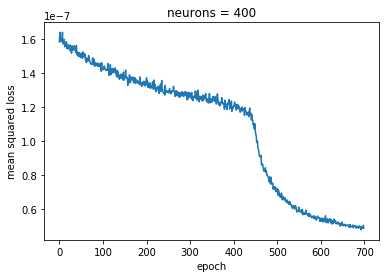

In [91]:
plt.plot(avg_train_losses[600:2000])
plt.ylabel('mean squared loss')
plt.xlabel('epoch')
plt.title('neurons = 400')
plt.show()

In [92]:
print(sum(time)/60)

8.961040833334982


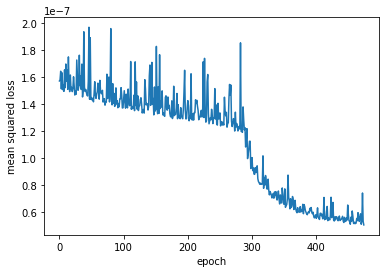

In [93]:
plt.plot(loss_valid[2000:4000:4])
plt.ylabel('mean squared loss')
plt.xlabel('epoch')
plt.show()

In [94]:
MLP.eval()
yHatTest = MLP(xTest.float())
rmse_test = np.mean((yHatTest.detach().numpy()-yTest.detach().numpy())**2)
print(rmse_test)
rmse_test1 = np.sqrt(np.mean((yHatTest.detach().numpy()-yTest.detach().numpy())**2,0))
print(rmse_test1)
print(np.mean(rmse_test1[0:29]))
print(np.mean(rmse_test1[29:53]))

5.860280665670365e-08
[0.00013207 0.00016624 0.00013135 0.00016913 0.00019543 0.00015828
 0.00017647 0.00023866 0.00023835 0.0002396  0.00022659 0.00023844
 0.00024748 0.00026807 0.00023082 0.00025006 0.00026338 0.00027505
 0.00024646 0.00028006 0.00028233 0.00031339 0.00028892 0.00034199
 0.00036261 0.00039516 0.00019968 0.0004911  0.00051228 0.00019032
 0.00019368 0.00014453 0.00021813 0.00017656 0.00021826 0.00016623
 0.00013802 0.00016985 0.000197   0.00016763 0.00017909 0.00017237
 0.00013932 0.0002144  0.00016322 0.00014971 0.00012765 0.00016319
 0.00015893 0.00015545 0.00023761 0.00031397 0.0003341 ]
0.0002606700802339445
0.00018705050553290036


In [95]:
np.save(saveFile+'rmse_test_last',rmse_test1)
np.save(saveFile+'yHatTest_last',yHatTest.detach().numpy())

In [96]:
model = Resnet(BasicBlock)
model.load_state_dict(torch.load(saveFile + 'Best'+'.ckpt'))
optimizer.load_state_dict(torch.load(saveFile+'Optim'+'Best'+'.ckpt'))
model.eval()
yHatTest = model(xTest.float())
rmse_test2 = np.mean((yHatTest.detach().numpy()-yTest.detach().numpy())**2)
print(rmse_test2)
rmse_test3 = np.sqrt(np.mean((yHatTest.detach().numpy()-yTest.detach().numpy())**2,0))
print(rmse_test3)
print(np.mean(rmse_test3[0:29]))
print(np.mean(rmse_test3[29:53]))

5.7138089380017775e-08
[0.000134   0.00018062 0.00013109 0.00016244 0.00018104 0.00015886
 0.00017762 0.0002339  0.0002394  0.00024094 0.00022651 0.00023652
 0.00025278 0.00026814 0.00023688 0.00024977 0.00026686 0.00027815
 0.00024912 0.0002811  0.00028071 0.00031562 0.00028918 0.00033216
 0.00035574 0.00038238 0.00020024 0.00046668 0.00048867 0.00018377
 0.00019553 0.00014472 0.00019951 0.00017991 0.00021736 0.00016593
 0.00013865 0.00017058 0.00020422 0.00017082 0.0001783  0.00017345
 0.00013947 0.00020778 0.00017113 0.00016309 0.00013024 0.00016102
 0.00015631 0.00015479 0.00022874 0.00029975 0.00032949]
0.0002585214391638239
0.00018602407286165924


In [97]:
np.save(saveFile+'rmse_test_best',rmse_test3)
np.save(saveFile+'yHatTest_best',yHatTest.detach().numpy())